In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib import patches
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

import os
import math
import random

import keras
from keras.models import Sequential
from keras.layers import Input, Dense, Conv1D, Conv2D, Flatten, MaxPooling1D, MaxPooling2D
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from keras.regularizers import l2

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.metrics import roc_curve, roc_auc_score, auc

import scipy.stats as st
from scipy.stats import poisson
from scipy.interpolate import interp1d
from scipy.stats import norm

from keras.layers import concatenate
from tensorflow.keras.models import Model

In [2]:
from sklearn.neighbors import KernelDensity # paquete necesario
from sklearn.model_selection import GridSearchCV

import scipy.integrate as integrate

In [3]:
import xgboost
from xgboost import XGBRegressor, XGBClassifier

In [4]:
import h5py

import glob
import numpy as np
import os.path as path
import imageio
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Activation, Dropout, Flatten, Dense, Conv2D, MaxPooling2D
from keras.callbacks import EarlyStopping, TensorBoard
from datetime import datetime
import keras
from keras import regularizers
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score, average_precision_score, precision_recall_curve, auc,recall_score
#from keras.optimizers import Adam
from keras.optimizer_v2.adam import Adam
from keras.regularizers import l2
import h5py
from sklearn.model_selection import GridSearchCV
from keras.backend import cast, greater, clip, floatx,epsilon
from keras.wrappers.scikit_learn import KerasClassifier
from keras import backend as K
from sklearn.model_selection import StratifiedKFold

In [5]:
#####################################
# IMPORT AUXILIARY/CUSTOM FUNCTIONS #
#####################################

from AUX_MLL_BL import max_num_bins, Z_BL_asimov, BL_test_fast, BL_test_fsolve, MLL_test_fast, MLL_test_fsolve, KDE_fitter, MLL_test_fast, MLL_test_fsolve


# AUX FUNCTION TO FIND SOLUTIONS

def dx(fn, x, delta=0.001):
    return (fn(x+delta) - fn(x))/delta

def solvecross(fn, value, x=-45, maxtries=1000, maxerr=0.00001):
    for tries in range(maxtries):
        err = fn(x) - value
        if abs(err) < maxerr:
            return x
        slope = dx(fn, x)
        x -= err/slope
        if x < -47 or x > -44:
            x = random.uniform(-47, -44) 
    raise ValueError('no solution found')

### DATA

In [6]:
mDM_mDM = [10, 20, 35, 50, 100, 200, 500]

S_cross1045_mDM = [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]

print(S_cross1045_mDM)

filefolder = '../../data2024/processed/'

[4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]


In [7]:
##############
# PARAMETERS #
##############

tot_B = 634.55+2.26+0.01+0.6+5.34

f_ER = 634.55 / tot_B
f_AC = 2.26 / tot_B
f_CNNS = 0.01 / tot_B
f_RN = 0.6 / tot_B
f_WALL = 5.34 / tot_B

f_ER + f_AC + f_CNNS + f_RN + f_WALL



cross_factor = np.logspace(-47,-44,10) / 1e-45

S_expected_mDM = []
for i in range(len(S_cross1045_mDM)):
    S_expected_mDM.append( [max(1, round(S_cross1045_mDM[i] * fac)) for fac in cross_factor] )


# DISCOVERY: 'discovery', EXCLUSION: 'exclusion'
D_or_E = 'exclusion'

# requested number of pseudo experiments
num_pseudo = 2000

# number of expected background events per ensemble
B_expected = round(tot_B)

print('B_expected: ', B_expected)
print('S_cross1045_mDM: ', S_cross1045_mDM)
print('S_expected_mDM (from cross=1e-47 to 1e-44): ', S_expected_mDM)

B_expected:  643
S_cross1045_mDM:  [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]
S_expected_mDM (from cross=1e-47 to 1e-44):  [[1, 1, 1, 1, 1, 2, 5, 10, 22, 47], [1, 2, 4, 9, 18, 40, 85, 184, 396, 854], [2, 4, 8, 18, 39, 83, 179, 385, 830, 1787], [2, 4, 9, 19, 41, 89, 192, 413, 889, 1915], [1, 3, 6, 14, 30, 65, 139, 300, 645, 1390], [1, 2, 4, 8, 17, 37, 79, 170, 366, 788], [1, 1, 2, 3, 7, 15, 33, 72, 154, 333]]


In [8]:
# Number of data points (per-class) for the ML classifier
#num_data = 30000
num_data = 15000
NUM_DAT = num_data


NUM_DAT_AC = round(num_data*f_AC)
NUM_DAT_CNNS = max(2, round(num_data*f_CNNS))
NUM_DAT_RN = round(num_data*f_RN)
NUM_DAT_WALL = round(num_data*f_WALL)

NUM_DAT_ER = num_data - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

In [9]:
###############
# BACKGROUNDS # 
###############

filename_B = 'ER/ER_all.hdf5'
filename_B1 = 'AC/AC_all.hdf5'
filename_B2 = 'CNNS/CNNS_all.hdf5'
filename_B3 = 'RN/RN_all.hdf5'
filename_B4 = 'WALL/WALL_all.hdf5'


f_B = h5py.File(filefolder+filename_B,'r')
f_B1 = h5py.File(filefolder+filename_B1,'r')
f_B2 = h5py.File(filefolder+filename_B2,'r')
f_B3 = h5py.File(filefolder+filename_B3,'r')
f_B4 = h5py.File(filefolder+filename_B4,'r')


# to normalize
scaler = preprocessing.MinMaxScaler()





######################
# ONLY HITS_bot_img DATA #
######################


HITS_bot_img_B = np.array( f_B['HITS_bot_img/ev_1'] )
HITS_bot_img_B1 = np.array( f_B1['HITS_bot_img/ev_1'] )
HITS_bot_img_B2 = np.array( f_B2['HITS_bot_img/ev_1'] )
HITS_bot_img_B3 = np.array( f_B3['HITS_bot_img/ev_1'] )
HITS_bot_img_B4 = np.array( f_B4['HITS_bot_img/ev_1'] )


for i in range(2,NUM_DAT_ER+1):
    # add new event to the matrix as a row
    HITS_bot_img_B = np.row_stack([HITS_bot_img_B,np.array( f_B['HITS_bot_img/ev_'+str(i)] )])
for i in range(2,NUM_DAT_AC+1):
    HITS_bot_img_B1 = np.row_stack([HITS_bot_img_B1,np.array( f_B1['HITS_bot_img/ev_'+str(i)] )])
for i in range(2,NUM_DAT_CNNS+1):
    HITS_bot_img_B2 = np.row_stack([HITS_bot_img_B2,np.array( f_B2['HITS_bot_img/ev_'+str(i)] )])
for i in range(2,NUM_DAT_RN+1):
    HITS_bot_img_B3 = np.row_stack([HITS_bot_img_B3,np.array( f_B3['HITS_bot_img/ev_'+str(i)] )])
for i in range(2,NUM_DAT_WALL+1):
    HITS_bot_img_B4 = np.row_stack([HITS_bot_img_B4,np.array( f_B4['HITS_bot_img/ev_'+str(i)] )])
    
    
    
######################
# ONLY HITS_top_img DATA #
######################


HITS_top_img_B = np.array( f_B['HITS_top_img/ev_1'] )
HITS_top_img_B1 = np.array( f_B1['HITS_top_img/ev_1'] )
HITS_top_img_B2 = np.array( f_B2['HITS_top_img/ev_1'] )
HITS_top_img_B3 = np.array( f_B3['HITS_top_img/ev_1'] )
HITS_top_img_B4 = np.array( f_B4['HITS_top_img/ev_1'] )


for i in range(2,NUM_DAT_ER+1):
    # add new event to the matrix as a row
    HITS_top_img_B = np.row_stack([HITS_top_img_B,np.array( f_B['HITS_top_img/ev_'+str(i)] )])
for i in range(2,NUM_DAT_AC+1):
    HITS_top_img_B1 = np.row_stack([HITS_top_img_B1,np.array( f_B1['HITS_top_img/ev_'+str(i)] )])
for i in range(2,NUM_DAT_CNNS+1):
    HITS_top_img_B2 = np.row_stack([HITS_top_img_B2,np.array( f_B2['HITS_top_img/ev_'+str(i)] )])
for i in range(2,NUM_DAT_RN+1):
    HITS_top_img_B3 = np.row_stack([HITS_top_img_B3,np.array( f_B3['HITS_top_img/ev_'+str(i)] )])
for i in range(2,NUM_DAT_WALL+1):
    HITS_top_img_B4 = np.row_stack([HITS_top_img_B4,np.array( f_B4['HITS_top_img/ev_'+str(i)] )])

## Loop over the masses

## 1. Raw data as arrays


#########################

mDM =  10 GeV


max_pS1_both lenght:  152

X_mon1_train :  (4999, 152)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 152)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 152)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35218)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35218)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35218)
y_mon_test :  (3334,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68378	validation_1-logloss:0.68413
[1]	validation_0-logloss:0.67460	validation_1-logloss:0.67532
[2]	validation_0-logloss:0.66560	validation_1-logloss:0.66662
[3]	validation_0-logloss:0.65676	validation_1-logloss:0.65814
[4]	validation_0-logloss:0.64810	validation_1-logloss:0.64978
[5]	validation_0-logloss:0.63959	validation_1-logloss:0.64159
[6]	validation_0-logloss:0.63126	validation_1-logloss:0.63358
[7]	validation_0-logloss:0.62307	validation_1-logloss:0.62574
[8]	validation_0-logloss:0.61502	validation_1-logloss:0.61803
[9]	validation_0-logloss:0.60712	validation_1-logloss:0.61049
[10]	validation_0-logloss:0.59936	validation_1-logloss:0.60309
[11]	validation_0-logloss:0.59176	validation_1-logloss:0.59577
[12]	validation_0-logloss:0.58428	validation_1-logloss:0.58861
[13]	validation_0-logloss:0.57694	validation_1-logloss:0.58158
[14]	validation_0-logloss:0.56973	validation_1-logloss:0.57466
[15]	validation_0-logloss:0.56264	validation_1-logloss:0.56790
[1

[130]	validation_0-logloss:0.16498	validation_1-logloss:0.18850
[131]	validation_0-logloss:0.16342	validation_1-logloss:0.18707
[132]	validation_0-logloss:0.16188	validation_1-logloss:0.18564
[133]	validation_0-logloss:0.16037	validation_1-logloss:0.18424
[134]	validation_0-logloss:0.15885	validation_1-logloss:0.18284
[135]	validation_0-logloss:0.15734	validation_1-logloss:0.18145
[136]	validation_0-logloss:0.15589	validation_1-logloss:0.18010
[137]	validation_0-logloss:0.15443	validation_1-logloss:0.17876
[138]	validation_0-logloss:0.15300	validation_1-logloss:0.17745
[139]	validation_0-logloss:0.15157	validation_1-logloss:0.17615
[140]	validation_0-logloss:0.15015	validation_1-logloss:0.17484
[141]	validation_0-logloss:0.14876	validation_1-logloss:0.17355
[142]	validation_0-logloss:0.14738	validation_1-logloss:0.17229
[143]	validation_0-logloss:0.14603	validation_1-logloss:0.17105
[144]	validation_0-logloss:0.14467	validation_1-logloss:0.16980
[145]	validation_0-logloss:0.14333	valid

[259]	validation_0-logloss:0.05342	validation_1-logloss:0.08694
[260]	validation_0-logloss:0.05299	validation_1-logloss:0.08659
[261]	validation_0-logloss:0.05257	validation_1-logloss:0.08619
[262]	validation_0-logloss:0.05216	validation_1-logloss:0.08582
[263]	validation_0-logloss:0.05173	validation_1-logloss:0.08547
[264]	validation_0-logloss:0.05132	validation_1-logloss:0.08513
[265]	validation_0-logloss:0.05090	validation_1-logloss:0.08476
[266]	validation_0-logloss:0.05047	validation_1-logloss:0.08440
[267]	validation_0-logloss:0.05006	validation_1-logloss:0.08402
[268]	validation_0-logloss:0.04966	validation_1-logloss:0.08371
[269]	validation_0-logloss:0.04927	validation_1-logloss:0.08338
[270]	validation_0-logloss:0.04888	validation_1-logloss:0.08304
[271]	validation_0-logloss:0.04849	validation_1-logloss:0.08269
[272]	validation_0-logloss:0.04810	validation_1-logloss:0.08237
[273]	validation_0-logloss:0.04772	validation_1-logloss:0.08203
[274]	validation_0-logloss:0.04733	valid

[388]	validation_0-logloss:0.01960	validation_1-logloss:0.05973
[389]	validation_0-logloss:0.01945	validation_1-logloss:0.05964
[390]	validation_0-logloss:0.01931	validation_1-logloss:0.05955
[391]	validation_0-logloss:0.01917	validation_1-logloss:0.05945
[392]	validation_0-logloss:0.01902	validation_1-logloss:0.05933
[393]	validation_0-logloss:0.01888	validation_1-logloss:0.05922
[394]	validation_0-logloss:0.01874	validation_1-logloss:0.05914
[395]	validation_0-logloss:0.01859	validation_1-logloss:0.05902
[396]	validation_0-logloss:0.01845	validation_1-logloss:0.05893
[397]	validation_0-logloss:0.01832	validation_1-logloss:0.05886
[398]	validation_0-logloss:0.01819	validation_1-logloss:0.05877
[399]	validation_0-logloss:0.01804	validation_1-logloss:0.05865
[400]	validation_0-logloss:0.01791	validation_1-logloss:0.05855
[401]	validation_0-logloss:0.01779	validation_1-logloss:0.05844
[402]	validation_0-logloss:0.01767	validation_1-logloss:0.05836
[403]	validation_0-logloss:0.01754	valid

[517]	validation_0-logloss:0.00838	validation_1-logloss:0.05277
[518]	validation_0-logloss:0.00834	validation_1-logloss:0.05275
[519]	validation_0-logloss:0.00829	validation_1-logloss:0.05271
[520]	validation_0-logloss:0.00824	validation_1-logloss:0.05270
[521]	validation_0-logloss:0.00819	validation_1-logloss:0.05268
[522]	validation_0-logloss:0.00814	validation_1-logloss:0.05268
[523]	validation_0-logloss:0.00810	validation_1-logloss:0.05266
[524]	validation_0-logloss:0.00805	validation_1-logloss:0.05264
[525]	validation_0-logloss:0.00800	validation_1-logloss:0.05260
[526]	validation_0-logloss:0.00796	validation_1-logloss:0.05256
[527]	validation_0-logloss:0.00791	validation_1-logloss:0.05253
[528]	validation_0-logloss:0.00787	validation_1-logloss:0.05251
[529]	validation_0-logloss:0.00782	validation_1-logloss:0.05248
[530]	validation_0-logloss:0.00778	validation_1-logloss:0.05246
[531]	validation_0-logloss:0.00774	validation_1-logloss:0.05244
[532]	validation_0-logloss:0.00770	valid

[646]	validation_0-logloss:0.00434	validation_1-logloss:0.05094
[647]	validation_0-logloss:0.00432	validation_1-logloss:0.05094
[648]	validation_0-logloss:0.00430	validation_1-logloss:0.05095
[649]	validation_0-logloss:0.00428	validation_1-logloss:0.05097
[650]	validation_0-logloss:0.00426	validation_1-logloss:0.05098
[651]	validation_0-logloss:0.00424	validation_1-logloss:0.05094
[652]	validation_0-logloss:0.00422	validation_1-logloss:0.05093
[653]	validation_0-logloss:0.00420	validation_1-logloss:0.05095
[654]	validation_0-logloss:0.00418	validation_1-logloss:0.05094
[655]	validation_0-logloss:0.00417	validation_1-logloss:0.05093
[656]	validation_0-logloss:0.00415	validation_1-logloss:0.05094
[657]	validation_0-logloss:0.00413	validation_1-logloss:0.05096
[658]	validation_0-logloss:0.00411	validation_1-logloss:0.05096
[659]	validation_0-logloss:0.00410	validation_1-logloss:0.05097
[660]	validation_0-logloss:0.00409	validation_1-logloss:0.05098
[661]	validation_0-logloss:0.00407	valid

[775]	validation_0-logloss:0.00268	validation_1-logloss:0.05084
[776]	validation_0-logloss:0.00267	validation_1-logloss:0.05084
[777]	validation_0-logloss:0.00266	validation_1-logloss:0.05086
[778]	validation_0-logloss:0.00266	validation_1-logloss:0.05087
[779]	validation_0-logloss:0.00265	validation_1-logloss:0.05088
[780]	validation_0-logloss:0.00264	validation_1-logloss:0.05087
[781]	validation_0-logloss:0.00263	validation_1-logloss:0.05092
[782]	validation_0-logloss:0.00263	validation_1-logloss:0.05090
[783]	validation_0-logloss:0.00262	validation_1-logloss:0.05089
[784]	validation_0-logloss:0.00261	validation_1-logloss:0.05090
[785]	validation_0-logloss:0.00260	validation_1-logloss:0.05089


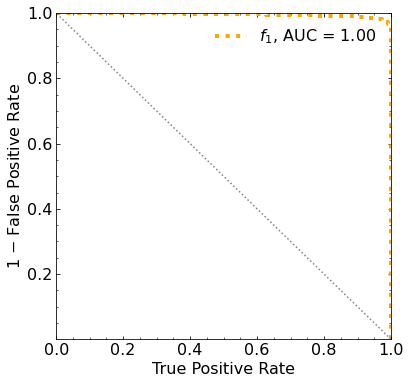

Classification score:


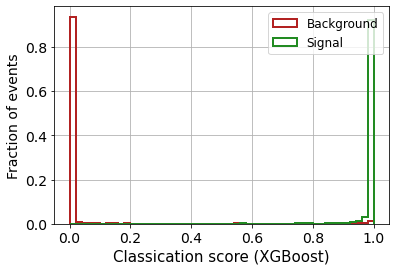


 ROC-AUC =  0.9956487216477626
At least 5 B events per bin, range = [[0, 1]]:
# bins:  2 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  2
range of our data:  [[0, 1]]
number of bins we are going to use:  2
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


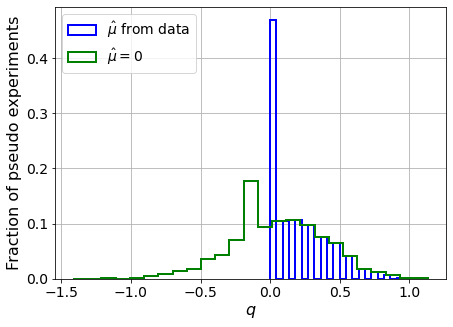

muhat mean:  -0.14914779341862558
Z_bins:  0.30878245921987796
std Z_bins:  0.3435084770990949
Z_bins mu=0:  0.30878245921987796
std Z_bins mu=0:  0.5589250605039672

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


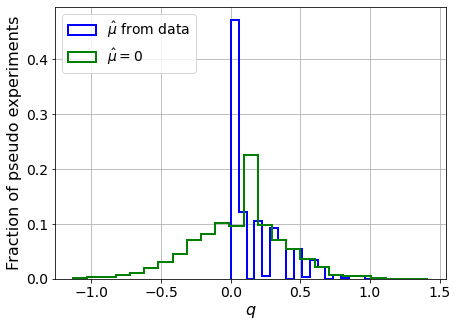

muhat mean:  -0.12636242581862422
Z_bins:  0.30867946739645435
std Z_bins:  0.341356585039844
Z_bins mu=0:  0.30867946739645435
std Z_bins mu=0:  0.5438427612521683

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


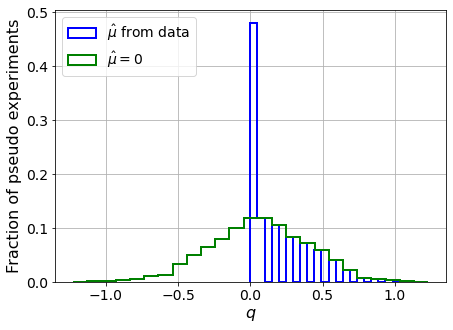

muhat mean:  -0.16245102922556265
Z_bins:  0.3083496623919778
std Z_bins:  0.3409795427828046
Z_bins mu=0:  0.3083496623919778
std Z_bins mu=0:  0.5365640038833092

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


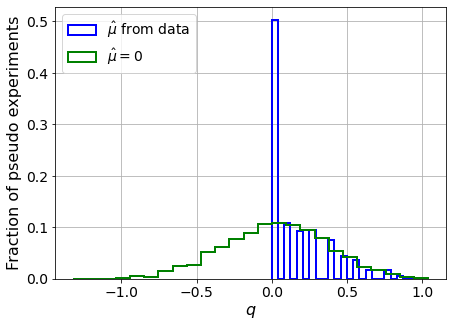

muhat mean:  0.07182759882120326
Z_bins:  0.1138174983790864
std Z_bins:  0.9246779281760723
Z_bins mu=0:  0.049230625372371994
std Z_bins mu=0:  3.520242350018348

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


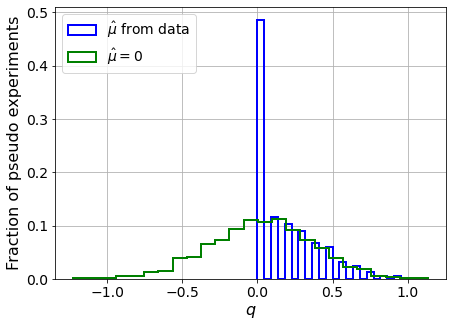

muhat mean:  -0.052341979316916504
Z_bins:  0.3081639919653645
std Z_bins:  0.347520106908231
Z_bins mu=0:  0.3081639919653645
std Z_bins mu=0:  0.5595938354837853

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


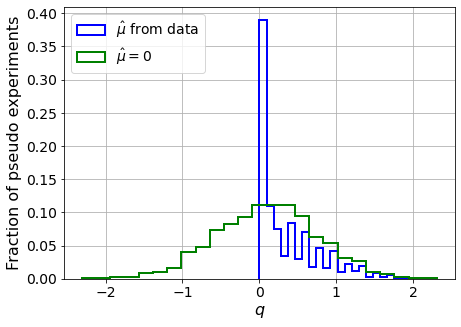

muhat mean:  0.030253710187284902
Z_bins:  0.5231487093308453
std Z_bins:  0.4079721033646533
Z_bins mu=0:  0.5231487093308453
std Z_bins mu=0:  0.6228504964029818

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


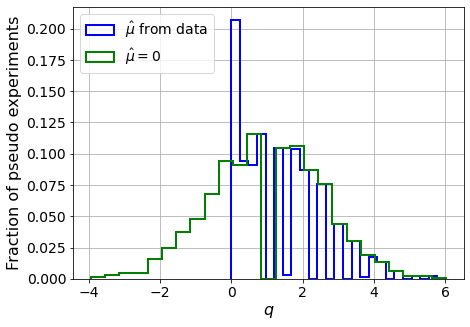

muhat mean:  0.015810646990056586
Z_bins:  0.9183818855032347
std Z_bins:  0.6456380056329527
Z_bins mu=0:  0.9125845863344916
std Z_bins mu=0:  0.8608702337993083

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


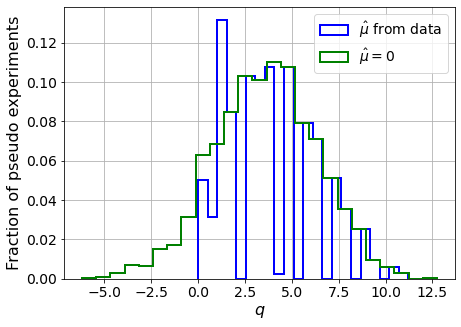

muhat mean:  0.007683617320364182
Z_bins:  1.8176836922420163
std Z_bins:  0.6614497385021055
Z_bins mu=0:  1.814832209265752
std Z_bins mu=0:  0.7887186653973098

--------

B_expected:  643
S_expected:  22

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


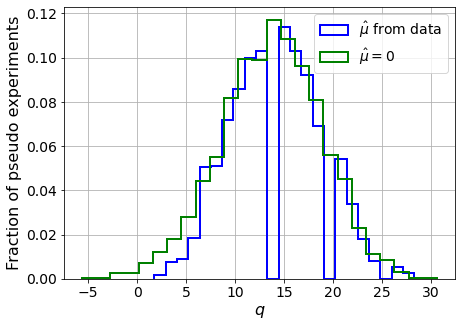

muhat mean:  0.004945719872278107
Z_bins:  3.826047903726518
std Z_bins:  0.6140449176918401
Z_bins mu=0:  3.826047903726518
std Z_bins mu=0:  0.678263766330713

--------

B_expected:  643
S_expected:  47

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


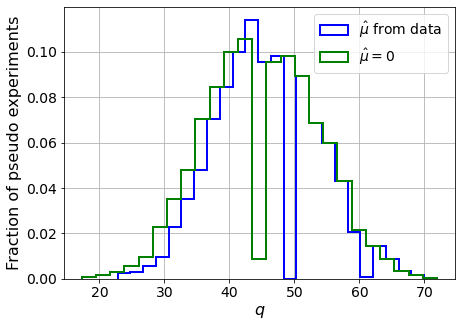

muhat mean:  -0.0035368476716248053
Z_bins:  6.767140053626585
std Z_bins:  0.6051107204879255
Z_bins mu=0:  6.767140053626585
std Z_bins mu=0:  0.6359644146810016

--------


 FINAL RESULT:

[[0.30878245921987796, 0.3435084770990949, -0.14914779341862558, 0.30878245921987796, 0.5589250605039672], [0.30867946739645435, 0.341356585039844, -0.12636242581862422, 0.30867946739645435, 0.5438427612521683], [0.3083496623919778, 0.3409795427828046, -0.16245102922556265, 0.3083496623919778, 0.5365640038833092], [0.1138174983790864, 0.9246779281760723, 0.07182759882120326, 0.049230625372371994, 3.520242350018348], [0.3081639919653645, 0.347520106908231, -0.052341979316916504, 0.3081639919653645, 0.5595938354837853], [0.5231487093308453, 0.4079721033646533, 0.030253710187284902, 0.5231487093308453, 0.6228504964029818], [0.9183818855032347, 0.6456380056329527, 0.015810646990056586, 0.9125845863344916, 0.8608702337993083], [1.8176836922420163, 0.6614497385021055, 0.007683617320364182, 1.81483220926

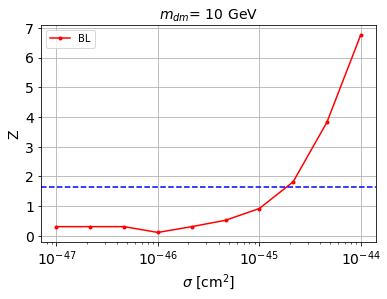


cross_BL_164:  1.946264899975856e-45
cross_BL_164_up:  1.0841121689089158e-45
cross_BL_164_down:  2.696790594070898e-45

#########################


#########################

mDM =  20 GeV


max_pS1_both lenght:  152

X_mon1_train :  (4999, 152)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 152)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 152)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35218)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35218)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35218)
y_

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68478	validation_1-logloss:0.68533
[1]	validation_0-logloss:0.67657	validation_1-logloss:0.67757
[2]	validation_0-logloss:0.66854	validation_1-logloss:0.67002
[3]	validation_0-logloss:0.66067	validation_1-logloss:0.66256
[4]	validation_0-logloss:0.65294	validation_1-logloss:0.65533
[5]	validation_0-logloss:0.64532	validation_1-logloss:0.64810
[6]	validation_0-logloss:0.63787	validation_1-logloss:0.64100
[7]	validation_0-logloss:0.63051	validation_1-logloss:0.63398
[8]	validation_0-logloss:0.62331	validation_1-logloss:0.62726
[9]	validation_0-logloss:0.61619	validation_1-logloss:0.62058
[10]	validation_0-logloss:0.60921	validation_1-logloss:0.61388
[11]	validation_0-logloss:0.60235	validation_1-logloss:0.60738
[12]	validation_0-logloss:0.59562	validation_1-logloss:0.60108
[13]	validation_0-logloss:0.58889	validation_1-logloss:0.59487
[14]	validation_0-logloss:0.58229	validation_1-logloss:0.58877
[15]	validation_0-logloss:0.57587	validation_1-logloss:0.58279
[1

[130]	validation_0-logloss:0.20623	validation_1-logloss:0.24679
[131]	validation_0-logloss:0.20469	validation_1-logloss:0.24547
[132]	validation_0-logloss:0.20323	validation_1-logloss:0.24419
[133]	validation_0-logloss:0.20175	validation_1-logloss:0.24288
[134]	validation_0-logloss:0.20031	validation_1-logloss:0.24171
[135]	validation_0-logloss:0.19889	validation_1-logloss:0.24042
[136]	validation_0-logloss:0.19742	validation_1-logloss:0.23920
[137]	validation_0-logloss:0.19601	validation_1-logloss:0.23803
[138]	validation_0-logloss:0.19464	validation_1-logloss:0.23675
[139]	validation_0-logloss:0.19320	validation_1-logloss:0.23555
[140]	validation_0-logloss:0.19187	validation_1-logloss:0.23436
[141]	validation_0-logloss:0.19046	validation_1-logloss:0.23320
[142]	validation_0-logloss:0.18905	validation_1-logloss:0.23202
[143]	validation_0-logloss:0.18775	validation_1-logloss:0.23081
[144]	validation_0-logloss:0.18639	validation_1-logloss:0.22969
[145]	validation_0-logloss:0.18504	valid

[259]	validation_0-logloss:0.08976	validation_1-logloss:0.15575
[260]	validation_0-logloss:0.08931	validation_1-logloss:0.15545
[261]	validation_0-logloss:0.08882	validation_1-logloss:0.15515
[262]	validation_0-logloss:0.08831	validation_1-logloss:0.15480
[263]	validation_0-logloss:0.08779	validation_1-logloss:0.15443
[264]	validation_0-logloss:0.08733	validation_1-logloss:0.15408
[265]	validation_0-logloss:0.08686	validation_1-logloss:0.15382
[266]	validation_0-logloss:0.08639	validation_1-logloss:0.15348
[267]	validation_0-logloss:0.08595	validation_1-logloss:0.15321
[268]	validation_0-logloss:0.08546	validation_1-logloss:0.15288
[269]	validation_0-logloss:0.08498	validation_1-logloss:0.15260
[270]	validation_0-logloss:0.08448	validation_1-logloss:0.15228
[271]	validation_0-logloss:0.08401	validation_1-logloss:0.15198
[272]	validation_0-logloss:0.08353	validation_1-logloss:0.15166
[273]	validation_0-logloss:0.08312	validation_1-logloss:0.15138
[274]	validation_0-logloss:0.08267	valid

[388]	validation_0-logloss:0.04993	validation_1-logloss:0.13245
[389]	validation_0-logloss:0.04976	validation_1-logloss:0.13232
[390]	validation_0-logloss:0.04956	validation_1-logloss:0.13225
[391]	validation_0-logloss:0.04938	validation_1-logloss:0.13215
[392]	validation_0-logloss:0.04923	validation_1-logloss:0.13209
[393]	validation_0-logloss:0.04904	validation_1-logloss:0.13201
[394]	validation_0-logloss:0.04889	validation_1-logloss:0.13192
[395]	validation_0-logloss:0.04869	validation_1-logloss:0.13185
[396]	validation_0-logloss:0.04851	validation_1-logloss:0.13174
[397]	validation_0-logloss:0.04836	validation_1-logloss:0.13169
[398]	validation_0-logloss:0.04820	validation_1-logloss:0.13163
[399]	validation_0-logloss:0.04800	validation_1-logloss:0.13151
[400]	validation_0-logloss:0.04780	validation_1-logloss:0.13143
[401]	validation_0-logloss:0.04766	validation_1-logloss:0.13135
[402]	validation_0-logloss:0.04752	validation_1-logloss:0.13129
[403]	validation_0-logloss:0.04734	valid

[517]	validation_0-logloss:0.03279	validation_1-logloss:0.12632
[518]	validation_0-logloss:0.03270	validation_1-logloss:0.12636
[519]	validation_0-logloss:0.03263	validation_1-logloss:0.12633
[520]	validation_0-logloss:0.03251	validation_1-logloss:0.12629
[521]	validation_0-logloss:0.03242	validation_1-logloss:0.12622
[522]	validation_0-logloss:0.03231	validation_1-logloss:0.12615
[523]	validation_0-logloss:0.03221	validation_1-logloss:0.12610
[524]	validation_0-logloss:0.03210	validation_1-logloss:0.12609
[525]	validation_0-logloss:0.03203	validation_1-logloss:0.12610
[526]	validation_0-logloss:0.03195	validation_1-logloss:0.12609
[527]	validation_0-logloss:0.03183	validation_1-logloss:0.12611
[528]	validation_0-logloss:0.03176	validation_1-logloss:0.12609
[529]	validation_0-logloss:0.03165	validation_1-logloss:0.12603
[530]	validation_0-logloss:0.03157	validation_1-logloss:0.12601
[531]	validation_0-logloss:0.03149	validation_1-logloss:0.12602
[532]	validation_0-logloss:0.03141	valid

[646]	validation_0-logloss:0.02254	validation_1-logloss:0.12518
[647]	validation_0-logloss:0.02248	validation_1-logloss:0.12519
[648]	validation_0-logloss:0.02241	validation_1-logloss:0.12518
[649]	validation_0-logloss:0.02233	validation_1-logloss:0.12517
[650]	validation_0-logloss:0.02225	validation_1-logloss:0.12511
[651]	validation_0-logloss:0.02219	validation_1-logloss:0.12510
[652]	validation_0-logloss:0.02213	validation_1-logloss:0.12507
[653]	validation_0-logloss:0.02207	validation_1-logloss:0.12510
[654]	validation_0-logloss:0.02202	validation_1-logloss:0.12509
[655]	validation_0-logloss:0.02195	validation_1-logloss:0.12511
[656]	validation_0-logloss:0.02187	validation_1-logloss:0.12507
[657]	validation_0-logloss:0.02184	validation_1-logloss:0.12509
[658]	validation_0-logloss:0.02176	validation_1-logloss:0.12505
[659]	validation_0-logloss:0.02167	validation_1-logloss:0.12500
[660]	validation_0-logloss:0.02159	validation_1-logloss:0.12497
[661]	validation_0-logloss:0.02153	valid

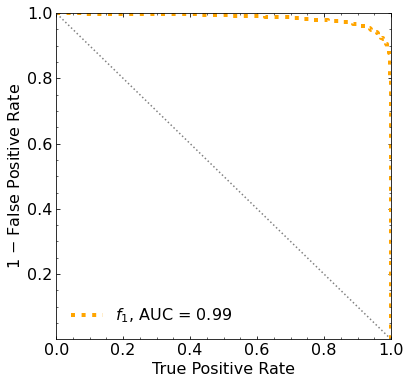

Classification score:


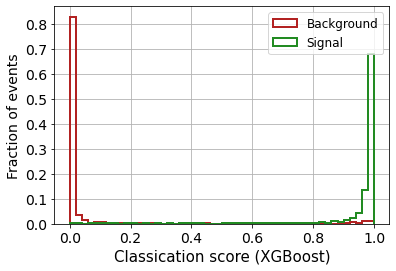


 ROC-AUC =  0.9857490144925032
At least 5 B events per bin, range = [[0, 1]]:
# bins:  6 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  6
range of our data:  [[0, 1]]
number of bins we are going to use:  6
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2035


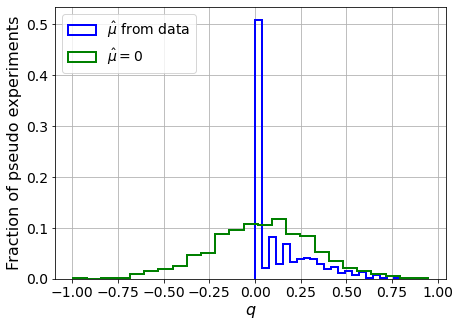

muhat mean:  -0.08126434127821841
Z_bins:  0.17822166329426334
std Z_bins:  0.4934515092843228
Z_bins mu=0:  0.17819599233562963
std Z_bins mu=0:  0.7920180488962342

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2165


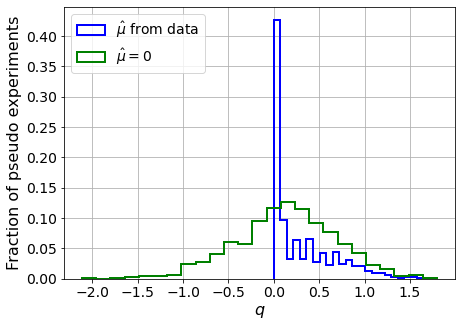

muhat mean:  -0.021685711783118868
Z_bins:  0.3413761656255295
std Z_bins:  0.5240341033584389
Z_bins mu=0:  0.3409684549929946
std Z_bins mu=0:  0.8120938489052568

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2295


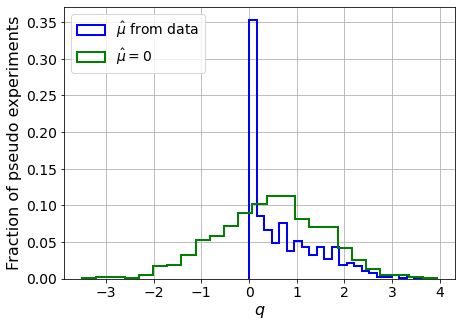

muhat mean:  0.0339297216865563
Z_bins:  0.6834392699502899
std Z_bins:  0.5647904584877557
Z_bins mu=0:  0.6832260912287447
std Z_bins mu=0:  0.806628775226416

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2165


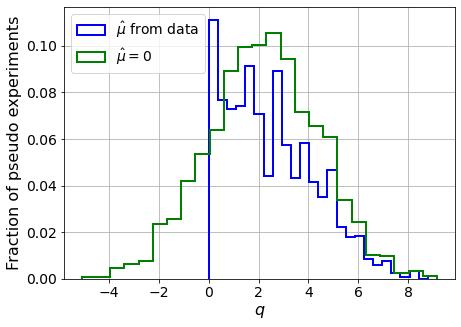

muhat mean:  -0.0005990288959834605
Z_bins:  1.4860781155532796
std Z_bins:  0.6064412300744223
Z_bins mu=0:  1.4860170825147119
std Z_bins mu=0:  0.7382947304368405

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.203


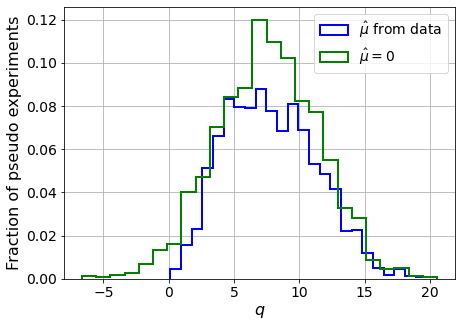

muhat mean:  0.00553467707604712
Z_bins:  2.747184622426547
std Z_bins:  0.6339891080188396
Z_bins mu=0:  2.7470553073176855
std Z_bins mu=0:  0.7141084159633454

--------

B_expected:  643
S_expected:  40

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2265


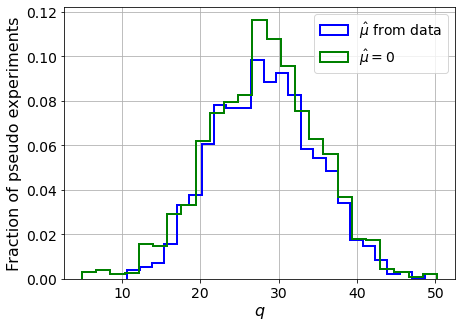

muhat mean:  0.0044377589686565655
Z_bins:  5.3055613063313025
std Z_bins:  0.6119219654328472
Z_bins mu=0:  5.305487649244227
std Z_bins mu=0:  0.6568625848217632

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2215


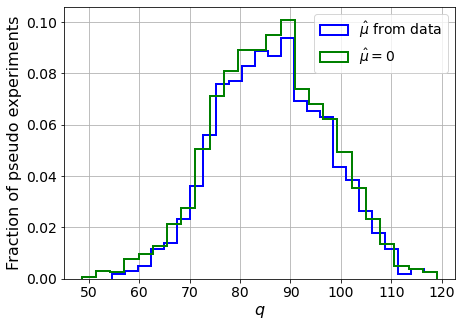

muhat mean:  -0.000600685124931951
Z_bins:  9.281900622578119
std Z_bins:  0.588570194702192
Z_bins mu=0:  9.28188771149736
std Z_bins mu=0:  0.6129980325441385

--------

B_expected:  643
S_expected:  184

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2265


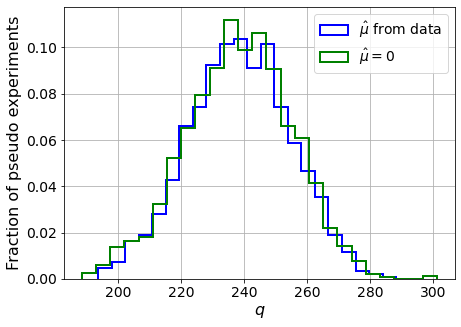

muhat mean:  0.001532494163101272
Z_bins:  15.447807576560466
std Z_bins:  0.5257694982566252
Z_bins mu=0:  15.447759512353281
std Z_bins mu=0:  0.5428961009401193

--------

B_expected:  643
S_expected:  396

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.235


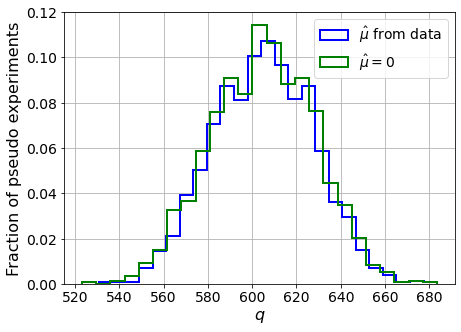

muhat mean:  0.00022755280433204352
Z_bins:  24.60259894995232
std Z_bins:  0.45870042485390167
Z_bins mu=0:  24.602313913526178
std Z_bins mu=0:  0.46860142175021063

--------

B_expected:  643
S_expected:  854

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.216


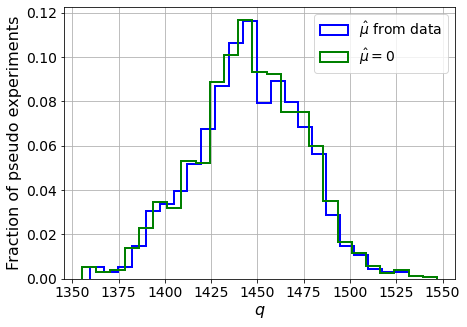

muhat mean:  -5.04951118487981e-05
Z_bins:  38.02227986271618
std Z_bins:  0.38512769060651386
Z_bins mu=0:  38.0220577838884
std Z_bins mu=0:  0.3916843644616938

--------


 FINAL RESULT:

[[0.17822166329426334, 0.4934515092843228, -0.08126434127821841, 0.17819599233562963, 0.7920180488962342], [0.3413761656255295, 0.5240341033584389, -0.021685711783118868, 0.3409684549929946, 0.8120938489052568], [0.6834392699502899, 0.5647904584877557, 0.0339297216865563, 0.6832260912287447, 0.806628775226416], [1.4860781155532796, 0.6064412300744223, -0.0005990288959834605, 1.4860170825147119, 0.7382947304368405], [2.747184622426547, 0.6339891080188396, 0.00553467707604712, 2.7470553073176855, 0.7141084159633454], [5.3055613063313025, 0.6119219654328472, 0.0044377589686565655, 5.305487649244227, 0.6568625848217632], [9.281900622578119, 0.588570194702192, -0.000600685124931951, 9.28188771149736, 0.6129980325441385], [15.447807576560466, 0.5257694982566252, 0.001532494163101272, 15.447759512353281, 

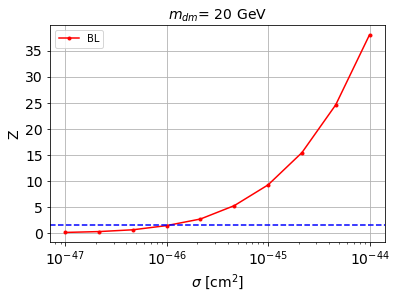


cross_BL_164:  1.1260224149047503e-46
cross_BL_164_up:  6.935884361340168e-47
cross_BL_164_down:  1.7221183297984327e-46

#########################


#########################

mDM =  35 GeV


max_pS1_both lenght:  152

X_mon1_train :  (4999, 152)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 152)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 152)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35218)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35218)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35218)
y

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68608	validation_1-logloss:0.68683
[1]	validation_0-logloss:0.67911	validation_1-logloss:0.68055
[2]	validation_0-logloss:0.67227	validation_1-logloss:0.67445
[3]	validation_0-logloss:0.66560	validation_1-logloss:0.66849
[4]	validation_0-logloss:0.65903	validation_1-logloss:0.66265
[5]	validation_0-logloss:0.65260	validation_1-logloss:0.65683
[6]	validation_0-logloss:0.64631	validation_1-logloss:0.65113
[7]	validation_0-logloss:0.64010	validation_1-logloss:0.64561
[8]	validation_0-logloss:0.63396	validation_1-logloss:0.64017
[9]	validation_0-logloss:0.62793	validation_1-logloss:0.63481
[10]	validation_0-logloss:0.62201	validation_1-logloss:0.62954
[11]	validation_0-logloss:0.61620	validation_1-logloss:0.62436
[12]	validation_0-logloss:0.61048	validation_1-logloss:0.61926
[13]	validation_0-logloss:0.60488	validation_1-logloss:0.61432
[14]	validation_0-logloss:0.59934	validation_1-logloss:0.60941
[15]	validation_0-logloss:0.59385	validation_1-logloss:0.60464
[1

[130]	validation_0-logloss:0.26728	validation_1-logloss:0.32887
[131]	validation_0-logloss:0.26585	validation_1-logloss:0.32782
[132]	validation_0-logloss:0.26446	validation_1-logloss:0.32685
[133]	validation_0-logloss:0.26300	validation_1-logloss:0.32578
[134]	validation_0-logloss:0.26165	validation_1-logloss:0.32490
[135]	validation_0-logloss:0.26023	validation_1-logloss:0.32382
[136]	validation_0-logloss:0.25887	validation_1-logloss:0.32282
[137]	validation_0-logloss:0.25752	validation_1-logloss:0.32182
[138]	validation_0-logloss:0.25624	validation_1-logloss:0.32086
[139]	validation_0-logloss:0.25494	validation_1-logloss:0.32000
[140]	validation_0-logloss:0.25366	validation_1-logloss:0.31910
[141]	validation_0-logloss:0.25237	validation_1-logloss:0.31821
[142]	validation_0-logloss:0.25106	validation_1-logloss:0.31723
[143]	validation_0-logloss:0.24977	validation_1-logloss:0.31635
[144]	validation_0-logloss:0.24854	validation_1-logloss:0.31544
[145]	validation_0-logloss:0.24730	valid

[259]	validation_0-logloss:0.15225	validation_1-logloss:0.25428
[260]	validation_0-logloss:0.15172	validation_1-logloss:0.25394
[261]	validation_0-logloss:0.15121	validation_1-logloss:0.25368
[262]	validation_0-logloss:0.15063	validation_1-logloss:0.25332
[263]	validation_0-logloss:0.15014	validation_1-logloss:0.25305
[264]	validation_0-logloss:0.14960	validation_1-logloss:0.25269
[265]	validation_0-logloss:0.14904	validation_1-logloss:0.25243
[266]	validation_0-logloss:0.14852	validation_1-logloss:0.25210
[267]	validation_0-logloss:0.14804	validation_1-logloss:0.25179
[268]	validation_0-logloss:0.14748	validation_1-logloss:0.25149
[269]	validation_0-logloss:0.14694	validation_1-logloss:0.25116
[270]	validation_0-logloss:0.14642	validation_1-logloss:0.25097
[271]	validation_0-logloss:0.14591	validation_1-logloss:0.25068
[272]	validation_0-logloss:0.14538	validation_1-logloss:0.25042
[273]	validation_0-logloss:0.14488	validation_1-logloss:0.25011
[274]	validation_0-logloss:0.14436	valid

[388]	validation_0-logloss:0.10408	validation_1-logloss:0.23084
[389]	validation_0-logloss:0.10388	validation_1-logloss:0.23081
[390]	validation_0-logloss:0.10358	validation_1-logloss:0.23075
[391]	validation_0-logloss:0.10337	validation_1-logloss:0.23064
[392]	validation_0-logloss:0.10318	validation_1-logloss:0.23061
[393]	validation_0-logloss:0.10291	validation_1-logloss:0.23050
[394]	validation_0-logloss:0.10272	validation_1-logloss:0.23048
[395]	validation_0-logloss:0.10247	validation_1-logloss:0.23033
[396]	validation_0-logloss:0.10232	validation_1-logloss:0.23030
[397]	validation_0-logloss:0.10190	validation_1-logloss:0.23014
[398]	validation_0-logloss:0.10165	validation_1-logloss:0.22999
[399]	validation_0-logloss:0.10139	validation_1-logloss:0.22995
[400]	validation_0-logloss:0.10120	validation_1-logloss:0.22991
[401]	validation_0-logloss:0.10100	validation_1-logloss:0.22994
[402]	validation_0-logloss:0.10064	validation_1-logloss:0.22976
[403]	validation_0-logloss:0.10050	valid

[517]	validation_0-logloss:0.07784	validation_1-logloss:0.22390
[518]	validation_0-logloss:0.07773	validation_1-logloss:0.22387
[519]	validation_0-logloss:0.07747	validation_1-logloss:0.22381
[520]	validation_0-logloss:0.07738	validation_1-logloss:0.22381
[521]	validation_0-logloss:0.07724	validation_1-logloss:0.22383
[522]	validation_0-logloss:0.07709	validation_1-logloss:0.22392
[523]	validation_0-logloss:0.07693	validation_1-logloss:0.22392
[524]	validation_0-logloss:0.07674	validation_1-logloss:0.22392
[525]	validation_0-logloss:0.07665	validation_1-logloss:0.22393
[526]	validation_0-logloss:0.07641	validation_1-logloss:0.22388
[527]	validation_0-logloss:0.07625	validation_1-logloss:0.22384
[528]	validation_0-logloss:0.07614	validation_1-logloss:0.22377
[529]	validation_0-logloss:0.07600	validation_1-logloss:0.22374
[530]	validation_0-logloss:0.07584	validation_1-logloss:0.22373
[531]	validation_0-logloss:0.07568	validation_1-logloss:0.22371
[532]	validation_0-logloss:0.07559	valid

[646]	validation_0-logloss:0.05886	validation_1-logloss:0.22239
[647]	validation_0-logloss:0.05869	validation_1-logloss:0.22243
[648]	validation_0-logloss:0.05851	validation_1-logloss:0.22247
[649]	validation_0-logloss:0.05840	validation_1-logloss:0.22246
[650]	validation_0-logloss:0.05829	validation_1-logloss:0.22245
[651]	validation_0-logloss:0.05814	validation_1-logloss:0.22240
[652]	validation_0-logloss:0.05802	validation_1-logloss:0.22236
[653]	validation_0-logloss:0.05789	validation_1-logloss:0.22234
[654]	validation_0-logloss:0.05775	validation_1-logloss:0.22229
[655]	validation_0-logloss:0.05759	validation_1-logloss:0.22235
[656]	validation_0-logloss:0.05742	validation_1-logloss:0.22236
[657]	validation_0-logloss:0.05730	validation_1-logloss:0.22237
[658]	validation_0-logloss:0.05720	validation_1-logloss:0.22239
[659]	validation_0-logloss:0.05709	validation_1-logloss:0.22235
[660]	validation_0-logloss:0.05697	validation_1-logloss:0.22241
[661]	validation_0-logloss:0.05688	valid

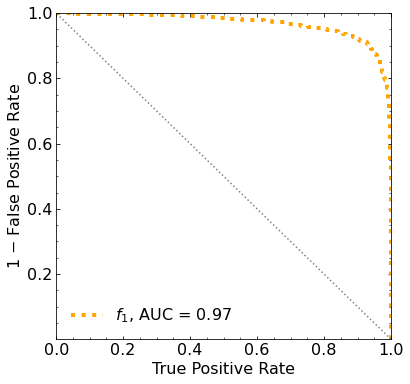

Classification score:


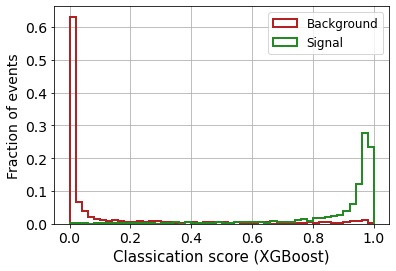


 ROC-AUC =  0.9676805371987687
At least 5 B events per bin, range = [[0, 1]]:
# bins:  11 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  11
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0545


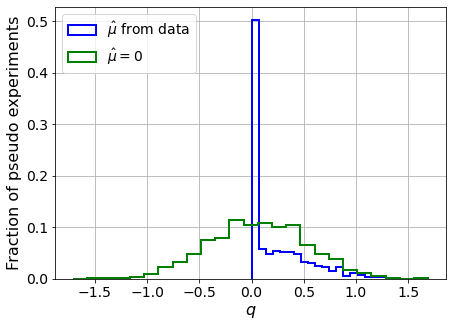

muhat mean:  0.14383656311585574
Z_bins:  0.2581217626092594
std Z_bins:  0.5696658036526676
Z_bins mu=0:  0.25534388664769714
std Z_bins mu=0:  0.9285104895151023

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.055


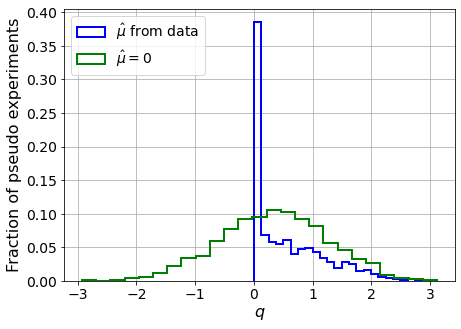

muhat mean:  0.0068439913709024535
Z_bins:  0.5863023758086632
std Z_bins:  0.533995595286105
Z_bins mu=0:  0.5863023758086632
std Z_bins mu=0:  0.7759253840191599

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0555


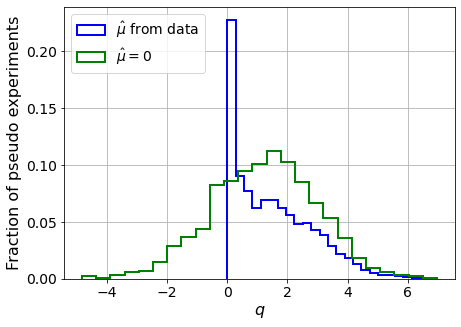

muhat mean:  0.015447078497125745
Z_bins:  1.1327897551505761
std Z_bins:  0.5886870440476407
Z_bins mu=0:  1.1327897551505761
std Z_bins mu=0:  0.7737712588880106

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.056


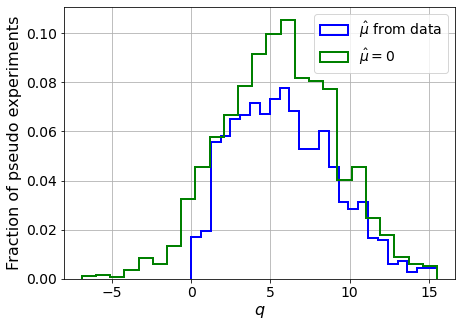

muhat mean:  -0.00038603060616115094
Z_bins:  2.3692626039912703
std Z_bins:  0.6602416790092148
Z_bins mu=0:  2.3692389938711207
std Z_bins mu=0:  0.7559161918012384

--------

B_expected:  643
S_expected:  39

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.054


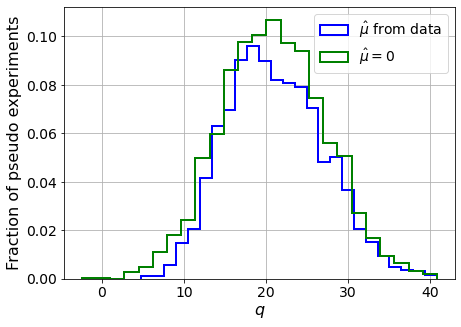

muhat mean:  -0.0034382765836552735
Z_bins:  4.553859574847815
std Z_bins:  0.6516994590283668
Z_bins mu=0:  4.553859574847815
std Z_bins mu=0:  0.6966047739766187

--------

B_expected:  643
S_expected:  83

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.043


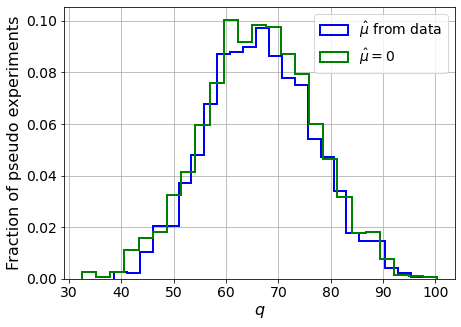

muhat mean:  0.0023845614015035603
Z_bins:  8.144310972647974
std Z_bins:  0.6203173041952345
Z_bins mu=0:  8.143199654157016
std Z_bins mu=0:  0.6502490729605618

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.045


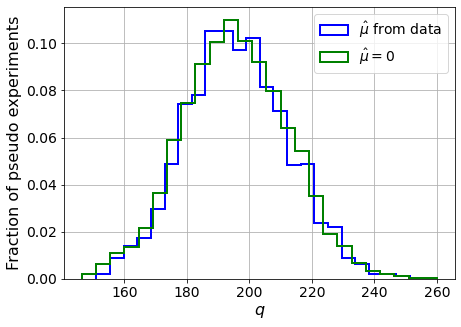

muhat mean:  -0.00030879489966314713
Z_bins:  13.978076814555275
std Z_bins:  0.5884645204660086
Z_bins mu=0:  13.977214413469344
std Z_bins mu=0:  0.6047890029019072

--------

B_expected:  643
S_expected:  385

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0565


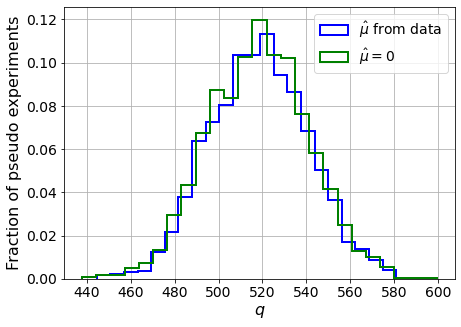

muhat mean:  0.00023801832181128446
Z_bins:  22.77122954703371
std Z_bins:  0.4908981717354395
Z_bins mu=0:  22.77122954703371
std Z_bins mu=0:  0.5006269085391886

--------

B_expected:  643
S_expected:  830

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0475


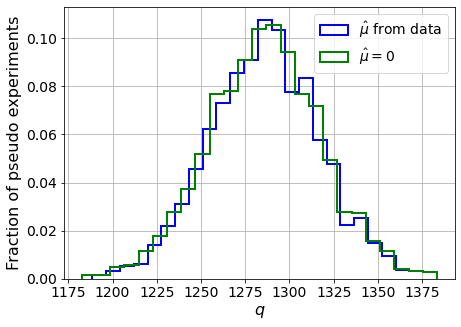

muhat mean:  0.0003294151933920127
Z_bins:  35.86470882175287
std Z_bins:  0.4351011320094068
Z_bins mu=0:  35.86451770468486
std Z_bins mu=0:  0.441832505249611

--------

B_expected:  643
S_expected:  1787

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0545


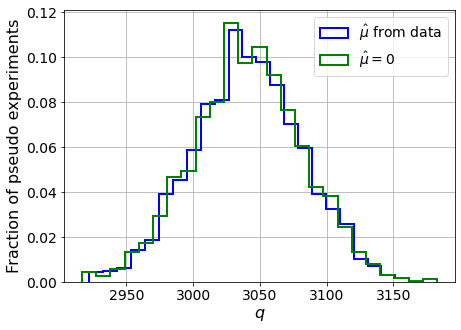

muhat mean:  -3.5900551520247635e-05
Z_bins:  55.137701872089316
std Z_bins:  0.36901922487638006
Z_bins mu=0:  55.137701872089316
std Z_bins mu=0:  0.37292929200081726

--------


 FINAL RESULT:

[[0.2581217626092594, 0.5696658036526676, 0.14383656311585574, 0.25534388664769714, 0.9285104895151023], [0.5863023758086632, 0.533995595286105, 0.0068439913709024535, 0.5863023758086632, 0.7759253840191599], [1.1327897551505761, 0.5886870440476407, 0.015447078497125745, 1.1327897551505761, 0.7737712588880106], [2.3692626039912703, 0.6602416790092148, -0.00038603060616115094, 2.3692389938711207, 0.7559161918012384], [4.553859574847815, 0.6516994590283668, -0.0034382765836552735, 4.553859574847815, 0.6966047739766187], [8.144310972647974, 0.6203173041952345, 0.0023845614015035603, 8.143199654157016, 0.6502490729605618], [13.978076814555275, 0.5884645204660086, -0.00030879489966314713, 13.977214413469344, 0.6047890029019072], [22.77122954703371, 0.4908981717354395, 0.00023801832181128446, 22.77

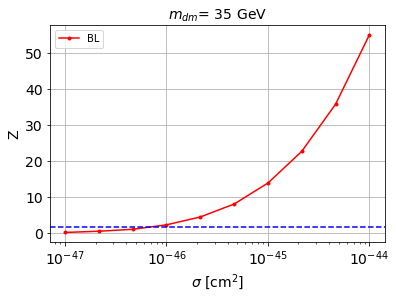


cross_BL_164:  6.781708003776903e-47
cross_BL_164_up:  4.324544129385463e-47
cross_BL_164_down:  9.67777358924605e-47

#########################


#########################

mDM =  50 GeV


max_pS1_both lenght:  152

X_mon1_train :  (4999, 152)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 152)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 152)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35218)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35218)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35218)
y_mo

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68654	validation_1-logloss:0.68726
[1]	validation_0-logloss:0.68008	validation_1-logloss:0.68143
[2]	validation_0-logloss:0.67373	validation_1-logloss:0.67569
[3]	validation_0-logloss:0.66745	validation_1-logloss:0.66995
[4]	validation_0-logloss:0.66141	validation_1-logloss:0.66463
[5]	validation_0-logloss:0.65536	validation_1-logloss:0.65923
[6]	validation_0-logloss:0.64935	validation_1-logloss:0.65406
[7]	validation_0-logloss:0.64350	validation_1-logloss:0.64876
[8]	validation_0-logloss:0.63770	validation_1-logloss:0.64374
[9]	validation_0-logloss:0.63215	validation_1-logloss:0.63874
[10]	validation_0-logloss:0.62656	validation_1-logloss:0.63394
[11]	validation_0-logloss:0.62110	validation_1-logloss:0.62902
[12]	validation_0-logloss:0.61580	validation_1-logloss:0.62430
[13]	validation_0-logloss:0.61050	validation_1-logloss:0.61970
[14]	validation_0-logloss:0.60533	validation_1-logloss:0.61522
[15]	validation_0-logloss:0.60029	validation_1-logloss:0.61076
[1

[130]	validation_0-logloss:0.29386	validation_1-logloss:0.36165
[131]	validation_0-logloss:0.29244	validation_1-logloss:0.36065
[132]	validation_0-logloss:0.29105	validation_1-logloss:0.35956
[133]	validation_0-logloss:0.28970	validation_1-logloss:0.35857
[134]	validation_0-logloss:0.28839	validation_1-logloss:0.35764
[135]	validation_0-logloss:0.28705	validation_1-logloss:0.35668
[136]	validation_0-logloss:0.28580	validation_1-logloss:0.35575
[137]	validation_0-logloss:0.28445	validation_1-logloss:0.35483
[138]	validation_0-logloss:0.28314	validation_1-logloss:0.35394
[139]	validation_0-logloss:0.28184	validation_1-logloss:0.35296
[140]	validation_0-logloss:0.28060	validation_1-logloss:0.35212
[141]	validation_0-logloss:0.27935	validation_1-logloss:0.35122
[142]	validation_0-logloss:0.27816	validation_1-logloss:0.35040
[143]	validation_0-logloss:0.27689	validation_1-logloss:0.34948
[144]	validation_0-logloss:0.27568	validation_1-logloss:0.34870
[145]	validation_0-logloss:0.27441	valid

[259]	validation_0-logloss:0.17922	validation_1-logloss:0.28892
[260]	validation_0-logloss:0.17866	validation_1-logloss:0.28863
[261]	validation_0-logloss:0.17818	validation_1-logloss:0.28833
[262]	validation_0-logloss:0.17760	validation_1-logloss:0.28807
[263]	validation_0-logloss:0.17704	validation_1-logloss:0.28775
[264]	validation_0-logloss:0.17646	validation_1-logloss:0.28741
[265]	validation_0-logloss:0.17585	validation_1-logloss:0.28714
[266]	validation_0-logloss:0.17523	validation_1-logloss:0.28677
[267]	validation_0-logloss:0.17478	validation_1-logloss:0.28648
[268]	validation_0-logloss:0.17422	validation_1-logloss:0.28622
[269]	validation_0-logloss:0.17362	validation_1-logloss:0.28586
[270]	validation_0-logloss:0.17300	validation_1-logloss:0.28559
[271]	validation_0-logloss:0.17244	validation_1-logloss:0.28530
[272]	validation_0-logloss:0.17184	validation_1-logloss:0.28502
[273]	validation_0-logloss:0.17140	validation_1-logloss:0.28479
[274]	validation_0-logloss:0.17080	valid

[388]	validation_0-logloss:0.12610	validation_1-logloss:0.26410
[389]	validation_0-logloss:0.12577	validation_1-logloss:0.26395
[390]	validation_0-logloss:0.12551	validation_1-logloss:0.26384
[391]	validation_0-logloss:0.12527	validation_1-logloss:0.26378
[392]	validation_0-logloss:0.12499	validation_1-logloss:0.26358
[393]	validation_0-logloss:0.12474	validation_1-logloss:0.26344
[394]	validation_0-logloss:0.12451	validation_1-logloss:0.26325
[395]	validation_0-logloss:0.12432	validation_1-logloss:0.26317
[396]	validation_0-logloss:0.12406	validation_1-logloss:0.26303
[397]	validation_0-logloss:0.12373	validation_1-logloss:0.26297
[398]	validation_0-logloss:0.12350	validation_1-logloss:0.26284
[399]	validation_0-logloss:0.12325	validation_1-logloss:0.26281
[400]	validation_0-logloss:0.12306	validation_1-logloss:0.26272
[401]	validation_0-logloss:0.12277	validation_1-logloss:0.26258
[402]	validation_0-logloss:0.12255	validation_1-logloss:0.26243
[403]	validation_0-logloss:0.12218	valid

[517]	validation_0-logloss:0.09665	validation_1-logloss:0.25394
[518]	validation_0-logloss:0.09643	validation_1-logloss:0.25390
[519]	validation_0-logloss:0.09624	validation_1-logloss:0.25387
[520]	validation_0-logloss:0.09596	validation_1-logloss:0.25381
[521]	validation_0-logloss:0.09581	validation_1-logloss:0.25379
[522]	validation_0-logloss:0.09555	validation_1-logloss:0.25372
[523]	validation_0-logloss:0.09533	validation_1-logloss:0.25372
[524]	validation_0-logloss:0.09505	validation_1-logloss:0.25371
[525]	validation_0-logloss:0.09489	validation_1-logloss:0.25369
[526]	validation_0-logloss:0.09466	validation_1-logloss:0.25366
[527]	validation_0-logloss:0.09443	validation_1-logloss:0.25360
[528]	validation_0-logloss:0.09434	validation_1-logloss:0.25357
[529]	validation_0-logloss:0.09421	validation_1-logloss:0.25350
[530]	validation_0-logloss:0.09393	validation_1-logloss:0.25349
[531]	validation_0-logloss:0.09365	validation_1-logloss:0.25344
[532]	validation_0-logloss:0.09344	valid

[646]	validation_0-logloss:0.07498	validation_1-logloss:0.25004
[647]	validation_0-logloss:0.07485	validation_1-logloss:0.24998
[648]	validation_0-logloss:0.07472	validation_1-logloss:0.24996
[649]	validation_0-logloss:0.07457	validation_1-logloss:0.24993
[650]	validation_0-logloss:0.07445	validation_1-logloss:0.24996
[651]	validation_0-logloss:0.07430	validation_1-logloss:0.24993
[652]	validation_0-logloss:0.07415	validation_1-logloss:0.24993
[653]	validation_0-logloss:0.07403	validation_1-logloss:0.24987
[654]	validation_0-logloss:0.07388	validation_1-logloss:0.24977
[655]	validation_0-logloss:0.07374	validation_1-logloss:0.24980
[656]	validation_0-logloss:0.07361	validation_1-logloss:0.24980
[657]	validation_0-logloss:0.07350	validation_1-logloss:0.24980
[658]	validation_0-logloss:0.07337	validation_1-logloss:0.24979
[659]	validation_0-logloss:0.07328	validation_1-logloss:0.24977
[660]	validation_0-logloss:0.07316	validation_1-logloss:0.24977
[661]	validation_0-logloss:0.07304	valid

[775]	validation_0-logloss:0.06135	validation_1-logloss:0.24877
[776]	validation_0-logloss:0.06126	validation_1-logloss:0.24872
[777]	validation_0-logloss:0.06117	validation_1-logloss:0.24868
[778]	validation_0-logloss:0.06106	validation_1-logloss:0.24867
[779]	validation_0-logloss:0.06100	validation_1-logloss:0.24871
[780]	validation_0-logloss:0.06090	validation_1-logloss:0.24872
[781]	validation_0-logloss:0.06084	validation_1-logloss:0.24869
[782]	validation_0-logloss:0.06077	validation_1-logloss:0.24868
[783]	validation_0-logloss:0.06074	validation_1-logloss:0.24873
[784]	validation_0-logloss:0.06063	validation_1-logloss:0.24873
[785]	validation_0-logloss:0.06054	validation_1-logloss:0.24868
[786]	validation_0-logloss:0.06047	validation_1-logloss:0.24867
[787]	validation_0-logloss:0.06040	validation_1-logloss:0.24867
[788]	validation_0-logloss:0.06030	validation_1-logloss:0.24862
[789]	validation_0-logloss:0.06021	validation_1-logloss:0.24864
[790]	validation_0-logloss:0.06011	valid

[904]	validation_0-logloss:0.05121	validation_1-logloss:0.24795
[905]	validation_0-logloss:0.05115	validation_1-logloss:0.24797
[906]	validation_0-logloss:0.05105	validation_1-logloss:0.24794
[907]	validation_0-logloss:0.05097	validation_1-logloss:0.24786
[908]	validation_0-logloss:0.05091	validation_1-logloss:0.24780
[909]	validation_0-logloss:0.05087	validation_1-logloss:0.24779
[910]	validation_0-logloss:0.05083	validation_1-logloss:0.24780
[911]	validation_0-logloss:0.05075	validation_1-logloss:0.24783
[912]	validation_0-logloss:0.05068	validation_1-logloss:0.24776
[913]	validation_0-logloss:0.05059	validation_1-logloss:0.24769
[914]	validation_0-logloss:0.05049	validation_1-logloss:0.24769
[915]	validation_0-logloss:0.05045	validation_1-logloss:0.24766
[916]	validation_0-logloss:0.05038	validation_1-logloss:0.24771
[917]	validation_0-logloss:0.05033	validation_1-logloss:0.24773
[918]	validation_0-logloss:0.05022	validation_1-logloss:0.24772
[919]	validation_0-logloss:0.05015	valid

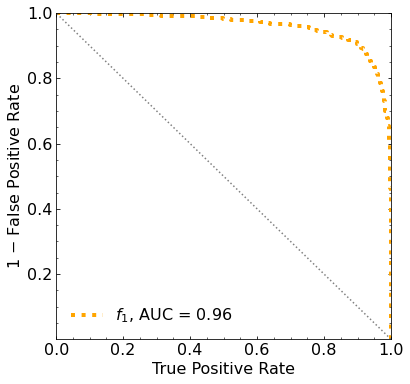

Classification score:


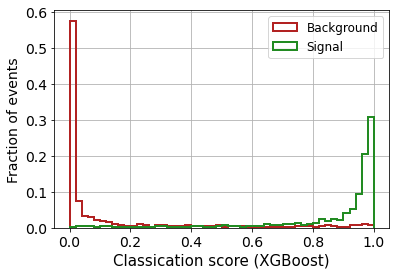


 ROC-AUC =  0.9603291839796362
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.079


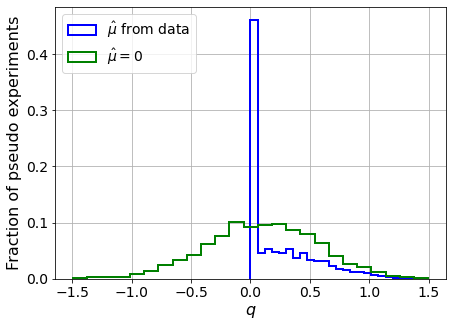

muhat mean:  -0.059162796906524207
Z_bins:  0.3377225396486734
std Z_bins:  0.44567168487087283
Z_bins mu=0:  0.3377225396486734
std Z_bins mu=0:  0.6948864162543319

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.077


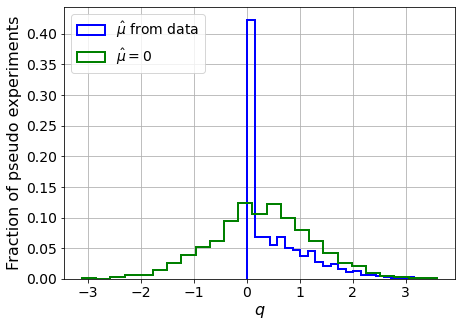

muhat mean:  0.06252011275004844
Z_bins:  0.5550485559842888
std Z_bins:  0.5819128486599201
Z_bins mu=0:  0.5540774425835013
std Z_bins mu=0:  0.853654688662361

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0715


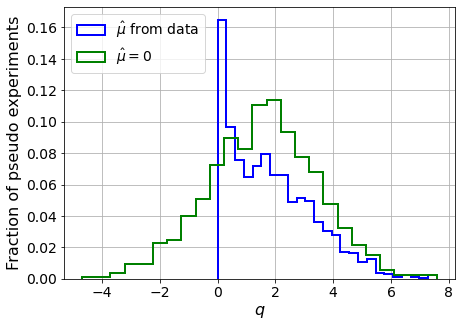

muhat mean:  0.010289309081623654
Z_bins:  1.2736146856533617
std Z_bins:  0.5812768367487158
Z_bins mu=0:  1.2736138285146466
std Z_bins mu=0:  0.7388462320792419

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.09


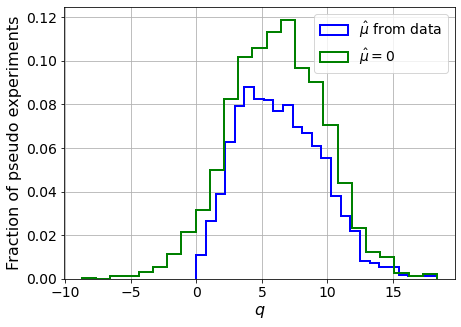

muhat mean:  0.0005834889016754815
Z_bins:  2.493576597567502
std Z_bins:  0.637859462476112
Z_bins mu=0:  2.493524611319881
std Z_bins mu=0:  0.7260928893848204

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0735


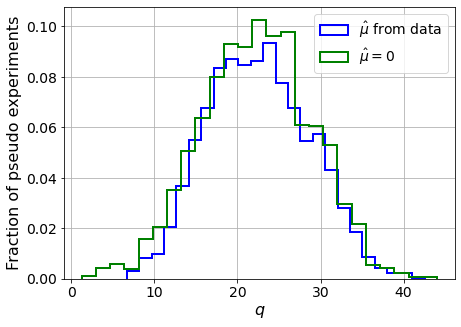

muhat mean:  -0.00031188859540610947
Z_bins:  4.739003884495745
std Z_bins:  0.6435182250776111
Z_bins mu=0:  4.739003884495745
std Z_bins mu=0:  0.6917027314714738

--------

B_expected:  643
S_expected:  89

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0715


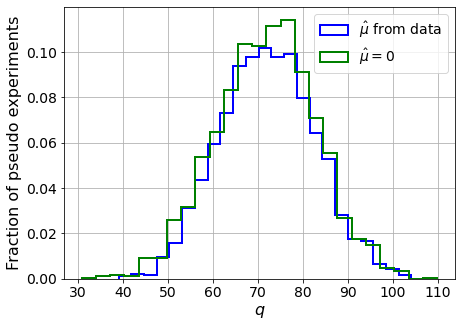

muhat mean:  0.002796122336945036
Z_bins:  8.495541988101714
std Z_bins:  0.6199174541498759
Z_bins mu=0:  8.495389980768925
std Z_bins mu=0:  0.6504101490780587

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.084


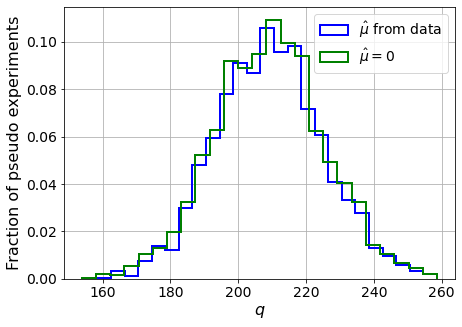

muhat mean:  -0.0005139856847126461
Z_bins:  14.460996141145085
std Z_bins:  0.5461312698871488
Z_bins mu=0:  14.46098715135726
std Z_bins mu=0:  0.5609680961108844

--------

B_expected:  643
S_expected:  413

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0775


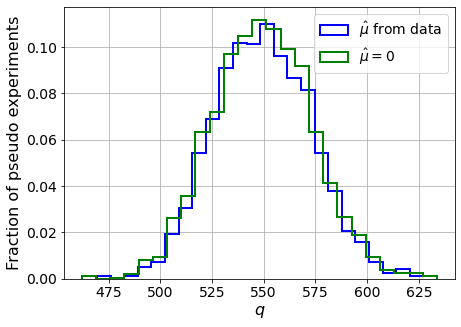

muhat mean:  8.042816854215903e-05
Z_bins:  23.432938822071534
std Z_bins:  0.5006793778524383
Z_bins mu=0:  23.432639273439285
std Z_bins mu=0:  0.5097816442869187

--------

B_expected:  643
S_expected:  889

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.069


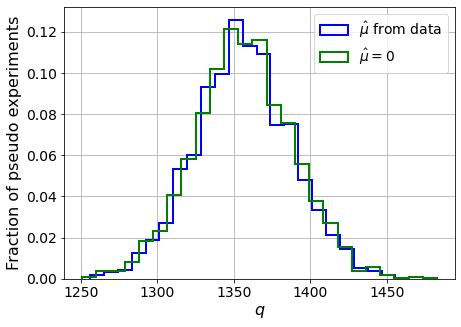

muhat mean:  0.00028783172414877827
Z_bins:  36.82264798269481
std Z_bins:  0.431148821660778
Z_bins mu=0:  36.82211331358758
std Z_bins mu=0:  0.4371041412489542

--------

B_expected:  643
S_expected:  1915

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0745


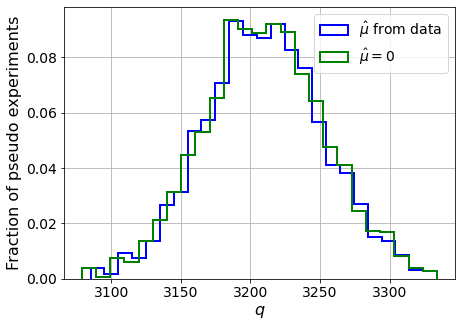

muhat mean:  0.00011941706147827958
Z_bins:  56.650051326508745
std Z_bins:  0.3756258204831811
Z_bins mu=0:  56.649507741370485
std Z_bins mu=0:  0.37960053425565476

--------


 FINAL RESULT:

[[0.3377225396486734, 0.44567168487087283, -0.059162796906524207, 0.3377225396486734, 0.6948864162543319], [0.5550485559842888, 0.5819128486599201, 0.06252011275004844, 0.5540774425835013, 0.853654688662361], [1.2736146856533617, 0.5812768367487158, 0.010289309081623654, 1.2736138285146466, 0.7388462320792419], [2.493576597567502, 0.637859462476112, 0.0005834889016754815, 2.493524611319881, 0.7260928893848204], [4.739003884495745, 0.6435182250776111, -0.00031188859540610947, 4.739003884495745, 0.6917027314714738], [8.495541988101714, 0.6199174541498759, 0.002796122336945036, 8.495389980768925, 0.6504101490780587], [14.460996141145085, 0.5461312698871488, -0.0005139856847126461, 14.46098715135726, 0.5609680961108844], [23.432938822071534, 0.5006793778524383, 8.042816854215903e-05, 23.43263927343

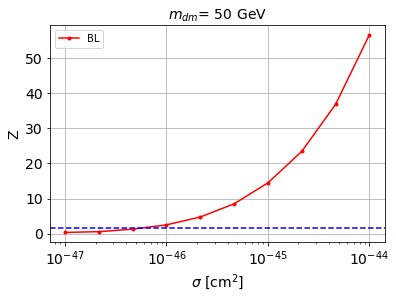


cross_BL_164:  6.132823729418476e-47
cross_BL_164_up:  3.8602440497900525e-47
cross_BL_164_down:  8.98529172081331e-47

#########################


#########################

mDM =  100 GeV


max_pS1_both lenght:  153

X_mon1_train :  (4999, 153)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 153)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 153)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35219)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35219)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35219)
y_

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68705	validation_1-logloss:0.68796
[1]	validation_0-logloss:0.68112	validation_1-logloss:0.68290
[2]	validation_0-logloss:0.67526	validation_1-logloss:0.67789
[3]	validation_0-logloss:0.66955	validation_1-logloss:0.67295
[4]	validation_0-logloss:0.66395	validation_1-logloss:0.66826
[5]	validation_0-logloss:0.65849	validation_1-logloss:0.66353
[6]	validation_0-logloss:0.65318	validation_1-logloss:0.65885
[7]	validation_0-logloss:0.64770	validation_1-logloss:0.65424
[8]	validation_0-logloss:0.64258	validation_1-logloss:0.64975
[9]	validation_0-logloss:0.63743	validation_1-logloss:0.64543
[10]	validation_0-logloss:0.63251	validation_1-logloss:0.64103
[11]	validation_0-logloss:0.62734	validation_1-logloss:0.63659
[12]	validation_0-logloss:0.62239	validation_1-logloss:0.63243
[13]	validation_0-logloss:0.61776	validation_1-logloss:0.62826
[14]	validation_0-logloss:0.61276	validation_1-logloss:0.62408
[15]	validation_0-logloss:0.60827	validation_1-logloss:0.62014
[1

[130]	validation_0-logloss:0.31840	validation_1-logloss:0.38708
[131]	validation_0-logloss:0.31707	validation_1-logloss:0.38613
[132]	validation_0-logloss:0.31566	validation_1-logloss:0.38503
[133]	validation_0-logloss:0.31433	validation_1-logloss:0.38414
[134]	validation_0-logloss:0.31299	validation_1-logloss:0.38318
[135]	validation_0-logloss:0.31169	validation_1-logloss:0.38220
[136]	validation_0-logloss:0.31050	validation_1-logloss:0.38124
[137]	validation_0-logloss:0.30919	validation_1-logloss:0.38037
[138]	validation_0-logloss:0.30784	validation_1-logloss:0.37949
[139]	validation_0-logloss:0.30658	validation_1-logloss:0.37859
[140]	validation_0-logloss:0.30539	validation_1-logloss:0.37765
[141]	validation_0-logloss:0.30413	validation_1-logloss:0.37683
[142]	validation_0-logloss:0.30289	validation_1-logloss:0.37594
[143]	validation_0-logloss:0.30158	validation_1-logloss:0.37501
[144]	validation_0-logloss:0.30042	validation_1-logloss:0.37420
[145]	validation_0-logloss:0.29933	valid

[259]	validation_0-logloss:0.20149	validation_1-logloss:0.31295
[260]	validation_0-logloss:0.20092	validation_1-logloss:0.31266
[261]	validation_0-logloss:0.20037	validation_1-logloss:0.31234
[262]	validation_0-logloss:0.19986	validation_1-logloss:0.31200
[263]	validation_0-logloss:0.19923	validation_1-logloss:0.31163
[264]	validation_0-logloss:0.19868	validation_1-logloss:0.31141
[265]	validation_0-logloss:0.19816	validation_1-logloss:0.31108
[266]	validation_0-logloss:0.19754	validation_1-logloss:0.31079
[267]	validation_0-logloss:0.19699	validation_1-logloss:0.31056
[268]	validation_0-logloss:0.19630	validation_1-logloss:0.31026
[269]	validation_0-logloss:0.19569	validation_1-logloss:0.30995
[270]	validation_0-logloss:0.19524	validation_1-logloss:0.30974
[271]	validation_0-logloss:0.19462	validation_1-logloss:0.30947
[272]	validation_0-logloss:0.19412	validation_1-logloss:0.30913
[273]	validation_0-logloss:0.19350	validation_1-logloss:0.30879
[274]	validation_0-logloss:0.19295	valid

[388]	validation_0-logloss:0.14474	validation_1-logloss:0.28568
[389]	validation_0-logloss:0.14448	validation_1-logloss:0.28559
[390]	validation_0-logloss:0.14428	validation_1-logloss:0.28555
[391]	validation_0-logloss:0.14391	validation_1-logloss:0.28542
[392]	validation_0-logloss:0.14361	validation_1-logloss:0.28527
[393]	validation_0-logloss:0.14342	validation_1-logloss:0.28525
[394]	validation_0-logloss:0.14300	validation_1-logloss:0.28503
[395]	validation_0-logloss:0.14266	validation_1-logloss:0.28483
[396]	validation_0-logloss:0.14228	validation_1-logloss:0.28460
[397]	validation_0-logloss:0.14197	validation_1-logloss:0.28448
[398]	validation_0-logloss:0.14166	validation_1-logloss:0.28427
[399]	validation_0-logloss:0.14133	validation_1-logloss:0.28414
[400]	validation_0-logloss:0.14104	validation_1-logloss:0.28403
[401]	validation_0-logloss:0.14085	validation_1-logloss:0.28399
[402]	validation_0-logloss:0.14051	validation_1-logloss:0.28382
[403]	validation_0-logloss:0.14015	valid

[517]	validation_0-logloss:0.11058	validation_1-logloss:0.27387
[518]	validation_0-logloss:0.11035	validation_1-logloss:0.27376
[519]	validation_0-logloss:0.11008	validation_1-logloss:0.27370
[520]	validation_0-logloss:0.10991	validation_1-logloss:0.27368
[521]	validation_0-logloss:0.10972	validation_1-logloss:0.27359
[522]	validation_0-logloss:0.10951	validation_1-logloss:0.27357
[523]	validation_0-logloss:0.10931	validation_1-logloss:0.27356
[524]	validation_0-logloss:0.10907	validation_1-logloss:0.27354
[525]	validation_0-logloss:0.10892	validation_1-logloss:0.27347
[526]	validation_0-logloss:0.10863	validation_1-logloss:0.27335
[527]	validation_0-logloss:0.10843	validation_1-logloss:0.27326
[528]	validation_0-logloss:0.10825	validation_1-logloss:0.27320
[529]	validation_0-logloss:0.10804	validation_1-logloss:0.27303
[530]	validation_0-logloss:0.10783	validation_1-logloss:0.27301
[531]	validation_0-logloss:0.10763	validation_1-logloss:0.27291
[532]	validation_0-logloss:0.10733	valid

[646]	validation_0-logloss:0.08688	validation_1-logloss:0.26881
[647]	validation_0-logloss:0.08674	validation_1-logloss:0.26874
[648]	validation_0-logloss:0.08662	validation_1-logloss:0.26872
[649]	validation_0-logloss:0.08656	validation_1-logloss:0.26866
[650]	validation_0-logloss:0.08645	validation_1-logloss:0.26862
[651]	validation_0-logloss:0.08632	validation_1-logloss:0.26857
[652]	validation_0-logloss:0.08619	validation_1-logloss:0.26857
[653]	validation_0-logloss:0.08608	validation_1-logloss:0.26852
[654]	validation_0-logloss:0.08597	validation_1-logloss:0.26850
[655]	validation_0-logloss:0.08584	validation_1-logloss:0.26848
[656]	validation_0-logloss:0.08565	validation_1-logloss:0.26853
[657]	validation_0-logloss:0.08551	validation_1-logloss:0.26849
[658]	validation_0-logloss:0.08544	validation_1-logloss:0.26845
[659]	validation_0-logloss:0.08522	validation_1-logloss:0.26839
[660]	validation_0-logloss:0.08508	validation_1-logloss:0.26839
[661]	validation_0-logloss:0.08496	valid

[775]	validation_0-logloss:0.07106	validation_1-logloss:0.26632
[776]	validation_0-logloss:0.07099	validation_1-logloss:0.26625
[777]	validation_0-logloss:0.07085	validation_1-logloss:0.26625
[778]	validation_0-logloss:0.07074	validation_1-logloss:0.26626
[779]	validation_0-logloss:0.07067	validation_1-logloss:0.26624
[780]	validation_0-logloss:0.07056	validation_1-logloss:0.26620
[781]	validation_0-logloss:0.07050	validation_1-logloss:0.26619
[782]	validation_0-logloss:0.07042	validation_1-logloss:0.26619
[783]	validation_0-logloss:0.07036	validation_1-logloss:0.26624
[784]	validation_0-logloss:0.07025	validation_1-logloss:0.26625
[785]	validation_0-logloss:0.07021	validation_1-logloss:0.26623
[786]	validation_0-logloss:0.07010	validation_1-logloss:0.26619
[787]	validation_0-logloss:0.06999	validation_1-logloss:0.26620
[788]	validation_0-logloss:0.06991	validation_1-logloss:0.26617
[789]	validation_0-logloss:0.06982	validation_1-logloss:0.26609
[790]	validation_0-logloss:0.06970	valid

[904]	validation_0-logloss:0.06051	validation_1-logloss:0.26502
[905]	validation_0-logloss:0.06042	validation_1-logloss:0.26502
[906]	validation_0-logloss:0.06028	validation_1-logloss:0.26503
[907]	validation_0-logloss:0.06021	validation_1-logloss:0.26502
[908]	validation_0-logloss:0.06014	validation_1-logloss:0.26504
[909]	validation_0-logloss:0.06010	validation_1-logloss:0.26503
[910]	validation_0-logloss:0.06001	validation_1-logloss:0.26497
[911]	validation_0-logloss:0.05997	validation_1-logloss:0.26500
[912]	validation_0-logloss:0.05991	validation_1-logloss:0.26499
[913]	validation_0-logloss:0.05986	validation_1-logloss:0.26502
[914]	validation_0-logloss:0.05979	validation_1-logloss:0.26504
[915]	validation_0-logloss:0.05971	validation_1-logloss:0.26508
[916]	validation_0-logloss:0.05966	validation_1-logloss:0.26506
[917]	validation_0-logloss:0.05963	validation_1-logloss:0.26505
[918]	validation_0-logloss:0.05950	validation_1-logloss:0.26509
[919]	validation_0-logloss:0.05945	valid

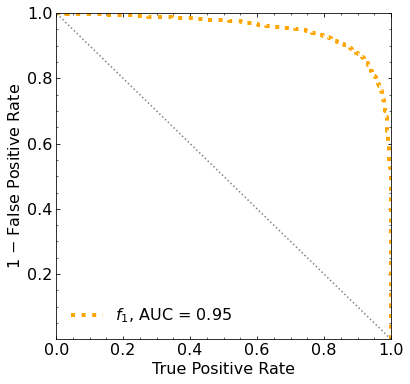

Classification score:


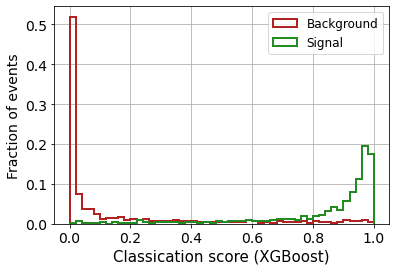


 ROC-AUC =  0.9517306490671873
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


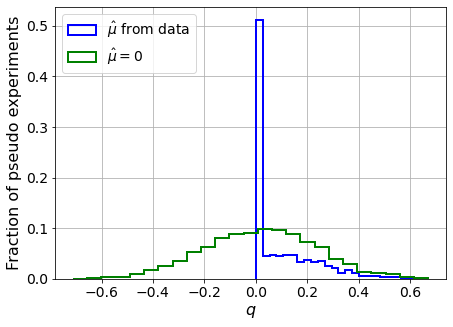

muhat mean:  -0.0009038930419161712
Z_bins:  0.14775092277882304
std Z_bins:  0.44406579674601915
Z_bins mu=0:  0.14775092277882304
std Z_bins mu=0:  0.7382405580149253

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


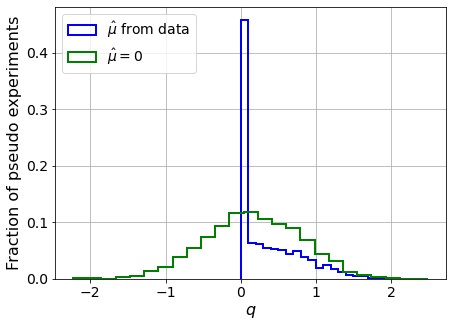

muhat mean:  -0.045689880048598724
Z_bins:  0.4109744229344313
std Z_bins:  0.5138780105958562
Z_bins mu=0:  0.4109744229344313
std Z_bins mu=0:  0.7733693202527796

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


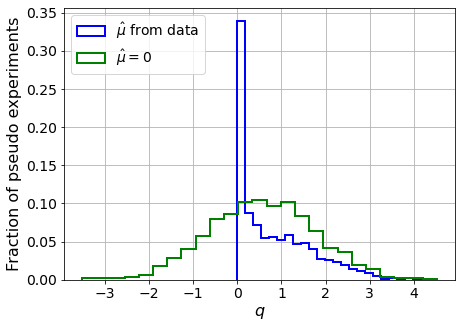

muhat mean:  0.030969831642658863
Z_bins:  0.7484568817140207
std Z_bins:  0.5751248432055509
Z_bins mu=0:  0.7474175208545242
std Z_bins mu=0:  0.8003900685598642

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


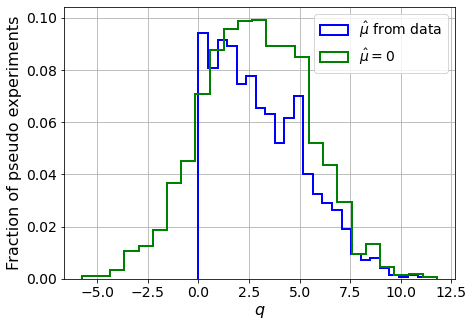

muhat mean:  0.016254152190156863
Z_bins:  1.6644791784321433
std Z_bins:  0.6584637096534729
Z_bins mu=0:  1.6638604676592168
std Z_bins mu=0:  0.7927389568539801

--------

B_expected:  643
S_expected:  30

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


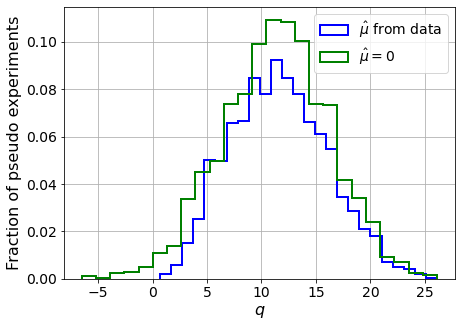

muhat mean:  -0.005093505763515855
Z_bins:  3.3874009341863305
std Z_bins:  0.6535248006408985
Z_bins mu=0:  3.3874009341863305
std Z_bins mu=0:  0.7223182985340175

--------

B_expected:  643
S_expected:  65

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


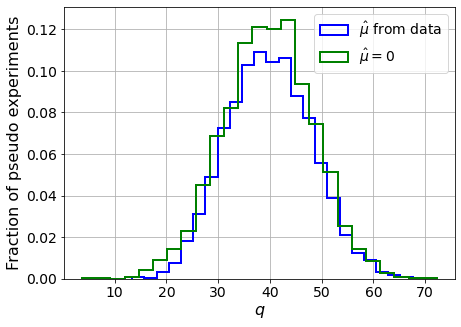

muhat mean:  0.000811383694717958
Z_bins:  6.305752752785352
std Z_bins:  0.6501656073062205
Z_bins mu=0:  6.305631208622334
std Z_bins mu=0:  0.6891469082812981

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


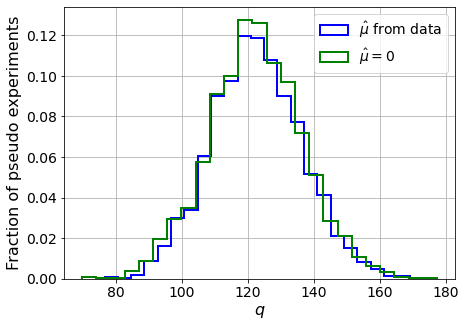

muhat mean:  0.00128572349048172
Z_bins:  11.05429135345562
std Z_bins:  0.6241179468390728
Z_bins mu=0:  11.052822523131537
std Z_bins mu=0:  0.6466623140005311

--------

B_expected:  643
S_expected:  300

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


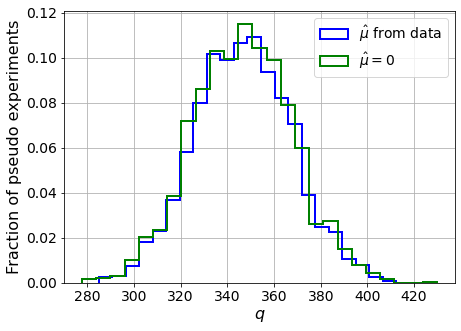

muhat mean:  -3.8084303570042887e-06
Z_bins:  18.622771881224118
std Z_bins:  0.5556354599188456
Z_bins mu=0:  18.622110674675884
std Z_bins mu=0:  0.5681686655439027

--------

B_expected:  643
S_expected:  645

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


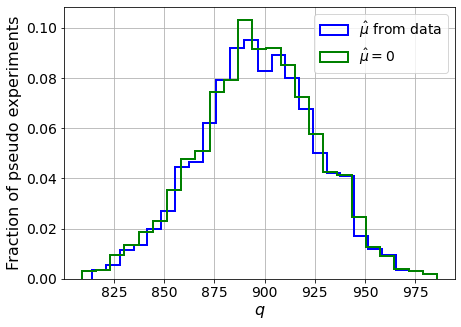

muhat mean:  0.0002654926437953015
Z_bins:  29.94224060666146
std Z_bins:  0.4916820749872932
Z_bins mu=0:  29.94140914421027
std Z_bins mu=0:  0.49979626866404975

--------

B_expected:  643
S_expected:  1390

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


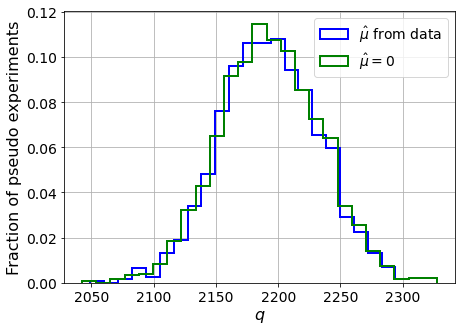

muhat mean:  0.0002843592217715476
Z_bins:  46.83007669941126
std Z_bins:  0.42618676160979785
Z_bins mu=0:  46.83001933966503
std Z_bins mu=0:  0.4310787699563919

--------


 FINAL RESULT:

[[0.14775092277882304, 0.44406579674601915, -0.0009038930419161712, 0.14775092277882304, 0.7382405580149253], [0.4109744229344313, 0.5138780105958562, -0.045689880048598724, 0.4109744229344313, 0.7733693202527796], [0.7484568817140207, 0.5751248432055509, 0.030969831642658863, 0.7474175208545242, 0.8003900685598642], [1.6644791784321433, 0.6584637096534729, 0.016254152190156863, 1.6638604676592168, 0.7927389568539801], [3.3874009341863305, 0.6535248006408985, -0.005093505763515855, 3.3874009341863305, 0.7223182985340175], [6.305752752785352, 0.6501656073062205, 0.000811383694717958, 6.305631208622334, 0.6891469082812981], [11.05429135345562, 0.6241179468390728, 0.00128572349048172, 11.052822523131537, 0.6466623140005311], [18.622771881224118, 0.5556354599188456, -3.8084303570042887e-06, 18.6221106

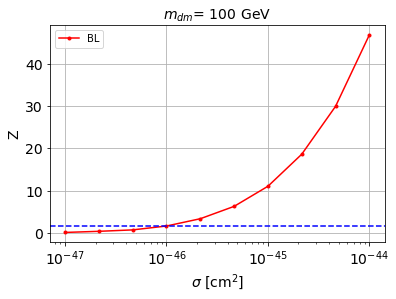


cross_BL_164:  9.854194594733775e-47
cross_BL_164_up:  6.297321378087256e-47
cross_BL_164_down:  1.400606697844868e-46

#########################


#########################

mDM =  200 GeV


max_pS1_both lenght:  157

X_mon1_train :  (4999, 157)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 157)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 157)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35223)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35223)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35223)
y_

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68733	validation_1-logloss:0.68844
[1]	validation_0-logloss:0.68170	validation_1-logloss:0.68379
[2]	validation_0-logloss:0.67618	validation_1-logloss:0.67923
[3]	validation_0-logloss:0.67069	validation_1-logloss:0.67478
[4]	validation_0-logloss:0.66529	validation_1-logloss:0.67026
[5]	validation_0-logloss:0.65998	validation_1-logloss:0.66587
[6]	validation_0-logloss:0.65479	validation_1-logloss:0.66172
[7]	validation_0-logloss:0.64966	validation_1-logloss:0.65753
[8]	validation_0-logloss:0.64466	validation_1-logloss:0.65329
[9]	validation_0-logloss:0.63980	validation_1-logloss:0.64923
[10]	validation_0-logloss:0.63505	validation_1-logloss:0.64532
[11]	validation_0-logloss:0.63022	validation_1-logloss:0.64140
[12]	validation_0-logloss:0.62549	validation_1-logloss:0.63738
[13]	validation_0-logloss:0.62086	validation_1-logloss:0.63352
[14]	validation_0-logloss:0.61634	validation_1-logloss:0.62964
[15]	validation_0-logloss:0.61182	validation_1-logloss:0.62588
[1

[130]	validation_0-logloss:0.33063	validation_1-logloss:0.40948
[131]	validation_0-logloss:0.32920	validation_1-logloss:0.40848
[132]	validation_0-logloss:0.32788	validation_1-logloss:0.40770
[133]	validation_0-logloss:0.32656	validation_1-logloss:0.40684
[134]	validation_0-logloss:0.32529	validation_1-logloss:0.40598
[135]	validation_0-logloss:0.32400	validation_1-logloss:0.40509
[136]	validation_0-logloss:0.32271	validation_1-logloss:0.40418
[137]	validation_0-logloss:0.32141	validation_1-logloss:0.40340
[138]	validation_0-logloss:0.32016	validation_1-logloss:0.40261
[139]	validation_0-logloss:0.31881	validation_1-logloss:0.40167
[140]	validation_0-logloss:0.31758	validation_1-logloss:0.40083
[141]	validation_0-logloss:0.31633	validation_1-logloss:0.40000
[142]	validation_0-logloss:0.31516	validation_1-logloss:0.39931
[143]	validation_0-logloss:0.31398	validation_1-logloss:0.39847
[144]	validation_0-logloss:0.31270	validation_1-logloss:0.39764
[145]	validation_0-logloss:0.31154	valid

[259]	validation_0-logloss:0.21537	validation_1-logloss:0.33860
[260]	validation_0-logloss:0.21479	validation_1-logloss:0.33832
[261]	validation_0-logloss:0.21405	validation_1-logloss:0.33790
[262]	validation_0-logloss:0.21340	validation_1-logloss:0.33760
[263]	validation_0-logloss:0.21272	validation_1-logloss:0.33730
[264]	validation_0-logloss:0.21210	validation_1-logloss:0.33699
[265]	validation_0-logloss:0.21147	validation_1-logloss:0.33667
[266]	validation_0-logloss:0.21083	validation_1-logloss:0.33630
[267]	validation_0-logloss:0.21028	validation_1-logloss:0.33594
[268]	validation_0-logloss:0.20963	validation_1-logloss:0.33565
[269]	validation_0-logloss:0.20909	validation_1-logloss:0.33530
[270]	validation_0-logloss:0.20844	validation_1-logloss:0.33491
[271]	validation_0-logloss:0.20783	validation_1-logloss:0.33462
[272]	validation_0-logloss:0.20714	validation_1-logloss:0.33426
[273]	validation_0-logloss:0.20650	validation_1-logloss:0.33395
[274]	validation_0-logloss:0.20590	valid

[388]	validation_0-logloss:0.15519	validation_1-logloss:0.30935
[389]	validation_0-logloss:0.15483	validation_1-logloss:0.30920
[390]	validation_0-logloss:0.15456	validation_1-logloss:0.30912
[391]	validation_0-logloss:0.15415	validation_1-logloss:0.30900
[392]	validation_0-logloss:0.15386	validation_1-logloss:0.30883
[393]	validation_0-logloss:0.15344	validation_1-logloss:0.30866
[394]	validation_0-logloss:0.15322	validation_1-logloss:0.30857
[395]	validation_0-logloss:0.15302	validation_1-logloss:0.30848
[396]	validation_0-logloss:0.15272	validation_1-logloss:0.30831
[397]	validation_0-logloss:0.15250	validation_1-logloss:0.30821
[398]	validation_0-logloss:0.15216	validation_1-logloss:0.30803
[399]	validation_0-logloss:0.15178	validation_1-logloss:0.30790
[400]	validation_0-logloss:0.15152	validation_1-logloss:0.30784
[401]	validation_0-logloss:0.15111	validation_1-logloss:0.30761
[402]	validation_0-logloss:0.15087	validation_1-logloss:0.30755
[403]	validation_0-logloss:0.15043	valid

[517]	validation_0-logloss:0.12216	validation_1-logloss:0.29597
[518]	validation_0-logloss:0.12198	validation_1-logloss:0.29591
[519]	validation_0-logloss:0.12184	validation_1-logloss:0.29589
[520]	validation_0-logloss:0.12153	validation_1-logloss:0.29581
[521]	validation_0-logloss:0.12125	validation_1-logloss:0.29574
[522]	validation_0-logloss:0.12107	validation_1-logloss:0.29566
[523]	validation_0-logloss:0.12088	validation_1-logloss:0.29563
[524]	validation_0-logloss:0.12076	validation_1-logloss:0.29562
[525]	validation_0-logloss:0.12059	validation_1-logloss:0.29558
[526]	validation_0-logloss:0.12045	validation_1-logloss:0.29553
[527]	validation_0-logloss:0.12031	validation_1-logloss:0.29550
[528]	validation_0-logloss:0.12012	validation_1-logloss:0.29539
[529]	validation_0-logloss:0.11993	validation_1-logloss:0.29537
[530]	validation_0-logloss:0.11977	validation_1-logloss:0.29529
[531]	validation_0-logloss:0.11957	validation_1-logloss:0.29522
[532]	validation_0-logloss:0.11943	valid

[646]	validation_0-logloss:0.10181	validation_1-logloss:0.29028
[647]	validation_0-logloss:0.10164	validation_1-logloss:0.29031
[648]	validation_0-logloss:0.10154	validation_1-logloss:0.29023
[649]	validation_0-logloss:0.10138	validation_1-logloss:0.29018
[650]	validation_0-logloss:0.10122	validation_1-logloss:0.29012
[651]	validation_0-logloss:0.10112	validation_1-logloss:0.29009
[652]	validation_0-logloss:0.10097	validation_1-logloss:0.29005
[653]	validation_0-logloss:0.10084	validation_1-logloss:0.29002
[654]	validation_0-logloss:0.10075	validation_1-logloss:0.28996
[655]	validation_0-logloss:0.10067	validation_1-logloss:0.28997
[656]	validation_0-logloss:0.10057	validation_1-logloss:0.28994
[657]	validation_0-logloss:0.10044	validation_1-logloss:0.28990
[658]	validation_0-logloss:0.10030	validation_1-logloss:0.28990
[659]	validation_0-logloss:0.10020	validation_1-logloss:0.28980
[660]	validation_0-logloss:0.10003	validation_1-logloss:0.28984
[661]	validation_0-logloss:0.09986	valid

[775]	validation_0-logloss:0.08797	validation_1-logloss:0.28736
[776]	validation_0-logloss:0.08787	validation_1-logloss:0.28735
[777]	validation_0-logloss:0.08775	validation_1-logloss:0.28736
[778]	validation_0-logloss:0.08768	validation_1-logloss:0.28737
[779]	validation_0-logloss:0.08755	validation_1-logloss:0.28736
[780]	validation_0-logloss:0.08747	validation_1-logloss:0.28732
[781]	validation_0-logloss:0.08742	validation_1-logloss:0.28731
[782]	validation_0-logloss:0.08729	validation_1-logloss:0.28723
[783]	validation_0-logloss:0.08721	validation_1-logloss:0.28724
[784]	validation_0-logloss:0.08711	validation_1-logloss:0.28725
[785]	validation_0-logloss:0.08700	validation_1-logloss:0.28721
[786]	validation_0-logloss:0.08692	validation_1-logloss:0.28716
[787]	validation_0-logloss:0.08683	validation_1-logloss:0.28711
[788]	validation_0-logloss:0.08671	validation_1-logloss:0.28710
[789]	validation_0-logloss:0.08666	validation_1-logloss:0.28709
[790]	validation_0-logloss:0.08659	valid

[904]	validation_0-logloss:0.07692	validation_1-logloss:0.28578
[905]	validation_0-logloss:0.07683	validation_1-logloss:0.28575
[906]	validation_0-logloss:0.07678	validation_1-logloss:0.28576
[907]	validation_0-logloss:0.07671	validation_1-logloss:0.28580
[908]	validation_0-logloss:0.07667	validation_1-logloss:0.28583
[909]	validation_0-logloss:0.07661	validation_1-logloss:0.28582
[910]	validation_0-logloss:0.07652	validation_1-logloss:0.28584
[911]	validation_0-logloss:0.07638	validation_1-logloss:0.28579
[912]	validation_0-logloss:0.07633	validation_1-logloss:0.28579
[913]	validation_0-logloss:0.07627	validation_1-logloss:0.28575
[914]	validation_0-logloss:0.07616	validation_1-logloss:0.28580
[915]	validation_0-logloss:0.07608	validation_1-logloss:0.28579
[916]	validation_0-logloss:0.07602	validation_1-logloss:0.28578
[917]	validation_0-logloss:0.07595	validation_1-logloss:0.28573
[918]	validation_0-logloss:0.07586	validation_1-logloss:0.28573
[919]	validation_0-logloss:0.07581	valid

[1032]	validation_0-logloss:0.06812	validation_1-logloss:0.28506
[1033]	validation_0-logloss:0.06806	validation_1-logloss:0.28502
[1034]	validation_0-logloss:0.06802	validation_1-logloss:0.28503
[1035]	validation_0-logloss:0.06796	validation_1-logloss:0.28499
[1036]	validation_0-logloss:0.06787	validation_1-logloss:0.28498
[1037]	validation_0-logloss:0.06778	validation_1-logloss:0.28501
[1038]	validation_0-logloss:0.06769	validation_1-logloss:0.28498
[1039]	validation_0-logloss:0.06765	validation_1-logloss:0.28498
[1040]	validation_0-logloss:0.06759	validation_1-logloss:0.28499
[1041]	validation_0-logloss:0.06750	validation_1-logloss:0.28498
[1042]	validation_0-logloss:0.06746	validation_1-logloss:0.28499
[1043]	validation_0-logloss:0.06739	validation_1-logloss:0.28500
[1044]	validation_0-logloss:0.06733	validation_1-logloss:0.28496
[1045]	validation_0-logloss:0.06725	validation_1-logloss:0.28495
[1046]	validation_0-logloss:0.06718	validation_1-logloss:0.28494
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.05989	validation_1-logloss:0.28457
[1160]	validation_0-logloss:0.05981	validation_1-logloss:0.28464
[1161]	validation_0-logloss:0.05978	validation_1-logloss:0.28462
[1162]	validation_0-logloss:0.05974	validation_1-logloss:0.28466
[1163]	validation_0-logloss:0.05967	validation_1-logloss:0.28467
[1164]	validation_0-logloss:0.05959	validation_1-logloss:0.28460
[1165]	validation_0-logloss:0.05951	validation_1-logloss:0.28459
[1166]	validation_0-logloss:0.05944	validation_1-logloss:0.28460
[1167]	validation_0-logloss:0.05935	validation_1-logloss:0.28457
[1168]	validation_0-logloss:0.05927	validation_1-logloss:0.28461
[1169]	validation_0-logloss:0.05920	validation_1-logloss:0.28461
[1170]	validation_0-logloss:0.05916	validation_1-logloss:0.28463
[1171]	validation_0-logloss:0.05910	validation_1-logloss:0.28466
[1172]	validation_0-logloss:0.05903	validation_1-logloss:0.28462
[1173]	validation_0-logloss:0.05899	validation_1-logloss:0.28469
[1174]	validation_0-loglo

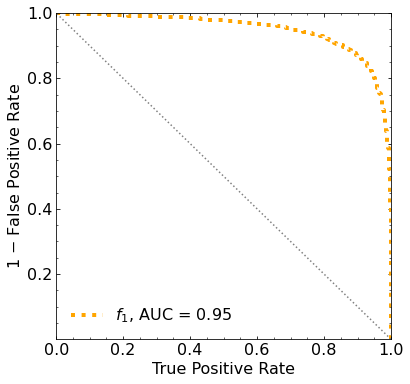

Classification score:


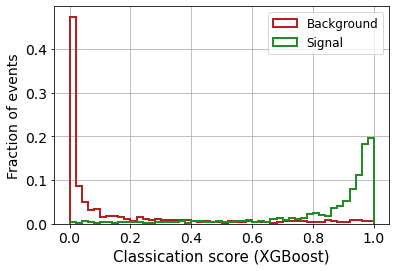


 ROC-AUC =  0.9493960977070575
At least 5 B events per bin, range = [[0, 1]]:
# bins:  21 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  21
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


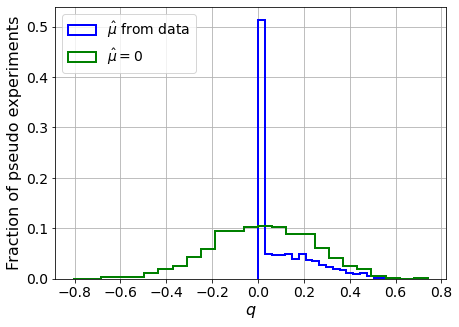

muhat mean:  -0.049352269603788176
Z_bins:  0.14794021391708048
std Z_bins:  0.45426241731428985
Z_bins mu=0:  0.14794021391708048
std Z_bins mu=0:  0.7537836508829583

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


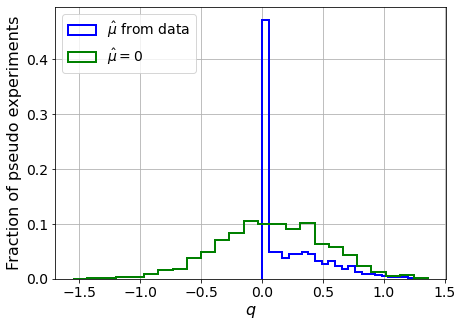

muhat mean:  -0.07205656974853496
Z_bins:  0.29654686309565437
std Z_bins:  0.4680159837531106
Z_bins mu=0:  0.29654686309565437
std Z_bins mu=0:  0.7357736727900115

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0025


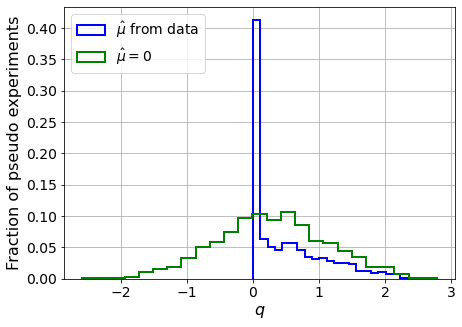

muhat mean:  0.01279320482359511
Z_bins:  0.5163860423326077
std Z_bins:  0.562841883876308
Z_bins mu=0:  0.5162964898251197
std Z_bins mu=0:  0.8254947086766194

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


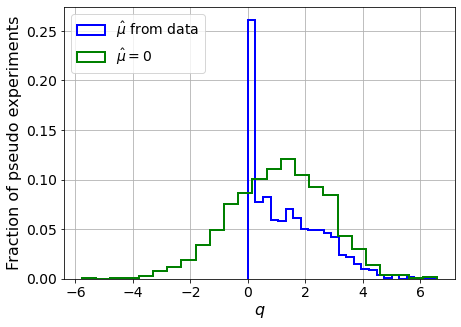

muhat mean:  -0.0003787259058277692
Z_bins:  1.0691637100839135
std Z_bins:  0.5779935172292722
Z_bins mu=0:  1.0691637100839135
std Z_bins mu=0:  0.7714658513492876

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


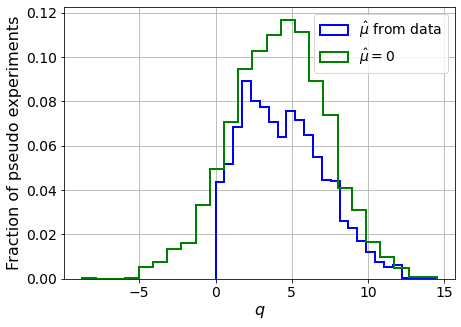

muhat mean:  0.012847587021819252
Z_bins:  2.060378599653792
std Z_bins:  0.650824746215003
Z_bins mu=0:  2.060378599653792
std Z_bins mu=0:  0.7691971574907244

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


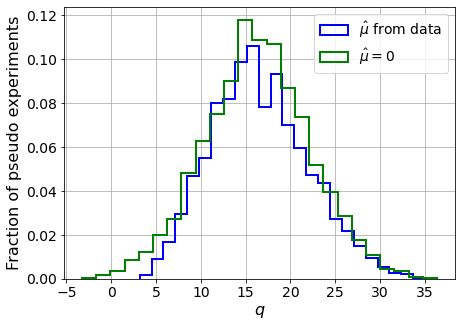

muhat mean:  0.0015990133116301982
Z_bins:  4.013831251025052
std Z_bins:  0.6715777781230636
Z_bins mu=0:  4.013831251025052
std Z_bins mu=0:  0.7294977629653688

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


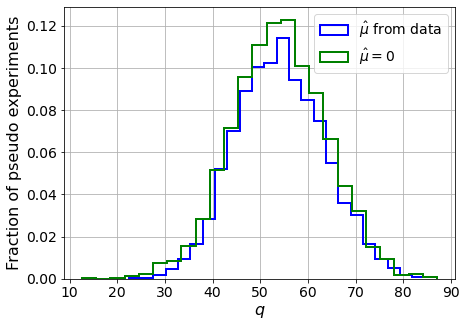

muhat mean:  0.000995001620211872
Z_bins:  7.344975460774877
std Z_bins:  0.6356137938610569
Z_bins mu=0:  7.3446314465845415
std Z_bins mu=0:  0.668767088724451

--------

B_expected:  643
S_expected:  170

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


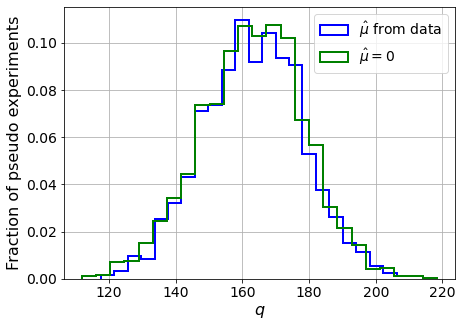

muhat mean:  -0.0010696090568871458
Z_bins:  12.781119933295356
std Z_bins:  0.5909531673107952
Z_bins mu=0:  12.780681907831278
std Z_bins mu=0:  0.6093299459837748

--------

B_expected:  643
S_expected:  366

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


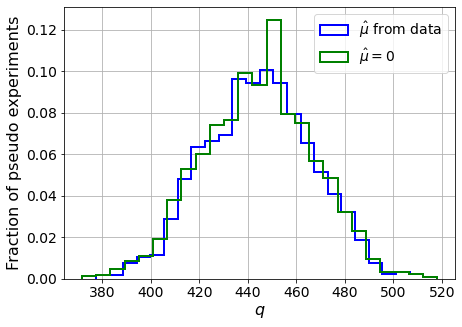

muhat mean:  0.00034778845495932745
Z_bins:  21.091387485186225
std Z_bins:  0.5298552314738922
Z_bins mu=0:  21.09023059030297
std Z_bins mu=0:  0.5406439938946016

--------

B_expected:  643
S_expected:  788

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


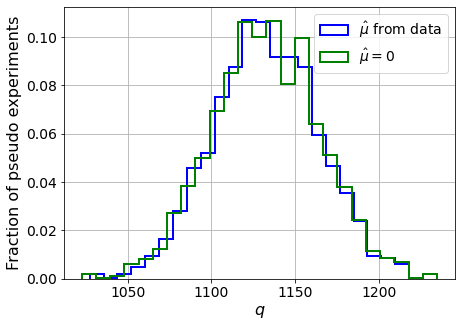

muhat mean:  4.0238495476871984e-05
Z_bins:  33.64759301048093
std Z_bins:  0.46980925530211454
Z_bins mu=0:  33.64706015893373
std Z_bins mu=0:  0.47633969417555594

--------


 FINAL RESULT:

[[0.14794021391708048, 0.45426241731428985, -0.049352269603788176, 0.14794021391708048, 0.7537836508829583], [0.29654686309565437, 0.4680159837531106, -0.07205656974853496, 0.29654686309565437, 0.7357736727900115], [0.5163860423326077, 0.562841883876308, 0.01279320482359511, 0.5162964898251197, 0.8254947086766194], [1.0691637100839135, 0.5779935172292722, -0.0003787259058277692, 1.0691637100839135, 0.7714658513492876], [2.060378599653792, 0.650824746215003, 0.012847587021819252, 2.060378599653792, 0.7691971574907244], [4.013831251025052, 0.6715777781230636, 0.0015990133116301982, 4.013831251025052, 0.7294977629653688], [7.344975460774877, 0.6356137938610569, 0.000995001620211872, 7.3446314465845415, 0.668767088724451], [12.781119933295356, 0.5909531673107952, -0.0010696090568871458, 12.780681907

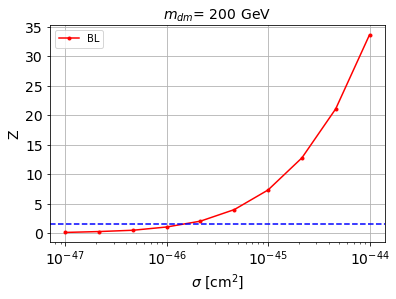


cross_BL_164:  1.6616288150563505e-46
cross_BL_164_up:  9.928984141118452e-47
cross_BL_164_down:  2.435783752203046e-46

#########################


#########################

mDM =  500 GeV


max_pS1_both lenght:  178

X_mon1_train :  (4999, 178)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 178)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 178)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35244)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35244)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35244)
y

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68736	validation_1-logloss:0.68817
[1]	validation_0-logloss:0.68171	validation_1-logloss:0.68337
[2]	validation_0-logloss:0.67617	validation_1-logloss:0.67861
[3]	validation_0-logloss:0.67073	validation_1-logloss:0.67393
[4]	validation_0-logloss:0.66538	validation_1-logloss:0.66954
[5]	validation_0-logloss:0.66019	validation_1-logloss:0.66503
[6]	validation_0-logloss:0.65504	validation_1-logloss:0.66078
[7]	validation_0-logloss:0.64991	validation_1-logloss:0.65639
[8]	validation_0-logloss:0.64491	validation_1-logloss:0.65207
[9]	validation_0-logloss:0.63998	validation_1-logloss:0.64794
[10]	validation_0-logloss:0.63509	validation_1-logloss:0.64378
[11]	validation_0-logloss:0.63041	validation_1-logloss:0.63995
[12]	validation_0-logloss:0.62575	validation_1-logloss:0.63597
[13]	validation_0-logloss:0.62122	validation_1-logloss:0.63226
[14]	validation_0-logloss:0.61665	validation_1-logloss:0.62834
[15]	validation_0-logloss:0.61225	validation_1-logloss:0.62472
[1

[130]	validation_0-logloss:0.33444	validation_1-logloss:0.41172
[131]	validation_0-logloss:0.33304	validation_1-logloss:0.41080
[132]	validation_0-logloss:0.33169	validation_1-logloss:0.40990
[133]	validation_0-logloss:0.33041	validation_1-logloss:0.40915
[134]	validation_0-logloss:0.32905	validation_1-logloss:0.40831
[135]	validation_0-logloss:0.32760	validation_1-logloss:0.40740
[136]	validation_0-logloss:0.32638	validation_1-logloss:0.40671
[137]	validation_0-logloss:0.32502	validation_1-logloss:0.40577
[138]	validation_0-logloss:0.32371	validation_1-logloss:0.40484
[139]	validation_0-logloss:0.32254	validation_1-logloss:0.40415
[140]	validation_0-logloss:0.32120	validation_1-logloss:0.40324
[141]	validation_0-logloss:0.31994	validation_1-logloss:0.40251
[142]	validation_0-logloss:0.31862	validation_1-logloss:0.40166
[143]	validation_0-logloss:0.31751	validation_1-logloss:0.40102
[144]	validation_0-logloss:0.31626	validation_1-logloss:0.40013
[145]	validation_0-logloss:0.31505	valid

[259]	validation_0-logloss:0.21396	validation_1-logloss:0.34091
[260]	validation_0-logloss:0.21338	validation_1-logloss:0.34058
[261]	validation_0-logloss:0.21268	validation_1-logloss:0.34022
[262]	validation_0-logloss:0.21205	validation_1-logloss:0.34000
[263]	validation_0-logloss:0.21143	validation_1-logloss:0.33968
[264]	validation_0-logloss:0.21080	validation_1-logloss:0.33938
[265]	validation_0-logloss:0.21022	validation_1-logloss:0.33911
[266]	validation_0-logloss:0.20965	validation_1-logloss:0.33879
[267]	validation_0-logloss:0.20897	validation_1-logloss:0.33848
[268]	validation_0-logloss:0.20830	validation_1-logloss:0.33820
[269]	validation_0-logloss:0.20775	validation_1-logloss:0.33783
[270]	validation_0-logloss:0.20716	validation_1-logloss:0.33753
[271]	validation_0-logloss:0.20656	validation_1-logloss:0.33726
[272]	validation_0-logloss:0.20609	validation_1-logloss:0.33708
[273]	validation_0-logloss:0.20559	validation_1-logloss:0.33679
[274]	validation_0-logloss:0.20495	valid

[388]	validation_0-logloss:0.15388	validation_1-logloss:0.31378
[389]	validation_0-logloss:0.15355	validation_1-logloss:0.31364
[390]	validation_0-logloss:0.15319	validation_1-logloss:0.31347
[391]	validation_0-logloss:0.15293	validation_1-logloss:0.31341
[392]	validation_0-logloss:0.15255	validation_1-logloss:0.31326
[393]	validation_0-logloss:0.15210	validation_1-logloss:0.31308
[394]	validation_0-logloss:0.15185	validation_1-logloss:0.31299
[395]	validation_0-logloss:0.15145	validation_1-logloss:0.31277
[396]	validation_0-logloss:0.15105	validation_1-logloss:0.31255
[397]	validation_0-logloss:0.15076	validation_1-logloss:0.31234
[398]	validation_0-logloss:0.15042	validation_1-logloss:0.31222
[399]	validation_0-logloss:0.14999	validation_1-logloss:0.31208
[400]	validation_0-logloss:0.14974	validation_1-logloss:0.31196
[401]	validation_0-logloss:0.14946	validation_1-logloss:0.31182
[402]	validation_0-logloss:0.14914	validation_1-logloss:0.31163
[403]	validation_0-logloss:0.14889	valid

[517]	validation_0-logloss:0.11802	validation_1-logloss:0.30033
[518]	validation_0-logloss:0.11786	validation_1-logloss:0.30029
[519]	validation_0-logloss:0.11759	validation_1-logloss:0.30029
[520]	validation_0-logloss:0.11748	validation_1-logloss:0.30022
[521]	validation_0-logloss:0.11720	validation_1-logloss:0.30012
[522]	validation_0-logloss:0.11700	validation_1-logloss:0.30014
[523]	validation_0-logloss:0.11677	validation_1-logloss:0.30004
[524]	validation_0-logloss:0.11657	validation_1-logloss:0.29994
[525]	validation_0-logloss:0.11638	validation_1-logloss:0.29995
[526]	validation_0-logloss:0.11620	validation_1-logloss:0.29987
[527]	validation_0-logloss:0.11594	validation_1-logloss:0.29978
[528]	validation_0-logloss:0.11575	validation_1-logloss:0.29970
[529]	validation_0-logloss:0.11552	validation_1-logloss:0.29960
[530]	validation_0-logloss:0.11541	validation_1-logloss:0.29957
[531]	validation_0-logloss:0.11520	validation_1-logloss:0.29948
[532]	validation_0-logloss:0.11501	valid

[646]	validation_0-logloss:0.09641	validation_1-logloss:0.29342
[647]	validation_0-logloss:0.09624	validation_1-logloss:0.29342
[648]	validation_0-logloss:0.09613	validation_1-logloss:0.29342
[649]	validation_0-logloss:0.09596	validation_1-logloss:0.29339
[650]	validation_0-logloss:0.09581	validation_1-logloss:0.29331
[651]	validation_0-logloss:0.09570	validation_1-logloss:0.29326
[652]	validation_0-logloss:0.09559	validation_1-logloss:0.29325
[653]	validation_0-logloss:0.09545	validation_1-logloss:0.29320
[654]	validation_0-logloss:0.09536	validation_1-logloss:0.29318
[655]	validation_0-logloss:0.09524	validation_1-logloss:0.29317
[656]	validation_0-logloss:0.09515	validation_1-logloss:0.29310
[657]	validation_0-logloss:0.09500	validation_1-logloss:0.29305
[658]	validation_0-logloss:0.09487	validation_1-logloss:0.29305
[659]	validation_0-logloss:0.09471	validation_1-logloss:0.29302
[660]	validation_0-logloss:0.09458	validation_1-logloss:0.29304
[661]	validation_0-logloss:0.09448	valid

[775]	validation_0-logloss:0.08179	validation_1-logloss:0.29038
[776]	validation_0-logloss:0.08165	validation_1-logloss:0.29032
[777]	validation_0-logloss:0.08158	validation_1-logloss:0.29030
[778]	validation_0-logloss:0.08149	validation_1-logloss:0.29031
[779]	validation_0-logloss:0.08138	validation_1-logloss:0.29025
[780]	validation_0-logloss:0.08132	validation_1-logloss:0.29024
[781]	validation_0-logloss:0.08119	validation_1-logloss:0.29018
[782]	validation_0-logloss:0.08108	validation_1-logloss:0.29018
[783]	validation_0-logloss:0.08096	validation_1-logloss:0.29017
[784]	validation_0-logloss:0.08086	validation_1-logloss:0.29015
[785]	validation_0-logloss:0.08078	validation_1-logloss:0.29017
[786]	validation_0-logloss:0.08064	validation_1-logloss:0.29019
[787]	validation_0-logloss:0.08053	validation_1-logloss:0.29015
[788]	validation_0-logloss:0.08044	validation_1-logloss:0.29018
[789]	validation_0-logloss:0.08031	validation_1-logloss:0.29016
[790]	validation_0-logloss:0.08024	valid

[904]	validation_0-logloss:0.07026	validation_1-logloss:0.28923
[905]	validation_0-logloss:0.07019	validation_1-logloss:0.28922
[906]	validation_0-logloss:0.07011	validation_1-logloss:0.28917
[907]	validation_0-logloss:0.07000	validation_1-logloss:0.28917
[908]	validation_0-logloss:0.06995	validation_1-logloss:0.28917
[909]	validation_0-logloss:0.06990	validation_1-logloss:0.28913
[910]	validation_0-logloss:0.06981	validation_1-logloss:0.28918
[911]	validation_0-logloss:0.06970	validation_1-logloss:0.28913
[912]	validation_0-logloss:0.06959	validation_1-logloss:0.28905
[913]	validation_0-logloss:0.06950	validation_1-logloss:0.28901
[914]	validation_0-logloss:0.06945	validation_1-logloss:0.28902
[915]	validation_0-logloss:0.06939	validation_1-logloss:0.28896
[916]	validation_0-logloss:0.06930	validation_1-logloss:0.28890
[917]	validation_0-logloss:0.06922	validation_1-logloss:0.28891
[918]	validation_0-logloss:0.06918	validation_1-logloss:0.28895
[919]	validation_0-logloss:0.06910	valid

[1032]	validation_0-logloss:0.06139	validation_1-logloss:0.28870
[1033]	validation_0-logloss:0.06133	validation_1-logloss:0.28876
[1034]	validation_0-logloss:0.06125	validation_1-logloss:0.28872
[1035]	validation_0-logloss:0.06118	validation_1-logloss:0.28870
[1036]	validation_0-logloss:0.06110	validation_1-logloss:0.28874
[1037]	validation_0-logloss:0.06103	validation_1-logloss:0.28877
[1038]	validation_0-logloss:0.06098	validation_1-logloss:0.28874
[1039]	validation_0-logloss:0.06092	validation_1-logloss:0.28877
[1040]	validation_0-logloss:0.06085	validation_1-logloss:0.28872
[1041]	validation_0-logloss:0.06083	validation_1-logloss:0.28871
[1042]	validation_0-logloss:0.06076	validation_1-logloss:0.28874
[1043]	validation_0-logloss:0.06069	validation_1-logloss:0.28881
[1044]	validation_0-logloss:0.06061	validation_1-logloss:0.28881
[1045]	validation_0-logloss:0.06056	validation_1-logloss:0.28884
[1046]	validation_0-logloss:0.06051	validation_1-logloss:0.28879
[1047]	validation_0-loglo

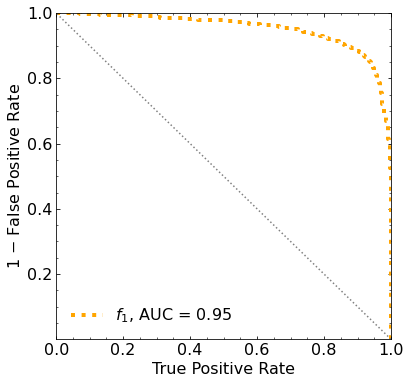

Classification score:


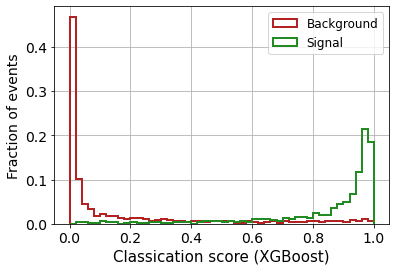


 ROC-AUC =  0.952054232427156
At least 5 B events per bin, range = [[0, 1]]:
# bins:  16 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  16
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


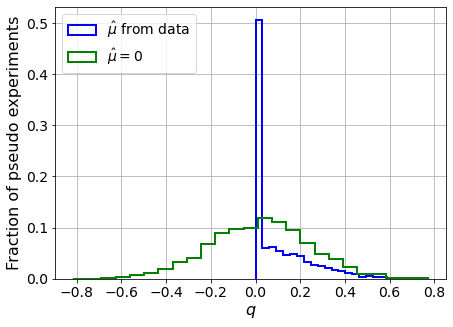

muhat mean:  0.0501097607256019
Z_bins:  0.1671267533832866
std Z_bins:  0.399364331519435
Z_bins mu=0:  0.1671267533832866
std Z_bins mu=0:  0.66870817489661

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


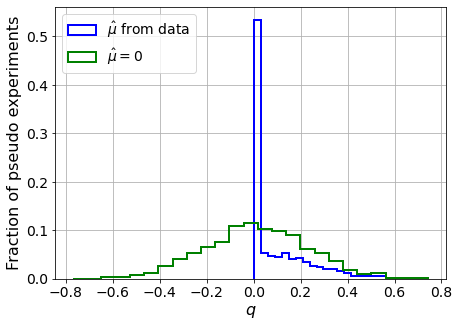

muhat mean:  0.1344733636121074
Z_bins:  0.1098102593085302
std Z_bins:  0.6095163049281359
Z_bins mu=0:  0.10494005520164802
std Z_bins mu=0:  1.0527532276582978

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


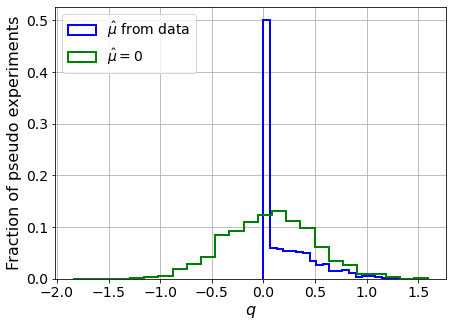

muhat mean:  0.07604999553940928
Z_bins:  0.25209750588051066
std Z_bins:  0.535053713367532
Z_bins mu=0:  0.2511595869625639
std Z_bins mu=0:  0.8472053851972793

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


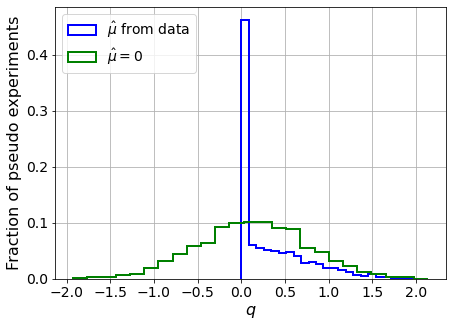

muhat mean:  0.09835033437239617
Z_bins:  0.37398624641893424
std Z_bins:  0.5446427756316155
Z_bins mu=0:  0.3722466864244934
std Z_bins mu=0:  0.8469205283682589

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.004


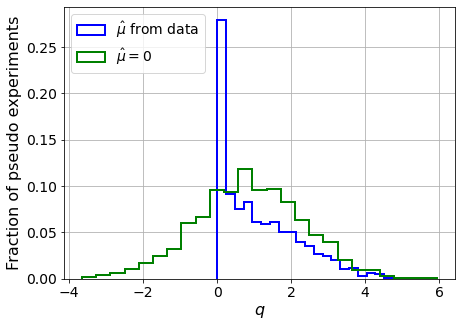

muhat mean:  -0.023757717996273374
Z_bins:  0.928809505263073
std Z_bins:  0.5820258189924054
Z_bins mu=0:  0.928809505263073
std Z_bins mu=0:  0.7733515516151233

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0045


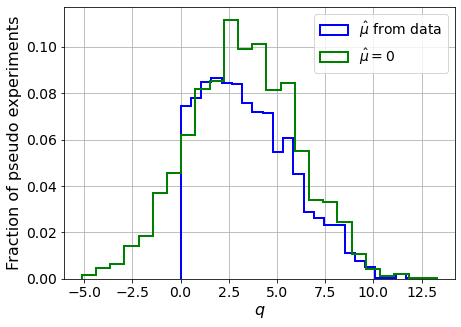

muhat mean:  0.02264599282561384
Z_bins:  1.801024941986772
std Z_bins:  0.6507860430744136
Z_bins mu=0:  1.8006886242907976
std Z_bins mu=0:  0.775325060645501

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


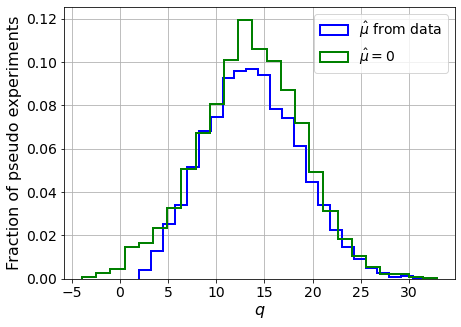

muhat mean:  0.0008977701637611973
Z_bins:  3.69042612100486
std Z_bins:  0.6610229832111152
Z_bins mu=0:  3.6891906003687356
std Z_bins mu=0:  0.7275213234271484

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0055


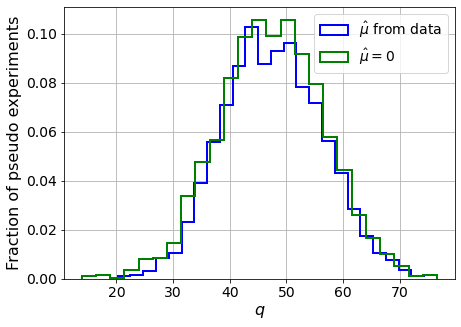

muhat mean:  0.0001325128227107617
Z_bins:  6.891879810624984
std Z_bins:  0.6341464057321725
Z_bins mu=0:  6.890693932820615
std Z_bins mu=0:  0.6680322260220134

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


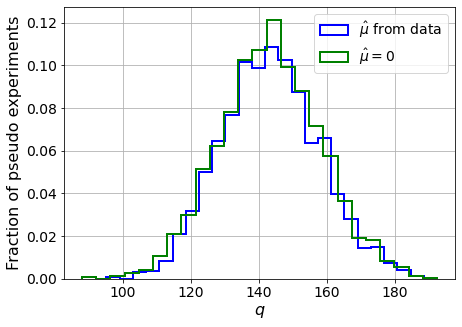

muhat mean:  3.21142872460974e-05
Z_bins:  11.982268898119125
std Z_bins:  0.602974558206086
Z_bins mu=0:  11.980353202360305
std Z_bins mu=0:  0.6219701032070672

--------

B_expected:  643
S_expected:  333

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


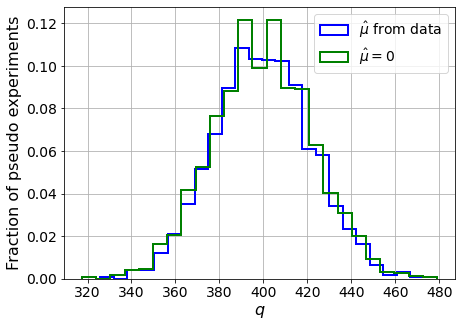

muhat mean:  -0.00026123409203948134
Z_bins:  19.98674189729971
std Z_bins:  0.5531164289008691
Z_bins mu=0:  19.98674189729971
std Z_bins mu=0:  0.5646834235447405

--------


 FINAL RESULT:

[[0.1671267533832866, 0.399364331519435, 0.0501097607256019, 0.1671267533832866, 0.66870817489661], [0.1098102593085302, 0.6095163049281359, 0.1344733636121074, 0.10494005520164802, 1.0527532276582978], [0.25209750588051066, 0.535053713367532, 0.07604999553940928, 0.2511595869625639, 0.8472053851972793], [0.37398624641893424, 0.5446427756316155, 0.09835033437239617, 0.3722466864244934, 0.8469205283682589], [0.928809505263073, 0.5820258189924054, -0.023757717996273374, 0.928809505263073, 0.7733515516151233], [1.801024941986772, 0.6507860430744136, 0.02264599282561384, 1.8006886242907976, 0.775325060645501], [3.69042612100486, 0.6610229832111152, 0.0008977701637611973, 3.6891906003687356, 0.7275213234271484], [6.891879810624984, 0.6341464057321725, 0.0001325128227107617, 6.890693932820615, 0.668032

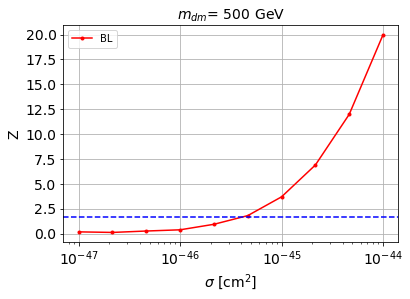


cross_BL_164:  4.2004374834783705e-46
cross_BL_164_up:  2.456971147751842e-46
cross_BL_164_down:  5.997926262809835e-46

#########################



In [10]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = 'mDM' + str(mDM) + 'GeV/WP_mDM' + str(mDM) + 'GeV_sig1045.hdf5'
    
    f_S = h5py.File(filefolder+filename_S,'r')
    
    
    
    
    print('')
    
    ###################
    # peakS1_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS1_B = 0
    max_pS1_B1 = 0
    max_pS1_B2 = 0
    max_pS1_B3 = 0
    max_pS1_B4 = 0

    max_pS1_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS1_B = max(max_pS1_B, len( f_B['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS1_B1 = max(max_pS1_B1, len( f_B1['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS1_B2 = max(max_pS1_B2, len( f_B2['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS1_B3 = max(max_pS1_B3, len( f_B3['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS1_B4 = max(max_pS1_B4, len( f_B4['peakS1_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS1_S = max(max_pS1_S, len( f_S['peakS1_onlyhits/ev_'+str(i)] ))


    max_pS1_both = max(max_pS1_B,max_pS1_B1,max_pS1_B2,max_pS1_B3,max_pS1_B4,max_pS1_S)

    print('max_pS1_both lenght: ', max_pS1_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
    diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS1_onlyhits_B = np.pad(f_B['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B), 'constant')
    peakS1_onlyhits_B1 = np.pad(f_B1['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B1), 'constant')
    peakS1_onlyhits_B2 = np.pad(f_B2['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B2), 'constant')
    peakS1_onlyhits_B3 = np.pad(f_B3['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B3), 'constant')
    peakS1_onlyhits_B4 = np.pad(f_B4['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B4), 'constant')
    peakS1_onlyhits_S = np.pad(f_S['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
        diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S1_B = np.pad(f_B['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B), 'constant')
        # add new event to the matrix as a row
        peakS1_onlyhits_B = np.row_stack([peakS1_onlyhits_B,aux_S1_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B1 = np.pad(f_B1['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B1), 'constant')
        peakS1_onlyhits_B1 = np.row_stack([peakS1_onlyhits_B1,aux_S1_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B2 = np.pad(f_B2['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B2), 'constant')
        peakS1_onlyhits_B2 = np.row_stack([peakS1_onlyhits_B2,aux_S1_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B3 = np.pad(f_B3['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B3), 'constant')
        peakS1_onlyhits_B3 = np.row_stack([peakS1_onlyhits_B3,aux_S1_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B4 = np.pad(f_B4['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B4), 'constant')
        peakS1_onlyhits_B4 = np.row_stack([peakS1_onlyhits_B4,aux_S1_B4])

    for i in range(2, num_data+1):
        diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_S = np.pad(f_S['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_S), 'constant')
        peakS1_onlyhits_S = np.row_stack([peakS1_onlyhits_S,aux_S1_S])




    # X and Y for the classifier
    X_peakS1 = np.row_stack([peakS1_onlyhits_B[:NUM_DAT_ER],peakS1_onlyhits_B1[:NUM_DAT_AC],peakS1_onlyhits_B2[:NUM_DAT_CNNS],peakS1_onlyhits_B3[:NUM_DAT_RN],peakS1_onlyhits_B4[:NUM_DAT_WALL],peakS1_onlyhits_S])
    # normalize
    X_peakS1 = scaler.fit_transform(X_peakS1)

    del peakS1_onlyhits_B
    del peakS1_onlyhits_B1
    del peakS1_onlyhits_B2
    del peakS1_onlyhits_B3
    del peakS1_onlyhits_B4
    del peakS1_onlyhits_S






    ###################
    # CONCATENATE ALL #
    ###################

    X_mon1 = np.concatenate([X_peakS1],axis=1)

    del X_peakS1

    # labels
    y_mon1 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon1_aux, X_mon1_test, y_mon1_aux, y_mon1_test = train_test_split(X_mon1,
                                                                    y_mon1,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon1,
                                                                    shuffle=True)

    del X_mon1
    del y_mon1

    X_mon1_train, X_mon1_val, y_mon1_train, y_mon1_val = train_test_split(X_mon1_aux,
                                                                      y_mon1_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon1_aux,
                                                                      shuffle=True)

    del X_mon1_aux
    del y_mon1_aux

    print('')
    print('X_mon1_train : ', X_mon1_train.shape)
    print('y_mon1_train : ', y_mon1_train.shape)
    print('X_mon1_val : ', X_mon1_val.shape)
    print('y_mon1_val : ', y_mon1_val.shape)
    print('X_mon1_test : ', X_mon1_test.shape)
    print('y_mon1_test : ', y_mon1_test.shape)
    print('')
    
    
    
    
    
    ###################
    # peakS2_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS2_B = 0
    max_pS2_B1 = 0
    max_pS2_B2 = 0
    max_pS2_B3 = 0
    max_pS2_B4 = 0

    max_pS2_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS2_B = max(max_pS2_B, len( f_B['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS2_B1 = max(max_pS2_B1, len( f_B1['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS2_B2 = max(max_pS2_B2, len( f_B2['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS2_B3 = max(max_pS2_B3, len( f_B3['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS2_B4 = max(max_pS2_B4, len( f_B4['peakS2_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS2_S = max(max_pS2_S, len( f_S['peakS2_onlyhits/ev_'+str(i)] ))


    max_pS2_both = max(max_pS2_B,max_pS2_B1,max_pS2_B2,max_pS2_B3,max_pS2_B4,max_pS2_S)

    print('max_pS2_both lenght: ', max_pS2_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
    diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS2_onlyhits_B = np.pad(f_B['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B), 'constant')
    peakS2_onlyhits_B1 = np.pad(f_B1['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B1), 'constant')
    peakS2_onlyhits_B2 = np.pad(f_B2['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B2), 'constant')
    peakS2_onlyhits_B3 = np.pad(f_B3['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B3), 'constant')
    peakS2_onlyhits_B4 = np.pad(f_B4['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B4), 'constant')
    peakS2_onlyhits_S = np.pad(f_S['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
        diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S2_B = np.pad(f_B['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B), 'constant')
        # add new event to the matrix as a row
        peakS2_onlyhits_B = np.row_stack([peakS2_onlyhits_B,aux_S2_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B1 = np.pad(f_B1['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B1), 'constant')
        peakS2_onlyhits_B1 = np.row_stack([peakS2_onlyhits_B1,aux_S2_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B2 = np.pad(f_B2['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B2), 'constant')
        peakS2_onlyhits_B2 = np.row_stack([peakS2_onlyhits_B2,aux_S2_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B3 = np.pad(f_B3['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B3), 'constant')
        peakS2_onlyhits_B3 = np.row_stack([peakS2_onlyhits_B3,aux_S2_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B4 = np.pad(f_B4['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B4), 'constant')
        peakS2_onlyhits_B4 = np.row_stack([peakS2_onlyhits_B4,aux_S2_B4])
    for i in range(2, num_data+1):
        diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_S = np.pad(f_S['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_S), 'constant')
        peakS2_onlyhits_S = np.row_stack([peakS2_onlyhits_S,aux_S2_S])




    # X and Y for the classifier
    X_peakS2 = np.row_stack([peakS2_onlyhits_B[:NUM_DAT_ER],peakS2_onlyhits_B1[:NUM_DAT_AC],peakS2_onlyhits_B2[:NUM_DAT_CNNS],peakS2_onlyhits_B3[:NUM_DAT_RN],peakS2_onlyhits_B4[:NUM_DAT_WALL],peakS2_onlyhits_S])
    # normalize
    X_peakS2 = scaler.fit_transform(X_peakS2)

    del peakS2_onlyhits_B
    del peakS2_onlyhits_B1
    del peakS2_onlyhits_B2
    del peakS2_onlyhits_B3
    del peakS2_onlyhits_B4
    del peakS2_onlyhits_S









    ###################
    # CONCATENATE ALL #
    ###################

    X_mon2 = np.concatenate([X_peakS2],axis=1)

    del X_peakS2

    # labels
    y_mon2 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon2_aux, X_mon2_test, y_mon2_aux, y_mon2_test = train_test_split(X_mon2,
                                                                    y_mon2,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon2,
                                                                    shuffle=True)

    del X_mon2
    del y_mon2

    X_mon2_train, X_mon2_val, y_mon2_train, y_mon2_val = train_test_split(X_mon2_aux,
                                                                      y_mon2_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon2_aux,
                                                                      shuffle=True)

    del X_mon2_aux
    del y_mon2_aux

    print('')
    print('X_mon2_train : ', X_mon2_train.shape)
    print('y_mon2_train : ', y_mon2_train.shape)
    print('X_mon2_val : ', X_mon2_val.shape)
    print('y_mon2_val : ', y_mon2_val.shape)
    print('X_mon2_test : ', X_mon2_test.shape)
    print('y_mon2_test : ', y_mon2_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_bot_img DATA #
    ######################


    HITS_bot_img_S = np.array( f_S['HITS_bot_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_bot_img_S = np.row_stack([HITS_bot_img_S,np.array( f_S['HITS_bot_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon3 = np.row_stack([HITS_bot_img_B[:NUM_DAT_ER],HITS_bot_img_B1[:NUM_DAT_AC],HITS_bot_img_B2[:NUM_DAT_CNNS],HITS_bot_img_B3[:NUM_DAT_RN],HITS_bot_img_B4[:NUM_DAT_WALL],HITS_bot_img_S])
    # normalize
    X_mon3 = scaler.fit_transform(X_mon3)
    #X_mon3 = np.reshape(X_mon3, (2*num_data,128,128,1))

#     del HITS_bot_img_B
#     del HITS_bot_img_B1
#     del HITS_bot_img_B2
#     del HITS_bot_img_B3
#     del HITS_bot_img_B4
    del HITS_bot_img_S

    # labels
    y_mon3 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon3_aux, X_mon3_test, y_mon3_aux, y_mon3_test = train_test_split(X_mon3,
                                                                    y_mon3,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon3,
                                                                    shuffle=True)

    del X_mon3
    del y_mon3

    X_mon3_train, X_mon3_val, y_mon3_train, y_mon3_val = train_test_split(X_mon3_aux,
                                                                      y_mon3_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon3_aux,
                                                                      shuffle=True)

    del X_mon3_aux
    del y_mon3_aux

    print('')
    print('X_mon3_train : ', X_mon3_train.shape)
    print('y_mon3_train : ', y_mon3_train.shape)
    print('X_mon3_val : ', X_mon3_val.shape)
    print('y_mon3_val : ', y_mon3_val.shape)
    print('X_mon3_test : ', X_mon3_test.shape)
    print('y_mon3_test : ', y_mon3_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_top_img DATA #
    ######################
    
    HITS_top_img_S = np.array( f_S['HITS_top_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_top_img_S = np.row_stack([HITS_top_img_S,np.array( f_S['HITS_top_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon4 = np.row_stack([HITS_top_img_B[:NUM_DAT_ER],HITS_top_img_B1[:NUM_DAT_AC],HITS_top_img_B2[:NUM_DAT_CNNS],HITS_top_img_B3[:NUM_DAT_RN],HITS_top_img_B4[:NUM_DAT_WALL],HITS_top_img_S])
    # normalize
    X_mon4 = scaler.fit_transform(X_mon4)
    #X_mon4 = np.reshape(X_mon4, (2*num_data,128,128,1))

#     del HITS_top_img_B
#     del HITS_top_img_B1
#     del HITS_top_img_B2
#     del HITS_top_img_B3
#     del HITS_top_img_B4
    del HITS_top_img_S

    # labels
    y_mon4 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon4_aux, X_mon4_test, y_mon4_aux, y_mon4_test = train_test_split(X_mon4,
                                                                    y_mon4,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon4,
                                                                    shuffle=True)

    del X_mon4
    del y_mon4

    X_mon4_train, X_mon4_val, y_mon4_train, y_mon4_val = train_test_split(X_mon4_aux,
                                                                      y_mon4_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon4_aux,
                                                                      shuffle=True)

    del X_mon4_aux
    del y_mon4_aux

    print('')
    print('X_mon4_train : ', X_mon4_train.shape)
    print('y_mon4_train : ', y_mon4_train.shape)
    print('X_mon4_val : ', X_mon4_val.shape)
    print('y_mon4_val : ', y_mon4_val.shape)
    print('X_mon4_test : ', X_mon4_test.shape)
    print('y_mon4_test : ', y_mon4_test.shape)
    print('')
    
    
    
    
    
    
    # close the h5 files
#     f_B.close()
#     f_B1.close()
#     f_B2.close()
#     f_B3.close()
#     f_B4.close()
    f_S.close()
    
    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon_train = np.concatenate([X_mon1_train,X_mon2_train,X_mon3_train,X_mon4_train],axis=1)
    X_mon_test = np.concatenate([X_mon1_test,X_mon2_test,X_mon3_test,X_mon4_test],axis=1)
    X_mon_val = np.concatenate([X_mon1_val,X_mon2_val,X_mon3_val,X_mon4_val],axis=1)



    y_mon_train = y_mon1_train
    y_mon_test = y_mon1_test
    y_mon_val = y_mon1_val



    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
#     #######
#     # MLL #
#     #######
    
#     # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

#     # outputs:
#     # 1st -> background PDF
#     # 2nd -> signal PDF
#     # 3rd -> (normalization factor of the background PDF)**-1
#     # 4th -> (normalization factor of the signal PDF)**-1
#     # 5th -> background bandwidth
#     # 6th -> signal bandwidth
#     kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
#                                                                                             1000, 
#                                                                                             np.logspace(-4.0, 0.05, 20), 
#                                                                                             set_kernel='epanechnikov')




#     # FOR EXCLUSION:
#     # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

#     print('This may take a while...')

#     pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
#     print('1 done')
#     pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
#     print('2 done')

#     # Normalize
#     pB_B_data = pB_B_data / norm_factor_SM
#     pS_B_data = pS_B_data / norm_factor_NP


#     if D_or_E == "discovery":

#         # FOR DISCOVERY:
#         # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

#         pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
#         print('3 done')
#         pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
#         print('4 done')

#         # Normalize
#         pB_S_data = pB_S_data / norm_factor_SM
#         pS_S_data = pS_S_data / norm_factor_NP

#     else:
#         # dummies
#         pB_S_data = 1
#         pS_S_data = 1





#    # OPTION 2 (mu_hat with more precision) (slower,
#     store_Z_MLL = []


#     for s_it in range(len(S_expected)):

#         print('B_expected: ', B_expected)
#         print('S_expected: ', S_expected[s_it])
#         print('')

#         Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

#         store_Z_MLL.append( list(Z_MLL) )

#         print('muhat mean: ', Z_MLL[2])
#         print('Z_bins: ', Z_MLL[0])
#         print('std Z_bins: ', Z_MLL[1])
#         print('Z_bins mu=0: ', Z_MLL[3])
#         print('std Z_bins mu=0: ', Z_MLL[4])
#         print('')
#         print('--------\n')


#     print('\n FINAL RESULT:\n')
#     print(store_Z_MLL)


#     store_Z_MLL = np.array(store_Z_MLL)

#     for hd in range(len(store_Z_MLL[:,0])):
#         if store_Z_MLL[:,0][hd] == 0:
#             store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
#             store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]



    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
#     plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
#     # interpolate
#     f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
#     f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
#     f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

#     # compute the cross section with Z=1.64
#     cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
#     cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
#     cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
#     store_cross_MLL_164.append(cross_MLL_164)
#     store_cross_MLL_164_up.append(cross_MLL_164_up)
#     store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
#     print('\ncross_MLL_164: ', cross_MLL_164)
#     print('cross_MLL_164_up: ', cross_MLL_164_up)
#     print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [11]:
cross_arrays = store_cross_BL_164
cross_arrays_up = store_cross_BL_164_up
cross_arrays_down = store_cross_BL_164_down

print(cross_arrays)
print(cross_arrays_up)
print(cross_arrays_down)

[1.946264899975856e-45, 1.1260224149047503e-46, 6.781708003776903e-47, 6.132823729418476e-47, 9.854194594733775e-47, 1.6616288150563505e-46, 4.2004374834783705e-46]
[1.0841121689089158e-45, 6.935884361340168e-47, 4.324544129385463e-47, 3.8602440497900525e-47, 6.297321378087256e-47, 9.928984141118452e-47, 2.456971147751842e-46]
[2.696790594070898e-45, 1.7221183297984327e-46, 9.67777358924605e-47, 8.98529172081331e-47, 1.400606697844868e-46, 2.435783752203046e-46, 5.997926262809835e-46]


In [12]:
np.savetxt('results/arrays.txt', [cross_arrays, cross_arrays_up, cross_arrays_down])

In [13]:
cross_arrays = np.loadtxt('results/arrays.txt')[0]
cross_arrays_up = np.loadtxt('results/arrays.txt')[1]
cross_arrays_down =np.loadtxt('results/arrays.txt')[2]


#########################

mDM =  10 GeV


max_pS1_both lenght:  152

X_mon1_train :  (4999, 152)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 152)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 152)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35218)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35218)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35218)
y_mon_test :  (3334,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68378	validation_1-logloss:0.68413
[1]	validation_0-logloss:0.67460	validation_1-logloss:0.67532
[2]	validation_0-logloss:0.66560	validation_1-logloss:0.66662
[3]	validation_0-logloss:0.65676	validation_1-logloss:0.65814
[4]	validation_0-logloss:0.64810	validation_1-logloss:0.64978
[5]	validation_0-logloss:0.63959	validation_1-logloss:0.64159
[6]	validation_0-logloss:0.63126	validation_1-logloss:0.63358
[7]	validation_0-logloss:0.62307	validation_1-logloss:0.62574
[8]	validation_0-logloss:0.61502	validation_1-logloss:0.61803
[9]	validation_0-logloss:0.60712	validation_1-logloss:0.61049
[10]	validation_0-logloss:0.59936	validation_1-logloss:0.60309
[11]	validation_0-logloss:0.59176	validation_1-logloss:0.59577
[12]	validation_0-logloss:0.58428	validation_1-logloss:0.58861
[13]	validation_0-logloss:0.57694	validation_1-logloss:0.58158
[14]	validation_0-logloss:0.56973	validation_1-logloss:0.57466
[15]	validation_0-logloss:0.56264	validation_1-logloss:0.56790
[1

[130]	validation_0-logloss:0.16498	validation_1-logloss:0.18850
[131]	validation_0-logloss:0.16342	validation_1-logloss:0.18707
[132]	validation_0-logloss:0.16188	validation_1-logloss:0.18564
[133]	validation_0-logloss:0.16037	validation_1-logloss:0.18424
[134]	validation_0-logloss:0.15885	validation_1-logloss:0.18284
[135]	validation_0-logloss:0.15734	validation_1-logloss:0.18145
[136]	validation_0-logloss:0.15589	validation_1-logloss:0.18010
[137]	validation_0-logloss:0.15443	validation_1-logloss:0.17876
[138]	validation_0-logloss:0.15300	validation_1-logloss:0.17745
[139]	validation_0-logloss:0.15157	validation_1-logloss:0.17615
[140]	validation_0-logloss:0.15015	validation_1-logloss:0.17484
[141]	validation_0-logloss:0.14876	validation_1-logloss:0.17355
[142]	validation_0-logloss:0.14738	validation_1-logloss:0.17229
[143]	validation_0-logloss:0.14603	validation_1-logloss:0.17105
[144]	validation_0-logloss:0.14467	validation_1-logloss:0.16980
[145]	validation_0-logloss:0.14333	valid

[259]	validation_0-logloss:0.05342	validation_1-logloss:0.08694
[260]	validation_0-logloss:0.05299	validation_1-logloss:0.08659
[261]	validation_0-logloss:0.05257	validation_1-logloss:0.08619
[262]	validation_0-logloss:0.05216	validation_1-logloss:0.08582
[263]	validation_0-logloss:0.05173	validation_1-logloss:0.08547
[264]	validation_0-logloss:0.05132	validation_1-logloss:0.08513
[265]	validation_0-logloss:0.05090	validation_1-logloss:0.08476
[266]	validation_0-logloss:0.05047	validation_1-logloss:0.08440
[267]	validation_0-logloss:0.05006	validation_1-logloss:0.08402
[268]	validation_0-logloss:0.04966	validation_1-logloss:0.08371
[269]	validation_0-logloss:0.04927	validation_1-logloss:0.08338
[270]	validation_0-logloss:0.04888	validation_1-logloss:0.08304
[271]	validation_0-logloss:0.04849	validation_1-logloss:0.08269
[272]	validation_0-logloss:0.04810	validation_1-logloss:0.08237
[273]	validation_0-logloss:0.04772	validation_1-logloss:0.08203
[274]	validation_0-logloss:0.04733	valid

[388]	validation_0-logloss:0.01960	validation_1-logloss:0.05973
[389]	validation_0-logloss:0.01945	validation_1-logloss:0.05964
[390]	validation_0-logloss:0.01931	validation_1-logloss:0.05955
[391]	validation_0-logloss:0.01917	validation_1-logloss:0.05945
[392]	validation_0-logloss:0.01902	validation_1-logloss:0.05933
[393]	validation_0-logloss:0.01888	validation_1-logloss:0.05922
[394]	validation_0-logloss:0.01874	validation_1-logloss:0.05914
[395]	validation_0-logloss:0.01859	validation_1-logloss:0.05902
[396]	validation_0-logloss:0.01845	validation_1-logloss:0.05893
[397]	validation_0-logloss:0.01832	validation_1-logloss:0.05886
[398]	validation_0-logloss:0.01819	validation_1-logloss:0.05877
[399]	validation_0-logloss:0.01804	validation_1-logloss:0.05865
[400]	validation_0-logloss:0.01791	validation_1-logloss:0.05855
[401]	validation_0-logloss:0.01779	validation_1-logloss:0.05844
[402]	validation_0-logloss:0.01767	validation_1-logloss:0.05836
[403]	validation_0-logloss:0.01754	valid

[517]	validation_0-logloss:0.00838	validation_1-logloss:0.05277
[518]	validation_0-logloss:0.00834	validation_1-logloss:0.05275
[519]	validation_0-logloss:0.00829	validation_1-logloss:0.05271
[520]	validation_0-logloss:0.00824	validation_1-logloss:0.05270
[521]	validation_0-logloss:0.00819	validation_1-logloss:0.05268
[522]	validation_0-logloss:0.00814	validation_1-logloss:0.05268
[523]	validation_0-logloss:0.00810	validation_1-logloss:0.05266
[524]	validation_0-logloss:0.00805	validation_1-logloss:0.05264
[525]	validation_0-logloss:0.00800	validation_1-logloss:0.05260
[526]	validation_0-logloss:0.00796	validation_1-logloss:0.05256
[527]	validation_0-logloss:0.00791	validation_1-logloss:0.05253
[528]	validation_0-logloss:0.00787	validation_1-logloss:0.05251
[529]	validation_0-logloss:0.00782	validation_1-logloss:0.05248
[530]	validation_0-logloss:0.00778	validation_1-logloss:0.05246
[531]	validation_0-logloss:0.00774	validation_1-logloss:0.05244
[532]	validation_0-logloss:0.00770	valid

[646]	validation_0-logloss:0.00434	validation_1-logloss:0.05094
[647]	validation_0-logloss:0.00432	validation_1-logloss:0.05094
[648]	validation_0-logloss:0.00430	validation_1-logloss:0.05095
[649]	validation_0-logloss:0.00428	validation_1-logloss:0.05097
[650]	validation_0-logloss:0.00426	validation_1-logloss:0.05098
[651]	validation_0-logloss:0.00424	validation_1-logloss:0.05094
[652]	validation_0-logloss:0.00422	validation_1-logloss:0.05093
[653]	validation_0-logloss:0.00420	validation_1-logloss:0.05095
[654]	validation_0-logloss:0.00418	validation_1-logloss:0.05094
[655]	validation_0-logloss:0.00417	validation_1-logloss:0.05093
[656]	validation_0-logloss:0.00415	validation_1-logloss:0.05094
[657]	validation_0-logloss:0.00413	validation_1-logloss:0.05096
[658]	validation_0-logloss:0.00411	validation_1-logloss:0.05096
[659]	validation_0-logloss:0.00410	validation_1-logloss:0.05097
[660]	validation_0-logloss:0.00409	validation_1-logloss:0.05098
[661]	validation_0-logloss:0.00407	valid

[775]	validation_0-logloss:0.00268	validation_1-logloss:0.05084
[776]	validation_0-logloss:0.00267	validation_1-logloss:0.05084
[777]	validation_0-logloss:0.00266	validation_1-logloss:0.05086
[778]	validation_0-logloss:0.00266	validation_1-logloss:0.05087
[779]	validation_0-logloss:0.00265	validation_1-logloss:0.05088
[780]	validation_0-logloss:0.00264	validation_1-logloss:0.05087
[781]	validation_0-logloss:0.00263	validation_1-logloss:0.05092
[782]	validation_0-logloss:0.00263	validation_1-logloss:0.05090
[783]	validation_0-logloss:0.00262	validation_1-logloss:0.05089
[784]	validation_0-logloss:0.00261	validation_1-logloss:0.05090


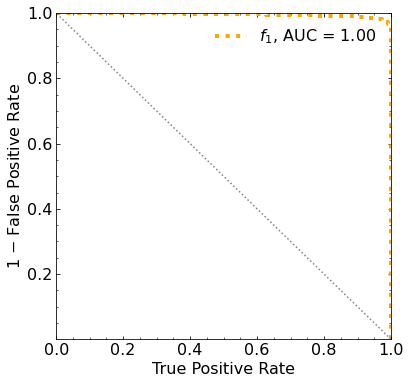

Classification score:


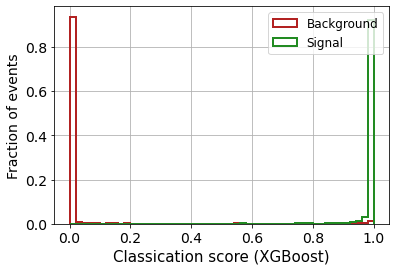


 ROC-AUC =  0.9956487216477626


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 351.45142057
 262.98111686 175.27154666  83.25983974  -8.33464664 -90.56603663]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 369.20022543
 279

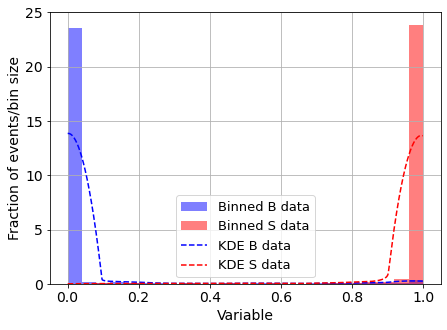

KDE Kernel:  epanechnikov
Background bandwidth:  0.0964296357589577
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



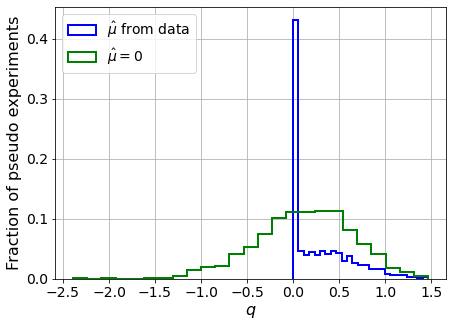

muhat mean:  -0.3866183175868876
Z_bins:  0.3919625319100378
std Z_bins:  0.4197476688220801
Z_bins mu=0:  0.3919625319100378
std Z_bins mu=0:  0.6630622450438753

--------

B_expected:  643
S_expected:  1



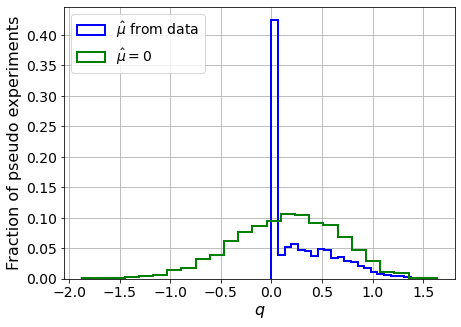

muhat mean:  -0.4595199639811527
Z_bins:  0.4216308069162784
std Z_bins:  0.39229766316015785
Z_bins mu=0:  0.4216308069162784
std Z_bins mu=0:  0.6177032722561531

--------

B_expected:  643
S_expected:  1



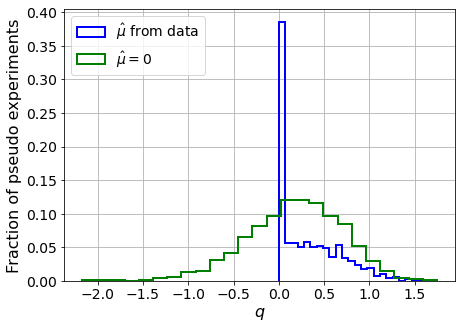

muhat mean:  -0.7325423167399185
Z_bins:  0.4583703318208888
std Z_bins:  0.3701208622850982
Z_bins mu=0:  0.4583703318208888
std Z_bins mu=0:  0.5612274173884279

--------

B_expected:  643
S_expected:  1



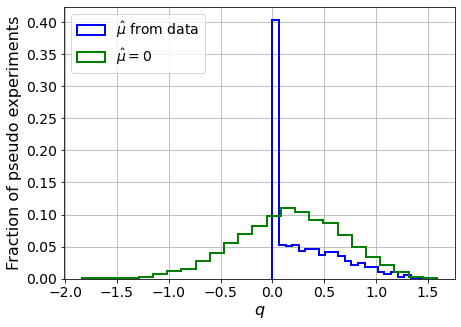

muhat mean:  -0.6374227581109938
Z_bins:  0.4264651914609512
std Z_bins:  0.39976337232716513
Z_bins mu=0:  0.4264651914609512
std Z_bins mu=0:  0.6043755966583471

--------

B_expected:  643
S_expected:  1



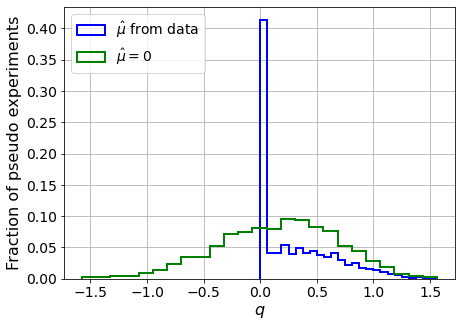

muhat mean:  -0.5864661425948733
Z_bins:  0.4382403454281657
std Z_bins:  0.39327432902771847
Z_bins mu=0:  0.4382403454281657
std Z_bins mu=0:  0.6046532248021671

--------

B_expected:  643
S_expected:  2



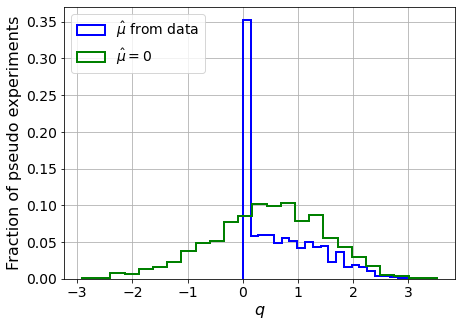

muhat mean:  -0.2952273159017242
Z_bins:  0.7094754932993104
std Z_bins:  0.4927465930610326
Z_bins mu=0:  0.7094754932993104
std Z_bins mu=0:  0.7151764484005589

--------

B_expected:  643
S_expected:  5



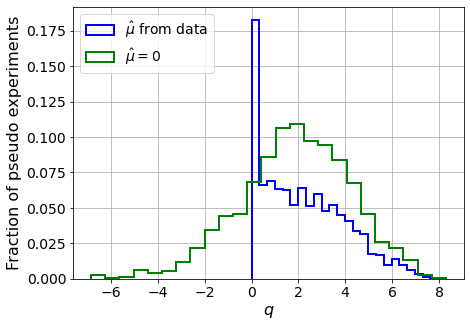

muhat mean:  -0.10976240828612174
Z_bins:  1.4211536632760788
std Z_bins:  0.630038972092291
Z_bins mu=0:  1.4211536632760788
std Z_bins mu=0:  0.8199343619946431

--------

B_expected:  643
S_expected:  10



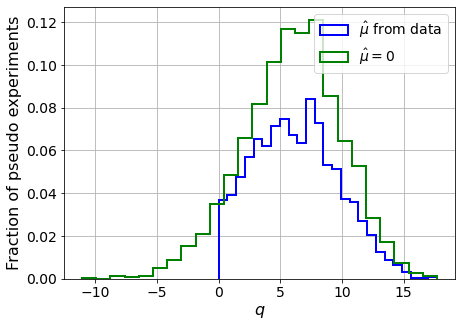

muhat mean:  -0.07086416719085255
Z_bins:  2.4756321433498285
std Z_bins:  0.6901817346659201
Z_bins mu=0:  2.4756321433498285
std Z_bins mu=0:  0.8026396082196107

--------

B_expected:  643
S_expected:  22



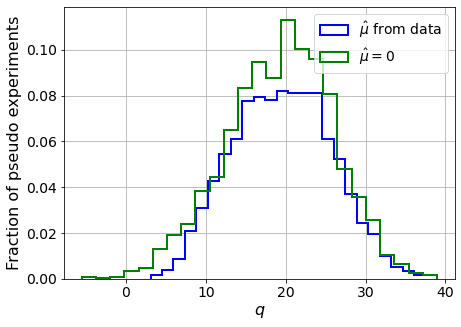

muhat mean:  -0.02909262892191046
Z_bins:  4.445244763389933
std Z_bins:  0.6930339256793983
Z_bins mu=0:  4.445244763389933
std Z_bins mu=0:  0.7537310947707739

--------

B_expected:  643
S_expected:  47



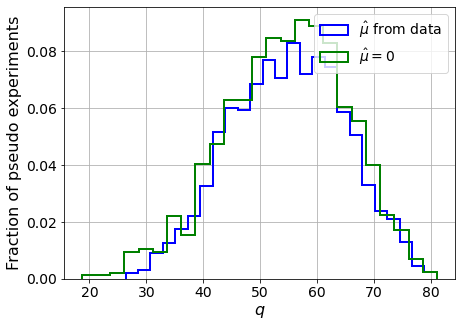

muhat mean:  -0.009060654616434391
Z_bins:  7.429641845520785
std Z_bins:  0.6793844232779611
Z_bins mu=0:  7.429641845520785
std Z_bins mu=0:  0.723062083938763

--------


 FINAL RESULT:

[[0.3919625319100378, 0.4197476688220801, -0.3866183175868876, 0.3919625319100378, 0.6630622450438753], [0.4216308069162784, 0.39229766316015785, -0.4595199639811527, 0.4216308069162784, 0.6177032722561531], [0.4583703318208888, 0.3701208622850982, -0.7325423167399185, 0.4583703318208888, 0.5612274173884279], [0.4264651914609512, 0.39976337232716513, -0.6374227581109938, 0.4264651914609512, 0.6043755966583471], [0.4382403454281657, 0.39327432902771847, -0.5864661425948733, 0.4382403454281657, 0.6046532248021671], [0.7094754932993104, 0.4927465930610326, -0.2952273159017242, 0.7094754932993104, 0.7151764484005589], [1.4211536632760788, 0.630038972092291, -0.10976240828612174, 1.4211536632760788, 0.8199343619946431], [2.4756321433498285, 0.6901817346659201, -0.07086416719085255, 2.4756321433498285, 0.

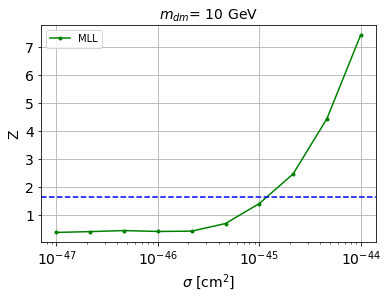


cross_MLL_164:  1.2111915780470104e-45
cross_MLL_164_up:  7.132533540250823e-46
cross_MLL_164_down:  1.9868576446220662e-45

#########################


#########################

mDM =  20 GeV


max_pS1_both lenght:  152

X_mon1_train :  (4999, 152)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 152)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 152)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35218)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35218)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35218

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68478	validation_1-logloss:0.68533
[1]	validation_0-logloss:0.67657	validation_1-logloss:0.67757
[2]	validation_0-logloss:0.66854	validation_1-logloss:0.67002
[3]	validation_0-logloss:0.66067	validation_1-logloss:0.66256
[4]	validation_0-logloss:0.65294	validation_1-logloss:0.65533
[5]	validation_0-logloss:0.64532	validation_1-logloss:0.64810
[6]	validation_0-logloss:0.63787	validation_1-logloss:0.64100
[7]	validation_0-logloss:0.63051	validation_1-logloss:0.63398
[8]	validation_0-logloss:0.62331	validation_1-logloss:0.62726
[9]	validation_0-logloss:0.61619	validation_1-logloss:0.62058
[10]	validation_0-logloss:0.60921	validation_1-logloss:0.61388
[11]	validation_0-logloss:0.60235	validation_1-logloss:0.60738
[12]	validation_0-logloss:0.59562	validation_1-logloss:0.60108
[13]	validation_0-logloss:0.58889	validation_1-logloss:0.59487
[14]	validation_0-logloss:0.58229	validation_1-logloss:0.58877
[15]	validation_0-logloss:0.57587	validation_1-logloss:0.58279
[1

[130]	validation_0-logloss:0.20623	validation_1-logloss:0.24679
[131]	validation_0-logloss:0.20469	validation_1-logloss:0.24547
[132]	validation_0-logloss:0.20323	validation_1-logloss:0.24419
[133]	validation_0-logloss:0.20175	validation_1-logloss:0.24288
[134]	validation_0-logloss:0.20031	validation_1-logloss:0.24171
[135]	validation_0-logloss:0.19889	validation_1-logloss:0.24042
[136]	validation_0-logloss:0.19742	validation_1-logloss:0.23920
[137]	validation_0-logloss:0.19601	validation_1-logloss:0.23803
[138]	validation_0-logloss:0.19464	validation_1-logloss:0.23675
[139]	validation_0-logloss:0.19320	validation_1-logloss:0.23555
[140]	validation_0-logloss:0.19187	validation_1-logloss:0.23436
[141]	validation_0-logloss:0.19046	validation_1-logloss:0.23320
[142]	validation_0-logloss:0.18905	validation_1-logloss:0.23202
[143]	validation_0-logloss:0.18775	validation_1-logloss:0.23081
[144]	validation_0-logloss:0.18639	validation_1-logloss:0.22969
[145]	validation_0-logloss:0.18504	valid

[259]	validation_0-logloss:0.08976	validation_1-logloss:0.15575
[260]	validation_0-logloss:0.08931	validation_1-logloss:0.15545
[261]	validation_0-logloss:0.08882	validation_1-logloss:0.15515
[262]	validation_0-logloss:0.08831	validation_1-logloss:0.15480
[263]	validation_0-logloss:0.08779	validation_1-logloss:0.15443
[264]	validation_0-logloss:0.08733	validation_1-logloss:0.15408
[265]	validation_0-logloss:0.08686	validation_1-logloss:0.15382
[266]	validation_0-logloss:0.08639	validation_1-logloss:0.15348
[267]	validation_0-logloss:0.08595	validation_1-logloss:0.15321
[268]	validation_0-logloss:0.08546	validation_1-logloss:0.15288
[269]	validation_0-logloss:0.08498	validation_1-logloss:0.15260
[270]	validation_0-logloss:0.08448	validation_1-logloss:0.15228
[271]	validation_0-logloss:0.08401	validation_1-logloss:0.15198
[272]	validation_0-logloss:0.08353	validation_1-logloss:0.15166
[273]	validation_0-logloss:0.08312	validation_1-logloss:0.15138
[274]	validation_0-logloss:0.08267	valid

[388]	validation_0-logloss:0.04993	validation_1-logloss:0.13245
[389]	validation_0-logloss:0.04976	validation_1-logloss:0.13232
[390]	validation_0-logloss:0.04956	validation_1-logloss:0.13225
[391]	validation_0-logloss:0.04938	validation_1-logloss:0.13215
[392]	validation_0-logloss:0.04923	validation_1-logloss:0.13209
[393]	validation_0-logloss:0.04904	validation_1-logloss:0.13201
[394]	validation_0-logloss:0.04889	validation_1-logloss:0.13192
[395]	validation_0-logloss:0.04869	validation_1-logloss:0.13185
[396]	validation_0-logloss:0.04851	validation_1-logloss:0.13174
[397]	validation_0-logloss:0.04836	validation_1-logloss:0.13169
[398]	validation_0-logloss:0.04820	validation_1-logloss:0.13163
[399]	validation_0-logloss:0.04800	validation_1-logloss:0.13151
[400]	validation_0-logloss:0.04780	validation_1-logloss:0.13143
[401]	validation_0-logloss:0.04766	validation_1-logloss:0.13135
[402]	validation_0-logloss:0.04752	validation_1-logloss:0.13129
[403]	validation_0-logloss:0.04734	valid

[517]	validation_0-logloss:0.03279	validation_1-logloss:0.12632
[518]	validation_0-logloss:0.03270	validation_1-logloss:0.12636
[519]	validation_0-logloss:0.03263	validation_1-logloss:0.12633
[520]	validation_0-logloss:0.03251	validation_1-logloss:0.12629
[521]	validation_0-logloss:0.03242	validation_1-logloss:0.12622
[522]	validation_0-logloss:0.03231	validation_1-logloss:0.12615
[523]	validation_0-logloss:0.03221	validation_1-logloss:0.12610
[524]	validation_0-logloss:0.03210	validation_1-logloss:0.12609
[525]	validation_0-logloss:0.03203	validation_1-logloss:0.12610
[526]	validation_0-logloss:0.03195	validation_1-logloss:0.12609
[527]	validation_0-logloss:0.03183	validation_1-logloss:0.12611
[528]	validation_0-logloss:0.03176	validation_1-logloss:0.12609
[529]	validation_0-logloss:0.03165	validation_1-logloss:0.12603
[530]	validation_0-logloss:0.03157	validation_1-logloss:0.12601
[531]	validation_0-logloss:0.03149	validation_1-logloss:0.12602
[532]	validation_0-logloss:0.03141	valid

[646]	validation_0-logloss:0.02254	validation_1-logloss:0.12518
[647]	validation_0-logloss:0.02248	validation_1-logloss:0.12519
[648]	validation_0-logloss:0.02241	validation_1-logloss:0.12518
[649]	validation_0-logloss:0.02233	validation_1-logloss:0.12517
[650]	validation_0-logloss:0.02225	validation_1-logloss:0.12511
[651]	validation_0-logloss:0.02219	validation_1-logloss:0.12510
[652]	validation_0-logloss:0.02213	validation_1-logloss:0.12507
[653]	validation_0-logloss:0.02207	validation_1-logloss:0.12510
[654]	validation_0-logloss:0.02202	validation_1-logloss:0.12509
[655]	validation_0-logloss:0.02195	validation_1-logloss:0.12511
[656]	validation_0-logloss:0.02187	validation_1-logloss:0.12507
[657]	validation_0-logloss:0.02184	validation_1-logloss:0.12509
[658]	validation_0-logloss:0.02176	validation_1-logloss:0.12505
[659]	validation_0-logloss:0.02167	validation_1-logloss:0.12500
[660]	validation_0-logloss:0.02159	validation_1-logloss:0.12497
[661]	validation_0-logloss:0.02153	valid

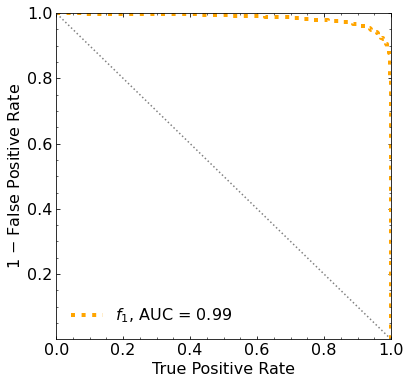

Classification score:


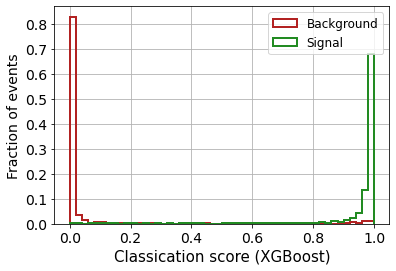


 ROC-AUC =  0.9857490144925032


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 296.9633343
 216.97101427 137.66785416  57.59197129 -30.0391283  -99.66676016]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 420.28601677 364.92951212 300.82703783
 231.

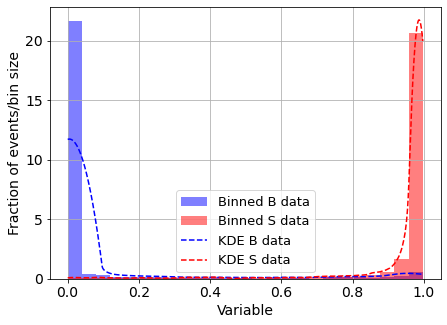

KDE Kernel:  epanechnikov
Background bandwidth:  0.0964296357589577
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



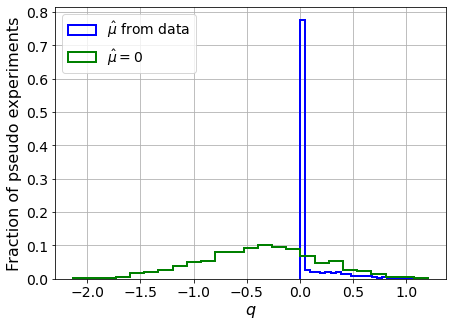

/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:1268: RuntimeWarning: divide by zero encountered in double_scalars
  Z_MLL_std = np.std(q_muhat_MLL) / (2.*Z_MLL)


muhat mean:  3.4225394902756645
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.594873896798007
std Z_bins mu=0:  0.4694609293182029

--------

B_expected:  643
S_expected:  2



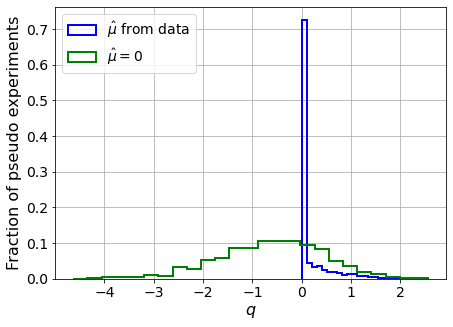

muhat mean:  1.7465843996613193
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.7494523248919209
std Z_bins mu=0:  0.7222441292094393

--------

B_expected:  643
S_expected:  4



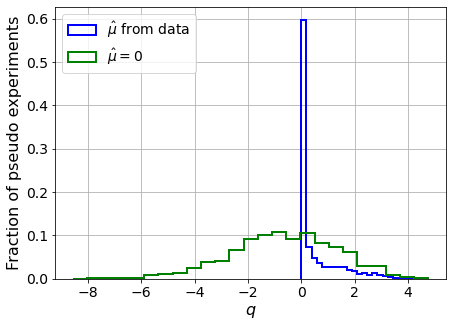

muhat mean:  0.8498446169723779
Z_bins:  0.15277743088469894
std Z_bins:  2.7227590877283454
Z_bins mu=0:  0.799672829654485
std Z_bins mu=0:  1.2439535468244296

--------

B_expected:  643
S_expected:  9



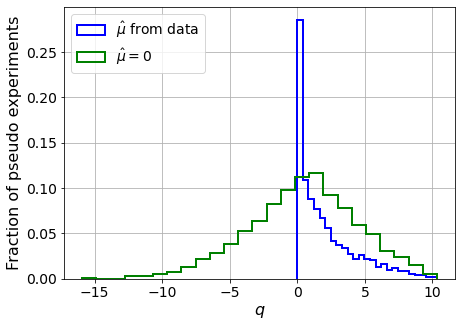

muhat mean:  0.4053297394640952
Z_bins:  1.154098072919584
std Z_bins:  0.9709633784710516
Z_bins mu=0:  0.8007324789140274
std Z_bins mu=0:  2.520504081683488

--------

B_expected:  643
S_expected:  18



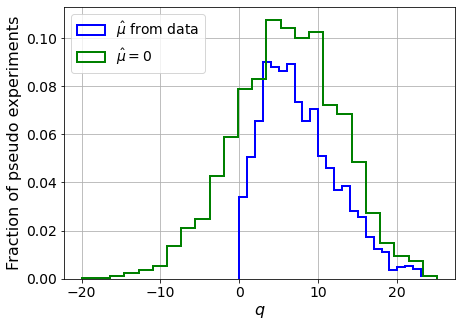

muhat mean:  0.20349566509616834
Z_bins:  2.647617336109225
std Z_bins:  0.8974850627291289
Z_bins mu=0:  2.49880029040052
std Z_bins mu=0:  1.3414129131456378

--------

B_expected:  643
S_expected:  40



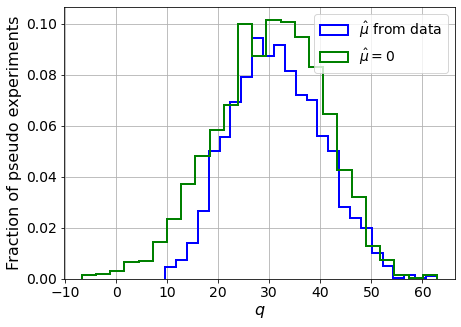

muhat mean:  0.08186764623185587
Z_bins:  5.5782850971148905
std Z_bins:  0.7876836891557857
Z_bins mu=0:  5.525017274237678
std Z_bins mu=0:  0.9648391591896439

--------

B_expected:  643
S_expected:  85



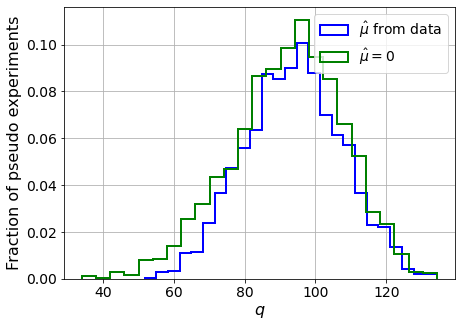

muhat mean:  0.040244180026827905
Z_bins:  9.695973896653857
std Z_bins:  0.707957466358628
Z_bins mu=0:  9.667757998703511
std Z_bins mu=0:  0.8145198528322641

--------

B_expected:  643
S_expected:  184



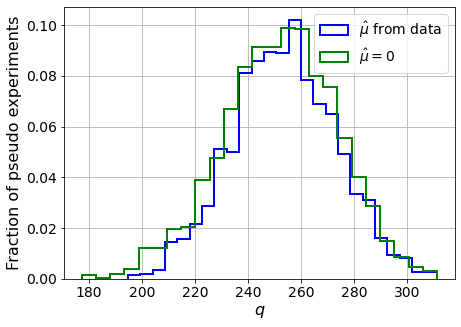

muhat mean:  0.01912776937754031
Z_bins:  15.924205849869425
std Z_bins:  0.6129769286378248
Z_bins mu=0:  15.899875324767686
std Z_bins mu=0:  0.6750131924923227

--------

B_expected:  643
S_expected:  396



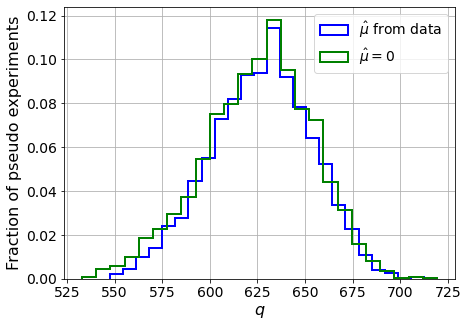

muhat mean:  0.008972715997235415
Z_bins:  25.071679523680732
std Z_bins:  0.5289631855602104
Z_bins mu=0:  25.0557448756773
std Z_bins mu=0:  0.5697465766620651

--------

B_expected:  643
S_expected:  854



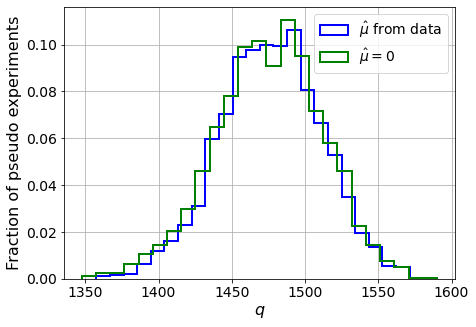

muhat mean:  0.004174030921546772
Z_bins:  38.42980475737922
std Z_bins:  0.4512454256356233
Z_bins mu=0:  38.42058998330661
std Z_bins mu=0:  0.47670289096292423

--------


 FINAL RESULT:

[[0.0, inf, 3.4225394902756645, 0.594873896798007, 0.4694609293182029], [0.0, inf, 1.7465843996613193, 0.7494523248919209, 0.7222441292094393], [0.15277743088469894, 2.7227590877283454, 0.8498446169723779, 0.799672829654485, 1.2439535468244296], [1.154098072919584, 0.9709633784710516, 0.4053297394640952, 0.8007324789140274, 2.520504081683488], [2.647617336109225, 0.8974850627291289, 0.20349566509616834, 2.49880029040052, 1.3414129131456378], [5.5782850971148905, 0.7876836891557857, 0.08186764623185587, 5.525017274237678, 0.9648391591896439], [9.695973896653857, 0.707957466358628, 0.040244180026827905, 9.667757998703511, 0.8145198528322641], [15.924205849869425, 0.6129769286378248, 0.01912776937754031, 15.899875324767686, 0.6750131924923227], [25.071679523680732, 0.5289631855602104, 0.00897271599723

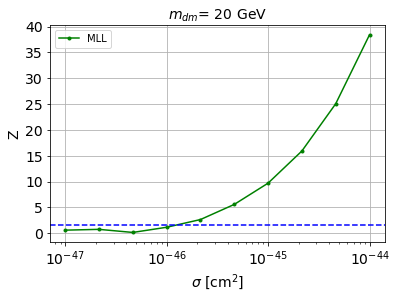


cross_MLL_164:  1.338959377424501e-46
cross_MLL_164_up:  2.3715043920489203e-47
cross_MLL_164_down:  2.064298401297877e-46

#########################


#########################

mDM =  35 GeV


max_pS1_both lenght:  152

X_mon1_train :  (4999, 152)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 152)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 152)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35218)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35218)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35218)

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68608	validation_1-logloss:0.68683
[1]	validation_0-logloss:0.67911	validation_1-logloss:0.68055
[2]	validation_0-logloss:0.67227	validation_1-logloss:0.67445
[3]	validation_0-logloss:0.66560	validation_1-logloss:0.66849
[4]	validation_0-logloss:0.65903	validation_1-logloss:0.66265
[5]	validation_0-logloss:0.65260	validation_1-logloss:0.65683
[6]	validation_0-logloss:0.64631	validation_1-logloss:0.65113
[7]	validation_0-logloss:0.64010	validation_1-logloss:0.64561
[8]	validation_0-logloss:0.63396	validation_1-logloss:0.64017
[9]	validation_0-logloss:0.62793	validation_1-logloss:0.63481
[10]	validation_0-logloss:0.62201	validation_1-logloss:0.62954
[11]	validation_0-logloss:0.61620	validation_1-logloss:0.62436
[12]	validation_0-logloss:0.61048	validation_1-logloss:0.61926
[13]	validation_0-logloss:0.60488	validation_1-logloss:0.61432
[14]	validation_0-logloss:0.59934	validation_1-logloss:0.60941
[15]	validation_0-logloss:0.59385	validation_1-logloss:0.60464
[1

[130]	validation_0-logloss:0.26728	validation_1-logloss:0.32887
[131]	validation_0-logloss:0.26585	validation_1-logloss:0.32782
[132]	validation_0-logloss:0.26446	validation_1-logloss:0.32685
[133]	validation_0-logloss:0.26300	validation_1-logloss:0.32578
[134]	validation_0-logloss:0.26165	validation_1-logloss:0.32490
[135]	validation_0-logloss:0.26023	validation_1-logloss:0.32382
[136]	validation_0-logloss:0.25887	validation_1-logloss:0.32282
[137]	validation_0-logloss:0.25752	validation_1-logloss:0.32182
[138]	validation_0-logloss:0.25624	validation_1-logloss:0.32086
[139]	validation_0-logloss:0.25494	validation_1-logloss:0.32000
[140]	validation_0-logloss:0.25366	validation_1-logloss:0.31910
[141]	validation_0-logloss:0.25237	validation_1-logloss:0.31821
[142]	validation_0-logloss:0.25106	validation_1-logloss:0.31723
[143]	validation_0-logloss:0.24977	validation_1-logloss:0.31635
[144]	validation_0-logloss:0.24854	validation_1-logloss:0.31544
[145]	validation_0-logloss:0.24730	valid

[259]	validation_0-logloss:0.15225	validation_1-logloss:0.25428
[260]	validation_0-logloss:0.15172	validation_1-logloss:0.25394
[261]	validation_0-logloss:0.15121	validation_1-logloss:0.25368
[262]	validation_0-logloss:0.15063	validation_1-logloss:0.25332
[263]	validation_0-logloss:0.15014	validation_1-logloss:0.25305
[264]	validation_0-logloss:0.14960	validation_1-logloss:0.25269
[265]	validation_0-logloss:0.14904	validation_1-logloss:0.25243
[266]	validation_0-logloss:0.14852	validation_1-logloss:0.25210
[267]	validation_0-logloss:0.14804	validation_1-logloss:0.25179
[268]	validation_0-logloss:0.14748	validation_1-logloss:0.25149
[269]	validation_0-logloss:0.14694	validation_1-logloss:0.25116
[270]	validation_0-logloss:0.14642	validation_1-logloss:0.25097
[271]	validation_0-logloss:0.14591	validation_1-logloss:0.25068
[272]	validation_0-logloss:0.14538	validation_1-logloss:0.25042
[273]	validation_0-logloss:0.14488	validation_1-logloss:0.25011
[274]	validation_0-logloss:0.14436	valid

[388]	validation_0-logloss:0.10408	validation_1-logloss:0.23084
[389]	validation_0-logloss:0.10388	validation_1-logloss:0.23081
[390]	validation_0-logloss:0.10358	validation_1-logloss:0.23075
[391]	validation_0-logloss:0.10337	validation_1-logloss:0.23064
[392]	validation_0-logloss:0.10318	validation_1-logloss:0.23061
[393]	validation_0-logloss:0.10291	validation_1-logloss:0.23050
[394]	validation_0-logloss:0.10272	validation_1-logloss:0.23047
[395]	validation_0-logloss:0.10247	validation_1-logloss:0.23033
[396]	validation_0-logloss:0.10232	validation_1-logloss:0.23030
[397]	validation_0-logloss:0.10190	validation_1-logloss:0.23014
[398]	validation_0-logloss:0.10165	validation_1-logloss:0.22999
[399]	validation_0-logloss:0.10139	validation_1-logloss:0.22995
[400]	validation_0-logloss:0.10120	validation_1-logloss:0.22991
[401]	validation_0-logloss:0.10100	validation_1-logloss:0.22994
[402]	validation_0-logloss:0.10064	validation_1-logloss:0.22976
[403]	validation_0-logloss:0.10050	valid

[517]	validation_0-logloss:0.07784	validation_1-logloss:0.22390
[518]	validation_0-logloss:0.07773	validation_1-logloss:0.22387
[519]	validation_0-logloss:0.07747	validation_1-logloss:0.22381
[520]	validation_0-logloss:0.07738	validation_1-logloss:0.22381
[521]	validation_0-logloss:0.07724	validation_1-logloss:0.22383
[522]	validation_0-logloss:0.07709	validation_1-logloss:0.22392
[523]	validation_0-logloss:0.07693	validation_1-logloss:0.22392
[524]	validation_0-logloss:0.07674	validation_1-logloss:0.22392
[525]	validation_0-logloss:0.07665	validation_1-logloss:0.22393
[526]	validation_0-logloss:0.07641	validation_1-logloss:0.22388
[527]	validation_0-logloss:0.07625	validation_1-logloss:0.22384
[528]	validation_0-logloss:0.07614	validation_1-logloss:0.22377
[529]	validation_0-logloss:0.07600	validation_1-logloss:0.22374
[530]	validation_0-logloss:0.07584	validation_1-logloss:0.22373
[531]	validation_0-logloss:0.07568	validation_1-logloss:0.22371
[532]	validation_0-logloss:0.07559	valid

[646]	validation_0-logloss:0.05886	validation_1-logloss:0.22239
[647]	validation_0-logloss:0.05869	validation_1-logloss:0.22243
[648]	validation_0-logloss:0.05851	validation_1-logloss:0.22247
[649]	validation_0-logloss:0.05840	validation_1-logloss:0.22246
[650]	validation_0-logloss:0.05829	validation_1-logloss:0.22245
[651]	validation_0-logloss:0.05814	validation_1-logloss:0.22240
[652]	validation_0-logloss:0.05802	validation_1-logloss:0.22236
[653]	validation_0-logloss:0.05789	validation_1-logloss:0.22234
[654]	validation_0-logloss:0.05775	validation_1-logloss:0.22229
[655]	validation_0-logloss:0.05759	validation_1-logloss:0.22235
[656]	validation_0-logloss:0.05742	validation_1-logloss:0.22236
[657]	validation_0-logloss:0.05730	validation_1-logloss:0.22237
[658]	validation_0-logloss:0.05720	validation_1-logloss:0.22239
[659]	validation_0-logloss:0.05709	validation_1-logloss:0.22235
[660]	validation_0-logloss:0.05697	validation_1-logloss:0.22241
[661]	validation_0-logloss:0.05688	valid

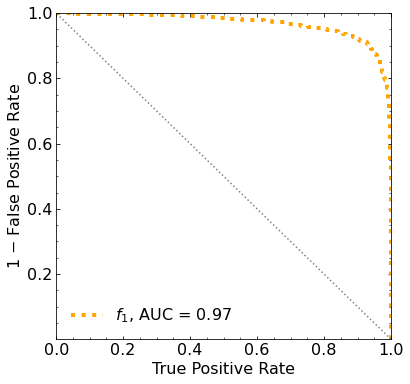

Classification score:


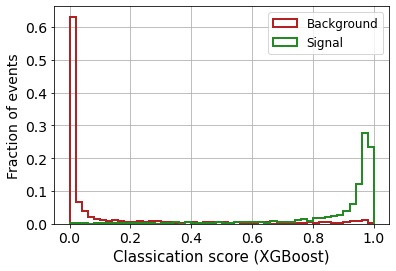


 ROC-AUC =  0.9676805371987687


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf          -inf  311.01069775  263.34118144  209.76384985
  149.65334843   87.6881789    22.78180955  -41.84448772 -104.13049967]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 292.0434668  272.60018107 244.345139

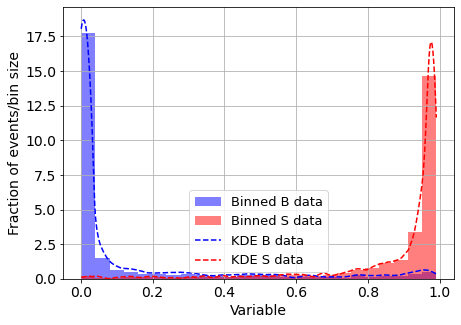

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



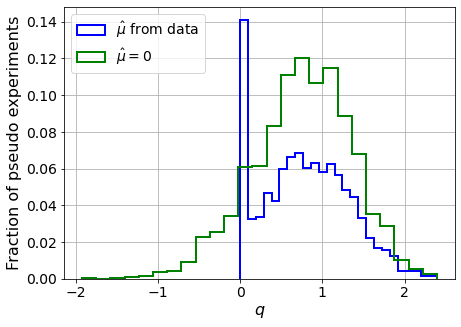

muhat mean:  -2.9910005020344825
Z_bins:  0.8844682653110044
std Z_bins:  0.29707737267272616
Z_bins mu=0:  0.8844682653110044
std Z_bins mu=0:  0.33865818394261604

--------

B_expected:  643
S_expected:  4



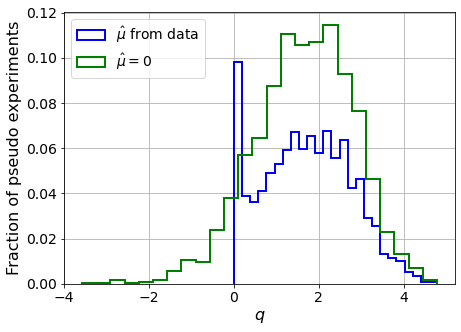

muhat mean:  -1.4382077314656971
Z_bins:  1.3107028201528355
std Z_bins:  0.3972050883768098
Z_bins mu=0:  1.3107028201528355
std Z_bins mu=0:  0.44043987937180995

--------

B_expected:  643
S_expected:  8



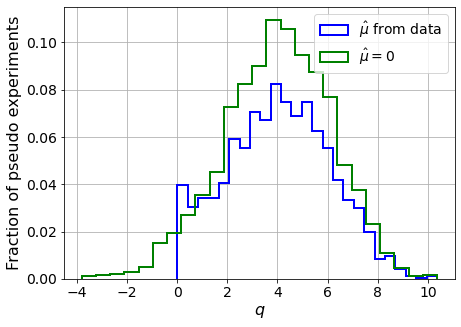

muhat mean:  -0.7810678254713553
Z_bins:  2.0202719835944736
std Z_bins:  0.5020908368174641
Z_bins mu=0:  2.0202719835944736
std Z_bins mu=0:  0.5310131335082061

--------

B_expected:  643
S_expected:  18



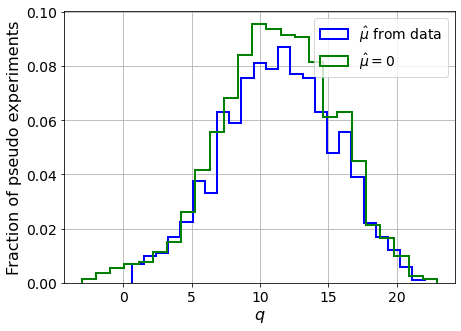

muhat mean:  -0.33233889264983185
Z_bins:  3.3706450076477616
std Z_bins:  0.6068740482115434
Z_bins mu=0:  3.3706450076477616
std Z_bins mu=0:  0.6286204160054323

--------

B_expected:  643
S_expected:  39



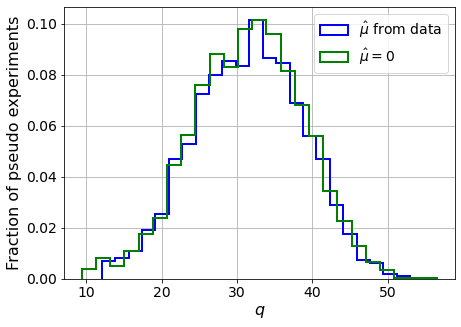

muhat mean:  -0.15085074744663676
Z_bins:  5.636405087566737
std Z_bins:  0.6374766630952453
Z_bins mu=0:  5.636405087566737
std Z_bins mu=0:  0.6474687541076648

--------

B_expected:  643
S_expected:  83



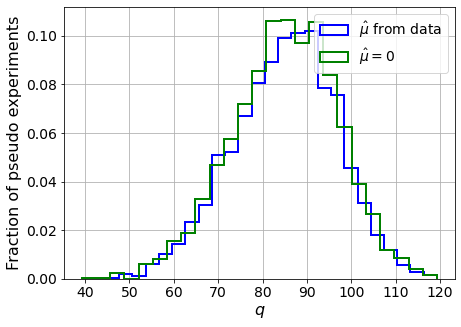

muhat mean:  -0.06923017174415128
Z_bins:  9.262259947740011
std Z_bins:  0.6304382769505633
Z_bins mu=0:  9.262259947740011
std Z_bins mu=0:  0.6382051230732674

--------

B_expected:  643
S_expected:  179



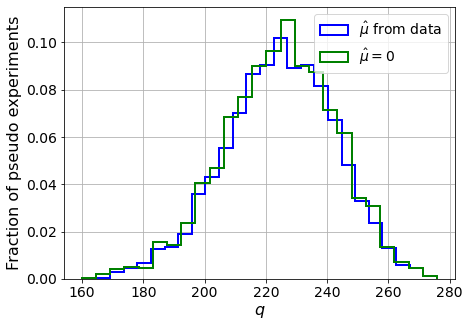

muhat mean:  -0.033561439193767854
Z_bins:  15.012150718089144
std Z_bins:  0.6015389341228197
Z_bins mu=0:  15.012150718089144
std Z_bins mu=0:  0.6061955066868785

--------

B_expected:  643
S_expected:  385



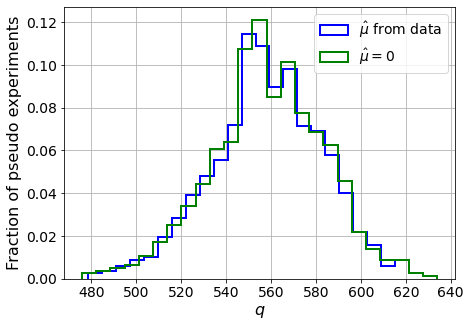

muhat mean:  -0.014687813563039803
Z_bins:  23.62100372282465
std Z_bins:  0.5318216149663151
Z_bins mu=0:  23.62100372282465
std Z_bins mu=0:  0.5347142808569357

--------

B_expected:  643
S_expected:  830



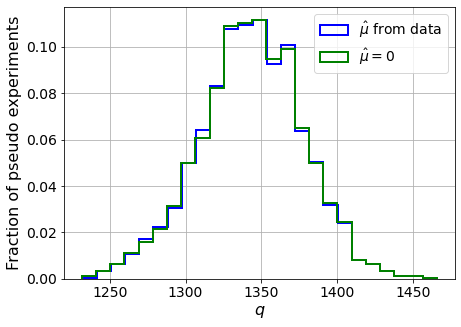

muhat mean:  -0.007440891193489254
Z_bins:  36.657806373616665
std Z_bins:  0.46599442586121587
Z_bins mu=0:  36.657806373616665
std Z_bins mu=0:  0.46738096409541646

--------

B_expected:  643
S_expected:  1787



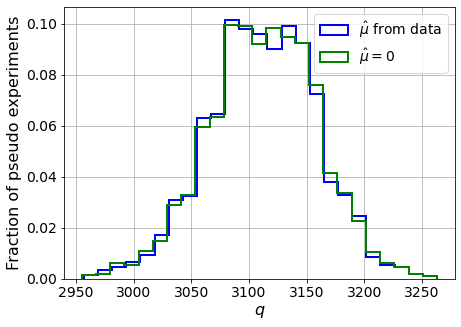

muhat mean:  -0.003216452116283258
Z_bins:  55.7964047282152
std Z_bins:  0.4194422532577374
Z_bins mu=0:  55.7964047282152
std Z_bins mu=0:  0.4205047829783967

--------


 FINAL RESULT:

[[0.8844682653110044, 0.29707737267272616, -2.9910005020344825, 0.8844682653110044, 0.33865818394261604], [1.3107028201528355, 0.3972050883768098, -1.4382077314656971, 1.3107028201528355, 0.44043987937180995], [2.0202719835944736, 0.5020908368174641, -0.7810678254713553, 2.0202719835944736, 0.5310131335082061], [3.3706450076477616, 0.6068740482115434, -0.33233889264983185, 3.3706450076477616, 0.6286204160054323], [5.636405087566737, 0.6374766630952453, -0.15085074744663676, 5.636405087566737, 0.6474687541076648], [9.262259947740011, 0.6304382769505633, -0.06923017174415128, 9.262259947740011, 0.6382051230732674], [15.012150718089144, 0.6015389341228197, -0.033561439193767854, 15.012150718089144, 0.6061955066868785], [23.62100372282465, 0.5318216149663151, -0.014687813563039803, 23.62100372282465, 0.5

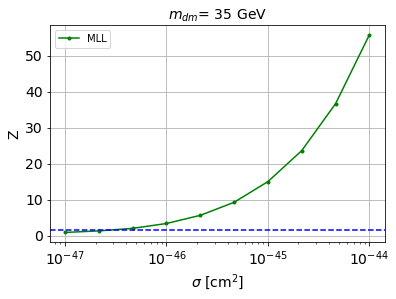


cross_MLL_164:  3.2748218381230716e-47
cross_MLL_164_up:  1.983291142432953e-47
cross_MLL_164_down:  5.137764107295417e-47

#########################


#########################

mDM =  50 GeV


max_pS1_both lenght:  152

X_mon1_train :  (4999, 152)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 152)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 152)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35218)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35218)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35218)

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68654	validation_1-logloss:0.68726
[1]	validation_0-logloss:0.68008	validation_1-logloss:0.68143
[2]	validation_0-logloss:0.67373	validation_1-logloss:0.67569
[3]	validation_0-logloss:0.66745	validation_1-logloss:0.66995
[4]	validation_0-logloss:0.66141	validation_1-logloss:0.66463
[5]	validation_0-logloss:0.65536	validation_1-logloss:0.65923
[6]	validation_0-logloss:0.64935	validation_1-logloss:0.65406
[7]	validation_0-logloss:0.64350	validation_1-logloss:0.64876
[8]	validation_0-logloss:0.63770	validation_1-logloss:0.64374
[9]	validation_0-logloss:0.63215	validation_1-logloss:0.63874
[10]	validation_0-logloss:0.62656	validation_1-logloss:0.63394
[11]	validation_0-logloss:0.62110	validation_1-logloss:0.62902
[12]	validation_0-logloss:0.61580	validation_1-logloss:0.62430
[13]	validation_0-logloss:0.61050	validation_1-logloss:0.61970
[14]	validation_0-logloss:0.60533	validation_1-logloss:0.61522
[15]	validation_0-logloss:0.60029	validation_1-logloss:0.61076
[1

[130]	validation_0-logloss:0.29386	validation_1-logloss:0.36165
[131]	validation_0-logloss:0.29244	validation_1-logloss:0.36065
[132]	validation_0-logloss:0.29105	validation_1-logloss:0.35956
[133]	validation_0-logloss:0.28970	validation_1-logloss:0.35857
[134]	validation_0-logloss:0.28839	validation_1-logloss:0.35764
[135]	validation_0-logloss:0.28705	validation_1-logloss:0.35668
[136]	validation_0-logloss:0.28580	validation_1-logloss:0.35575
[137]	validation_0-logloss:0.28445	validation_1-logloss:0.35483
[138]	validation_0-logloss:0.28314	validation_1-logloss:0.35394
[139]	validation_0-logloss:0.28184	validation_1-logloss:0.35296
[140]	validation_0-logloss:0.28060	validation_1-logloss:0.35212
[141]	validation_0-logloss:0.27935	validation_1-logloss:0.35122
[142]	validation_0-logloss:0.27816	validation_1-logloss:0.35040
[143]	validation_0-logloss:0.27689	validation_1-logloss:0.34948
[144]	validation_0-logloss:0.27568	validation_1-logloss:0.34870
[145]	validation_0-logloss:0.27441	valid

[259]	validation_0-logloss:0.17922	validation_1-logloss:0.28892
[260]	validation_0-logloss:0.17866	validation_1-logloss:0.28863
[261]	validation_0-logloss:0.17818	validation_1-logloss:0.28833
[262]	validation_0-logloss:0.17760	validation_1-logloss:0.28807
[263]	validation_0-logloss:0.17704	validation_1-logloss:0.28775
[264]	validation_0-logloss:0.17646	validation_1-logloss:0.28741
[265]	validation_0-logloss:0.17585	validation_1-logloss:0.28714
[266]	validation_0-logloss:0.17523	validation_1-logloss:0.28677
[267]	validation_0-logloss:0.17478	validation_1-logloss:0.28648
[268]	validation_0-logloss:0.17422	validation_1-logloss:0.28622
[269]	validation_0-logloss:0.17362	validation_1-logloss:0.28586
[270]	validation_0-logloss:0.17300	validation_1-logloss:0.28559
[271]	validation_0-logloss:0.17244	validation_1-logloss:0.28530
[272]	validation_0-logloss:0.17184	validation_1-logloss:0.28502
[273]	validation_0-logloss:0.17140	validation_1-logloss:0.28479
[274]	validation_0-logloss:0.17080	valid

[388]	validation_0-logloss:0.12610	validation_1-logloss:0.26410
[389]	validation_0-logloss:0.12577	validation_1-logloss:0.26395
[390]	validation_0-logloss:0.12551	validation_1-logloss:0.26384
[391]	validation_0-logloss:0.12527	validation_1-logloss:0.26378
[392]	validation_0-logloss:0.12499	validation_1-logloss:0.26358
[393]	validation_0-logloss:0.12474	validation_1-logloss:0.26344
[394]	validation_0-logloss:0.12451	validation_1-logloss:0.26325
[395]	validation_0-logloss:0.12432	validation_1-logloss:0.26317
[396]	validation_0-logloss:0.12406	validation_1-logloss:0.26303
[397]	validation_0-logloss:0.12373	validation_1-logloss:0.26297
[398]	validation_0-logloss:0.12350	validation_1-logloss:0.26284
[399]	validation_0-logloss:0.12325	validation_1-logloss:0.26281
[400]	validation_0-logloss:0.12306	validation_1-logloss:0.26272
[401]	validation_0-logloss:0.12277	validation_1-logloss:0.26258
[402]	validation_0-logloss:0.12255	validation_1-logloss:0.26243
[403]	validation_0-logloss:0.12218	valid

[517]	validation_0-logloss:0.09665	validation_1-logloss:0.25394
[518]	validation_0-logloss:0.09643	validation_1-logloss:0.25390
[519]	validation_0-logloss:0.09624	validation_1-logloss:0.25387
[520]	validation_0-logloss:0.09596	validation_1-logloss:0.25381
[521]	validation_0-logloss:0.09581	validation_1-logloss:0.25379
[522]	validation_0-logloss:0.09555	validation_1-logloss:0.25372
[523]	validation_0-logloss:0.09533	validation_1-logloss:0.25372
[524]	validation_0-logloss:0.09505	validation_1-logloss:0.25371
[525]	validation_0-logloss:0.09489	validation_1-logloss:0.25369
[526]	validation_0-logloss:0.09466	validation_1-logloss:0.25366
[527]	validation_0-logloss:0.09443	validation_1-logloss:0.25360
[528]	validation_0-logloss:0.09434	validation_1-logloss:0.25357
[529]	validation_0-logloss:0.09421	validation_1-logloss:0.25350
[530]	validation_0-logloss:0.09393	validation_1-logloss:0.25349
[531]	validation_0-logloss:0.09365	validation_1-logloss:0.25344
[532]	validation_0-logloss:0.09344	valid

[646]	validation_0-logloss:0.07498	validation_1-logloss:0.25004
[647]	validation_0-logloss:0.07485	validation_1-logloss:0.24998
[648]	validation_0-logloss:0.07472	validation_1-logloss:0.24996
[649]	validation_0-logloss:0.07457	validation_1-logloss:0.24993
[650]	validation_0-logloss:0.07445	validation_1-logloss:0.24996
[651]	validation_0-logloss:0.07430	validation_1-logloss:0.24993
[652]	validation_0-logloss:0.07415	validation_1-logloss:0.24993
[653]	validation_0-logloss:0.07403	validation_1-logloss:0.24987
[654]	validation_0-logloss:0.07388	validation_1-logloss:0.24977
[655]	validation_0-logloss:0.07374	validation_1-logloss:0.24980
[656]	validation_0-logloss:0.07361	validation_1-logloss:0.24980
[657]	validation_0-logloss:0.07350	validation_1-logloss:0.24980
[658]	validation_0-logloss:0.07337	validation_1-logloss:0.24979
[659]	validation_0-logloss:0.07328	validation_1-logloss:0.24977
[660]	validation_0-logloss:0.07316	validation_1-logloss:0.24977
[661]	validation_0-logloss:0.07304	valid

[775]	validation_0-logloss:0.06135	validation_1-logloss:0.24877
[776]	validation_0-logloss:0.06126	validation_1-logloss:0.24872
[777]	validation_0-logloss:0.06117	validation_1-logloss:0.24868
[778]	validation_0-logloss:0.06106	validation_1-logloss:0.24867
[779]	validation_0-logloss:0.06100	validation_1-logloss:0.24871
[780]	validation_0-logloss:0.06090	validation_1-logloss:0.24872
[781]	validation_0-logloss:0.06084	validation_1-logloss:0.24869
[782]	validation_0-logloss:0.06077	validation_1-logloss:0.24868
[783]	validation_0-logloss:0.06074	validation_1-logloss:0.24873
[784]	validation_0-logloss:0.06063	validation_1-logloss:0.24873
[785]	validation_0-logloss:0.06054	validation_1-logloss:0.24868
[786]	validation_0-logloss:0.06047	validation_1-logloss:0.24867
[787]	validation_0-logloss:0.06040	validation_1-logloss:0.24867
[788]	validation_0-logloss:0.06030	validation_1-logloss:0.24862
[789]	validation_0-logloss:0.06021	validation_1-logloss:0.24864
[790]	validation_0-logloss:0.06011	valid

[904]	validation_0-logloss:0.05121	validation_1-logloss:0.24795
[905]	validation_0-logloss:0.05115	validation_1-logloss:0.24797
[906]	validation_0-logloss:0.05105	validation_1-logloss:0.24794
[907]	validation_0-logloss:0.05097	validation_1-logloss:0.24786
[908]	validation_0-logloss:0.05091	validation_1-logloss:0.24780
[909]	validation_0-logloss:0.05087	validation_1-logloss:0.24779
[910]	validation_0-logloss:0.05083	validation_1-logloss:0.24780
[911]	validation_0-logloss:0.05075	validation_1-logloss:0.24783
[912]	validation_0-logloss:0.05068	validation_1-logloss:0.24776
[913]	validation_0-logloss:0.05059	validation_1-logloss:0.24769
[914]	validation_0-logloss:0.05049	validation_1-logloss:0.24769
[915]	validation_0-logloss:0.05045	validation_1-logloss:0.24766
[916]	validation_0-logloss:0.05038	validation_1-logloss:0.24771
[917]	validation_0-logloss:0.05033	validation_1-logloss:0.24773
[918]	validation_0-logloss:0.05022	validation_1-logloss:0.24772
[919]	validation_0-logloss:0.05015	valid

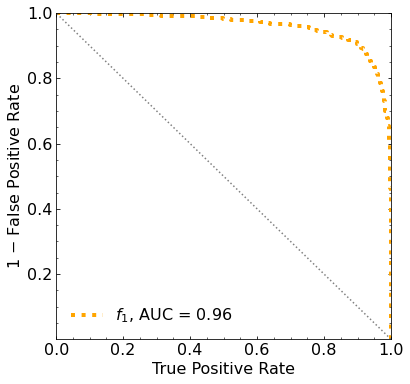

Classification score:


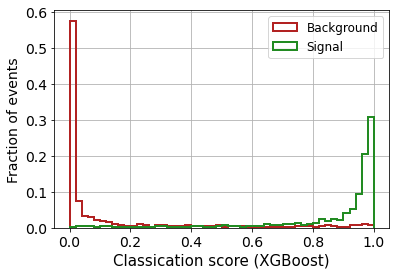


 ROC-AUC =  0.9603291839796362


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf          -inf  273.96893558  231.77214902  184.99856076
  135.25124039   78.97444575   19.16626546  -44.32237888 -104.55888761]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 225.53527331 202.934630

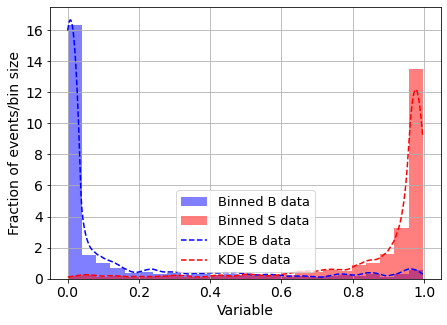

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



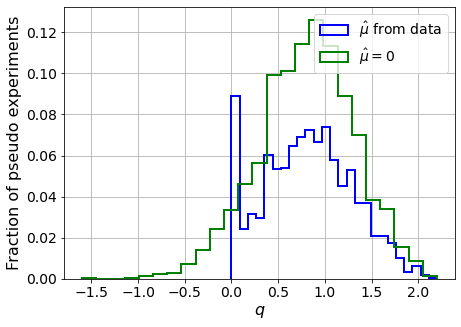

muhat mean:  -4.316983870689197
Z_bins:  0.909907549298821
std Z_bins:  0.26087577679930335
Z_bins mu=0:  0.909907549298821
std Z_bins mu=0:  0.28241060823257724

--------

B_expected:  643
S_expected:  4



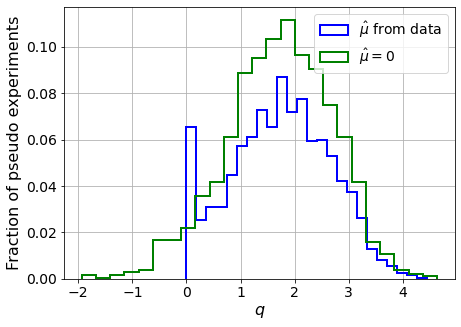

muhat mean:  -2.123647234397866
Z_bins:  1.3279408292675665
std Z_bins:  0.345042367242648
Z_bins mu=0:  1.3279408292675665
std Z_bins mu=0:  0.3653114883389065

--------

B_expected:  643
S_expected:  9



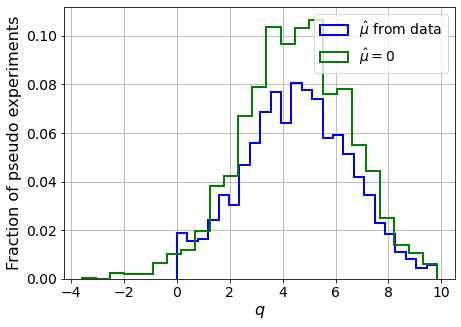

muhat mean:  -0.9765852044226329
Z_bins:  2.1309858422555124
std Z_bins:  0.4668245348556195
Z_bins mu=0:  2.1309858422555124
std Z_bins mu=0:  0.4823937561394661

--------

B_expected:  643
S_expected:  19



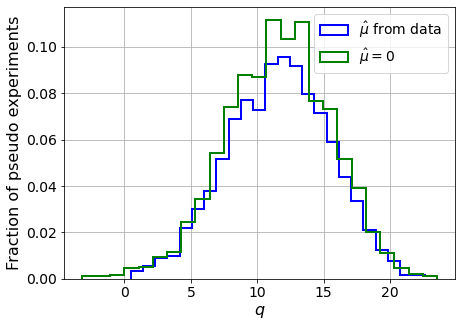

muhat mean:  -0.4640701190993574
Z_bins:  3.418551577146369
std Z_bins:  0.5651037417906132
Z_bins mu=0:  3.418551577146369
std Z_bins mu=0:  0.5757249590628772

--------

B_expected:  643
S_expected:  41



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


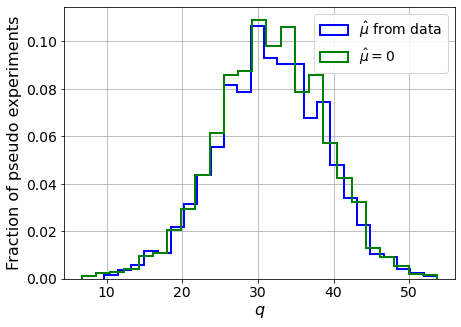

muhat mean:  -0.2135276121535406
Z_bins:  5.630008252338733
std Z_bins:  0.6272081284615999
Z_bins mu=0:  5.630008252338733
std Z_bins mu=0:  0.6329510020114166

--------

B_expected:  643
S_expected:  89



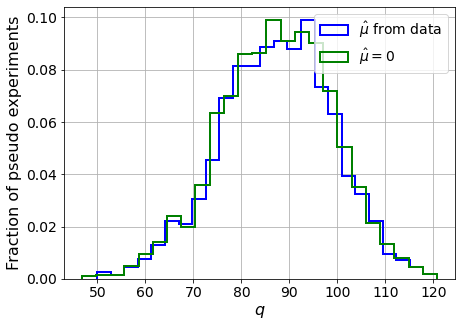

muhat mean:  -0.09541614035069182
Z_bins:  9.365199477527115
std Z_bins:  0.6221751299915773
Z_bins mu=0:  9.365199477527115
std Z_bins mu=0:  0.6253036286948032

--------

B_expected:  643
S_expected:  192



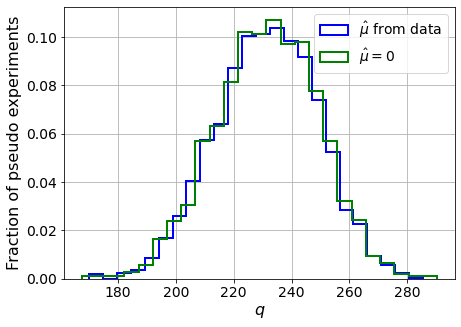

muhat mean:  -0.04587571765700983
Z_bins:  15.231844821857784
std Z_bins:  0.5785334711895911
Z_bins mu=0:  15.231844821857784
std Z_bins mu=0:  0.5799469816455688

--------

B_expected:  643
S_expected:  413



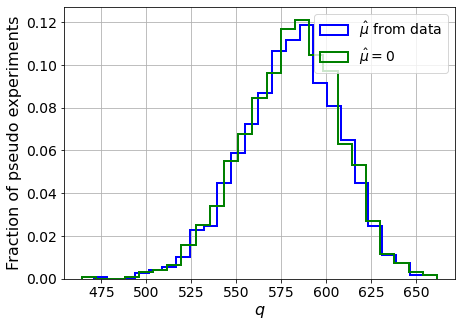

muhat mean:  -0.020541466665121796
Z_bins:  24.126845670991216
std Z_bins:  0.5635897845841003
Z_bins mu=0:  24.126845670991216
std Z_bins mu=0:  0.5658211431755034

--------

B_expected:  643
S_expected:  889



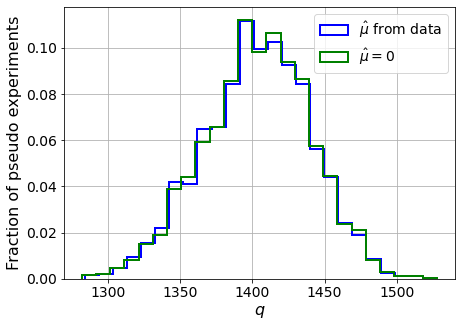

muhat mean:  -0.009698061087936156
Z_bins:  37.47945601097315
std Z_bins:  0.4915941530128769
Z_bins mu=0:  37.47945601097315
std Z_bins mu=0:  0.49240709299876606

--------

B_expected:  643
S_expected:  1915



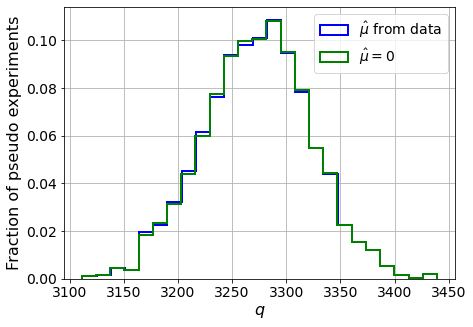

muhat mean:  -0.004411525446639057
Z_bins:  57.21975492327439
std Z_bins:  0.4314029759159209
Z_bins mu=0:  57.21975492327439
std Z_bins mu=0:  0.4318430265967151

--------


 FINAL RESULT:

[[0.909907549298821, 0.26087577679930335, -4.316983870689197, 0.909907549298821, 0.28241060823257724], [1.3279408292675665, 0.345042367242648, -2.123647234397866, 1.3279408292675665, 0.3653114883389065], [2.1309858422555124, 0.4668245348556195, -0.9765852044226329, 2.1309858422555124, 0.4823937561394661], [3.418551577146369, 0.5651037417906132, -0.4640701190993574, 3.418551577146369, 0.5757249590628772], [5.630008252338733, 0.6272081284615999, -0.2135276121535406, 5.630008252338733, 0.6329510020114166], [9.365199477527115, 0.6221751299915773, -0.09541614035069182, 9.365199477527115, 0.6253036286948032], [15.231844821857784, 0.5785334711895911, -0.04587571765700983, 15.231844821857784, 0.5799469816455688], [24.126845670991216, 0.5635897845841003, -0.020541466665121796, 24.126845670991216, 0.56582114

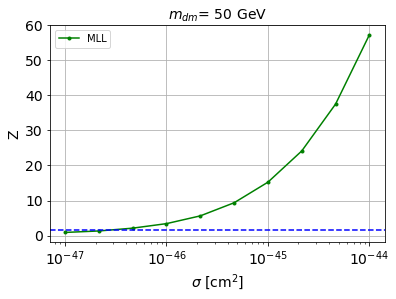


cross_MLL_164:  3.044829078965363e-47
cross_MLL_164_up:  2.0784785184784906e-47
cross_MLL_164_down:  4.546003665622695e-47

#########################


#########################

mDM =  100 GeV


max_pS1_both lenght:  153

X_mon1_train :  (4999, 153)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 153)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 153)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35219)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35219)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35219

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68705	validation_1-logloss:0.68796
[1]	validation_0-logloss:0.68112	validation_1-logloss:0.68290
[2]	validation_0-logloss:0.67526	validation_1-logloss:0.67789
[3]	validation_0-logloss:0.66955	validation_1-logloss:0.67295
[4]	validation_0-logloss:0.66395	validation_1-logloss:0.66826
[5]	validation_0-logloss:0.65849	validation_1-logloss:0.66353
[6]	validation_0-logloss:0.65318	validation_1-logloss:0.65885
[7]	validation_0-logloss:0.64770	validation_1-logloss:0.65424
[8]	validation_0-logloss:0.64258	validation_1-logloss:0.64975
[9]	validation_0-logloss:0.63743	validation_1-logloss:0.64543
[10]	validation_0-logloss:0.63251	validation_1-logloss:0.64103
[11]	validation_0-logloss:0.62734	validation_1-logloss:0.63659
[12]	validation_0-logloss:0.62239	validation_1-logloss:0.63243
[13]	validation_0-logloss:0.61776	validation_1-logloss:0.62826
[14]	validation_0-logloss:0.61276	validation_1-logloss:0.62408
[15]	validation_0-logloss:0.60827	validation_1-logloss:0.62014
[1

[130]	validation_0-logloss:0.31840	validation_1-logloss:0.38708
[131]	validation_0-logloss:0.31707	validation_1-logloss:0.38613
[132]	validation_0-logloss:0.31566	validation_1-logloss:0.38503
[133]	validation_0-logloss:0.31433	validation_1-logloss:0.38414
[134]	validation_0-logloss:0.31299	validation_1-logloss:0.38318
[135]	validation_0-logloss:0.31169	validation_1-logloss:0.38220
[136]	validation_0-logloss:0.31050	validation_1-logloss:0.38124
[137]	validation_0-logloss:0.30919	validation_1-logloss:0.38037
[138]	validation_0-logloss:0.30784	validation_1-logloss:0.37949
[139]	validation_0-logloss:0.30658	validation_1-logloss:0.37859
[140]	validation_0-logloss:0.30539	validation_1-logloss:0.37765
[141]	validation_0-logloss:0.30413	validation_1-logloss:0.37683
[142]	validation_0-logloss:0.30289	validation_1-logloss:0.37594
[143]	validation_0-logloss:0.30158	validation_1-logloss:0.37501
[144]	validation_0-logloss:0.30042	validation_1-logloss:0.37420
[145]	validation_0-logloss:0.29933	valid

[259]	validation_0-logloss:0.20149	validation_1-logloss:0.31295
[260]	validation_0-logloss:0.20092	validation_1-logloss:0.31266
[261]	validation_0-logloss:0.20037	validation_1-logloss:0.31234
[262]	validation_0-logloss:0.19986	validation_1-logloss:0.31200
[263]	validation_0-logloss:0.19923	validation_1-logloss:0.31163
[264]	validation_0-logloss:0.19868	validation_1-logloss:0.31141
[265]	validation_0-logloss:0.19816	validation_1-logloss:0.31108
[266]	validation_0-logloss:0.19754	validation_1-logloss:0.31079
[267]	validation_0-logloss:0.19699	validation_1-logloss:0.31056
[268]	validation_0-logloss:0.19630	validation_1-logloss:0.31026
[269]	validation_0-logloss:0.19569	validation_1-logloss:0.30995
[270]	validation_0-logloss:0.19524	validation_1-logloss:0.30974
[271]	validation_0-logloss:0.19462	validation_1-logloss:0.30947
[272]	validation_0-logloss:0.19412	validation_1-logloss:0.30913
[273]	validation_0-logloss:0.19350	validation_1-logloss:0.30879
[274]	validation_0-logloss:0.19295	valid

[388]	validation_0-logloss:0.14474	validation_1-logloss:0.28568
[389]	validation_0-logloss:0.14448	validation_1-logloss:0.28559
[390]	validation_0-logloss:0.14428	validation_1-logloss:0.28555
[391]	validation_0-logloss:0.14391	validation_1-logloss:0.28542
[392]	validation_0-logloss:0.14361	validation_1-logloss:0.28527
[393]	validation_0-logloss:0.14342	validation_1-logloss:0.28525
[394]	validation_0-logloss:0.14300	validation_1-logloss:0.28503
[395]	validation_0-logloss:0.14266	validation_1-logloss:0.28483
[396]	validation_0-logloss:0.14228	validation_1-logloss:0.28460
[397]	validation_0-logloss:0.14197	validation_1-logloss:0.28448
[398]	validation_0-logloss:0.14166	validation_1-logloss:0.28427
[399]	validation_0-logloss:0.14133	validation_1-logloss:0.28414
[400]	validation_0-logloss:0.14104	validation_1-logloss:0.28403
[401]	validation_0-logloss:0.14085	validation_1-logloss:0.28399
[402]	validation_0-logloss:0.14051	validation_1-logloss:0.28382
[403]	validation_0-logloss:0.14015	valid

[517]	validation_0-logloss:0.11058	validation_1-logloss:0.27387
[518]	validation_0-logloss:0.11035	validation_1-logloss:0.27376
[519]	validation_0-logloss:0.11008	validation_1-logloss:0.27370
[520]	validation_0-logloss:0.10991	validation_1-logloss:0.27368
[521]	validation_0-logloss:0.10972	validation_1-logloss:0.27359
[522]	validation_0-logloss:0.10951	validation_1-logloss:0.27357
[523]	validation_0-logloss:0.10931	validation_1-logloss:0.27356
[524]	validation_0-logloss:0.10907	validation_1-logloss:0.27354
[525]	validation_0-logloss:0.10892	validation_1-logloss:0.27347
[526]	validation_0-logloss:0.10863	validation_1-logloss:0.27335
[527]	validation_0-logloss:0.10843	validation_1-logloss:0.27326
[528]	validation_0-logloss:0.10825	validation_1-logloss:0.27320
[529]	validation_0-logloss:0.10804	validation_1-logloss:0.27303
[530]	validation_0-logloss:0.10783	validation_1-logloss:0.27301
[531]	validation_0-logloss:0.10763	validation_1-logloss:0.27291
[532]	validation_0-logloss:0.10733	valid

[646]	validation_0-logloss:0.08688	validation_1-logloss:0.26881
[647]	validation_0-logloss:0.08674	validation_1-logloss:0.26874
[648]	validation_0-logloss:0.08662	validation_1-logloss:0.26872
[649]	validation_0-logloss:0.08656	validation_1-logloss:0.26866
[650]	validation_0-logloss:0.08645	validation_1-logloss:0.26862
[651]	validation_0-logloss:0.08632	validation_1-logloss:0.26857
[652]	validation_0-logloss:0.08619	validation_1-logloss:0.26857
[653]	validation_0-logloss:0.08608	validation_1-logloss:0.26852
[654]	validation_0-logloss:0.08597	validation_1-logloss:0.26850
[655]	validation_0-logloss:0.08584	validation_1-logloss:0.26848
[656]	validation_0-logloss:0.08565	validation_1-logloss:0.26853
[657]	validation_0-logloss:0.08551	validation_1-logloss:0.26849
[658]	validation_0-logloss:0.08544	validation_1-logloss:0.26845
[659]	validation_0-logloss:0.08522	validation_1-logloss:0.26839
[660]	validation_0-logloss:0.08508	validation_1-logloss:0.26839
[661]	validation_0-logloss:0.08496	valid

[775]	validation_0-logloss:0.07106	validation_1-logloss:0.26632
[776]	validation_0-logloss:0.07099	validation_1-logloss:0.26625
[777]	validation_0-logloss:0.07085	validation_1-logloss:0.26625
[778]	validation_0-logloss:0.07074	validation_1-logloss:0.26626
[779]	validation_0-logloss:0.07067	validation_1-logloss:0.26624
[780]	validation_0-logloss:0.07056	validation_1-logloss:0.26620
[781]	validation_0-logloss:0.07050	validation_1-logloss:0.26619
[782]	validation_0-logloss:0.07042	validation_1-logloss:0.26619
[783]	validation_0-logloss:0.07036	validation_1-logloss:0.26624
[784]	validation_0-logloss:0.07025	validation_1-logloss:0.26625
[785]	validation_0-logloss:0.07021	validation_1-logloss:0.26623
[786]	validation_0-logloss:0.07010	validation_1-logloss:0.26619
[787]	validation_0-logloss:0.06999	validation_1-logloss:0.26620
[788]	validation_0-logloss:0.06991	validation_1-logloss:0.26617
[789]	validation_0-logloss:0.06982	validation_1-logloss:0.26609
[790]	validation_0-logloss:0.06970	valid

[904]	validation_0-logloss:0.06051	validation_1-logloss:0.26502
[905]	validation_0-logloss:0.06042	validation_1-logloss:0.26502
[906]	validation_0-logloss:0.06028	validation_1-logloss:0.26503
[907]	validation_0-logloss:0.06021	validation_1-logloss:0.26502
[908]	validation_0-logloss:0.06014	validation_1-logloss:0.26504
[909]	validation_0-logloss:0.06010	validation_1-logloss:0.26503
[910]	validation_0-logloss:0.06001	validation_1-logloss:0.26497
[911]	validation_0-logloss:0.05997	validation_1-logloss:0.26500
[912]	validation_0-logloss:0.05991	validation_1-logloss:0.26499
[913]	validation_0-logloss:0.05986	validation_1-logloss:0.26502
[914]	validation_0-logloss:0.05979	validation_1-logloss:0.26504
[915]	validation_0-logloss:0.05971	validation_1-logloss:0.26508
[916]	validation_0-logloss:0.05966	validation_1-logloss:0.26506
[917]	validation_0-logloss:0.05963	validation_1-logloss:0.26505
[918]	validation_0-logloss:0.05950	validation_1-logloss:0.26509
[919]	validation_0-logloss:0.05945	valid

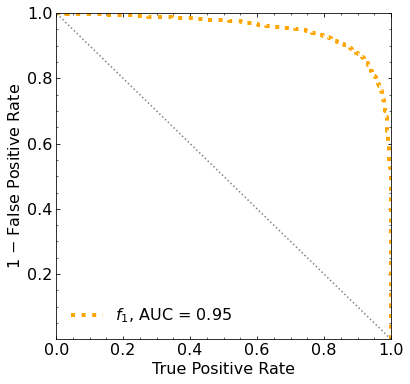

Classification score:


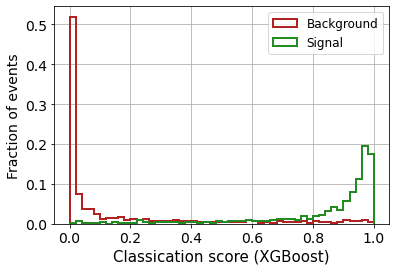


 ROC-AUC =  0.9517306490671873


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  287.9596744   267.96702338  238.45992135  202.26102508  162.09518331
  114.45051261   65.22123851   10.84310368  -48.00358895 -105.38484922]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 193.76760154 183.62572776 168.214154

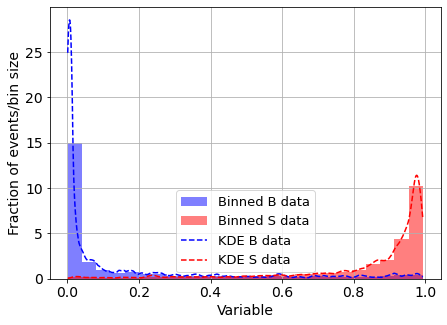

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



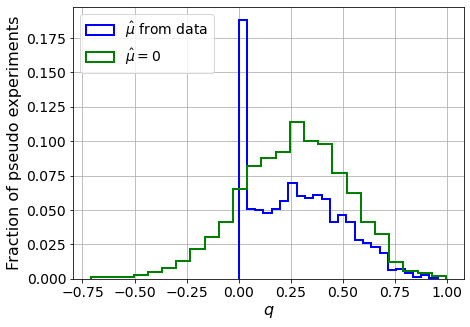

muhat mean:  -6.316043971560852
Z_bins:  0.5230991551686561
std Z_bins:  0.2078136690793246
Z_bins mu=0:  0.5230991551686561
std Z_bins mu=0:  0.2443476015786467

--------

B_expected:  643
S_expected:  3



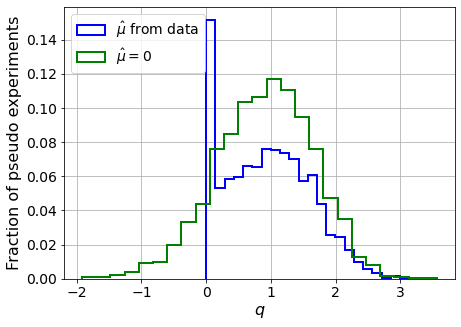

muhat mean:  -2.2233227112950082
Z_bins:  0.9707966548772882
std Z_bins:  0.338708798020159
Z_bins mu=0:  0.9707966548772882
std Z_bins mu=0:  0.3860024672472445

--------

B_expected:  643
S_expected:  6



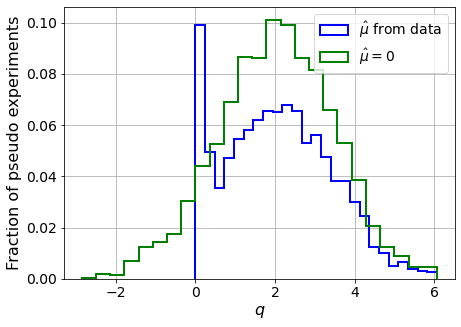

muhat mean:  -1.0498226380319342
Z_bins:  1.4328070280657428
std Z_bins:  0.4610365658420254
Z_bins mu=0:  1.4328070280657428
std Z_bins mu=0:  0.5063266865294597

--------

B_expected:  643
S_expected:  14



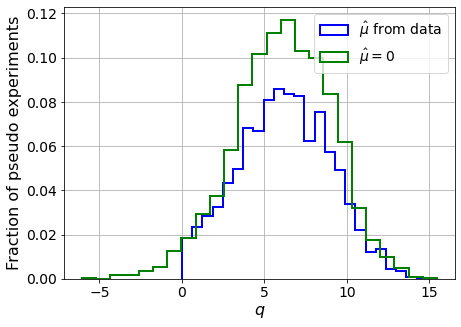

muhat mean:  -0.45849729974027364
Z_bins:  2.4902298368743985
std Z_bins:  0.5602108936021445
Z_bins mu=0:  2.4902298368743985
std Z_bins mu=0:  0.5902205649662892

--------

B_expected:  643
S_expected:  30



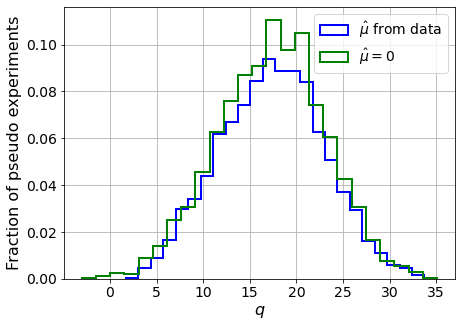

muhat mean:  -0.2149983127068753
Z_bins:  4.187892980886716
std Z_bins:  0.6681790198295904
Z_bins mu=0:  4.187892980886716
std Z_bins mu=0:  0.6862472332540779

--------

B_expected:  643
S_expected:  65



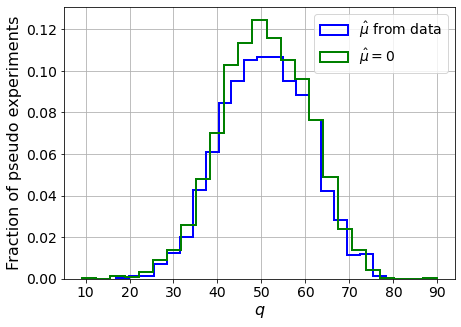

muhat mean:  -0.10356442778214343
Z_bins:  7.126180945870578
std Z_bins:  0.6922548692919632
Z_bins mu=0:  7.126180945870578
std Z_bins mu=0:  0.7031974600041226

--------

B_expected:  643
S_expected:  139



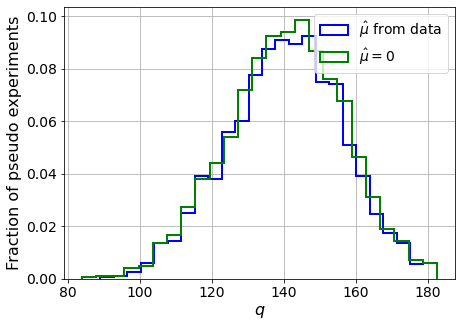

muhat mean:  -0.04744441783170035
Z_bins:  11.869285841008491
std Z_bins:  0.6711806162629292
Z_bins mu=0:  11.869285841008491
std Z_bins mu=0:  0.6776636236829707

--------

B_expected:  643
S_expected:  300



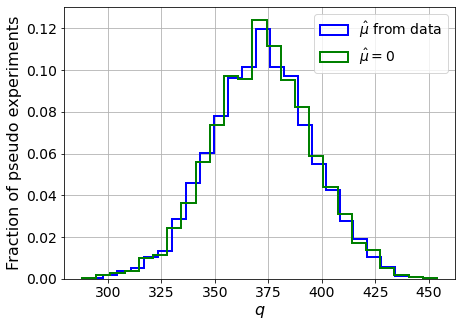

muhat mean:  -0.02146068179294716
Z_bins:  19.29179070593903
std Z_bins:  0.6103470231250798
Z_bins mu=0:  19.29179070593903
std Z_bins mu=0:  0.6141872280239793

--------

B_expected:  643
S_expected:  645



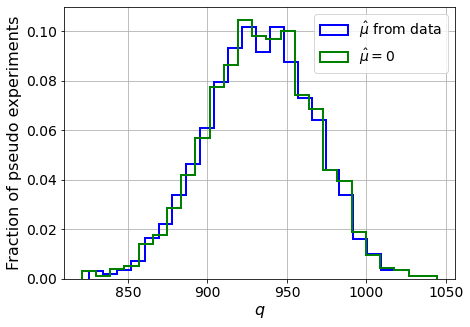

muhat mean:  -0.009920601016229557
Z_bins:  30.558574513694385
std Z_bins:  0.5534413664612408
Z_bins mu=0:  30.558574513694385
std Z_bins mu=0:  0.5560564631495944

--------

B_expected:  643
S_expected:  1390



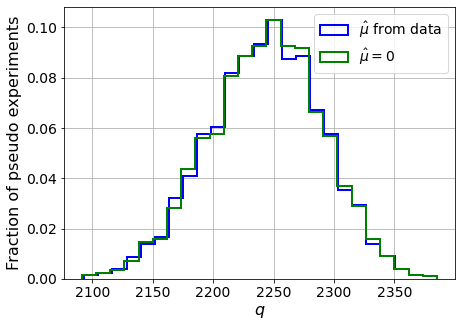

muhat mean:  -0.004696742671550575
Z_bins:  47.38172602602616
std Z_bins:  0.4919934415922001
Z_bins mu=0:  47.38172602602616
std Z_bins mu=0:  0.4934244297963282

--------


 FINAL RESULT:

[[0.5230991551686561, 0.2078136690793246, -6.316043971560852, 0.5230991551686561, 0.2443476015786467], [0.9707966548772882, 0.338708798020159, -2.2233227112950082, 0.9707966548772882, 0.3860024672472445], [1.4328070280657428, 0.4610365658420254, -1.0498226380319342, 1.4328070280657428, 0.5063266865294597], [2.4902298368743985, 0.5602108936021445, -0.45849729974027364, 2.4902298368743985, 0.5902205649662892], [4.187892980886716, 0.6681790198295904, -0.2149983127068753, 4.187892980886716, 0.6862472332540779], [7.126180945870578, 0.6922548692919632, -0.10356442778214343, 7.126180945870578, 0.7031974600041226], [11.869285841008491, 0.6711806162629292, -0.04744441783170035, 11.869285841008491, 0.6776636236829707], [19.29179070593903, 0.6103470231250798, -0.02146068179294716, 19.29179070593903, 0.6141872

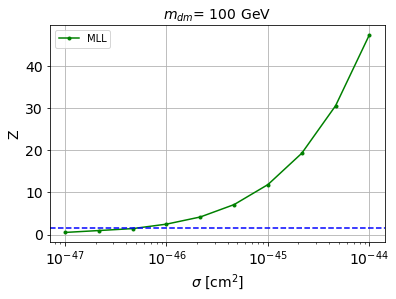


cross_MLL_164:  5.64354425422809e-47
cross_MLL_164_up:  3.5234182577312794e-47
cross_MLL_164_down:  8.273914437661324e-47

#########################


#########################

mDM =  200 GeV


max_pS1_both lenght:  157

X_mon1_train :  (4999, 157)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 157)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 157)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35223)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35223)
y_mon_val :  (1667,)
X_mon_test :  (3334, 35223)

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68733	validation_1-logloss:0.68844
[1]	validation_0-logloss:0.68170	validation_1-logloss:0.68379
[2]	validation_0-logloss:0.67618	validation_1-logloss:0.67923
[3]	validation_0-logloss:0.67069	validation_1-logloss:0.67478
[4]	validation_0-logloss:0.66529	validation_1-logloss:0.67026
[5]	validation_0-logloss:0.65998	validation_1-logloss:0.66587
[6]	validation_0-logloss:0.65479	validation_1-logloss:0.66172
[7]	validation_0-logloss:0.64966	validation_1-logloss:0.65753
[8]	validation_0-logloss:0.64466	validation_1-logloss:0.65329
[9]	validation_0-logloss:0.63980	validation_1-logloss:0.64923
[10]	validation_0-logloss:0.63505	validation_1-logloss:0.64532
[11]	validation_0-logloss:0.63022	validation_1-logloss:0.64140
[12]	validation_0-logloss:0.62549	validation_1-logloss:0.63738
[13]	validation_0-logloss:0.62086	validation_1-logloss:0.63352
[14]	validation_0-logloss:0.61634	validation_1-logloss:0.62964
[15]	validation_0-logloss:0.61182	validation_1-logloss:0.62588
[1

[130]	validation_0-logloss:0.33063	validation_1-logloss:0.40948
[131]	validation_0-logloss:0.32920	validation_1-logloss:0.40848
[132]	validation_0-logloss:0.32788	validation_1-logloss:0.40770
[133]	validation_0-logloss:0.32656	validation_1-logloss:0.40684
[134]	validation_0-logloss:0.32529	validation_1-logloss:0.40598
[135]	validation_0-logloss:0.32400	validation_1-logloss:0.40509
[136]	validation_0-logloss:0.32271	validation_1-logloss:0.40418
[137]	validation_0-logloss:0.32141	validation_1-logloss:0.40340
[138]	validation_0-logloss:0.32016	validation_1-logloss:0.40261
[139]	validation_0-logloss:0.31881	validation_1-logloss:0.40167
[140]	validation_0-logloss:0.31758	validation_1-logloss:0.40083
[141]	validation_0-logloss:0.31633	validation_1-logloss:0.40000
[142]	validation_0-logloss:0.31516	validation_1-logloss:0.39931
[143]	validation_0-logloss:0.31398	validation_1-logloss:0.39847
[144]	validation_0-logloss:0.31270	validation_1-logloss:0.39764
[145]	validation_0-logloss:0.31154	valid

[259]	validation_0-logloss:0.21537	validation_1-logloss:0.33860
[260]	validation_0-logloss:0.21479	validation_1-logloss:0.33832
[261]	validation_0-logloss:0.21405	validation_1-logloss:0.33790
[262]	validation_0-logloss:0.21340	validation_1-logloss:0.33760
[263]	validation_0-logloss:0.21272	validation_1-logloss:0.33730
[264]	validation_0-logloss:0.21210	validation_1-logloss:0.33699
[265]	validation_0-logloss:0.21147	validation_1-logloss:0.33667
[266]	validation_0-logloss:0.21083	validation_1-logloss:0.33630
[267]	validation_0-logloss:0.21028	validation_1-logloss:0.33594
[268]	validation_0-logloss:0.20963	validation_1-logloss:0.33565
[269]	validation_0-logloss:0.20909	validation_1-logloss:0.33530
[270]	validation_0-logloss:0.20844	validation_1-logloss:0.33491
[271]	validation_0-logloss:0.20783	validation_1-logloss:0.33462
[272]	validation_0-logloss:0.20714	validation_1-logloss:0.33426
[273]	validation_0-logloss:0.20650	validation_1-logloss:0.33395
[274]	validation_0-logloss:0.20590	valid

[388]	validation_0-logloss:0.15519	validation_1-logloss:0.30935
[389]	validation_0-logloss:0.15483	validation_1-logloss:0.30920
[390]	validation_0-logloss:0.15456	validation_1-logloss:0.30912
[391]	validation_0-logloss:0.15415	validation_1-logloss:0.30900
[392]	validation_0-logloss:0.15386	validation_1-logloss:0.30883
[393]	validation_0-logloss:0.15344	validation_1-logloss:0.30866
[394]	validation_0-logloss:0.15322	validation_1-logloss:0.30857
[395]	validation_0-logloss:0.15302	validation_1-logloss:0.30848
[396]	validation_0-logloss:0.15272	validation_1-logloss:0.30831
[397]	validation_0-logloss:0.15250	validation_1-logloss:0.30821
[398]	validation_0-logloss:0.15216	validation_1-logloss:0.30803
[399]	validation_0-logloss:0.15178	validation_1-logloss:0.30790
[400]	validation_0-logloss:0.15152	validation_1-logloss:0.30784
[401]	validation_0-logloss:0.15111	validation_1-logloss:0.30761
[402]	validation_0-logloss:0.15087	validation_1-logloss:0.30755
[403]	validation_0-logloss:0.15043	valid

[517]	validation_0-logloss:0.12216	validation_1-logloss:0.29597
[518]	validation_0-logloss:0.12198	validation_1-logloss:0.29591
[519]	validation_0-logloss:0.12184	validation_1-logloss:0.29589
[520]	validation_0-logloss:0.12153	validation_1-logloss:0.29581
[521]	validation_0-logloss:0.12125	validation_1-logloss:0.29574
[522]	validation_0-logloss:0.12107	validation_1-logloss:0.29566
[523]	validation_0-logloss:0.12088	validation_1-logloss:0.29563
[524]	validation_0-logloss:0.12076	validation_1-logloss:0.29562
[525]	validation_0-logloss:0.12059	validation_1-logloss:0.29558
[526]	validation_0-logloss:0.12045	validation_1-logloss:0.29553
[527]	validation_0-logloss:0.12031	validation_1-logloss:0.29550
[528]	validation_0-logloss:0.12012	validation_1-logloss:0.29539
[529]	validation_0-logloss:0.11993	validation_1-logloss:0.29537
[530]	validation_0-logloss:0.11977	validation_1-logloss:0.29529
[531]	validation_0-logloss:0.11957	validation_1-logloss:0.29522
[532]	validation_0-logloss:0.11943	valid

[646]	validation_0-logloss:0.10181	validation_1-logloss:0.29028
[647]	validation_0-logloss:0.10164	validation_1-logloss:0.29031
[648]	validation_0-logloss:0.10154	validation_1-logloss:0.29023
[649]	validation_0-logloss:0.10138	validation_1-logloss:0.29018
[650]	validation_0-logloss:0.10122	validation_1-logloss:0.29012
[651]	validation_0-logloss:0.10112	validation_1-logloss:0.29009
[652]	validation_0-logloss:0.10097	validation_1-logloss:0.29005
[653]	validation_0-logloss:0.10084	validation_1-logloss:0.29002
[654]	validation_0-logloss:0.10075	validation_1-logloss:0.28996
[655]	validation_0-logloss:0.10067	validation_1-logloss:0.28997
[656]	validation_0-logloss:0.10057	validation_1-logloss:0.28994
[657]	validation_0-logloss:0.10044	validation_1-logloss:0.28990
[658]	validation_0-logloss:0.10030	validation_1-logloss:0.28990
[659]	validation_0-logloss:0.10020	validation_1-logloss:0.28980
[660]	validation_0-logloss:0.10003	validation_1-logloss:0.28984
[661]	validation_0-logloss:0.09986	valid

[775]	validation_0-logloss:0.08797	validation_1-logloss:0.28736
[776]	validation_0-logloss:0.08787	validation_1-logloss:0.28735
[777]	validation_0-logloss:0.08775	validation_1-logloss:0.28736
[778]	validation_0-logloss:0.08768	validation_1-logloss:0.28737
[779]	validation_0-logloss:0.08755	validation_1-logloss:0.28736
[780]	validation_0-logloss:0.08747	validation_1-logloss:0.28732
[781]	validation_0-logloss:0.08742	validation_1-logloss:0.28731
[782]	validation_0-logloss:0.08729	validation_1-logloss:0.28723
[783]	validation_0-logloss:0.08721	validation_1-logloss:0.28724
[784]	validation_0-logloss:0.08711	validation_1-logloss:0.28725
[785]	validation_0-logloss:0.08700	validation_1-logloss:0.28721
[786]	validation_0-logloss:0.08692	validation_1-logloss:0.28716
[787]	validation_0-logloss:0.08683	validation_1-logloss:0.28711
[788]	validation_0-logloss:0.08671	validation_1-logloss:0.28710
[789]	validation_0-logloss:0.08666	validation_1-logloss:0.28709
[790]	validation_0-logloss:0.08659	valid

[904]	validation_0-logloss:0.07692	validation_1-logloss:0.28578
[905]	validation_0-logloss:0.07683	validation_1-logloss:0.28575
[906]	validation_0-logloss:0.07678	validation_1-logloss:0.28576
[907]	validation_0-logloss:0.07671	validation_1-logloss:0.28580
[908]	validation_0-logloss:0.07667	validation_1-logloss:0.28583
[909]	validation_0-logloss:0.07661	validation_1-logloss:0.28582
[910]	validation_0-logloss:0.07652	validation_1-logloss:0.28584
[911]	validation_0-logloss:0.07638	validation_1-logloss:0.28579
[912]	validation_0-logloss:0.07633	validation_1-logloss:0.28579
[913]	validation_0-logloss:0.07627	validation_1-logloss:0.28575
[914]	validation_0-logloss:0.07616	validation_1-logloss:0.28580
[915]	validation_0-logloss:0.07608	validation_1-logloss:0.28579
[916]	validation_0-logloss:0.07602	validation_1-logloss:0.28578
[917]	validation_0-logloss:0.07595	validation_1-logloss:0.28573
[918]	validation_0-logloss:0.07586	validation_1-logloss:0.28573
[919]	validation_0-logloss:0.07581	valid

[1032]	validation_0-logloss:0.06812	validation_1-logloss:0.28506
[1033]	validation_0-logloss:0.06806	validation_1-logloss:0.28502
[1034]	validation_0-logloss:0.06802	validation_1-logloss:0.28503
[1035]	validation_0-logloss:0.06796	validation_1-logloss:0.28499
[1036]	validation_0-logloss:0.06787	validation_1-logloss:0.28498
[1037]	validation_0-logloss:0.06778	validation_1-logloss:0.28501
[1038]	validation_0-logloss:0.06769	validation_1-logloss:0.28498
[1039]	validation_0-logloss:0.06765	validation_1-logloss:0.28498
[1040]	validation_0-logloss:0.06759	validation_1-logloss:0.28499
[1041]	validation_0-logloss:0.06750	validation_1-logloss:0.28498
[1042]	validation_0-logloss:0.06746	validation_1-logloss:0.28499
[1043]	validation_0-logloss:0.06739	validation_1-logloss:0.28500
[1044]	validation_0-logloss:0.06733	validation_1-logloss:0.28496
[1045]	validation_0-logloss:0.06725	validation_1-logloss:0.28495
[1046]	validation_0-logloss:0.06718	validation_1-logloss:0.28494
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.05989	validation_1-logloss:0.28457
[1160]	validation_0-logloss:0.05981	validation_1-logloss:0.28464
[1161]	validation_0-logloss:0.05978	validation_1-logloss:0.28462
[1162]	validation_0-logloss:0.05974	validation_1-logloss:0.28466
[1163]	validation_0-logloss:0.05967	validation_1-logloss:0.28467
[1164]	validation_0-logloss:0.05959	validation_1-logloss:0.28460
[1165]	validation_0-logloss:0.05951	validation_1-logloss:0.28459
[1166]	validation_0-logloss:0.05944	validation_1-logloss:0.28460
[1167]	validation_0-logloss:0.05935	validation_1-logloss:0.28457
[1168]	validation_0-logloss:0.05927	validation_1-logloss:0.28461
[1169]	validation_0-logloss:0.05920	validation_1-logloss:0.28461
[1170]	validation_0-logloss:0.05916	validation_1-logloss:0.28463
[1171]	validation_0-logloss:0.05910	validation_1-logloss:0.28466
[1172]	validation_0-logloss:0.05903	validation_1-logloss:0.28462
[1173]	validation_0-logloss:0.05899	validation_1-logloss:0.28469
[1174]	validation_0-loglo

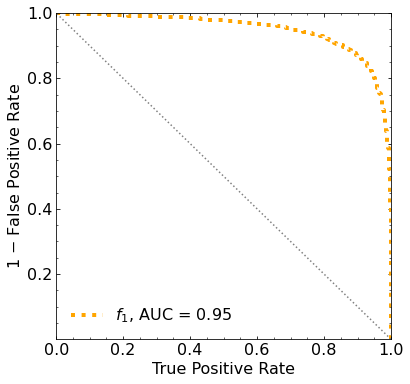

Classification score:


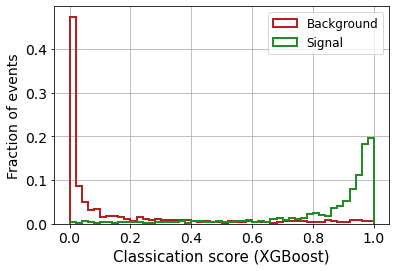


 ROC-AUC =  0.9493960977070575


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  261.27116224  243.61774072  216.88697848  184.67702522  147.56503955
  105.90829306   60.6935114     8.94162616  -50.20734969 -105.96005253]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 193.04139814 183.17712668 167.707631

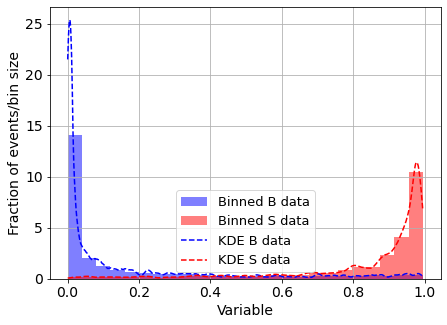

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



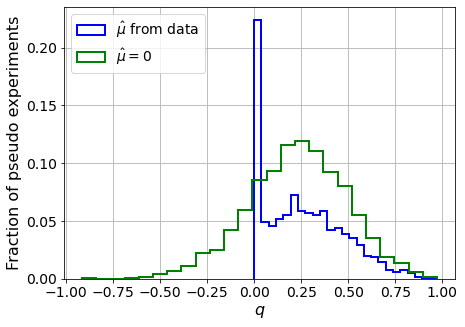

muhat mean:  -5.472131845906608
Z_bins:  0.48365500985007637
std Z_bins:  0.22054147492234416
Z_bins mu=0:  0.48365500985007637
std Z_bins mu=0:  0.2692628253452296

--------

B_expected:  643
S_expected:  2



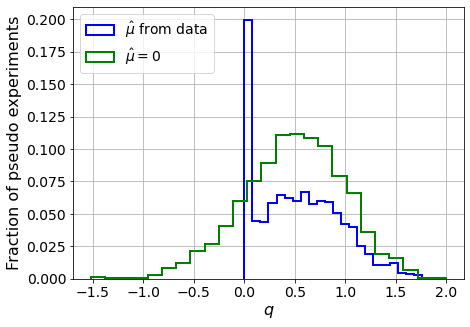

muhat mean:  -2.7137702244549544
Z_bins:  0.719340460881333
std Z_bins:  0.28992252943978847
Z_bins mu=0:  0.719340460881333
std Z_bins mu=0:  0.3482104968424175

--------

B_expected:  643
S_expected:  4



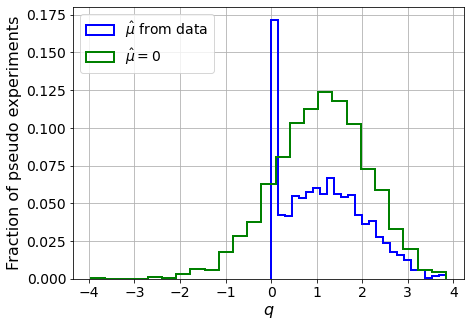

muhat mean:  -1.3368894411522192
Z_bins:  1.0585214700326653
std Z_bins:  0.4092699435481075
Z_bins mu=0:  1.0585214700326653
std Z_bins mu=0:  0.48122267749164627

--------

B_expected:  643
S_expected:  8



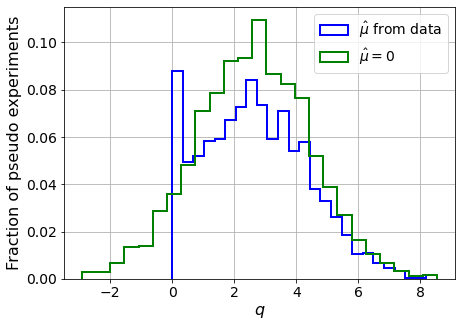

muhat mean:  -0.6703201749371994
Z_bins:  1.6195150899994444
std Z_bins:  0.5167655115322485
Z_bins mu=0:  1.6195150899994444
std Z_bins mu=0:  0.5639708771080909

--------

B_expected:  643
S_expected:  17



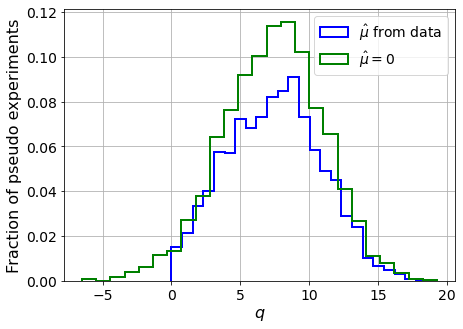

muhat mean:  -0.321280075085461
Z_bins:  2.7489540038072335
std Z_bins:  0.6210676935826778
Z_bins mu=0:  2.7489540038072335
std Z_bins mu=0:  0.660296236452956

--------

B_expected:  643
S_expected:  37



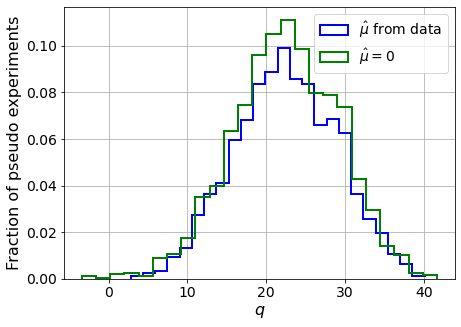

muhat mean:  -0.1518951855928778
Z_bins:  4.738878149086667
std Z_bins:  0.6825294997365805
Z_bins mu=0:  4.738878149086667
std Z_bins mu=0:  0.7040553986273107

--------

B_expected:  643
S_expected:  79



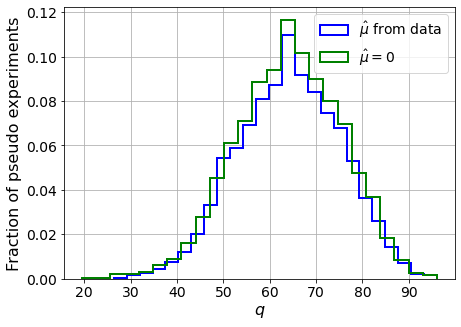

muhat mean:  -0.06889420030413848
Z_bins:  8.02750639104899
std Z_bins:  0.6900003180097967
Z_bins mu=0:  8.02750639104899
std Z_bins mu=0:  0.704080180252702

--------

B_expected:  643
S_expected:  170



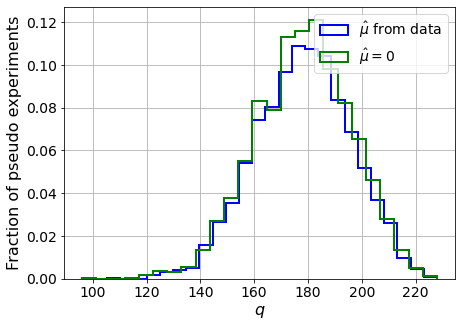

muhat mean:  -0.032537710743926355
Z_bins:  13.367431250744199
std Z_bins:  0.6615626333549787
Z_bins mu=0:  13.367431250744199
std Z_bins mu=0:  0.6704301477720108

--------

B_expected:  643
S_expected:  366



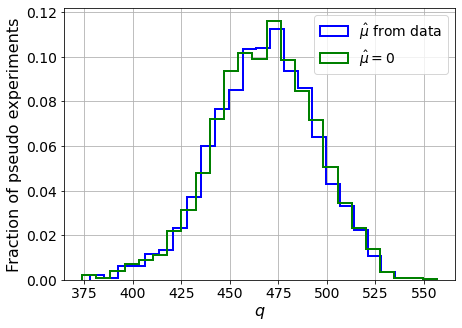

muhat mean:  -0.015296740428579583
Z_bins:  21.649038404587643
std Z_bins:  0.6093168136269784
Z_bins mu=0:  21.649038404587643
std Z_bins mu=0:  0.6150723074345353

--------

B_expected:  643
S_expected:  788



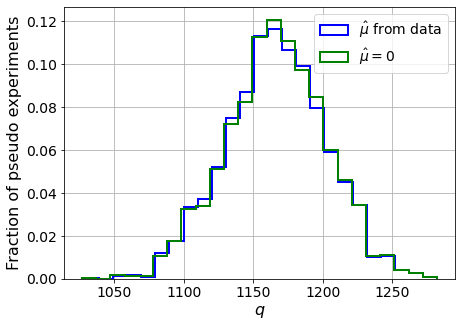

muhat mean:  -0.007545461698890044
Z_bins:  34.15985416027088
std Z_bins:  0.5282104428287047
Z_bins mu=0:  34.15985416027088
std Z_bins mu=0:  0.5304713345137831

--------


 FINAL RESULT:

[[0.48365500985007637, 0.22054147492234416, -5.472131845906608, 0.48365500985007637, 0.2692628253452296], [0.719340460881333, 0.28992252943978847, -2.7137702244549544, 0.719340460881333, 0.3482104968424175], [1.0585214700326653, 0.4092699435481075, -1.3368894411522192, 1.0585214700326653, 0.48122267749164627], [1.6195150899994444, 0.5167655115322485, -0.6703201749371994, 1.6195150899994444, 0.5639708771080909], [2.7489540038072335, 0.6210676935826778, -0.321280075085461, 2.7489540038072335, 0.660296236452956], [4.738878149086667, 0.6825294997365805, -0.1518951855928778, 4.738878149086667, 0.7040553986273107], [8.02750639104899, 0.6900003180097967, -0.06889420030413848, 8.02750639104899, 0.704080180252702], [13.367431250744199, 0.6615626333549787, -0.032537710743926355, 13.367431250744199, 0.6704301

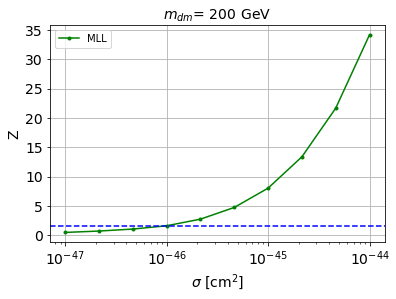


cross_MLL_164:  1.0195661297573242e-46
cross_MLL_164_up:  5.877945919891377e-47
cross_MLL_164_down:  1.6000670871903111e-46

#########################


#########################

mDM =  500 GeV


max_pS1_both lenght:  178

X_mon1_train :  (4999, 178)
y_mon1_train :  (4999,)
X_mon1_val :  (1667, 178)
y_mon1_val :  (1667,)
X_mon1_test :  (3334, 178)
y_mon1_test :  (3334,)

max_pS2_both lenght:  2298

X_mon2_train :  (4999, 2298)
y_mon2_train :  (4999,)
X_mon2_val :  (1667, 2298)
y_mon2_val :  (1667,)
X_mon2_test :  (3334, 2298)
y_mon2_test :  (3334,)


X_mon3_train :  (4999, 16384)
y_mon3_train :  (4999,)
X_mon3_val :  (1667, 16384)
y_mon3_val :  (1667,)
X_mon3_test :  (3334, 16384)
y_mon3_test :  (3334,)


X_mon4_train :  (4999, 16384)
y_mon4_train :  (4999,)
X_mon4_val :  (1667, 16384)
y_mon4_val :  (1667,)
X_mon4_test :  (3334, 16384)
y_mon4_test :  (3334,)


X_mon_train :  (4999, 35244)
y_mon_train :  (4999,)
X_mon_val :  (1667, 35244)
y_mon_val :  (1667,)
X_mon_test :  (3334, 3524

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68736	validation_1-logloss:0.68817
[1]	validation_0-logloss:0.68171	validation_1-logloss:0.68337
[2]	validation_0-logloss:0.67617	validation_1-logloss:0.67861
[3]	validation_0-logloss:0.67073	validation_1-logloss:0.67393
[4]	validation_0-logloss:0.66538	validation_1-logloss:0.66954
[5]	validation_0-logloss:0.66019	validation_1-logloss:0.66503
[6]	validation_0-logloss:0.65504	validation_1-logloss:0.66078
[7]	validation_0-logloss:0.64991	validation_1-logloss:0.65639
[8]	validation_0-logloss:0.64491	validation_1-logloss:0.65207
[9]	validation_0-logloss:0.63998	validation_1-logloss:0.64794
[10]	validation_0-logloss:0.63509	validation_1-logloss:0.64378
[11]	validation_0-logloss:0.63041	validation_1-logloss:0.63995
[12]	validation_0-logloss:0.62575	validation_1-logloss:0.63597
[13]	validation_0-logloss:0.62122	validation_1-logloss:0.63226
[14]	validation_0-logloss:0.61665	validation_1-logloss:0.62834
[15]	validation_0-logloss:0.61225	validation_1-logloss:0.62472
[1

[130]	validation_0-logloss:0.33444	validation_1-logloss:0.41172
[131]	validation_0-logloss:0.33304	validation_1-logloss:0.41080
[132]	validation_0-logloss:0.33169	validation_1-logloss:0.40990
[133]	validation_0-logloss:0.33041	validation_1-logloss:0.40915
[134]	validation_0-logloss:0.32905	validation_1-logloss:0.40831
[135]	validation_0-logloss:0.32760	validation_1-logloss:0.40740
[136]	validation_0-logloss:0.32638	validation_1-logloss:0.40671
[137]	validation_0-logloss:0.32502	validation_1-logloss:0.40577
[138]	validation_0-logloss:0.32371	validation_1-logloss:0.40484
[139]	validation_0-logloss:0.32254	validation_1-logloss:0.40415
[140]	validation_0-logloss:0.32120	validation_1-logloss:0.40324
[141]	validation_0-logloss:0.31994	validation_1-logloss:0.40251
[142]	validation_0-logloss:0.31862	validation_1-logloss:0.40166
[143]	validation_0-logloss:0.31751	validation_1-logloss:0.40102
[144]	validation_0-logloss:0.31626	validation_1-logloss:0.40013
[145]	validation_0-logloss:0.31505	valid

[259]	validation_0-logloss:0.21396	validation_1-logloss:0.34091
[260]	validation_0-logloss:0.21338	validation_1-logloss:0.34058
[261]	validation_0-logloss:0.21268	validation_1-logloss:0.34022
[262]	validation_0-logloss:0.21205	validation_1-logloss:0.34000
[263]	validation_0-logloss:0.21143	validation_1-logloss:0.33968
[264]	validation_0-logloss:0.21080	validation_1-logloss:0.33938
[265]	validation_0-logloss:0.21022	validation_1-logloss:0.33911
[266]	validation_0-logloss:0.20965	validation_1-logloss:0.33879
[267]	validation_0-logloss:0.20897	validation_1-logloss:0.33848
[268]	validation_0-logloss:0.20830	validation_1-logloss:0.33820
[269]	validation_0-logloss:0.20775	validation_1-logloss:0.33783
[270]	validation_0-logloss:0.20716	validation_1-logloss:0.33753
[271]	validation_0-logloss:0.20656	validation_1-logloss:0.33726
[272]	validation_0-logloss:0.20609	validation_1-logloss:0.33708
[273]	validation_0-logloss:0.20559	validation_1-logloss:0.33679
[274]	validation_0-logloss:0.20495	valid

[388]	validation_0-logloss:0.15388	validation_1-logloss:0.31378
[389]	validation_0-logloss:0.15355	validation_1-logloss:0.31364
[390]	validation_0-logloss:0.15319	validation_1-logloss:0.31347
[391]	validation_0-logloss:0.15293	validation_1-logloss:0.31341
[392]	validation_0-logloss:0.15255	validation_1-logloss:0.31326
[393]	validation_0-logloss:0.15210	validation_1-logloss:0.31308
[394]	validation_0-logloss:0.15185	validation_1-logloss:0.31299
[395]	validation_0-logloss:0.15145	validation_1-logloss:0.31277
[396]	validation_0-logloss:0.15105	validation_1-logloss:0.31255
[397]	validation_0-logloss:0.15076	validation_1-logloss:0.31234
[398]	validation_0-logloss:0.15042	validation_1-logloss:0.31222
[399]	validation_0-logloss:0.14999	validation_1-logloss:0.31208
[400]	validation_0-logloss:0.14974	validation_1-logloss:0.31196
[401]	validation_0-logloss:0.14946	validation_1-logloss:0.31182
[402]	validation_0-logloss:0.14914	validation_1-logloss:0.31163
[403]	validation_0-logloss:0.14889	valid

[517]	validation_0-logloss:0.11802	validation_1-logloss:0.30033
[518]	validation_0-logloss:0.11786	validation_1-logloss:0.30029
[519]	validation_0-logloss:0.11759	validation_1-logloss:0.30029
[520]	validation_0-logloss:0.11748	validation_1-logloss:0.30022
[521]	validation_0-logloss:0.11720	validation_1-logloss:0.30012
[522]	validation_0-logloss:0.11700	validation_1-logloss:0.30014
[523]	validation_0-logloss:0.11677	validation_1-logloss:0.30004
[524]	validation_0-logloss:0.11657	validation_1-logloss:0.29994
[525]	validation_0-logloss:0.11638	validation_1-logloss:0.29995
[526]	validation_0-logloss:0.11620	validation_1-logloss:0.29987
[527]	validation_0-logloss:0.11594	validation_1-logloss:0.29978
[528]	validation_0-logloss:0.11575	validation_1-logloss:0.29970
[529]	validation_0-logloss:0.11552	validation_1-logloss:0.29960
[530]	validation_0-logloss:0.11541	validation_1-logloss:0.29957
[531]	validation_0-logloss:0.11520	validation_1-logloss:0.29948
[532]	validation_0-logloss:0.11501	valid

[646]	validation_0-logloss:0.09641	validation_1-logloss:0.29342
[647]	validation_0-logloss:0.09624	validation_1-logloss:0.29342
[648]	validation_0-logloss:0.09613	validation_1-logloss:0.29342
[649]	validation_0-logloss:0.09596	validation_1-logloss:0.29339
[650]	validation_0-logloss:0.09581	validation_1-logloss:0.29331
[651]	validation_0-logloss:0.09570	validation_1-logloss:0.29326
[652]	validation_0-logloss:0.09559	validation_1-logloss:0.29325
[653]	validation_0-logloss:0.09545	validation_1-logloss:0.29320
[654]	validation_0-logloss:0.09536	validation_1-logloss:0.29318
[655]	validation_0-logloss:0.09524	validation_1-logloss:0.29317
[656]	validation_0-logloss:0.09515	validation_1-logloss:0.29310
[657]	validation_0-logloss:0.09500	validation_1-logloss:0.29305
[658]	validation_0-logloss:0.09487	validation_1-logloss:0.29305
[659]	validation_0-logloss:0.09471	validation_1-logloss:0.29302
[660]	validation_0-logloss:0.09458	validation_1-logloss:0.29304
[661]	validation_0-logloss:0.09448	valid

[775]	validation_0-logloss:0.08179	validation_1-logloss:0.29038
[776]	validation_0-logloss:0.08165	validation_1-logloss:0.29032
[777]	validation_0-logloss:0.08158	validation_1-logloss:0.29030
[778]	validation_0-logloss:0.08149	validation_1-logloss:0.29031
[779]	validation_0-logloss:0.08138	validation_1-logloss:0.29025
[780]	validation_0-logloss:0.08132	validation_1-logloss:0.29024
[781]	validation_0-logloss:0.08119	validation_1-logloss:0.29018
[782]	validation_0-logloss:0.08108	validation_1-logloss:0.29018
[783]	validation_0-logloss:0.08096	validation_1-logloss:0.29017
[784]	validation_0-logloss:0.08086	validation_1-logloss:0.29015
[785]	validation_0-logloss:0.08078	validation_1-logloss:0.29017
[786]	validation_0-logloss:0.08064	validation_1-logloss:0.29019
[787]	validation_0-logloss:0.08053	validation_1-logloss:0.29015
[788]	validation_0-logloss:0.08044	validation_1-logloss:0.29018
[789]	validation_0-logloss:0.08031	validation_1-logloss:0.29016
[790]	validation_0-logloss:0.08024	valid

[904]	validation_0-logloss:0.07026	validation_1-logloss:0.28923
[905]	validation_0-logloss:0.07019	validation_1-logloss:0.28922
[906]	validation_0-logloss:0.07011	validation_1-logloss:0.28917
[907]	validation_0-logloss:0.07000	validation_1-logloss:0.28917
[908]	validation_0-logloss:0.06995	validation_1-logloss:0.28917
[909]	validation_0-logloss:0.06990	validation_1-logloss:0.28913
[910]	validation_0-logloss:0.06981	validation_1-logloss:0.28918
[911]	validation_0-logloss:0.06970	validation_1-logloss:0.28913
[912]	validation_0-logloss:0.06959	validation_1-logloss:0.28905
[913]	validation_0-logloss:0.06950	validation_1-logloss:0.28901
[914]	validation_0-logloss:0.06945	validation_1-logloss:0.28902
[915]	validation_0-logloss:0.06939	validation_1-logloss:0.28896
[916]	validation_0-logloss:0.06930	validation_1-logloss:0.28890
[917]	validation_0-logloss:0.06922	validation_1-logloss:0.28891
[918]	validation_0-logloss:0.06918	validation_1-logloss:0.28895
[919]	validation_0-logloss:0.06910	valid

[1032]	validation_0-logloss:0.06139	validation_1-logloss:0.28870
[1033]	validation_0-logloss:0.06133	validation_1-logloss:0.28876
[1034]	validation_0-logloss:0.06125	validation_1-logloss:0.28872
[1035]	validation_0-logloss:0.06118	validation_1-logloss:0.28870
[1036]	validation_0-logloss:0.06110	validation_1-logloss:0.28874
[1037]	validation_0-logloss:0.06103	validation_1-logloss:0.28877
[1038]	validation_0-logloss:0.06098	validation_1-logloss:0.28874
[1039]	validation_0-logloss:0.06092	validation_1-logloss:0.28877
[1040]	validation_0-logloss:0.06085	validation_1-logloss:0.28872
[1041]	validation_0-logloss:0.06083	validation_1-logloss:0.28871
[1042]	validation_0-logloss:0.06076	validation_1-logloss:0.28874
[1043]	validation_0-logloss:0.06069	validation_1-logloss:0.28881
[1044]	validation_0-logloss:0.06061	validation_1-logloss:0.28881
[1045]	validation_0-logloss:0.06056	validation_1-logloss:0.28884
[1046]	validation_0-logloss:0.06051	validation_1-logloss:0.28879
[1047]	validation_0-loglo

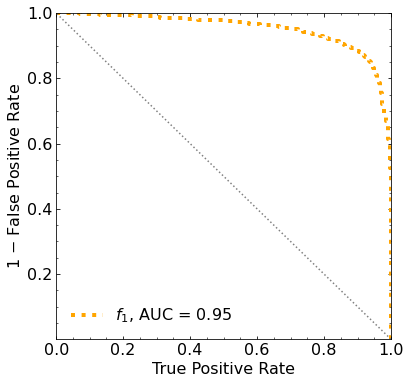

Classification score:


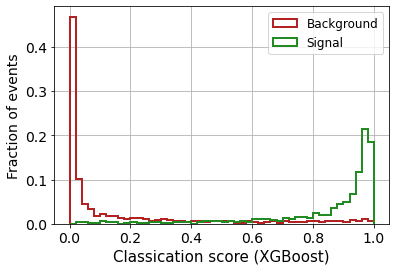


 ROC-AUC =  0.952054232427156


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  260.2692717   244.35245643  221.34208324  188.75681181  148.90552211
  106.17011627   60.9322784     8.76736159  -49.23658602 -106.13775789]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 211.14433836 193.581504

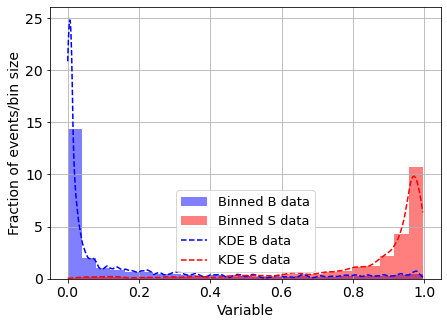

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



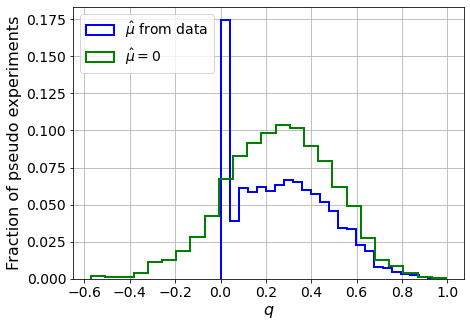

muhat mean:  -7.333701022818484
Z_bins:  0.5190585925855257
std Z_bins:  0.19628807331124473
Z_bins mu=0:  0.5190585925855257
std Z_bins mu=0:  0.2257665163861034

--------

B_expected:  643
S_expected:  1



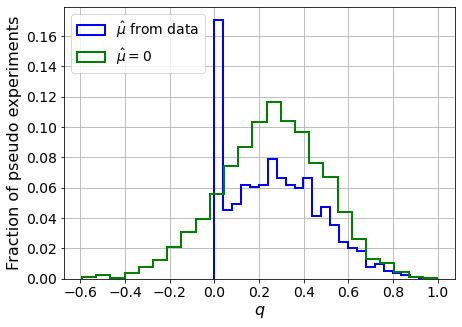

muhat mean:  -7.300821791908605
Z_bins:  0.5156102206939924
std Z_bins:  0.1966213371713049
Z_bins mu=0:  0.5156102206939924
std Z_bins mu=0:  0.22821068704495015

--------

B_expected:  643
S_expected:  2



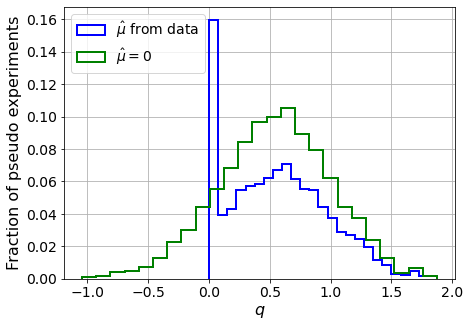

muhat mean:  -3.5446436147187077
Z_bins:  0.7482814547108175
std Z_bins:  0.27352074198099574
Z_bins mu=0:  0.7482814547108175
std Z_bins mu=0:  0.30999605456748885

--------

B_expected:  643
S_expected:  3



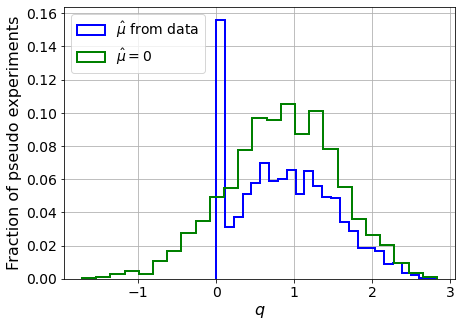

muhat mean:  -2.3424762888278914
Z_bins:  0.9325844908114068
std Z_bins:  0.3333484811999447
Z_bins mu=0:  0.9325844908114068
std Z_bins mu=0:  0.3782662971805343

--------

B_expected:  643
S_expected:  7



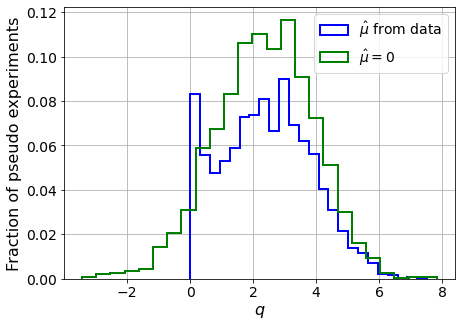

muhat mean:  -1.0536688537338854
Z_bins:  1.5500942545137857
std Z_bins:  0.46404601337327805
Z_bins mu=0:  1.5500942545137857
std Z_bins mu=0:  0.5042182451999322

--------

B_expected:  643
S_expected:  15



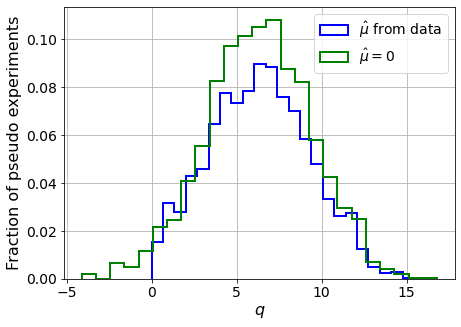

muhat mean:  -0.4826455913219238
Z_bins:  2.5276859622149623
std Z_bins:  0.5852284668394393
Z_bins mu=0:  2.5276859622149623
std Z_bins mu=0:  0.6115896154116065

--------

B_expected:  643
S_expected:  33



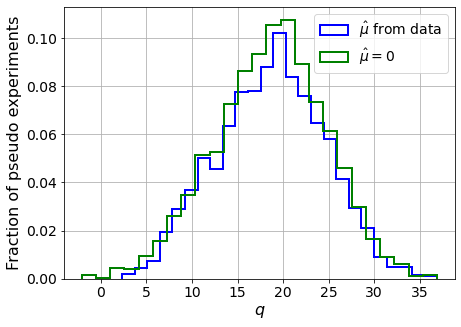

muhat mean:  -0.2160755185588822
Z_bins:  4.34495565652772
std Z_bins:  0.6787050971608789
Z_bins mu=0:  4.34495565652772
std Z_bins mu=0:  0.6972678556511739

--------

B_expected:  643
S_expected:  72



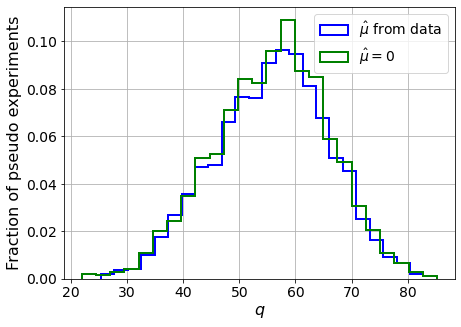

muhat mean:  -0.10043316712528844
Z_bins:  7.5062545922235415
std Z_bins:  0.6693392210668255
Z_bins mu=0:  7.5062545922235415
std Z_bins mu=0:  0.6780127542209969

--------

B_expected:  643
S_expected:  154



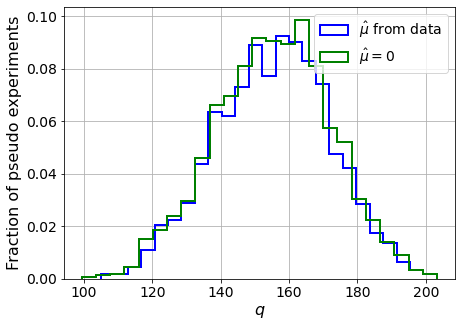

muhat mean:  -0.04492361132730397
Z_bins:  12.495127503463095
std Z_bins:  0.674446501930224
Z_bins mu=0:  12.495127503463095
std Z_bins mu=0:  0.6801428198795126

--------

B_expected:  643
S_expected:  333



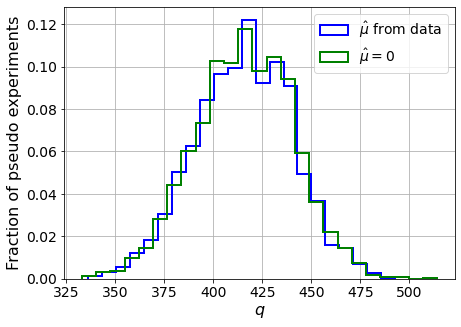

muhat mean:  -0.021144933892739082
Z_bins:  20.407617025621754
std Z_bins:  0.6112954469223004
Z_bins mu=0:  20.407617025621754
std Z_bins mu=0:  0.6145489378648127

--------


 FINAL RESULT:

[[0.5190585925855257, 0.19628807331124473, -7.333701022818484, 0.5190585925855257, 0.2257665163861034], [0.5156102206939924, 0.1966213371713049, -7.300821791908605, 0.5156102206939924, 0.22821068704495015], [0.7482814547108175, 0.27352074198099574, -3.5446436147187077, 0.7482814547108175, 0.30999605456748885], [0.9325844908114068, 0.3333484811999447, -2.3424762888278914, 0.9325844908114068, 0.3782662971805343], [1.5500942545137857, 0.46404601337327805, -1.0536688537338854, 1.5500942545137857, 0.5042182451999322], [2.5276859622149623, 0.5852284668394393, -0.4826455913219238, 2.5276859622149623, 0.6115896154116065], [4.34495565652772, 0.6787050971608789, -0.2160755185588822, 4.34495565652772, 0.6972678556511739], [7.5062545922235415, 0.6693392210668255, -0.10043316712528844, 7.5062545922235415, 0.6

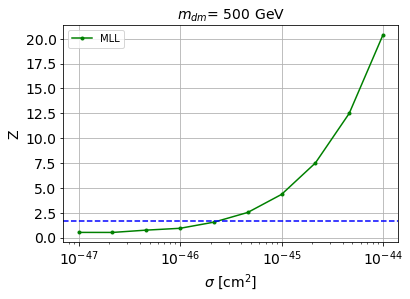


cross_MLL_164:  2.3500920172674484e-46
cross_MLL_164_up:  1.54718979567436e-46
cross_MLL_164_down:  3.753989133356476e-46

#########################



In [14]:
store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = 'mDM' + str(mDM) + 'GeV/WP_mDM' + str(mDM) + 'GeV_sig1045.hdf5'
    
    f_S = h5py.File(filefolder+filename_S,'r')
    
    
    
    
    print('')
    
    ###################
    # peakS1_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS1_B = 0
    max_pS1_B1 = 0
    max_pS1_B2 = 0
    max_pS1_B3 = 0
    max_pS1_B4 = 0

    max_pS1_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS1_B = max(max_pS1_B, len( f_B['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS1_B1 = max(max_pS1_B1, len( f_B1['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS1_B2 = max(max_pS1_B2, len( f_B2['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS1_B3 = max(max_pS1_B3, len( f_B3['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS1_B4 = max(max_pS1_B4, len( f_B4['peakS1_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS1_S = max(max_pS1_S, len( f_S['peakS1_onlyhits/ev_'+str(i)] ))


    max_pS1_both = max(max_pS1_B,max_pS1_B1,max_pS1_B2,max_pS1_B3,max_pS1_B4,max_pS1_S)

    print('max_pS1_both lenght: ', max_pS1_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
    diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS1_onlyhits_B = np.pad(f_B['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B), 'constant')
    peakS1_onlyhits_B1 = np.pad(f_B1['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B1), 'constant')
    peakS1_onlyhits_B2 = np.pad(f_B2['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B2), 'constant')
    peakS1_onlyhits_B3 = np.pad(f_B3['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B3), 'constant')
    peakS1_onlyhits_B4 = np.pad(f_B4['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B4), 'constant')
    peakS1_onlyhits_S = np.pad(f_S['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
        diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S1_B = np.pad(f_B['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B), 'constant')
        # add new event to the matrix as a row
        peakS1_onlyhits_B = np.row_stack([peakS1_onlyhits_B,aux_S1_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B1 = np.pad(f_B1['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B1), 'constant')
        peakS1_onlyhits_B1 = np.row_stack([peakS1_onlyhits_B1,aux_S1_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B2 = np.pad(f_B2['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B2), 'constant')
        peakS1_onlyhits_B2 = np.row_stack([peakS1_onlyhits_B2,aux_S1_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B3 = np.pad(f_B3['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B3), 'constant')
        peakS1_onlyhits_B3 = np.row_stack([peakS1_onlyhits_B3,aux_S1_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B4 = np.pad(f_B4['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B4), 'constant')
        peakS1_onlyhits_B4 = np.row_stack([peakS1_onlyhits_B4,aux_S1_B4])

    for i in range(2, num_data+1):
        diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_S = np.pad(f_S['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_S), 'constant')
        peakS1_onlyhits_S = np.row_stack([peakS1_onlyhits_S,aux_S1_S])




    # X and Y for the classifier
    X_peakS1 = np.row_stack([peakS1_onlyhits_B[:NUM_DAT_ER],peakS1_onlyhits_B1[:NUM_DAT_AC],peakS1_onlyhits_B2[:NUM_DAT_CNNS],peakS1_onlyhits_B3[:NUM_DAT_RN],peakS1_onlyhits_B4[:NUM_DAT_WALL],peakS1_onlyhits_S])
    # normalize
    X_peakS1 = scaler.fit_transform(X_peakS1)

    del peakS1_onlyhits_B
    del peakS1_onlyhits_B1
    del peakS1_onlyhits_B2
    del peakS1_onlyhits_B3
    del peakS1_onlyhits_B4
    del peakS1_onlyhits_S






    ###################
    # CONCATENATE ALL #
    ###################

    X_mon1 = np.concatenate([X_peakS1],axis=1)

    del X_peakS1

    # labels
    y_mon1 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon1_aux, X_mon1_test, y_mon1_aux, y_mon1_test = train_test_split(X_mon1,
                                                                    y_mon1,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon1,
                                                                    shuffle=True)

    del X_mon1
    del y_mon1

    X_mon1_train, X_mon1_val, y_mon1_train, y_mon1_val = train_test_split(X_mon1_aux,
                                                                      y_mon1_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon1_aux,
                                                                      shuffle=True)

    del X_mon1_aux
    del y_mon1_aux

    print('')
    print('X_mon1_train : ', X_mon1_train.shape)
    print('y_mon1_train : ', y_mon1_train.shape)
    print('X_mon1_val : ', X_mon1_val.shape)
    print('y_mon1_val : ', y_mon1_val.shape)
    print('X_mon1_test : ', X_mon1_test.shape)
    print('y_mon1_test : ', y_mon1_test.shape)
    print('')
    
    
    
    
    
    ###################
    # peakS2_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS2_B = 0
    max_pS2_B1 = 0
    max_pS2_B2 = 0
    max_pS2_B3 = 0
    max_pS2_B4 = 0

    max_pS2_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS2_B = max(max_pS2_B, len( f_B['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS2_B1 = max(max_pS2_B1, len( f_B1['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS2_B2 = max(max_pS2_B2, len( f_B2['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS2_B3 = max(max_pS2_B3, len( f_B3['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS2_B4 = max(max_pS2_B4, len( f_B4['peakS2_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS2_S = max(max_pS2_S, len( f_S['peakS2_onlyhits/ev_'+str(i)] ))


    max_pS2_both = max(max_pS2_B,max_pS2_B1,max_pS2_B2,max_pS2_B3,max_pS2_B4,max_pS2_S)

    print('max_pS2_both lenght: ', max_pS2_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
    diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS2_onlyhits_B = np.pad(f_B['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B), 'constant')
    peakS2_onlyhits_B1 = np.pad(f_B1['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B1), 'constant')
    peakS2_onlyhits_B2 = np.pad(f_B2['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B2), 'constant')
    peakS2_onlyhits_B3 = np.pad(f_B3['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B3), 'constant')
    peakS2_onlyhits_B4 = np.pad(f_B4['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B4), 'constant')
    peakS2_onlyhits_S = np.pad(f_S['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
        diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S2_B = np.pad(f_B['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B), 'constant')
        # add new event to the matrix as a row
        peakS2_onlyhits_B = np.row_stack([peakS2_onlyhits_B,aux_S2_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B1 = np.pad(f_B1['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B1), 'constant')
        peakS2_onlyhits_B1 = np.row_stack([peakS2_onlyhits_B1,aux_S2_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B2 = np.pad(f_B2['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B2), 'constant')
        peakS2_onlyhits_B2 = np.row_stack([peakS2_onlyhits_B2,aux_S2_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B3 = np.pad(f_B3['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B3), 'constant')
        peakS2_onlyhits_B3 = np.row_stack([peakS2_onlyhits_B3,aux_S2_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B4 = np.pad(f_B4['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B4), 'constant')
        peakS2_onlyhits_B4 = np.row_stack([peakS2_onlyhits_B4,aux_S2_B4])
    for i in range(2, num_data+1):
        diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_S = np.pad(f_S['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_S), 'constant')
        peakS2_onlyhits_S = np.row_stack([peakS2_onlyhits_S,aux_S2_S])




    # X and Y for the classifier
    X_peakS2 = np.row_stack([peakS2_onlyhits_B[:NUM_DAT_ER],peakS2_onlyhits_B1[:NUM_DAT_AC],peakS2_onlyhits_B2[:NUM_DAT_CNNS],peakS2_onlyhits_B3[:NUM_DAT_RN],peakS2_onlyhits_B4[:NUM_DAT_WALL],peakS2_onlyhits_S])
    # normalize
    X_peakS2 = scaler.fit_transform(X_peakS2)

    del peakS2_onlyhits_B
    del peakS2_onlyhits_B1
    del peakS2_onlyhits_B2
    del peakS2_onlyhits_B3
    del peakS2_onlyhits_B4
    del peakS2_onlyhits_S









    ###################
    # CONCATENATE ALL #
    ###################

    X_mon2 = np.concatenate([X_peakS2],axis=1)

    del X_peakS2

    # labels
    y_mon2 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon2_aux, X_mon2_test, y_mon2_aux, y_mon2_test = train_test_split(X_mon2,
                                                                    y_mon2,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon2,
                                                                    shuffle=True)

    del X_mon2
    del y_mon2

    X_mon2_train, X_mon2_val, y_mon2_train, y_mon2_val = train_test_split(X_mon2_aux,
                                                                      y_mon2_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon2_aux,
                                                                      shuffle=True)

    del X_mon2_aux
    del y_mon2_aux

    print('')
    print('X_mon2_train : ', X_mon2_train.shape)
    print('y_mon2_train : ', y_mon2_train.shape)
    print('X_mon2_val : ', X_mon2_val.shape)
    print('y_mon2_val : ', y_mon2_val.shape)
    print('X_mon2_test : ', X_mon2_test.shape)
    print('y_mon2_test : ', y_mon2_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_bot_img DATA #
    ######################


    HITS_bot_img_S = np.array( f_S['HITS_bot_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_bot_img_S = np.row_stack([HITS_bot_img_S,np.array( f_S['HITS_bot_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon3 = np.row_stack([HITS_bot_img_B[:NUM_DAT_ER],HITS_bot_img_B1[:NUM_DAT_AC],HITS_bot_img_B2[:NUM_DAT_CNNS],HITS_bot_img_B3[:NUM_DAT_RN],HITS_bot_img_B4[:NUM_DAT_WALL],HITS_bot_img_S])
    # normalize
    X_mon3 = scaler.fit_transform(X_mon3)
    #X_mon3 = np.reshape(X_mon3, (2*num_data,128,128,1))

#     del HITS_bot_img_B
#     del HITS_bot_img_B1
#     del HITS_bot_img_B2
#     del HITS_bot_img_B3
#     del HITS_bot_img_B4
    del HITS_bot_img_S

    # labels
    y_mon3 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon3_aux, X_mon3_test, y_mon3_aux, y_mon3_test = train_test_split(X_mon3,
                                                                    y_mon3,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon3,
                                                                    shuffle=True)

    del X_mon3
    del y_mon3

    X_mon3_train, X_mon3_val, y_mon3_train, y_mon3_val = train_test_split(X_mon3_aux,
                                                                      y_mon3_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon3_aux,
                                                                      shuffle=True)

    del X_mon3_aux
    del y_mon3_aux

    print('')
    print('X_mon3_train : ', X_mon3_train.shape)
    print('y_mon3_train : ', y_mon3_train.shape)
    print('X_mon3_val : ', X_mon3_val.shape)
    print('y_mon3_val : ', y_mon3_val.shape)
    print('X_mon3_test : ', X_mon3_test.shape)
    print('y_mon3_test : ', y_mon3_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_top_img DATA #
    ######################
    
    HITS_top_img_S = np.array( f_S['HITS_top_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_top_img_S = np.row_stack([HITS_top_img_S,np.array( f_S['HITS_top_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon4 = np.row_stack([HITS_top_img_B[:NUM_DAT_ER],HITS_top_img_B1[:NUM_DAT_AC],HITS_top_img_B2[:NUM_DAT_CNNS],HITS_top_img_B3[:NUM_DAT_RN],HITS_top_img_B4[:NUM_DAT_WALL],HITS_top_img_S])
    # normalize
    X_mon4 = scaler.fit_transform(X_mon4)
    #X_mon4 = np.reshape(X_mon4, (2*num_data,128,128,1))

#     del HITS_top_img_B
#     del HITS_top_img_B1
#     del HITS_top_img_B2
#     del HITS_top_img_B3
#     del HITS_top_img_B4
    del HITS_top_img_S

    # labels
    y_mon4 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon4_aux, X_mon4_test, y_mon4_aux, y_mon4_test = train_test_split(X_mon4,
                                                                    y_mon4,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon4,
                                                                    shuffle=True)

    del X_mon4
    del y_mon4

    X_mon4_train, X_mon4_val, y_mon4_train, y_mon4_val = train_test_split(X_mon4_aux,
                                                                      y_mon4_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon4_aux,
                                                                      shuffle=True)

    del X_mon4_aux
    del y_mon4_aux

    print('')
    print('X_mon4_train : ', X_mon4_train.shape)
    print('y_mon4_train : ', y_mon4_train.shape)
    print('X_mon4_val : ', X_mon4_val.shape)
    print('y_mon4_val : ', y_mon4_val.shape)
    print('X_mon4_test : ', X_mon4_test.shape)
    print('y_mon4_test : ', y_mon4_test.shape)
    print('')
    
    
    
    
    
    
    # close the h5 files
#     f_B.close()
#     f_B1.close()
#     f_B2.close()
#     f_B3.close()
#     f_B4.close()
    f_S.close()
    
    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon_train = np.concatenate([X_mon1_train,X_mon2_train,X_mon3_train,X_mon4_train],axis=1)
    X_mon_test = np.concatenate([X_mon1_test,X_mon2_test,X_mon3_test,X_mon4_test],axis=1)
    X_mon_val = np.concatenate([X_mon1_val,X_mon2_val,X_mon3_val,X_mon4_val],axis=1)



    y_mon_train = y_mon1_train
    y_mon_test = y_mon1_test
    y_mon_val = y_mon1_val



    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





   # OPTION 2 (mu_hat with more precision) (slower,
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)


    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]



    # plot
#     plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [15]:
cross_arrays_MLL = store_cross_MLL_164
cross_arrays_MLL_up = store_cross_MLL_164_up
cross_arrays_MLL_down = store_cross_MLL_164_down

print(cross_arrays_MLL)
print(cross_arrays_MLL_up)
print(cross_arrays_MLL_down)

[1.2111915780470104e-45, 1.338959377424501e-46, 3.2748218381230716e-47, 3.044829078965363e-47, 5.64354425422809e-47, 1.0195661297573242e-46, 2.3500920172674484e-46]
[7.132533540250823e-46, 2.3715043920489203e-47, 1.983291142432953e-47, 2.0784785184784906e-47, 3.5234182577312794e-47, 5.877945919891377e-47, 1.54718979567436e-46]
[1.9868576446220662e-45, 2.064298401297877e-46, 5.137764107295417e-47, 4.546003665622695e-47, 8.273914437661324e-47, 1.6000670871903111e-46, 3.753989133356476e-46]


In [16]:
np.savetxt('results/arrays_MLL.txt', [cross_arrays_MLL, cross_arrays_MLL_up, cross_arrays_MLL_down])

In [17]:
cross_arrays_MLL = np.loadtxt('results/arrays_MLL.txt')[0]
cross_arrays_MLL_up = np.loadtxt('results/arrays_MLL.txt')[1]
cross_arrays_MLL_down =np.loadtxt('results/arrays_MLL.txt')[2]

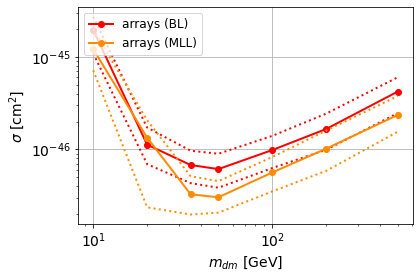

In [18]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_arrays, '-o', color='red', lw=lw, label=r'arrays (BL)')
plt.plot(mDM_mDM, cross_arrays_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_arrays_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_arrays_MLL, '-o', color='darkorange', lw=lw, label=r'arrays (MLL)')
plt.plot(mDM_mDM, cross_arrays_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_arrays_MLL_down, ':', color='darkorange', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

## 2. Arrays + time diff

##### Load the compressed features

In [19]:
###############
# BACKGROUNDS # 
###############

B_pbot_ER = np.loadtxt(filefolder + 'ER/pbot.txt')
B_ptop_ER = np.loadtxt(filefolder + 'ER/ptop.txt')
B_ppeakS1_ER = np.loadtxt(filefolder + 'ER/ppeakS1.txt')
B_ppeakS2_ER = np.loadtxt(filefolder + 'ER/ppeakS2.txt')

print('B_pbot_ER.shape: ', B_pbot_ER.shape)
print('B_ptop_ER.shape: ', B_ptop_ER.shape)
print('B_ppeakS1_ER.shape :', B_ppeakS1_ER.shape)
print('B_ppeakS2_ER.shape: ', B_ppeakS2_ER.shape)


B_pbot_AC = np.loadtxt(filefolder + 'AC/pbot.txt')
B_ptop_AC = np.loadtxt(filefolder + 'AC/ptop.txt')
B_ppeakS1_AC = np.loadtxt(filefolder + 'AC/ppeakS1.txt')
B_ppeakS2_AC = np.loadtxt(filefolder + 'AC/ppeakS2.txt')

print('\nB_pbot_AC.shape: ', B_pbot_AC.shape)
print('B_ptop_AC.shape: ', B_ptop_AC.shape)
print('B_ppeakS1_AC.shape :', B_ppeakS1_AC.shape)
print('B_ppeakS2_AC.shape: ', B_ppeakS2_AC.shape)


B_pbot_CNNS = np.loadtxt(filefolder + 'CNNS/pbot.txt')
B_ptop_CNNS = np.loadtxt(filefolder + 'CNNS/ptop.txt')
B_ppeakS1_CNNS = np.loadtxt(filefolder + 'CNNS/ppeakS1.txt')
B_ppeakS2_CNNS = np.loadtxt(filefolder + 'CNNS/ppeakS2.txt')

print('\nB_pbot_CNNS.shape: ', B_pbot_CNNS.shape)
print('B_ptop_CNNS.shape: ', B_ptop_CNNS.shape)
print('B_ppeakS1_CNNS.shape :', B_ppeakS1_CNNS.shape)
print('B_ppeakS2_CNNS.shape: ', B_ppeakS2_CNNS.shape)


B_pbot_RN = np.loadtxt(filefolder + 'RN/pbot.txt')
B_ptop_RN = np.loadtxt(filefolder + 'RN/ptop.txt')
B_ppeakS1_RN = np.loadtxt(filefolder + 'RN/ppeakS1.txt')
B_ppeakS2_RN = np.loadtxt(filefolder + 'RN/ppeakS2.txt')

print('\nB_pbot_RN.shape: ', B_pbot_RN.shape)
print('B_ptop_RN.shape: ', B_ptop_RN.shape)
print('B_ppeakS1_RN.shape :', B_ppeakS1_RN.shape)
print('B_ppeakS2_RN.shape: ', B_ppeakS2_RN.shape)


B_pbot_WALL = np.loadtxt(filefolder + 'WALL/pbot.txt')
B_ptop_WALL = np.loadtxt(filefolder + 'WALL/ptop.txt')
B_ppeakS1_WALL = np.loadtxt(filefolder + 'WALL/ppeakS1.txt')
B_ppeakS2_WALL = np.loadtxt(filefolder + 'WALL/ppeakS2.txt')

print('\nB_pbot_WALL.shape: ', B_pbot_WALL.shape)
print('B_ptop_WALL.shape: ', B_ptop_WALL.shape)
print('B_ppeakS1_WALL.shape :', B_ppeakS1_WALL.shape)
print('B_ppeakS2_WALL.shape: ', B_ppeakS2_WALL.shape)

B_pbot_ER.shape:  (35549,)
B_ptop_ER.shape:  (35549,)
B_ppeakS1_ER.shape : (35549, 8)
B_ppeakS2_ER.shape:  (35549, 8)

B_pbot_AC.shape:  (3998,)
B_ptop_AC.shape:  (3998,)
B_ppeakS1_AC.shape : (3998, 8)
B_ppeakS2_AC.shape:  (3998, 8)

B_pbot_CNNS.shape:  (99,)
B_ptop_CNNS.shape:  (99,)
B_ppeakS1_CNNS.shape : (99, 8)
B_ppeakS2_CNNS.shape:  (99, 8)

B_pbot_RN.shape:  (2610,)
B_ptop_RN.shape:  (2610,)
B_ppeakS1_RN.shape : (2610, 8)
B_ppeakS2_RN.shape:  (2610, 8)

B_pbot_WALL.shape:  (4642,)
B_ptop_WALL.shape:  (4642,)
B_ppeakS1_WALL.shape : (4642, 8)
B_ppeakS2_WALL.shape:  (4642, 8)



#########################

mDM =  10 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000

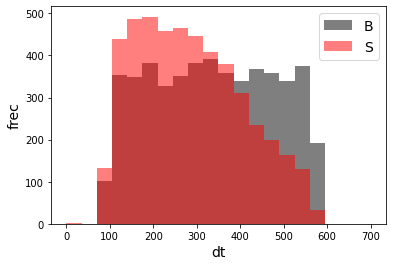

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35219)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35219)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35219)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68383	validation_1-logloss:0.68425
[1]	validation_0-logloss:0.67466	validation_1-logloss:0.67551
[2]	validation_0-logloss:0.66568	validation_1-logloss:0.66695
[3]	validation_0-logloss:0.65690	validation_1-logloss:0.65854
[4]	validation_0-logloss:0.64819	validation_1-logloss:0.65021
[5]	validation_0-logloss:0.63969	validation_1-logloss:0.64210
[6]	validation_0-logloss:0.63130	validation_1-logloss:0.63408
[7]	validation_0-logloss:0.62313	validation_1-logloss:0.62620
[8]	validation_0-logloss:0.61505	validation_1-logloss:0.61848
[9]	validation_0-logloss:0.60715	validation_1-logloss:0.61085
[10]	validation_0-logloss:0.59936	validation_1-logloss:0.60340
[11]	validation_0-logloss:0.59172	validation_1-logloss:0.59615
[12]	validation_0-logloss:0.58422	validation_1-logloss:0.58904
[13]	validation_0-logloss:0.57685	validation_1-logloss:0.58204
[14]	validation_0-logloss:0.56960	validation_1-logloss:0.57511
[15]	validation_0-logloss:0.56249	validation_1-logloss:0.56826
[1

[130]	validation_0-logloss:0.16684	validation_1-logloss:0.19372
[131]	validation_0-logloss:0.16531	validation_1-logloss:0.19221
[132]	validation_0-logloss:0.16377	validation_1-logloss:0.19081
[133]	validation_0-logloss:0.16224	validation_1-logloss:0.18940
[134]	validation_0-logloss:0.16076	validation_1-logloss:0.18796
[135]	validation_0-logloss:0.15930	validation_1-logloss:0.18664
[136]	validation_0-logloss:0.15782	validation_1-logloss:0.18532
[137]	validation_0-logloss:0.15637	validation_1-logloss:0.18401
[138]	validation_0-logloss:0.15494	validation_1-logloss:0.18267
[139]	validation_0-logloss:0.15351	validation_1-logloss:0.18135
[140]	validation_0-logloss:0.15211	validation_1-logloss:0.18008
[141]	validation_0-logloss:0.15074	validation_1-logloss:0.17884
[142]	validation_0-logloss:0.14936	validation_1-logloss:0.17756
[143]	validation_0-logloss:0.14800	validation_1-logloss:0.17634
[144]	validation_0-logloss:0.14668	validation_1-logloss:0.17513
[145]	validation_0-logloss:0.14535	valid

[259]	validation_0-logloss:0.05571	validation_1-logloss:0.09525
[260]	validation_0-logloss:0.05527	validation_1-logloss:0.09486
[261]	validation_0-logloss:0.05483	validation_1-logloss:0.09452
[262]	validation_0-logloss:0.05438	validation_1-logloss:0.09417
[263]	validation_0-logloss:0.05396	validation_1-logloss:0.09382
[264]	validation_0-logloss:0.05354	validation_1-logloss:0.09347
[265]	validation_0-logloss:0.05312	validation_1-logloss:0.09310
[266]	validation_0-logloss:0.05267	validation_1-logloss:0.09271
[267]	validation_0-logloss:0.05223	validation_1-logloss:0.09232
[268]	validation_0-logloss:0.05181	validation_1-logloss:0.09202
[269]	validation_0-logloss:0.05139	validation_1-logloss:0.09166
[270]	validation_0-logloss:0.05098	validation_1-logloss:0.09131
[271]	validation_0-logloss:0.05058	validation_1-logloss:0.09098
[272]	validation_0-logloss:0.05016	validation_1-logloss:0.09065
[273]	validation_0-logloss:0.04977	validation_1-logloss:0.09030
[274]	validation_0-logloss:0.04938	valid

[388]	validation_0-logloss:0.02114	validation_1-logloss:0.06935
[389]	validation_0-logloss:0.02099	validation_1-logloss:0.06927
[390]	validation_0-logloss:0.02083	validation_1-logloss:0.06911
[391]	validation_0-logloss:0.02068	validation_1-logloss:0.06901
[392]	validation_0-logloss:0.02054	validation_1-logloss:0.06891
[393]	validation_0-logloss:0.02039	validation_1-logloss:0.06885
[394]	validation_0-logloss:0.02024	validation_1-logloss:0.06877
[395]	validation_0-logloss:0.02009	validation_1-logloss:0.06867
[396]	validation_0-logloss:0.01994	validation_1-logloss:0.06859
[397]	validation_0-logloss:0.01980	validation_1-logloss:0.06852
[398]	validation_0-logloss:0.01966	validation_1-logloss:0.06840
[399]	validation_0-logloss:0.01954	validation_1-logloss:0.06834
[400]	validation_0-logloss:0.01940	validation_1-logloss:0.06822
[401]	validation_0-logloss:0.01927	validation_1-logloss:0.06808
[402]	validation_0-logloss:0.01915	validation_1-logloss:0.06803
[403]	validation_0-logloss:0.01902	valid

[517]	validation_0-logloss:0.00921	validation_1-logloss:0.06321
[518]	validation_0-logloss:0.00916	validation_1-logloss:0.06317
[519]	validation_0-logloss:0.00910	validation_1-logloss:0.06310
[520]	validation_0-logloss:0.00905	validation_1-logloss:0.06312
[521]	validation_0-logloss:0.00900	validation_1-logloss:0.06313
[522]	validation_0-logloss:0.00895	validation_1-logloss:0.06303
[523]	validation_0-logloss:0.00889	validation_1-logloss:0.06298
[524]	validation_0-logloss:0.00885	validation_1-logloss:0.06300
[525]	validation_0-logloss:0.00879	validation_1-logloss:0.06301
[526]	validation_0-logloss:0.00875	validation_1-logloss:0.06302
[527]	validation_0-logloss:0.00870	validation_1-logloss:0.06300
[528]	validation_0-logloss:0.00865	validation_1-logloss:0.06300
[529]	validation_0-logloss:0.00859	validation_1-logloss:0.06297
[530]	validation_0-logloss:0.00854	validation_1-logloss:0.06300
[531]	validation_0-logloss:0.00849	validation_1-logloss:0.06300
[532]	validation_0-logloss:0.00844	valid

[646]	validation_0-logloss:0.00469	validation_1-logloss:0.06219
[647]	validation_0-logloss:0.00467	validation_1-logloss:0.06218
[648]	validation_0-logloss:0.00465	validation_1-logloss:0.06219
[649]	validation_0-logloss:0.00463	validation_1-logloss:0.06219
[650]	validation_0-logloss:0.00461	validation_1-logloss:0.06221
[651]	validation_0-logloss:0.00460	validation_1-logloss:0.06220
[652]	validation_0-logloss:0.00458	validation_1-logloss:0.06221
[653]	validation_0-logloss:0.00455	validation_1-logloss:0.06222
[654]	validation_0-logloss:0.00453	validation_1-logloss:0.06223
[655]	validation_0-logloss:0.00451	validation_1-logloss:0.06225
[656]	validation_0-logloss:0.00449	validation_1-logloss:0.06226
[657]	validation_0-logloss:0.00447	validation_1-logloss:0.06227
[658]	validation_0-logloss:0.00445	validation_1-logloss:0.06230
[659]	validation_0-logloss:0.00443	validation_1-logloss:0.06225
[660]	validation_0-logloss:0.00441	validation_1-logloss:0.06222
[661]	validation_0-logloss:0.00439	valid

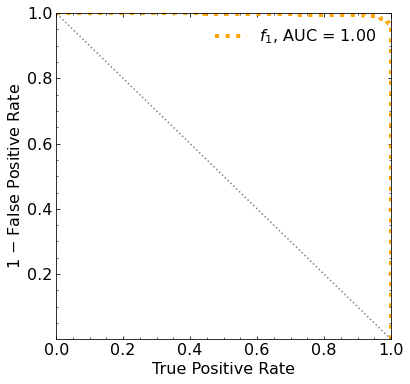

Classification score:


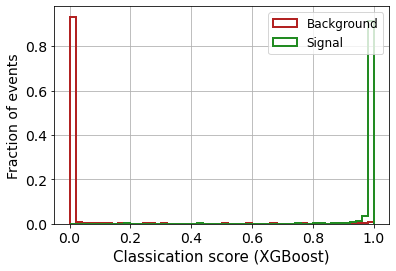


 ROC-AUC =  0.9967804427099337
At least 5 B events per bin, range = [[0, 1]]:
# bins:  3 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  3
range of our data:  [[0, 1]]
number of bins we are going to use:  3
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.485


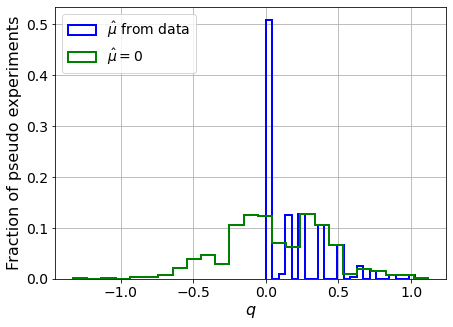

muhat mean:  -0.013091946220661196
Z_bins:  0.1614690926607864
std Z_bins:  0.6713820197539383
Z_bins mu=0:  0.13775927256138445
std Z_bins mu=0:  1.2444957049234935

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.473


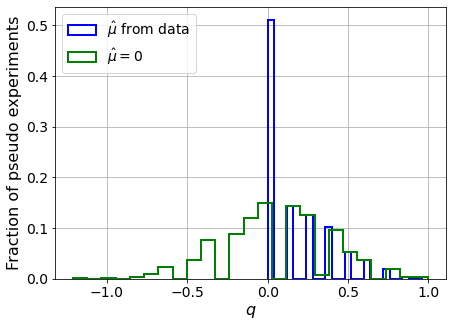

muhat mean:  -0.025916595740887446
Z_bins:  0.16116362095024053
std Z_bins:  0.6509992954569659
Z_bins mu=0:  0.13721717842618514
std Z_bins mu=0:  1.2104525054959676

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.488


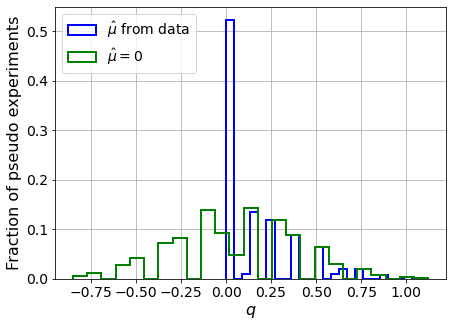

muhat mean:  0.013865870447440018
Z_bins:  0.16064912156648187
std Z_bins:  0.6785379422786119
Z_bins mu=0:  0.13629930438860582
std Z_bins mu=0:  1.2455316115437463

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.496


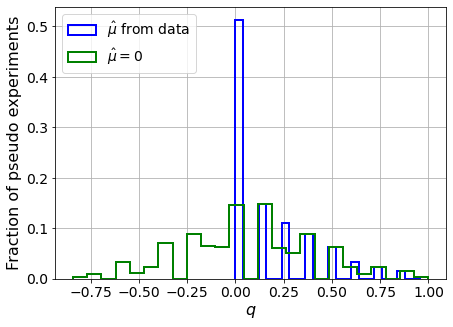

muhat mean:  -0.07778089165221007
Z_bins:  0.1610993093321939
std Z_bins:  0.6994743456008691
Z_bins mu=0:  0.13710278022448705
std Z_bins mu=0:  1.2512549008028948

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.481


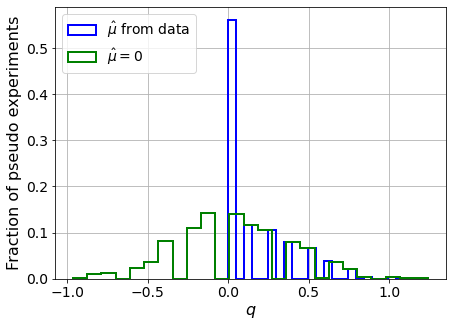

muhat mean:  0.15266877914932295
Z_bins:  0.156352249356173
std Z_bins:  0.7123228376399185
Z_bins mu=0:  0.1283788678233573
std Z_bins mu=0:  1.3693592625907847

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4875


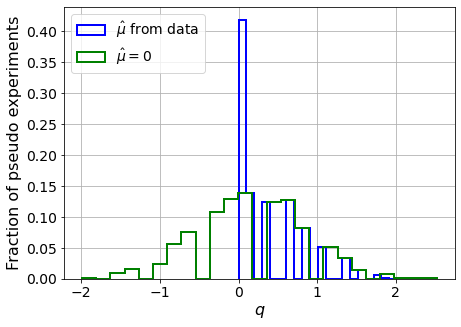

muhat mean:  0.1389834889669516
Z_bins:  0.39576901321444447
std Z_bins:  0.5606343666805824
Z_bins mu=0:  0.38630295726468433
std Z_bins mu=0:  0.8735374540108214

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4875


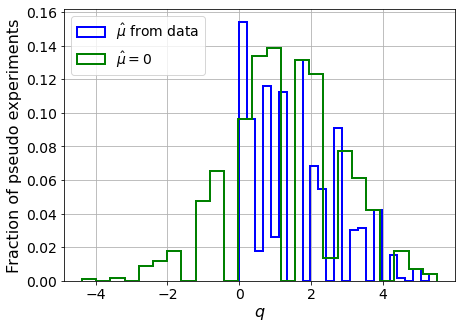

muhat mean:  0.004426987929339461
Z_bins:  1.0570206011868997
std Z_bins:  0.5767481408314478
Z_bins mu=0:  1.0536150713189807
std Z_bins mu=0:  0.7350209476024859

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.5045


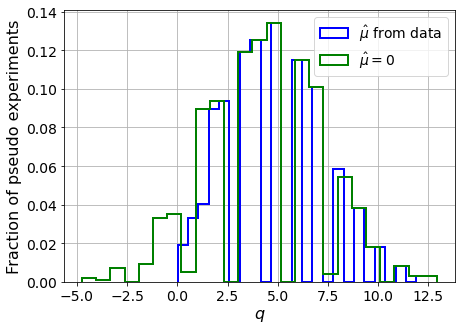

muhat mean:  0.007920282742703098
Z_bins:  2.0308536217093307
std Z_bins:  0.6097804697580397
Z_bins mu=0:  2.0290752844079285
std Z_bins mu=0:  0.7030631856022554

--------

B_expected:  643
S_expected:  22

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.491


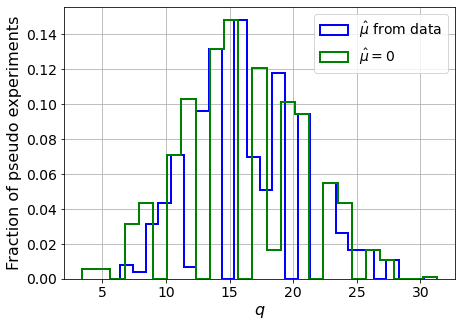

muhat mean:  0.002305746967745966
Z_bins:  3.9558862719069854
std Z_bins:  0.5682159103208383
Z_bins mu=0:  3.9549634297395717
std Z_bins mu=0:  0.6105203918481962

--------

B_expected:  643
S_expected:  47

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.4995


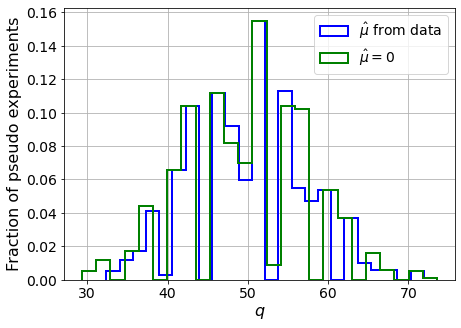

muhat mean:  -0.0007364189523665983
Z_bins:  6.992191387019023
std Z_bins:  0.5116111205820139
Z_bins mu=0:  6.991680429913861
std Z_bins mu=0:  0.5350808188187601

--------


 FINAL RESULT:

[[0.1614690926607864, 0.6713820197539383, -0.013091946220661196, 0.13775927256138445, 1.2444957049234935], [0.16116362095024053, 0.6509992954569659, -0.025916595740887446, 0.13721717842618514, 1.2104525054959676], [0.16064912156648187, 0.6785379422786119, 0.013865870447440018, 0.13629930438860582, 1.2455316115437463], [0.1610993093321939, 0.6994743456008691, -0.07778089165221007, 0.13710278022448705, 1.2512549008028948], [0.156352249356173, 0.7123228376399185, 0.15266877914932295, 0.1283788678233573, 1.3693592625907847], [0.39576901321444447, 0.5606343666805824, 0.1389834889669516, 0.38630295726468433, 0.8735374540108214], [1.0570206011868997, 0.5767481408314478, 0.004426987929339461, 1.0536150713189807, 0.7350209476024859], [2.0308536217093307, 0.6097804697580397, 0.007920282742703098, 2.02907528

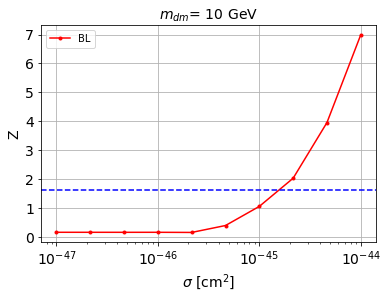


cross_BL_164:  1.684920519919967e-45
cross_BL_164_up:  1.0057771003310818e-45
cross_BL_164_down:  2.4136213524691796e-45

#########################


#########################

mDM =  20 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)

B_pbot.shape:  (5000,)

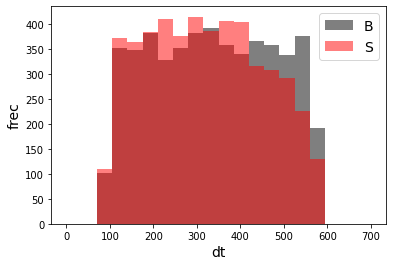

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35219)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35219)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35219)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68493	validation_1-logloss:0.68553
[1]	validation_0-logloss:0.67685	validation_1-logloss:0.67806
[2]	validation_0-logloss:0.66881	validation_1-logloss:0.67064
[3]	validation_0-logloss:0.66092	validation_1-logloss:0.66337
[4]	validation_0-logloss:0.65329	validation_1-logloss:0.65628
[5]	validation_0-logloss:0.64578	validation_1-logloss:0.64930
[6]	validation_0-logloss:0.63840	validation_1-logloss:0.64250
[7]	validation_0-logloss:0.63108	validation_1-logloss:0.63584
[8]	validation_0-logloss:0.62399	validation_1-logloss:0.62921
[9]	validation_0-logloss:0.61693	validation_1-logloss:0.62284
[10]	validation_0-logloss:0.61010	validation_1-logloss:0.61648
[11]	validation_0-logloss:0.60324	validation_1-logloss:0.61033
[12]	validation_0-logloss:0.59657	validation_1-logloss:0.60412
[13]	validation_0-logloss:0.58991	validation_1-logloss:0.59794
[14]	validation_0-logloss:0.58340	validation_1-logloss:0.59201
[15]	validation_0-logloss:0.57703	validation_1-logloss:0.58615
[1

[130]	validation_0-logloss:0.20972	validation_1-logloss:0.25534
[131]	validation_0-logloss:0.20825	validation_1-logloss:0.25409
[132]	validation_0-logloss:0.20673	validation_1-logloss:0.25269
[133]	validation_0-logloss:0.20524	validation_1-logloss:0.25137
[134]	validation_0-logloss:0.20377	validation_1-logloss:0.25006
[135]	validation_0-logloss:0.20235	validation_1-logloss:0.24884
[136]	validation_0-logloss:0.20087	validation_1-logloss:0.24754
[137]	validation_0-logloss:0.19938	validation_1-logloss:0.24625
[138]	validation_0-logloss:0.19795	validation_1-logloss:0.24501
[139]	validation_0-logloss:0.19660	validation_1-logloss:0.24383
[140]	validation_0-logloss:0.19521	validation_1-logloss:0.24258
[141]	validation_0-logloss:0.19387	validation_1-logloss:0.24148
[142]	validation_0-logloss:0.19257	validation_1-logloss:0.24035
[143]	validation_0-logloss:0.19124	validation_1-logloss:0.23922
[144]	validation_0-logloss:0.18994	validation_1-logloss:0.23810
[145]	validation_0-logloss:0.18860	valid

[259]	validation_0-logloss:0.09467	validation_1-logloss:0.16300
[260]	validation_0-logloss:0.09418	validation_1-logloss:0.16267
[261]	validation_0-logloss:0.09368	validation_1-logloss:0.16231
[262]	validation_0-logloss:0.09317	validation_1-logloss:0.16186
[263]	validation_0-logloss:0.09269	validation_1-logloss:0.16153
[264]	validation_0-logloss:0.09221	validation_1-logloss:0.16117
[265]	validation_0-logloss:0.09175	validation_1-logloss:0.16086
[266]	validation_0-logloss:0.09128	validation_1-logloss:0.16051
[267]	validation_0-logloss:0.09080	validation_1-logloss:0.16020
[268]	validation_0-logloss:0.09032	validation_1-logloss:0.15983
[269]	validation_0-logloss:0.08989	validation_1-logloss:0.15955
[270]	validation_0-logloss:0.08946	validation_1-logloss:0.15925
[271]	validation_0-logloss:0.08899	validation_1-logloss:0.15886
[272]	validation_0-logloss:0.08853	validation_1-logloss:0.15857
[273]	validation_0-logloss:0.08809	validation_1-logloss:0.15830
[274]	validation_0-logloss:0.08761	valid

[388]	validation_0-logloss:0.05417	validation_1-logloss:0.13385
[389]	validation_0-logloss:0.05399	validation_1-logloss:0.13373
[390]	validation_0-logloss:0.05376	validation_1-logloss:0.13356
[391]	validation_0-logloss:0.05357	validation_1-logloss:0.13349
[392]	validation_0-logloss:0.05333	validation_1-logloss:0.13334
[393]	validation_0-logloss:0.05312	validation_1-logloss:0.13327
[394]	validation_0-logloss:0.05291	validation_1-logloss:0.13313
[395]	validation_0-logloss:0.05272	validation_1-logloss:0.13293
[396]	validation_0-logloss:0.05253	validation_1-logloss:0.13283
[397]	validation_0-logloss:0.05234	validation_1-logloss:0.13282
[398]	validation_0-logloss:0.05220	validation_1-logloss:0.13266
[399]	validation_0-logloss:0.05202	validation_1-logloss:0.13259
[400]	validation_0-logloss:0.05185	validation_1-logloss:0.13255
[401]	validation_0-logloss:0.05174	validation_1-logloss:0.13246
[402]	validation_0-logloss:0.05153	validation_1-logloss:0.13239
[403]	validation_0-logloss:0.05131	valid

[517]	validation_0-logloss:0.03552	validation_1-logloss:0.12320
[518]	validation_0-logloss:0.03542	validation_1-logloss:0.12318
[519]	validation_0-logloss:0.03531	validation_1-logloss:0.12320
[520]	validation_0-logloss:0.03521	validation_1-logloss:0.12321
[521]	validation_0-logloss:0.03509	validation_1-logloss:0.12318
[522]	validation_0-logloss:0.03498	validation_1-logloss:0.12320
[523]	validation_0-logloss:0.03487	validation_1-logloss:0.12316
[524]	validation_0-logloss:0.03475	validation_1-logloss:0.12307
[525]	validation_0-logloss:0.03465	validation_1-logloss:0.12298
[526]	validation_0-logloss:0.03458	validation_1-logloss:0.12289
[527]	validation_0-logloss:0.03447	validation_1-logloss:0.12282
[528]	validation_0-logloss:0.03439	validation_1-logloss:0.12280
[529]	validation_0-logloss:0.03427	validation_1-logloss:0.12270
[530]	validation_0-logloss:0.03414	validation_1-logloss:0.12263
[531]	validation_0-logloss:0.03403	validation_1-logloss:0.12254
[532]	validation_0-logloss:0.03391	valid

[646]	validation_0-logloss:0.02389	validation_1-logloss:0.11898
[647]	validation_0-logloss:0.02383	validation_1-logloss:0.11895
[648]	validation_0-logloss:0.02377	validation_1-logloss:0.11890
[649]	validation_0-logloss:0.02372	validation_1-logloss:0.11886
[650]	validation_0-logloss:0.02364	validation_1-logloss:0.11885
[651]	validation_0-logloss:0.02354	validation_1-logloss:0.11889
[652]	validation_0-logloss:0.02346	validation_1-logloss:0.11887
[653]	validation_0-logloss:0.02338	validation_1-logloss:0.11881
[654]	validation_0-logloss:0.02332	validation_1-logloss:0.11883
[655]	validation_0-logloss:0.02326	validation_1-logloss:0.11883
[656]	validation_0-logloss:0.02321	validation_1-logloss:0.11885
[657]	validation_0-logloss:0.02313	validation_1-logloss:0.11884
[658]	validation_0-logloss:0.02306	validation_1-logloss:0.11880
[659]	validation_0-logloss:0.02302	validation_1-logloss:0.11876
[660]	validation_0-logloss:0.02293	validation_1-logloss:0.11880
[661]	validation_0-logloss:0.02286	valid

[775]	validation_0-logloss:0.01675	validation_1-logloss:0.11751
[776]	validation_0-logloss:0.01672	validation_1-logloss:0.11749
[777]	validation_0-logloss:0.01666	validation_1-logloss:0.11750
[778]	validation_0-logloss:0.01660	validation_1-logloss:0.11750
[779]	validation_0-logloss:0.01655	validation_1-logloss:0.11749
[780]	validation_0-logloss:0.01649	validation_1-logloss:0.11749
[781]	validation_0-logloss:0.01647	validation_1-logloss:0.11752
[782]	validation_0-logloss:0.01645	validation_1-logloss:0.11752
[783]	validation_0-logloss:0.01640	validation_1-logloss:0.11755
[784]	validation_0-logloss:0.01634	validation_1-logloss:0.11751
[785]	validation_0-logloss:0.01630	validation_1-logloss:0.11752
[786]	validation_0-logloss:0.01627	validation_1-logloss:0.11749
[787]	validation_0-logloss:0.01623	validation_1-logloss:0.11749
[788]	validation_0-logloss:0.01617	validation_1-logloss:0.11752
[789]	validation_0-logloss:0.01613	validation_1-logloss:0.11755
[790]	validation_0-logloss:0.01609	valid

[904]	validation_0-logloss:0.01225	validation_1-logloss:0.11734
[905]	validation_0-logloss:0.01220	validation_1-logloss:0.11735
[906]	validation_0-logloss:0.01218	validation_1-logloss:0.11732
[907]	validation_0-logloss:0.01216	validation_1-logloss:0.11730
[908]	validation_0-logloss:0.01213	validation_1-logloss:0.11735
[909]	validation_0-logloss:0.01211	validation_1-logloss:0.11736
[910]	validation_0-logloss:0.01206	validation_1-logloss:0.11735
[911]	validation_0-logloss:0.01204	validation_1-logloss:0.11733
[912]	validation_0-logloss:0.01200	validation_1-logloss:0.11732
[913]	validation_0-logloss:0.01197	validation_1-logloss:0.11730
[914]	validation_0-logloss:0.01195	validation_1-logloss:0.11729
[915]	validation_0-logloss:0.01191	validation_1-logloss:0.11733
[916]	validation_0-logloss:0.01188	validation_1-logloss:0.11730
[917]	validation_0-logloss:0.01187	validation_1-logloss:0.11732
[918]	validation_0-logloss:0.01184	validation_1-logloss:0.11734
[919]	validation_0-logloss:0.01181	valid

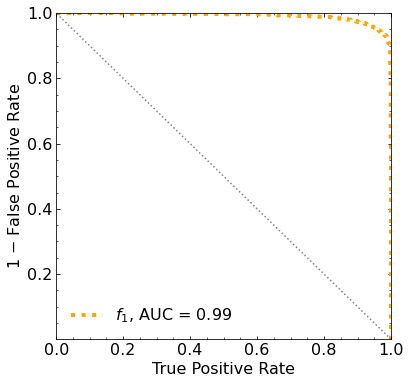

Classification score:


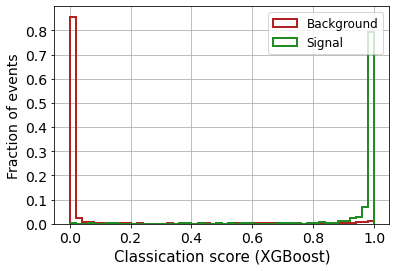


 ROC-AUC =  0.9905305067297646
At least 5 B events per bin, range = [[0, 1]]:
# bins:  4 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  4
range of our data:  [[0, 1]]
number of bins we are going to use:  4
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0805


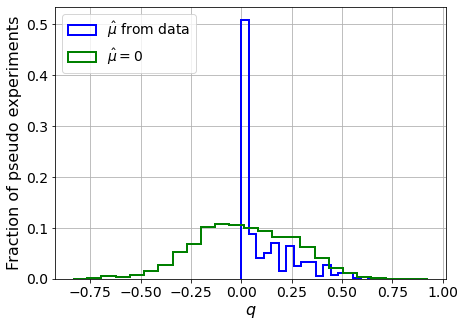

muhat mean:  0.13230669871247253
Z_bins:  0.17410408414046544
std Z_bins:  0.432051671626901
Z_bins mu=0:  0.17410408414046544
std Z_bins mu=0:  0.7059935369793738

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0955


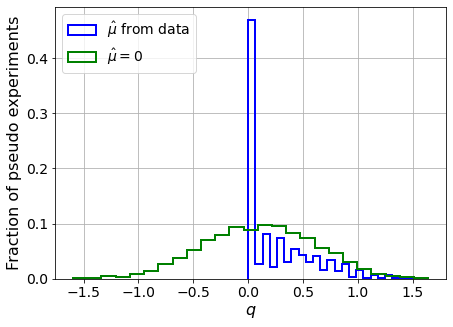

muhat mean:  0.029912815788337575
Z_bins:  0.3666717002883102
std Z_bins:  0.4376192590288248
Z_bins mu=0:  0.3666717002883102
std Z_bins mu=0:  0.6745306447336054

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.078


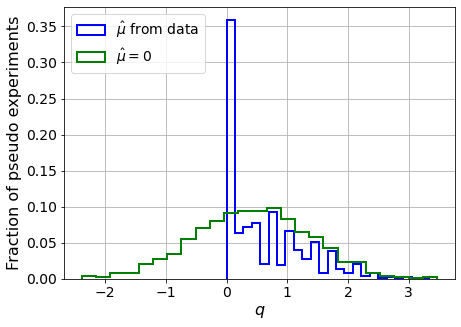

muhat mean:  0.04334002621439935
Z_bins:  0.6757764228382775
std Z_bins:  0.5009173665647362
Z_bins mu=0:  0.6757764228382775
std Z_bins mu=0:  0.7059817351177553

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.087


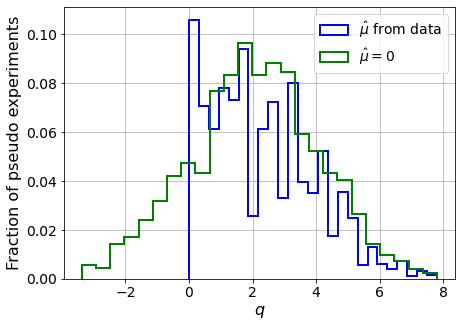

muhat mean:  0.0046924324355783415
Z_bins:  1.4640913805818265
std Z_bins:  0.5646512508087306
Z_bins mu=0:  1.4640913805818265
std Z_bins mu=0:  0.6878907042426455

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0915


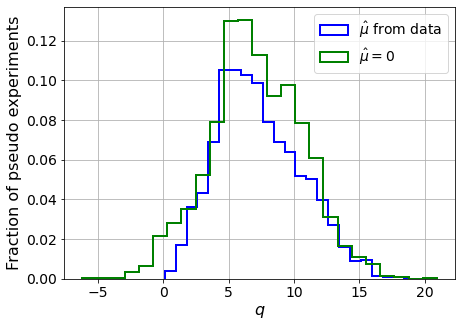

muhat mean:  0.0059081130840860675
Z_bins:  2.6694297367644886
std Z_bins:  0.5988210830145665
Z_bins mu=0:  2.669429537690967
std Z_bins mu=0:  0.6684684385025519

--------

B_expected:  643
S_expected:  40

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.089


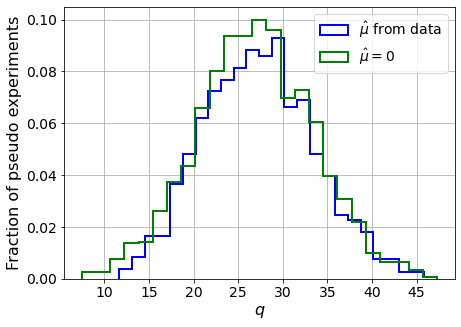

muhat mean:  0.0028319344129209734
Z_bins:  5.2165003789837945
std Z_bins:  0.5916427091590978
Z_bins mu=0:  5.2165003789837945
std Z_bins mu=0:  0.6300061768385508

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.075


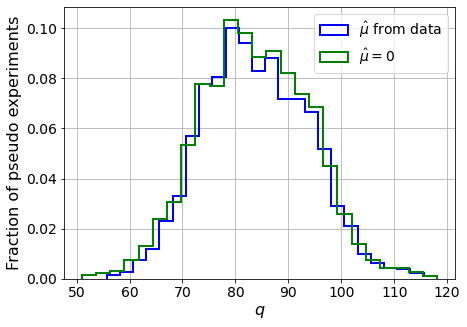

muhat mean:  0.0013889911165408555
Z_bins:  9.131914147148985
std Z_bins:  0.544091133250321
Z_bins mu=0:  9.13171651793595
std Z_bins mu=0:  0.5643161391510256

--------

B_expected:  643
S_expected:  184

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0865


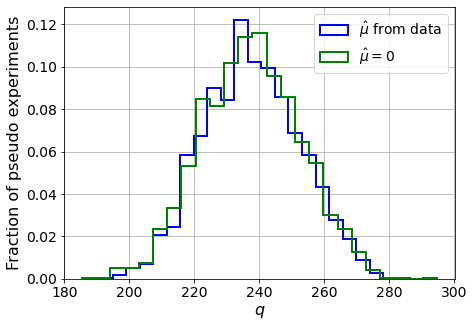

muhat mean:  0.00018039027892836055
Z_bins:  15.409031663793636
std Z_bins:  0.48013931146530286
Z_bins mu=0:  15.409031663793636
std Z_bins mu=0:  0.4920285997401176

--------

B_expected:  643
S_expected:  396

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0905


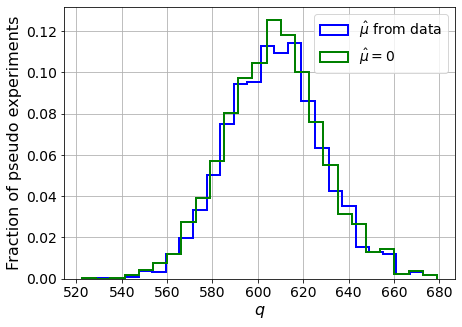

muhat mean:  -0.00011774404263384799
Z_bins:  24.641459398348086
std Z_bins:  0.4309938407827637
Z_bins mu=0:  24.641459398348086
std Z_bins mu=0:  0.43892967946867434

--------

B_expected:  643
S_expected:  854

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.092


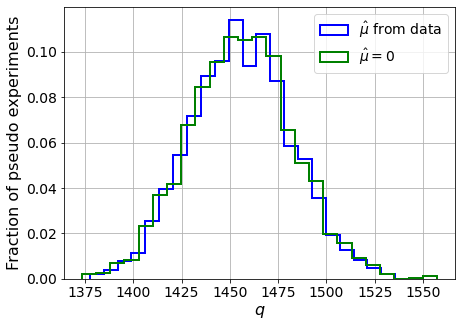

muhat mean:  -0.0001504787451468646
Z_bins:  38.153233136020674
std Z_bins:  0.34700207927137533
Z_bins mu=0:  38.153233136020674
std Z_bins mu=0:  0.35152741466414095

--------


 FINAL RESULT:

[[0.17410408414046544, 0.432051671626901, 0.13230669871247253, 0.17410408414046544, 0.7059935369793738], [0.3666717002883102, 0.4376192590288248, 0.029912815788337575, 0.3666717002883102, 0.6745306447336054], [0.6757764228382775, 0.5009173665647362, 0.04334002621439935, 0.6757764228382775, 0.7059817351177553], [1.4640913805818265, 0.5646512508087306, 0.0046924324355783415, 1.4640913805818265, 0.6878907042426455], [2.6694297367644886, 0.5988210830145665, 0.0059081130840860675, 2.669429537690967, 0.6684684385025519], [5.2165003789837945, 0.5916427091590978, 0.0028319344129209734, 5.2165003789837945, 0.6300061768385508], [9.131914147148985, 0.544091133250321, 0.0013889911165408555, 9.13171651793595, 0.5643161391510256], [15.409031663793636, 0.48013931146530286, 0.00018039027892836055, 15.40903166

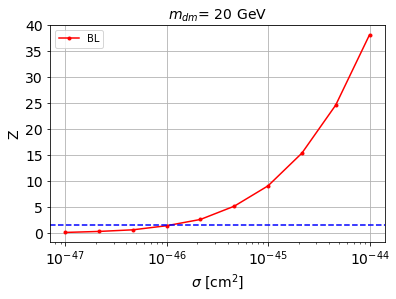


cross_BL_164:  1.1519579186205123e-46
cross_BL_164_up:  7.3149603245070895e-47
cross_BL_164_down:  1.7486820827274497e-46

#########################


#########################

mDM =  35 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)

B_pbot.shape:  (5000,

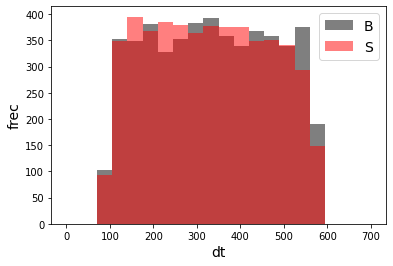

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35219)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35219)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35219)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68610	validation_1-logloss:0.68676
[1]	validation_0-logloss:0.67919	validation_1-logloss:0.68051
[2]	validation_0-logloss:0.67238	validation_1-logloss:0.67427
[3]	validation_0-logloss:0.66574	validation_1-logloss:0.66828
[4]	validation_0-logloss:0.65921	validation_1-logloss:0.66237
[5]	validation_0-logloss:0.65266	validation_1-logloss:0.65647
[6]	validation_0-logloss:0.64623	validation_1-logloss:0.65078
[7]	validation_0-logloss:0.63998	validation_1-logloss:0.64512
[8]	validation_0-logloss:0.63379	validation_1-logloss:0.63962
[9]	validation_0-logloss:0.62772	validation_1-logloss:0.63431
[10]	validation_0-logloss:0.62169	validation_1-logloss:0.62898
[11]	validation_0-logloss:0.61574	validation_1-logloss:0.62381
[12]	validation_0-logloss:0.61003	validation_1-logloss:0.61857
[13]	validation_0-logloss:0.60436	validation_1-logloss:0.61380
[14]	validation_0-logloss:0.59871	validation_1-logloss:0.60891
[15]	validation_0-logloss:0.59316	validation_1-logloss:0.60414
[1

[130]	validation_0-logloss:0.27280	validation_1-logloss:0.33185
[131]	validation_0-logloss:0.27143	validation_1-logloss:0.33078
[132]	validation_0-logloss:0.26999	validation_1-logloss:0.32977
[133]	validation_0-logloss:0.26870	validation_1-logloss:0.32874
[134]	validation_0-logloss:0.26732	validation_1-logloss:0.32768
[135]	validation_0-logloss:0.26595	validation_1-logloss:0.32670
[136]	validation_0-logloss:0.26466	validation_1-logloss:0.32586
[137]	validation_0-logloss:0.26332	validation_1-logloss:0.32490
[138]	validation_0-logloss:0.26197	validation_1-logloss:0.32395
[139]	validation_0-logloss:0.26074	validation_1-logloss:0.32296
[140]	validation_0-logloss:0.25954	validation_1-logloss:0.32204
[141]	validation_0-logloss:0.25831	validation_1-logloss:0.32119
[142]	validation_0-logloss:0.25701	validation_1-logloss:0.32020
[143]	validation_0-logloss:0.25575	validation_1-logloss:0.31936
[144]	validation_0-logloss:0.25451	validation_1-logloss:0.31838
[145]	validation_0-logloss:0.25329	valid

[259]	validation_0-logloss:0.15728	validation_1-logloss:0.24927
[260]	validation_0-logloss:0.15662	validation_1-logloss:0.24888
[261]	validation_0-logloss:0.15607	validation_1-logloss:0.24852
[262]	validation_0-logloss:0.15553	validation_1-logloss:0.24823
[263]	validation_0-logloss:0.15498	validation_1-logloss:0.24797
[264]	validation_0-logloss:0.15440	validation_1-logloss:0.24759
[265]	validation_0-logloss:0.15382	validation_1-logloss:0.24725
[266]	validation_0-logloss:0.15333	validation_1-logloss:0.24695
[267]	validation_0-logloss:0.15274	validation_1-logloss:0.24660
[268]	validation_0-logloss:0.15217	validation_1-logloss:0.24625
[269]	validation_0-logloss:0.15161	validation_1-logloss:0.24596
[270]	validation_0-logloss:0.15111	validation_1-logloss:0.24573
[271]	validation_0-logloss:0.15057	validation_1-logloss:0.24549
[272]	validation_0-logloss:0.15010	validation_1-logloss:0.24512
[273]	validation_0-logloss:0.14961	validation_1-logloss:0.24481
[274]	validation_0-logloss:0.14911	valid

[388]	validation_0-logloss:0.10545	validation_1-logloss:0.22258
[389]	validation_0-logloss:0.10512	validation_1-logloss:0.22248
[390]	validation_0-logloss:0.10486	validation_1-logloss:0.22237
[391]	validation_0-logloss:0.10452	validation_1-logloss:0.22221
[392]	validation_0-logloss:0.10423	validation_1-logloss:0.22217
[393]	validation_0-logloss:0.10385	validation_1-logloss:0.22198
[394]	validation_0-logloss:0.10358	validation_1-logloss:0.22186
[395]	validation_0-logloss:0.10321	validation_1-logloss:0.22168
[396]	validation_0-logloss:0.10290	validation_1-logloss:0.22154
[397]	validation_0-logloss:0.10253	validation_1-logloss:0.22137
[398]	validation_0-logloss:0.10221	validation_1-logloss:0.22122
[399]	validation_0-logloss:0.10192	validation_1-logloss:0.22110
[400]	validation_0-logloss:0.10161	validation_1-logloss:0.22080
[401]	validation_0-logloss:0.10133	validation_1-logloss:0.22076
[402]	validation_0-logloss:0.10105	validation_1-logloss:0.22071
[403]	validation_0-logloss:0.10075	valid

[517]	validation_0-logloss:0.07452	validation_1-logloss:0.20928
[518]	validation_0-logloss:0.07431	validation_1-logloss:0.20915
[519]	validation_0-logloss:0.07414	validation_1-logloss:0.20913
[520]	validation_0-logloss:0.07393	validation_1-logloss:0.20903
[521]	validation_0-logloss:0.07368	validation_1-logloss:0.20891
[522]	validation_0-logloss:0.07350	validation_1-logloss:0.20875
[523]	validation_0-logloss:0.07334	validation_1-logloss:0.20870
[524]	validation_0-logloss:0.07319	validation_1-logloss:0.20858
[525]	validation_0-logloss:0.07308	validation_1-logloss:0.20846
[526]	validation_0-logloss:0.07290	validation_1-logloss:0.20850
[527]	validation_0-logloss:0.07269	validation_1-logloss:0.20840
[528]	validation_0-logloss:0.07250	validation_1-logloss:0.20841
[529]	validation_0-logloss:0.07240	validation_1-logloss:0.20832
[530]	validation_0-logloss:0.07219	validation_1-logloss:0.20819
[531]	validation_0-logloss:0.07203	validation_1-logloss:0.20811
[532]	validation_0-logloss:0.07186	valid

[646]	validation_0-logloss:0.05533	validation_1-logloss:0.20180
[647]	validation_0-logloss:0.05518	validation_1-logloss:0.20170
[648]	validation_0-logloss:0.05507	validation_1-logloss:0.20170
[649]	validation_0-logloss:0.05491	validation_1-logloss:0.20167
[650]	validation_0-logloss:0.05484	validation_1-logloss:0.20163
[651]	validation_0-logloss:0.05474	validation_1-logloss:0.20155
[652]	validation_0-logloss:0.05468	validation_1-logloss:0.20153
[653]	validation_0-logloss:0.05456	validation_1-logloss:0.20144
[654]	validation_0-logloss:0.05448	validation_1-logloss:0.20144
[655]	validation_0-logloss:0.05434	validation_1-logloss:0.20128
[656]	validation_0-logloss:0.05423	validation_1-logloss:0.20132
[657]	validation_0-logloss:0.05414	validation_1-logloss:0.20130
[658]	validation_0-logloss:0.05399	validation_1-logloss:0.20123
[659]	validation_0-logloss:0.05387	validation_1-logloss:0.20126
[660]	validation_0-logloss:0.05375	validation_1-logloss:0.20119
[661]	validation_0-logloss:0.05361	valid

[775]	validation_0-logloss:0.04240	validation_1-logloss:0.19608
[776]	validation_0-logloss:0.04232	validation_1-logloss:0.19611
[777]	validation_0-logloss:0.04223	validation_1-logloss:0.19613
[778]	validation_0-logloss:0.04216	validation_1-logloss:0.19608
[779]	validation_0-logloss:0.04212	validation_1-logloss:0.19612
[780]	validation_0-logloss:0.04204	validation_1-logloss:0.19600
[781]	validation_0-logloss:0.04196	validation_1-logloss:0.19597
[782]	validation_0-logloss:0.04186	validation_1-logloss:0.19603
[783]	validation_0-logloss:0.04175	validation_1-logloss:0.19599
[784]	validation_0-logloss:0.04168	validation_1-logloss:0.19596
[785]	validation_0-logloss:0.04163	validation_1-logloss:0.19596
[786]	validation_0-logloss:0.04156	validation_1-logloss:0.19584
[787]	validation_0-logloss:0.04149	validation_1-logloss:0.19590
[788]	validation_0-logloss:0.04144	validation_1-logloss:0.19593
[789]	validation_0-logloss:0.04135	validation_1-logloss:0.19594
[790]	validation_0-logloss:0.04127	valid

[904]	validation_0-logloss:0.03361	validation_1-logloss:0.19456
[905]	validation_0-logloss:0.03355	validation_1-logloss:0.19455
[906]	validation_0-logloss:0.03349	validation_1-logloss:0.19457
[907]	validation_0-logloss:0.03344	validation_1-logloss:0.19455
[908]	validation_0-logloss:0.03340	validation_1-logloss:0.19459
[909]	validation_0-logloss:0.03334	validation_1-logloss:0.19451
[910]	validation_0-logloss:0.03333	validation_1-logloss:0.19449
[911]	validation_0-logloss:0.03326	validation_1-logloss:0.19446
[912]	validation_0-logloss:0.03320	validation_1-logloss:0.19443
[913]	validation_0-logloss:0.03317	validation_1-logloss:0.19443
[914]	validation_0-logloss:0.03310	validation_1-logloss:0.19433
[915]	validation_0-logloss:0.03307	validation_1-logloss:0.19436
[916]	validation_0-logloss:0.03300	validation_1-logloss:0.19439
[917]	validation_0-logloss:0.03291	validation_1-logloss:0.19438
[918]	validation_0-logloss:0.03284	validation_1-logloss:0.19439
[919]	validation_0-logloss:0.03276	valid

[1032]	validation_0-logloss:0.02683	validation_1-logloss:0.19349
[1033]	validation_0-logloss:0.02681	validation_1-logloss:0.19353
[1034]	validation_0-logloss:0.02679	validation_1-logloss:0.19351
[1035]	validation_0-logloss:0.02675	validation_1-logloss:0.19348
[1036]	validation_0-logloss:0.02669	validation_1-logloss:0.19353
[1037]	validation_0-logloss:0.02666	validation_1-logloss:0.19352
[1038]	validation_0-logloss:0.02662	validation_1-logloss:0.19358
[1039]	validation_0-logloss:0.02658	validation_1-logloss:0.19362
[1040]	validation_0-logloss:0.02652	validation_1-logloss:0.19357
[1041]	validation_0-logloss:0.02646	validation_1-logloss:0.19358
[1042]	validation_0-logloss:0.02639	validation_1-logloss:0.19361
[1043]	validation_0-logloss:0.02635	validation_1-logloss:0.19362
[1044]	validation_0-logloss:0.02632	validation_1-logloss:0.19358
[1045]	validation_0-logloss:0.02627	validation_1-logloss:0.19359
[1046]	validation_0-logloss:0.02624	validation_1-logloss:0.19358
[1047]	validation_0-loglo

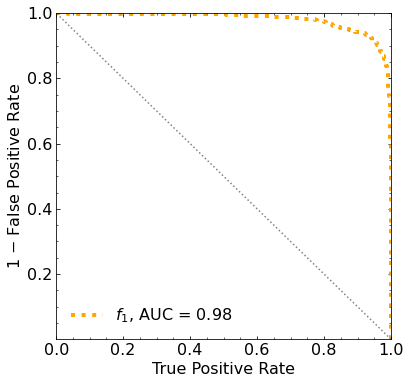

Classification score:


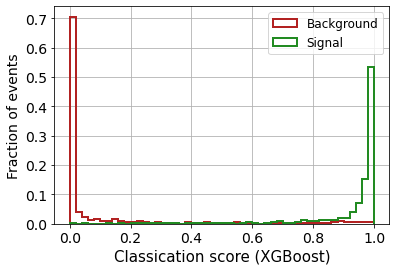


 ROC-AUC =  0.979771013869256
At least 5 B events per bin, range = [[0, 1]]:
# bins:  9 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  9
range of our data:  [[0, 1]]
number of bins we are going to use:  9
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1415


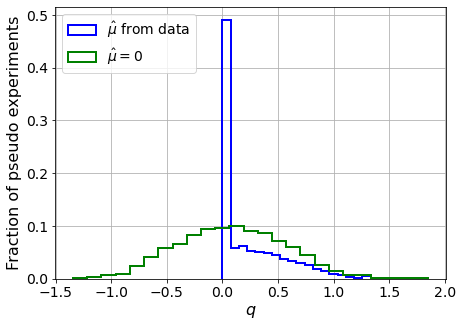

muhat mean:  0.11158098830429983
Z_bins:  0.29313764361972894
std Z_bins:  0.5325346286504986
Z_bins mu=0:  0.28998772085682206
std Z_bins mu=0:  0.8327054406495791

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1345


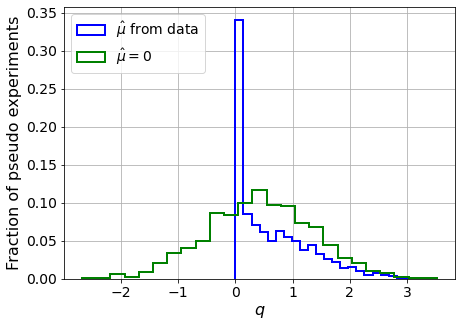

muhat mean:  -0.008200057771695333
Z_bins:  0.6561575567223107
std Z_bins:  0.5100135796078544
Z_bins mu=0:  0.656151176088359
std Z_bins mu=0:  0.7066559194580109

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1415


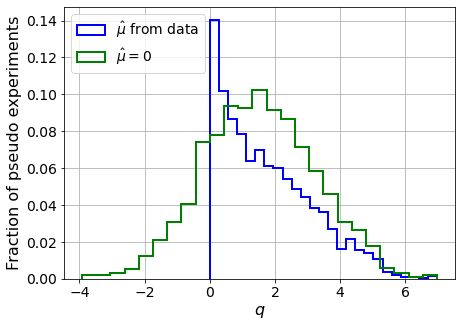

muhat mean:  0.014211658062628084
Z_bins:  1.2278932989473887
std Z_bins:  0.5690975604496944
Z_bins mu=0:  1.2272600274526966
std Z_bins mu=0:  0.6999663429061092

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.145


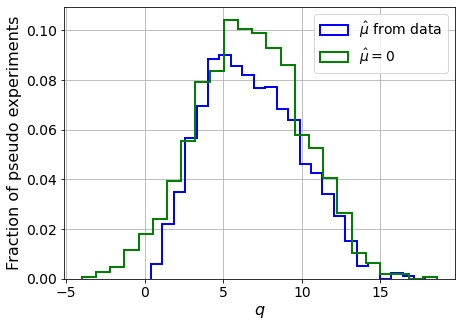

muhat mean:  0.007106956497641048
Z_bins:  2.5599940603963978
std Z_bins:  0.5934767644804413
Z_bins mu=0:  2.5595395806230865
std Z_bins mu=0:  0.6634242194099759

--------

B_expected:  643
S_expected:  39

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1455


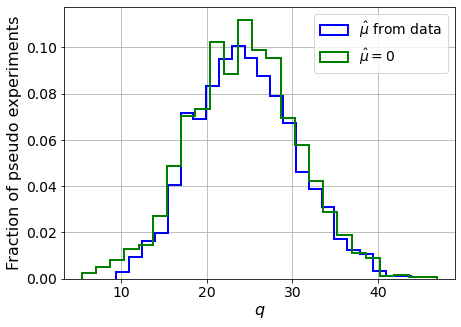

muhat mean:  -0.0007110552083747459
Z_bins:  4.933822222286876
std Z_bins:  0.5981230265035943
Z_bins mu=0:  4.9336321926807205
std Z_bins mu=0:  0.6360529244402242

--------

B_expected:  643
S_expected:  83

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1415


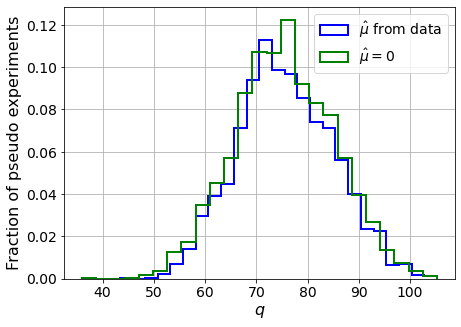

muhat mean:  7.518862265514076e-05
Z_bins:  8.674029548193998
std Z_bins:  0.540713166788185
Z_bins mu=0:  8.67340270501034
std Z_bins mu=0:  0.561481095893202

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.132


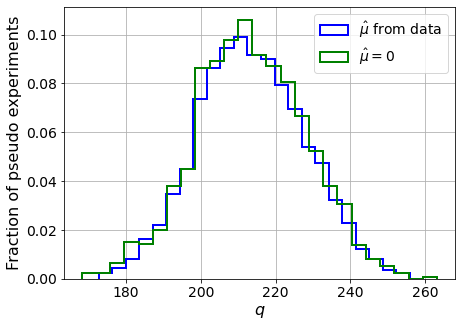

muhat mean:  0.00046534991025633953
Z_bins:  14.593373320752589
std Z_bins:  0.49031238262852206
Z_bins mu=0:  14.593145258164142
std Z_bins mu=0:  0.5031256474246644

--------

B_expected:  643
S_expected:  385

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1465


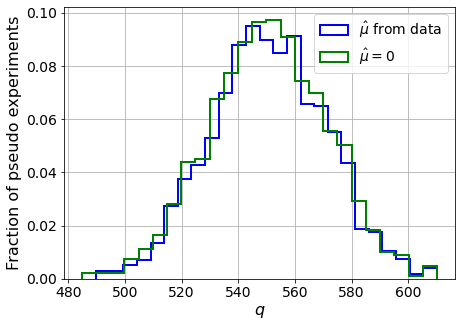

muhat mean:  0.0005499462553387039
Z_bins:  23.461490044211427
std Z_bins:  0.4325662407903603
Z_bins mu=0:  23.461150525751684
std Z_bins mu=0:  0.4414291310339907

--------

B_expected:  643
S_expected:  830

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.151


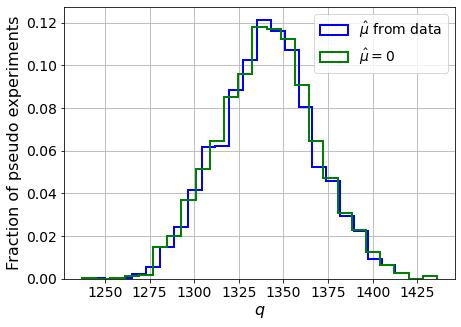

muhat mean:  7.803927293160421e-05
Z_bins:  36.62184528218481
std Z_bins:  0.3693029699647748
Z_bins mu=0:  36.62184528218481
std Z_bins mu=0:  0.373991331570956

--------

B_expected:  643
S_expected:  1787

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1385


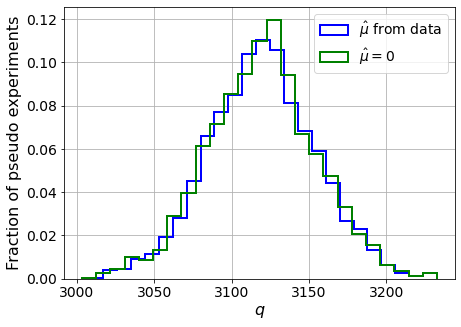

muhat mean:  0.0001901410879168635
Z_bins:  55.85568768403203
std Z_bins:  0.31292373551187264
Z_bins mu=0:  55.85565955973817
std Z_bins mu=0:  0.316503325963894

--------


 FINAL RESULT:

[[0.29313764361972894, 0.5325346286504986, 0.11158098830429983, 0.28998772085682206, 0.8327054406495791], [0.6561575567223107, 0.5100135796078544, -0.008200057771695333, 0.656151176088359, 0.7066559194580109], [1.2278932989473887, 0.5690975604496944, 0.014211658062628084, 1.2272600274526966, 0.6999663429061092], [2.5599940603963978, 0.5934767644804413, 0.007106956497641048, 2.5595395806230865, 0.6634242194099759], [4.933822222286876, 0.5981230265035943, -0.0007110552083747459, 4.9336321926807205, 0.6360529244402242], [8.674029548193998, 0.540713166788185, 7.518862265514076e-05, 8.67340270501034, 0.561481095893202], [14.593373320752589, 0.49031238262852206, 0.00046534991025633953, 14.593145258164142, 0.5031256474246644], [23.461490044211427, 0.4325662407903603, 0.0005499462553387039, 23.461150525751

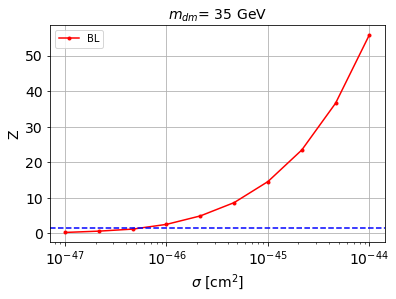


cross_BL_164:  6.264662232110048e-47
cross_BL_164_up:  4.044345879943871e-47
cross_BL_164_down:  8.635953595065747e-47

#########################


#########################

mDM =  50 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)

B_pbot.shape:  (5000,)
B

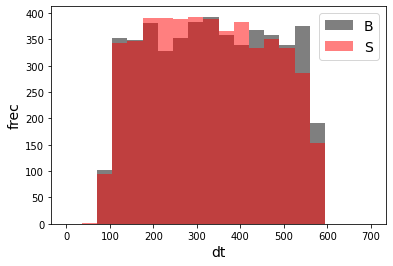

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35219)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35219)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35219)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68669	validation_1-logloss:0.68742
[1]	validation_0-logloss:0.68032	validation_1-logloss:0.68178
[2]	validation_0-logloss:0.67411	validation_1-logloss:0.67625
[3]	validation_0-logloss:0.66796	validation_1-logloss:0.67074
[4]	validation_0-logloss:0.66193	validation_1-logloss:0.66546
[5]	validation_0-logloss:0.65599	validation_1-logloss:0.66016
[6]	validation_0-logloss:0.65013	validation_1-logloss:0.65507
[7]	validation_0-logloss:0.64442	validation_1-logloss:0.64998
[8]	validation_0-logloss:0.63874	validation_1-logloss:0.64501
[9]	validation_0-logloss:0.63320	validation_1-logloss:0.64027
[10]	validation_0-logloss:0.62777	validation_1-logloss:0.63552
[11]	validation_0-logloss:0.62235	validation_1-logloss:0.63081
[12]	validation_0-logloss:0.61709	validation_1-logloss:0.62618
[13]	validation_0-logloss:0.61186	validation_1-logloss:0.62168
[14]	validation_0-logloss:0.60671	validation_1-logloss:0.61724
[15]	validation_0-logloss:0.60171	validation_1-logloss:0.61285
[1

[130]	validation_0-logloss:0.29966	validation_1-logloss:0.36502
[131]	validation_0-logloss:0.29830	validation_1-logloss:0.36420
[132]	validation_0-logloss:0.29696	validation_1-logloss:0.36327
[133]	validation_0-logloss:0.29563	validation_1-logloss:0.36218
[134]	validation_0-logloss:0.29431	validation_1-logloss:0.36129
[135]	validation_0-logloss:0.29299	validation_1-logloss:0.36021
[136]	validation_0-logloss:0.29165	validation_1-logloss:0.35925
[137]	validation_0-logloss:0.29039	validation_1-logloss:0.35829
[138]	validation_0-logloss:0.28909	validation_1-logloss:0.35742
[139]	validation_0-logloss:0.28778	validation_1-logloss:0.35651
[140]	validation_0-logloss:0.28649	validation_1-logloss:0.35548
[141]	validation_0-logloss:0.28525	validation_1-logloss:0.35453
[142]	validation_0-logloss:0.28402	validation_1-logloss:0.35357
[143]	validation_0-logloss:0.28279	validation_1-logloss:0.35259
[144]	validation_0-logloss:0.28150	validation_1-logloss:0.35172
[145]	validation_0-logloss:0.28026	valid

[259]	validation_0-logloss:0.18452	validation_1-logloss:0.28772
[260]	validation_0-logloss:0.18389	validation_1-logloss:0.28733
[261]	validation_0-logloss:0.18335	validation_1-logloss:0.28698
[262]	validation_0-logloss:0.18282	validation_1-logloss:0.28674
[263]	validation_0-logloss:0.18225	validation_1-logloss:0.28634
[264]	validation_0-logloss:0.18166	validation_1-logloss:0.28600
[265]	validation_0-logloss:0.18105	validation_1-logloss:0.28568
[266]	validation_0-logloss:0.18044	validation_1-logloss:0.28537
[267]	validation_0-logloss:0.17987	validation_1-logloss:0.28502
[268]	validation_0-logloss:0.17938	validation_1-logloss:0.28477
[269]	validation_0-logloss:0.17877	validation_1-logloss:0.28440
[270]	validation_0-logloss:0.17815	validation_1-logloss:0.28409
[271]	validation_0-logloss:0.17764	validation_1-logloss:0.28374
[272]	validation_0-logloss:0.17709	validation_1-logloss:0.28328
[273]	validation_0-logloss:0.17655	validation_1-logloss:0.28300
[274]	validation_0-logloss:0.17600	valid

[388]	validation_0-logloss:0.12764	validation_1-logloss:0.25541
[389]	validation_0-logloss:0.12735	validation_1-logloss:0.25527
[390]	validation_0-logloss:0.12698	validation_1-logloss:0.25507
[391]	validation_0-logloss:0.12664	validation_1-logloss:0.25490
[392]	validation_0-logloss:0.12632	validation_1-logloss:0.25482
[393]	validation_0-logloss:0.12600	validation_1-logloss:0.25455
[394]	validation_0-logloss:0.12567	validation_1-logloss:0.25444
[395]	validation_0-logloss:0.12532	validation_1-logloss:0.25430
[396]	validation_0-logloss:0.12499	validation_1-logloss:0.25410
[397]	validation_0-logloss:0.12468	validation_1-logloss:0.25400
[398]	validation_0-logloss:0.12445	validation_1-logloss:0.25386
[399]	validation_0-logloss:0.12413	validation_1-logloss:0.25370
[400]	validation_0-logloss:0.12380	validation_1-logloss:0.25354
[401]	validation_0-logloss:0.12343	validation_1-logloss:0.25331
[402]	validation_0-logloss:0.12312	validation_1-logloss:0.25310
[403]	validation_0-logloss:0.12284	valid

[517]	validation_0-logloss:0.09279	validation_1-logloss:0.23856
[518]	validation_0-logloss:0.09255	validation_1-logloss:0.23832
[519]	validation_0-logloss:0.09231	validation_1-logloss:0.23820
[520]	validation_0-logloss:0.09213	validation_1-logloss:0.23811
[521]	validation_0-logloss:0.09190	validation_1-logloss:0.23795
[522]	validation_0-logloss:0.09172	validation_1-logloss:0.23777
[523]	validation_0-logloss:0.09146	validation_1-logloss:0.23753
[524]	validation_0-logloss:0.09122	validation_1-logloss:0.23753
[525]	validation_0-logloss:0.09100	validation_1-logloss:0.23735
[526]	validation_0-logloss:0.09079	validation_1-logloss:0.23718
[527]	validation_0-logloss:0.09062	validation_1-logloss:0.23709
[528]	validation_0-logloss:0.09038	validation_1-logloss:0.23700
[529]	validation_0-logloss:0.09019	validation_1-logloss:0.23696
[530]	validation_0-logloss:0.08999	validation_1-logloss:0.23685
[531]	validation_0-logloss:0.08974	validation_1-logloss:0.23676
[532]	validation_0-logloss:0.08958	valid

[646]	validation_0-logloss:0.06988	validation_1-logloss:0.22715
[647]	validation_0-logloss:0.06970	validation_1-logloss:0.22709
[648]	validation_0-logloss:0.06957	validation_1-logloss:0.22708
[649]	validation_0-logloss:0.06939	validation_1-logloss:0.22711
[650]	validation_0-logloss:0.06926	validation_1-logloss:0.22697
[651]	validation_0-logloss:0.06907	validation_1-logloss:0.22691
[652]	validation_0-logloss:0.06893	validation_1-logloss:0.22684
[653]	validation_0-logloss:0.06873	validation_1-logloss:0.22677
[654]	validation_0-logloss:0.06861	validation_1-logloss:0.22671
[655]	validation_0-logloss:0.06846	validation_1-logloss:0.22660
[656]	validation_0-logloss:0.06834	validation_1-logloss:0.22654
[657]	validation_0-logloss:0.06821	validation_1-logloss:0.22650
[658]	validation_0-logloss:0.06807	validation_1-logloss:0.22639
[659]	validation_0-logloss:0.06790	validation_1-logloss:0.22636
[660]	validation_0-logloss:0.06773	validation_1-logloss:0.22623
[661]	validation_0-logloss:0.06758	valid

[775]	validation_0-logloss:0.05344	validation_1-logloss:0.22005
[776]	validation_0-logloss:0.05336	validation_1-logloss:0.22001
[777]	validation_0-logloss:0.05330	validation_1-logloss:0.22004
[778]	validation_0-logloss:0.05317	validation_1-logloss:0.21997
[779]	validation_0-logloss:0.05310	validation_1-logloss:0.21997
[780]	validation_0-logloss:0.05300	validation_1-logloss:0.21992
[781]	validation_0-logloss:0.05289	validation_1-logloss:0.21987
[782]	validation_0-logloss:0.05280	validation_1-logloss:0.21994
[783]	validation_0-logloss:0.05266	validation_1-logloss:0.21990
[784]	validation_0-logloss:0.05259	validation_1-logloss:0.21987
[785]	validation_0-logloss:0.05250	validation_1-logloss:0.21984
[786]	validation_0-logloss:0.05239	validation_1-logloss:0.21979
[787]	validation_0-logloss:0.05235	validation_1-logloss:0.21980
[788]	validation_0-logloss:0.05226	validation_1-logloss:0.21979
[789]	validation_0-logloss:0.05216	validation_1-logloss:0.21976
[790]	validation_0-logloss:0.05206	valid

[904]	validation_0-logloss:0.04251	validation_1-logloss:0.21767
[905]	validation_0-logloss:0.04246	validation_1-logloss:0.21764
[906]	validation_0-logloss:0.04239	validation_1-logloss:0.21768
[907]	validation_0-logloss:0.04233	validation_1-logloss:0.21768
[908]	validation_0-logloss:0.04224	validation_1-logloss:0.21757
[909]	validation_0-logloss:0.04217	validation_1-logloss:0.21761
[910]	validation_0-logloss:0.04208	validation_1-logloss:0.21757
[911]	validation_0-logloss:0.04202	validation_1-logloss:0.21751
[912]	validation_0-logloss:0.04194	validation_1-logloss:0.21745
[913]	validation_0-logloss:0.04186	validation_1-logloss:0.21741
[914]	validation_0-logloss:0.04179	validation_1-logloss:0.21738
[915]	validation_0-logloss:0.04176	validation_1-logloss:0.21738
[916]	validation_0-logloss:0.04169	validation_1-logloss:0.21738
[917]	validation_0-logloss:0.04160	validation_1-logloss:0.21729
[918]	validation_0-logloss:0.04151	validation_1-logloss:0.21734
[919]	validation_0-logloss:0.04146	valid

[1032]	validation_0-logloss:0.03420	validation_1-logloss:0.21615
[1033]	validation_0-logloss:0.03415	validation_1-logloss:0.21615
[1034]	validation_0-logloss:0.03412	validation_1-logloss:0.21612
[1035]	validation_0-logloss:0.03404	validation_1-logloss:0.21612
[1036]	validation_0-logloss:0.03399	validation_1-logloss:0.21619
[1037]	validation_0-logloss:0.03392	validation_1-logloss:0.21621
[1038]	validation_0-logloss:0.03386	validation_1-logloss:0.21624
[1039]	validation_0-logloss:0.03381	validation_1-logloss:0.21623
[1040]	validation_0-logloss:0.03373	validation_1-logloss:0.21627
[1041]	validation_0-logloss:0.03368	validation_1-logloss:0.21625
[1042]	validation_0-logloss:0.03361	validation_1-logloss:0.21627
[1043]	validation_0-logloss:0.03355	validation_1-logloss:0.21634
[1044]	validation_0-logloss:0.03351	validation_1-logloss:0.21632
[1045]	validation_0-logloss:0.03347	validation_1-logloss:0.21626
[1046]	validation_0-logloss:0.03343	validation_1-logloss:0.21625
[1047]	validation_0-loglo

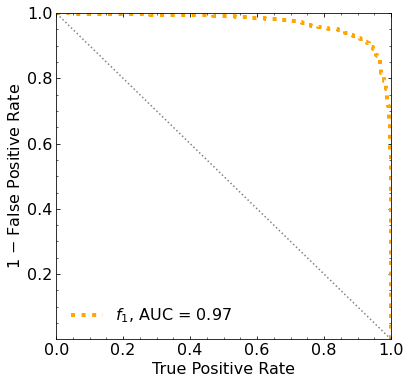

Classification score:


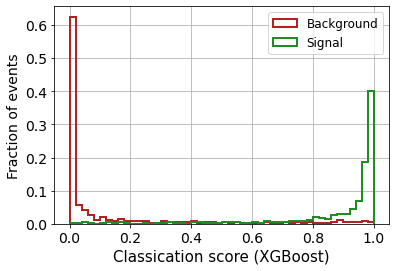


 ROC-AUC =  0.9712864656956139
At least 5 B events per bin, range = [[0, 1]]:
# bins:  11 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  11
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.183


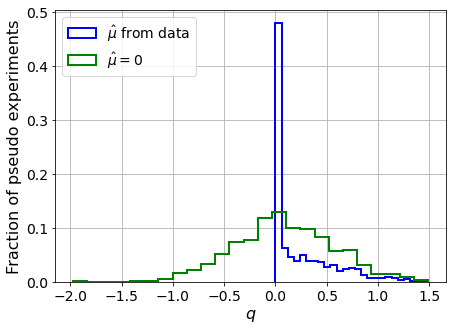

muhat mean:  0.11151896536397017
Z_bins:  0.27306190496427357
std Z_bins:  0.5745321071732615
Z_bins mu=0:  0.2647474554475547
std Z_bins mu=0:  0.9113501184839953

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.182


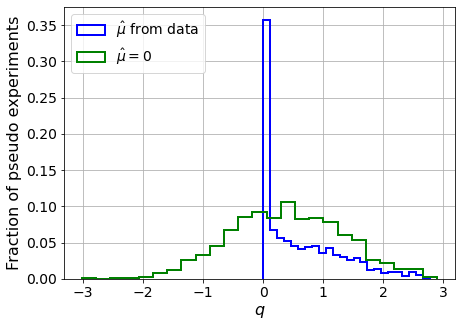

muhat mean:  0.04482178691002473
Z_bins:  0.6286309126824173
std Z_bins:  0.530101444573781
Z_bins mu=0:  0.6271142951149392
std Z_bins mu=0:  0.744738965025882

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1935


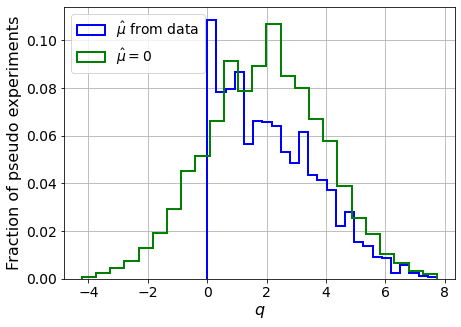

muhat mean:  0.011823191408606826
Z_bins:  1.415359411256114
std Z_bins:  0.5660608793088231
Z_bins mu=0:  1.415359411256114
std Z_bins mu=0:  0.6910183638027086

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2


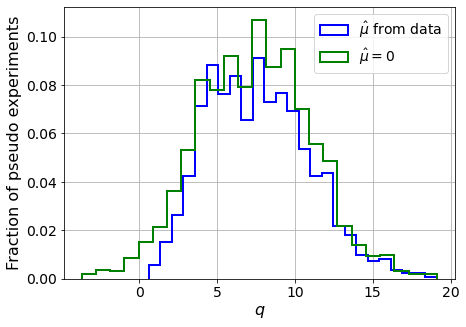

muhat mean:  0.002952413362930484
Z_bins:  2.732293978426461
std Z_bins:  0.5937036789977422
Z_bins mu=0:  2.7322621352629715
std Z_bins mu=0:  0.6575475840294924

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.189


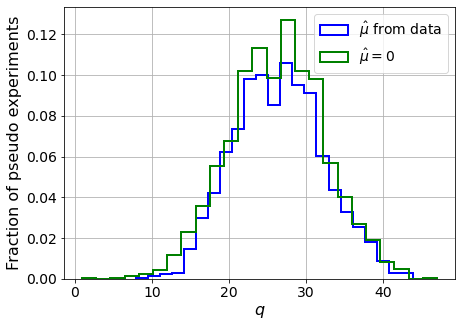

muhat mean:  -0.0028412848767485253
Z_bins:  5.139818985564131
std Z_bins:  0.5652489853547816
Z_bins mu=0:  5.13981811852884
std Z_bins mu=0:  0.6000484457360336

--------

B_expected:  643
S_expected:  89

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2025


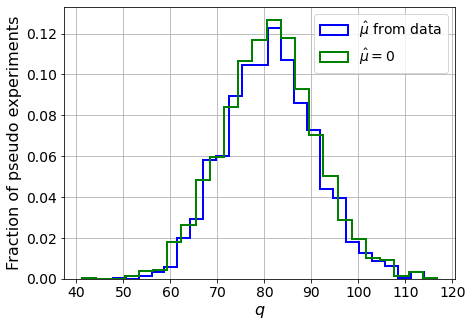

muhat mean:  0.001514838268428459
Z_bins:  9.015247525776935
std Z_bins:  0.5333813624456007
Z_bins mu=0:  9.015112010860408
std Z_bins mu=0:  0.5535096133818147

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2015


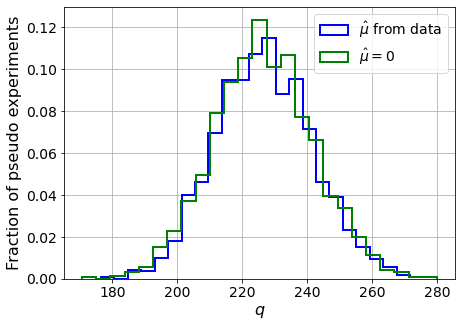

muhat mean:  0.0010207128747118308
Z_bins:  15.048232984249543
std Z_bins:  0.49415915126289206
Z_bins mu=0:  15.046099727521225
std Z_bins mu=0:  0.5069691979061706

--------

B_expected:  643
S_expected:  413

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.197


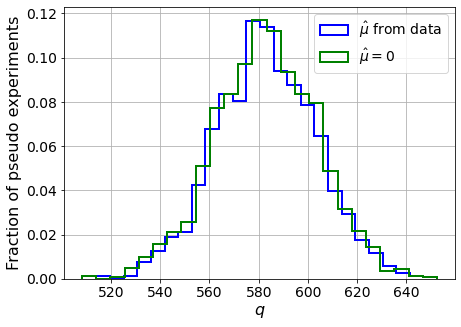

muhat mean:  0.000130462054361904
Z_bins:  24.142031452938593
std Z_bins:  0.42128286933123443
Z_bins mu=0:  24.141939281070666
std Z_bins mu=0:  0.42865469892915703

--------

B_expected:  643
S_expected:  889

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.185


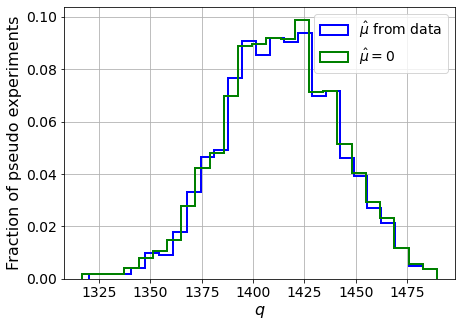

muhat mean:  0.00023161092760989703
Z_bins:  37.59583216208276
std Z_bins:  0.37255076424998546
Z_bins mu=0:  37.595285356019694
std Z_bins mu=0:  0.3775422481413038

--------

B_expected:  643
S_expected:  1915

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2055


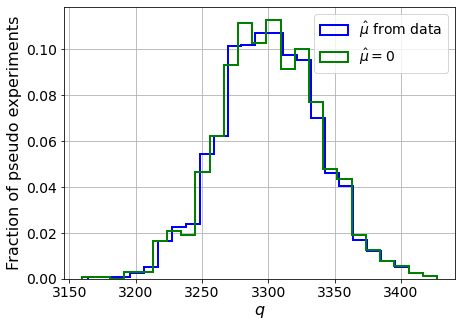

muhat mean:  3.833225182078876e-05
Z_bins:  57.45256120638039
std Z_bins:  0.32741413750920506
Z_bins mu=0:  57.45111966696804
std Z_bins mu=0:  0.33041300256879363

--------


 FINAL RESULT:

[[0.27306190496427357, 0.5745321071732615, 0.11151896536397017, 0.2647474554475547, 0.9113501184839953], [0.6286309126824173, 0.530101444573781, 0.04482178691002473, 0.6271142951149392, 0.744738965025882], [1.415359411256114, 0.5660608793088231, 0.011823191408606826, 1.415359411256114, 0.6910183638027086], [2.732293978426461, 0.5937036789977422, 0.002952413362930484, 2.7322621352629715, 0.6575475840294924], [5.139818985564131, 0.5652489853547816, -0.0028412848767485253, 5.13981811852884, 0.6000484457360336], [9.015247525776935, 0.5333813624456007, 0.001514838268428459, 9.015112010860408, 0.5535096133818147], [15.048232984249543, 0.49415915126289206, 0.0010207128747118308, 15.046099727521225, 0.5069691979061706], [24.142031452938593, 0.42128286933123443, 0.000130462054361904, 24.141939281070666, 0

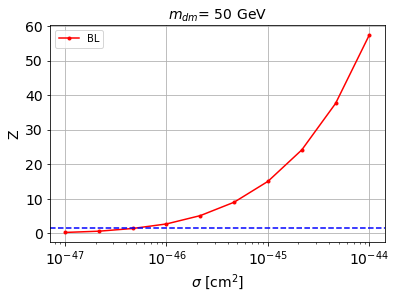


cross_BL_164:  5.466130949688099e-47
cross_BL_164_up:  3.5466729614979763e-47
cross_BL_164_down:  7.89104600084053e-47

#########################


#########################

mDM =  100 GeV


max_pS1_both lenght:  153

X_mon1_train :  (6375, 153)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 153)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 153)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)

B_pbot.shape:  (5000,)


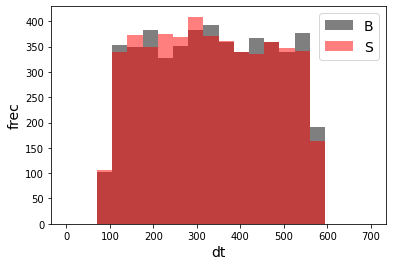

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35220)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35220)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35220)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68720	validation_1-logloss:0.68779
[1]	validation_0-logloss:0.68143	validation_1-logloss:0.68244
[2]	validation_0-logloss:0.67568	validation_1-logloss:0.67732
[3]	validation_0-logloss:0.67007	validation_1-logloss:0.67235
[4]	validation_0-logloss:0.66460	validation_1-logloss:0.66732
[5]	validation_0-logloss:0.65915	validation_1-logloss:0.66252
[6]	validation_0-logloss:0.65384	validation_1-logloss:0.65787
[7]	validation_0-logloss:0.64860	validation_1-logloss:0.65332
[8]	validation_0-logloss:0.64351	validation_1-logloss:0.64872
[9]	validation_0-logloss:0.63843	validation_1-logloss:0.64417
[10]	validation_0-logloss:0.63343	validation_1-logloss:0.63976
[11]	validation_0-logloss:0.62858	validation_1-logloss:0.63544
[12]	validation_0-logloss:0.62376	validation_1-logloss:0.63124
[13]	validation_0-logloss:0.61897	validation_1-logloss:0.62703
[14]	validation_0-logloss:0.61430	validation_1-logloss:0.62293
[15]	validation_0-logloss:0.60967	validation_1-logloss:0.61881
[1

[130]	validation_0-logloss:0.32639	validation_1-logloss:0.39011
[131]	validation_0-logloss:0.32504	validation_1-logloss:0.38905
[132]	validation_0-logloss:0.32372	validation_1-logloss:0.38818
[133]	validation_0-logloss:0.32247	validation_1-logloss:0.38733
[134]	validation_0-logloss:0.32112	validation_1-logloss:0.38649
[135]	validation_0-logloss:0.31981	validation_1-logloss:0.38566
[136]	validation_0-logloss:0.31856	validation_1-logloss:0.38482
[137]	validation_0-logloss:0.31736	validation_1-logloss:0.38398
[138]	validation_0-logloss:0.31608	validation_1-logloss:0.38319
[139]	validation_0-logloss:0.31486	validation_1-logloss:0.38225
[140]	validation_0-logloss:0.31366	validation_1-logloss:0.38146
[141]	validation_0-logloss:0.31240	validation_1-logloss:0.38064
[142]	validation_0-logloss:0.31114	validation_1-logloss:0.37986
[143]	validation_0-logloss:0.30980	validation_1-logloss:0.37884
[144]	validation_0-logloss:0.30853	validation_1-logloss:0.37809
[145]	validation_0-logloss:0.30738	valid

[259]	validation_0-logloss:0.20992	validation_1-logloss:0.31646
[260]	validation_0-logloss:0.20922	validation_1-logloss:0.31600
[261]	validation_0-logloss:0.20860	validation_1-logloss:0.31570
[262]	validation_0-logloss:0.20800	validation_1-logloss:0.31529
[263]	validation_0-logloss:0.20732	validation_1-logloss:0.31488
[264]	validation_0-logloss:0.20675	validation_1-logloss:0.31450
[265]	validation_0-logloss:0.20620	validation_1-logloss:0.31434
[266]	validation_0-logloss:0.20558	validation_1-logloss:0.31400
[267]	validation_0-logloss:0.20502	validation_1-logloss:0.31368
[268]	validation_0-logloss:0.20440	validation_1-logloss:0.31336
[269]	validation_0-logloss:0.20377	validation_1-logloss:0.31305
[270]	validation_0-logloss:0.20314	validation_1-logloss:0.31278
[271]	validation_0-logloss:0.20255	validation_1-logloss:0.31250
[272]	validation_0-logloss:0.20203	validation_1-logloss:0.31233
[273]	validation_0-logloss:0.20141	validation_1-logloss:0.31189
[274]	validation_0-logloss:0.20081	valid

[388]	validation_0-logloss:0.14711	validation_1-logloss:0.28362
[389]	validation_0-logloss:0.14672	validation_1-logloss:0.28350
[390]	validation_0-logloss:0.14637	validation_1-logloss:0.28332
[391]	validation_0-logloss:0.14605	validation_1-logloss:0.28316
[392]	validation_0-logloss:0.14569	validation_1-logloss:0.28295
[393]	validation_0-logloss:0.14527	validation_1-logloss:0.28272
[394]	validation_0-logloss:0.14492	validation_1-logloss:0.28258
[395]	validation_0-logloss:0.14455	validation_1-logloss:0.28245
[396]	validation_0-logloss:0.14417	validation_1-logloss:0.28235
[397]	validation_0-logloss:0.14385	validation_1-logloss:0.28218
[398]	validation_0-logloss:0.14348	validation_1-logloss:0.28210
[399]	validation_0-logloss:0.14308	validation_1-logloss:0.28200
[400]	validation_0-logloss:0.14272	validation_1-logloss:0.28192
[401]	validation_0-logloss:0.14234	validation_1-logloss:0.28183
[402]	validation_0-logloss:0.14194	validation_1-logloss:0.28162
[403]	validation_0-logloss:0.14165	valid

[517]	validation_0-logloss:0.10905	validation_1-logloss:0.26489
[518]	validation_0-logloss:0.10876	validation_1-logloss:0.26478
[519]	validation_0-logloss:0.10850	validation_1-logloss:0.26456
[520]	validation_0-logloss:0.10829	validation_1-logloss:0.26448
[521]	validation_0-logloss:0.10811	validation_1-logloss:0.26433
[522]	validation_0-logloss:0.10787	validation_1-logloss:0.26418
[523]	validation_0-logloss:0.10761	validation_1-logloss:0.26402
[524]	validation_0-logloss:0.10743	validation_1-logloss:0.26398
[525]	validation_0-logloss:0.10725	validation_1-logloss:0.26392
[526]	validation_0-logloss:0.10700	validation_1-logloss:0.26378
[527]	validation_0-logloss:0.10681	validation_1-logloss:0.26371
[528]	validation_0-logloss:0.10656	validation_1-logloss:0.26363
[529]	validation_0-logloss:0.10637	validation_1-logloss:0.26356
[530]	validation_0-logloss:0.10614	validation_1-logloss:0.26342
[531]	validation_0-logloss:0.10597	validation_1-logloss:0.26338
[532]	validation_0-logloss:0.10571	valid

[646]	validation_0-logloss:0.08417	validation_1-logloss:0.25454
[647]	validation_0-logloss:0.08401	validation_1-logloss:0.25444
[648]	validation_0-logloss:0.08386	validation_1-logloss:0.25429
[649]	validation_0-logloss:0.08370	validation_1-logloss:0.25427
[650]	validation_0-logloss:0.08357	validation_1-logloss:0.25428
[651]	validation_0-logloss:0.08338	validation_1-logloss:0.25426
[652]	validation_0-logloss:0.08324	validation_1-logloss:0.25424
[653]	validation_0-logloss:0.08305	validation_1-logloss:0.25418
[654]	validation_0-logloss:0.08286	validation_1-logloss:0.25416
[655]	validation_0-logloss:0.08270	validation_1-logloss:0.25409
[656]	validation_0-logloss:0.08260	validation_1-logloss:0.25404
[657]	validation_0-logloss:0.08243	validation_1-logloss:0.25401
[658]	validation_0-logloss:0.08228	validation_1-logloss:0.25401
[659]	validation_0-logloss:0.08208	validation_1-logloss:0.25395
[660]	validation_0-logloss:0.08191	validation_1-logloss:0.25387
[661]	validation_0-logloss:0.08179	valid

[775]	validation_0-logloss:0.06641	validation_1-logloss:0.24939
[776]	validation_0-logloss:0.06627	validation_1-logloss:0.24939
[777]	validation_0-logloss:0.06618	validation_1-logloss:0.24935
[778]	validation_0-logloss:0.06611	validation_1-logloss:0.24934
[779]	validation_0-logloss:0.06595	validation_1-logloss:0.24931
[780]	validation_0-logloss:0.06586	validation_1-logloss:0.24931
[781]	validation_0-logloss:0.06574	validation_1-logloss:0.24936
[782]	validation_0-logloss:0.06563	validation_1-logloss:0.24935
[783]	validation_0-logloss:0.06557	validation_1-logloss:0.24932
[784]	validation_0-logloss:0.06547	validation_1-logloss:0.24925
[785]	validation_0-logloss:0.06535	validation_1-logloss:0.24921
[786]	validation_0-logloss:0.06524	validation_1-logloss:0.24915
[787]	validation_0-logloss:0.06513	validation_1-logloss:0.24915
[788]	validation_0-logloss:0.06499	validation_1-logloss:0.24912
[789]	validation_0-logloss:0.06486	validation_1-logloss:0.24909
[790]	validation_0-logloss:0.06477	valid

[904]	validation_0-logloss:0.05418	validation_1-logloss:0.24550
[905]	validation_0-logloss:0.05407	validation_1-logloss:0.24545
[906]	validation_0-logloss:0.05402	validation_1-logloss:0.24546
[907]	validation_0-logloss:0.05397	validation_1-logloss:0.24547
[908]	validation_0-logloss:0.05390	validation_1-logloss:0.24549
[909]	validation_0-logloss:0.05382	validation_1-logloss:0.24549
[910]	validation_0-logloss:0.05378	validation_1-logloss:0.24540
[911]	validation_0-logloss:0.05371	validation_1-logloss:0.24534
[912]	validation_0-logloss:0.05364	validation_1-logloss:0.24531
[913]	validation_0-logloss:0.05356	validation_1-logloss:0.24528
[914]	validation_0-logloss:0.05349	validation_1-logloss:0.24532
[915]	validation_0-logloss:0.05344	validation_1-logloss:0.24531
[916]	validation_0-logloss:0.05337	validation_1-logloss:0.24531
[917]	validation_0-logloss:0.05333	validation_1-logloss:0.24528
[918]	validation_0-logloss:0.05328	validation_1-logloss:0.24531
[919]	validation_0-logloss:0.05321	valid

[1032]	validation_0-logloss:0.04581	validation_1-logloss:0.24334
[1033]	validation_0-logloss:0.04575	validation_1-logloss:0.24332
[1034]	validation_0-logloss:0.04569	validation_1-logloss:0.24332
[1035]	validation_0-logloss:0.04564	validation_1-logloss:0.24334
[1036]	validation_0-logloss:0.04558	validation_1-logloss:0.24334
[1037]	validation_0-logloss:0.04550	validation_1-logloss:0.24336
[1038]	validation_0-logloss:0.04542	validation_1-logloss:0.24338
[1039]	validation_0-logloss:0.04532	validation_1-logloss:0.24335
[1040]	validation_0-logloss:0.04526	validation_1-logloss:0.24332
[1041]	validation_0-logloss:0.04522	validation_1-logloss:0.24329
[1042]	validation_0-logloss:0.04516	validation_1-logloss:0.24332
[1043]	validation_0-logloss:0.04509	validation_1-logloss:0.24336
[1044]	validation_0-logloss:0.04502	validation_1-logloss:0.24331
[1045]	validation_0-logloss:0.04495	validation_1-logloss:0.24330
[1046]	validation_0-logloss:0.04486	validation_1-logloss:0.24325
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.03853	validation_1-logloss:0.24208
[1160]	validation_0-logloss:0.03849	validation_1-logloss:0.24213
[1161]	validation_0-logloss:0.03844	validation_1-logloss:0.24213
[1162]	validation_0-logloss:0.03841	validation_1-logloss:0.24212
[1163]	validation_0-logloss:0.03835	validation_1-logloss:0.24210
[1164]	validation_0-logloss:0.03830	validation_1-logloss:0.24204
[1165]	validation_0-logloss:0.03824	validation_1-logloss:0.24203
[1166]	validation_0-logloss:0.03815	validation_1-logloss:0.24197
[1167]	validation_0-logloss:0.03808	validation_1-logloss:0.24196
[1168]	validation_0-logloss:0.03803	validation_1-logloss:0.24197
[1169]	validation_0-logloss:0.03799	validation_1-logloss:0.24196
[1170]	validation_0-logloss:0.03795	validation_1-logloss:0.24197
[1171]	validation_0-logloss:0.03788	validation_1-logloss:0.24198
[1172]	validation_0-logloss:0.03782	validation_1-logloss:0.24196
[1173]	validation_0-logloss:0.03777	validation_1-logloss:0.24191
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.03255	validation_1-logloss:0.24111
[1287]	validation_0-logloss:0.03250	validation_1-logloss:0.24110
[1288]	validation_0-logloss:0.03244	validation_1-logloss:0.24118
[1289]	validation_0-logloss:0.03241	validation_1-logloss:0.24120
[1290]	validation_0-logloss:0.03234	validation_1-logloss:0.24123
[1291]	validation_0-logloss:0.03230	validation_1-logloss:0.24121
[1292]	validation_0-logloss:0.03225	validation_1-logloss:0.24126
[1293]	validation_0-logloss:0.03222	validation_1-logloss:0.24124
[1294]	validation_0-logloss:0.03217	validation_1-logloss:0.24133
[1295]	validation_0-logloss:0.03213	validation_1-logloss:0.24133
[1296]	validation_0-logloss:0.03209	validation_1-logloss:0.24134
[1297]	validation_0-logloss:0.03207	validation_1-logloss:0.24133
[1298]	validation_0-logloss:0.03202	validation_1-logloss:0.24135
[1299]	validation_0-logloss:0.03198	validation_1-logloss:0.24138
[1300]	validation_0-logloss:0.03195	validation_1-logloss:0.24139
[1301]	validation_0-loglo

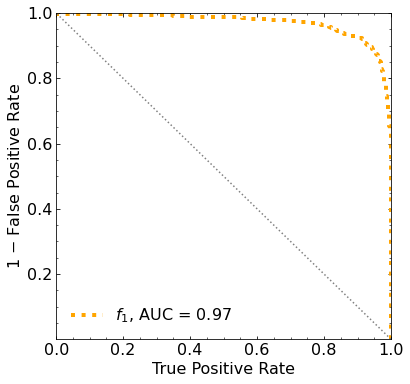

Classification score:


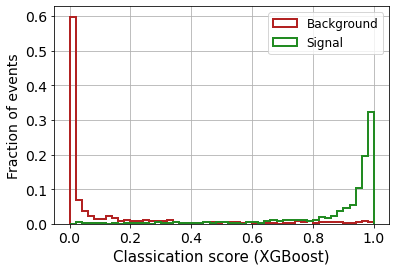


 ROC-AUC =  0.9701763618298405
At least 5 B events per bin, range = [[0, 1]]:
# bins:  10 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  10
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.121


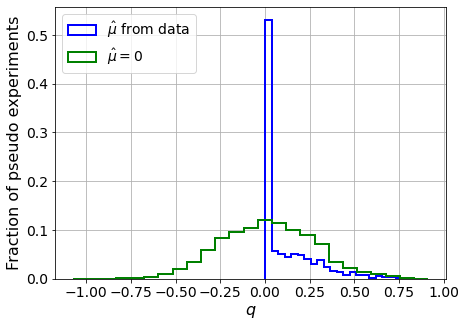

muhat mean:  0.25998901697744886
Z_bins:  0.12378865933991892
std Z_bins:  0.6439055123036597
Z_bins mu=0:  0.10834354547497088
std Z_bins mu=0:  1.2063567704542368

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1395


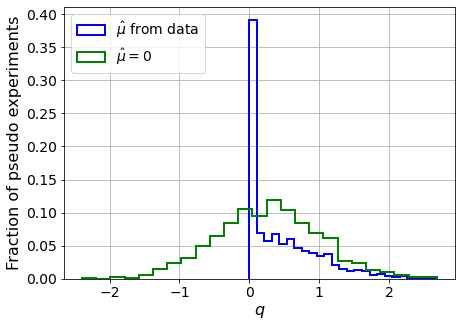

muhat mean:  0.01623283878023408
Z_bins:  0.5416474958958086
std Z_bins:  0.48489027382176764
Z_bins mu=0:  0.5416474958958086
std Z_bins mu=0:  0.6901051298549998

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1275


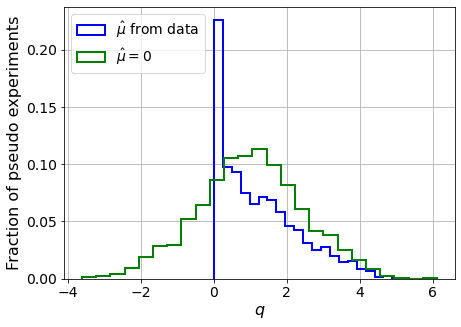

muhat mean:  0.022876237377753433
Z_bins:  1.0030851926128106
std Z_bins:  0.5514916232270839
Z_bins mu=0:  1.002632483457224
std Z_bins mu=0:  0.7201322489613137

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1155


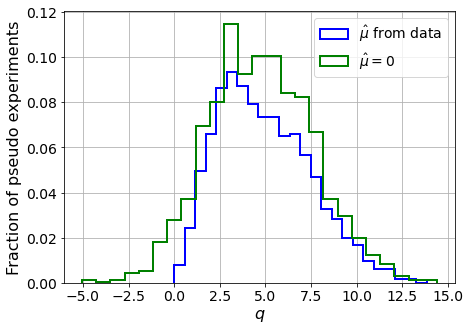

muhat mean:  0.007217497004193397
Z_bins:  2.1606091915430627
std Z_bins:  0.5863776957752957
Z_bins mu=0:  2.1601047609434962
std Z_bins mu=0:  0.6604165785701249

--------

B_expected:  643
S_expected:  30

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1355


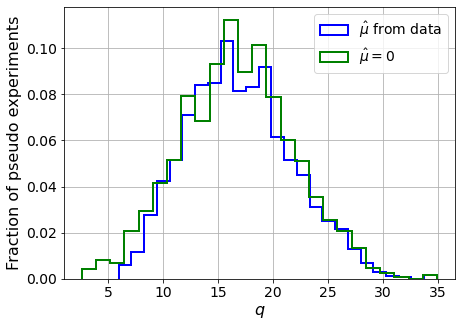

muhat mean:  0.008171100868597656
Z_bins:  4.081237447035499
std Z_bins:  0.5859820057233484
Z_bins mu=0:  4.080975910129209
std Z_bins mu=0:  0.6314755143317887

--------

B_expected:  643
S_expected:  65

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.126


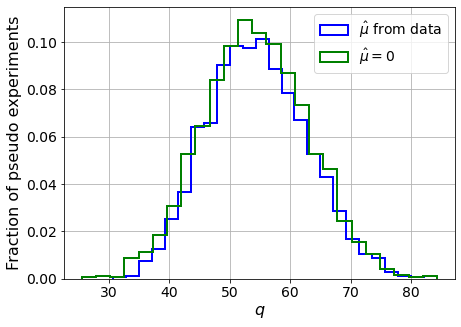

muhat mean:  0.0005492425942524584
Z_bins:  7.3706832399024895
std Z_bins:  0.5567834599966957
Z_bins mu=0:  7.370587327918681
std Z_bins mu=0:  0.5818112664085304

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.129


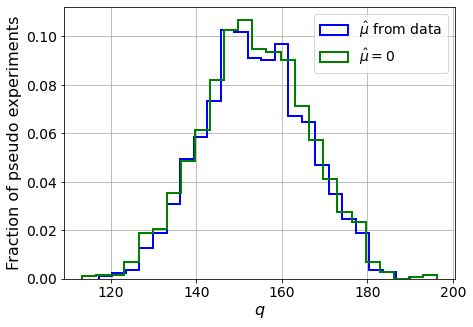

muhat mean:  -0.0005241854113843596
Z_bins:  12.38881395880354
std Z_bins:  0.48971968929481474
Z_bins mu=0:  12.388531887255274
std Z_bins mu=0:  0.5033038328354422

--------

B_expected:  643
S_expected:  300

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.135


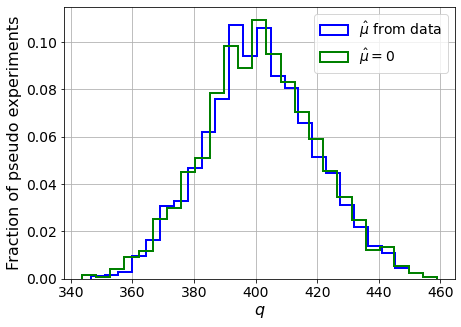

muhat mean:  0.0003868982145309503
Z_bins:  20.029974094167162
std Z_bins:  0.45143728639563574
Z_bins mu=0:  20.029007698402978
std Z_bins mu=0:  0.46022050972602363

--------

B_expected:  643
S_expected:  645

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.138


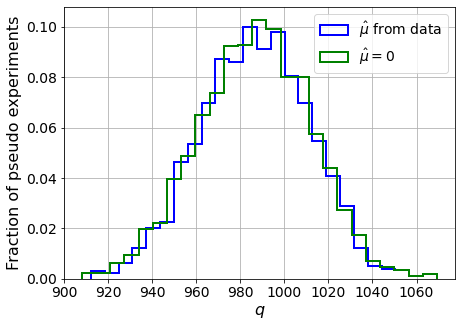

muhat mean:  0.00022760223331046102
Z_bins:  31.416936369858345
std Z_bins:  0.39742839690500437
Z_bins mu=0:  31.41560869062203
std Z_bins mu=0:  0.4034954536982734

--------

B_expected:  643
S_expected:  1390

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.124


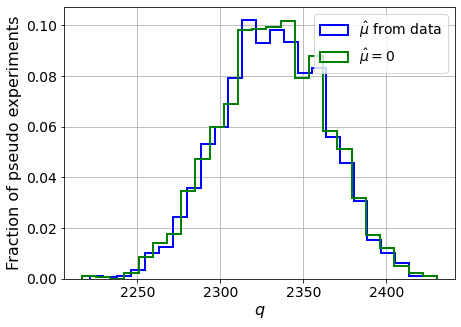

muhat mean:  4.983533690391204e-05
Z_bins:  48.29089322107155
std Z_bins:  0.3333113129521896
Z_bins mu=0:  48.289151048677105
std Z_bins mu=0:  0.3364896825727012

--------


 FINAL RESULT:

[[0.12378865933991892, 0.6439055123036597, 0.25998901697744886, 0.10834354547497088, 1.2063567704542368], [0.5416474958958086, 0.48489027382176764, 0.01623283878023408, 0.5416474958958086, 0.6901051298549998], [1.0030851926128106, 0.5514916232270839, 0.022876237377753433, 1.002632483457224, 0.7201322489613137], [2.1606091915430627, 0.5863776957752957, 0.007217497004193397, 2.1601047609434962, 0.6604165785701249], [4.081237447035499, 0.5859820057233484, 0.008171100868597656, 4.080975910129209, 0.6314755143317887], [7.3706832399024895, 0.5567834599966957, 0.0005492425942524584, 7.370587327918681, 0.5818112664085304], [12.38881395880354, 0.48971968929481474, -0.0005241854113843596, 12.388531887255274, 0.5033038328354422], [20.029974094167162, 0.45143728639563574, 0.0003868982145309503, 20.02900769840

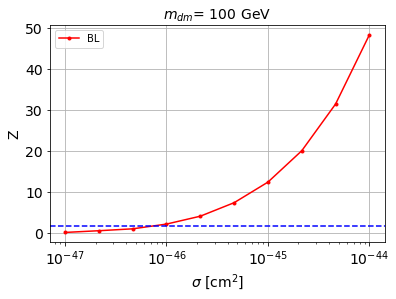


cross_BL_164:  7.486801146049488e-47
cross_BL_164_up:  5.004231862730881e-47
cross_BL_164_down:  1.034187369808655e-46

#########################


#########################

mDM =  200 GeV


max_pS1_both lenght:  157

X_mon1_train :  (6375, 157)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 157)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 157)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)

B_pbot.shape:  (5000,)


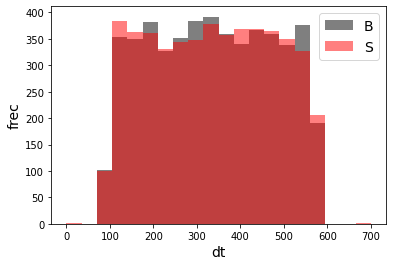

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35224)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35224)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35224)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68753	validation_1-logloss:0.68850
[1]	validation_0-logloss:0.68199	validation_1-logloss:0.68379
[2]	validation_0-logloss:0.67659	validation_1-logloss:0.67938
[3]	validation_0-logloss:0.67124	validation_1-logloss:0.67492
[4]	validation_0-logloss:0.66595	validation_1-logloss:0.67043
[5]	validation_0-logloss:0.66076	validation_1-logloss:0.66620
[6]	validation_0-logloss:0.65564	validation_1-logloss:0.66169
[7]	validation_0-logloss:0.65064	validation_1-logloss:0.65761
[8]	validation_0-logloss:0.64579	validation_1-logloss:0.65358
[9]	validation_0-logloss:0.64097	validation_1-logloss:0.64968
[10]	validation_0-logloss:0.63616	validation_1-logloss:0.64553
[11]	validation_0-logloss:0.63137	validation_1-logloss:0.64157
[12]	validation_0-logloss:0.62677	validation_1-logloss:0.63780
[13]	validation_0-logloss:0.62226	validation_1-logloss:0.63399
[14]	validation_0-logloss:0.61775	validation_1-logloss:0.63009
[15]	validation_0-logloss:0.61323	validation_1-logloss:0.62640
[1

[130]	validation_0-logloss:0.33908	validation_1-logloss:0.41364
[131]	validation_0-logloss:0.33777	validation_1-logloss:0.41272
[132]	validation_0-logloss:0.33646	validation_1-logloss:0.41175
[133]	validation_0-logloss:0.33507	validation_1-logloss:0.41084
[134]	validation_0-logloss:0.33379	validation_1-logloss:0.40984
[135]	validation_0-logloss:0.33244	validation_1-logloss:0.40903
[136]	validation_0-logloss:0.33121	validation_1-logloss:0.40806
[137]	validation_0-logloss:0.32991	validation_1-logloss:0.40711
[138]	validation_0-logloss:0.32868	validation_1-logloss:0.40621
[139]	validation_0-logloss:0.32735	validation_1-logloss:0.40543
[140]	validation_0-logloss:0.32611	validation_1-logloss:0.40460
[141]	validation_0-logloss:0.32490	validation_1-logloss:0.40360
[142]	validation_0-logloss:0.32375	validation_1-logloss:0.40286
[143]	validation_0-logloss:0.32249	validation_1-logloss:0.40198
[144]	validation_0-logloss:0.32118	validation_1-logloss:0.40111
[145]	validation_0-logloss:0.31998	valid

[259]	validation_0-logloss:0.22121	validation_1-logloss:0.33772
[260]	validation_0-logloss:0.22052	validation_1-logloss:0.33737
[261]	validation_0-logloss:0.21985	validation_1-logloss:0.33698
[262]	validation_0-logloss:0.21924	validation_1-logloss:0.33675
[263]	validation_0-logloss:0.21856	validation_1-logloss:0.33644
[264]	validation_0-logloss:0.21789	validation_1-logloss:0.33596
[265]	validation_0-logloss:0.21730	validation_1-logloss:0.33558
[266]	validation_0-logloss:0.21664	validation_1-logloss:0.33515
[267]	validation_0-logloss:0.21608	validation_1-logloss:0.33486
[268]	validation_0-logloss:0.21544	validation_1-logloss:0.33448
[269]	validation_0-logloss:0.21478	validation_1-logloss:0.33400
[270]	validation_0-logloss:0.21417	validation_1-logloss:0.33358
[271]	validation_0-logloss:0.21360	validation_1-logloss:0.33336
[272]	validation_0-logloss:0.21296	validation_1-logloss:0.33309
[273]	validation_0-logloss:0.21233	validation_1-logloss:0.33263
[274]	validation_0-logloss:0.21169	valid

[388]	validation_0-logloss:0.15709	validation_1-logloss:0.30288
[389]	validation_0-logloss:0.15667	validation_1-logloss:0.30262
[390]	validation_0-logloss:0.15624	validation_1-logloss:0.30244
[391]	validation_0-logloss:0.15590	validation_1-logloss:0.30223
[392]	validation_0-logloss:0.15561	validation_1-logloss:0.30203
[393]	validation_0-logloss:0.15534	validation_1-logloss:0.30178
[394]	validation_0-logloss:0.15502	validation_1-logloss:0.30167
[395]	validation_0-logloss:0.15463	validation_1-logloss:0.30151
[396]	validation_0-logloss:0.15426	validation_1-logloss:0.30134
[397]	validation_0-logloss:0.15388	validation_1-logloss:0.30110
[398]	validation_0-logloss:0.15360	validation_1-logloss:0.30091
[399]	validation_0-logloss:0.15316	validation_1-logloss:0.30074
[400]	validation_0-logloss:0.15290	validation_1-logloss:0.30046
[401]	validation_0-logloss:0.15251	validation_1-logloss:0.30032
[402]	validation_0-logloss:0.15215	validation_1-logloss:0.30019
[403]	validation_0-logloss:0.15181	valid

[517]	validation_0-logloss:0.11916	validation_1-logloss:0.28339
[518]	validation_0-logloss:0.11898	validation_1-logloss:0.28326
[519]	validation_0-logloss:0.11869	validation_1-logloss:0.28322
[520]	validation_0-logloss:0.11844	validation_1-logloss:0.28312
[521]	validation_0-logloss:0.11822	validation_1-logloss:0.28314
[522]	validation_0-logloss:0.11794	validation_1-logloss:0.28303
[523]	validation_0-logloss:0.11768	validation_1-logloss:0.28291
[524]	validation_0-logloss:0.11745	validation_1-logloss:0.28281
[525]	validation_0-logloss:0.11721	validation_1-logloss:0.28264
[526]	validation_0-logloss:0.11693	validation_1-logloss:0.28259
[527]	validation_0-logloss:0.11670	validation_1-logloss:0.28242
[528]	validation_0-logloss:0.11642	validation_1-logloss:0.28234
[529]	validation_0-logloss:0.11617	validation_1-logloss:0.28216
[530]	validation_0-logloss:0.11595	validation_1-logloss:0.28212
[531]	validation_0-logloss:0.11568	validation_1-logloss:0.28212
[532]	validation_0-logloss:0.11544	valid

[646]	validation_0-logloss:0.09126	validation_1-logloss:0.27007
[647]	validation_0-logloss:0.09107	validation_1-logloss:0.27006
[648]	validation_0-logloss:0.09086	validation_1-logloss:0.27007
[649]	validation_0-logloss:0.09072	validation_1-logloss:0.27003
[650]	validation_0-logloss:0.09053	validation_1-logloss:0.26998
[651]	validation_0-logloss:0.09035	validation_1-logloss:0.26990
[652]	validation_0-logloss:0.09018	validation_1-logloss:0.26979
[653]	validation_0-logloss:0.09000	validation_1-logloss:0.26970
[654]	validation_0-logloss:0.08982	validation_1-logloss:0.26965
[655]	validation_0-logloss:0.08967	validation_1-logloss:0.26958
[656]	validation_0-logloss:0.08949	validation_1-logloss:0.26950
[657]	validation_0-logloss:0.08931	validation_1-logloss:0.26943
[658]	validation_0-logloss:0.08919	validation_1-logloss:0.26945
[659]	validation_0-logloss:0.08899	validation_1-logloss:0.26926
[660]	validation_0-logloss:0.08882	validation_1-logloss:0.26915
[661]	validation_0-logloss:0.08864	valid

[775]	validation_0-logloss:0.07189	validation_1-logloss:0.26375
[776]	validation_0-logloss:0.07172	validation_1-logloss:0.26371
[777]	validation_0-logloss:0.07159	validation_1-logloss:0.26365
[778]	validation_0-logloss:0.07146	validation_1-logloss:0.26356
[779]	validation_0-logloss:0.07134	validation_1-logloss:0.26353
[780]	validation_0-logloss:0.07123	validation_1-logloss:0.26349
[781]	validation_0-logloss:0.07109	validation_1-logloss:0.26350
[782]	validation_0-logloss:0.07099	validation_1-logloss:0.26347
[783]	validation_0-logloss:0.07089	validation_1-logloss:0.26349
[784]	validation_0-logloss:0.07073	validation_1-logloss:0.26344
[785]	validation_0-logloss:0.07060	validation_1-logloss:0.26339
[786]	validation_0-logloss:0.07048	validation_1-logloss:0.26334
[787]	validation_0-logloss:0.07035	validation_1-logloss:0.26326
[788]	validation_0-logloss:0.07023	validation_1-logloss:0.26317
[789]	validation_0-logloss:0.07009	validation_1-logloss:0.26316
[790]	validation_0-logloss:0.06996	valid

[904]	validation_0-logloss:0.05864	validation_1-logloss:0.25892
[905]	validation_0-logloss:0.05854	validation_1-logloss:0.25887
[906]	validation_0-logloss:0.05846	validation_1-logloss:0.25881
[907]	validation_0-logloss:0.05838	validation_1-logloss:0.25881
[908]	validation_0-logloss:0.05831	validation_1-logloss:0.25879
[909]	validation_0-logloss:0.05823	validation_1-logloss:0.25875
[910]	validation_0-logloss:0.05817	validation_1-logloss:0.25875
[911]	validation_0-logloss:0.05806	validation_1-logloss:0.25873
[912]	validation_0-logloss:0.05801	validation_1-logloss:0.25870
[913]	validation_0-logloss:0.05791	validation_1-logloss:0.25873
[914]	validation_0-logloss:0.05783	validation_1-logloss:0.25869
[915]	validation_0-logloss:0.05776	validation_1-logloss:0.25867
[916]	validation_0-logloss:0.05769	validation_1-logloss:0.25860
[917]	validation_0-logloss:0.05759	validation_1-logloss:0.25851
[918]	validation_0-logloss:0.05750	validation_1-logloss:0.25849
[919]	validation_0-logloss:0.05740	valid

[1032]	validation_0-logloss:0.04908	validation_1-logloss:0.25593
[1033]	validation_0-logloss:0.04904	validation_1-logloss:0.25589
[1034]	validation_0-logloss:0.04899	validation_1-logloss:0.25587
[1035]	validation_0-logloss:0.04890	validation_1-logloss:0.25587
[1036]	validation_0-logloss:0.04886	validation_1-logloss:0.25585
[1037]	validation_0-logloss:0.04878	validation_1-logloss:0.25578
[1038]	validation_0-logloss:0.04870	validation_1-logloss:0.25573
[1039]	validation_0-logloss:0.04867	validation_1-logloss:0.25568
[1040]	validation_0-logloss:0.04858	validation_1-logloss:0.25563
[1041]	validation_0-logloss:0.04852	validation_1-logloss:0.25559
[1042]	validation_0-logloss:0.04848	validation_1-logloss:0.25565
[1043]	validation_0-logloss:0.04843	validation_1-logloss:0.25560
[1044]	validation_0-logloss:0.04838	validation_1-logloss:0.25561
[1045]	validation_0-logloss:0.04834	validation_1-logloss:0.25561
[1046]	validation_0-logloss:0.04826	validation_1-logloss:0.25564
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.04178	validation_1-logloss:0.25347
[1160]	validation_0-logloss:0.04174	validation_1-logloss:0.25348
[1161]	validation_0-logloss:0.04168	validation_1-logloss:0.25345
[1162]	validation_0-logloss:0.04162	validation_1-logloss:0.25347
[1163]	validation_0-logloss:0.04155	validation_1-logloss:0.25354
[1164]	validation_0-logloss:0.04151	validation_1-logloss:0.25356
[1165]	validation_0-logloss:0.04147	validation_1-logloss:0.25351
[1166]	validation_0-logloss:0.04145	validation_1-logloss:0.25350
[1167]	validation_0-logloss:0.04142	validation_1-logloss:0.25348
[1168]	validation_0-logloss:0.04138	validation_1-logloss:0.25351
[1169]	validation_0-logloss:0.04133	validation_1-logloss:0.25353
[1170]	validation_0-logloss:0.04126	validation_1-logloss:0.25353
[1171]	validation_0-logloss:0.04122	validation_1-logloss:0.25349
[1172]	validation_0-logloss:0.04119	validation_1-logloss:0.25345
[1173]	validation_0-logloss:0.04112	validation_1-logloss:0.25348
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.03604	validation_1-logloss:0.25238
[1287]	validation_0-logloss:0.03601	validation_1-logloss:0.25237
[1288]	validation_0-logloss:0.03598	validation_1-logloss:0.25237
[1289]	validation_0-logloss:0.03593	validation_1-logloss:0.25238
[1290]	validation_0-logloss:0.03588	validation_1-logloss:0.25240
[1291]	validation_0-logloss:0.03584	validation_1-logloss:0.25235
[1292]	validation_0-logloss:0.03579	validation_1-logloss:0.25233
[1293]	validation_0-logloss:0.03575	validation_1-logloss:0.25232
[1294]	validation_0-logloss:0.03572	validation_1-logloss:0.25234
[1295]	validation_0-logloss:0.03567	validation_1-logloss:0.25232
[1296]	validation_0-logloss:0.03561	validation_1-logloss:0.25232
[1297]	validation_0-logloss:0.03556	validation_1-logloss:0.25231
[1298]	validation_0-logloss:0.03551	validation_1-logloss:0.25235
[1299]	validation_0-logloss:0.03549	validation_1-logloss:0.25232
[1300]	validation_0-logloss:0.03545	validation_1-logloss:0.25227
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.03124	validation_1-logloss:0.25126
[1414]	validation_0-logloss:0.03121	validation_1-logloss:0.25131
[1415]	validation_0-logloss:0.03117	validation_1-logloss:0.25127
[1416]	validation_0-logloss:0.03116	validation_1-logloss:0.25126
[1417]	validation_0-logloss:0.03113	validation_1-logloss:0.25125
[1418]	validation_0-logloss:0.03110	validation_1-logloss:0.25128
[1419]	validation_0-logloss:0.03106	validation_1-logloss:0.25132
[1420]	validation_0-logloss:0.03103	validation_1-logloss:0.25133
[1421]	validation_0-logloss:0.03100	validation_1-logloss:0.25133
[1422]	validation_0-logloss:0.03097	validation_1-logloss:0.25134
[1423]	validation_0-logloss:0.03092	validation_1-logloss:0.25130
[1424]	validation_0-logloss:0.03088	validation_1-logloss:0.25141
[1425]	validation_0-logloss:0.03085	validation_1-logloss:0.25141
[1426]	validation_0-logloss:0.03082	validation_1-logloss:0.25135
[1427]	validation_0-logloss:0.03078	validation_1-logloss:0.25133
[1428]	validation_0-loglo

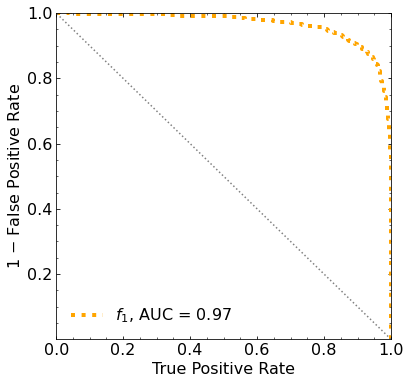

Classification score:


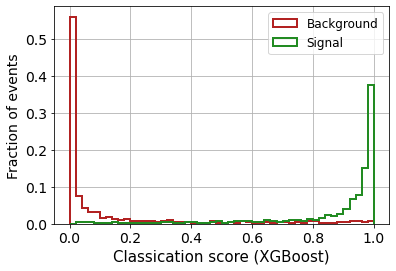


 ROC-AUC =  0.965492671009772
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.005


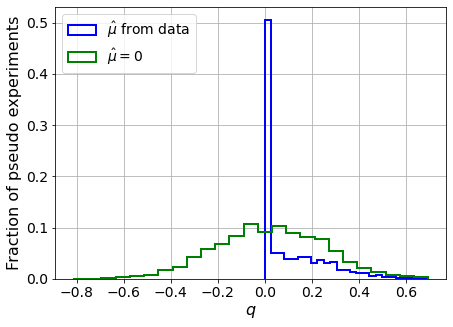

muhat mean:  0.10923918620927485
Z_bins:  0.15494492606935206
std Z_bins:  0.450937046418202
Z_bins mu=0:  0.1548348505627658
std Z_bins mu=0:  0.7451235461973723

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.005


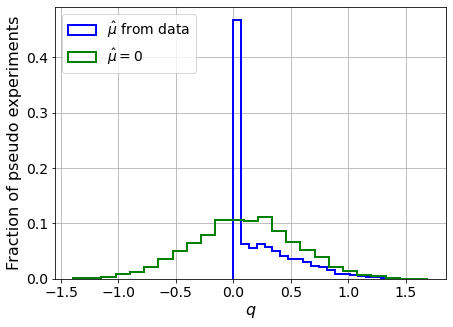

muhat mean:  -0.004391996132243833
Z_bins:  0.3153864975318603
std Z_bins:  0.465991631969779
Z_bins mu=0:  0.3153620640970216
std Z_bins mu=0:  0.7122024778683993

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.004


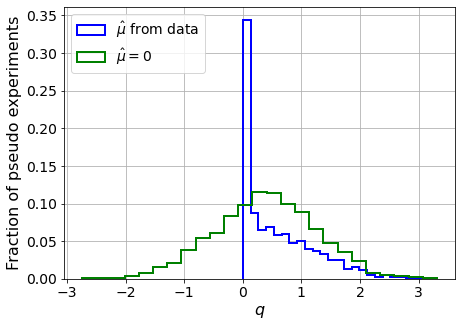

muhat mean:  -0.014470717356216458
Z_bins:  0.6349721040321101
std Z_bins:  0.4920407838758807
Z_bins mu=0:  0.6349721040321101
std Z_bins mu=0:  0.6914531544930536

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


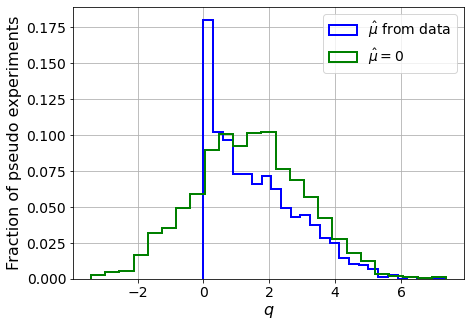

muhat mean:  0.007662247150390425
Z_bins:  1.1761758944836362
std Z_bins:  0.5669547171542372
Z_bins mu=0:  1.1757032737995303
std Z_bins mu=0:  0.7051421261599001

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.006


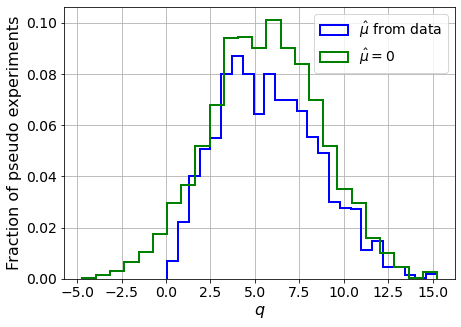

muhat mean:  -0.009886243502505242
Z_bins:  2.370000813110933
std Z_bins:  0.5883311547746539
Z_bins mu=0:  2.370000813110933
std Z_bins mu=0:  0.6601327405951961

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0055


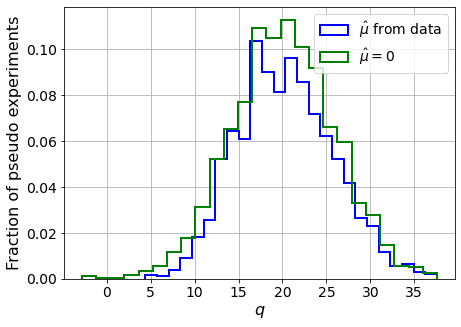

muhat mean:  0.0010613000366373536
Z_bins:  4.4779518238845375
std Z_bins:  0.6065205644899989
Z_bins mu=0:  4.477935475913866
std Z_bins mu=0:  0.6523768153080401

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


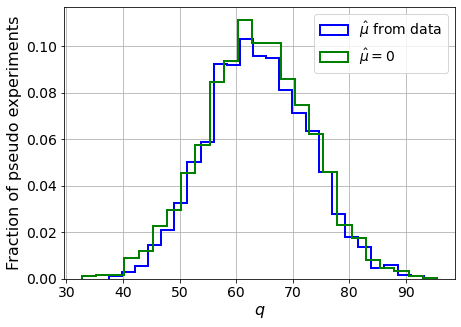

muhat mean:  0.0006052647241191944
Z_bins:  7.977193765883508
std Z_bins:  0.5590079113915274
Z_bins mu=0:  7.976884881890581
std Z_bins mu=0:  0.5822592837850683

--------

B_expected:  643
S_expected:  170

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0065


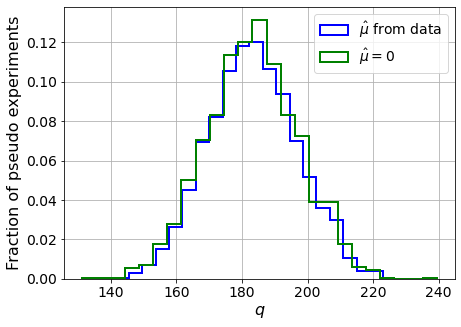

muhat mean:  0.00034921744205157273
Z_bins:  13.537967891867295
std Z_bins:  0.5005531093077101
Z_bins mu=0:  13.537680361596225
std Z_bins mu=0:  0.514224341402641

--------

B_expected:  643
S_expected:  366

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


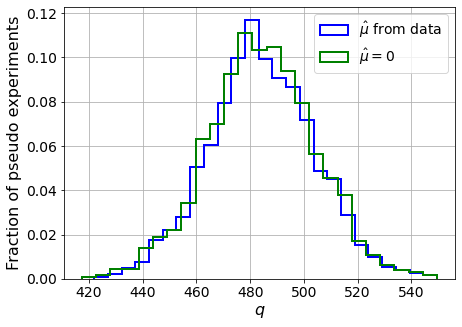

muhat mean:  -0.00035359597458470325
Z_bins:  21.997444899326506
std Z_bins:  0.4458577846455835
Z_bins mu=0:  21.996689109544032
std Z_bins mu=0:  0.4536898093801978

--------

B_expected:  643
S_expected:  788

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0025


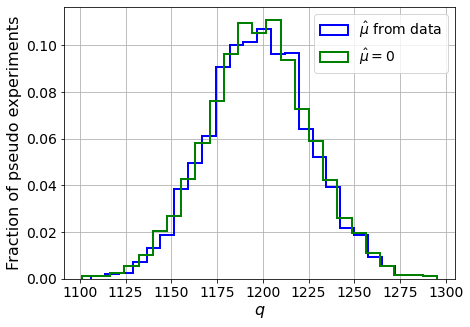

muhat mean:  -0.0001766055678510763
Z_bins:  34.606564800032935
std Z_bins:  0.4055503786195063
Z_bins mu=0:  34.605852384840034
std Z_bins mu=0:  0.4105520986592568

--------


 FINAL RESULT:

[[0.15494492606935206, 0.450937046418202, 0.10923918620927485, 0.1548348505627658, 0.7451235461973723], [0.3153864975318603, 0.465991631969779, -0.004391996132243833, 0.3153620640970216, 0.7122024778683993], [0.6349721040321101, 0.4920407838758807, -0.014470717356216458, 0.6349721040321101, 0.6914531544930536], [1.1761758944836362, 0.5669547171542372, 0.007662247150390425, 1.1757032737995303, 0.7051421261599001], [2.370000813110933, 0.5883311547746539, -0.009886243502505242, 2.370000813110933, 0.6601327405951961], [4.4779518238845375, 0.6065205644899989, 0.0010613000366373536, 4.477935475913866, 0.6523768153080401], [7.977193765883508, 0.5590079113915274, 0.0006052647241191944, 7.976884881890581, 0.5822592837850683], [13.537967891867295, 0.5005531093077101, 0.00034921744205157273, 13.53768036159

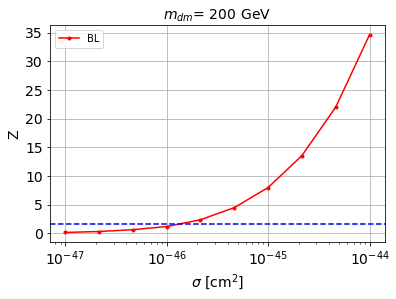


cross_BL_164:  1.4344839339495263e-46
cross_BL_164_up:  9.096912777303936e-47
cross_BL_164_down:  2.008513355431389e-46

#########################


#########################

mDM =  500 GeV


max_pS1_both lenght:  178

X_mon1_train :  (6375, 178)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 178)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 178)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)

B_pbot.shape:  (5000,)

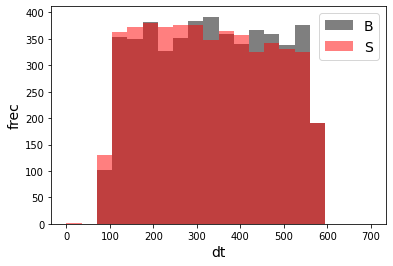

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35245)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35245)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35245)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68755	validation_1-logloss:0.68834
[1]	validation_0-logloss:0.68209	validation_1-logloss:0.68360
[2]	validation_0-logloss:0.67666	validation_1-logloss:0.67904
[3]	validation_0-logloss:0.67139	validation_1-logloss:0.67449
[4]	validation_0-logloss:0.66629	validation_1-logloss:0.67002
[5]	validation_0-logloss:0.66118	validation_1-logloss:0.66572
[6]	validation_0-logloss:0.65621	validation_1-logloss:0.66152
[7]	validation_0-logloss:0.65131	validation_1-logloss:0.65733
[8]	validation_0-logloss:0.64644	validation_1-logloss:0.65329
[9]	validation_0-logloss:0.64178	validation_1-logloss:0.64921
[10]	validation_0-logloss:0.63708	validation_1-logloss:0.64526
[11]	validation_0-logloss:0.63253	validation_1-logloss:0.64147
[12]	validation_0-logloss:0.62799	validation_1-logloss:0.63774
[13]	validation_0-logloss:0.62356	validation_1-logloss:0.63381
[14]	validation_0-logloss:0.61924	validation_1-logloss:0.63020
[15]	validation_0-logloss:0.61486	validation_1-logloss:0.62658
[1

[130]	validation_0-logloss:0.34272	validation_1-logloss:0.42202
[131]	validation_0-logloss:0.34147	validation_1-logloss:0.42114
[132]	validation_0-logloss:0.34016	validation_1-logloss:0.42035
[133]	validation_0-logloss:0.33892	validation_1-logloss:0.41957
[134]	validation_0-logloss:0.33764	validation_1-logloss:0.41879
[135]	validation_0-logloss:0.33628	validation_1-logloss:0.41783
[136]	validation_0-logloss:0.33506	validation_1-logloss:0.41700
[137]	validation_0-logloss:0.33375	validation_1-logloss:0.41614
[138]	validation_0-logloss:0.33256	validation_1-logloss:0.41547
[139]	validation_0-logloss:0.33129	validation_1-logloss:0.41461
[140]	validation_0-logloss:0.33000	validation_1-logloss:0.41366
[141]	validation_0-logloss:0.32874	validation_1-logloss:0.41281
[142]	validation_0-logloss:0.32747	validation_1-logloss:0.41207
[143]	validation_0-logloss:0.32632	validation_1-logloss:0.41133
[144]	validation_0-logloss:0.32506	validation_1-logloss:0.41057
[145]	validation_0-logloss:0.32384	valid

[259]	validation_0-logloss:0.22345	validation_1-logloss:0.35202
[260]	validation_0-logloss:0.22283	validation_1-logloss:0.35171
[261]	validation_0-logloss:0.22221	validation_1-logloss:0.35141
[262]	validation_0-logloss:0.22158	validation_1-logloss:0.35114
[263]	validation_0-logloss:0.22093	validation_1-logloss:0.35085
[264]	validation_0-logloss:0.22030	validation_1-logloss:0.35052
[265]	validation_0-logloss:0.21976	validation_1-logloss:0.35025
[266]	validation_0-logloss:0.21910	validation_1-logloss:0.34991
[267]	validation_0-logloss:0.21851	validation_1-logloss:0.34970
[268]	validation_0-logloss:0.21799	validation_1-logloss:0.34937
[269]	validation_0-logloss:0.21738	validation_1-logloss:0.34911
[270]	validation_0-logloss:0.21686	validation_1-logloss:0.34885
[271]	validation_0-logloss:0.21621	validation_1-logloss:0.34857
[272]	validation_0-logloss:0.21554	validation_1-logloss:0.34807
[273]	validation_0-logloss:0.21491	validation_1-logloss:0.34765
[274]	validation_0-logloss:0.21426	valid

[388]	validation_0-logloss:0.15979	validation_1-logloss:0.32161
[389]	validation_0-logloss:0.15936	validation_1-logloss:0.32151
[390]	validation_0-logloss:0.15899	validation_1-logloss:0.32143
[391]	validation_0-logloss:0.15856	validation_1-logloss:0.32133
[392]	validation_0-logloss:0.15812	validation_1-logloss:0.32115
[393]	validation_0-logloss:0.15768	validation_1-logloss:0.32092
[394]	validation_0-logloss:0.15727	validation_1-logloss:0.32075
[395]	validation_0-logloss:0.15686	validation_1-logloss:0.32044
[396]	validation_0-logloss:0.15655	validation_1-logloss:0.32033
[397]	validation_0-logloss:0.15618	validation_1-logloss:0.32023
[398]	validation_0-logloss:0.15581	validation_1-logloss:0.32015
[399]	validation_0-logloss:0.15545	validation_1-logloss:0.32000
[400]	validation_0-logloss:0.15517	validation_1-logloss:0.31991
[401]	validation_0-logloss:0.15474	validation_1-logloss:0.31981
[402]	validation_0-logloss:0.15442	validation_1-logloss:0.31964
[403]	validation_0-logloss:0.15403	valid

[517]	validation_0-logloss:0.12012	validation_1-logloss:0.30373
[518]	validation_0-logloss:0.11988	validation_1-logloss:0.30360
[519]	validation_0-logloss:0.11961	validation_1-logloss:0.30345
[520]	validation_0-logloss:0.11936	validation_1-logloss:0.30335
[521]	validation_0-logloss:0.11917	validation_1-logloss:0.30334
[522]	validation_0-logloss:0.11897	validation_1-logloss:0.30313
[523]	validation_0-logloss:0.11872	validation_1-logloss:0.30308
[524]	validation_0-logloss:0.11849	validation_1-logloss:0.30303
[525]	validation_0-logloss:0.11823	validation_1-logloss:0.30294
[526]	validation_0-logloss:0.11793	validation_1-logloss:0.30282
[527]	validation_0-logloss:0.11768	validation_1-logloss:0.30278
[528]	validation_0-logloss:0.11752	validation_1-logloss:0.30265
[529]	validation_0-logloss:0.11725	validation_1-logloss:0.30261
[530]	validation_0-logloss:0.11706	validation_1-logloss:0.30247
[531]	validation_0-logloss:0.11679	validation_1-logloss:0.30235
[532]	validation_0-logloss:0.11657	valid

[646]	validation_0-logloss:0.09198	validation_1-logloss:0.29245
[647]	validation_0-logloss:0.09179	validation_1-logloss:0.29241
[648]	validation_0-logloss:0.09156	validation_1-logloss:0.29228
[649]	validation_0-logloss:0.09135	validation_1-logloss:0.29216
[650]	validation_0-logloss:0.09115	validation_1-logloss:0.29208
[651]	validation_0-logloss:0.09100	validation_1-logloss:0.29198
[652]	validation_0-logloss:0.09079	validation_1-logloss:0.29196
[653]	validation_0-logloss:0.09061	validation_1-logloss:0.29190
[654]	validation_0-logloss:0.09043	validation_1-logloss:0.29184
[655]	validation_0-logloss:0.09027	validation_1-logloss:0.29185
[656]	validation_0-logloss:0.09009	validation_1-logloss:0.29176
[657]	validation_0-logloss:0.08988	validation_1-logloss:0.29175
[658]	validation_0-logloss:0.08972	validation_1-logloss:0.29174
[659]	validation_0-logloss:0.08950	validation_1-logloss:0.29166
[660]	validation_0-logloss:0.08930	validation_1-logloss:0.29154
[661]	validation_0-logloss:0.08914	valid

[775]	validation_0-logloss:0.07234	validation_1-logloss:0.28638
[776]	validation_0-logloss:0.07226	validation_1-logloss:0.28637
[777]	validation_0-logloss:0.07216	validation_1-logloss:0.28634
[778]	validation_0-logloss:0.07209	validation_1-logloss:0.28632
[779]	validation_0-logloss:0.07198	validation_1-logloss:0.28635
[780]	validation_0-logloss:0.07182	validation_1-logloss:0.28623
[781]	validation_0-logloss:0.07172	validation_1-logloss:0.28620
[782]	validation_0-logloss:0.07161	validation_1-logloss:0.28614
[783]	validation_0-logloss:0.07146	validation_1-logloss:0.28609
[784]	validation_0-logloss:0.07137	validation_1-logloss:0.28607
[785]	validation_0-logloss:0.07125	validation_1-logloss:0.28601
[786]	validation_0-logloss:0.07109	validation_1-logloss:0.28592
[787]	validation_0-logloss:0.07098	validation_1-logloss:0.28596
[788]	validation_0-logloss:0.07086	validation_1-logloss:0.28600
[789]	validation_0-logloss:0.07070	validation_1-logloss:0.28585
[790]	validation_0-logloss:0.07055	valid

[904]	validation_0-logloss:0.05870	validation_1-logloss:0.28125
[905]	validation_0-logloss:0.05860	validation_1-logloss:0.28119
[906]	validation_0-logloss:0.05847	validation_1-logloss:0.28107
[907]	validation_0-logloss:0.05834	validation_1-logloss:0.28100
[908]	validation_0-logloss:0.05825	validation_1-logloss:0.28103
[909]	validation_0-logloss:0.05814	validation_1-logloss:0.28097
[910]	validation_0-logloss:0.05806	validation_1-logloss:0.28091
[911]	validation_0-logloss:0.05798	validation_1-logloss:0.28089
[912]	validation_0-logloss:0.05793	validation_1-logloss:0.28089
[913]	validation_0-logloss:0.05782	validation_1-logloss:0.28085
[914]	validation_0-logloss:0.05774	validation_1-logloss:0.28081
[915]	validation_0-logloss:0.05765	validation_1-logloss:0.28082
[916]	validation_0-logloss:0.05754	validation_1-logloss:0.28073
[917]	validation_0-logloss:0.05746	validation_1-logloss:0.28072
[918]	validation_0-logloss:0.05738	validation_1-logloss:0.28069
[919]	validation_0-logloss:0.05733	valid

[1032]	validation_0-logloss:0.04834	validation_1-logloss:0.27867
[1033]	validation_0-logloss:0.04827	validation_1-logloss:0.27866
[1034]	validation_0-logloss:0.04823	validation_1-logloss:0.27867
[1035]	validation_0-logloss:0.04817	validation_1-logloss:0.27868
[1036]	validation_0-logloss:0.04810	validation_1-logloss:0.27871
[1037]	validation_0-logloss:0.04803	validation_1-logloss:0.27865
[1038]	validation_0-logloss:0.04794	validation_1-logloss:0.27858
[1039]	validation_0-logloss:0.04789	validation_1-logloss:0.27853
[1040]	validation_0-logloss:0.04779	validation_1-logloss:0.27847
[1041]	validation_0-logloss:0.04771	validation_1-logloss:0.27844
[1042]	validation_0-logloss:0.04763	validation_1-logloss:0.27845
[1043]	validation_0-logloss:0.04754	validation_1-logloss:0.27836
[1044]	validation_0-logloss:0.04748	validation_1-logloss:0.27838
[1045]	validation_0-logloss:0.04741	validation_1-logloss:0.27835
[1046]	validation_0-logloss:0.04734	validation_1-logloss:0.27837
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.04080	validation_1-logloss:0.27667
[1160]	validation_0-logloss:0.04077	validation_1-logloss:0.27674
[1161]	validation_0-logloss:0.04070	validation_1-logloss:0.27671
[1162]	validation_0-logloss:0.04066	validation_1-logloss:0.27670
[1163]	validation_0-logloss:0.04062	validation_1-logloss:0.27665
[1164]	validation_0-logloss:0.04054	validation_1-logloss:0.27661
[1165]	validation_0-logloss:0.04048	validation_1-logloss:0.27662
[1166]	validation_0-logloss:0.04043	validation_1-logloss:0.27661
[1167]	validation_0-logloss:0.04039	validation_1-logloss:0.27658
[1168]	validation_0-logloss:0.04036	validation_1-logloss:0.27657
[1169]	validation_0-logloss:0.04031	validation_1-logloss:0.27659
[1170]	validation_0-logloss:0.04025	validation_1-logloss:0.27659
[1171]	validation_0-logloss:0.04020	validation_1-logloss:0.27658
[1172]	validation_0-logloss:0.04017	validation_1-logloss:0.27664
[1173]	validation_0-logloss:0.04013	validation_1-logloss:0.27667
[1174]	validation_0-loglo

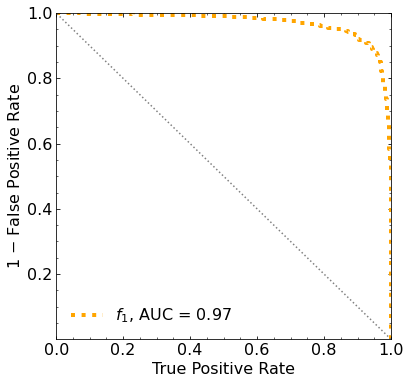

Classification score:


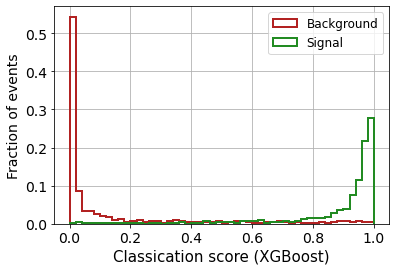


 ROC-AUC =  0.9706699547251757
At least 5 B events per bin, range = [[0, 1]]:
# bins:  11 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  11
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0055


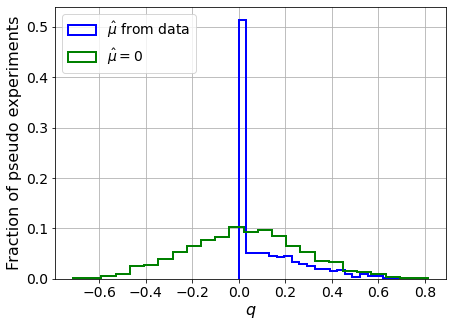

muhat mean:  0.11722452270482177
Z_bins:  0.15539189880098683
std Z_bins:  0.4956539428301203
Z_bins mu=0:  0.15413940757269745
std Z_bins mu=0:  0.8117501756174034

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


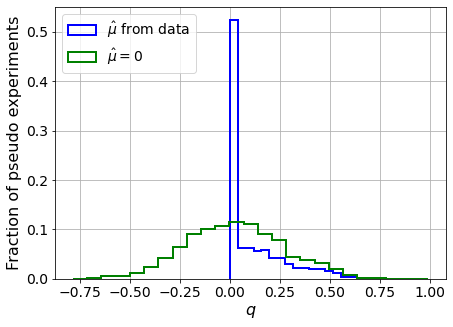

muhat mean:  0.02338005272753644
Z_bins:  0.15269569525735227
std Z_bins:  0.5129970746327548
Z_bins mu=0:  0.15107832252950681
std Z_bins mu=0:  0.8167609237334952

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


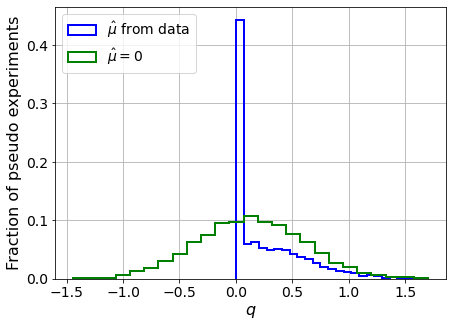

muhat mean:  -0.05641963963863633
Z_bins:  0.36704446136420865
std Z_bins:  0.4396404389801019
Z_bins mu=0:  0.36704446136420865
std Z_bins mu=0:  0.649979904503848

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0045


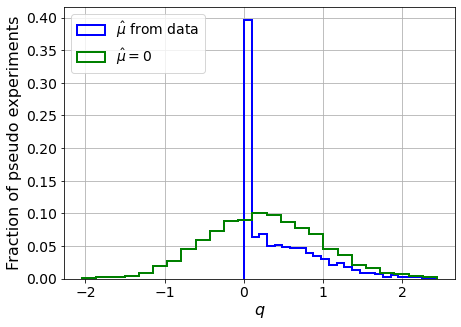

muhat mean:  0.00963769775308679
Z_bins:  0.49720637876710094
std Z_bins:  0.5061217189753714
Z_bins mu=0:  0.49691775977436514
std Z_bins mu=0:  0.720285218197621

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


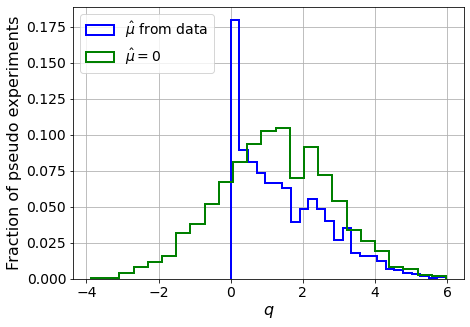

muhat mean:  0.02372682356076046
Z_bins:  1.1054372738531808
std Z_bins:  0.5590871085006078
Z_bins mu=0:  1.1053788711896413
std Z_bins mu=0:  0.7112002990752706

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.007


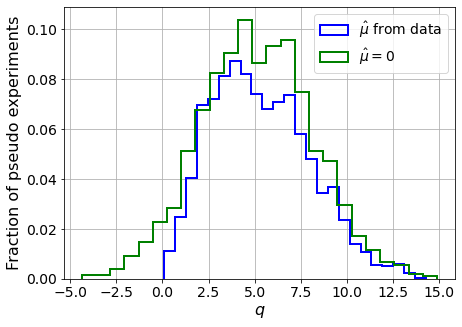

muhat mean:  -0.0029453547384906712
Z_bins:  2.247161059885812
std Z_bins:  0.594356453778779
Z_bins mu=0:  2.2467556710999763
std Z_bins mu=0:  0.6696010684330986

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


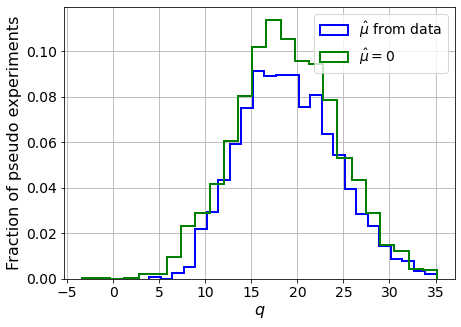

muhat mean:  -4.1851961851931114e-05
Z_bins:  4.332207794140847
std Z_bins:  0.5970017416440706
Z_bins mu=0:  4.332150211300379
std Z_bins mu=0:  0.6394683981766675

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


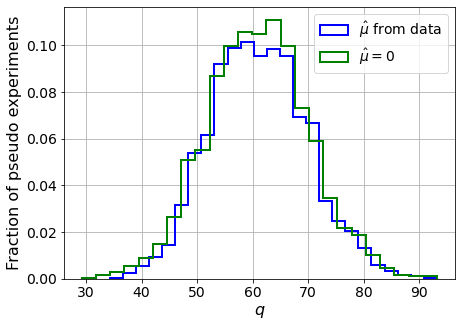

muhat mean:  0.0010687275079562688
Z_bins:  7.800080877558578
std Z_bins:  0.5607985521391345
Z_bins mu=0:  7.799381164707462
std Z_bins mu=0:  0.5853855526677061

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.005


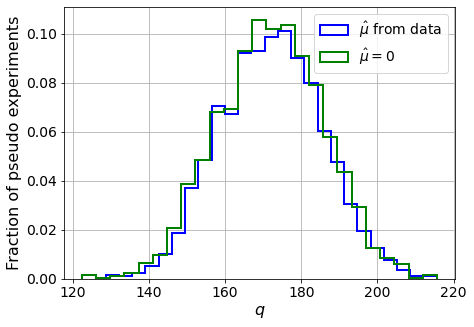

muhat mean:  0.0009751775430758459
Z_bins:  13.125084395671937
std Z_bins:  0.5086230623099403
Z_bins mu=0:  13.123903737269378
std Z_bins mu=0:  0.5243228928526132

--------

B_expected:  643
S_expected:  333

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.004


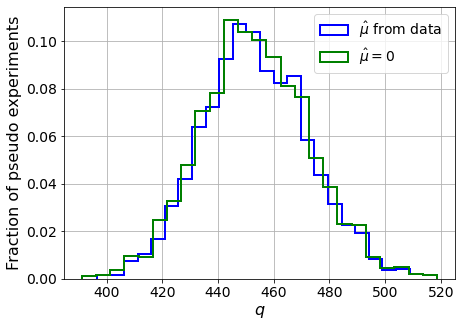

muhat mean:  -0.0006531946936575395
Z_bins:  21.280631706617484
std Z_bins:  0.44984238928342446
Z_bins mu=0:  21.278817087913783
std Z_bins mu=0:  0.4573475279367888

--------


 FINAL RESULT:

[[0.15539189880098683, 0.4956539428301203, 0.11722452270482177, 0.15413940757269745, 0.8117501756174034], [0.15269569525735227, 0.5129970746327548, 0.02338005272753644, 0.15107832252950681, 0.8167609237334952], [0.36704446136420865, 0.4396404389801019, -0.05641963963863633, 0.36704446136420865, 0.649979904503848], [0.49720637876710094, 0.5061217189753714, 0.00963769775308679, 0.49691775977436514, 0.720285218197621], [1.1054372738531808, 0.5590871085006078, 0.02372682356076046, 1.1053788711896413, 0.7112002990752706], [2.247161059885812, 0.594356453778779, -0.0029453547384906712, 2.2467556710999763, 0.6696010684330986], [4.332207794140847, 0.5970017416440706, -4.1851961851931114e-05, 4.332150211300379, 0.6394683981766675], [7.800080877558578, 0.5607985521391345, 0.0010687275079562688, 7.79938116

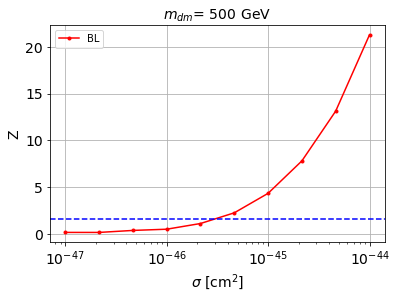


cross_BL_164:  3.2774295494125885e-46
cross_BL_164_up:  2.109364255746121e-46
cross_BL_164_down:  4.611854831585989e-46

#########################



In [27]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = 'mDM' + str(mDM) + 'GeV/WP_mDM' + str(mDM) + 'GeV_sig1045.hdf5'
    
    f_S = h5py.File(filefolder+filename_S,'r')
    
    
    
    
    print('')
    
    ###################
    # peakS1_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS1_B = 0
    max_pS1_B1 = 0
    max_pS1_B2 = 0
    max_pS1_B3 = 0
    max_pS1_B4 = 0

    max_pS1_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS1_B = max(max_pS1_B, len( f_B['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS1_B1 = max(max_pS1_B1, len( f_B1['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS1_B2 = max(max_pS1_B2, len( f_B2['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS1_B3 = max(max_pS1_B3, len( f_B3['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS1_B4 = max(max_pS1_B4, len( f_B4['peakS1_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS1_S = max(max_pS1_S, len( f_S['peakS1_onlyhits/ev_'+str(i)] ))


    max_pS1_both = max(max_pS1_B,max_pS1_B1,max_pS1_B2,max_pS1_B3,max_pS1_B4,max_pS1_S)

    print('max_pS1_both lenght: ', max_pS1_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
    diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS1_onlyhits_B = np.pad(f_B['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B), 'constant')
    peakS1_onlyhits_B1 = np.pad(f_B1['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B1), 'constant')
    peakS1_onlyhits_B2 = np.pad(f_B2['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B2), 'constant')
    peakS1_onlyhits_B3 = np.pad(f_B3['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B3), 'constant')
    peakS1_onlyhits_B4 = np.pad(f_B4['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B4), 'constant')
    peakS1_onlyhits_S = np.pad(f_S['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
        diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S1_B = np.pad(f_B['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B), 'constant')
        # add new event to the matrix as a row
        peakS1_onlyhits_B = np.row_stack([peakS1_onlyhits_B,aux_S1_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B1 = np.pad(f_B1['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B1), 'constant')
        peakS1_onlyhits_B1 = np.row_stack([peakS1_onlyhits_B1,aux_S1_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B2 = np.pad(f_B2['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B2), 'constant')
        peakS1_onlyhits_B2 = np.row_stack([peakS1_onlyhits_B2,aux_S1_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B3 = np.pad(f_B3['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B3), 'constant')
        peakS1_onlyhits_B3 = np.row_stack([peakS1_onlyhits_B3,aux_S1_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B4 = np.pad(f_B4['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B4), 'constant')
        peakS1_onlyhits_B4 = np.row_stack([peakS1_onlyhits_B4,aux_S1_B4])

    for i in range(2, num_data+1):
        diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_S = np.pad(f_S['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_S), 'constant')
        peakS1_onlyhits_S = np.row_stack([peakS1_onlyhits_S,aux_S1_S])




    # X and Y for the classifier
    X_peakS1 = np.row_stack([peakS1_onlyhits_B[:NUM_DAT_ER],peakS1_onlyhits_B1[:NUM_DAT_AC],peakS1_onlyhits_B2[:NUM_DAT_CNNS],peakS1_onlyhits_B3[:NUM_DAT_RN],peakS1_onlyhits_B4[:NUM_DAT_WALL],peakS1_onlyhits_S])
    # normalize
    X_peakS1 = scaler.fit_transform(X_peakS1)

    del peakS1_onlyhits_B
    del peakS1_onlyhits_B1
    del peakS1_onlyhits_B2
    del peakS1_onlyhits_B3
    del peakS1_onlyhits_B4
    del peakS1_onlyhits_S






    ###################
    # CONCATENATE ALL #
    ###################

    X_mon1 = np.concatenate([X_peakS1],axis=1)

    del X_peakS1

    # labels
    y_mon1 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon1_aux, X_mon1_test, y_mon1_aux, y_mon1_test = train_test_split(X_mon1,
                                                                    y_mon1,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon1,
                                                                    shuffle=True)

    del X_mon1
    del y_mon1

    X_mon1_train, X_mon1_val, y_mon1_train, y_mon1_val = train_test_split(X_mon1_aux,
                                                                      y_mon1_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon1_aux,
                                                                      shuffle=True)

    del X_mon1_aux
    del y_mon1_aux

    print('')
    print('X_mon1_train : ', X_mon1_train.shape)
    print('y_mon1_train : ', y_mon1_train.shape)
    print('X_mon1_val : ', X_mon1_val.shape)
    print('y_mon1_val : ', y_mon1_val.shape)
    print('X_mon1_test : ', X_mon1_test.shape)
    print('y_mon1_test : ', y_mon1_test.shape)
    print('')
    
    
    
    
    
    ###################
    # peakS2_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS2_B = 0
    max_pS2_B1 = 0
    max_pS2_B2 = 0
    max_pS2_B3 = 0
    max_pS2_B4 = 0

    max_pS2_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS2_B = max(max_pS2_B, len( f_B['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS2_B1 = max(max_pS2_B1, len( f_B1['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS2_B2 = max(max_pS2_B2, len( f_B2['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS2_B3 = max(max_pS2_B3, len( f_B3['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS2_B4 = max(max_pS2_B4, len( f_B4['peakS2_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS2_S = max(max_pS2_S, len( f_S['peakS2_onlyhits/ev_'+str(i)] ))


    max_pS2_both = max(max_pS2_B,max_pS2_B1,max_pS2_B2,max_pS2_B3,max_pS2_B4,max_pS2_S)

    print('max_pS2_both lenght: ', max_pS2_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
    diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS2_onlyhits_B = np.pad(f_B['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B), 'constant')
    peakS2_onlyhits_B1 = np.pad(f_B1['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B1), 'constant')
    peakS2_onlyhits_B2 = np.pad(f_B2['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B2), 'constant')
    peakS2_onlyhits_B3 = np.pad(f_B3['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B3), 'constant')
    peakS2_onlyhits_B4 = np.pad(f_B4['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B4), 'constant')
    peakS2_onlyhits_S = np.pad(f_S['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
        diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S2_B = np.pad(f_B['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B), 'constant')
        # add new event to the matrix as a row
        peakS2_onlyhits_B = np.row_stack([peakS2_onlyhits_B,aux_S2_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B1 = np.pad(f_B1['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B1), 'constant')
        peakS2_onlyhits_B1 = np.row_stack([peakS2_onlyhits_B1,aux_S2_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B2 = np.pad(f_B2['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B2), 'constant')
        peakS2_onlyhits_B2 = np.row_stack([peakS2_onlyhits_B2,aux_S2_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B3 = np.pad(f_B3['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B3), 'constant')
        peakS2_onlyhits_B3 = np.row_stack([peakS2_onlyhits_B3,aux_S2_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B4 = np.pad(f_B4['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B4), 'constant')
        peakS2_onlyhits_B4 = np.row_stack([peakS2_onlyhits_B4,aux_S2_B4])
    for i in range(2, num_data+1):
        diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_S = np.pad(f_S['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_S), 'constant')
        peakS2_onlyhits_S = np.row_stack([peakS2_onlyhits_S,aux_S2_S])




    # X and Y for the classifier
    X_peakS2 = np.row_stack([peakS2_onlyhits_B[:NUM_DAT_ER],peakS2_onlyhits_B1[:NUM_DAT_AC],peakS2_onlyhits_B2[:NUM_DAT_CNNS],peakS2_onlyhits_B3[:NUM_DAT_RN],peakS2_onlyhits_B4[:NUM_DAT_WALL],peakS2_onlyhits_S])
    # normalize
    X_peakS2 = scaler.fit_transform(X_peakS2)

    del peakS2_onlyhits_B
    del peakS2_onlyhits_B1
    del peakS2_onlyhits_B2
    del peakS2_onlyhits_B3
    del peakS2_onlyhits_B4
    del peakS2_onlyhits_S









    ###################
    # CONCATENATE ALL #
    ###################

    X_mon2 = np.concatenate([X_peakS2],axis=1)

    del X_peakS2

    # labels
    y_mon2 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon2_aux, X_mon2_test, y_mon2_aux, y_mon2_test = train_test_split(X_mon2,
                                                                    y_mon2,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon2,
                                                                    shuffle=True)

    del X_mon2
    del y_mon2

    X_mon2_train, X_mon2_val, y_mon2_train, y_mon2_val = train_test_split(X_mon2_aux,
                                                                      y_mon2_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon2_aux,
                                                                      shuffle=True)

    del X_mon2_aux
    del y_mon2_aux

    print('')
    print('X_mon2_train : ', X_mon2_train.shape)
    print('y_mon2_train : ', y_mon2_train.shape)
    print('X_mon2_val : ', X_mon2_val.shape)
    print('y_mon2_val : ', y_mon2_val.shape)
    print('X_mon2_test : ', X_mon2_test.shape)
    print('y_mon2_test : ', y_mon2_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_bot_img DATA #
    ######################


    HITS_bot_img_S = np.array( f_S['HITS_bot_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_bot_img_S = np.row_stack([HITS_bot_img_S,np.array( f_S['HITS_bot_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon3 = np.row_stack([HITS_bot_img_B[:NUM_DAT_ER],HITS_bot_img_B1[:NUM_DAT_AC],HITS_bot_img_B2[:NUM_DAT_CNNS],HITS_bot_img_B3[:NUM_DAT_RN],HITS_bot_img_B4[:NUM_DAT_WALL],HITS_bot_img_S])
    # normalize
    X_mon3 = scaler.fit_transform(X_mon3)
    #X_mon3 = np.reshape(X_mon3, (2*num_data,128,128,1))

#     del HITS_bot_img_B
#     del HITS_bot_img_B1
#     del HITS_bot_img_B2
#     del HITS_bot_img_B3
#     del HITS_bot_img_B4
    del HITS_bot_img_S

    # labels
    y_mon3 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon3_aux, X_mon3_test, y_mon3_aux, y_mon3_test = train_test_split(X_mon3,
                                                                    y_mon3,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon3,
                                                                    shuffle=True)

    del X_mon3
    del y_mon3

    X_mon3_train, X_mon3_val, y_mon3_train, y_mon3_val = train_test_split(X_mon3_aux,
                                                                      y_mon3_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon3_aux,
                                                                      shuffle=True)

    del X_mon3_aux
    del y_mon3_aux

    print('')
    print('X_mon3_train : ', X_mon3_train.shape)
    print('y_mon3_train : ', y_mon3_train.shape)
    print('X_mon3_val : ', X_mon3_val.shape)
    print('y_mon3_val : ', y_mon3_val.shape)
    print('X_mon3_test : ', X_mon3_test.shape)
    print('y_mon3_test : ', y_mon3_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_top_img DATA #
    ######################
    
    HITS_top_img_S = np.array( f_S['HITS_top_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_top_img_S = np.row_stack([HITS_top_img_S,np.array( f_S['HITS_top_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon4 = np.row_stack([HITS_top_img_B[:NUM_DAT_ER],HITS_top_img_B1[:NUM_DAT_AC],HITS_top_img_B2[:NUM_DAT_CNNS],HITS_top_img_B3[:NUM_DAT_RN],HITS_top_img_B4[:NUM_DAT_WALL],HITS_top_img_S])
    # normalize
    X_mon4 = scaler.fit_transform(X_mon4)
    #X_mon4 = np.reshape(X_mon4, (2*num_data,128,128,1))

#     del HITS_top_img_B
#     del HITS_top_img_B1
#     del HITS_top_img_B2
#     del HITS_top_img_B3
#     del HITS_top_img_B4
    del HITS_top_img_S

    # labels
    y_mon4 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon4_aux, X_mon4_test, y_mon4_aux, y_mon4_test = train_test_split(X_mon4,
                                                                    y_mon4,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon4,
                                                                    shuffle=True)

    del X_mon4
    del y_mon4

    X_mon4_train, X_mon4_val, y_mon4_train, y_mon4_val = train_test_split(X_mon4_aux,
                                                                      y_mon4_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon4_aux,
                                                                      shuffle=True)

    del X_mon4_aux
    del y_mon4_aux

    print('')
    print('X_mon4_train : ', X_mon4_train.shape)
    print('y_mon4_train : ', y_mon4_train.shape)
    print('X_mon4_val : ', X_mon4_val.shape)
    print('y_mon4_val : ', y_mon4_val.shape)
    print('X_mon4_test : ', X_mon4_test.shape)
    print('y_mon4_test : ', y_mon4_test.shape)
    print('')
    
    
    
    
    
    
    # close the h5 files
#     f_B.close()
#     f_B1.close()
#     f_B2.close()
#     f_B3.close()
#     f_B4.close()
    f_S.close()
    
    
    
    
    #################
    # LOAD FEATURES #
    #################
    
    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    
    # concatenate the data

    # all the background features
    X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))

    # all the signal features
    X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))

    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)
    print('')



    X_mon5 = np.concatenate([X_mon_B, X_mon_S])

    print('X_mon5.shape: ', X_mon5.shape)



    # labels
    y_mon5 = np.concatenate([np.zeros(num_data),np.ones(num_data)])




    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon5_aux, X_mon5_test, y_mon5_aux, y_mon5_test = train_test_split(X_mon5,
                                                                    y_mon5,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon5,
                                                                    shuffle=True)



    X_mon5_train, X_mon5_val, y_mon5_train, y_mon5_val = train_test_split(X_mon5_aux,
                                                                      y_mon5_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon5_aux,
                                                                      shuffle=True)
    
    
    print('')
    print('X_mon5_train : ', X_mon5_train.shape)
    print('y_mon5_train : ', y_mon5_train.shape)
    print('X_mon5_val : ', X_mon5_val.shape)
    print('y_mon5_val : ', y_mon5_val.shape)
    print('X_mon5_test : ', X_mon5_test.shape)
    print('y_mon5_test : ', y_mon5_test.shape)
    print('')
    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon_train = np.concatenate([X_mon1_train,X_mon2_train,X_mon3_train,X_mon4_train,X_mon5_train],axis=1)
    X_mon_test = np.concatenate([X_mon1_test,X_mon2_test,X_mon3_test,X_mon4_test,X_mon5_test],axis=1)
    X_mon_val = np.concatenate([X_mon1_val,X_mon2_val,X_mon3_val,X_mon4_val,X_mon5_val],axis=1)



    y_mon_train = y_mon1_train
    y_mon_test = y_mon1_test
    y_mon_val = y_mon1_val



    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
#     #######
#     # MLL #
#     #######
    
#     # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

#     # outputs:
#     # 1st -> background PDF
#     # 2nd -> signal PDF
#     # 3rd -> (normalization factor of the background PDF)**-1
#     # 4th -> (normalization factor of the signal PDF)**-1
#     # 5th -> background bandwidth
#     # 6th -> signal bandwidth
#     kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
#                                                                                             1000, 
#                                                                                             np.logspace(-4.0, 0.05, 20), 
#                                                                                             set_kernel='epanechnikov')




#     # FOR EXCLUSION:
#     # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

#     print('This may take a while...')

#     pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
#     print('1 done')
#     pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
#     print('2 done')

#     # Normalize
#     pB_B_data = pB_B_data / norm_factor_SM
#     pS_B_data = pS_B_data / norm_factor_NP


#     if D_or_E == "discovery":

#         # FOR DISCOVERY:
#         # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

#         pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
#         print('3 done')
#         pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
#         print('4 done')

#         # Normalize
#         pB_S_data = pB_S_data / norm_factor_SM
#         pS_S_data = pS_S_data / norm_factor_NP

#     else:
#         # dummies
#         pB_S_data = 1
#         pS_S_data = 1





#    # OPTION 2 (mu_hat with more precision) (slower,
#     store_Z_MLL = []


#     for s_it in range(len(S_expected)):

#         print('B_expected: ', B_expected)
#         print('S_expected: ', S_expected[s_it])
#         print('')

#         Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

#         store_Z_MLL.append( list(Z_MLL) )

#         print('muhat mean: ', Z_MLL[2])
#         print('Z_bins: ', Z_MLL[0])
#         print('std Z_bins: ', Z_MLL[1])
#         print('Z_bins mu=0: ', Z_MLL[3])
#         print('std Z_bins mu=0: ', Z_MLL[4])
#         print('')
#         print('--------\n')


#     print('\n FINAL RESULT:\n')
#     print(store_Z_MLL)


#     store_Z_MLL = np.array(store_Z_MLL)

#     for hd in range(len(store_Z_MLL[:,0])):
#         if store_Z_MLL[:,0][hd] == 0:
#             store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
#             store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]



    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
#     plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
#     # interpolate
#     f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
#     f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
#     f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

#     # compute the cross section with Z=1.64
#     cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
#     cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
#     cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
#     store_cross_MLL_164.append(cross_MLL_164)
#     store_cross_MLL_164_up.append(cross_MLL_164_up)
#     store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
#     print('\ncross_MLL_164: ', cross_MLL_164)
#     print('cross_MLL_164_up: ', cross_MLL_164_up)
#     print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [28]:
cross_arraysdt = store_cross_BL_164
cross_arraysdt_up = store_cross_BL_164_up
cross_arraysdt_down = store_cross_BL_164_down

print(cross_arraysdt)
print(cross_arraysdt_up)
print(cross_arraysdt_down)

[1.684920519919967e-45, 1.1519579186205123e-46, 6.264662232110048e-47, 5.466130949688099e-47, 7.486801146049488e-47, 1.4344839339495263e-46, 3.2774295494125885e-46]
[1.0057771003310818e-45, 7.3149603245070895e-47, 4.044345879943871e-47, 3.5466729614979763e-47, 5.004231862730881e-47, 9.096912777303936e-47, 2.109364255746121e-46]
[2.4136213524691796e-45, 1.7486820827274497e-46, 8.635953595065747e-47, 7.89104600084053e-47, 1.034187369808655e-46, 2.008513355431389e-46, 4.611854831585989e-46]


In [29]:
np.savetxt('results/arraysdt.txt', [cross_arraysdt, cross_arraysdt_up, cross_arraysdt_down])

In [30]:
cross_arraysdt = np.loadtxt('results/arraysdt.txt')[0]
cross_arraysdt_up = np.loadtxt('results/arraysdt.txt')[1]
cross_arraysdt_down =np.loadtxt('results/arraysdt.txt')[2]


#########################

mDM =  10 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000

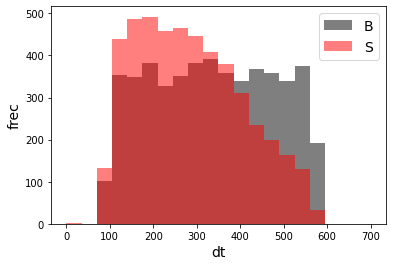

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35219)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35219)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35219)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68383	validation_1-logloss:0.68425
[1]	validation_0-logloss:0.67466	validation_1-logloss:0.67551
[2]	validation_0-logloss:0.66568	validation_1-logloss:0.66695
[3]	validation_0-logloss:0.65690	validation_1-logloss:0.65854
[4]	validation_0-logloss:0.64819	validation_1-logloss:0.65021
[5]	validation_0-logloss:0.63969	validation_1-logloss:0.64210
[6]	validation_0-logloss:0.63130	validation_1-logloss:0.63408
[7]	validation_0-logloss:0.62313	validation_1-logloss:0.62620
[8]	validation_0-logloss:0.61505	validation_1-logloss:0.61848
[9]	validation_0-logloss:0.60715	validation_1-logloss:0.61085
[10]	validation_0-logloss:0.59936	validation_1-logloss:0.60340
[11]	validation_0-logloss:0.59172	validation_1-logloss:0.59615
[12]	validation_0-logloss:0.58422	validation_1-logloss:0.58904
[13]	validation_0-logloss:0.57685	validation_1-logloss:0.58204
[14]	validation_0-logloss:0.56960	validation_1-logloss:0.57511
[15]	validation_0-logloss:0.56249	validation_1-logloss:0.56826
[1

[130]	validation_0-logloss:0.16684	validation_1-logloss:0.19372
[131]	validation_0-logloss:0.16531	validation_1-logloss:0.19221
[132]	validation_0-logloss:0.16377	validation_1-logloss:0.19081
[133]	validation_0-logloss:0.16224	validation_1-logloss:0.18940
[134]	validation_0-logloss:0.16076	validation_1-logloss:0.18796
[135]	validation_0-logloss:0.15930	validation_1-logloss:0.18664
[136]	validation_0-logloss:0.15782	validation_1-logloss:0.18532
[137]	validation_0-logloss:0.15637	validation_1-logloss:0.18401
[138]	validation_0-logloss:0.15494	validation_1-logloss:0.18267
[139]	validation_0-logloss:0.15351	validation_1-logloss:0.18135
[140]	validation_0-logloss:0.15211	validation_1-logloss:0.18008
[141]	validation_0-logloss:0.15074	validation_1-logloss:0.17884
[142]	validation_0-logloss:0.14936	validation_1-logloss:0.17756
[143]	validation_0-logloss:0.14800	validation_1-logloss:0.17634
[144]	validation_0-logloss:0.14668	validation_1-logloss:0.17513
[145]	validation_0-logloss:0.14535	valid

[259]	validation_0-logloss:0.05571	validation_1-logloss:0.09525
[260]	validation_0-logloss:0.05527	validation_1-logloss:0.09486
[261]	validation_0-logloss:0.05483	validation_1-logloss:0.09452
[262]	validation_0-logloss:0.05438	validation_1-logloss:0.09417
[263]	validation_0-logloss:0.05396	validation_1-logloss:0.09382
[264]	validation_0-logloss:0.05354	validation_1-logloss:0.09347
[265]	validation_0-logloss:0.05312	validation_1-logloss:0.09310
[266]	validation_0-logloss:0.05267	validation_1-logloss:0.09271
[267]	validation_0-logloss:0.05223	validation_1-logloss:0.09232
[268]	validation_0-logloss:0.05181	validation_1-logloss:0.09202
[269]	validation_0-logloss:0.05139	validation_1-logloss:0.09166
[270]	validation_0-logloss:0.05098	validation_1-logloss:0.09131
[271]	validation_0-logloss:0.05058	validation_1-logloss:0.09098
[272]	validation_0-logloss:0.05016	validation_1-logloss:0.09065
[273]	validation_0-logloss:0.04977	validation_1-logloss:0.09030
[274]	validation_0-logloss:0.04938	valid

[388]	validation_0-logloss:0.02114	validation_1-logloss:0.06935
[389]	validation_0-logloss:0.02099	validation_1-logloss:0.06927
[390]	validation_0-logloss:0.02083	validation_1-logloss:0.06911
[391]	validation_0-logloss:0.02068	validation_1-logloss:0.06901
[392]	validation_0-logloss:0.02054	validation_1-logloss:0.06891
[393]	validation_0-logloss:0.02039	validation_1-logloss:0.06885
[394]	validation_0-logloss:0.02024	validation_1-logloss:0.06877
[395]	validation_0-logloss:0.02009	validation_1-logloss:0.06867
[396]	validation_0-logloss:0.01994	validation_1-logloss:0.06859
[397]	validation_0-logloss:0.01980	validation_1-logloss:0.06852
[398]	validation_0-logloss:0.01966	validation_1-logloss:0.06840
[399]	validation_0-logloss:0.01954	validation_1-logloss:0.06834
[400]	validation_0-logloss:0.01940	validation_1-logloss:0.06822
[401]	validation_0-logloss:0.01927	validation_1-logloss:0.06808
[402]	validation_0-logloss:0.01915	validation_1-logloss:0.06803
[403]	validation_0-logloss:0.01902	valid

[517]	validation_0-logloss:0.00921	validation_1-logloss:0.06321
[518]	validation_0-logloss:0.00916	validation_1-logloss:0.06317
[519]	validation_0-logloss:0.00910	validation_1-logloss:0.06310
[520]	validation_0-logloss:0.00905	validation_1-logloss:0.06312
[521]	validation_0-logloss:0.00900	validation_1-logloss:0.06313
[522]	validation_0-logloss:0.00895	validation_1-logloss:0.06303
[523]	validation_0-logloss:0.00889	validation_1-logloss:0.06298
[524]	validation_0-logloss:0.00885	validation_1-logloss:0.06300
[525]	validation_0-logloss:0.00879	validation_1-logloss:0.06301
[526]	validation_0-logloss:0.00875	validation_1-logloss:0.06302
[527]	validation_0-logloss:0.00870	validation_1-logloss:0.06300
[528]	validation_0-logloss:0.00865	validation_1-logloss:0.06300
[529]	validation_0-logloss:0.00859	validation_1-logloss:0.06297
[530]	validation_0-logloss:0.00854	validation_1-logloss:0.06300
[531]	validation_0-logloss:0.00849	validation_1-logloss:0.06300
[532]	validation_0-logloss:0.00844	valid

[646]	validation_0-logloss:0.00469	validation_1-logloss:0.06219
[647]	validation_0-logloss:0.00467	validation_1-logloss:0.06218
[648]	validation_0-logloss:0.00465	validation_1-logloss:0.06219
[649]	validation_0-logloss:0.00463	validation_1-logloss:0.06219
[650]	validation_0-logloss:0.00461	validation_1-logloss:0.06221
[651]	validation_0-logloss:0.00460	validation_1-logloss:0.06220
[652]	validation_0-logloss:0.00458	validation_1-logloss:0.06221
[653]	validation_0-logloss:0.00455	validation_1-logloss:0.06222
[654]	validation_0-logloss:0.00453	validation_1-logloss:0.06223
[655]	validation_0-logloss:0.00451	validation_1-logloss:0.06225
[656]	validation_0-logloss:0.00449	validation_1-logloss:0.06226
[657]	validation_0-logloss:0.00447	validation_1-logloss:0.06227
[658]	validation_0-logloss:0.00445	validation_1-logloss:0.06230
[659]	validation_0-logloss:0.00443	validation_1-logloss:0.06225
[660]	validation_0-logloss:0.00441	validation_1-logloss:0.06222
[661]	validation_0-logloss:0.00439	valid

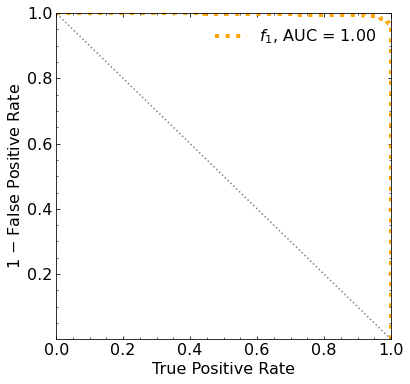

Classification score:


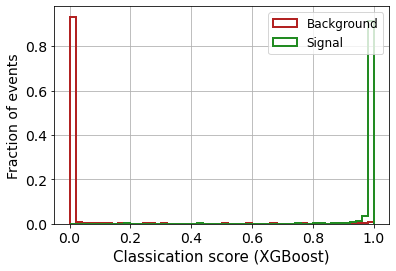


 ROC-AUC =  0.9967804427099337


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 350.15065355
 263.19128514 173.55128954  84.59314542  -8.05518495 -89.93778782]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 452.7855551  369.86379042
 282

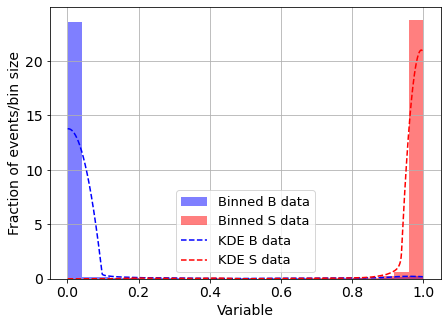

KDE Kernel:  epanechnikov
Background bandwidth:  0.0964296357589577
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



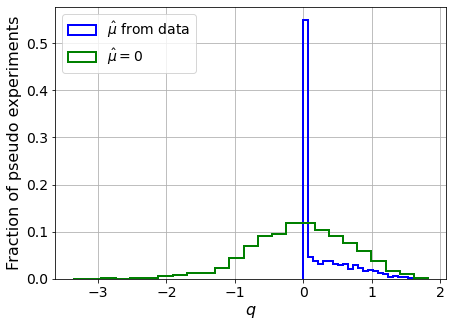

muhat mean:  0.5519252076643053
Z_bins:  0.1504429280258415
std Z_bins:  1.2553102404398453
Z_bins mu=0:  0.1392740640540481
std Z_bins mu=0:  2.585560871634573

--------

B_expected:  643
S_expected:  1



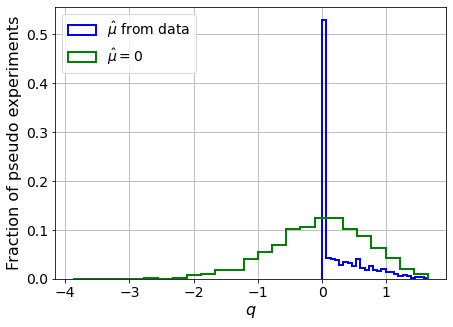

muhat mean:  0.557002005248037
Z_bins:  0.18904320815051986
std Z_bins:  0.9964446573874287
Z_bins mu=0:  0.08145469498183613
std Z_bins mu=0:  4.43133395154723

--------

B_expected:  643
S_expected:  1



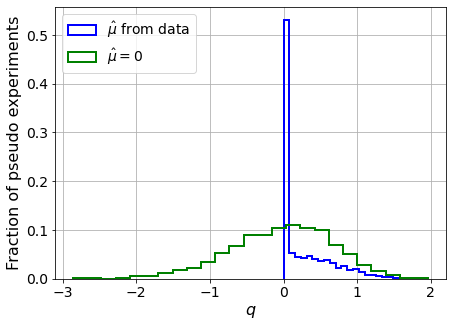

muhat mean:  0.0275350056055602
Z_bins:  0.19672114132645804
std Z_bins:  0.9220120710920041
Z_bins mu=0:  0.10874131682012776
std Z_bins mu=0:  3.247650552929644

--------

B_expected:  643
S_expected:  1



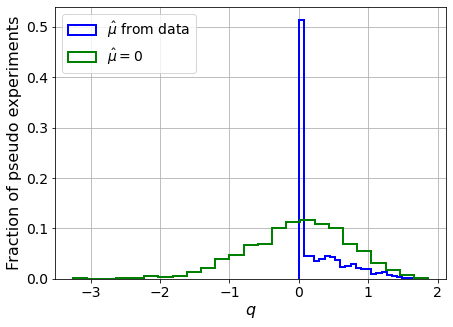

muhat mean:  0.41026413461490824
Z_bins:  0.24080731488176316
std Z_bins:  0.7976406978457159
Z_bins mu=0:  0.2062455133782096
std Z_bins mu=0:  1.7572014480126816

--------

B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


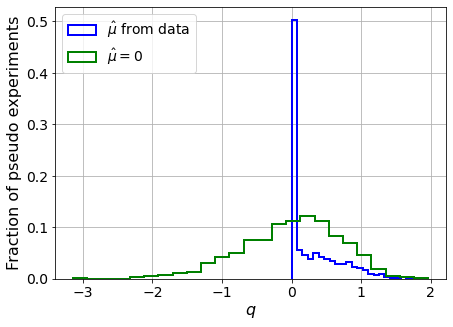

muhat mean:  -0.3593112623498066
Z_bins:  0.2739740493743819
std Z_bins:  0.6823474308735216
Z_bins mu=0:  0.2581426520939944
std Z_bins mu=0:  1.3816399696013881

--------

B_expected:  643
S_expected:  2



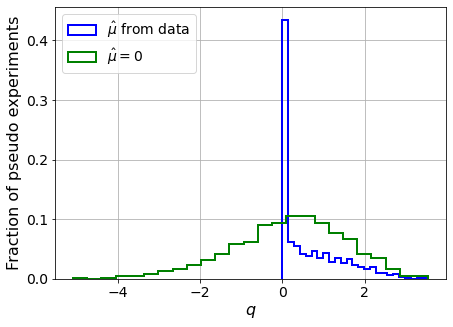

muhat mean:  0.18724400977680813
Z_bins:  0.5438600448152097
std Z_bins:  0.7126660665884744
Z_bins mu=0:  0.5247247158090054
std Z_bins mu=0:  1.313460963338045

--------

B_expected:  643
S_expected:  5



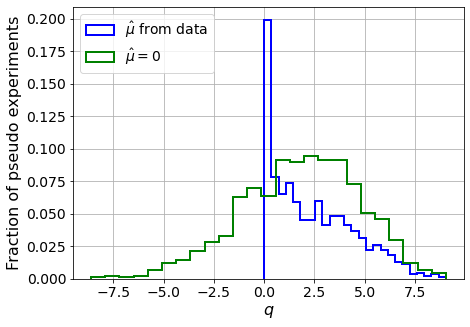

muhat mean:  0.09659374118780525
Z_bins:  1.4154937795644282
std Z_bins:  0.7276340607452917
Z_bins mu=0:  1.4061496921561383
std Z_bins mu=0:  1.037601759072608

--------

B_expected:  643
S_expected:  10



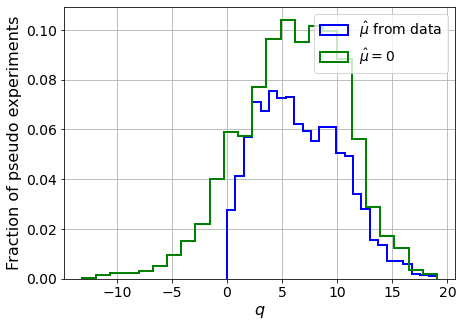

muhat mean:  0.01786032462931402
Z_bins:  2.504057233981629
std Z_bins:  0.7522098414426361
Z_bins mu=0:  2.4951515986252226
std Z_bins mu=0:  0.9626659817016334

--------

B_expected:  643
S_expected:  22



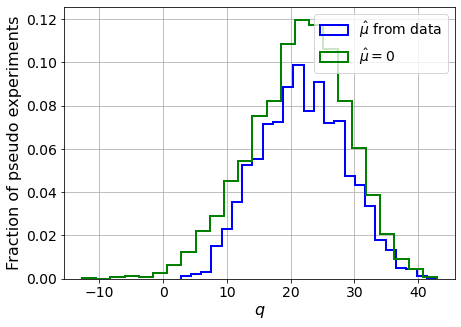

muhat mean:  0.023905824208815225
Z_bins:  4.6619544885779804
std Z_bins:  0.7163684334375829
Z_bins mu=0:  4.657202689022647
std Z_bins mu=0:  0.8310178473814334

--------

B_expected:  643
S_expected:  47



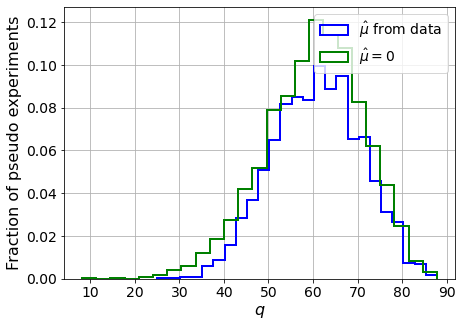

muhat mean:  0.011179765630450063
Z_bins:  7.813758103269799
std Z_bins:  0.6371565058988555
Z_bins mu=0:  7.811601913881813
std Z_bins mu=0:  0.7033219946268469

--------


 FINAL RESULT:

[[0.1504429280258415, 1.2553102404398453, 0.5519252076643053, 0.1392740640540481, 2.585560871634573], [0.18904320815051986, 0.9964446573874287, 0.557002005248037, 0.08145469498183613, 4.43133395154723], [0.19672114132645804, 0.9220120710920041, 0.0275350056055602, 0.10874131682012776, 3.247650552929644], [0.24080731488176316, 0.7976406978457159, 0.41026413461490824, 0.2062455133782096, 1.7572014480126816], [0.2739740493743819, 0.6823474308735216, -0.3593112623498066, 0.2581426520939944, 1.3816399696013881], [0.5438600448152097, 0.7126660665884744, 0.18724400977680813, 0.5247247158090054, 1.313460963338045], [1.4154937795644282, 0.7276340607452917, 0.09659374118780525, 1.4061496921561383, 1.037601759072608], [2.504057233981629, 0.7522098414426361, 0.01786032462931402, 2.4951515986252226, 0.9626659817

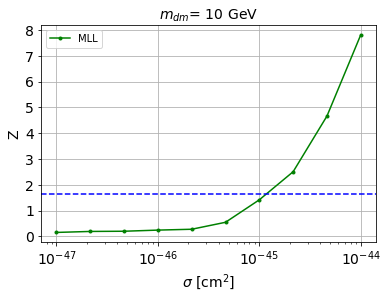


cross_MLL_164:  1.2005602511722629e-45
cross_MLL_164_up:  6.727372975476203e-46
cross_MLL_164_down:  2.0354528680589903e-45

#########################


#########################

mDM =  20 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)

B_pbot.shape:  (500

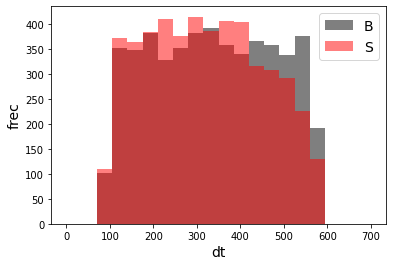

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35219)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35219)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35219)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68493	validation_1-logloss:0.68553
[1]	validation_0-logloss:0.67685	validation_1-logloss:0.67806
[2]	validation_0-logloss:0.66881	validation_1-logloss:0.67064
[3]	validation_0-logloss:0.66092	validation_1-logloss:0.66337
[4]	validation_0-logloss:0.65329	validation_1-logloss:0.65628
[5]	validation_0-logloss:0.64578	validation_1-logloss:0.64930
[6]	validation_0-logloss:0.63840	validation_1-logloss:0.64250
[7]	validation_0-logloss:0.63108	validation_1-logloss:0.63584
[8]	validation_0-logloss:0.62399	validation_1-logloss:0.62921
[9]	validation_0-logloss:0.61693	validation_1-logloss:0.62284
[10]	validation_0-logloss:0.61010	validation_1-logloss:0.61648
[11]	validation_0-logloss:0.60324	validation_1-logloss:0.61033
[12]	validation_0-logloss:0.59657	validation_1-logloss:0.60412
[13]	validation_0-logloss:0.58991	validation_1-logloss:0.59794
[14]	validation_0-logloss:0.58340	validation_1-logloss:0.59201
[15]	validation_0-logloss:0.57703	validation_1-logloss:0.58615
[1

[130]	validation_0-logloss:0.20972	validation_1-logloss:0.25534
[131]	validation_0-logloss:0.20825	validation_1-logloss:0.25409
[132]	validation_0-logloss:0.20673	validation_1-logloss:0.25269
[133]	validation_0-logloss:0.20524	validation_1-logloss:0.25137
[134]	validation_0-logloss:0.20377	validation_1-logloss:0.25006
[135]	validation_0-logloss:0.20235	validation_1-logloss:0.24884
[136]	validation_0-logloss:0.20087	validation_1-logloss:0.24754
[137]	validation_0-logloss:0.19938	validation_1-logloss:0.24625
[138]	validation_0-logloss:0.19795	validation_1-logloss:0.24501
[139]	validation_0-logloss:0.19660	validation_1-logloss:0.24383
[140]	validation_0-logloss:0.19521	validation_1-logloss:0.24258
[141]	validation_0-logloss:0.19387	validation_1-logloss:0.24148
[142]	validation_0-logloss:0.19257	validation_1-logloss:0.24035
[143]	validation_0-logloss:0.19124	validation_1-logloss:0.23922
[144]	validation_0-logloss:0.18994	validation_1-logloss:0.23810
[145]	validation_0-logloss:0.18860	valid

[259]	validation_0-logloss:0.09467	validation_1-logloss:0.16300
[260]	validation_0-logloss:0.09418	validation_1-logloss:0.16267
[261]	validation_0-logloss:0.09368	validation_1-logloss:0.16231
[262]	validation_0-logloss:0.09317	validation_1-logloss:0.16186
[263]	validation_0-logloss:0.09269	validation_1-logloss:0.16153
[264]	validation_0-logloss:0.09221	validation_1-logloss:0.16117
[265]	validation_0-logloss:0.09175	validation_1-logloss:0.16086
[266]	validation_0-logloss:0.09128	validation_1-logloss:0.16051
[267]	validation_0-logloss:0.09080	validation_1-logloss:0.16020
[268]	validation_0-logloss:0.09032	validation_1-logloss:0.15983
[269]	validation_0-logloss:0.08989	validation_1-logloss:0.15955
[270]	validation_0-logloss:0.08946	validation_1-logloss:0.15925
[271]	validation_0-logloss:0.08899	validation_1-logloss:0.15886
[272]	validation_0-logloss:0.08853	validation_1-logloss:0.15857
[273]	validation_0-logloss:0.08809	validation_1-logloss:0.15830
[274]	validation_0-logloss:0.08761	valid

[388]	validation_0-logloss:0.05417	validation_1-logloss:0.13385
[389]	validation_0-logloss:0.05399	validation_1-logloss:0.13373
[390]	validation_0-logloss:0.05376	validation_1-logloss:0.13356
[391]	validation_0-logloss:0.05357	validation_1-logloss:0.13349
[392]	validation_0-logloss:0.05333	validation_1-logloss:0.13334
[393]	validation_0-logloss:0.05312	validation_1-logloss:0.13327
[394]	validation_0-logloss:0.05291	validation_1-logloss:0.13313
[395]	validation_0-logloss:0.05272	validation_1-logloss:0.13293
[396]	validation_0-logloss:0.05253	validation_1-logloss:0.13283
[397]	validation_0-logloss:0.05234	validation_1-logloss:0.13282
[398]	validation_0-logloss:0.05220	validation_1-logloss:0.13266
[399]	validation_0-logloss:0.05202	validation_1-logloss:0.13259
[400]	validation_0-logloss:0.05185	validation_1-logloss:0.13255
[401]	validation_0-logloss:0.05174	validation_1-logloss:0.13246
[402]	validation_0-logloss:0.05153	validation_1-logloss:0.13239
[403]	validation_0-logloss:0.05131	valid

[517]	validation_0-logloss:0.03552	validation_1-logloss:0.12320
[518]	validation_0-logloss:0.03542	validation_1-logloss:0.12318
[519]	validation_0-logloss:0.03531	validation_1-logloss:0.12320
[520]	validation_0-logloss:0.03521	validation_1-logloss:0.12321
[521]	validation_0-logloss:0.03509	validation_1-logloss:0.12318
[522]	validation_0-logloss:0.03498	validation_1-logloss:0.12320
[523]	validation_0-logloss:0.03487	validation_1-logloss:0.12316
[524]	validation_0-logloss:0.03475	validation_1-logloss:0.12307
[525]	validation_0-logloss:0.03465	validation_1-logloss:0.12298
[526]	validation_0-logloss:0.03458	validation_1-logloss:0.12289
[527]	validation_0-logloss:0.03447	validation_1-logloss:0.12282
[528]	validation_0-logloss:0.03439	validation_1-logloss:0.12280
[529]	validation_0-logloss:0.03427	validation_1-logloss:0.12270
[530]	validation_0-logloss:0.03414	validation_1-logloss:0.12263
[531]	validation_0-logloss:0.03403	validation_1-logloss:0.12254
[532]	validation_0-logloss:0.03391	valid

[646]	validation_0-logloss:0.02389	validation_1-logloss:0.11898
[647]	validation_0-logloss:0.02383	validation_1-logloss:0.11895
[648]	validation_0-logloss:0.02377	validation_1-logloss:0.11890
[649]	validation_0-logloss:0.02372	validation_1-logloss:0.11886
[650]	validation_0-logloss:0.02364	validation_1-logloss:0.11885
[651]	validation_0-logloss:0.02354	validation_1-logloss:0.11889
[652]	validation_0-logloss:0.02346	validation_1-logloss:0.11887
[653]	validation_0-logloss:0.02338	validation_1-logloss:0.11881
[654]	validation_0-logloss:0.02332	validation_1-logloss:0.11883
[655]	validation_0-logloss:0.02326	validation_1-logloss:0.11883
[656]	validation_0-logloss:0.02321	validation_1-logloss:0.11885
[657]	validation_0-logloss:0.02313	validation_1-logloss:0.11884
[658]	validation_0-logloss:0.02306	validation_1-logloss:0.11880
[659]	validation_0-logloss:0.02302	validation_1-logloss:0.11876
[660]	validation_0-logloss:0.02293	validation_1-logloss:0.11880
[661]	validation_0-logloss:0.02286	valid

[775]	validation_0-logloss:0.01675	validation_1-logloss:0.11751
[776]	validation_0-logloss:0.01672	validation_1-logloss:0.11749
[777]	validation_0-logloss:0.01666	validation_1-logloss:0.11750
[778]	validation_0-logloss:0.01660	validation_1-logloss:0.11750
[779]	validation_0-logloss:0.01655	validation_1-logloss:0.11749
[780]	validation_0-logloss:0.01649	validation_1-logloss:0.11749
[781]	validation_0-logloss:0.01647	validation_1-logloss:0.11752
[782]	validation_0-logloss:0.01645	validation_1-logloss:0.11752
[783]	validation_0-logloss:0.01640	validation_1-logloss:0.11755
[784]	validation_0-logloss:0.01634	validation_1-logloss:0.11751
[785]	validation_0-logloss:0.01630	validation_1-logloss:0.11752
[786]	validation_0-logloss:0.01627	validation_1-logloss:0.11749
[787]	validation_0-logloss:0.01623	validation_1-logloss:0.11749
[788]	validation_0-logloss:0.01617	validation_1-logloss:0.11752
[789]	validation_0-logloss:0.01613	validation_1-logloss:0.11755
[790]	validation_0-logloss:0.01609	valid

[904]	validation_0-logloss:0.01225	validation_1-logloss:0.11734
[905]	validation_0-logloss:0.01220	validation_1-logloss:0.11735
[906]	validation_0-logloss:0.01218	validation_1-logloss:0.11732
[907]	validation_0-logloss:0.01216	validation_1-logloss:0.11730
[908]	validation_0-logloss:0.01213	validation_1-logloss:0.11735
[909]	validation_0-logloss:0.01211	validation_1-logloss:0.11736
[910]	validation_0-logloss:0.01206	validation_1-logloss:0.11735
[911]	validation_0-logloss:0.01204	validation_1-logloss:0.11733
[912]	validation_0-logloss:0.01200	validation_1-logloss:0.11732
[913]	validation_0-logloss:0.01197	validation_1-logloss:0.11730
[914]	validation_0-logloss:0.01195	validation_1-logloss:0.11729
[915]	validation_0-logloss:0.01191	validation_1-logloss:0.11733
[916]	validation_0-logloss:0.01188	validation_1-logloss:0.11730
[917]	validation_0-logloss:0.01187	validation_1-logloss:0.11732
[918]	validation_0-logloss:0.01184	validation_1-logloss:0.11734
[919]	validation_0-logloss:0.01181	valid

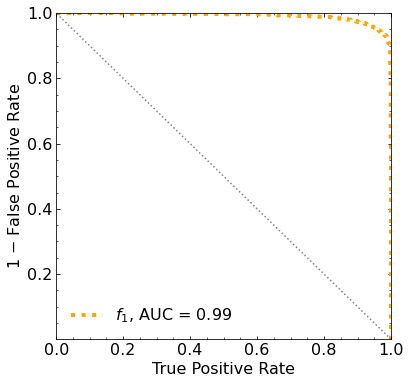

Classification score:


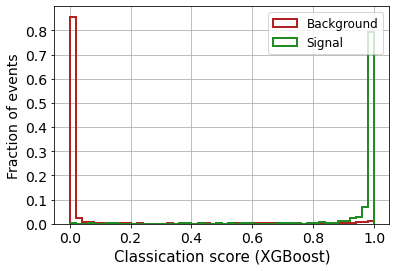


 ROC-AUC =  0.9905305067297646


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 388.07535093 311.02062456
 228.72838787 145.88561684  57.82965293 -29.71652902 -99.67601025]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 385.17256833 319.74143023
 244

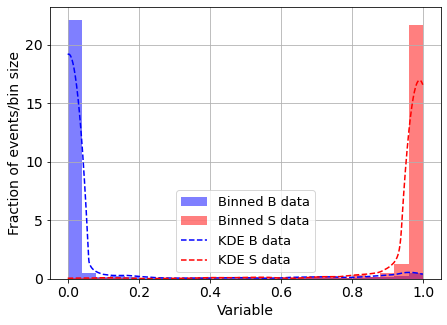

KDE Kernel:  epanechnikov
Background bandwidth:  0.059027261020128646
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



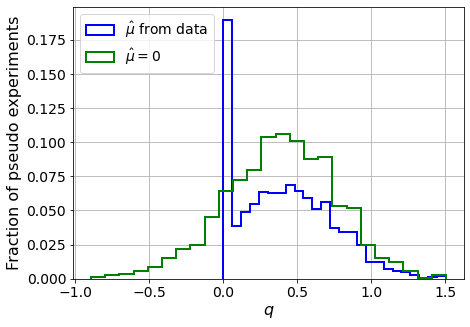

muhat mean:  -4.027979341618119
Z_bins:  0.6322819108214294
std Z_bins:  0.25097683948679134
Z_bins mu=0:  0.6322819108214294
std Z_bins mu=0:  0.2960759745430381

--------

B_expected:  643
S_expected:  2



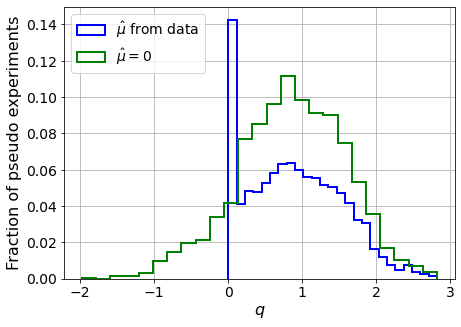

muhat mean:  -2.003179363212972
Z_bins:  0.9250827629293205
std Z_bins:  0.3409361042911141
Z_bins mu=0:  0.9250827629293205
std Z_bins mu=0:  0.3918900301655274

--------

B_expected:  643
S_expected:  4



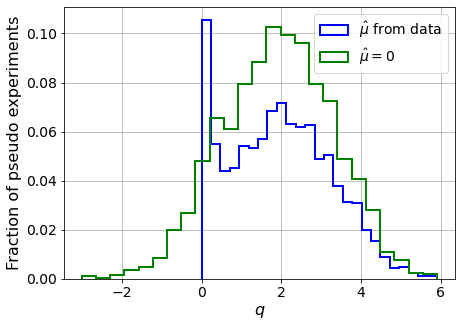

muhat mean:  -0.985651810295005
Z_bins:  1.3947863519151213
std Z_bins:  0.4528614177625249
Z_bins mu=0:  1.3947863519151213
std Z_bins mu=0:  0.49266766920089944

--------

B_expected:  643
S_expected:  9



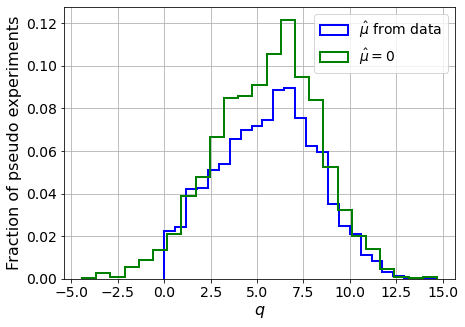

muhat mean:  -0.4527576119137044
Z_bins:  2.3980730195945394
std Z_bins:  0.54860088792275
Z_bins mu=0:  2.3980730195945394
std Z_bins mu=0:  0.5791988731707828

--------

B_expected:  643
S_expected:  18



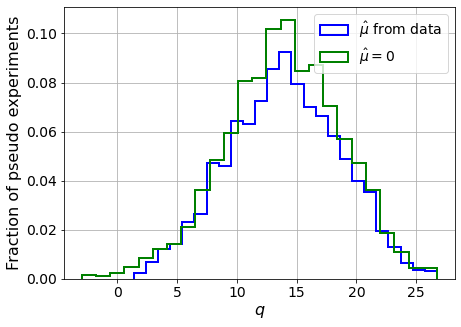

muhat mean:  -0.22046575080025832
Z_bins:  3.7369686884534423
std Z_bins:  0.6241446755863221
Z_bins mu=0:  3.7369686884534423
std Z_bins mu=0:  0.6464151092959718

--------

B_expected:  643
S_expected:  40



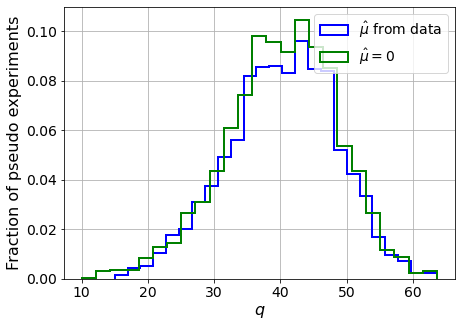

muhat mean:  -0.09457175793435003
Z_bins:  6.366986433423311
std Z_bins:  0.6465097276599793
Z_bins mu=0:  6.366986433423311
std Z_bins mu=0:  0.6629988004415666

--------

B_expected:  643
S_expected:  85



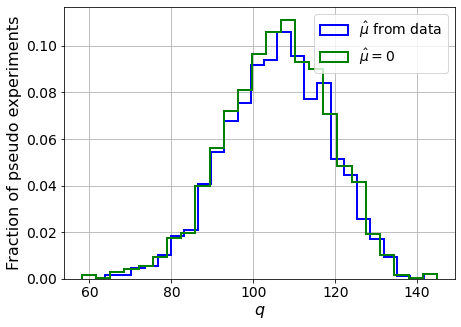

muhat mean:  -0.045188483706872826
Z_bins:  10.311927303536931
std Z_bins:  0.6110214476322716
Z_bins mu=0:  10.311927303536931
std Z_bins mu=0:  0.6204543406482155

--------

B_expected:  643
S_expected:  184



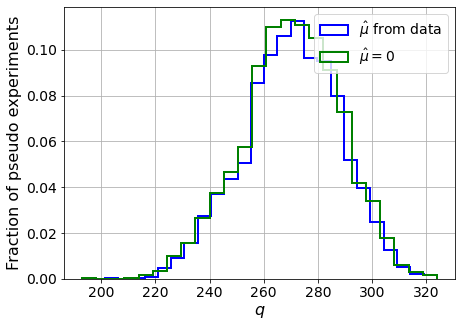

muhat mean:  -0.021495387752409948
Z_bins:  16.45382295994315
std Z_bins:  0.5432739955891234
Z_bins mu=0:  16.45382295994315
std Z_bins mu=0:  0.5486840879303021

--------

B_expected:  643
S_expected:  396



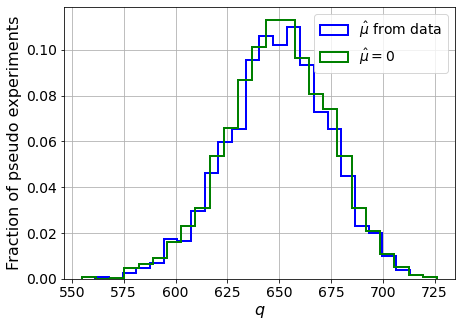

muhat mean:  -0.009950812199695284
Z_bins:  25.491317209177083
std Z_bins:  0.48452111041939566
Z_bins mu=0:  25.491317209177083
std Z_bins mu=0:  0.48816167431682145

--------

B_expected:  643
S_expected:  854



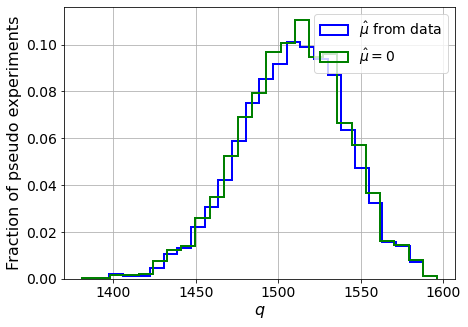

muhat mean:  -0.004691695306588947
Z_bins:  38.859868607454494
std Z_bins:  0.4122193671586645
Z_bins mu=0:  38.859868607454494
std Z_bins mu=0:  0.4146393756045696

--------


 FINAL RESULT:

[[0.6322819108214294, 0.25097683948679134, -4.027979341618119, 0.6322819108214294, 0.2960759745430381], [0.9250827629293205, 0.3409361042911141, -2.003179363212972, 0.9250827629293205, 0.3918900301655274], [1.3947863519151213, 0.4528614177625249, -0.985651810295005, 1.3947863519151213, 0.49266766920089944], [2.3980730195945394, 0.54860088792275, -0.4527576119137044, 2.3980730195945394, 0.5791988731707828], [3.7369686884534423, 0.6241446755863221, -0.22046575080025832, 3.7369686884534423, 0.6464151092959718], [6.366986433423311, 0.6465097276599793, -0.09457175793435003, 6.366986433423311, 0.6629988004415666], [10.311927303536931, 0.6110214476322716, -0.045188483706872826, 10.311927303536931, 0.6204543406482155], [16.45382295994315, 0.5432739955891234, -0.021495387752409948, 16.45382295994315, 0.54

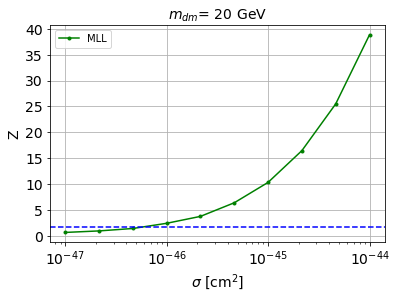


cross_MLL_164:  5.810960572106861e-47
cross_MLL_164_up:  3.7573343561872056e-47
cross_MLL_164_down:  8.543202829989074e-47

#########################


#########################

mDM =  35 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)

B_pbot.shape:  (5000

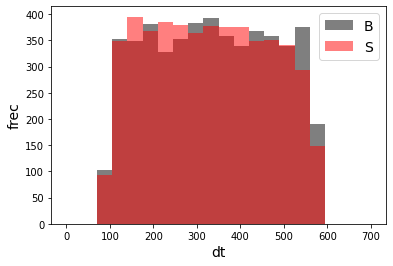

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35219)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35219)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35219)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68610	validation_1-logloss:0.68676
[1]	validation_0-logloss:0.67919	validation_1-logloss:0.68051
[2]	validation_0-logloss:0.67238	validation_1-logloss:0.67427
[3]	validation_0-logloss:0.66574	validation_1-logloss:0.66828
[4]	validation_0-logloss:0.65921	validation_1-logloss:0.66237
[5]	validation_0-logloss:0.65266	validation_1-logloss:0.65647
[6]	validation_0-logloss:0.64623	validation_1-logloss:0.65078
[7]	validation_0-logloss:0.63998	validation_1-logloss:0.64512
[8]	validation_0-logloss:0.63379	validation_1-logloss:0.63962
[9]	validation_0-logloss:0.62772	validation_1-logloss:0.63431
[10]	validation_0-logloss:0.62169	validation_1-logloss:0.62898
[11]	validation_0-logloss:0.61574	validation_1-logloss:0.62381
[12]	validation_0-logloss:0.61003	validation_1-logloss:0.61857
[13]	validation_0-logloss:0.60436	validation_1-logloss:0.61380
[14]	validation_0-logloss:0.59871	validation_1-logloss:0.60891
[15]	validation_0-logloss:0.59316	validation_1-logloss:0.60414
[1

[130]	validation_0-logloss:0.27280	validation_1-logloss:0.33185
[131]	validation_0-logloss:0.27143	validation_1-logloss:0.33078
[132]	validation_0-logloss:0.26999	validation_1-logloss:0.32977
[133]	validation_0-logloss:0.26870	validation_1-logloss:0.32874
[134]	validation_0-logloss:0.26732	validation_1-logloss:0.32768
[135]	validation_0-logloss:0.26595	validation_1-logloss:0.32670
[136]	validation_0-logloss:0.26466	validation_1-logloss:0.32586
[137]	validation_0-logloss:0.26332	validation_1-logloss:0.32490
[138]	validation_0-logloss:0.26197	validation_1-logloss:0.32395
[139]	validation_0-logloss:0.26074	validation_1-logloss:0.32296
[140]	validation_0-logloss:0.25954	validation_1-logloss:0.32204
[141]	validation_0-logloss:0.25831	validation_1-logloss:0.32119
[142]	validation_0-logloss:0.25701	validation_1-logloss:0.32020
[143]	validation_0-logloss:0.25575	validation_1-logloss:0.31936
[144]	validation_0-logloss:0.25451	validation_1-logloss:0.31838
[145]	validation_0-logloss:0.25329	valid

[259]	validation_0-logloss:0.15728	validation_1-logloss:0.24927
[260]	validation_0-logloss:0.15662	validation_1-logloss:0.24888
[261]	validation_0-logloss:0.15607	validation_1-logloss:0.24852
[262]	validation_0-logloss:0.15553	validation_1-logloss:0.24823
[263]	validation_0-logloss:0.15498	validation_1-logloss:0.24797
[264]	validation_0-logloss:0.15440	validation_1-logloss:0.24759
[265]	validation_0-logloss:0.15382	validation_1-logloss:0.24725
[266]	validation_0-logloss:0.15333	validation_1-logloss:0.24695
[267]	validation_0-logloss:0.15274	validation_1-logloss:0.24660
[268]	validation_0-logloss:0.15217	validation_1-logloss:0.24625
[269]	validation_0-logloss:0.15161	validation_1-logloss:0.24596
[270]	validation_0-logloss:0.15111	validation_1-logloss:0.24573
[271]	validation_0-logloss:0.15057	validation_1-logloss:0.24549
[272]	validation_0-logloss:0.15010	validation_1-logloss:0.24512
[273]	validation_0-logloss:0.14961	validation_1-logloss:0.24481
[274]	validation_0-logloss:0.14911	valid

[388]	validation_0-logloss:0.10545	validation_1-logloss:0.22258
[389]	validation_0-logloss:0.10512	validation_1-logloss:0.22248
[390]	validation_0-logloss:0.10486	validation_1-logloss:0.22237
[391]	validation_0-logloss:0.10452	validation_1-logloss:0.22221
[392]	validation_0-logloss:0.10423	validation_1-logloss:0.22217
[393]	validation_0-logloss:0.10385	validation_1-logloss:0.22198
[394]	validation_0-logloss:0.10358	validation_1-logloss:0.22186
[395]	validation_0-logloss:0.10321	validation_1-logloss:0.22168
[396]	validation_0-logloss:0.10290	validation_1-logloss:0.22154
[397]	validation_0-logloss:0.10253	validation_1-logloss:0.22137
[398]	validation_0-logloss:0.10221	validation_1-logloss:0.22122
[399]	validation_0-logloss:0.10192	validation_1-logloss:0.22110
[400]	validation_0-logloss:0.10161	validation_1-logloss:0.22080
[401]	validation_0-logloss:0.10133	validation_1-logloss:0.22076
[402]	validation_0-logloss:0.10105	validation_1-logloss:0.22071
[403]	validation_0-logloss:0.10075	valid

[517]	validation_0-logloss:0.07452	validation_1-logloss:0.20928
[518]	validation_0-logloss:0.07431	validation_1-logloss:0.20915
[519]	validation_0-logloss:0.07414	validation_1-logloss:0.20913
[520]	validation_0-logloss:0.07393	validation_1-logloss:0.20903
[521]	validation_0-logloss:0.07368	validation_1-logloss:0.20891
[522]	validation_0-logloss:0.07350	validation_1-logloss:0.20875
[523]	validation_0-logloss:0.07334	validation_1-logloss:0.20870
[524]	validation_0-logloss:0.07319	validation_1-logloss:0.20858
[525]	validation_0-logloss:0.07308	validation_1-logloss:0.20846
[526]	validation_0-logloss:0.07290	validation_1-logloss:0.20850
[527]	validation_0-logloss:0.07269	validation_1-logloss:0.20840
[528]	validation_0-logloss:0.07250	validation_1-logloss:0.20841
[529]	validation_0-logloss:0.07240	validation_1-logloss:0.20832
[530]	validation_0-logloss:0.07219	validation_1-logloss:0.20819
[531]	validation_0-logloss:0.07203	validation_1-logloss:0.20811
[532]	validation_0-logloss:0.07186	valid

[646]	validation_0-logloss:0.05533	validation_1-logloss:0.20180
[647]	validation_0-logloss:0.05518	validation_1-logloss:0.20170
[648]	validation_0-logloss:0.05507	validation_1-logloss:0.20170
[649]	validation_0-logloss:0.05491	validation_1-logloss:0.20167
[650]	validation_0-logloss:0.05484	validation_1-logloss:0.20163
[651]	validation_0-logloss:0.05474	validation_1-logloss:0.20155
[652]	validation_0-logloss:0.05468	validation_1-logloss:0.20153
[653]	validation_0-logloss:0.05456	validation_1-logloss:0.20144
[654]	validation_0-logloss:0.05448	validation_1-logloss:0.20144
[655]	validation_0-logloss:0.05434	validation_1-logloss:0.20128
[656]	validation_0-logloss:0.05423	validation_1-logloss:0.20132
[657]	validation_0-logloss:0.05414	validation_1-logloss:0.20130
[658]	validation_0-logloss:0.05399	validation_1-logloss:0.20123
[659]	validation_0-logloss:0.05387	validation_1-logloss:0.20126
[660]	validation_0-logloss:0.05375	validation_1-logloss:0.20119
[661]	validation_0-logloss:0.05361	valid

[775]	validation_0-logloss:0.04240	validation_1-logloss:0.19608
[776]	validation_0-logloss:0.04232	validation_1-logloss:0.19611
[777]	validation_0-logloss:0.04223	validation_1-logloss:0.19613
[778]	validation_0-logloss:0.04216	validation_1-logloss:0.19608
[779]	validation_0-logloss:0.04212	validation_1-logloss:0.19612
[780]	validation_0-logloss:0.04204	validation_1-logloss:0.19600
[781]	validation_0-logloss:0.04196	validation_1-logloss:0.19597
[782]	validation_0-logloss:0.04186	validation_1-logloss:0.19603
[783]	validation_0-logloss:0.04175	validation_1-logloss:0.19599
[784]	validation_0-logloss:0.04168	validation_1-logloss:0.19596
[785]	validation_0-logloss:0.04163	validation_1-logloss:0.19596
[786]	validation_0-logloss:0.04156	validation_1-logloss:0.19584
[787]	validation_0-logloss:0.04149	validation_1-logloss:0.19590
[788]	validation_0-logloss:0.04144	validation_1-logloss:0.19593
[789]	validation_0-logloss:0.04135	validation_1-logloss:0.19594
[790]	validation_0-logloss:0.04127	valid

[904]	validation_0-logloss:0.03361	validation_1-logloss:0.19456
[905]	validation_0-logloss:0.03355	validation_1-logloss:0.19455
[906]	validation_0-logloss:0.03349	validation_1-logloss:0.19457
[907]	validation_0-logloss:0.03344	validation_1-logloss:0.19455
[908]	validation_0-logloss:0.03340	validation_1-logloss:0.19459
[909]	validation_0-logloss:0.03334	validation_1-logloss:0.19451
[910]	validation_0-logloss:0.03333	validation_1-logloss:0.19449
[911]	validation_0-logloss:0.03326	validation_1-logloss:0.19446
[912]	validation_0-logloss:0.03320	validation_1-logloss:0.19443
[913]	validation_0-logloss:0.03317	validation_1-logloss:0.19443
[914]	validation_0-logloss:0.03310	validation_1-logloss:0.19433
[915]	validation_0-logloss:0.03307	validation_1-logloss:0.19436
[916]	validation_0-logloss:0.03300	validation_1-logloss:0.19439
[917]	validation_0-logloss:0.03291	validation_1-logloss:0.19438
[918]	validation_0-logloss:0.03284	validation_1-logloss:0.19439
[919]	validation_0-logloss:0.03276	valid

[1032]	validation_0-logloss:0.02683	validation_1-logloss:0.19349
[1033]	validation_0-logloss:0.02681	validation_1-logloss:0.19353
[1034]	validation_0-logloss:0.02679	validation_1-logloss:0.19351
[1035]	validation_0-logloss:0.02675	validation_1-logloss:0.19348
[1036]	validation_0-logloss:0.02669	validation_1-logloss:0.19353
[1037]	validation_0-logloss:0.02666	validation_1-logloss:0.19352
[1038]	validation_0-logloss:0.02662	validation_1-logloss:0.19358
[1039]	validation_0-logloss:0.02658	validation_1-logloss:0.19362
[1040]	validation_0-logloss:0.02652	validation_1-logloss:0.19357
[1041]	validation_0-logloss:0.02646	validation_1-logloss:0.19358
[1042]	validation_0-logloss:0.02639	validation_1-logloss:0.19361
[1043]	validation_0-logloss:0.02635	validation_1-logloss:0.19362
[1044]	validation_0-logloss:0.02632	validation_1-logloss:0.19358
[1045]	validation_0-logloss:0.02627	validation_1-logloss:0.19359
[1046]	validation_0-logloss:0.02624	validation_1-logloss:0.19358
[1047]	validation_0-loglo

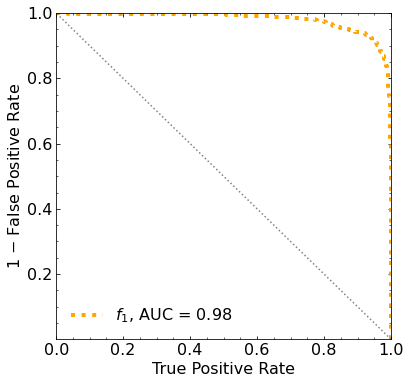

Classification score:


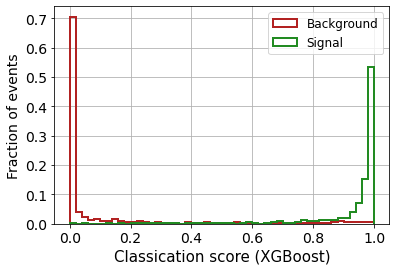


 ROC-AUC =  0.979771013869256


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf          -inf  338.84829522  283.46986523  223.84380746
  163.56590416  101.53649823   33.80622066  -36.34363399 -101.7182545 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 323.11373187 285.191955

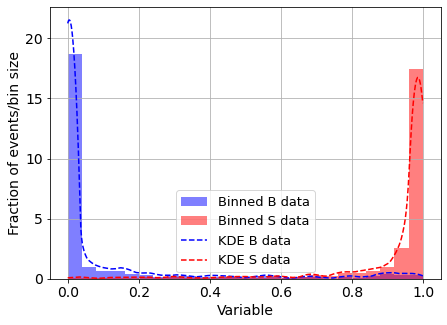

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



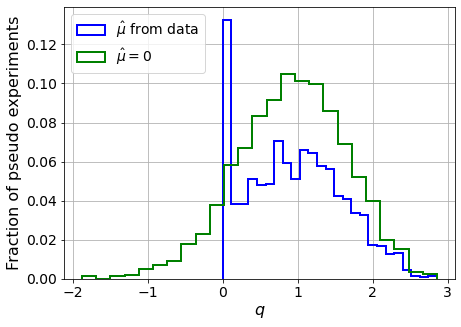

muhat mean:  -2.3019659675233823
Z_bins:  0.9702092723459543
std Z_bins:  0.32993942083117817
Z_bins mu=0:  0.9702092723459543
std Z_bins mu=0:  0.3712344182900894

--------

B_expected:  643
S_expected:  4



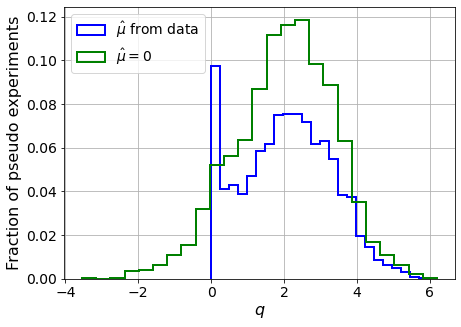

muhat mean:  -1.0533657052490244
Z_bins:  1.4520347862989607
std Z_bins:  0.4263367942683231
Z_bins mu=0:  1.4520347862989607
std Z_bins mu=0:  0.469744727534466

--------

B_expected:  643
S_expected:  8



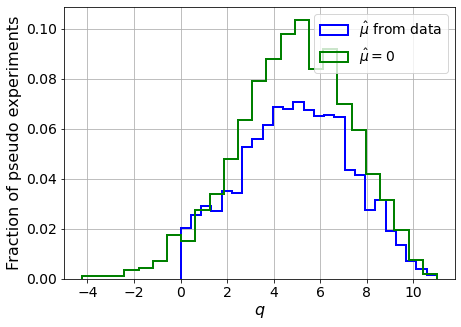

muhat mean:  -0.5645128350190842
Z_bins:  2.232593116721606
std Z_bins:  0.5177728232969414
Z_bins mu=0:  2.232593116721606
std Z_bins mu=0:  0.5481911170432103

--------

B_expected:  643
S_expected:  18



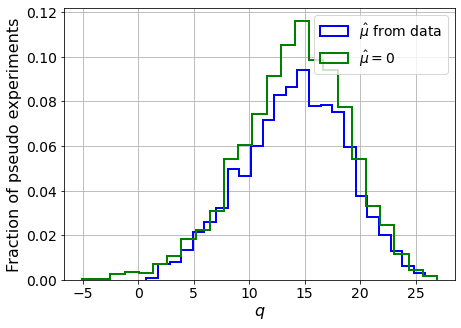

muhat mean:  -0.24423142805403492
Z_bins:  3.7784319385305403
std Z_bins:  0.6111329690609222
Z_bins mu=0:  3.7784319385305403
std Z_bins mu=0:  0.6371238062689482

--------

B_expected:  643
S_expected:  39



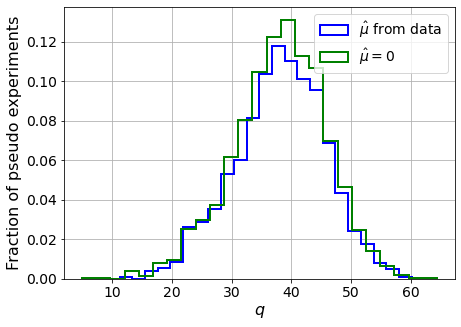

muhat mean:  -0.10770437561980993
Z_bins:  6.201963303256366
std Z_bins:  0.6136672085394047
Z_bins mu=0:  6.201963303256366
std Z_bins mu=0:  0.627969087594357

--------

B_expected:  643
S_expected:  83



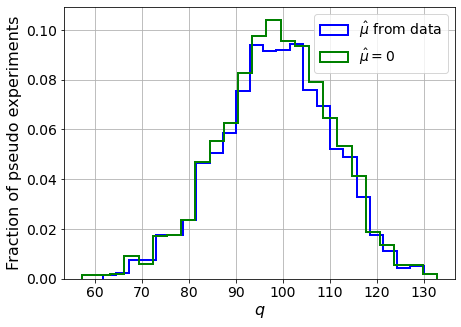

muhat mean:  -0.05472791798594152
Z_bins:  9.937854553525312
std Z_bins:  0.6002111764045431
Z_bins mu=0:  9.937854553525312
std Z_bins mu=0:  0.6081072520524221

--------

B_expected:  643
S_expected:  179



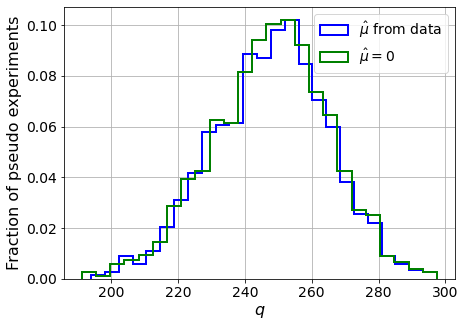

muhat mean:  -0.025335976049481488
Z_bins:  15.770125711052
std Z_bins:  0.5477903530259713
Z_bins mu=0:  15.770125711052
std Z_bins mu=0:  0.5526710541910328

--------

B_expected:  643
S_expected:  385



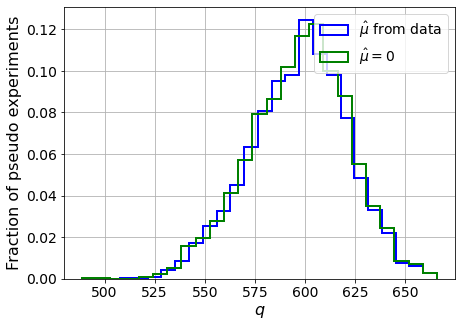

muhat mean:  -0.012479211246165531
Z_bins:  24.471567646367113
std Z_bins:  0.49898492943606626
Z_bins mu=0:  24.471567646367113
std Z_bins mu=0:  0.5028194260406256

--------

B_expected:  643
S_expected:  830



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


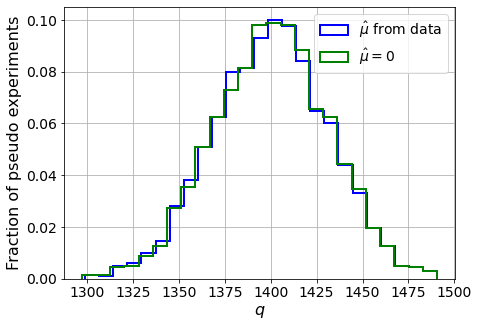

muhat mean:  -0.005473817208771069
Z_bins:  37.430789877543184
std Z_bins:  0.41655514232935764
Z_bins mu=0:  37.430789877543184
std Z_bins mu=0:  0.4180983181639566

--------

B_expected:  643
S_expected:  1787



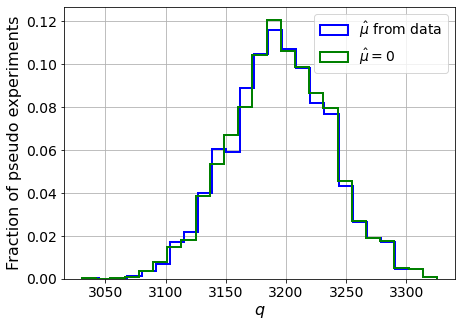

muhat mean:  -0.0026389568439922125
Z_bins:  56.521671153366064
std Z_bins:  0.37079066601060595
Z_bins mu=0:  56.521671153366064
std Z_bins mu=0:  0.3718405837944306

--------


 FINAL RESULT:

[[0.9702092723459543, 0.32993942083117817, -2.3019659675233823, 0.9702092723459543, 0.3712344182900894], [1.4520347862989607, 0.4263367942683231, -1.0533657052490244, 1.4520347862989607, 0.469744727534466], [2.232593116721606, 0.5177728232969414, -0.5645128350190842, 2.232593116721606, 0.5481911170432103], [3.7784319385305403, 0.6111329690609222, -0.24423142805403492, 3.7784319385305403, 0.6371238062689482], [6.201963303256366, 0.6136672085394047, -0.10770437561980993, 6.201963303256366, 0.627969087594357], [9.937854553525312, 0.6002111764045431, -0.05472791798594152, 9.937854553525312, 0.6081072520524221], [15.770125711052, 0.5477903530259713, -0.025335976049481488, 15.770125711052, 0.5526710541910328], [24.471567646367113, 0.49898492943606626, -0.012479211246165531, 24.471567646367113, 0.5028

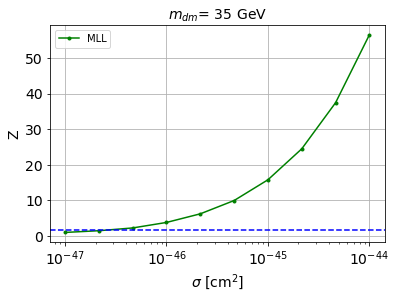


cross_MLL_164:  2.7136690744062864e-47
cross_MLL_164_up:  1.6221724635197363e-47
cross_MLL_164_down:  4.381316565014401e-47

#########################


#########################

mDM =  50 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)

B_pbot.shape:  (500

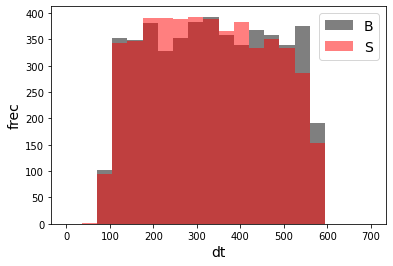

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35219)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35219)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35219)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68669	validation_1-logloss:0.68742
[1]	validation_0-logloss:0.68032	validation_1-logloss:0.68178
[2]	validation_0-logloss:0.67411	validation_1-logloss:0.67625
[3]	validation_0-logloss:0.66796	validation_1-logloss:0.67074
[4]	validation_0-logloss:0.66193	validation_1-logloss:0.66546
[5]	validation_0-logloss:0.65599	validation_1-logloss:0.66016
[6]	validation_0-logloss:0.65013	validation_1-logloss:0.65507
[7]	validation_0-logloss:0.64442	validation_1-logloss:0.64998
[8]	validation_0-logloss:0.63874	validation_1-logloss:0.64501
[9]	validation_0-logloss:0.63320	validation_1-logloss:0.64027
[10]	validation_0-logloss:0.62777	validation_1-logloss:0.63552
[11]	validation_0-logloss:0.62235	validation_1-logloss:0.63081
[12]	validation_0-logloss:0.61709	validation_1-logloss:0.62618
[13]	validation_0-logloss:0.61186	validation_1-logloss:0.62168
[14]	validation_0-logloss:0.60671	validation_1-logloss:0.61724
[15]	validation_0-logloss:0.60171	validation_1-logloss:0.61285
[1

[130]	validation_0-logloss:0.29966	validation_1-logloss:0.36502
[131]	validation_0-logloss:0.29830	validation_1-logloss:0.36420
[132]	validation_0-logloss:0.29696	validation_1-logloss:0.36327
[133]	validation_0-logloss:0.29563	validation_1-logloss:0.36218
[134]	validation_0-logloss:0.29431	validation_1-logloss:0.36129
[135]	validation_0-logloss:0.29299	validation_1-logloss:0.36021
[136]	validation_0-logloss:0.29165	validation_1-logloss:0.35925
[137]	validation_0-logloss:0.29039	validation_1-logloss:0.35829
[138]	validation_0-logloss:0.28909	validation_1-logloss:0.35742
[139]	validation_0-logloss:0.28778	validation_1-logloss:0.35651
[140]	validation_0-logloss:0.28649	validation_1-logloss:0.35548
[141]	validation_0-logloss:0.28525	validation_1-logloss:0.35453
[142]	validation_0-logloss:0.28402	validation_1-logloss:0.35357
[143]	validation_0-logloss:0.28279	validation_1-logloss:0.35259
[144]	validation_0-logloss:0.28150	validation_1-logloss:0.35172
[145]	validation_0-logloss:0.28026	valid

[259]	validation_0-logloss:0.18452	validation_1-logloss:0.28772
[260]	validation_0-logloss:0.18389	validation_1-logloss:0.28733
[261]	validation_0-logloss:0.18335	validation_1-logloss:0.28698
[262]	validation_0-logloss:0.18282	validation_1-logloss:0.28674
[263]	validation_0-logloss:0.18225	validation_1-logloss:0.28634
[264]	validation_0-logloss:0.18166	validation_1-logloss:0.28600
[265]	validation_0-logloss:0.18105	validation_1-logloss:0.28568
[266]	validation_0-logloss:0.18044	validation_1-logloss:0.28537
[267]	validation_0-logloss:0.17987	validation_1-logloss:0.28502
[268]	validation_0-logloss:0.17938	validation_1-logloss:0.28477
[269]	validation_0-logloss:0.17877	validation_1-logloss:0.28440
[270]	validation_0-logloss:0.17815	validation_1-logloss:0.28409
[271]	validation_0-logloss:0.17764	validation_1-logloss:0.28374
[272]	validation_0-logloss:0.17709	validation_1-logloss:0.28328
[273]	validation_0-logloss:0.17655	validation_1-logloss:0.28300
[274]	validation_0-logloss:0.17600	valid

[388]	validation_0-logloss:0.12764	validation_1-logloss:0.25541
[389]	validation_0-logloss:0.12735	validation_1-logloss:0.25527
[390]	validation_0-logloss:0.12698	validation_1-logloss:0.25507
[391]	validation_0-logloss:0.12664	validation_1-logloss:0.25490
[392]	validation_0-logloss:0.12632	validation_1-logloss:0.25482
[393]	validation_0-logloss:0.12600	validation_1-logloss:0.25455
[394]	validation_0-logloss:0.12567	validation_1-logloss:0.25444
[395]	validation_0-logloss:0.12532	validation_1-logloss:0.25430
[396]	validation_0-logloss:0.12499	validation_1-logloss:0.25410
[397]	validation_0-logloss:0.12468	validation_1-logloss:0.25400
[398]	validation_0-logloss:0.12445	validation_1-logloss:0.25386
[399]	validation_0-logloss:0.12413	validation_1-logloss:0.25370
[400]	validation_0-logloss:0.12380	validation_1-logloss:0.25354
[401]	validation_0-logloss:0.12343	validation_1-logloss:0.25331
[402]	validation_0-logloss:0.12312	validation_1-logloss:0.25310
[403]	validation_0-logloss:0.12284	valid

[517]	validation_0-logloss:0.09279	validation_1-logloss:0.23856
[518]	validation_0-logloss:0.09255	validation_1-logloss:0.23832
[519]	validation_0-logloss:0.09231	validation_1-logloss:0.23820
[520]	validation_0-logloss:0.09213	validation_1-logloss:0.23811
[521]	validation_0-logloss:0.09190	validation_1-logloss:0.23795
[522]	validation_0-logloss:0.09172	validation_1-logloss:0.23777
[523]	validation_0-logloss:0.09146	validation_1-logloss:0.23753
[524]	validation_0-logloss:0.09122	validation_1-logloss:0.23753
[525]	validation_0-logloss:0.09100	validation_1-logloss:0.23735
[526]	validation_0-logloss:0.09079	validation_1-logloss:0.23718
[527]	validation_0-logloss:0.09062	validation_1-logloss:0.23709
[528]	validation_0-logloss:0.09038	validation_1-logloss:0.23700
[529]	validation_0-logloss:0.09019	validation_1-logloss:0.23696
[530]	validation_0-logloss:0.08999	validation_1-logloss:0.23685
[531]	validation_0-logloss:0.08974	validation_1-logloss:0.23676
[532]	validation_0-logloss:0.08958	valid

[646]	validation_0-logloss:0.06988	validation_1-logloss:0.22715
[647]	validation_0-logloss:0.06970	validation_1-logloss:0.22709
[648]	validation_0-logloss:0.06957	validation_1-logloss:0.22708
[649]	validation_0-logloss:0.06939	validation_1-logloss:0.22711
[650]	validation_0-logloss:0.06926	validation_1-logloss:0.22697
[651]	validation_0-logloss:0.06907	validation_1-logloss:0.22691
[652]	validation_0-logloss:0.06893	validation_1-logloss:0.22684
[653]	validation_0-logloss:0.06873	validation_1-logloss:0.22677
[654]	validation_0-logloss:0.06861	validation_1-logloss:0.22671
[655]	validation_0-logloss:0.06846	validation_1-logloss:0.22660
[656]	validation_0-logloss:0.06834	validation_1-logloss:0.22654
[657]	validation_0-logloss:0.06821	validation_1-logloss:0.22650
[658]	validation_0-logloss:0.06807	validation_1-logloss:0.22639
[659]	validation_0-logloss:0.06790	validation_1-logloss:0.22636
[660]	validation_0-logloss:0.06773	validation_1-logloss:0.22623
[661]	validation_0-logloss:0.06758	valid

[775]	validation_0-logloss:0.05344	validation_1-logloss:0.22005
[776]	validation_0-logloss:0.05336	validation_1-logloss:0.22001
[777]	validation_0-logloss:0.05330	validation_1-logloss:0.22004
[778]	validation_0-logloss:0.05317	validation_1-logloss:0.21997
[779]	validation_0-logloss:0.05310	validation_1-logloss:0.21997
[780]	validation_0-logloss:0.05300	validation_1-logloss:0.21992
[781]	validation_0-logloss:0.05289	validation_1-logloss:0.21987
[782]	validation_0-logloss:0.05279	validation_1-logloss:0.21994
[783]	validation_0-logloss:0.05266	validation_1-logloss:0.21990
[784]	validation_0-logloss:0.05259	validation_1-logloss:0.21987
[785]	validation_0-logloss:0.05250	validation_1-logloss:0.21984
[786]	validation_0-logloss:0.05239	validation_1-logloss:0.21979
[787]	validation_0-logloss:0.05235	validation_1-logloss:0.21980
[788]	validation_0-logloss:0.05226	validation_1-logloss:0.21979
[789]	validation_0-logloss:0.05216	validation_1-logloss:0.21976
[790]	validation_0-logloss:0.05206	valid

[904]	validation_0-logloss:0.04251	validation_1-logloss:0.21767
[905]	validation_0-logloss:0.04246	validation_1-logloss:0.21764
[906]	validation_0-logloss:0.04239	validation_1-logloss:0.21768
[907]	validation_0-logloss:0.04233	validation_1-logloss:0.21768
[908]	validation_0-logloss:0.04224	validation_1-logloss:0.21757
[909]	validation_0-logloss:0.04217	validation_1-logloss:0.21761
[910]	validation_0-logloss:0.04208	validation_1-logloss:0.21757
[911]	validation_0-logloss:0.04202	validation_1-logloss:0.21751
[912]	validation_0-logloss:0.04194	validation_1-logloss:0.21745
[913]	validation_0-logloss:0.04186	validation_1-logloss:0.21741
[914]	validation_0-logloss:0.04179	validation_1-logloss:0.21738
[915]	validation_0-logloss:0.04176	validation_1-logloss:0.21738
[916]	validation_0-logloss:0.04169	validation_1-logloss:0.21738
[917]	validation_0-logloss:0.04160	validation_1-logloss:0.21729
[918]	validation_0-logloss:0.04151	validation_1-logloss:0.21734
[919]	validation_0-logloss:0.04146	valid

[1032]	validation_0-logloss:0.03420	validation_1-logloss:0.21615
[1033]	validation_0-logloss:0.03415	validation_1-logloss:0.21615
[1034]	validation_0-logloss:0.03412	validation_1-logloss:0.21612
[1035]	validation_0-logloss:0.03404	validation_1-logloss:0.21612
[1036]	validation_0-logloss:0.03399	validation_1-logloss:0.21619
[1037]	validation_0-logloss:0.03392	validation_1-logloss:0.21621
[1038]	validation_0-logloss:0.03386	validation_1-logloss:0.21624
[1039]	validation_0-logloss:0.03381	validation_1-logloss:0.21623
[1040]	validation_0-logloss:0.03373	validation_1-logloss:0.21627
[1041]	validation_0-logloss:0.03368	validation_1-logloss:0.21625
[1042]	validation_0-logloss:0.03361	validation_1-logloss:0.21627
[1043]	validation_0-logloss:0.03355	validation_1-logloss:0.21634
[1044]	validation_0-logloss:0.03351	validation_1-logloss:0.21632
[1045]	validation_0-logloss:0.03347	validation_1-logloss:0.21626
[1046]	validation_0-logloss:0.03343	validation_1-logloss:0.21625
[1047]	validation_0-loglo

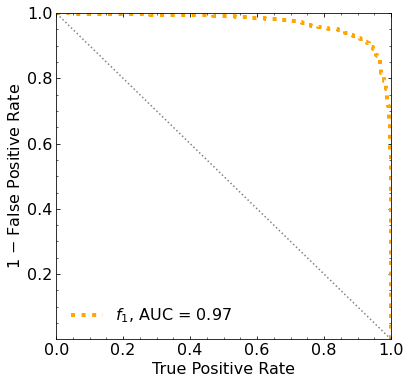

Classification score:


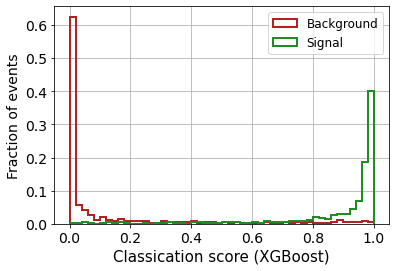


 ROC-AUC =  0.9712864656956139


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  338.07791165  296.71391963  251.11805865  202.0200274
  147.66291863   88.48943839   26.21062183  -39.64524987 -102.68004733]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 231.2736289

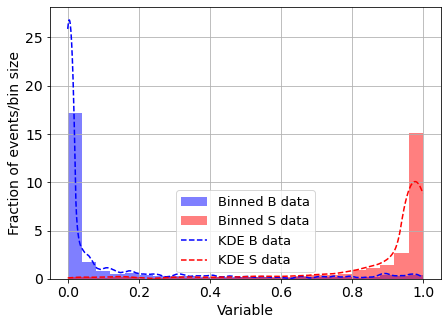

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



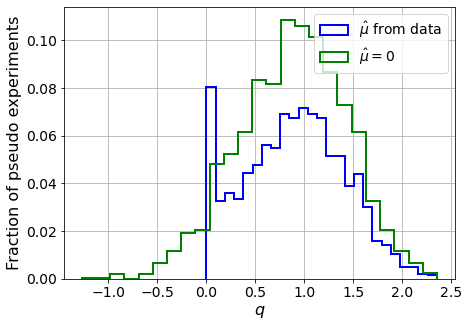

muhat mean:  -3.8487878836259015
Z_bins:  0.9510114072385224
std Z_bins:  0.2687480429361865
Z_bins mu=0:  0.9510114072385224
std Z_bins mu=0:  0.28631526435089744

--------

B_expected:  643
S_expected:  4



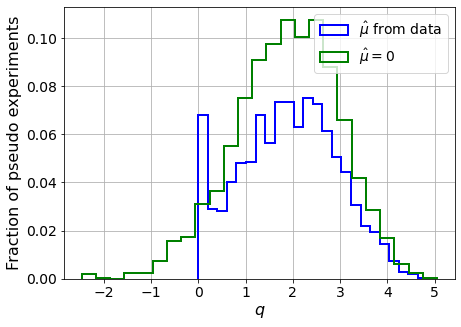

muhat mean:  -1.8980401373577802
Z_bins:  1.3862853036019065
std Z_bins:  0.3709840408713803
Z_bins mu=0:  1.3862853036019065
std Z_bins mu=0:  0.3967127456118307

--------

B_expected:  643
S_expected:  9



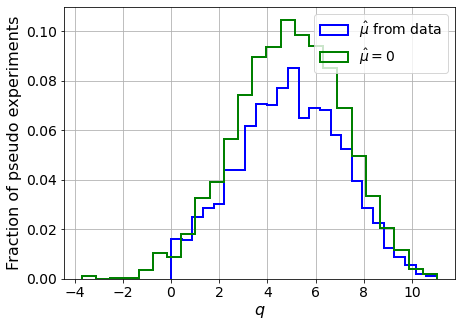

muhat mean:  -0.8185590673212332
Z_bins:  2.2243174681877194
std Z_bins:  0.48317470551950953
Z_bins mu=0:  2.2243174681877194
std Z_bins mu=0:  0.4967243622221717

--------

B_expected:  643
S_expected:  19



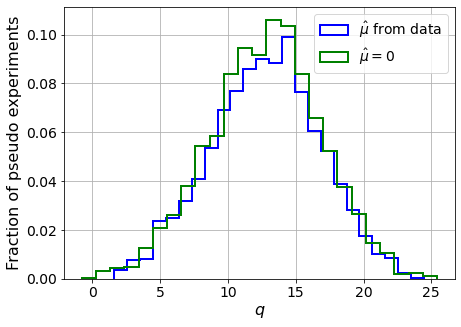

muhat mean:  -0.3935061121717441
Z_bins:  3.589753946335335
std Z_bins:  0.5643030186142892
Z_bins mu=0:  3.589753946335335
std Z_bins mu=0:  0.5722636350380792

--------

B_expected:  643
S_expected:  41



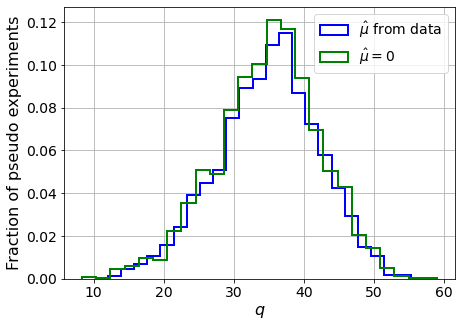

muhat mean:  -0.18946429125150127
Z_bins:  5.944997430590445
std Z_bins:  0.6094910043176892
Z_bins mu=0:  5.944997430590445
std Z_bins mu=0:  0.6160895808050038

--------

B_expected:  643
S_expected:  89



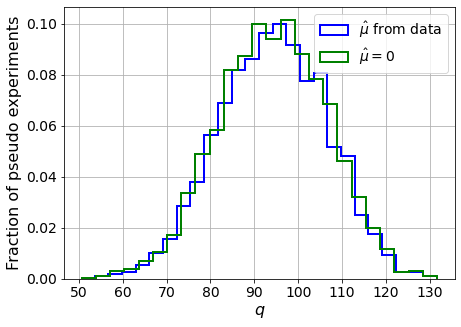

muhat mean:  -0.08467154693586462
Z_bins:  9.713458230627001
std Z_bins:  0.6293701468661896
Z_bins mu=0:  9.713458230627001
std Z_bins mu=0:  0.633122362044906

--------

B_expected:  643
S_expected:  192



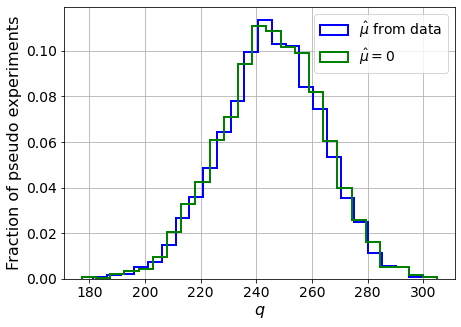

muhat mean:  -0.03996808792170523
Z_bins:  15.674537301826955
std Z_bins:  0.5839635008773668
Z_bins mu=0:  15.674537301826955
std Z_bins mu=0:  0.5862962010777439

--------

B_expected:  643
S_expected:  413



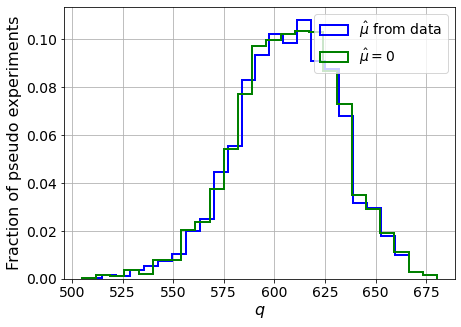

muhat mean:  -0.01862971762671927
Z_bins:  24.662879556431726
std Z_bins:  0.5210796577952775
Z_bins mu=0:  24.662879556431726
std Z_bins mu=0:  0.5227809614627379

--------

B_expected:  643
S_expected:  889



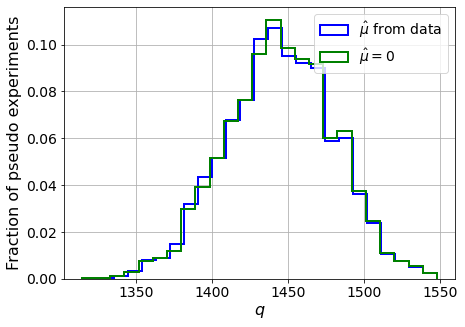

muhat mean:  -0.008403690167209238
Z_bins:  38.0084179817029
std Z_bins:  0.4658970496201301
Z_bins mu=0:  38.0084179817029
std Z_bins mu=0:  0.4669655444799931

--------

B_expected:  643
S_expected:  1915



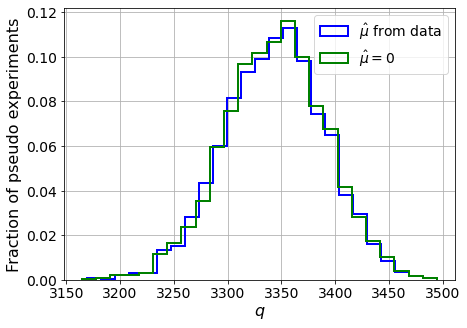

muhat mean:  -0.003935804409398534
Z_bins:  57.84520791823139
std Z_bins:  0.4050347035758385
Z_bins mu=0:  57.84520791823139
std Z_bins mu=0:  0.4056143533348396

--------


 FINAL RESULT:

[[0.9510114072385224, 0.2687480429361865, -3.8487878836259015, 0.9510114072385224, 0.28631526435089744], [1.3862853036019065, 0.3709840408713803, -1.8980401373577802, 1.3862853036019065, 0.3967127456118307], [2.2243174681877194, 0.48317470551950953, -0.8185590673212332, 2.2243174681877194, 0.4967243622221717], [3.589753946335335, 0.5643030186142892, -0.3935061121717441, 3.589753946335335, 0.5722636350380792], [5.944997430590445, 0.6094910043176892, -0.18946429125150127, 5.944997430590445, 0.6160895808050038], [9.713458230627001, 0.6293701468661896, -0.08467154693586462, 9.713458230627001, 0.633122362044906], [15.674537301826955, 0.5839635008773668, -0.03996808792170523, 15.674537301826955, 0.5862962010777439], [24.662879556431726, 0.5210796577952775, -0.01862971762671927, 24.662879556431726, 0.5227

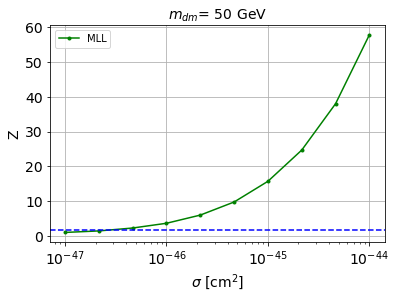


cross_MLL_164:  2.8420890941422533e-47
cross_MLL_164_up:  1.8974630145794523e-47
cross_MLL_164_down:  4.2718666658887753e-47

#########################


#########################

mDM =  100 GeV


max_pS1_both lenght:  153

X_mon1_train :  (6375, 153)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 153)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 153)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)

B_pbot.shape:  (5

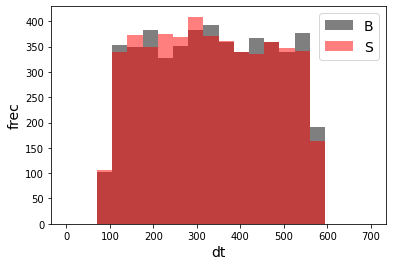

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35220)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35220)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35220)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68720	validation_1-logloss:0.68779
[1]	validation_0-logloss:0.68143	validation_1-logloss:0.68244
[2]	validation_0-logloss:0.67568	validation_1-logloss:0.67732
[3]	validation_0-logloss:0.67007	validation_1-logloss:0.67235
[4]	validation_0-logloss:0.66460	validation_1-logloss:0.66732
[5]	validation_0-logloss:0.65915	validation_1-logloss:0.66252
[6]	validation_0-logloss:0.65384	validation_1-logloss:0.65787
[7]	validation_0-logloss:0.64860	validation_1-logloss:0.65332
[8]	validation_0-logloss:0.64351	validation_1-logloss:0.64872
[9]	validation_0-logloss:0.63843	validation_1-logloss:0.64417
[10]	validation_0-logloss:0.63343	validation_1-logloss:0.63976
[11]	validation_0-logloss:0.62858	validation_1-logloss:0.63544
[12]	validation_0-logloss:0.62376	validation_1-logloss:0.63123
[13]	validation_0-logloss:0.61897	validation_1-logloss:0.62703
[14]	validation_0-logloss:0.61430	validation_1-logloss:0.62293
[15]	validation_0-logloss:0.60967	validation_1-logloss:0.61881
[1

[130]	validation_0-logloss:0.32639	validation_1-logloss:0.39011
[131]	validation_0-logloss:0.32504	validation_1-logloss:0.38905
[132]	validation_0-logloss:0.32372	validation_1-logloss:0.38818
[133]	validation_0-logloss:0.32247	validation_1-logloss:0.38733
[134]	validation_0-logloss:0.32112	validation_1-logloss:0.38649
[135]	validation_0-logloss:0.31981	validation_1-logloss:0.38566
[136]	validation_0-logloss:0.31856	validation_1-logloss:0.38482
[137]	validation_0-logloss:0.31736	validation_1-logloss:0.38398
[138]	validation_0-logloss:0.31608	validation_1-logloss:0.38319
[139]	validation_0-logloss:0.31486	validation_1-logloss:0.38225
[140]	validation_0-logloss:0.31366	validation_1-logloss:0.38146
[141]	validation_0-logloss:0.31240	validation_1-logloss:0.38064
[142]	validation_0-logloss:0.31114	validation_1-logloss:0.37986
[143]	validation_0-logloss:0.30980	validation_1-logloss:0.37884
[144]	validation_0-logloss:0.30853	validation_1-logloss:0.37809
[145]	validation_0-logloss:0.30738	valid

[259]	validation_0-logloss:0.20992	validation_1-logloss:0.31646
[260]	validation_0-logloss:0.20922	validation_1-logloss:0.31600
[261]	validation_0-logloss:0.20860	validation_1-logloss:0.31570
[262]	validation_0-logloss:0.20800	validation_1-logloss:0.31529
[263]	validation_0-logloss:0.20732	validation_1-logloss:0.31488
[264]	validation_0-logloss:0.20675	validation_1-logloss:0.31450
[265]	validation_0-logloss:0.20620	validation_1-logloss:0.31434
[266]	validation_0-logloss:0.20558	validation_1-logloss:0.31400
[267]	validation_0-logloss:0.20502	validation_1-logloss:0.31368
[268]	validation_0-logloss:0.20440	validation_1-logloss:0.31336
[269]	validation_0-logloss:0.20377	validation_1-logloss:0.31305
[270]	validation_0-logloss:0.20314	validation_1-logloss:0.31278
[271]	validation_0-logloss:0.20255	validation_1-logloss:0.31250
[272]	validation_0-logloss:0.20203	validation_1-logloss:0.31233
[273]	validation_0-logloss:0.20141	validation_1-logloss:0.31189
[274]	validation_0-logloss:0.20081	valid

[388]	validation_0-logloss:0.14711	validation_1-logloss:0.28362
[389]	validation_0-logloss:0.14672	validation_1-logloss:0.28350
[390]	validation_0-logloss:0.14637	validation_1-logloss:0.28332
[391]	validation_0-logloss:0.14605	validation_1-logloss:0.28316
[392]	validation_0-logloss:0.14569	validation_1-logloss:0.28295
[393]	validation_0-logloss:0.14527	validation_1-logloss:0.28272
[394]	validation_0-logloss:0.14492	validation_1-logloss:0.28258
[395]	validation_0-logloss:0.14455	validation_1-logloss:0.28245
[396]	validation_0-logloss:0.14417	validation_1-logloss:0.28235
[397]	validation_0-logloss:0.14385	validation_1-logloss:0.28218
[398]	validation_0-logloss:0.14348	validation_1-logloss:0.28210
[399]	validation_0-logloss:0.14308	validation_1-logloss:0.28200
[400]	validation_0-logloss:0.14272	validation_1-logloss:0.28192
[401]	validation_0-logloss:0.14234	validation_1-logloss:0.28183
[402]	validation_0-logloss:0.14194	validation_1-logloss:0.28162
[403]	validation_0-logloss:0.14165	valid

[517]	validation_0-logloss:0.10905	validation_1-logloss:0.26489
[518]	validation_0-logloss:0.10876	validation_1-logloss:0.26478
[519]	validation_0-logloss:0.10850	validation_1-logloss:0.26456
[520]	validation_0-logloss:0.10829	validation_1-logloss:0.26448
[521]	validation_0-logloss:0.10811	validation_1-logloss:0.26433
[522]	validation_0-logloss:0.10787	validation_1-logloss:0.26418
[523]	validation_0-logloss:0.10761	validation_1-logloss:0.26402
[524]	validation_0-logloss:0.10743	validation_1-logloss:0.26398
[525]	validation_0-logloss:0.10725	validation_1-logloss:0.26392
[526]	validation_0-logloss:0.10700	validation_1-logloss:0.26378
[527]	validation_0-logloss:0.10681	validation_1-logloss:0.26371
[528]	validation_0-logloss:0.10656	validation_1-logloss:0.26363
[529]	validation_0-logloss:0.10637	validation_1-logloss:0.26356
[530]	validation_0-logloss:0.10614	validation_1-logloss:0.26342
[531]	validation_0-logloss:0.10597	validation_1-logloss:0.26338
[532]	validation_0-logloss:0.10571	valid

[646]	validation_0-logloss:0.08417	validation_1-logloss:0.25454
[647]	validation_0-logloss:0.08401	validation_1-logloss:0.25444
[648]	validation_0-logloss:0.08386	validation_1-logloss:0.25429
[649]	validation_0-logloss:0.08370	validation_1-logloss:0.25427
[650]	validation_0-logloss:0.08357	validation_1-logloss:0.25428
[651]	validation_0-logloss:0.08338	validation_1-logloss:0.25426
[652]	validation_0-logloss:0.08324	validation_1-logloss:0.25424
[653]	validation_0-logloss:0.08305	validation_1-logloss:0.25418
[654]	validation_0-logloss:0.08286	validation_1-logloss:0.25416
[655]	validation_0-logloss:0.08270	validation_1-logloss:0.25409
[656]	validation_0-logloss:0.08260	validation_1-logloss:0.25404
[657]	validation_0-logloss:0.08243	validation_1-logloss:0.25401
[658]	validation_0-logloss:0.08228	validation_1-logloss:0.25401
[659]	validation_0-logloss:0.08208	validation_1-logloss:0.25395
[660]	validation_0-logloss:0.08191	validation_1-logloss:0.25387
[661]	validation_0-logloss:0.08179	valid

[775]	validation_0-logloss:0.06641	validation_1-logloss:0.24939
[776]	validation_0-logloss:0.06627	validation_1-logloss:0.24939
[777]	validation_0-logloss:0.06618	validation_1-logloss:0.24935
[778]	validation_0-logloss:0.06611	validation_1-logloss:0.24934
[779]	validation_0-logloss:0.06595	validation_1-logloss:0.24931
[780]	validation_0-logloss:0.06586	validation_1-logloss:0.24931
[781]	validation_0-logloss:0.06574	validation_1-logloss:0.24936
[782]	validation_0-logloss:0.06563	validation_1-logloss:0.24935
[783]	validation_0-logloss:0.06557	validation_1-logloss:0.24932
[784]	validation_0-logloss:0.06547	validation_1-logloss:0.24925
[785]	validation_0-logloss:0.06535	validation_1-logloss:0.24921
[786]	validation_0-logloss:0.06524	validation_1-logloss:0.24915
[787]	validation_0-logloss:0.06513	validation_1-logloss:0.24915
[788]	validation_0-logloss:0.06499	validation_1-logloss:0.24912
[789]	validation_0-logloss:0.06486	validation_1-logloss:0.24909
[790]	validation_0-logloss:0.06477	valid

[904]	validation_0-logloss:0.05418	validation_1-logloss:0.24550
[905]	validation_0-logloss:0.05407	validation_1-logloss:0.24545
[906]	validation_0-logloss:0.05402	validation_1-logloss:0.24546
[907]	validation_0-logloss:0.05397	validation_1-logloss:0.24547
[908]	validation_0-logloss:0.05390	validation_1-logloss:0.24549
[909]	validation_0-logloss:0.05382	validation_1-logloss:0.24549
[910]	validation_0-logloss:0.05378	validation_1-logloss:0.24540
[911]	validation_0-logloss:0.05371	validation_1-logloss:0.24534
[912]	validation_0-logloss:0.05364	validation_1-logloss:0.24531
[913]	validation_0-logloss:0.05356	validation_1-logloss:0.24528
[914]	validation_0-logloss:0.05349	validation_1-logloss:0.24532
[915]	validation_0-logloss:0.05344	validation_1-logloss:0.24531
[916]	validation_0-logloss:0.05337	validation_1-logloss:0.24531
[917]	validation_0-logloss:0.05333	validation_1-logloss:0.24528
[918]	validation_0-logloss:0.05328	validation_1-logloss:0.24531
[919]	validation_0-logloss:0.05321	valid

[1032]	validation_0-logloss:0.04581	validation_1-logloss:0.24334
[1033]	validation_0-logloss:0.04575	validation_1-logloss:0.24332
[1034]	validation_0-logloss:0.04569	validation_1-logloss:0.24332
[1035]	validation_0-logloss:0.04564	validation_1-logloss:0.24334
[1036]	validation_0-logloss:0.04558	validation_1-logloss:0.24334
[1037]	validation_0-logloss:0.04550	validation_1-logloss:0.24336
[1038]	validation_0-logloss:0.04542	validation_1-logloss:0.24338
[1039]	validation_0-logloss:0.04532	validation_1-logloss:0.24335
[1040]	validation_0-logloss:0.04526	validation_1-logloss:0.24332
[1041]	validation_0-logloss:0.04522	validation_1-logloss:0.24329
[1042]	validation_0-logloss:0.04516	validation_1-logloss:0.24332
[1043]	validation_0-logloss:0.04509	validation_1-logloss:0.24336
[1044]	validation_0-logloss:0.04502	validation_1-logloss:0.24331
[1045]	validation_0-logloss:0.04495	validation_1-logloss:0.24330
[1046]	validation_0-logloss:0.04486	validation_1-logloss:0.24325
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.03853	validation_1-logloss:0.24208
[1160]	validation_0-logloss:0.03849	validation_1-logloss:0.24213
[1161]	validation_0-logloss:0.03844	validation_1-logloss:0.24213
[1162]	validation_0-logloss:0.03841	validation_1-logloss:0.24212
[1163]	validation_0-logloss:0.03835	validation_1-logloss:0.24210
[1164]	validation_0-logloss:0.03830	validation_1-logloss:0.24204
[1165]	validation_0-logloss:0.03824	validation_1-logloss:0.24203
[1166]	validation_0-logloss:0.03815	validation_1-logloss:0.24197
[1167]	validation_0-logloss:0.03808	validation_1-logloss:0.24196
[1168]	validation_0-logloss:0.03803	validation_1-logloss:0.24196
[1169]	validation_0-logloss:0.03799	validation_1-logloss:0.24196
[1170]	validation_0-logloss:0.03795	validation_1-logloss:0.24197
[1171]	validation_0-logloss:0.03788	validation_1-logloss:0.24198
[1172]	validation_0-logloss:0.03782	validation_1-logloss:0.24196
[1173]	validation_0-logloss:0.03777	validation_1-logloss:0.24191
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.03255	validation_1-logloss:0.24111
[1287]	validation_0-logloss:0.03250	validation_1-logloss:0.24110
[1288]	validation_0-logloss:0.03244	validation_1-logloss:0.24118
[1289]	validation_0-logloss:0.03241	validation_1-logloss:0.24120
[1290]	validation_0-logloss:0.03234	validation_1-logloss:0.24123
[1291]	validation_0-logloss:0.03230	validation_1-logloss:0.24121
[1292]	validation_0-logloss:0.03225	validation_1-logloss:0.24126
[1293]	validation_0-logloss:0.03222	validation_1-logloss:0.24124
[1294]	validation_0-logloss:0.03217	validation_1-logloss:0.24133
[1295]	validation_0-logloss:0.03213	validation_1-logloss:0.24133
[1296]	validation_0-logloss:0.03209	validation_1-logloss:0.24134
[1297]	validation_0-logloss:0.03207	validation_1-logloss:0.24133
[1298]	validation_0-logloss:0.03202	validation_1-logloss:0.24135
[1299]	validation_0-logloss:0.03198	validation_1-logloss:0.24138
[1300]	validation_0-logloss:0.03195	validation_1-logloss:0.24139
[1301]	validation_0-loglo

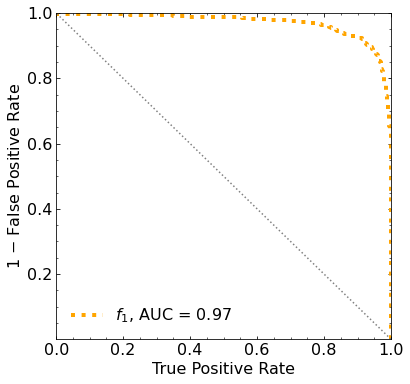

Classification score:


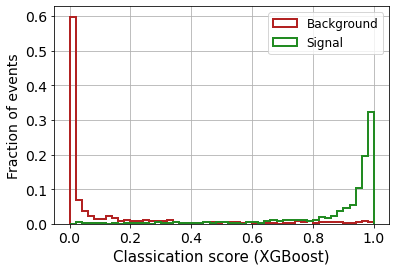


 ROC-AUC =  0.9701763618298405


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  319.0047508   283.58097546  239.03528822  187.78642295
  135.64805423   80.79966376   23.075189    -41.14000499 -102.56498731]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 260.35932189 246.00622445 223.587450

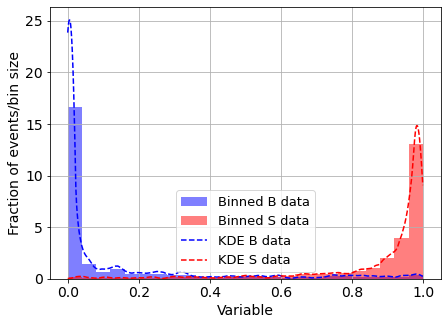

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



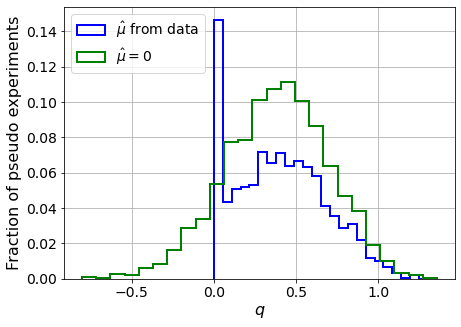

muhat mean:  -5.787172969037177
Z_bins:  0.6275760251730521
std Z_bins:  0.22274709188491332
Z_bins mu=0:  0.6275760251730521
std Z_bins mu=0:  0.25123521198316046

--------

B_expected:  643
S_expected:  3



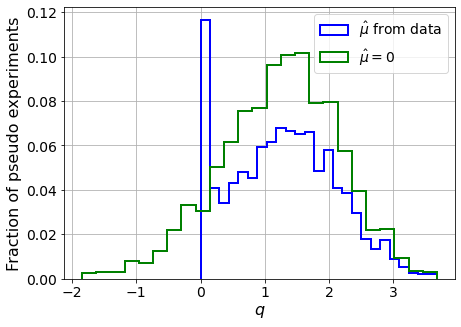

muhat mean:  -1.7472306928585617
Z_bins:  1.1365645560642512
std Z_bins:  0.359813818477554
Z_bins mu=0:  1.1365645560642512
std Z_bins mu=0:  0.40438574359336854

--------

B_expected:  643
S_expected:  6



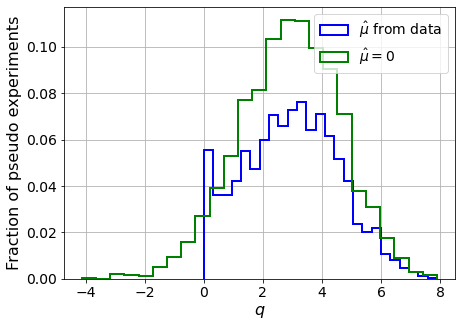

muhat mean:  -0.8857226429495527
Z_bins:  1.722619800401256
std Z_bins:  0.46400103299489187
Z_bins mu=0:  1.722619800401256
std Z_bins mu=0:  0.4952471808912418

--------

B_expected:  643
S_expected:  14



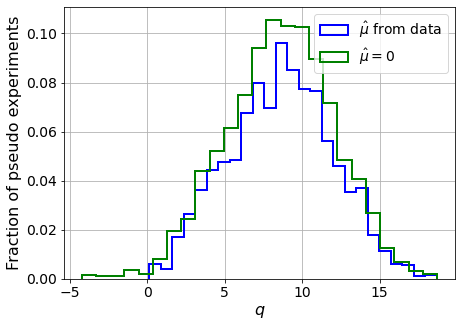

muhat mean:  -0.38105613357823376
Z_bins:  2.94052841140047
std Z_bins:  0.5735498589533148
Z_bins mu=0:  2.94052841140047
std Z_bins mu=0:  0.5922066445567943

--------

B_expected:  643
S_expected:  30



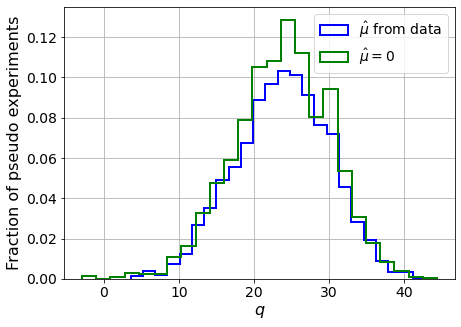

muhat mean:  -0.18014219913437407
Z_bins:  4.90438364473777
std Z_bins:  0.637189458012058
Z_bins mu=0:  4.90438364473777
std Z_bins mu=0:  0.6539920673266301

--------

B_expected:  643
S_expected:  65



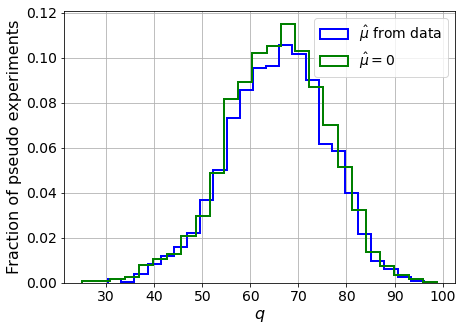

muhat mean:  -0.08399797363304863
Z_bins:  8.121997010388219
std Z_bins:  0.6343926204566382
Z_bins mu=0:  8.121997010388219
std Z_bins mu=0:  0.6440274682004584

--------

B_expected:  643
S_expected:  139



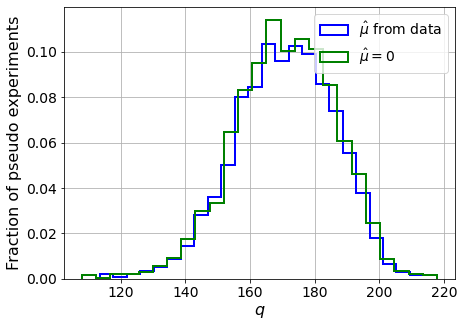

muhat mean:  -0.040692190612083165
Z_bins:  13.092706079101252
std Z_bins:  0.587476701994459
Z_bins mu=0:  13.092706079101252
std Z_bins mu=0:  0.5933148201063958

--------

B_expected:  643
S_expected:  300



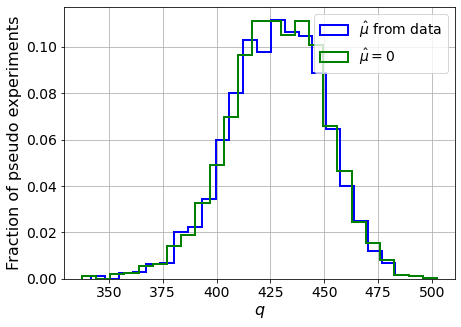

muhat mean:  -0.01818992828507037
Z_bins:  20.706014993430372
std Z_bins:  0.5395542481475438
Z_bins mu=0:  20.706014993430372
std Z_bins mu=0:  0.5431219597744317

--------

B_expected:  643
S_expected:  645



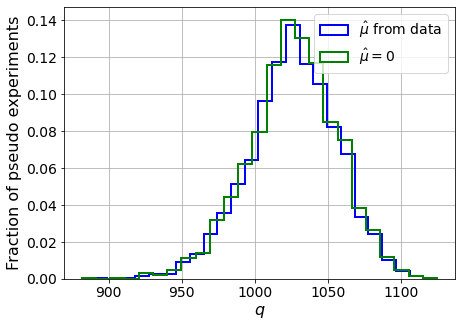

muhat mean:  -0.008911779038715652
Z_bins:  32.0454243053865
std Z_bins:  0.4758590710603519
Z_bins mu=0:  32.0454243053865
std Z_bins mu=0:  0.47808156721168726

--------

B_expected:  643
S_expected:  1390



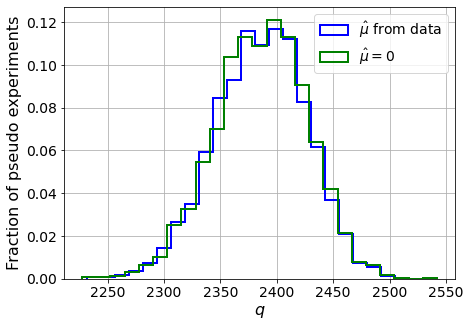

muhat mean:  -0.003780512641405426
Z_bins:  48.86486076622465
std Z_bins:  0.41741184742612836
Z_bins mu=0:  48.86486076622465
std Z_bins mu=0:  0.41879108877032467

--------


 FINAL RESULT:

[[0.6275760251730521, 0.22274709188491332, -5.787172969037177, 0.6275760251730521, 0.25123521198316046], [1.1365645560642512, 0.359813818477554, -1.7472306928585617, 1.1365645560642512, 0.40438574359336854], [1.722619800401256, 0.46400103299489187, -0.8857226429495527, 1.722619800401256, 0.4952471808912418], [2.94052841140047, 0.5735498589533148, -0.38105613357823376, 2.94052841140047, 0.5922066445567943], [4.90438364473777, 0.637189458012058, -0.18014219913437407, 4.90438364473777, 0.6539920673266301], [8.121997010388219, 0.6343926204566382, -0.08399797363304863, 8.121997010388219, 0.6440274682004584], [13.092706079101252, 0.587476701994459, -0.040692190612083165, 13.092706079101252, 0.5933148201063958], [20.706014993430372, 0.5395542481475438, -0.01818992828507037, 20.706014993430372, 0.5431219

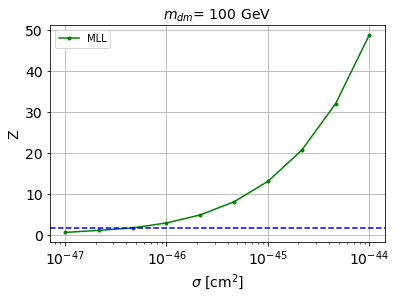


cross_MLL_164:  4.2973166537468723e-47
cross_MLL_164_up:  2.5809084808270147e-47
cross_MLL_164_down:  6.41946094701575e-47

#########################


#########################

mDM =  200 GeV


max_pS1_both lenght:  157

X_mon1_train :  (6375, 157)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 157)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 157)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)

B_pbot.shape:  (500

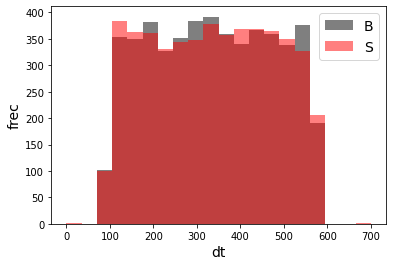

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35224)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35224)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35224)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68753	validation_1-logloss:0.68850
[1]	validation_0-logloss:0.68199	validation_1-logloss:0.68379
[2]	validation_0-logloss:0.67659	validation_1-logloss:0.67938
[3]	validation_0-logloss:0.67124	validation_1-logloss:0.67492
[4]	validation_0-logloss:0.66595	validation_1-logloss:0.67043
[5]	validation_0-logloss:0.66076	validation_1-logloss:0.66620
[6]	validation_0-logloss:0.65564	validation_1-logloss:0.66169
[7]	validation_0-logloss:0.65064	validation_1-logloss:0.65761
[8]	validation_0-logloss:0.64579	validation_1-logloss:0.65358
[9]	validation_0-logloss:0.64097	validation_1-logloss:0.64968
[10]	validation_0-logloss:0.63616	validation_1-logloss:0.64553
[11]	validation_0-logloss:0.63137	validation_1-logloss:0.64157
[12]	validation_0-logloss:0.62677	validation_1-logloss:0.63780
[13]	validation_0-logloss:0.62226	validation_1-logloss:0.63399
[14]	validation_0-logloss:0.61775	validation_1-logloss:0.63009
[15]	validation_0-logloss:0.61323	validation_1-logloss:0.62640
[1

[130]	validation_0-logloss:0.33908	validation_1-logloss:0.41364
[131]	validation_0-logloss:0.33777	validation_1-logloss:0.41272
[132]	validation_0-logloss:0.33646	validation_1-logloss:0.41175
[133]	validation_0-logloss:0.33507	validation_1-logloss:0.41084
[134]	validation_0-logloss:0.33379	validation_1-logloss:0.40984
[135]	validation_0-logloss:0.33244	validation_1-logloss:0.40903
[136]	validation_0-logloss:0.33121	validation_1-logloss:0.40806
[137]	validation_0-logloss:0.32991	validation_1-logloss:0.40711
[138]	validation_0-logloss:0.32868	validation_1-logloss:0.40621
[139]	validation_0-logloss:0.32735	validation_1-logloss:0.40543
[140]	validation_0-logloss:0.32611	validation_1-logloss:0.40460
[141]	validation_0-logloss:0.32490	validation_1-logloss:0.40360
[142]	validation_0-logloss:0.32375	validation_1-logloss:0.40286
[143]	validation_0-logloss:0.32249	validation_1-logloss:0.40198
[144]	validation_0-logloss:0.32118	validation_1-logloss:0.40111
[145]	validation_0-logloss:0.31998	valid

[259]	validation_0-logloss:0.22121	validation_1-logloss:0.33772
[260]	validation_0-logloss:0.22052	validation_1-logloss:0.33737
[261]	validation_0-logloss:0.21985	validation_1-logloss:0.33698
[262]	validation_0-logloss:0.21924	validation_1-logloss:0.33675
[263]	validation_0-logloss:0.21856	validation_1-logloss:0.33644
[264]	validation_0-logloss:0.21789	validation_1-logloss:0.33596
[265]	validation_0-logloss:0.21730	validation_1-logloss:0.33558
[266]	validation_0-logloss:0.21664	validation_1-logloss:0.33515
[267]	validation_0-logloss:0.21608	validation_1-logloss:0.33486
[268]	validation_0-logloss:0.21544	validation_1-logloss:0.33448
[269]	validation_0-logloss:0.21478	validation_1-logloss:0.33400
[270]	validation_0-logloss:0.21417	validation_1-logloss:0.33358
[271]	validation_0-logloss:0.21360	validation_1-logloss:0.33336
[272]	validation_0-logloss:0.21296	validation_1-logloss:0.33309
[273]	validation_0-logloss:0.21233	validation_1-logloss:0.33263
[274]	validation_0-logloss:0.21169	valid

[388]	validation_0-logloss:0.15709	validation_1-logloss:0.30288
[389]	validation_0-logloss:0.15667	validation_1-logloss:0.30262
[390]	validation_0-logloss:0.15624	validation_1-logloss:0.30244
[391]	validation_0-logloss:0.15590	validation_1-logloss:0.30223
[392]	validation_0-logloss:0.15561	validation_1-logloss:0.30203
[393]	validation_0-logloss:0.15534	validation_1-logloss:0.30178
[394]	validation_0-logloss:0.15502	validation_1-logloss:0.30167
[395]	validation_0-logloss:0.15463	validation_1-logloss:0.30151
[396]	validation_0-logloss:0.15426	validation_1-logloss:0.30134
[397]	validation_0-logloss:0.15388	validation_1-logloss:0.30110
[398]	validation_0-logloss:0.15360	validation_1-logloss:0.30091
[399]	validation_0-logloss:0.15316	validation_1-logloss:0.30074
[400]	validation_0-logloss:0.15290	validation_1-logloss:0.30046
[401]	validation_0-logloss:0.15251	validation_1-logloss:0.30032
[402]	validation_0-logloss:0.15215	validation_1-logloss:0.30019
[403]	validation_0-logloss:0.15181	valid

[517]	validation_0-logloss:0.11916	validation_1-logloss:0.28339
[518]	validation_0-logloss:0.11898	validation_1-logloss:0.28326
[519]	validation_0-logloss:0.11869	validation_1-logloss:0.28322
[520]	validation_0-logloss:0.11844	validation_1-logloss:0.28312
[521]	validation_0-logloss:0.11822	validation_1-logloss:0.28314
[522]	validation_0-logloss:0.11794	validation_1-logloss:0.28303
[523]	validation_0-logloss:0.11768	validation_1-logloss:0.28291
[524]	validation_0-logloss:0.11745	validation_1-logloss:0.28281
[525]	validation_0-logloss:0.11721	validation_1-logloss:0.28264
[526]	validation_0-logloss:0.11693	validation_1-logloss:0.28259
[527]	validation_0-logloss:0.11670	validation_1-logloss:0.28242
[528]	validation_0-logloss:0.11642	validation_1-logloss:0.28234
[529]	validation_0-logloss:0.11617	validation_1-logloss:0.28216
[530]	validation_0-logloss:0.11595	validation_1-logloss:0.28212
[531]	validation_0-logloss:0.11568	validation_1-logloss:0.28212
[532]	validation_0-logloss:0.11544	valid

[646]	validation_0-logloss:0.09126	validation_1-logloss:0.27007
[647]	validation_0-logloss:0.09107	validation_1-logloss:0.27006
[648]	validation_0-logloss:0.09086	validation_1-logloss:0.27007
[649]	validation_0-logloss:0.09072	validation_1-logloss:0.27003
[650]	validation_0-logloss:0.09053	validation_1-logloss:0.26998
[651]	validation_0-logloss:0.09035	validation_1-logloss:0.26990
[652]	validation_0-logloss:0.09018	validation_1-logloss:0.26979
[653]	validation_0-logloss:0.09000	validation_1-logloss:0.26970
[654]	validation_0-logloss:0.08982	validation_1-logloss:0.26965
[655]	validation_0-logloss:0.08967	validation_1-logloss:0.26958
[656]	validation_0-logloss:0.08949	validation_1-logloss:0.26950
[657]	validation_0-logloss:0.08931	validation_1-logloss:0.26943
[658]	validation_0-logloss:0.08919	validation_1-logloss:0.26945
[659]	validation_0-logloss:0.08899	validation_1-logloss:0.26926
[660]	validation_0-logloss:0.08882	validation_1-logloss:0.26915
[661]	validation_0-logloss:0.08864	valid

[775]	validation_0-logloss:0.07189	validation_1-logloss:0.26375
[776]	validation_0-logloss:0.07172	validation_1-logloss:0.26371
[777]	validation_0-logloss:0.07159	validation_1-logloss:0.26365
[778]	validation_0-logloss:0.07146	validation_1-logloss:0.26356
[779]	validation_0-logloss:0.07134	validation_1-logloss:0.26353
[780]	validation_0-logloss:0.07123	validation_1-logloss:0.26349
[781]	validation_0-logloss:0.07109	validation_1-logloss:0.26350
[782]	validation_0-logloss:0.07099	validation_1-logloss:0.26347
[783]	validation_0-logloss:0.07089	validation_1-logloss:0.26349
[784]	validation_0-logloss:0.07073	validation_1-logloss:0.26344
[785]	validation_0-logloss:0.07060	validation_1-logloss:0.26339
[786]	validation_0-logloss:0.07048	validation_1-logloss:0.26334
[787]	validation_0-logloss:0.07035	validation_1-logloss:0.26326
[788]	validation_0-logloss:0.07023	validation_1-logloss:0.26317
[789]	validation_0-logloss:0.07009	validation_1-logloss:0.26316
[790]	validation_0-logloss:0.06996	valid

[904]	validation_0-logloss:0.05864	validation_1-logloss:0.25892
[905]	validation_0-logloss:0.05854	validation_1-logloss:0.25887
[906]	validation_0-logloss:0.05846	validation_1-logloss:0.25881
[907]	validation_0-logloss:0.05838	validation_1-logloss:0.25881
[908]	validation_0-logloss:0.05831	validation_1-logloss:0.25879
[909]	validation_0-logloss:0.05823	validation_1-logloss:0.25875
[910]	validation_0-logloss:0.05817	validation_1-logloss:0.25875
[911]	validation_0-logloss:0.05806	validation_1-logloss:0.25873
[912]	validation_0-logloss:0.05801	validation_1-logloss:0.25870
[913]	validation_0-logloss:0.05791	validation_1-logloss:0.25873
[914]	validation_0-logloss:0.05783	validation_1-logloss:0.25869
[915]	validation_0-logloss:0.05776	validation_1-logloss:0.25867
[916]	validation_0-logloss:0.05769	validation_1-logloss:0.25860
[917]	validation_0-logloss:0.05759	validation_1-logloss:0.25851
[918]	validation_0-logloss:0.05750	validation_1-logloss:0.25849
[919]	validation_0-logloss:0.05740	valid

[1032]	validation_0-logloss:0.04908	validation_1-logloss:0.25593
[1033]	validation_0-logloss:0.04904	validation_1-logloss:0.25589
[1034]	validation_0-logloss:0.04899	validation_1-logloss:0.25587
[1035]	validation_0-logloss:0.04890	validation_1-logloss:0.25587
[1036]	validation_0-logloss:0.04886	validation_1-logloss:0.25585
[1037]	validation_0-logloss:0.04878	validation_1-logloss:0.25578
[1038]	validation_0-logloss:0.04870	validation_1-logloss:0.25573
[1039]	validation_0-logloss:0.04867	validation_1-logloss:0.25568
[1040]	validation_0-logloss:0.04858	validation_1-logloss:0.25563
[1041]	validation_0-logloss:0.04852	validation_1-logloss:0.25559
[1042]	validation_0-logloss:0.04848	validation_1-logloss:0.25565
[1043]	validation_0-logloss:0.04843	validation_1-logloss:0.25560
[1044]	validation_0-logloss:0.04838	validation_1-logloss:0.25561
[1045]	validation_0-logloss:0.04834	validation_1-logloss:0.25561
[1046]	validation_0-logloss:0.04826	validation_1-logloss:0.25564
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.04178	validation_1-logloss:0.25347
[1160]	validation_0-logloss:0.04174	validation_1-logloss:0.25348
[1161]	validation_0-logloss:0.04168	validation_1-logloss:0.25345
[1162]	validation_0-logloss:0.04162	validation_1-logloss:0.25347
[1163]	validation_0-logloss:0.04155	validation_1-logloss:0.25354
[1164]	validation_0-logloss:0.04151	validation_1-logloss:0.25356
[1165]	validation_0-logloss:0.04147	validation_1-logloss:0.25351
[1166]	validation_0-logloss:0.04145	validation_1-logloss:0.25350
[1167]	validation_0-logloss:0.04142	validation_1-logloss:0.25348
[1168]	validation_0-logloss:0.04138	validation_1-logloss:0.25351
[1169]	validation_0-logloss:0.04133	validation_1-logloss:0.25353
[1170]	validation_0-logloss:0.04126	validation_1-logloss:0.25353
[1171]	validation_0-logloss:0.04122	validation_1-logloss:0.25349
[1172]	validation_0-logloss:0.04119	validation_1-logloss:0.25345
[1173]	validation_0-logloss:0.04112	validation_1-logloss:0.25348
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.03604	validation_1-logloss:0.25238
[1287]	validation_0-logloss:0.03601	validation_1-logloss:0.25237
[1288]	validation_0-logloss:0.03598	validation_1-logloss:0.25237
[1289]	validation_0-logloss:0.03593	validation_1-logloss:0.25238
[1290]	validation_0-logloss:0.03588	validation_1-logloss:0.25240
[1291]	validation_0-logloss:0.03584	validation_1-logloss:0.25235
[1292]	validation_0-logloss:0.03579	validation_1-logloss:0.25233
[1293]	validation_0-logloss:0.03575	validation_1-logloss:0.25232
[1294]	validation_0-logloss:0.03572	validation_1-logloss:0.25234
[1295]	validation_0-logloss:0.03567	validation_1-logloss:0.25232
[1296]	validation_0-logloss:0.03561	validation_1-logloss:0.25232
[1297]	validation_0-logloss:0.03556	validation_1-logloss:0.25231
[1298]	validation_0-logloss:0.03551	validation_1-logloss:0.25235
[1299]	validation_0-logloss:0.03549	validation_1-logloss:0.25232
[1300]	validation_0-logloss:0.03545	validation_1-logloss:0.25227
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.03124	validation_1-logloss:0.25126
[1414]	validation_0-logloss:0.03121	validation_1-logloss:0.25131
[1415]	validation_0-logloss:0.03117	validation_1-logloss:0.25127
[1416]	validation_0-logloss:0.03116	validation_1-logloss:0.25126
[1417]	validation_0-logloss:0.03113	validation_1-logloss:0.25125
[1418]	validation_0-logloss:0.03110	validation_1-logloss:0.25128
[1419]	validation_0-logloss:0.03106	validation_1-logloss:0.25132
[1420]	validation_0-logloss:0.03103	validation_1-logloss:0.25133
[1421]	validation_0-logloss:0.03100	validation_1-logloss:0.25133
[1422]	validation_0-logloss:0.03097	validation_1-logloss:0.25134
[1423]	validation_0-logloss:0.03092	validation_1-logloss:0.25130
[1424]	validation_0-logloss:0.03088	validation_1-logloss:0.25141
[1425]	validation_0-logloss:0.03085	validation_1-logloss:0.25141
[1426]	validation_0-logloss:0.03082	validation_1-logloss:0.25135
[1427]	validation_0-logloss:0.03078	validation_1-logloss:0.25133
[1428]	validation_0-loglo

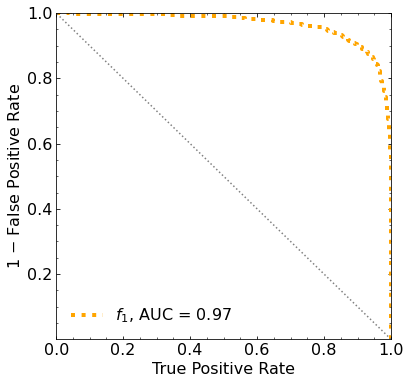

Classification score:


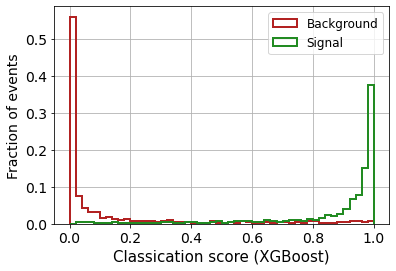


 ROC-AUC =  0.965492671009772


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  293.70741255  262.17228412  222.72419709  179.65785048
  131.87322737   78.32151687   18.75125609  -44.49727089 -104.0045646 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 266.4910346  257.94660298 239.00342341 213.764333

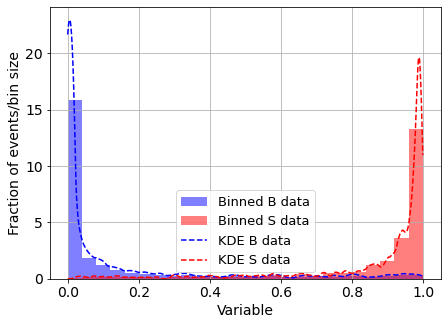

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



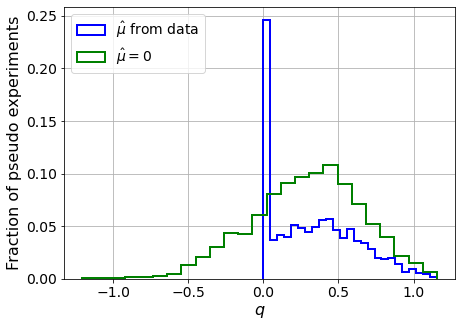

muhat mean:  -3.9689067485111056
Z_bins:  0.5605435585652071
std Z_bins:  0.2547005292027981
Z_bins mu=0:  0.5605435585652071
std Z_bins mu=0:  0.32435863486017297

--------

B_expected:  643
S_expected:  2



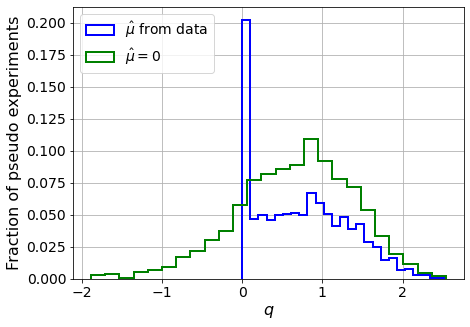

muhat mean:  -2.1045232560423712
Z_bins:  0.8502463762872274
std Z_bins:  0.3423583371891961
Z_bins mu=0:  0.8502463762872274
std Z_bins mu=0:  0.4234420390424999

--------

B_expected:  643
S_expected:  4



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


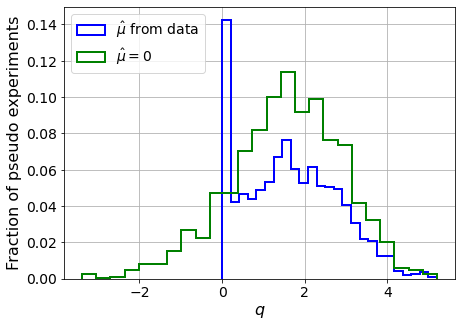

muhat mean:  -1.081522662604956
Z_bins:  1.2673683663850444
std Z_bins:  0.45197747046349274
Z_bins mu=0:  1.2673683663850444
std Z_bins mu=0:  0.53207414369913

--------

B_expected:  643
S_expected:  8



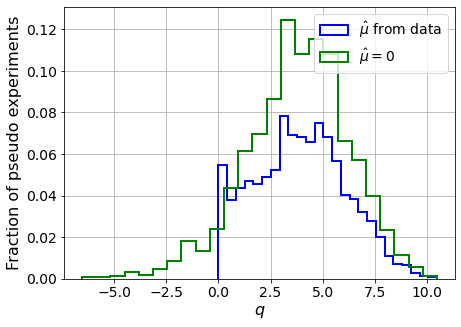

muhat mean:  -0.49558896438539013
Z_bins:  1.9732417141704452
std Z_bins:  0.5497907612579189
Z_bins mu=0:  1.9732417141704452
std Z_bins mu=0:  0.624093137354951

--------

B_expected:  643
S_expected:  17



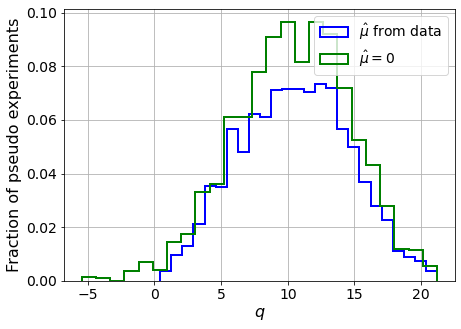

muhat mean:  -0.22671558420414048
Z_bins:  3.2399601360830594
std Z_bins:  0.6287326860435782
Z_bins mu=0:  3.2399601360830594
std Z_bins mu=0:  0.6663445437761056

--------

B_expected:  643
S_expected:  37



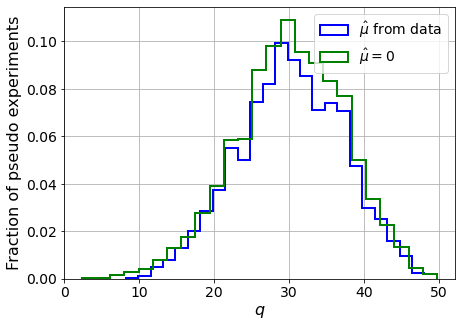

muhat mean:  -0.11004682621992892
Z_bins:  5.5100925759373975
std Z_bins:  0.6366924834797584
Z_bins mu=0:  5.5100925759373975
std Z_bins mu=0:  0.6583930263745914

--------

B_expected:  643
S_expected:  79



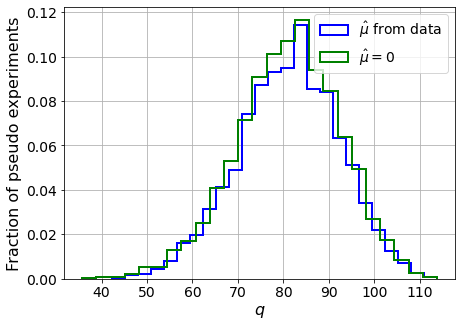

muhat mean:  -0.05135664904109991
Z_bins:  9.025909415626366
std Z_bins:  0.6184473424673536
Z_bins mu=0:  9.025873911922812
std Z_bins mu=0:  0.6325487063427782

--------

B_expected:  643
S_expected:  170



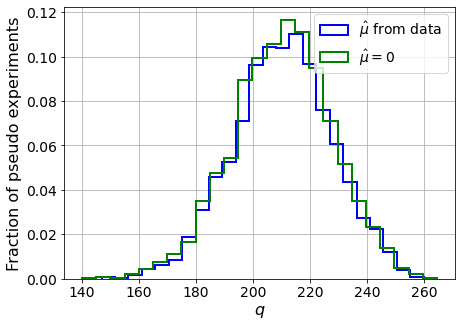

muhat mean:  -0.025144862869965184
Z_bins:  14.512586255282718
std Z_bins:  0.5963473591192946
Z_bins mu=0:  14.512575762952597
std Z_bins mu=0:  0.6056107906503596

--------

B_expected:  643
S_expected:  366



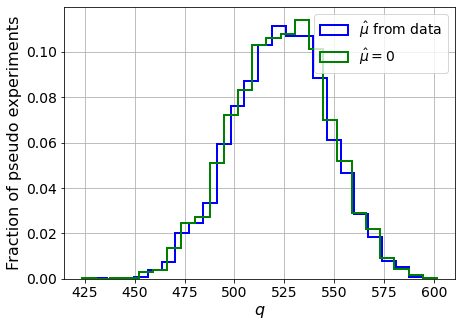

muhat mean:  -0.011319395844792954
Z_bins:  22.888781193156802
std Z_bins:  0.5275468897694945
Z_bins mu=0:  22.888781193156802
std Z_bins mu=0:  0.5314763113117218

--------

B_expected:  643
S_expected:  788



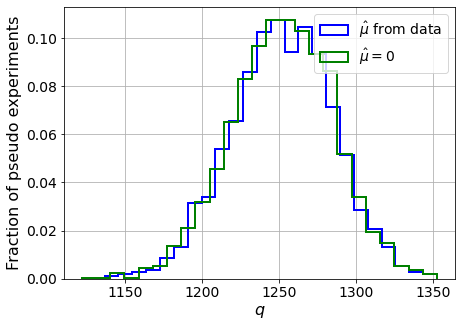

muhat mean:  -0.004940570518798109
Z_bins:  35.39513280445835
std Z_bins:  0.46727763280475776
Z_bins mu=0:  35.39513280445835
std Z_bins mu=0:  0.4703085043275373

--------


 FINAL RESULT:

[[0.5605435585652071, 0.2547005292027981, -3.9689067485111056, 0.5605435585652071, 0.32435863486017297], [0.8502463762872274, 0.3423583371891961, -2.1045232560423712, 0.8502463762872274, 0.4234420390424999], [1.2673683663850444, 0.45197747046349274, -1.081522662604956, 1.2673683663850444, 0.53207414369913], [1.9732417141704452, 0.5497907612579189, -0.49558896438539013, 1.9732417141704452, 0.624093137354951], [3.2399601360830594, 0.6287326860435782, -0.22671558420414048, 3.2399601360830594, 0.6663445437761056], [5.5100925759373975, 0.6366924834797584, -0.11004682621992892, 5.5100925759373975, 0.6583930263745914], [9.025909415626366, 0.6184473424673536, -0.05135664904109991, 9.025873911922812, 0.6325487063427782], [14.512586255282718, 0.5963473591192946, -0.025144862869965184, 14.512575762952597, 0.

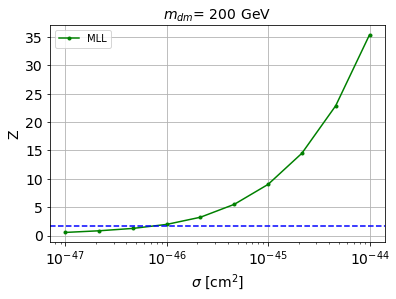


cross_MLL_164:  7.355268440137193e-47
cross_MLL_164_up:  4.2104044397260874e-47
cross_MLL_164_down:  1.2008013088017743e-46

#########################


#########################

mDM =  500 GeV


max_pS1_both lenght:  178

X_mon1_train :  (6375, 178)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 178)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 178)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)

B_pbot.shape:  (50

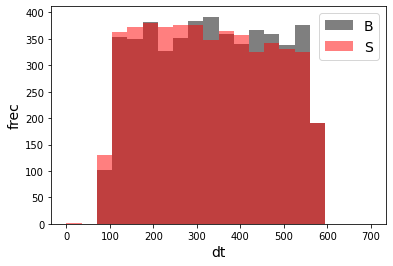

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 1)
X_mon_S.shape:  (5000, 1)

X_mon5.shape:  (10000, 1)

X_mon5_train :  (6375, 1)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 1)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 1)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35245)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35245)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35245)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68755	validation_1-logloss:0.68834
[1]	validation_0-logloss:0.68209	validation_1-logloss:0.68360
[2]	validation_0-logloss:0.67666	validation_1-logloss:0.67904
[3]	validation_0-logloss:0.67139	validation_1-logloss:0.67449
[4]	validation_0-logloss:0.66629	validation_1-logloss:0.67001
[5]	validation_0-logloss:0.66118	validation_1-logloss:0.66572
[6]	validation_0-logloss:0.65621	validation_1-logloss:0.66152
[7]	validation_0-logloss:0.65131	validation_1-logloss:0.65733
[8]	validation_0-logloss:0.64644	validation_1-logloss:0.65329
[9]	validation_0-logloss:0.64178	validation_1-logloss:0.64921
[10]	validation_0-logloss:0.63708	validation_1-logloss:0.64526
[11]	validation_0-logloss:0.63253	validation_1-logloss:0.64147
[12]	validation_0-logloss:0.62799	validation_1-logloss:0.63774
[13]	validation_0-logloss:0.62356	validation_1-logloss:0.63381
[14]	validation_0-logloss:0.61924	validation_1-logloss:0.63020
[15]	validation_0-logloss:0.61486	validation_1-logloss:0.62658
[1

[130]	validation_0-logloss:0.34272	validation_1-logloss:0.42202
[131]	validation_0-logloss:0.34147	validation_1-logloss:0.42114
[132]	validation_0-logloss:0.34016	validation_1-logloss:0.42035
[133]	validation_0-logloss:0.33892	validation_1-logloss:0.41957
[134]	validation_0-logloss:0.33764	validation_1-logloss:0.41879
[135]	validation_0-logloss:0.33628	validation_1-logloss:0.41783
[136]	validation_0-logloss:0.33506	validation_1-logloss:0.41700
[137]	validation_0-logloss:0.33375	validation_1-logloss:0.41614
[138]	validation_0-logloss:0.33256	validation_1-logloss:0.41547
[139]	validation_0-logloss:0.33129	validation_1-logloss:0.41461
[140]	validation_0-logloss:0.33000	validation_1-logloss:0.41366
[141]	validation_0-logloss:0.32874	validation_1-logloss:0.41281
[142]	validation_0-logloss:0.32747	validation_1-logloss:0.41207
[143]	validation_0-logloss:0.32632	validation_1-logloss:0.41133
[144]	validation_0-logloss:0.32506	validation_1-logloss:0.41057
[145]	validation_0-logloss:0.32384	valid

[259]	validation_0-logloss:0.22345	validation_1-logloss:0.35202
[260]	validation_0-logloss:0.22283	validation_1-logloss:0.35171
[261]	validation_0-logloss:0.22221	validation_1-logloss:0.35141
[262]	validation_0-logloss:0.22158	validation_1-logloss:0.35114
[263]	validation_0-logloss:0.22093	validation_1-logloss:0.35085
[264]	validation_0-logloss:0.22030	validation_1-logloss:0.35052
[265]	validation_0-logloss:0.21976	validation_1-logloss:0.35025
[266]	validation_0-logloss:0.21910	validation_1-logloss:0.34991
[267]	validation_0-logloss:0.21851	validation_1-logloss:0.34970
[268]	validation_0-logloss:0.21799	validation_1-logloss:0.34937
[269]	validation_0-logloss:0.21738	validation_1-logloss:0.34911
[270]	validation_0-logloss:0.21686	validation_1-logloss:0.34885
[271]	validation_0-logloss:0.21621	validation_1-logloss:0.34857
[272]	validation_0-logloss:0.21554	validation_1-logloss:0.34807
[273]	validation_0-logloss:0.21491	validation_1-logloss:0.34765
[274]	validation_0-logloss:0.21426	valid

[388]	validation_0-logloss:0.15979	validation_1-logloss:0.32161
[389]	validation_0-logloss:0.15936	validation_1-logloss:0.32151
[390]	validation_0-logloss:0.15899	validation_1-logloss:0.32143
[391]	validation_0-logloss:0.15856	validation_1-logloss:0.32133
[392]	validation_0-logloss:0.15812	validation_1-logloss:0.32115
[393]	validation_0-logloss:0.15768	validation_1-logloss:0.32092
[394]	validation_0-logloss:0.15727	validation_1-logloss:0.32075
[395]	validation_0-logloss:0.15686	validation_1-logloss:0.32044
[396]	validation_0-logloss:0.15655	validation_1-logloss:0.32033
[397]	validation_0-logloss:0.15618	validation_1-logloss:0.32023
[398]	validation_0-logloss:0.15581	validation_1-logloss:0.32015
[399]	validation_0-logloss:0.15545	validation_1-logloss:0.32000
[400]	validation_0-logloss:0.15517	validation_1-logloss:0.31991
[401]	validation_0-logloss:0.15474	validation_1-logloss:0.31981
[402]	validation_0-logloss:0.15442	validation_1-logloss:0.31964
[403]	validation_0-logloss:0.15403	valid

[517]	validation_0-logloss:0.12012	validation_1-logloss:0.30373
[518]	validation_0-logloss:0.11988	validation_1-logloss:0.30360
[519]	validation_0-logloss:0.11961	validation_1-logloss:0.30345
[520]	validation_0-logloss:0.11936	validation_1-logloss:0.30335
[521]	validation_0-logloss:0.11917	validation_1-logloss:0.30334
[522]	validation_0-logloss:0.11897	validation_1-logloss:0.30313
[523]	validation_0-logloss:0.11872	validation_1-logloss:0.30308
[524]	validation_0-logloss:0.11849	validation_1-logloss:0.30303
[525]	validation_0-logloss:0.11823	validation_1-logloss:0.30294
[526]	validation_0-logloss:0.11793	validation_1-logloss:0.30282
[527]	validation_0-logloss:0.11768	validation_1-logloss:0.30278
[528]	validation_0-logloss:0.11752	validation_1-logloss:0.30265
[529]	validation_0-logloss:0.11725	validation_1-logloss:0.30261
[530]	validation_0-logloss:0.11706	validation_1-logloss:0.30247
[531]	validation_0-logloss:0.11679	validation_1-logloss:0.30235
[532]	validation_0-logloss:0.11657	valid

[646]	validation_0-logloss:0.09198	validation_1-logloss:0.29245
[647]	validation_0-logloss:0.09179	validation_1-logloss:0.29241
[648]	validation_0-logloss:0.09156	validation_1-logloss:0.29228
[649]	validation_0-logloss:0.09135	validation_1-logloss:0.29216
[650]	validation_0-logloss:0.09115	validation_1-logloss:0.29208
[651]	validation_0-logloss:0.09100	validation_1-logloss:0.29198
[652]	validation_0-logloss:0.09079	validation_1-logloss:0.29196
[653]	validation_0-logloss:0.09061	validation_1-logloss:0.29190
[654]	validation_0-logloss:0.09043	validation_1-logloss:0.29184
[655]	validation_0-logloss:0.09027	validation_1-logloss:0.29185
[656]	validation_0-logloss:0.09009	validation_1-logloss:0.29176
[657]	validation_0-logloss:0.08988	validation_1-logloss:0.29175
[658]	validation_0-logloss:0.08972	validation_1-logloss:0.29174
[659]	validation_0-logloss:0.08950	validation_1-logloss:0.29166
[660]	validation_0-logloss:0.08930	validation_1-logloss:0.29154
[661]	validation_0-logloss:0.08914	valid

[775]	validation_0-logloss:0.07234	validation_1-logloss:0.28638
[776]	validation_0-logloss:0.07226	validation_1-logloss:0.28637
[777]	validation_0-logloss:0.07216	validation_1-logloss:0.28634
[778]	validation_0-logloss:0.07209	validation_1-logloss:0.28632
[779]	validation_0-logloss:0.07198	validation_1-logloss:0.28635
[780]	validation_0-logloss:0.07182	validation_1-logloss:0.28623
[781]	validation_0-logloss:0.07172	validation_1-logloss:0.28620
[782]	validation_0-logloss:0.07161	validation_1-logloss:0.28614
[783]	validation_0-logloss:0.07146	validation_1-logloss:0.28609
[784]	validation_0-logloss:0.07137	validation_1-logloss:0.28607
[785]	validation_0-logloss:0.07125	validation_1-logloss:0.28601
[786]	validation_0-logloss:0.07109	validation_1-logloss:0.28592
[787]	validation_0-logloss:0.07098	validation_1-logloss:0.28596
[788]	validation_0-logloss:0.07086	validation_1-logloss:0.28600
[789]	validation_0-logloss:0.07070	validation_1-logloss:0.28585
[790]	validation_0-logloss:0.07055	valid

[904]	validation_0-logloss:0.05870	validation_1-logloss:0.28125
[905]	validation_0-logloss:0.05860	validation_1-logloss:0.28119
[906]	validation_0-logloss:0.05847	validation_1-logloss:0.28107
[907]	validation_0-logloss:0.05834	validation_1-logloss:0.28100
[908]	validation_0-logloss:0.05825	validation_1-logloss:0.28103
[909]	validation_0-logloss:0.05814	validation_1-logloss:0.28097
[910]	validation_0-logloss:0.05806	validation_1-logloss:0.28091
[911]	validation_0-logloss:0.05798	validation_1-logloss:0.28089
[912]	validation_0-logloss:0.05793	validation_1-logloss:0.28089
[913]	validation_0-logloss:0.05782	validation_1-logloss:0.28085
[914]	validation_0-logloss:0.05774	validation_1-logloss:0.28081
[915]	validation_0-logloss:0.05765	validation_1-logloss:0.28082
[916]	validation_0-logloss:0.05754	validation_1-logloss:0.28073
[917]	validation_0-logloss:0.05746	validation_1-logloss:0.28072
[918]	validation_0-logloss:0.05738	validation_1-logloss:0.28069
[919]	validation_0-logloss:0.05733	valid

[1032]	validation_0-logloss:0.04834	validation_1-logloss:0.27867
[1033]	validation_0-logloss:0.04827	validation_1-logloss:0.27866
[1034]	validation_0-logloss:0.04823	validation_1-logloss:0.27867
[1035]	validation_0-logloss:0.04817	validation_1-logloss:0.27868
[1036]	validation_0-logloss:0.04810	validation_1-logloss:0.27871
[1037]	validation_0-logloss:0.04803	validation_1-logloss:0.27865
[1038]	validation_0-logloss:0.04794	validation_1-logloss:0.27858
[1039]	validation_0-logloss:0.04789	validation_1-logloss:0.27853
[1040]	validation_0-logloss:0.04779	validation_1-logloss:0.27847
[1041]	validation_0-logloss:0.04771	validation_1-logloss:0.27844
[1042]	validation_0-logloss:0.04763	validation_1-logloss:0.27845
[1043]	validation_0-logloss:0.04754	validation_1-logloss:0.27836
[1044]	validation_0-logloss:0.04748	validation_1-logloss:0.27838
[1045]	validation_0-logloss:0.04741	validation_1-logloss:0.27835
[1046]	validation_0-logloss:0.04734	validation_1-logloss:0.27837
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.04080	validation_1-logloss:0.27667
[1160]	validation_0-logloss:0.04077	validation_1-logloss:0.27674
[1161]	validation_0-logloss:0.04070	validation_1-logloss:0.27671
[1162]	validation_0-logloss:0.04066	validation_1-logloss:0.27670
[1163]	validation_0-logloss:0.04062	validation_1-logloss:0.27665
[1164]	validation_0-logloss:0.04054	validation_1-logloss:0.27661
[1165]	validation_0-logloss:0.04048	validation_1-logloss:0.27662
[1166]	validation_0-logloss:0.04043	validation_1-logloss:0.27661
[1167]	validation_0-logloss:0.04039	validation_1-logloss:0.27658
[1168]	validation_0-logloss:0.04036	validation_1-logloss:0.27657
[1169]	validation_0-logloss:0.04031	validation_1-logloss:0.27659
[1170]	validation_0-logloss:0.04025	validation_1-logloss:0.27659
[1171]	validation_0-logloss:0.04020	validation_1-logloss:0.27658
[1172]	validation_0-logloss:0.04017	validation_1-logloss:0.27664
[1173]	validation_0-logloss:0.04013	validation_1-logloss:0.27667
[1174]	validation_0-loglo

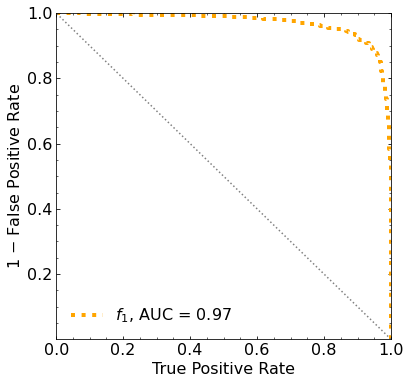

Classification score:


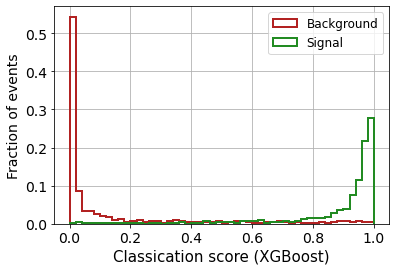


 ROC-AUC =  0.9706699547251757


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  310.62366192  284.63045687  253.21269683  213.36465938  172.11869123
  125.71469074   71.84049847   15.37868921  -43.66540864 -103.43075341]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 240.012427

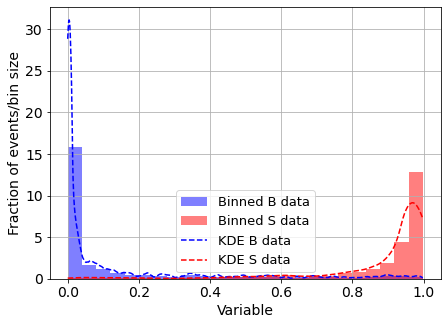

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



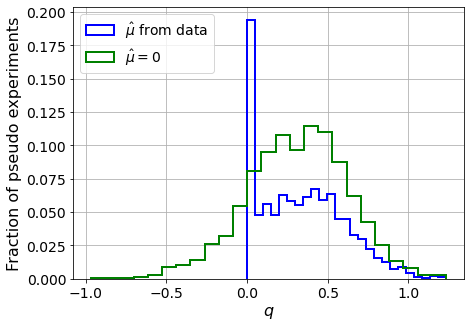

muhat mean:  -5.104978613475873
Z_bins:  0.57217305879671
std Z_bins:  0.2288862169621448
Z_bins mu=0:  0.57217305879671
std Z_bins mu=0:  0.2719013714144982

--------

B_expected:  643
S_expected:  1



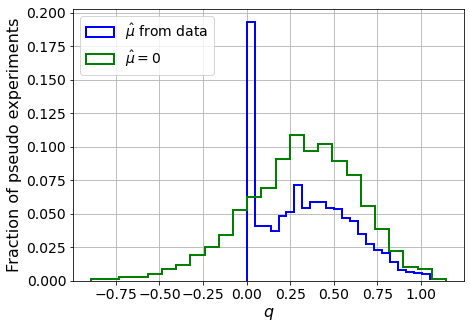

muhat mean:  -5.1046146213486985
Z_bins:  0.575726053546685
std Z_bins:  0.22748762701006311
Z_bins mu=0:  0.575726053546685
std Z_bins mu=0:  0.277072219899236

--------

B_expected:  643
S_expected:  2



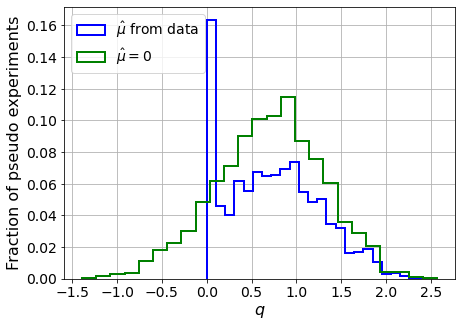

muhat mean:  -2.6615235691705603
Z_bins:  0.8493902953332729
std Z_bins:  0.3088475969198006
Z_bins mu=0:  0.8493902953332729
std Z_bins mu=0:  0.3514854443273186

--------

B_expected:  643
S_expected:  3



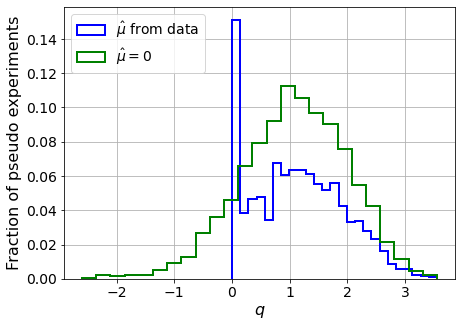

muhat mean:  -1.7165765208389057
Z_bins:  1.0525711142741982
std Z_bins:  0.3774764411634195
Z_bins mu=0:  1.0525711142741982
std Z_bins mu=0:  0.43769600585112856

--------

B_expected:  643
S_expected:  7



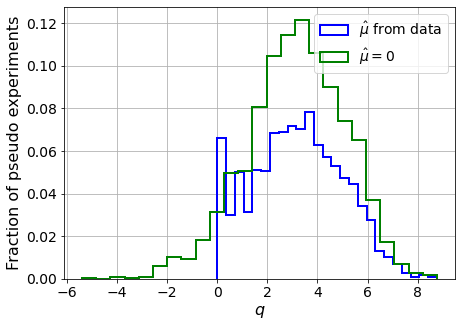

muhat mean:  -0.7670562721436766
Z_bins:  1.794370111172121
std Z_bins:  0.49854339537836095
Z_bins mu=0:  1.794370111172121
std Z_bins mu=0:  0.5448127469278436

--------

B_expected:  643
S_expected:  15



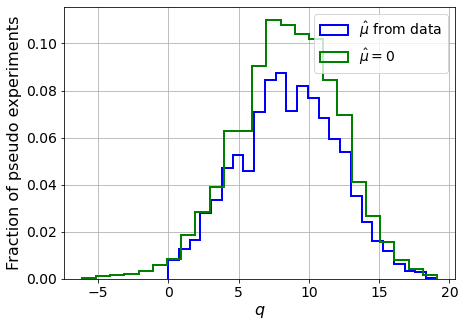

muhat mean:  -0.3490117973351948
Z_bins:  2.9188467096006043
std Z_bins:  0.598732377784097
Z_bins mu=0:  2.9188467096006043
std Z_bins mu=0:  0.6273923698793716

--------

B_expected:  643
S_expected:  33



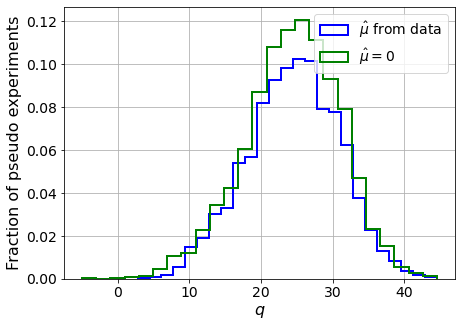

muhat mean:  -0.15352446920018512
Z_bins:  4.975920609547615
std Z_bins:  0.6514736755701708
Z_bins mu=0:  4.975920609547615
std Z_bins mu=0:  0.6715992994735716

--------

B_expected:  643
S_expected:  72



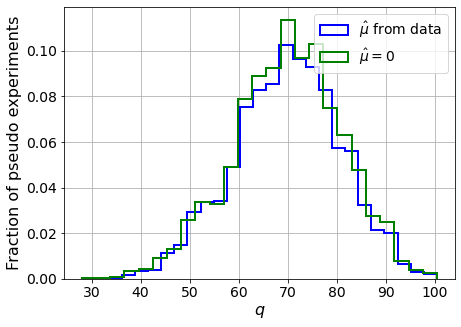

muhat mean:  -0.07374019186241554
Z_bins:  8.383819227929882
std Z_bins:  0.6497198200482198
Z_bins mu=0:  8.383819227929882
std Z_bins mu=0:  0.6600549433715122

--------

B_expected:  643
S_expected:  154



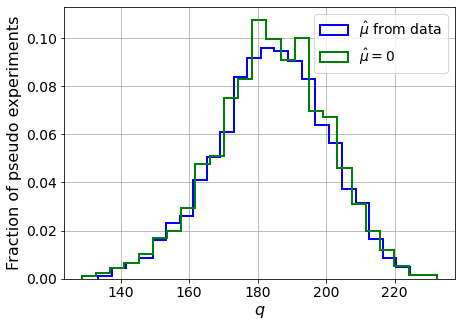

muhat mean:  -0.0333356640217714
Z_bins:  13.580534036564998
std Z_bins:  0.5987082869798293
Z_bins mu=0:  13.580534036564998
std Z_bins mu=0:  0.6049685540796579

--------

B_expected:  643
S_expected:  333



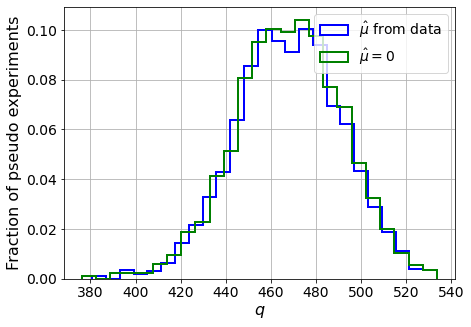

muhat mean:  -0.01588168213813239
Z_bins:  21.646504199167737
std Z_bins:  0.5420101708884468
Z_bins mu=0:  21.646504199167737
std Z_bins mu=0:  0.5455060697686035

--------


 FINAL RESULT:

[[0.57217305879671, 0.2288862169621448, -5.104978613475873, 0.57217305879671, 0.2719013714144982], [0.575726053546685, 0.22748762701006311, -5.1046146213486985, 0.575726053546685, 0.277072219899236], [0.8493902953332729, 0.3088475969198006, -2.6615235691705603, 0.8493902953332729, 0.3514854443273186], [1.0525711142741982, 0.3774764411634195, -1.7165765208389057, 1.0525711142741982, 0.43769600585112856], [1.794370111172121, 0.49854339537836095, -0.7670562721436766, 1.794370111172121, 0.5448127469278436], [2.9188467096006043, 0.598732377784097, -0.3490117973351948, 2.9188467096006043, 0.6273923698793716], [4.975920609547615, 0.6514736755701708, -0.15352446920018512, 4.975920609547615, 0.6715992994735716], [8.383819227929882, 0.6497198200482198, -0.07374019186241554, 8.383819227929882, 0.660054943371

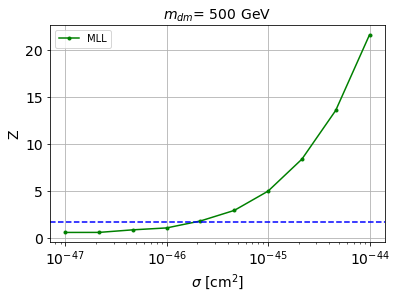


cross_MLL_164:  1.8881113683729236e-46
cross_MLL_164_up:  1.2749690752458415e-46
cross_MLL_164_down:  2.938629759167275e-46

#########################



In [31]:
store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = 'mDM' + str(mDM) + 'GeV/WP_mDM' + str(mDM) + 'GeV_sig1045.hdf5'
    
    f_S = h5py.File(filefolder+filename_S,'r')
    
    
    
    
    print('')
    
    ###################
    # peakS1_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS1_B = 0
    max_pS1_B1 = 0
    max_pS1_B2 = 0
    max_pS1_B3 = 0
    max_pS1_B4 = 0

    max_pS1_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS1_B = max(max_pS1_B, len( f_B['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS1_B1 = max(max_pS1_B1, len( f_B1['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS1_B2 = max(max_pS1_B2, len( f_B2['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS1_B3 = max(max_pS1_B3, len( f_B3['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS1_B4 = max(max_pS1_B4, len( f_B4['peakS1_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS1_S = max(max_pS1_S, len( f_S['peakS1_onlyhits/ev_'+str(i)] ))


    max_pS1_both = max(max_pS1_B,max_pS1_B1,max_pS1_B2,max_pS1_B3,max_pS1_B4,max_pS1_S)

    print('max_pS1_both lenght: ', max_pS1_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
    diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS1_onlyhits_B = np.pad(f_B['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B), 'constant')
    peakS1_onlyhits_B1 = np.pad(f_B1['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B1), 'constant')
    peakS1_onlyhits_B2 = np.pad(f_B2['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B2), 'constant')
    peakS1_onlyhits_B3 = np.pad(f_B3['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B3), 'constant')
    peakS1_onlyhits_B4 = np.pad(f_B4['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B4), 'constant')
    peakS1_onlyhits_S = np.pad(f_S['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
        diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S1_B = np.pad(f_B['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B), 'constant')
        # add new event to the matrix as a row
        peakS1_onlyhits_B = np.row_stack([peakS1_onlyhits_B,aux_S1_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B1 = np.pad(f_B1['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B1), 'constant')
        peakS1_onlyhits_B1 = np.row_stack([peakS1_onlyhits_B1,aux_S1_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B2 = np.pad(f_B2['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B2), 'constant')
        peakS1_onlyhits_B2 = np.row_stack([peakS1_onlyhits_B2,aux_S1_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B3 = np.pad(f_B3['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B3), 'constant')
        peakS1_onlyhits_B3 = np.row_stack([peakS1_onlyhits_B3,aux_S1_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B4 = np.pad(f_B4['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B4), 'constant')
        peakS1_onlyhits_B4 = np.row_stack([peakS1_onlyhits_B4,aux_S1_B4])

    for i in range(2, num_data+1):
        diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_S = np.pad(f_S['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_S), 'constant')
        peakS1_onlyhits_S = np.row_stack([peakS1_onlyhits_S,aux_S1_S])




    # X and Y for the classifier
    X_peakS1 = np.row_stack([peakS1_onlyhits_B[:NUM_DAT_ER],peakS1_onlyhits_B1[:NUM_DAT_AC],peakS1_onlyhits_B2[:NUM_DAT_CNNS],peakS1_onlyhits_B3[:NUM_DAT_RN],peakS1_onlyhits_B4[:NUM_DAT_WALL],peakS1_onlyhits_S])
    # normalize
    X_peakS1 = scaler.fit_transform(X_peakS1)

    del peakS1_onlyhits_B
    del peakS1_onlyhits_B1
    del peakS1_onlyhits_B2
    del peakS1_onlyhits_B3
    del peakS1_onlyhits_B4
    del peakS1_onlyhits_S






    ###################
    # CONCATENATE ALL #
    ###################

    X_mon1 = np.concatenate([X_peakS1],axis=1)

    del X_peakS1

    # labels
    y_mon1 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon1_aux, X_mon1_test, y_mon1_aux, y_mon1_test = train_test_split(X_mon1,
                                                                    y_mon1,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon1,
                                                                    shuffle=True)

    del X_mon1
    del y_mon1

    X_mon1_train, X_mon1_val, y_mon1_train, y_mon1_val = train_test_split(X_mon1_aux,
                                                                      y_mon1_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon1_aux,
                                                                      shuffle=True)

    del X_mon1_aux
    del y_mon1_aux

    print('')
    print('X_mon1_train : ', X_mon1_train.shape)
    print('y_mon1_train : ', y_mon1_train.shape)
    print('X_mon1_val : ', X_mon1_val.shape)
    print('y_mon1_val : ', y_mon1_val.shape)
    print('X_mon1_test : ', X_mon1_test.shape)
    print('y_mon1_test : ', y_mon1_test.shape)
    print('')
    
    
    
    
    
    ###################
    # peakS2_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS2_B = 0
    max_pS2_B1 = 0
    max_pS2_B2 = 0
    max_pS2_B3 = 0
    max_pS2_B4 = 0

    max_pS2_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS2_B = max(max_pS2_B, len( f_B['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS2_B1 = max(max_pS2_B1, len( f_B1['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS2_B2 = max(max_pS2_B2, len( f_B2['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS2_B3 = max(max_pS2_B3, len( f_B3['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS2_B4 = max(max_pS2_B4, len( f_B4['peakS2_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS2_S = max(max_pS2_S, len( f_S['peakS2_onlyhits/ev_'+str(i)] ))


    max_pS2_both = max(max_pS2_B,max_pS2_B1,max_pS2_B2,max_pS2_B3,max_pS2_B4,max_pS2_S)

    print('max_pS2_both lenght: ', max_pS2_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
    diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS2_onlyhits_B = np.pad(f_B['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B), 'constant')
    peakS2_onlyhits_B1 = np.pad(f_B1['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B1), 'constant')
    peakS2_onlyhits_B2 = np.pad(f_B2['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B2), 'constant')
    peakS2_onlyhits_B3 = np.pad(f_B3['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B3), 'constant')
    peakS2_onlyhits_B4 = np.pad(f_B4['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B4), 'constant')
    peakS2_onlyhits_S = np.pad(f_S['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
        diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S2_B = np.pad(f_B['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B), 'constant')
        # add new event to the matrix as a row
        peakS2_onlyhits_B = np.row_stack([peakS2_onlyhits_B,aux_S2_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B1 = np.pad(f_B1['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B1), 'constant')
        peakS2_onlyhits_B1 = np.row_stack([peakS2_onlyhits_B1,aux_S2_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B2 = np.pad(f_B2['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B2), 'constant')
        peakS2_onlyhits_B2 = np.row_stack([peakS2_onlyhits_B2,aux_S2_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B3 = np.pad(f_B3['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B3), 'constant')
        peakS2_onlyhits_B3 = np.row_stack([peakS2_onlyhits_B3,aux_S2_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B4 = np.pad(f_B4['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B4), 'constant')
        peakS2_onlyhits_B4 = np.row_stack([peakS2_onlyhits_B4,aux_S2_B4])
    for i in range(2, num_data+1):
        diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_S = np.pad(f_S['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_S), 'constant')
        peakS2_onlyhits_S = np.row_stack([peakS2_onlyhits_S,aux_S2_S])




    # X and Y for the classifier
    X_peakS2 = np.row_stack([peakS2_onlyhits_B[:NUM_DAT_ER],peakS2_onlyhits_B1[:NUM_DAT_AC],peakS2_onlyhits_B2[:NUM_DAT_CNNS],peakS2_onlyhits_B3[:NUM_DAT_RN],peakS2_onlyhits_B4[:NUM_DAT_WALL],peakS2_onlyhits_S])
    # normalize
    X_peakS2 = scaler.fit_transform(X_peakS2)

    del peakS2_onlyhits_B
    del peakS2_onlyhits_B1
    del peakS2_onlyhits_B2
    del peakS2_onlyhits_B3
    del peakS2_onlyhits_B4
    del peakS2_onlyhits_S









    ###################
    # CONCATENATE ALL #
    ###################

    X_mon2 = np.concatenate([X_peakS2],axis=1)

    del X_peakS2

    # labels
    y_mon2 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon2_aux, X_mon2_test, y_mon2_aux, y_mon2_test = train_test_split(X_mon2,
                                                                    y_mon2,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon2,
                                                                    shuffle=True)

    del X_mon2
    del y_mon2

    X_mon2_train, X_mon2_val, y_mon2_train, y_mon2_val = train_test_split(X_mon2_aux,
                                                                      y_mon2_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon2_aux,
                                                                      shuffle=True)

    del X_mon2_aux
    del y_mon2_aux

    print('')
    print('X_mon2_train : ', X_mon2_train.shape)
    print('y_mon2_train : ', y_mon2_train.shape)
    print('X_mon2_val : ', X_mon2_val.shape)
    print('y_mon2_val : ', y_mon2_val.shape)
    print('X_mon2_test : ', X_mon2_test.shape)
    print('y_mon2_test : ', y_mon2_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_bot_img DATA #
    ######################


    HITS_bot_img_S = np.array( f_S['HITS_bot_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_bot_img_S = np.row_stack([HITS_bot_img_S,np.array( f_S['HITS_bot_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon3 = np.row_stack([HITS_bot_img_B[:NUM_DAT_ER],HITS_bot_img_B1[:NUM_DAT_AC],HITS_bot_img_B2[:NUM_DAT_CNNS],HITS_bot_img_B3[:NUM_DAT_RN],HITS_bot_img_B4[:NUM_DAT_WALL],HITS_bot_img_S])
    # normalize
    X_mon3 = scaler.fit_transform(X_mon3)
    #X_mon3 = np.reshape(X_mon3, (2*num_data,128,128,1))

#     del HITS_bot_img_B
#     del HITS_bot_img_B1
#     del HITS_bot_img_B2
#     del HITS_bot_img_B3
#     del HITS_bot_img_B4
    del HITS_bot_img_S

    # labels
    y_mon3 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon3_aux, X_mon3_test, y_mon3_aux, y_mon3_test = train_test_split(X_mon3,
                                                                    y_mon3,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon3,
                                                                    shuffle=True)

    del X_mon3
    del y_mon3

    X_mon3_train, X_mon3_val, y_mon3_train, y_mon3_val = train_test_split(X_mon3_aux,
                                                                      y_mon3_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon3_aux,
                                                                      shuffle=True)

    del X_mon3_aux
    del y_mon3_aux

    print('')
    print('X_mon3_train : ', X_mon3_train.shape)
    print('y_mon3_train : ', y_mon3_train.shape)
    print('X_mon3_val : ', X_mon3_val.shape)
    print('y_mon3_val : ', y_mon3_val.shape)
    print('X_mon3_test : ', X_mon3_test.shape)
    print('y_mon3_test : ', y_mon3_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_top_img DATA #
    ######################
    
    HITS_top_img_S = np.array( f_S['HITS_top_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_top_img_S = np.row_stack([HITS_top_img_S,np.array( f_S['HITS_top_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon4 = np.row_stack([HITS_top_img_B[:NUM_DAT_ER],HITS_top_img_B1[:NUM_DAT_AC],HITS_top_img_B2[:NUM_DAT_CNNS],HITS_top_img_B3[:NUM_DAT_RN],HITS_top_img_B4[:NUM_DAT_WALL],HITS_top_img_S])
    # normalize
    X_mon4 = scaler.fit_transform(X_mon4)
    #X_mon4 = np.reshape(X_mon4, (2*num_data,128,128,1))

#     del HITS_top_img_B
#     del HITS_top_img_B1
#     del HITS_top_img_B2
#     del HITS_top_img_B3
#     del HITS_top_img_B4
    del HITS_top_img_S

    # labels
    y_mon4 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon4_aux, X_mon4_test, y_mon4_aux, y_mon4_test = train_test_split(X_mon4,
                                                                    y_mon4,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon4,
                                                                    shuffle=True)

    del X_mon4
    del y_mon4

    X_mon4_train, X_mon4_val, y_mon4_train, y_mon4_val = train_test_split(X_mon4_aux,
                                                                      y_mon4_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon4_aux,
                                                                      shuffle=True)

    del X_mon4_aux
    del y_mon4_aux

    print('')
    print('X_mon4_train : ', X_mon4_train.shape)
    print('y_mon4_train : ', y_mon4_train.shape)
    print('X_mon4_val : ', X_mon4_val.shape)
    print('y_mon4_val : ', y_mon4_val.shape)
    print('X_mon4_test : ', X_mon4_test.shape)
    print('y_mon4_test : ', y_mon4_test.shape)
    print('')
    
    
    
    
    
    
    # close the h5 files
#     f_B.close()
#     f_B1.close()
#     f_B2.close()
#     f_B3.close()
#     f_B4.close()
    f_S.close()
    
    
    
    
    #################
    # LOAD FEATURES #
    #################
    
    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    
    # concatenate the data

    # all the background features
    X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))

    # all the signal features
    X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))

    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)
    print('')



    X_mon5 = np.concatenate([X_mon_B, X_mon_S])

    print('X_mon5.shape: ', X_mon5.shape)



    # labels
    y_mon5 = np.concatenate([np.zeros(num_data),np.ones(num_data)])




    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon5_aux, X_mon5_test, y_mon5_aux, y_mon5_test = train_test_split(X_mon5,
                                                                    y_mon5,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon5,
                                                                    shuffle=True)



    X_mon5_train, X_mon5_val, y_mon5_train, y_mon5_val = train_test_split(X_mon5_aux,
                                                                      y_mon5_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon5_aux,
                                                                      shuffle=True)
    
    
    print('')
    print('X_mon5_train : ', X_mon5_train.shape)
    print('y_mon5_train : ', y_mon5_train.shape)
    print('X_mon5_val : ', X_mon5_val.shape)
    print('y_mon5_val : ', y_mon5_val.shape)
    print('X_mon5_test : ', X_mon5_test.shape)
    print('y_mon5_test : ', y_mon5_test.shape)
    print('')
    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon_train = np.concatenate([X_mon1_train,X_mon2_train,X_mon3_train,X_mon4_train,X_mon5_train],axis=1)
    X_mon_test = np.concatenate([X_mon1_test,X_mon2_test,X_mon3_test,X_mon4_test,X_mon5_test],axis=1)
    X_mon_val = np.concatenate([X_mon1_val,X_mon2_val,X_mon3_val,X_mon4_val,X_mon5_val],axis=1)



    y_mon_train = y_mon1_train
    y_mon_test = y_mon1_test
    y_mon_val = y_mon1_val



    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





   # OPTION 2 (mu_hat with more precision) (slower,
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)


    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]



    # plot
#     plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [32]:
cross_arraysdt_MLL = store_cross_MLL_164
cross_arraysdt_MLL_up = store_cross_MLL_164_up
cross_arraysdt_MLL_down = store_cross_MLL_164_down

print(cross_arraysdt_MLL)
print(cross_arraysdt_MLL_up)
print(cross_arraysdt_MLL_down)

[1.2005602511722629e-45, 5.810960572106861e-47, 2.7136690744062864e-47, 2.8420890941422533e-47, 4.2973166537468723e-47, 7.355268440137193e-47, 1.8881113683729236e-46]
[6.727372975476203e-46, 3.7573343561872056e-47, 1.6221724635197363e-47, 1.8974630145794523e-47, 2.5809084808270147e-47, 4.2104044397260874e-47, 1.2749690752458415e-46]
[2.0354528680589903e-45, 8.543202829989074e-47, 4.381316565014401e-47, 4.2718666658887753e-47, 6.41946094701575e-47, 1.2008013088017743e-46, 2.938629759167275e-46]


In [33]:
np.savetxt('results/arraysdt_MLL.txt', [cross_arraysdt_MLL, cross_arraysdt_MLL_up, cross_arraysdt_MLL_down])

In [34]:
cross_arraysdt_MLL = np.loadtxt('results/arraysdt_MLL.txt')[0]
cross_arraysdt_MLL_up = np.loadtxt('results/arraysdt_MLL.txt')[1]
cross_arraysdt_MLL_down =np.loadtxt('results/arraysdt_MLL.txt')[2]

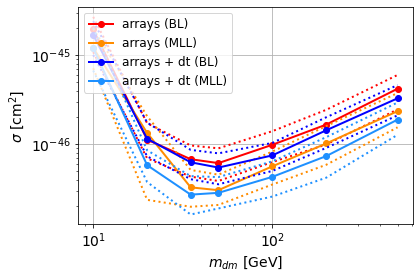

In [35]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_arrays, '-o', color='red', lw=lw, label=r'arrays (BL)')
plt.plot(mDM_mDM, cross_arrays_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_arrays_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_arrays_MLL, '-o', color='darkorange', lw=lw, label=r'arrays (MLL)')
plt.plot(mDM_mDM, cross_arrays_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_arrays_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_arraysdt, '-o', color='blue', lw=lw, label=r'arrays + dt (BL)')
plt.plot(mDM_mDM, cross_arraysdt_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_arraysdt_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_arraysdt_MLL, '-o', color='dodgerblue', lw=lw, label=r'arrays + dt (MLL)')
plt.plot(mDM_mDM, cross_arraysdt_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_arraysdt_MLL_down, ':', color='dodgerblue', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

## 3. Arrays + time diff + 16 compressed features


#########################

mDM =  10 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000

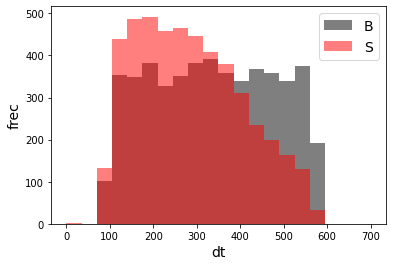

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35235)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35235)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35235)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68346	validation_1-logloss:0.68366
[1]	validation_0-logloss:0.67398	validation_1-logloss:0.67435
[2]	validation_0-logloss:0.66468	validation_1-logloss:0.66525
[3]	validation_0-logloss:0.65556	validation_1-logloss:0.65630
[4]	validation_0-logloss:0.64662	validation_1-logloss:0.64755
[5]	validation_0-logloss:0.63785	validation_1-logloss:0.63897
[6]	validation_0-logloss:0.62924	validation_1-logloss:0.63053
[7]	validation_0-logloss:0.62080	validation_1-logloss:0.62226
[8]	validation_0-logloss:0.61251	validation_1-logloss:0.61416
[9]	validation_0-logloss:0.60437	validation_1-logloss:0.60619
[10]	validation_0-logloss:0.59638	validation_1-logloss:0.59838
[11]	validation_0-logloss:0.58854	validation_1-logloss:0.59068
[12]	validation_0-logloss:0.58084	validation_1-logloss:0.58316
[13]	validation_0-logloss:0.57327	validation_1-logloss:0.57576
[14]	validation_0-logloss:0.56583	validation_1-logloss:0.56850
[15]	validation_0-logloss:0.55853	validation_1-logloss:0.56137
[1

[130]	validation_0-logloss:0.15653	validation_1-logloss:0.17449
[131]	validation_0-logloss:0.15502	validation_1-logloss:0.17304
[132]	validation_0-logloss:0.15347	validation_1-logloss:0.17156
[133]	validation_0-logloss:0.15196	validation_1-logloss:0.17017
[134]	validation_0-logloss:0.15050	validation_1-logloss:0.16876
[135]	validation_0-logloss:0.14899	validation_1-logloss:0.16729
[136]	validation_0-logloss:0.14752	validation_1-logloss:0.16596
[137]	validation_0-logloss:0.14609	validation_1-logloss:0.16458
[138]	validation_0-logloss:0.14467	validation_1-logloss:0.16328
[139]	validation_0-logloss:0.14329	validation_1-logloss:0.16196
[140]	validation_0-logloss:0.14187	validation_1-logloss:0.16061
[141]	validation_0-logloss:0.14049	validation_1-logloss:0.15936
[142]	validation_0-logloss:0.13916	validation_1-logloss:0.15810
[143]	validation_0-logloss:0.13784	validation_1-logloss:0.15692
[144]	validation_0-logloss:0.13647	validation_1-logloss:0.15559
[145]	validation_0-logloss:0.13514	valid

[259]	validation_0-logloss:0.04661	validation_1-logloss:0.07383
[260]	validation_0-logloss:0.04619	validation_1-logloss:0.07342
[261]	validation_0-logloss:0.04578	validation_1-logloss:0.07306
[262]	validation_0-logloss:0.04537	validation_1-logloss:0.07266
[263]	validation_0-logloss:0.04496	validation_1-logloss:0.07234
[264]	validation_0-logloss:0.04456	validation_1-logloss:0.07196
[265]	validation_0-logloss:0.04415	validation_1-logloss:0.07157
[266]	validation_0-logloss:0.04377	validation_1-logloss:0.07124
[267]	validation_0-logloss:0.04337	validation_1-logloss:0.07087
[268]	validation_0-logloss:0.04298	validation_1-logloss:0.07059
[269]	validation_0-logloss:0.04259	validation_1-logloss:0.07023
[270]	validation_0-logloss:0.04222	validation_1-logloss:0.06993
[271]	validation_0-logloss:0.04184	validation_1-logloss:0.06960
[272]	validation_0-logloss:0.04146	validation_1-logloss:0.06933
[273]	validation_0-logloss:0.04109	validation_1-logloss:0.06899
[274]	validation_0-logloss:0.04072	valid

[388]	validation_0-logloss:0.01548	validation_1-logloss:0.04840
[389]	validation_0-logloss:0.01536	validation_1-logloss:0.04837
[390]	validation_0-logloss:0.01523	validation_1-logloss:0.04827
[391]	validation_0-logloss:0.01512	validation_1-logloss:0.04820
[392]	validation_0-logloss:0.01500	validation_1-logloss:0.04817
[393]	validation_0-logloss:0.01488	validation_1-logloss:0.04809
[394]	validation_0-logloss:0.01477	validation_1-logloss:0.04800
[395]	validation_0-logloss:0.01465	validation_1-logloss:0.04789
[396]	validation_0-logloss:0.01454	validation_1-logloss:0.04788
[397]	validation_0-logloss:0.01443	validation_1-logloss:0.04779
[398]	validation_0-logloss:0.01432	validation_1-logloss:0.04773
[399]	validation_0-logloss:0.01421	validation_1-logloss:0.04766
[400]	validation_0-logloss:0.01410	validation_1-logloss:0.04761
[401]	validation_0-logloss:0.01399	validation_1-logloss:0.04753
[402]	validation_0-logloss:0.01389	validation_1-logloss:0.04747
[403]	validation_0-logloss:0.01378	valid

[517]	validation_0-logloss:0.00616	validation_1-logloss:0.04364
[518]	validation_0-logloss:0.00611	validation_1-logloss:0.04367
[519]	validation_0-logloss:0.00608	validation_1-logloss:0.04365
[520]	validation_0-logloss:0.00604	validation_1-logloss:0.04365
[521]	validation_0-logloss:0.00600	validation_1-logloss:0.04364
[522]	validation_0-logloss:0.00596	validation_1-logloss:0.04368
[523]	validation_0-logloss:0.00592	validation_1-logloss:0.04368
[524]	validation_0-logloss:0.00589	validation_1-logloss:0.04368
[525]	validation_0-logloss:0.00585	validation_1-logloss:0.04363
[526]	validation_0-logloss:0.00581	validation_1-logloss:0.04368
[527]	validation_0-logloss:0.00577	validation_1-logloss:0.04371
[528]	validation_0-logloss:0.00573	validation_1-logloss:0.04374
[529]	validation_0-logloss:0.00570	validation_1-logloss:0.04373
[530]	validation_0-logloss:0.00566	validation_1-logloss:0.04374
[531]	validation_0-logloss:0.00562	validation_1-logloss:0.04374
[532]	validation_0-logloss:0.00559	valid

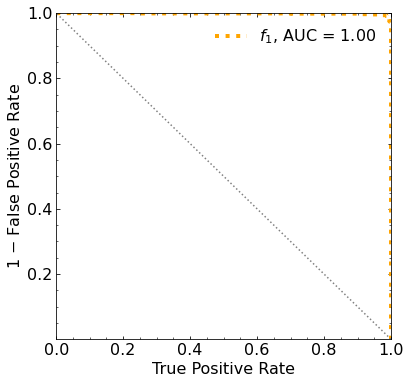

Classification score:


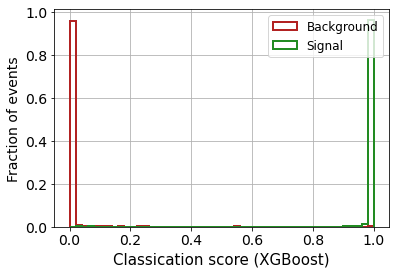


 ROC-AUC =  0.9987737001413557
At least 5 B events per bin, range = [[0, 1]]:
# bins:  2 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  2
range of our data:  [[0, 1]]
number of bins we are going to use:  2
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.138


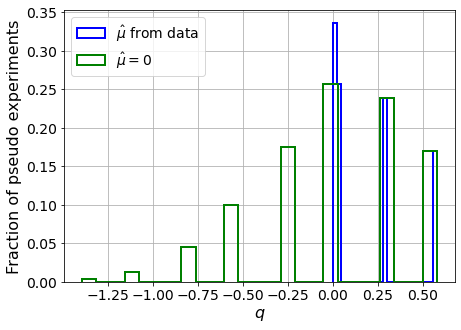

muhat mean:  0.4330583834561952
Z_bins:  0.2083339653924639
std Z_bins:  0.5144298831293488
Z_bins mu=0:  0.12703981324570995
std Z_bins mu=0:  1.6408001532333154

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.119


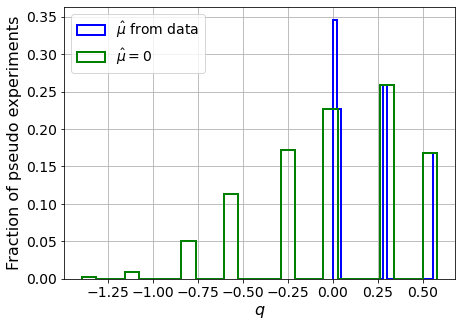

muhat mean:  0.43011902744548847
Z_bins:  0.2083339653924639
std Z_bins:  0.5139135430532551
Z_bins mu=0:  0.12703981324570995
std Z_bins mu=0:  1.6466499071337812

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1235


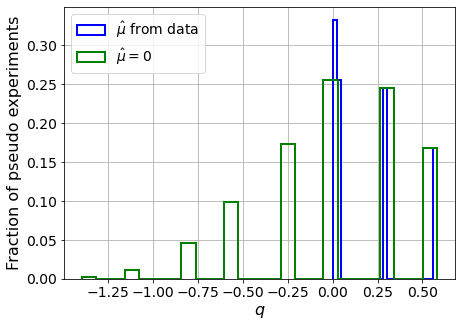

muhat mean:  0.41702242639559745
Z_bins:  0.20827801007831562
std Z_bins:  0.5132297783767461
Z_bins mu=0:  0.1268785610386215
std Z_bins mu=0:  1.6275566375340909

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.117


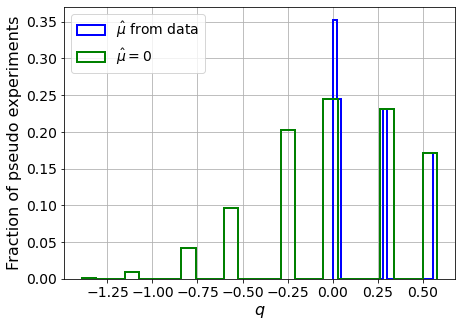

muhat mean:  0.42560692617880597
Z_bins:  0.20827801007831562
std Z_bins:  0.5177676090601776
Z_bins mu=0:  0.1268785610386215
std Z_bins mu=0:  1.6005617773139234

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.139


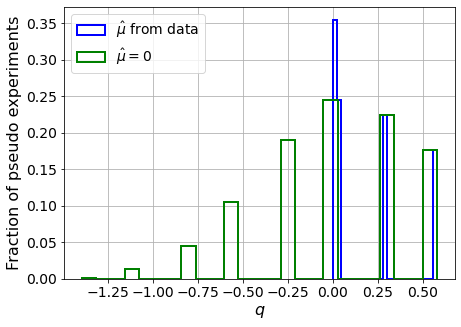

muhat mean:  0.4483007988236801
Z_bins:  0.20819407567675166
std Z_bins:  0.522205124975659
Z_bins mu=0:  0.12663629773373436
std Z_bins mu=0:  1.6465872003973168

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.126


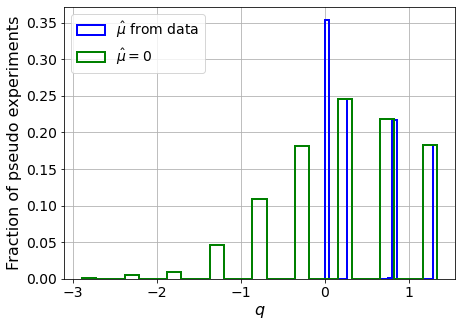

muhat mean:  0.23151620480796056
Z_bins:  0.5504578648019649
std Z_bins:  0.44309551709127143
Z_bins mu=0:  0.525084261657089
std Z_bins mu=0:  0.7690491862023893

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1275


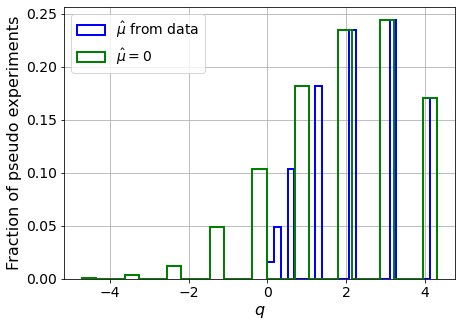

muhat mean:  0.09066841684812132
Z_bins:  1.4426214491486797
std Z_bins:  0.45106832491606885
Z_bins mu=0:  1.433134705920089
std Z_bins mu=0:  0.5911716506897305

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1265


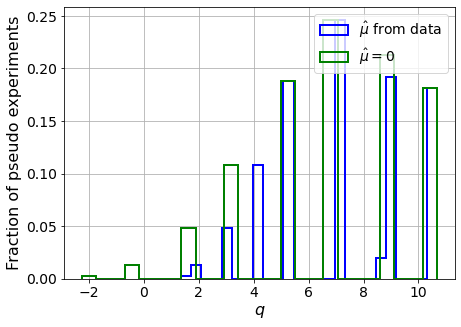

muhat mean:  0.04693767343188532
Z_bins:  2.64645785731301
std Z_bins:  0.4490546018021929
Z_bins mu=0:  2.6412917949331285
std Z_bins mu=0:  0.5240854541431014

--------

B_expected:  643
S_expected:  22

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.126


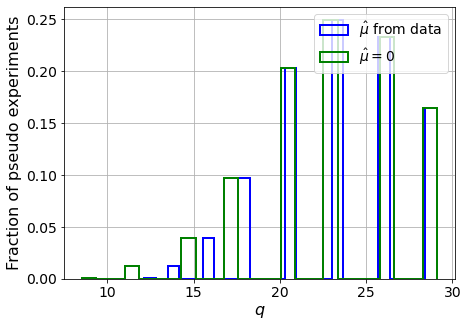

muhat mean:  0.02010459123055049
Z_bins:  4.820653259496086
std Z_bins:  0.3987950112736753
Z_bins mu=0:  4.81782185943061
std Z_bins mu=0:  0.43713571440247617

--------

B_expected:  643
S_expected:  47

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.119


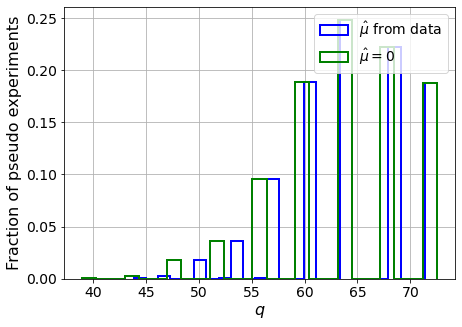

muhat mean:  0.008764259963428628
Z_bins:  8.008091428737192
std Z_bins:  0.3660160590309488
Z_bins mu=0:  8.006389524524813
std Z_bins mu=0:  0.39164188544357104

--------


 FINAL RESULT:

[[0.2083339653924639, 0.5144298831293488, 0.4330583834561952, 0.12703981324570995, 1.6408001532333154], [0.2083339653924639, 0.5139135430532551, 0.43011902744548847, 0.12703981324570995, 1.6466499071337812], [0.20827801007831562, 0.5132297783767461, 0.41702242639559745, 0.1268785610386215, 1.6275566375340909], [0.20827801007831562, 0.5177676090601776, 0.42560692617880597, 0.1268785610386215, 1.6005617773139234], [0.20819407567675166, 0.522205124975659, 0.4483007988236801, 0.12663629773373436, 1.6465872003973168], [0.5504578648019649, 0.44309551709127143, 0.23151620480796056, 0.525084261657089, 0.7690491862023893], [1.4426214491486797, 0.45106832491606885, 0.09066841684812132, 1.433134705920089, 0.5911716506897305], [2.64645785731301, 0.4490546018021929, 0.04693767343188532, 2.6412917949331285, 0.52

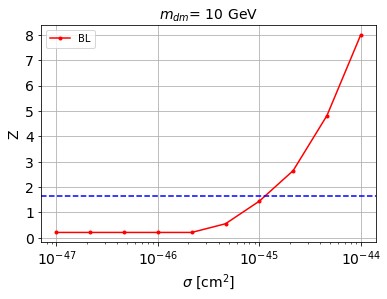


cross_BL_164:  1.1582262510912942e-45
cross_BL_164_up:  8.268036792797728e-46
cross_BL_164_down:  1.599515115354566e-45

#########################


#########################

mDM =  20 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)

B_pbot.shape:  (5000,)


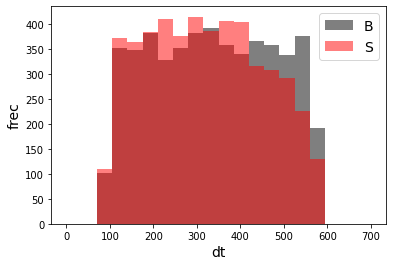

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35235)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35235)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35235)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68426	validation_1-logloss:0.68459
[1]	validation_0-logloss:0.67555	validation_1-logloss:0.67620
[2]	validation_0-logloss:0.66701	validation_1-logloss:0.66801
[3]	validation_0-logloss:0.65864	validation_1-logloss:0.65992
[4]	validation_0-logloss:0.65042	validation_1-logloss:0.65208
[5]	validation_0-logloss:0.64236	validation_1-logloss:0.64433
[6]	validation_0-logloss:0.63445	validation_1-logloss:0.63672
[7]	validation_0-logloss:0.62667	validation_1-logloss:0.62926
[8]	validation_0-logloss:0.61904	validation_1-logloss:0.62190
[9]	validation_0-logloss:0.61154	validation_1-logloss:0.61471
[10]	validation_0-logloss:0.60413	validation_1-logloss:0.60754
[11]	validation_0-logloss:0.59690	validation_1-logloss:0.60057
[12]	validation_0-logloss:0.58973	validation_1-logloss:0.59365
[13]	validation_0-logloss:0.58276	validation_1-logloss:0.58698
[14]	validation_0-logloss:0.57584	validation_1-logloss:0.58027
[15]	validation_0-logloss:0.56905	validation_1-logloss:0.57374
[1

[130]	validation_0-logloss:0.19053	validation_1-logloss:0.21603
[131]	validation_0-logloss:0.18903	validation_1-logloss:0.21459
[132]	validation_0-logloss:0.18755	validation_1-logloss:0.21333
[133]	validation_0-logloss:0.18608	validation_1-logloss:0.21191
[134]	validation_0-logloss:0.18456	validation_1-logloss:0.21053
[135]	validation_0-logloss:0.18314	validation_1-logloss:0.20919
[136]	validation_0-logloss:0.18174	validation_1-logloss:0.20786
[137]	validation_0-logloss:0.18029	validation_1-logloss:0.20650
[138]	validation_0-logloss:0.17892	validation_1-logloss:0.20522
[139]	validation_0-logloss:0.17747	validation_1-logloss:0.20395
[140]	validation_0-logloss:0.17610	validation_1-logloss:0.20264
[141]	validation_0-logloss:0.17468	validation_1-logloss:0.20140
[142]	validation_0-logloss:0.17333	validation_1-logloss:0.20009
[143]	validation_0-logloss:0.17195	validation_1-logloss:0.19891
[144]	validation_0-logloss:0.17064	validation_1-logloss:0.19766
[145]	validation_0-logloss:0.16929	valid

[259]	validation_0-logloss:0.07893	validation_1-logloss:0.11811
[260]	validation_0-logloss:0.07850	validation_1-logloss:0.11773
[261]	validation_0-logloss:0.07805	validation_1-logloss:0.11740
[262]	validation_0-logloss:0.07761	validation_1-logloss:0.11707
[263]	validation_0-logloss:0.07717	validation_1-logloss:0.11677
[264]	validation_0-logloss:0.07674	validation_1-logloss:0.11642
[265]	validation_0-logloss:0.07631	validation_1-logloss:0.11613
[266]	validation_0-logloss:0.07589	validation_1-logloss:0.11584
[267]	validation_0-logloss:0.07548	validation_1-logloss:0.11550
[268]	validation_0-logloss:0.07509	validation_1-logloss:0.11521
[269]	validation_0-logloss:0.07470	validation_1-logloss:0.11491
[270]	validation_0-logloss:0.07428	validation_1-logloss:0.11457
[271]	validation_0-logloss:0.07388	validation_1-logloss:0.11428
[272]	validation_0-logloss:0.07348	validation_1-logloss:0.11400
[273]	validation_0-logloss:0.07309	validation_1-logloss:0.11370
[274]	validation_0-logloss:0.07271	valid

[388]	validation_0-logloss:0.04355	validation_1-logloss:0.09515
[389]	validation_0-logloss:0.04338	validation_1-logloss:0.09506
[390]	validation_0-logloss:0.04320	validation_1-logloss:0.09491
[391]	validation_0-logloss:0.04303	validation_1-logloss:0.09486
[392]	validation_0-logloss:0.04286	validation_1-logloss:0.09477
[393]	validation_0-logloss:0.04269	validation_1-logloss:0.09469
[394]	validation_0-logloss:0.04252	validation_1-logloss:0.09462
[395]	validation_0-logloss:0.04236	validation_1-logloss:0.09457
[396]	validation_0-logloss:0.04223	validation_1-logloss:0.09453
[397]	validation_0-logloss:0.04207	validation_1-logloss:0.09446
[398]	validation_0-logloss:0.04190	validation_1-logloss:0.09441
[399]	validation_0-logloss:0.04173	validation_1-logloss:0.09432
[400]	validation_0-logloss:0.04158	validation_1-logloss:0.09424
[401]	validation_0-logloss:0.04142	validation_1-logloss:0.09421
[402]	validation_0-logloss:0.04126	validation_1-logloss:0.09416
[403]	validation_0-logloss:0.04110	valid

[517]	validation_0-logloss:0.02775	validation_1-logloss:0.08885
[518]	validation_0-logloss:0.02766	validation_1-logloss:0.08881
[519]	validation_0-logloss:0.02757	validation_1-logloss:0.08878
[520]	validation_0-logloss:0.02748	validation_1-logloss:0.08872
[521]	validation_0-logloss:0.02739	validation_1-logloss:0.08866
[522]	validation_0-logloss:0.02731	validation_1-logloss:0.08861
[523]	validation_0-logloss:0.02722	validation_1-logloss:0.08863
[524]	validation_0-logloss:0.02713	validation_1-logloss:0.08861
[525]	validation_0-logloss:0.02703	validation_1-logloss:0.08857
[526]	validation_0-logloss:0.02693	validation_1-logloss:0.08849
[527]	validation_0-logloss:0.02683	validation_1-logloss:0.08843
[528]	validation_0-logloss:0.02676	validation_1-logloss:0.08838
[529]	validation_0-logloss:0.02668	validation_1-logloss:0.08835
[530]	validation_0-logloss:0.02658	validation_1-logloss:0.08832
[531]	validation_0-logloss:0.02649	validation_1-logloss:0.08827
[532]	validation_0-logloss:0.02638	valid

[646]	validation_0-logloss:0.01868	validation_1-logloss:0.08719
[647]	validation_0-logloss:0.01864	validation_1-logloss:0.08720
[648]	validation_0-logloss:0.01857	validation_1-logloss:0.08719
[649]	validation_0-logloss:0.01852	validation_1-logloss:0.08721
[650]	validation_0-logloss:0.01846	validation_1-logloss:0.08721
[651]	validation_0-logloss:0.01839	validation_1-logloss:0.08725
[652]	validation_0-logloss:0.01834	validation_1-logloss:0.08720
[653]	validation_0-logloss:0.01827	validation_1-logloss:0.08723
[654]	validation_0-logloss:0.01821	validation_1-logloss:0.08719
[655]	validation_0-logloss:0.01817	validation_1-logloss:0.08716
[656]	validation_0-logloss:0.01810	validation_1-logloss:0.08717
[657]	validation_0-logloss:0.01803	validation_1-logloss:0.08721
[658]	validation_0-logloss:0.01799	validation_1-logloss:0.08718
[659]	validation_0-logloss:0.01792	validation_1-logloss:0.08724
[660]	validation_0-logloss:0.01788	validation_1-logloss:0.08722
[661]	validation_0-logloss:0.01784	valid

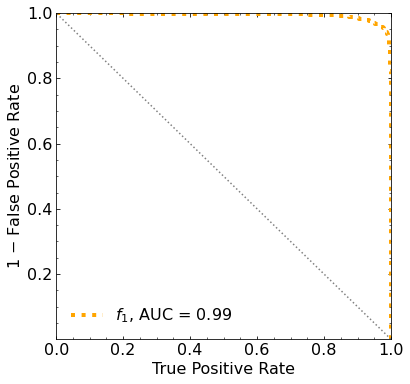

Classification score:


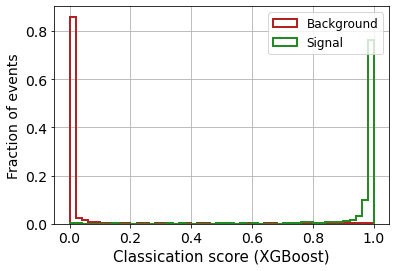


 ROC-AUC =  0.9937151732120542
At least 5 B events per bin, range = [[0, 1]]:
# bins:  6 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  6
range of our data:  [[0, 1]]
number of bins we are going to use:  6
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3055


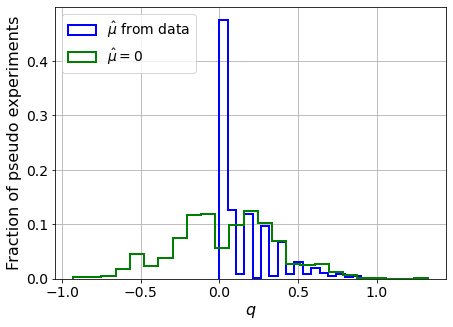

muhat mean:  0.11654295225254802
Z_bins:  0.24965740980756612
std Z_bins:  0.40433439115475656
Z_bins mu=0:  0.24965740980756612
std Z_bins mu=0:  0.65102783647002

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.344


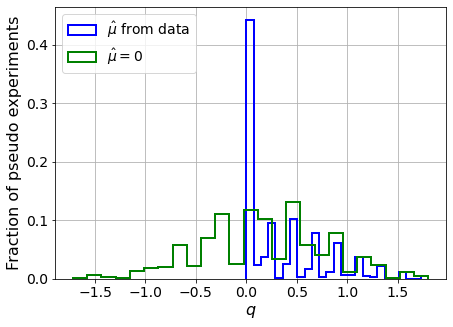

muhat mean:  0.06695656326638211
Z_bins:  0.4630473624200221
std Z_bins:  0.4450770213535512
Z_bins mu=0:  0.4630473624200221
std Z_bins mu=0:  0.6667937706885386

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.344


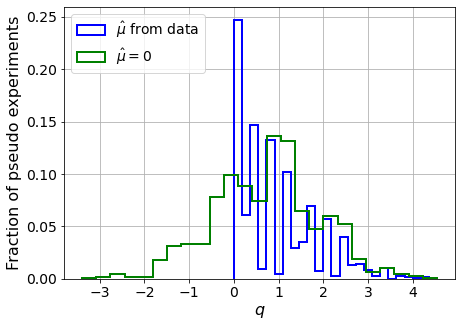

muhat mean:  0.01519762182368495
Z_bins:  0.8831502426979475
std Z_bins:  0.5002771802996254
Z_bins mu=0:  0.8831502426979475
std Z_bins mu=0:  0.6622611166786311

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.334


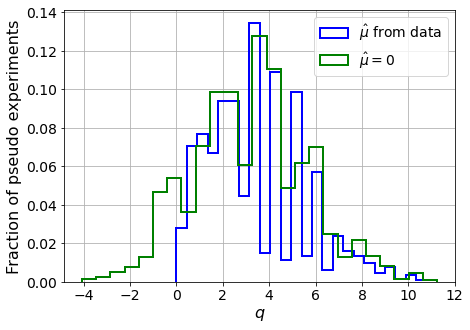

muhat mean:  0.019468248941443972
Z_bins:  1.8165358818163355
std Z_bins:  0.5794339210540168
Z_bins mu=0:  1.8165358818163355
std Z_bins mu=0:  0.6737207968680297

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3345


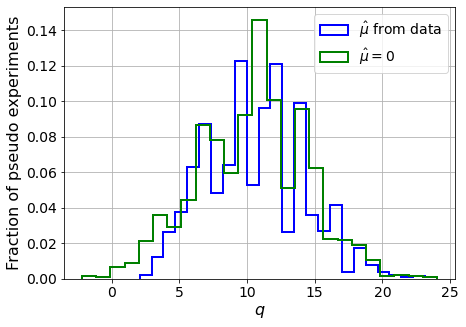

muhat mean:  0.01465341559078059
Z_bins:  3.2786633114829717
std Z_bins:  0.556471105633156
Z_bins mu=0:  3.2786633114829717
std Z_bins mu=0:  0.6155150808141786

--------

B_expected:  643
S_expected:  40

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3355


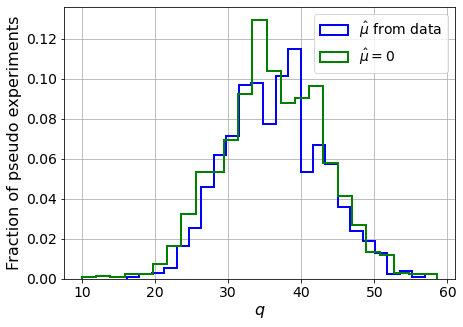

muhat mean:  0.00382274621897153
Z_bins:  6.036933060111894
std Z_bins:  0.5466990078684505
Z_bins mu=0:  6.036933060111894
std Z_bins mu=0:  0.5791262139651295

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3215


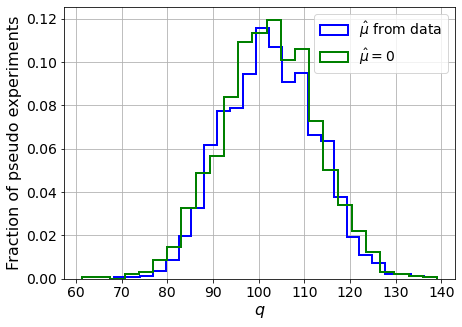

muhat mean:  0.001895379602967774
Z_bins:  10.12228714403215
std Z_bins:  0.4963691421228798
Z_bins mu=0:  10.12228714403215
std Z_bins mu=0:  0.5162036538353905

--------

B_expected:  643
S_expected:  184

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.323


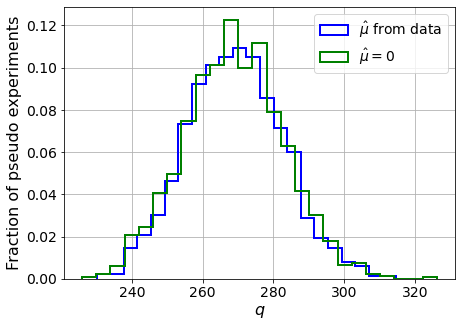

muhat mean:  0.0005824834830266284
Z_bins:  16.39946219059197
std Z_bins:  0.4168401109164631
Z_bins mu=0:  16.39946219059197
std Z_bins mu=0:  0.42741642556863835

--------

B_expected:  643
S_expected:  396

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.328


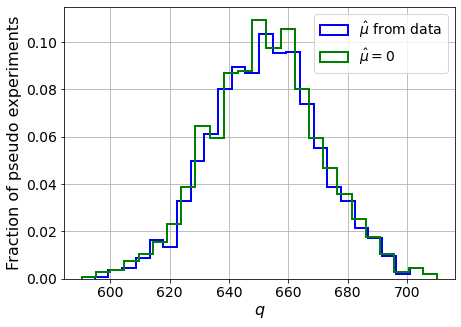

muhat mean:  0.00019636146781536957
Z_bins:  25.540515275104806
std Z_bins:  0.3625138932376121
Z_bins mu=0:  25.540369931631766
std Z_bins mu=0:  0.37016164829866954

--------

B_expected:  643
S_expected:  854

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3355


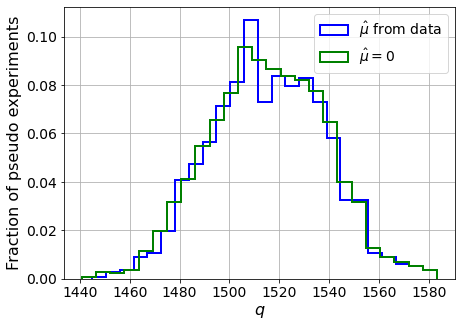

muhat mean:  0.00012585001600288128
Z_bins:  38.92370015967963
std Z_bins:  0.29563965715878515
Z_bins mu=0:  38.92370015967963
std Z_bins mu=0:  0.3003524639316802

--------


 FINAL RESULT:

[[0.24965740980756612, 0.40433439115475656, 0.11654295225254802, 0.24965740980756612, 0.65102783647002], [0.4630473624200221, 0.4450770213535512, 0.06695656326638211, 0.4630473624200221, 0.6667937706885386], [0.8831502426979475, 0.5002771802996254, 0.01519762182368495, 0.8831502426979475, 0.6622611166786311], [1.8165358818163355, 0.5794339210540168, 0.019468248941443972, 1.8165358818163355, 0.6737207968680297], [3.2786633114829717, 0.556471105633156, 0.01465341559078059, 3.2786633114829717, 0.6155150808141786], [6.036933060111894, 0.5466990078684505, 0.00382274621897153, 6.036933060111894, 0.5791262139651295], [10.12228714403215, 0.4963691421228798, 0.001895379602967774, 10.12228714403215, 0.5162036538353905], [16.39946219059197, 0.4168401109164631, 0.0005824834830266284, 16.39946219059197, 0.427

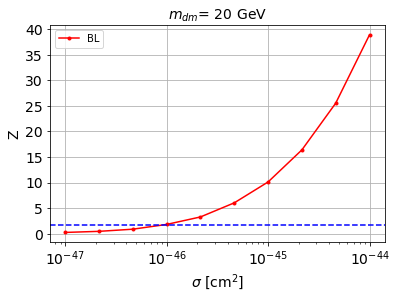


cross_BL_164:  8.8551795411822e-47
cross_BL_164_up:  5.86608372701532e-47
cross_BL_164_down:  1.2937725703834367e-46

#########################


#########################

mDM =  35 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)

B_pbot.shape:  (5000,)
B_p

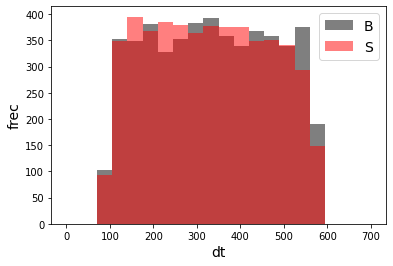

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35235)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35235)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35235)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68519	validation_1-logloss:0.68557
[1]	validation_0-logloss:0.67739	validation_1-logloss:0.67816
[2]	validation_0-logloss:0.66976	validation_1-logloss:0.67087
[3]	validation_0-logloss:0.66226	validation_1-logloss:0.66373
[4]	validation_0-logloss:0.65490	validation_1-logloss:0.65672
[5]	validation_0-logloss:0.64771	validation_1-logloss:0.64973
[6]	validation_0-logloss:0.64066	validation_1-logloss:0.64287
[7]	validation_0-logloss:0.63372	validation_1-logloss:0.63627
[8]	validation_0-logloss:0.62691	validation_1-logloss:0.62972
[9]	validation_0-logloss:0.62024	validation_1-logloss:0.62328
[10]	validation_0-logloss:0.61364	validation_1-logloss:0.61704
[11]	validation_0-logloss:0.60718	validation_1-logloss:0.61074
[12]	validation_0-logloss:0.60084	validation_1-logloss:0.60467
[13]	validation_0-logloss:0.59455	validation_1-logloss:0.59871
[14]	validation_0-logloss:0.58843	validation_1-logloss:0.59284
[15]	validation_0-logloss:0.58243	validation_1-logloss:0.58700
[1

[130]	validation_0-logloss:0.23754	validation_1-logloss:0.26962
[131]	validation_0-logloss:0.23619	validation_1-logloss:0.26849
[132]	validation_0-logloss:0.23475	validation_1-logloss:0.26725
[133]	validation_0-logloss:0.23341	validation_1-logloss:0.26605
[134]	validation_0-logloss:0.23207	validation_1-logloss:0.26491
[135]	validation_0-logloss:0.23075	validation_1-logloss:0.26387
[136]	validation_0-logloss:0.22938	validation_1-logloss:0.26270
[137]	validation_0-logloss:0.22809	validation_1-logloss:0.26153
[138]	validation_0-logloss:0.22681	validation_1-logloss:0.26047
[139]	validation_0-logloss:0.22548	validation_1-logloss:0.25939
[140]	validation_0-logloss:0.22424	validation_1-logloss:0.25840
[141]	validation_0-logloss:0.22295	validation_1-logloss:0.25733
[142]	validation_0-logloss:0.22162	validation_1-logloss:0.25617
[143]	validation_0-logloss:0.22031	validation_1-logloss:0.25503
[144]	validation_0-logloss:0.21901	validation_1-logloss:0.25401
[145]	validation_0-logloss:0.21782	valid

[259]	validation_0-logloss:0.12910	validation_1-logloss:0.18430
[260]	validation_0-logloss:0.12865	validation_1-logloss:0.18398
[261]	validation_0-logloss:0.12813	validation_1-logloss:0.18365
[262]	validation_0-logloss:0.12771	validation_1-logloss:0.18334
[263]	validation_0-logloss:0.12724	validation_1-logloss:0.18310
[264]	validation_0-logloss:0.12670	validation_1-logloss:0.18274
[265]	validation_0-logloss:0.12627	validation_1-logloss:0.18245
[266]	validation_0-logloss:0.12584	validation_1-logloss:0.18222
[267]	validation_0-logloss:0.12540	validation_1-logloss:0.18189
[268]	validation_0-logloss:0.12491	validation_1-logloss:0.18160
[269]	validation_0-logloss:0.12447	validation_1-logloss:0.18128
[270]	validation_0-logloss:0.12406	validation_1-logloss:0.18099
[271]	validation_0-logloss:0.12362	validation_1-logloss:0.18068
[272]	validation_0-logloss:0.12321	validation_1-logloss:0.18044
[273]	validation_0-logloss:0.12283	validation_1-logloss:0.18012
[274]	validation_0-logloss:0.12246	valid

[388]	validation_0-logloss:0.08952	validation_1-logloss:0.16326
[389]	validation_0-logloss:0.08933	validation_1-logloss:0.16320
[390]	validation_0-logloss:0.08914	validation_1-logloss:0.16308
[391]	validation_0-logloss:0.08898	validation_1-logloss:0.16300
[392]	validation_0-logloss:0.08874	validation_1-logloss:0.16299
[393]	validation_0-logloss:0.08857	validation_1-logloss:0.16296
[394]	validation_0-logloss:0.08835	validation_1-logloss:0.16293
[395]	validation_0-logloss:0.08818	validation_1-logloss:0.16288
[396]	validation_0-logloss:0.08796	validation_1-logloss:0.16291
[397]	validation_0-logloss:0.08776	validation_1-logloss:0.16288
[398]	validation_0-logloss:0.08753	validation_1-logloss:0.16286
[399]	validation_0-logloss:0.08736	validation_1-logloss:0.16284
[400]	validation_0-logloss:0.08717	validation_1-logloss:0.16275
[401]	validation_0-logloss:0.08701	validation_1-logloss:0.16269
[402]	validation_0-logloss:0.08684	validation_1-logloss:0.16267
[403]	validation_0-logloss:0.08663	valid

[517]	validation_0-logloss:0.06711	validation_1-logloss:0.15793
[518]	validation_0-logloss:0.06691	validation_1-logloss:0.15795
[519]	validation_0-logloss:0.06678	validation_1-logloss:0.15795
[520]	validation_0-logloss:0.06665	validation_1-logloss:0.15789
[521]	validation_0-logloss:0.06652	validation_1-logloss:0.15790
[522]	validation_0-logloss:0.06638	validation_1-logloss:0.15788
[523]	validation_0-logloss:0.06620	validation_1-logloss:0.15782
[524]	validation_0-logloss:0.06608	validation_1-logloss:0.15775
[525]	validation_0-logloss:0.06593	validation_1-logloss:0.15768
[526]	validation_0-logloss:0.06581	validation_1-logloss:0.15765
[527]	validation_0-logloss:0.06567	validation_1-logloss:0.15755
[528]	validation_0-logloss:0.06552	validation_1-logloss:0.15757
[529]	validation_0-logloss:0.06541	validation_1-logloss:0.15761
[530]	validation_0-logloss:0.06526	validation_1-logloss:0.15756
[531]	validation_0-logloss:0.06513	validation_1-logloss:0.15752
[532]	validation_0-logloss:0.06500	valid

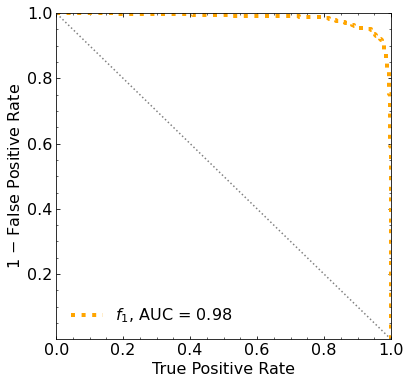

Classification score:


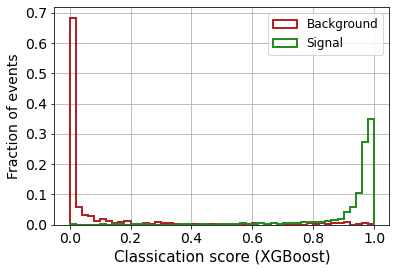


 ROC-AUC =  0.9846806946919878
At least 5 B events per bin, range = [[0, 1]]:
# bins:  8 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  8
range of our data:  [[0, 1]]
number of bins we are going to use:  8
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1965


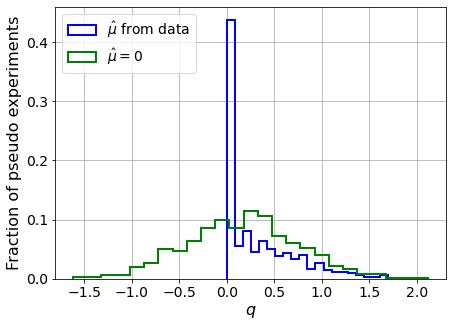

muhat mean:  0.029991846101700668
Z_bins:  0.4241628787464636
std Z_bins:  0.459510739152577
Z_bins mu=0:  0.4241628787464636
std Z_bins mu=0:  0.685242189541773

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.192


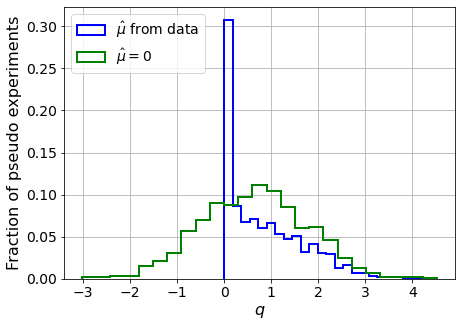

muhat mean:  0.0016024992789384941
Z_bins:  0.8000243127266083
std Z_bins:  0.5211904137375103
Z_bins mu=0:  0.8000243127266083
std Z_bins mu=0:  0.6963872950312441

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2215


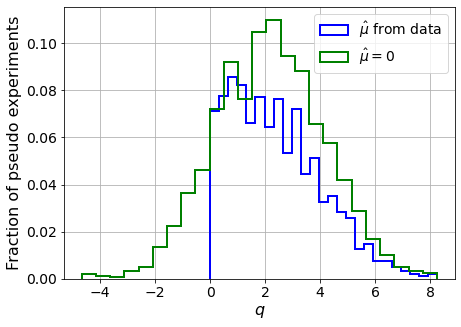

muhat mean:  0.023915085846624114
Z_bins:  1.4788925062743528
std Z_bins:  0.5552085076643418
Z_bins mu=0:  1.478728863044143
std Z_bins mu=0:  0.665985733924518

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2


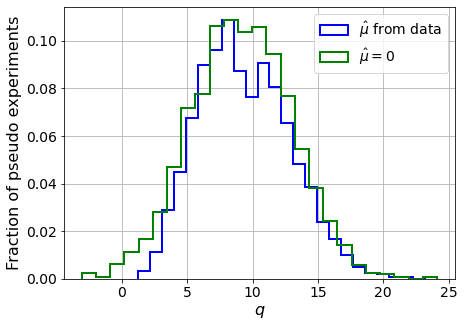

muhat mean:  0.0032722383087399865
Z_bins:  3.0136043179599254
std Z_bins:  0.5775693378840638
Z_bins mu=0:  3.013592889846821
std Z_bins mu=0:  0.6351164167315437

--------

B_expected:  643
S_expected:  39

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2255


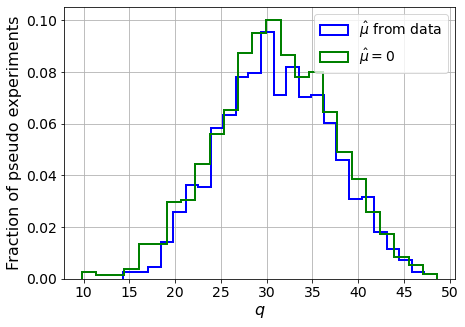

muhat mean:  0.0008603886671112807
Z_bins:  5.554759816761772
std Z_bins:  0.5467411780553484
Z_bins mu=0:  5.554759816761772
std Z_bins mu=0:  0.5802137057962526

--------

B_expected:  643
S_expected:  83

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.194


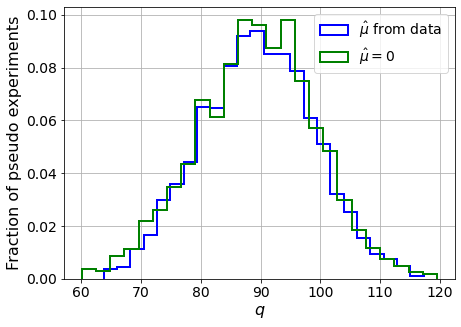

muhat mean:  0.0008861687984981807
Z_bins:  9.462702355974807
std Z_bins:  0.5022389223924957
Z_bins mu=0:  9.462682209615789
std Z_bins mu=0:  0.5223619209829744

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.198


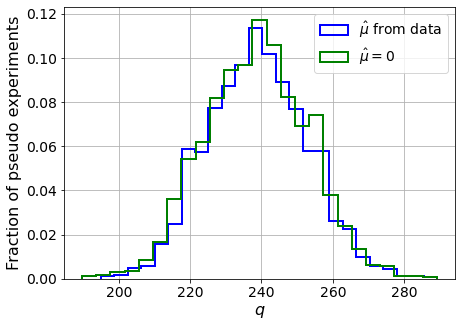

muhat mean:  0.000544750120801446
Z_bins:  15.448359294226206
std Z_bins:  0.4540985145176289
Z_bins mu=0:  15.448359294226206
std Z_bins mu=0:  0.46633017323843173

--------

B_expected:  643
S_expected:  385

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.204


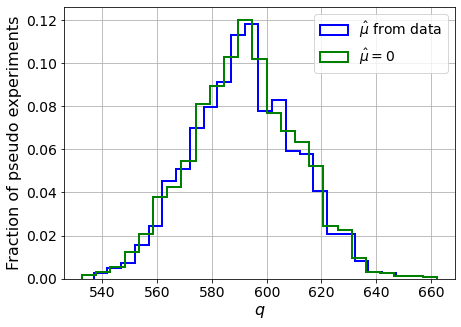

muhat mean:  8.779287861437416e-05
Z_bins:  24.325297722545233
std Z_bins:  0.3936640804508855
Z_bins mu=0:  24.324750040936813
std Z_bins mu=0:  0.40097331761176586

--------

B_expected:  643
S_expected:  830

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1945


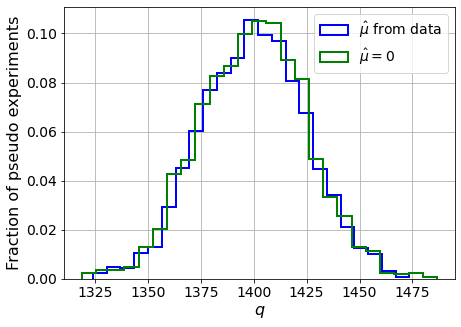

muhat mean:  -3.6502399491303632e-06
Z_bins:  37.42541578813634
std Z_bins:  0.33339360231414084
Z_bins mu=0:  37.42500190908732
std Z_bins mu=0:  0.33813714278142937

--------

B_expected:  643
S_expected:  1787

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.201


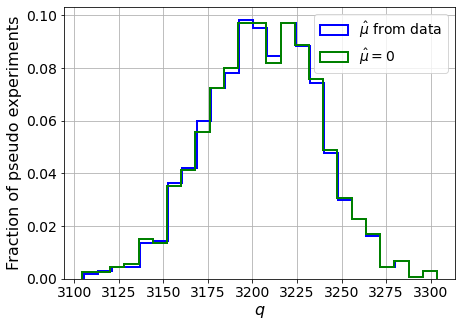

muhat mean:  -0.00011192327007133451
Z_bins:  56.624240314439426
std Z_bins:  0.278376772398822
Z_bins mu=0:  56.62345734261017
std Z_bins mu=0:  0.2809856937612063

--------


 FINAL RESULT:

[[0.4241628787464636, 0.459510739152577, 0.029991846101700668, 0.4241628787464636, 0.685242189541773], [0.8000243127266083, 0.5211904137375103, 0.0016024992789384941, 0.8000243127266083, 0.6963872950312441], [1.4788925062743528, 0.5552085076643418, 0.023915085846624114, 1.478728863044143, 0.665985733924518], [3.0136043179599254, 0.5775693378840638, 0.0032722383087399865, 3.013592889846821, 0.6351164167315437], [5.554759816761772, 0.5467411780553484, 0.0008603886671112807, 5.554759816761772, 0.5802137057962526], [9.462702355974807, 0.5022389223924957, 0.0008861687984981807, 9.462682209615789, 0.5223619209829744], [15.448359294226206, 0.4540985145176289, 0.000544750120801446, 15.448359294226206, 0.46633017323843173], [24.325297722545233, 0.3936640804508855, 8.779287861437416e-05, 24.324750040936813

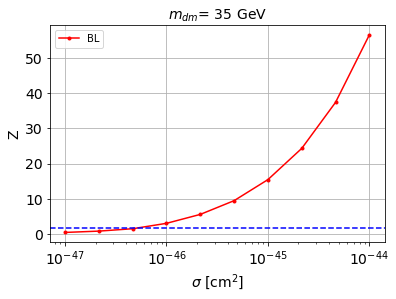


cross_BL_164:  5.179752957115014e-47
cross_BL_164_up:  3.2885862829018165e-47
cross_BL_164_down:  7.105677646218303e-47

#########################


#########################

mDM =  50 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)

B_pbot.shape:  (5000,)


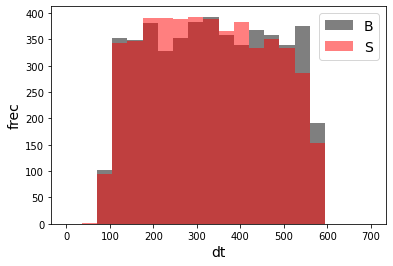

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35235)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35235)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35235)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68559	validation_1-logloss:0.68593
[1]	validation_0-logloss:0.67820	validation_1-logloss:0.67885
[2]	validation_0-logloss:0.67093	validation_1-logloss:0.67192
[3]	validation_0-logloss:0.66382	validation_1-logloss:0.66512
[4]	validation_0-logloss:0.65685	validation_1-logloss:0.65857
[5]	validation_0-logloss:0.65000	validation_1-logloss:0.65208
[6]	validation_0-logloss:0.64326	validation_1-logloss:0.64558
[7]	validation_0-logloss:0.63667	validation_1-logloss:0.63934
[8]	validation_0-logloss:0.63020	validation_1-logloss:0.63322
[9]	validation_0-logloss:0.62384	validation_1-logloss:0.62725
[10]	validation_0-logloss:0.61758	validation_1-logloss:0.62131
[11]	validation_0-logloss:0.61141	validation_1-logloss:0.61535
[12]	validation_0-logloss:0.60534	validation_1-logloss:0.60967
[13]	validation_0-logloss:0.59937	validation_1-logloss:0.60406
[14]	validation_0-logloss:0.59354	validation_1-logloss:0.59856
[15]	validation_0-logloss:0.58779	validation_1-logloss:0.59314
[1

[130]	validation_0-logloss:0.25753	validation_1-logloss:0.29801
[131]	validation_0-logloss:0.25617	validation_1-logloss:0.29690
[132]	validation_0-logloss:0.25484	validation_1-logloss:0.29580
[133]	validation_0-logloss:0.25351	validation_1-logloss:0.29474
[134]	validation_0-logloss:0.25222	validation_1-logloss:0.29380
[135]	validation_0-logloss:0.25077	validation_1-logloss:0.29260
[136]	validation_0-logloss:0.24950	validation_1-logloss:0.29163
[137]	validation_0-logloss:0.24824	validation_1-logloss:0.29063
[138]	validation_0-logloss:0.24698	validation_1-logloss:0.28971
[139]	validation_0-logloss:0.24573	validation_1-logloss:0.28881
[140]	validation_0-logloss:0.24438	validation_1-logloss:0.28765
[141]	validation_0-logloss:0.24304	validation_1-logloss:0.28656
[142]	validation_0-logloss:0.24184	validation_1-logloss:0.28562
[143]	validation_0-logloss:0.24053	validation_1-logloss:0.28457
[144]	validation_0-logloss:0.23926	validation_1-logloss:0.28357
[145]	validation_0-logloss:0.23810	valid

[259]	validation_0-logloss:0.14945	validation_1-logloss:0.22055
[260]	validation_0-logloss:0.14899	validation_1-logloss:0.22021
[261]	validation_0-logloss:0.14850	validation_1-logloss:0.21998
[262]	validation_0-logloss:0.14803	validation_1-logloss:0.21966
[263]	validation_0-logloss:0.14756	validation_1-logloss:0.21933
[264]	validation_0-logloss:0.14712	validation_1-logloss:0.21913
[265]	validation_0-logloss:0.14667	validation_1-logloss:0.21891
[266]	validation_0-logloss:0.14618	validation_1-logloss:0.21865
[267]	validation_0-logloss:0.14575	validation_1-logloss:0.21839
[268]	validation_0-logloss:0.14526	validation_1-logloss:0.21804
[269]	validation_0-logloss:0.14484	validation_1-logloss:0.21778
[270]	validation_0-logloss:0.14441	validation_1-logloss:0.21748
[271]	validation_0-logloss:0.14396	validation_1-logloss:0.21724
[272]	validation_0-logloss:0.14353	validation_1-logloss:0.21708
[273]	validation_0-logloss:0.14311	validation_1-logloss:0.21682
[274]	validation_0-logloss:0.14270	valid

[388]	validation_0-logloss:0.10534	validation_1-logloss:0.20056
[389]	validation_0-logloss:0.10515	validation_1-logloss:0.20050
[390]	validation_0-logloss:0.10496	validation_1-logloss:0.20037
[391]	validation_0-logloss:0.10469	validation_1-logloss:0.20033
[392]	validation_0-logloss:0.10440	validation_1-logloss:0.20014
[393]	validation_0-logloss:0.10417	validation_1-logloss:0.20007
[394]	validation_0-logloss:0.10391	validation_1-logloss:0.19997
[395]	validation_0-logloss:0.10373	validation_1-logloss:0.19997
[396]	validation_0-logloss:0.10343	validation_1-logloss:0.19989
[397]	validation_0-logloss:0.10320	validation_1-logloss:0.19986
[398]	validation_0-logloss:0.10301	validation_1-logloss:0.19981
[399]	validation_0-logloss:0.10275	validation_1-logloss:0.19978
[400]	validation_0-logloss:0.10245	validation_1-logloss:0.19968
[401]	validation_0-logloss:0.10227	validation_1-logloss:0.19957
[402]	validation_0-logloss:0.10203	validation_1-logloss:0.19953
[403]	validation_0-logloss:0.10185	valid

[517]	validation_0-logloss:0.07900	validation_1-logloss:0.19295
[518]	validation_0-logloss:0.07888	validation_1-logloss:0.19293
[519]	validation_0-logloss:0.07868	validation_1-logloss:0.19285
[520]	validation_0-logloss:0.07851	validation_1-logloss:0.19285
[521]	validation_0-logloss:0.07835	validation_1-logloss:0.19282
[522]	validation_0-logloss:0.07820	validation_1-logloss:0.19275
[523]	validation_0-logloss:0.07806	validation_1-logloss:0.19271
[524]	validation_0-logloss:0.07789	validation_1-logloss:0.19268
[525]	validation_0-logloss:0.07774	validation_1-logloss:0.19262
[526]	validation_0-logloss:0.07755	validation_1-logloss:0.19257
[527]	validation_0-logloss:0.07739	validation_1-logloss:0.19256
[528]	validation_0-logloss:0.07726	validation_1-logloss:0.19251
[529]	validation_0-logloss:0.07710	validation_1-logloss:0.19246
[530]	validation_0-logloss:0.07695	validation_1-logloss:0.19247
[531]	validation_0-logloss:0.07673	validation_1-logloss:0.19250
[532]	validation_0-logloss:0.07658	valid

[646]	validation_0-logloss:0.06181	validation_1-logloss:0.18981
[647]	validation_0-logloss:0.06174	validation_1-logloss:0.18980
[648]	validation_0-logloss:0.06159	validation_1-logloss:0.18985
[649]	validation_0-logloss:0.06151	validation_1-logloss:0.18988
[650]	validation_0-logloss:0.06143	validation_1-logloss:0.18988
[651]	validation_0-logloss:0.06133	validation_1-logloss:0.18990
[652]	validation_0-logloss:0.06123	validation_1-logloss:0.18984
[653]	validation_0-logloss:0.06111	validation_1-logloss:0.18980
[654]	validation_0-logloss:0.06101	validation_1-logloss:0.18984
[655]	validation_0-logloss:0.06089	validation_1-logloss:0.18980
[656]	validation_0-logloss:0.06074	validation_1-logloss:0.18975
[657]	validation_0-logloss:0.06061	validation_1-logloss:0.18977
[658]	validation_0-logloss:0.06051	validation_1-logloss:0.18975
[659]	validation_0-logloss:0.06039	validation_1-logloss:0.18974
[660]	validation_0-logloss:0.06031	validation_1-logloss:0.18972
[661]	validation_0-logloss:0.06021	valid

[775]	validation_0-logloss:0.04934	validation_1-logloss:0.18757
[776]	validation_0-logloss:0.04926	validation_1-logloss:0.18757
[777]	validation_0-logloss:0.04915	validation_1-logloss:0.18756
[778]	validation_0-logloss:0.04909	validation_1-logloss:0.18751
[779]	validation_0-logloss:0.04901	validation_1-logloss:0.18749
[780]	validation_0-logloss:0.04895	validation_1-logloss:0.18748
[781]	validation_0-logloss:0.04885	validation_1-logloss:0.18746
[782]	validation_0-logloss:0.04882	validation_1-logloss:0.18743
[783]	validation_0-logloss:0.04874	validation_1-logloss:0.18748
[784]	validation_0-logloss:0.04862	validation_1-logloss:0.18751
[785]	validation_0-logloss:0.04856	validation_1-logloss:0.18747
[786]	validation_0-logloss:0.04848	validation_1-logloss:0.18749
[787]	validation_0-logloss:0.04840	validation_1-logloss:0.18748
[788]	validation_0-logloss:0.04829	validation_1-logloss:0.18753
[789]	validation_0-logloss:0.04817	validation_1-logloss:0.18754
[790]	validation_0-logloss:0.04810	valid

[904]	validation_0-logloss:0.04042	validation_1-logloss:0.18667
[905]	validation_0-logloss:0.04037	validation_1-logloss:0.18667
[906]	validation_0-logloss:0.04034	validation_1-logloss:0.18667
[907]	validation_0-logloss:0.04027	validation_1-logloss:0.18667
[908]	validation_0-logloss:0.04021	validation_1-logloss:0.18671
[909]	validation_0-logloss:0.04017	validation_1-logloss:0.18668
[910]	validation_0-logloss:0.04010	validation_1-logloss:0.18668
[911]	validation_0-logloss:0.04007	validation_1-logloss:0.18666
[912]	validation_0-logloss:0.03997	validation_1-logloss:0.18666
[913]	validation_0-logloss:0.03991	validation_1-logloss:0.18664
[914]	validation_0-logloss:0.03984	validation_1-logloss:0.18666
[915]	validation_0-logloss:0.03979	validation_1-logloss:0.18666
[916]	validation_0-logloss:0.03975	validation_1-logloss:0.18669
[917]	validation_0-logloss:0.03970	validation_1-logloss:0.18669
[918]	validation_0-logloss:0.03963	validation_1-logloss:0.18670
[919]	validation_0-logloss:0.03954	valid

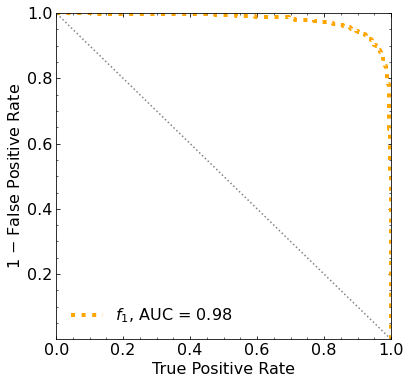

Classification score:


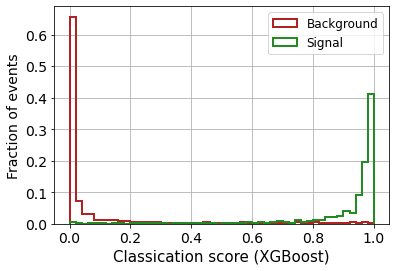


 ROC-AUC =  0.9789336344826173
At least 5 B events per bin, range = [[0, 1]]:
# bins:  13 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  13
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0615


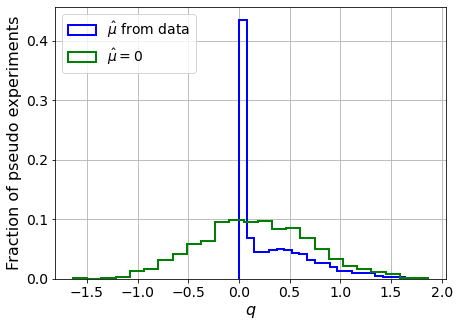

muhat mean:  -0.035627554854483934
Z_bins:  0.3742680947844086
std Z_bins:  0.5061468138889815
Z_bins mu=0:  0.3734629641450993
std Z_bins mu=0:  0.7373740270539869

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.057


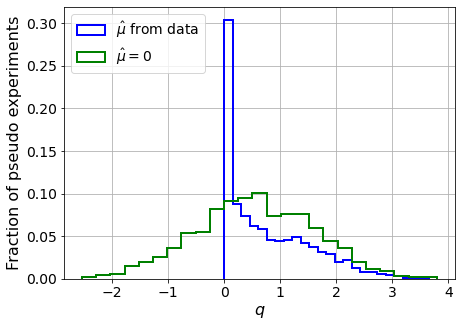

muhat mean:  0.021829812003926943
Z_bins:  0.7343983250216882
std Z_bins:  0.5298022121706807
Z_bins mu=0:  0.7341480455771441
std Z_bins mu=0:  0.7212389454212275

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0645


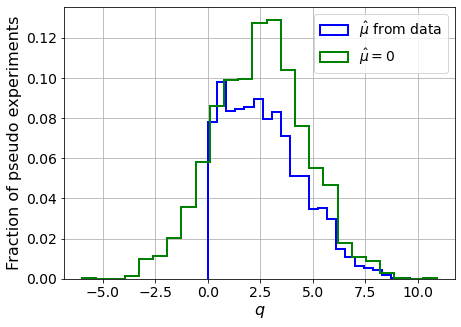

muhat mean:  0.010834373405734173
Z_bins:  1.5891132077615655
std Z_bins:  0.5760660329325802
Z_bins mu=0:  1.5891131600234072
std Z_bins mu=0:  0.6897954476636503

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0595


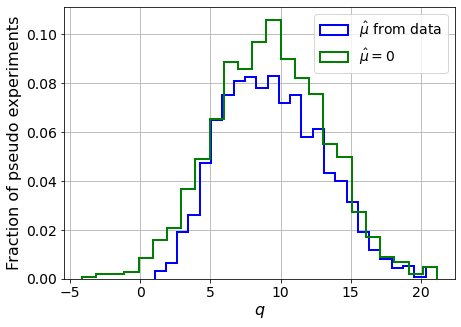

muhat mean:  -0.002384681808806595
Z_bins:  3.0412878453147343
std Z_bins:  0.5925506939910037
Z_bins mu=0:  3.0412878453147343
std Z_bins mu=0:  0.6509933089494179

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0495


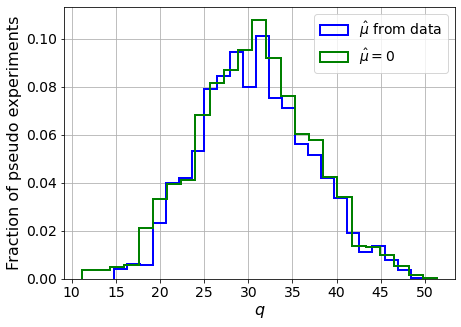

muhat mean:  0.00025564350111007054
Z_bins:  5.542788829665685
std Z_bins:  0.5618554580387033
Z_bins mu=0:  5.542253578034095
std Z_bins mu=0:  0.5941089485461587

--------

B_expected:  643
S_expected:  89

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.055


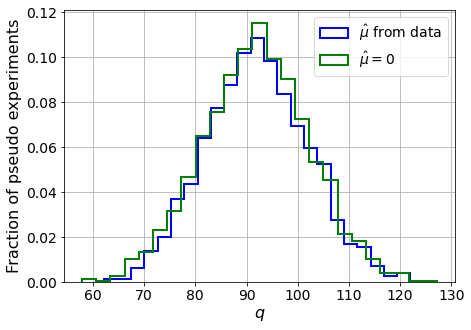

muhat mean:  -0.0006597418156225987
Z_bins:  9.5845262150518
std Z_bins:  0.5203458893912042
Z_bins mu=0:  9.584159125749053
std Z_bins mu=0:  0.5395621460028244

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.065


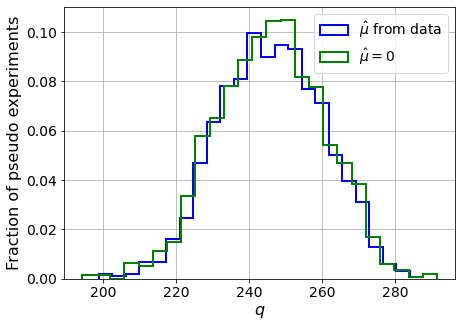

muhat mean:  0.0006826342803076034
Z_bins:  15.691749162117617
std Z_bins:  0.4558573253507358
Z_bins mu=0:  15.690901276103125
std Z_bins mu=0:  0.46815317182130517

--------

B_expected:  643
S_expected:  413

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.063


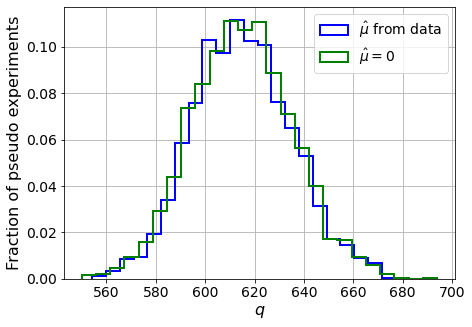

muhat mean:  0.0002136375479074206
Z_bins:  24.79397844083632
std Z_bins:  0.40443173135974697
Z_bins mu=0:  24.793427268615638
std Z_bins mu=0:  0.41119216915490203

--------

B_expected:  643
S_expected:  889

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0655


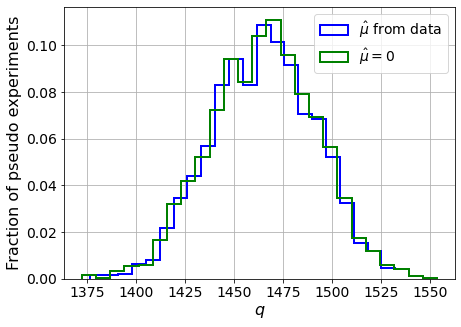

muhat mean:  0.00010319348286576895
Z_bins:  38.28583330409632
std Z_bins:  0.34986380692511704
Z_bins mu=0:  38.28510376157894
std Z_bins mu=0:  0.35440581764685414

--------

B_expected:  643
S_expected:  1915

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.051


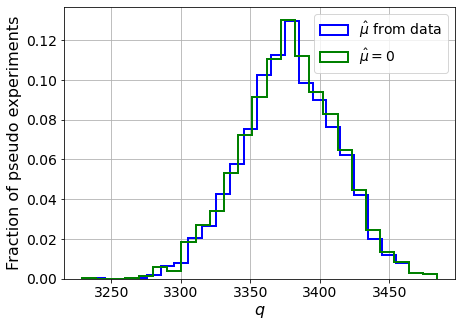

muhat mean:  3.387893366658199e-05
Z_bins:  58.120962468663436
std Z_bins:  0.296661868393412
Z_bins mu=0:  58.120962468663436
std Z_bins mu=0:  0.29954616428365066

--------


 FINAL RESULT:

[[0.3742680947844086, 0.5061468138889815, -0.035627554854483934, 0.3734629641450993, 0.7373740270539869], [0.7343983250216882, 0.5298022121706807, 0.021829812003926943, 0.7341480455771441, 0.7212389454212275], [1.5891132077615655, 0.5760660329325802, 0.010834373405734173, 1.5891131600234072, 0.6897954476636503], [3.0412878453147343, 0.5925506939910037, -0.002384681808806595, 3.0412878453147343, 0.6509933089494179], [5.542788829665685, 0.5618554580387033, 0.00025564350111007054, 5.542253578034095, 0.5941089485461587], [9.5845262150518, 0.5203458893912042, -0.0006597418156225987, 9.584159125749053, 0.5395621460028244], [15.691749162117617, 0.4558573253507358, 0.0006826342803076034, 15.690901276103125, 0.46815317182130517], [24.79397844083632, 0.40443173135974697, 0.0002136375479074206, 24.793427268

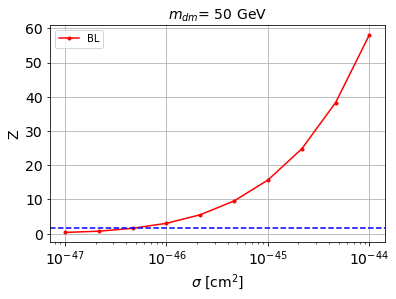


cross_BL_164:  4.804769839820462e-47
cross_BL_164_up:  3.1335089054421644e-47
cross_BL_164_down:  6.867837847814192e-47

#########################


#########################

mDM =  100 GeV


max_pS1_both lenght:  153

X_mon1_train :  (6375, 153)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 153)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 153)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)

B_pbot.shape:  (5000,)

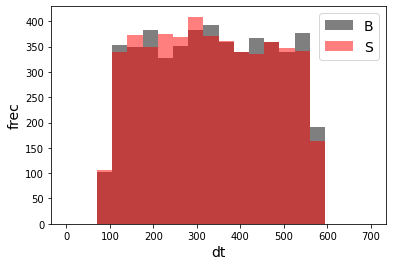

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35236)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35236)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35236)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68607	validation_1-logloss:0.68664
[1]	validation_0-logloss:0.67913	validation_1-logloss:0.68018
[2]	validation_0-logloss:0.67235	validation_1-logloss:0.67398
[3]	validation_0-logloss:0.66568	validation_1-logloss:0.66780
[4]	validation_0-logloss:0.65914	validation_1-logloss:0.66180
[5]	validation_0-logloss:0.65272	validation_1-logloss:0.65580
[6]	validation_0-logloss:0.64639	validation_1-logloss:0.64998
[7]	validation_0-logloss:0.64022	validation_1-logloss:0.64414
[8]	validation_0-logloss:0.63411	validation_1-logloss:0.63853
[9]	validation_0-logloss:0.62813	validation_1-logloss:0.63306
[10]	validation_0-logloss:0.62227	validation_1-logloss:0.62757
[11]	validation_0-logloss:0.61645	validation_1-logloss:0.62222
[12]	validation_0-logloss:0.61076	validation_1-logloss:0.61699
[13]	validation_0-logloss:0.60513	validation_1-logloss:0.61176
[14]	validation_0-logloss:0.59961	validation_1-logloss:0.60667
[15]	validation_0-logloss:0.59429	validation_1-logloss:0.60169
[1

[130]	validation_0-logloss:0.28111	validation_1-logloss:0.32648
[131]	validation_0-logloss:0.27982	validation_1-logloss:0.32550
[132]	validation_0-logloss:0.27855	validation_1-logloss:0.32444
[133]	validation_0-logloss:0.27729	validation_1-logloss:0.32342
[134]	validation_0-logloss:0.27600	validation_1-logloss:0.32240
[135]	validation_0-logloss:0.27480	validation_1-logloss:0.32138
[136]	validation_0-logloss:0.27342	validation_1-logloss:0.32022
[137]	validation_0-logloss:0.27211	validation_1-logloss:0.31918
[138]	validation_0-logloss:0.27083	validation_1-logloss:0.31810
[139]	validation_0-logloss:0.26949	validation_1-logloss:0.31697
[140]	validation_0-logloss:0.26824	validation_1-logloss:0.31588
[141]	validation_0-logloss:0.26692	validation_1-logloss:0.31480
[142]	validation_0-logloss:0.26573	validation_1-logloss:0.31387
[143]	validation_0-logloss:0.26454	validation_1-logloss:0.31280
[144]	validation_0-logloss:0.26329	validation_1-logloss:0.31181
[145]	validation_0-logloss:0.26207	valid

[259]	validation_0-logloss:0.17368	validation_1-logloss:0.24640
[260]	validation_0-logloss:0.17321	validation_1-logloss:0.24605
[261]	validation_0-logloss:0.17274	validation_1-logloss:0.24586
[262]	validation_0-logloss:0.17223	validation_1-logloss:0.24549
[263]	validation_0-logloss:0.17165	validation_1-logloss:0.24512
[264]	validation_0-logloss:0.17119	validation_1-logloss:0.24487
[265]	validation_0-logloss:0.17066	validation_1-logloss:0.24457
[266]	validation_0-logloss:0.17013	validation_1-logloss:0.24421
[267]	validation_0-logloss:0.16970	validation_1-logloss:0.24396
[268]	validation_0-logloss:0.16921	validation_1-logloss:0.24381
[269]	validation_0-logloss:0.16874	validation_1-logloss:0.24358
[270]	validation_0-logloss:0.16821	validation_1-logloss:0.24331
[271]	validation_0-logloss:0.16772	validation_1-logloss:0.24310
[272]	validation_0-logloss:0.16727	validation_1-logloss:0.24282
[273]	validation_0-logloss:0.16679	validation_1-logloss:0.24248
[274]	validation_0-logloss:0.16633	valid

[388]	validation_0-logloss:0.12545	validation_1-logloss:0.22411
[389]	validation_0-logloss:0.12514	validation_1-logloss:0.22406
[390]	validation_0-logloss:0.12488	validation_1-logloss:0.22398
[391]	validation_0-logloss:0.12463	validation_1-logloss:0.22391
[392]	validation_0-logloss:0.12427	validation_1-logloss:0.22375
[393]	validation_0-logloss:0.12401	validation_1-logloss:0.22375
[394]	validation_0-logloss:0.12371	validation_1-logloss:0.22361
[395]	validation_0-logloss:0.12342	validation_1-logloss:0.22353
[396]	validation_0-logloss:0.12317	validation_1-logloss:0.22344
[397]	validation_0-logloss:0.12283	validation_1-logloss:0.22331
[398]	validation_0-logloss:0.12259	validation_1-logloss:0.22323
[399]	validation_0-logloss:0.12238	validation_1-logloss:0.22311
[400]	validation_0-logloss:0.12208	validation_1-logloss:0.22300
[401]	validation_0-logloss:0.12178	validation_1-logloss:0.22295
[402]	validation_0-logloss:0.12154	validation_1-logloss:0.22294
[403]	validation_0-logloss:0.12124	valid

[517]	validation_0-logloss:0.09648	validation_1-logloss:0.21524
[518]	validation_0-logloss:0.09633	validation_1-logloss:0.21510
[519]	validation_0-logloss:0.09620	validation_1-logloss:0.21497
[520]	validation_0-logloss:0.09604	validation_1-logloss:0.21493
[521]	validation_0-logloss:0.09582	validation_1-logloss:0.21493
[522]	validation_0-logloss:0.09561	validation_1-logloss:0.21482
[523]	validation_0-logloss:0.09545	validation_1-logloss:0.21476
[524]	validation_0-logloss:0.09524	validation_1-logloss:0.21463
[525]	validation_0-logloss:0.09500	validation_1-logloss:0.21459
[526]	validation_0-logloss:0.09487	validation_1-logloss:0.21459
[527]	validation_0-logloss:0.09467	validation_1-logloss:0.21452
[528]	validation_0-logloss:0.09444	validation_1-logloss:0.21449
[529]	validation_0-logloss:0.09431	validation_1-logloss:0.21438
[530]	validation_0-logloss:0.09410	validation_1-logloss:0.21435
[531]	validation_0-logloss:0.09394	validation_1-logloss:0.21441
[532]	validation_0-logloss:0.09379	valid

[646]	validation_0-logloss:0.07716	validation_1-logloss:0.21071
[647]	validation_0-logloss:0.07705	validation_1-logloss:0.21068
[648]	validation_0-logloss:0.07697	validation_1-logloss:0.21071
[649]	validation_0-logloss:0.07687	validation_1-logloss:0.21068
[650]	validation_0-logloss:0.07668	validation_1-logloss:0.21066
[651]	validation_0-logloss:0.07654	validation_1-logloss:0.21065
[652]	validation_0-logloss:0.07640	validation_1-logloss:0.21063
[653]	validation_0-logloss:0.07629	validation_1-logloss:0.21064
[654]	validation_0-logloss:0.07620	validation_1-logloss:0.21070
[655]	validation_0-logloss:0.07611	validation_1-logloss:0.21071
[656]	validation_0-logloss:0.07601	validation_1-logloss:0.21064
[657]	validation_0-logloss:0.07592	validation_1-logloss:0.21060
[658]	validation_0-logloss:0.07578	validation_1-logloss:0.21051
[659]	validation_0-logloss:0.07570	validation_1-logloss:0.21054
[660]	validation_0-logloss:0.07553	validation_1-logloss:0.21051
[661]	validation_0-logloss:0.07542	valid

[775]	validation_0-logloss:0.06293	validation_1-logloss:0.20851
[776]	validation_0-logloss:0.06279	validation_1-logloss:0.20851
[777]	validation_0-logloss:0.06272	validation_1-logloss:0.20853
[778]	validation_0-logloss:0.06264	validation_1-logloss:0.20852
[779]	validation_0-logloss:0.06257	validation_1-logloss:0.20850
[780]	validation_0-logloss:0.06245	validation_1-logloss:0.20842
[781]	validation_0-logloss:0.06237	validation_1-logloss:0.20841
[782]	validation_0-logloss:0.06226	validation_1-logloss:0.20839
[783]	validation_0-logloss:0.06213	validation_1-logloss:0.20830
[784]	validation_0-logloss:0.06205	validation_1-logloss:0.20832
[785]	validation_0-logloss:0.06195	validation_1-logloss:0.20826
[786]	validation_0-logloss:0.06184	validation_1-logloss:0.20830
[787]	validation_0-logloss:0.06174	validation_1-logloss:0.20831
[788]	validation_0-logloss:0.06167	validation_1-logloss:0.20829
[789]	validation_0-logloss:0.06161	validation_1-logloss:0.20827
[790]	validation_0-logloss:0.06152	valid

[904]	validation_0-logloss:0.05178	validation_1-logloss:0.20712
[905]	validation_0-logloss:0.05171	validation_1-logloss:0.20713
[906]	validation_0-logloss:0.05168	validation_1-logloss:0.20713
[907]	validation_0-logloss:0.05159	validation_1-logloss:0.20718
[908]	validation_0-logloss:0.05154	validation_1-logloss:0.20717
[909]	validation_0-logloss:0.05146	validation_1-logloss:0.20716
[910]	validation_0-logloss:0.05142	validation_1-logloss:0.20717
[911]	validation_0-logloss:0.05136	validation_1-logloss:0.20723
[912]	validation_0-logloss:0.05128	validation_1-logloss:0.20731
[913]	validation_0-logloss:0.05119	validation_1-logloss:0.20726
[914]	validation_0-logloss:0.05115	validation_1-logloss:0.20724
[915]	validation_0-logloss:0.05103	validation_1-logloss:0.20726
[916]	validation_0-logloss:0.05095	validation_1-logloss:0.20722
[917]	validation_0-logloss:0.05088	validation_1-logloss:0.20719
[918]	validation_0-logloss:0.05079	validation_1-logloss:0.20722
[919]	validation_0-logloss:0.05075	valid

[1032]	validation_0-logloss:0.04322	validation_1-logloss:0.20721
[1033]	validation_0-logloss:0.04316	validation_1-logloss:0.20713
[1034]	validation_0-logloss:0.04306	validation_1-logloss:0.20714
[1035]	validation_0-logloss:0.04301	validation_1-logloss:0.20719
[1036]	validation_0-logloss:0.04292	validation_1-logloss:0.20722
[1037]	validation_0-logloss:0.04283	validation_1-logloss:0.20721
[1038]	validation_0-logloss:0.04277	validation_1-logloss:0.20718
[1039]	validation_0-logloss:0.04271	validation_1-logloss:0.20718
[1040]	validation_0-logloss:0.04266	validation_1-logloss:0.20721
[1041]	validation_0-logloss:0.04260	validation_1-logloss:0.20720
[1042]	validation_0-logloss:0.04254	validation_1-logloss:0.20714
[1043]	validation_0-logloss:0.04248	validation_1-logloss:0.20711
[1044]	validation_0-logloss:0.04244	validation_1-logloss:0.20712
[1045]	validation_0-logloss:0.04238	validation_1-logloss:0.20709
[1046]	validation_0-logloss:0.04233	validation_1-logloss:0.20708
[1047]	validation_0-loglo

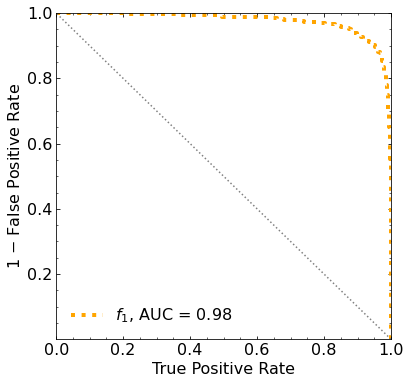

Classification score:


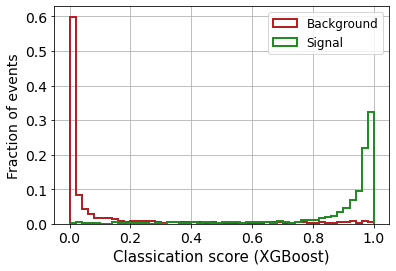


 ROC-AUC =  0.9757620920656382
At least 5 B events per bin, range = [[0, 1]]:
# bins:  9 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  9
range of our data:  [[0, 1]]
number of bins we are going to use:  9
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0275


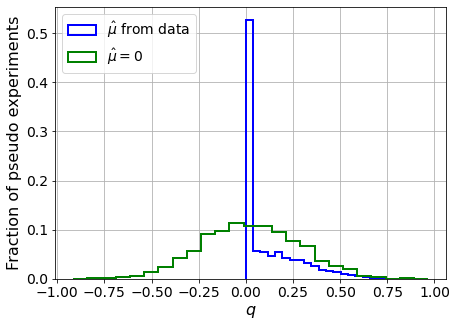

muhat mean:  0.11797020526911252
Z_bins:  0.14885314710374628
std Z_bins:  0.5437216826019232
Z_bins mu=0:  0.14462631515076307
std Z_bins mu=0:  0.8991838925476119

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0255


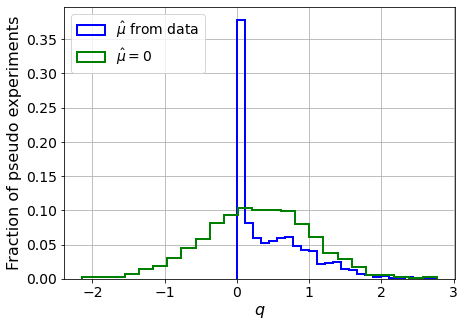

muhat mean:  -0.018374297513796416
Z_bins:  0.5411691940845244
std Z_bins:  0.47713916196382056
Z_bins mu=0:  0.5411691940845244
std Z_bins mu=0:  0.68124058383433

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.029


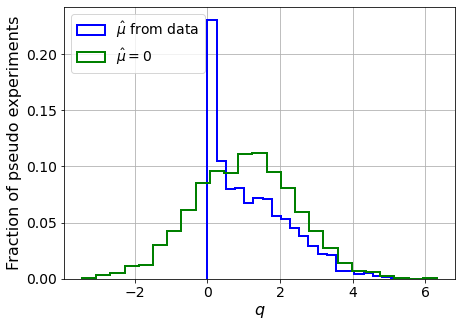

muhat mean:  0.012947019028484885
Z_bins:  1.0099854983380765
std Z_bins:  0.5386785217842653
Z_bins mu=0:  1.0097805695009796
std Z_bins mu=0:  0.6938623583718813

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0255


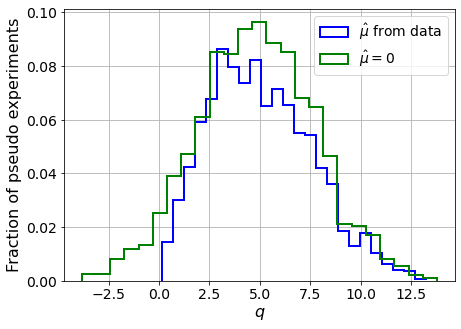

muhat mean:  0.002757541570915641
Z_bins:  2.186813840954728
std Z_bins:  0.5815533416668505
Z_bins mu=0:  2.186408143197079
std Z_bins mu=0:  0.6604650769990918

--------

B_expected:  643
S_expected:  30

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.021


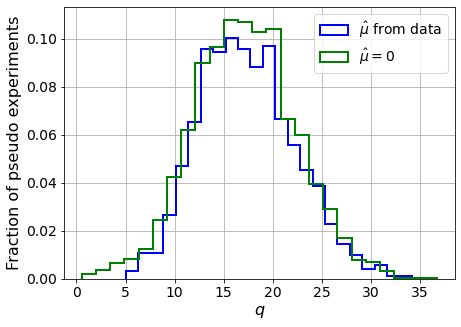

muhat mean:  0.003062855914120796
Z_bins:  4.128771076543837
std Z_bins:  0.587643745355537
Z_bins mu=0:  4.128637364204044
std Z_bins mu=0:  0.6316992853156249

--------

B_expected:  643
S_expected:  65

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0245


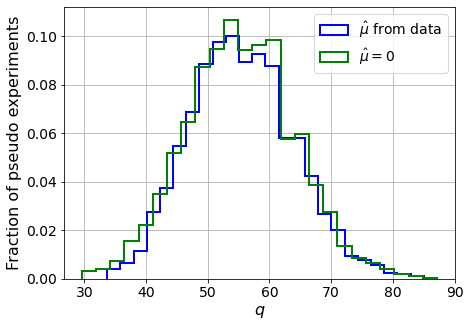

muhat mean:  0.0020418572871329275
Z_bins:  7.4277961520884555
std Z_bins:  0.5665149471985331
Z_bins mu=0:  7.427386886909906
std Z_bins mu=0:  0.5923670815692262

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.036


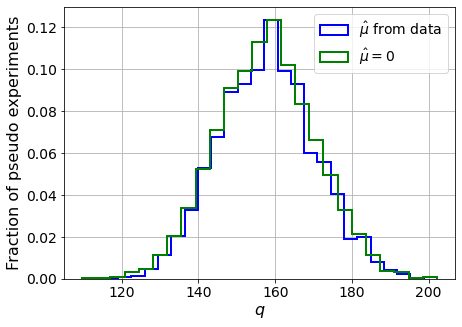

muhat mean:  -0.001163039474547444
Z_bins:  12.557031633791807
std Z_bins:  0.49556166880908353
Z_bins mu=0:  12.55674550248421
std Z_bins mu=0:  0.5095236665256645

--------

B_expected:  643
S_expected:  300

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.027


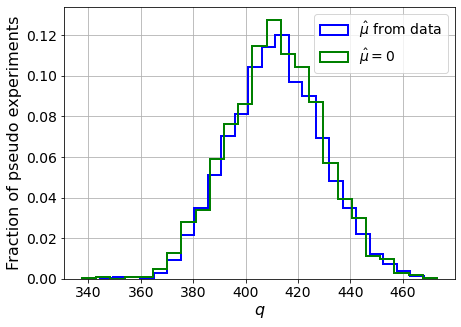

muhat mean:  -9.626895700957144e-05
Z_bins:  20.28686809248412
std Z_bins:  0.439055543019737
Z_bins mu=0:  20.286718427975604
std Z_bins mu=0:  0.44807150575825955

--------

B_expected:  643
S_expected:  645

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.025


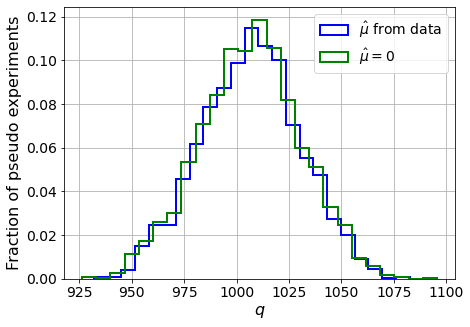

muhat mean:  3.3773872492903273e-05
Z_bins:  31.735491918065073
std Z_bins:  0.3758353286173539
Z_bins mu=0:  31.73546081616488
std Z_bins mu=0:  0.3814710106834721

--------

B_expected:  643
S_expected:  1390

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.026


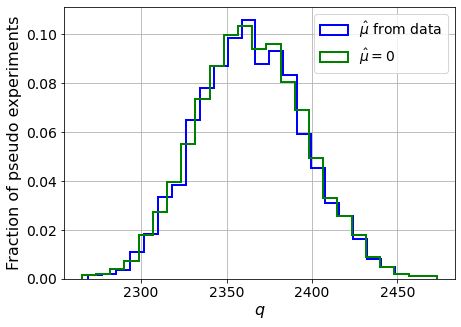

muhat mean:  5.390412832939112e-05
Z_bins:  48.61607932816913
std Z_bins:  0.3240263325718754
Z_bins mu=0:  48.615986125850924
std Z_bins mu=0:  0.3272859882112895

--------


 FINAL RESULT:

[[0.14885314710374628, 0.5437216826019232, 0.11797020526911252, 0.14462631515076307, 0.8991838925476119], [0.5411691940845244, 0.47713916196382056, -0.018374297513796416, 0.5411691940845244, 0.68124058383433], [1.0099854983380765, 0.5386785217842653, 0.012947019028484885, 1.0097805695009796, 0.6938623583718813], [2.186813840954728, 0.5815533416668505, 0.002757541570915641, 2.186408143197079, 0.6604650769990918], [4.128771076543837, 0.587643745355537, 0.003062855914120796, 4.128637364204044, 0.6316992853156249], [7.4277961520884555, 0.5665149471985331, 0.0020418572871329275, 7.427386886909906, 0.5923670815692262], [12.557031633791807, 0.49556166880908353, -0.001163039474547444, 12.55674550248421, 0.5095236665256645], [20.28686809248412, 0.439055543019737, -9.626895700957144e-05, 20.286718427975604,

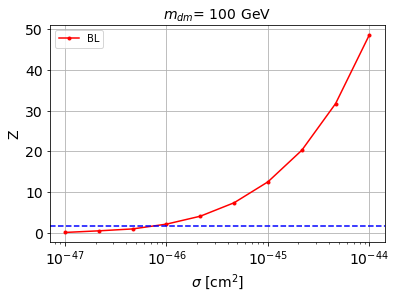


cross_BL_164:  7.406450732790156e-47
cross_BL_164_up:  5.023885058131011e-47
cross_BL_164_down:  1.0178251070693537e-46

#########################


#########################

mDM =  200 GeV


max_pS1_both lenght:  157

X_mon1_train :  (6375, 157)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 157)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 157)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)

B_pbot.shape:  (5000,)

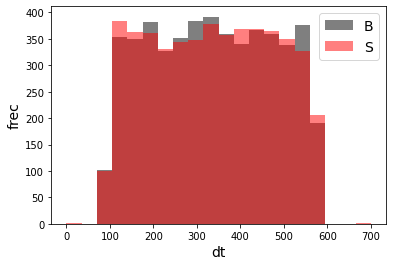

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35240)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35240)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35240)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68632	validation_1-logloss:0.68709
[1]	validation_0-logloss:0.67964	validation_1-logloss:0.68114
[2]	validation_0-logloss:0.67307	validation_1-logloss:0.67523
[3]	validation_0-logloss:0.66661	validation_1-logloss:0.66929
[4]	validation_0-logloss:0.66030	validation_1-logloss:0.66367
[5]	validation_0-logloss:0.65411	validation_1-logloss:0.65789
[6]	validation_0-logloss:0.64797	validation_1-logloss:0.65236
[7]	validation_0-logloss:0.64192	validation_1-logloss:0.64681
[8]	validation_0-logloss:0.63603	validation_1-logloss:0.64147
[9]	validation_0-logloss:0.63020	validation_1-logloss:0.63623
[10]	validation_0-logloss:0.62449	validation_1-logloss:0.63109
[11]	validation_0-logloss:0.61881	validation_1-logloss:0.62596
[12]	validation_0-logloss:0.61333	validation_1-logloss:0.62105
[13]	validation_0-logloss:0.60784	validation_1-logloss:0.61600
[14]	validation_0-logloss:0.60255	validation_1-logloss:0.61126
[15]	validation_0-logloss:0.59727	validation_1-logloss:0.60651
[1

[130]	validation_0-logloss:0.28841	validation_1-logloss:0.34446
[131]	validation_0-logloss:0.28708	validation_1-logloss:0.34342
[132]	validation_0-logloss:0.28580	validation_1-logloss:0.34250
[133]	validation_0-logloss:0.28455	validation_1-logloss:0.34164
[134]	validation_0-logloss:0.28325	validation_1-logloss:0.34060
[135]	validation_0-logloss:0.28203	validation_1-logloss:0.33974
[136]	validation_0-logloss:0.28081	validation_1-logloss:0.33884
[137]	validation_0-logloss:0.27951	validation_1-logloss:0.33777
[138]	validation_0-logloss:0.27832	validation_1-logloss:0.33693
[139]	validation_0-logloss:0.27713	validation_1-logloss:0.33603
[140]	validation_0-logloss:0.27582	validation_1-logloss:0.33502
[141]	validation_0-logloss:0.27465	validation_1-logloss:0.33416
[142]	validation_0-logloss:0.27339	validation_1-logloss:0.33323
[143]	validation_0-logloss:0.27226	validation_1-logloss:0.33245
[144]	validation_0-logloss:0.27103	validation_1-logloss:0.33163
[145]	validation_0-logloss:0.26979	valid

[259]	validation_0-logloss:0.18072	validation_1-logloss:0.26855
[260]	validation_0-logloss:0.18025	validation_1-logloss:0.26827
[261]	validation_0-logloss:0.17976	validation_1-logloss:0.26797
[262]	validation_0-logloss:0.17931	validation_1-logloss:0.26774
[263]	validation_0-logloss:0.17882	validation_1-logloss:0.26749
[264]	validation_0-logloss:0.17835	validation_1-logloss:0.26724
[265]	validation_0-logloss:0.17786	validation_1-logloss:0.26701
[266]	validation_0-logloss:0.17739	validation_1-logloss:0.26674
[267]	validation_0-logloss:0.17691	validation_1-logloss:0.26653
[268]	validation_0-logloss:0.17642	validation_1-logloss:0.26620
[269]	validation_0-logloss:0.17590	validation_1-logloss:0.26591
[270]	validation_0-logloss:0.17544	validation_1-logloss:0.26575
[271]	validation_0-logloss:0.17492	validation_1-logloss:0.26545
[272]	validation_0-logloss:0.17444	validation_1-logloss:0.26521
[273]	validation_0-logloss:0.17399	validation_1-logloss:0.26498
[274]	validation_0-logloss:0.17353	valid

[388]	validation_0-logloss:0.13143	validation_1-logloss:0.24606
[389]	validation_0-logloss:0.13112	validation_1-logloss:0.24589
[390]	validation_0-logloss:0.13084	validation_1-logloss:0.24567
[391]	validation_0-logloss:0.13054	validation_1-logloss:0.24565
[392]	validation_0-logloss:0.13027	validation_1-logloss:0.24548
[393]	validation_0-logloss:0.12994	validation_1-logloss:0.24542
[394]	validation_0-logloss:0.12967	validation_1-logloss:0.24529
[395]	validation_0-logloss:0.12937	validation_1-logloss:0.24514
[396]	validation_0-logloss:0.12911	validation_1-logloss:0.24495
[397]	validation_0-logloss:0.12890	validation_1-logloss:0.24489
[398]	validation_0-logloss:0.12862	validation_1-logloss:0.24488
[399]	validation_0-logloss:0.12841	validation_1-logloss:0.24485
[400]	validation_0-logloss:0.12812	validation_1-logloss:0.24485
[401]	validation_0-logloss:0.12791	validation_1-logloss:0.24480
[402]	validation_0-logloss:0.12771	validation_1-logloss:0.24477
[403]	validation_0-logloss:0.12742	valid

[517]	validation_0-logloss:0.10146	validation_1-logloss:0.23705
[518]	validation_0-logloss:0.10129	validation_1-logloss:0.23703
[519]	validation_0-logloss:0.10109	validation_1-logloss:0.23692
[520]	validation_0-logloss:0.10085	validation_1-logloss:0.23691
[521]	validation_0-logloss:0.10072	validation_1-logloss:0.23683
[522]	validation_0-logloss:0.10055	validation_1-logloss:0.23685
[523]	validation_0-logloss:0.10040	validation_1-logloss:0.23678
[524]	validation_0-logloss:0.10025	validation_1-logloss:0.23676
[525]	validation_0-logloss:0.10000	validation_1-logloss:0.23675
[526]	validation_0-logloss:0.09986	validation_1-logloss:0.23671
[527]	validation_0-logloss:0.09962	validation_1-logloss:0.23672
[528]	validation_0-logloss:0.09938	validation_1-logloss:0.23663
[529]	validation_0-logloss:0.09924	validation_1-logloss:0.23654
[530]	validation_0-logloss:0.09912	validation_1-logloss:0.23652
[531]	validation_0-logloss:0.09897	validation_1-logloss:0.23644
[532]	validation_0-logloss:0.09883	valid

[646]	validation_0-logloss:0.08113	validation_1-logloss:0.23207
[647]	validation_0-logloss:0.08104	validation_1-logloss:0.23204
[648]	validation_0-logloss:0.08089	validation_1-logloss:0.23193
[649]	validation_0-logloss:0.08077	validation_1-logloss:0.23185
[650]	validation_0-logloss:0.08062	validation_1-logloss:0.23183
[651]	validation_0-logloss:0.08053	validation_1-logloss:0.23183
[652]	validation_0-logloss:0.08044	validation_1-logloss:0.23182
[653]	validation_0-logloss:0.08028	validation_1-logloss:0.23185
[654]	validation_0-logloss:0.08020	validation_1-logloss:0.23181
[655]	validation_0-logloss:0.08010	validation_1-logloss:0.23178
[656]	validation_0-logloss:0.07995	validation_1-logloss:0.23172
[657]	validation_0-logloss:0.07979	validation_1-logloss:0.23167
[658]	validation_0-logloss:0.07970	validation_1-logloss:0.23159
[659]	validation_0-logloss:0.07953	validation_1-logloss:0.23156
[660]	validation_0-logloss:0.07938	validation_1-logloss:0.23153
[661]	validation_0-logloss:0.07923	valid

[775]	validation_0-logloss:0.06674	validation_1-logloss:0.22973
[776]	validation_0-logloss:0.06660	validation_1-logloss:0.22974
[777]	validation_0-logloss:0.06655	validation_1-logloss:0.22970
[778]	validation_0-logloss:0.06647	validation_1-logloss:0.22972
[779]	validation_0-logloss:0.06638	validation_1-logloss:0.22971
[780]	validation_0-logloss:0.06626	validation_1-logloss:0.22973
[781]	validation_0-logloss:0.06615	validation_1-logloss:0.22972
[782]	validation_0-logloss:0.06606	validation_1-logloss:0.22968
[783]	validation_0-logloss:0.06597	validation_1-logloss:0.22964
[784]	validation_0-logloss:0.06591	validation_1-logloss:0.22962
[785]	validation_0-logloss:0.06582	validation_1-logloss:0.22962
[786]	validation_0-logloss:0.06570	validation_1-logloss:0.22958
[787]	validation_0-logloss:0.06562	validation_1-logloss:0.22962
[788]	validation_0-logloss:0.06556	validation_1-logloss:0.22959
[789]	validation_0-logloss:0.06545	validation_1-logloss:0.22953
[790]	validation_0-logloss:0.06540	valid

[904]	validation_0-logloss:0.05672	validation_1-logloss:0.22788
[905]	validation_0-logloss:0.05668	validation_1-logloss:0.22787
[906]	validation_0-logloss:0.05665	validation_1-logloss:0.22783
[907]	validation_0-logloss:0.05659	validation_1-logloss:0.22778
[908]	validation_0-logloss:0.05654	validation_1-logloss:0.22775
[909]	validation_0-logloss:0.05645	validation_1-logloss:0.22774
[910]	validation_0-logloss:0.05638	validation_1-logloss:0.22773
[911]	validation_0-logloss:0.05634	validation_1-logloss:0.22773
[912]	validation_0-logloss:0.05627	validation_1-logloss:0.22771
[913]	validation_0-logloss:0.05618	validation_1-logloss:0.22773
[914]	validation_0-logloss:0.05610	validation_1-logloss:0.22775
[915]	validation_0-logloss:0.05603	validation_1-logloss:0.22773
[916]	validation_0-logloss:0.05595	validation_1-logloss:0.22777
[917]	validation_0-logloss:0.05587	validation_1-logloss:0.22772
[918]	validation_0-logloss:0.05584	validation_1-logloss:0.22770
[919]	validation_0-logloss:0.05577	valid

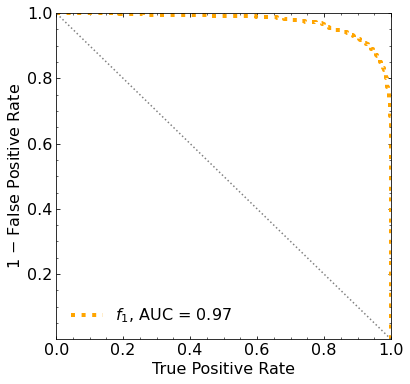

Classification score:


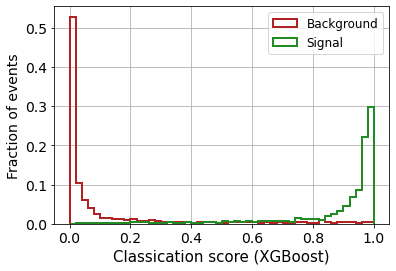


 ROC-AUC =  0.9740021869174195
At least 5 B events per bin, range = [[0, 1]]:
# bins:  19 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  19
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.019


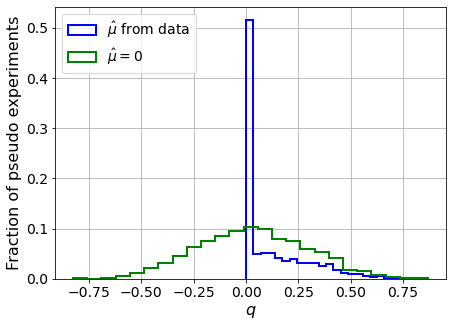

muhat mean:  0.12156945645029843
Z_bins:  0.1641852891365623
std Z_bins:  0.5028662727247774
Z_bins mu=0:  0.16169936838668822
std Z_bins mu=0:  0.8208219504019094

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.019


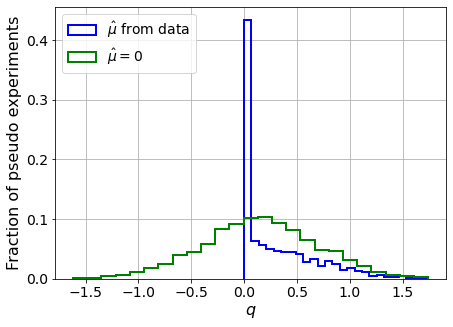

muhat mean:  -0.001491893622928382
Z_bins:  0.3776157999868996
std Z_bins:  0.4809050324534335
Z_bins mu=0:  0.37757678972324066
std Z_bins mu=0:  0.7182217113066395

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.02


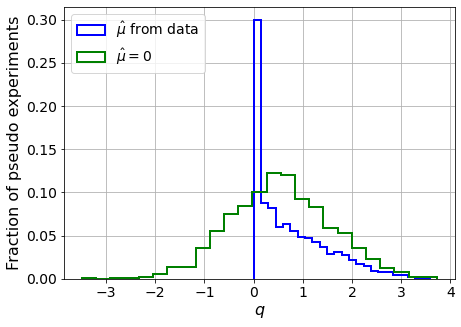

muhat mean:  0.003860816173263895
Z_bins:  0.7175255545620502
std Z_bins:  0.5280174106371981
Z_bins mu=0:  0.7172162367208067
std Z_bins mu=0:  0.708029761769309

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0185


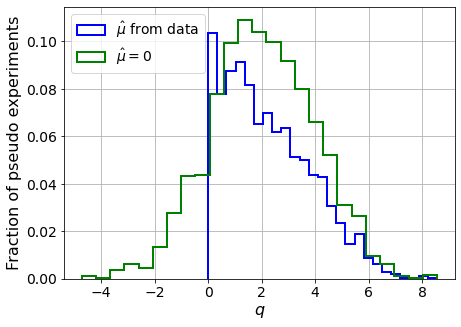

muhat mean:  -0.01722542303629941
Z_bins:  1.412608476577468
std Z_bins:  0.5699302533720432
Z_bins mu=0:  1.4125974655337066
std Z_bins mu=0:  0.6851257907161459

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.015


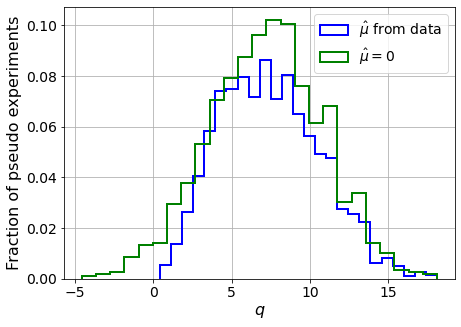

muhat mean:  0.005767584614959874
Z_bins:  2.693523913835861
std Z_bins:  0.5967007930073426
Z_bins mu=0:  2.693523913835861
std Z_bins mu=0:  0.6707237292443077

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0175


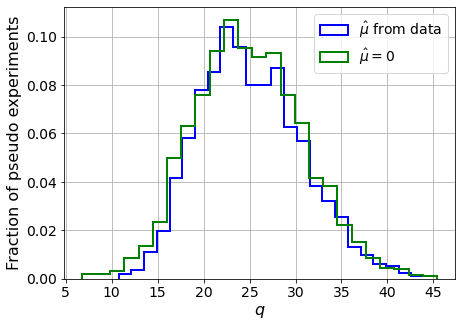

muhat mean:  0.000523582699229756
Z_bins:  4.962733069105687
std Z_bins:  0.566266279860311
Z_bins mu=0:  4.962260920633332
std Z_bins mu=0:  0.5979480984110136

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.022


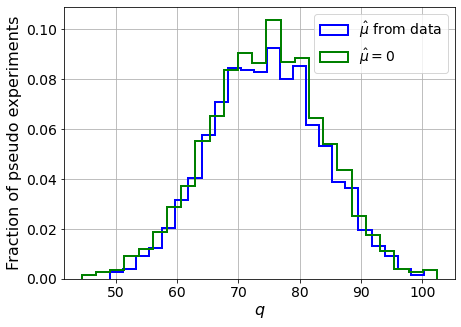

muhat mean:  -0.0009741767167892082
Z_bins:  8.640105900858106
std Z_bins:  0.5261162716369518
Z_bins mu=0:  8.63979123701819
std Z_bins mu=0:  0.5471232498091655

--------

B_expected:  643
S_expected:  170

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0205


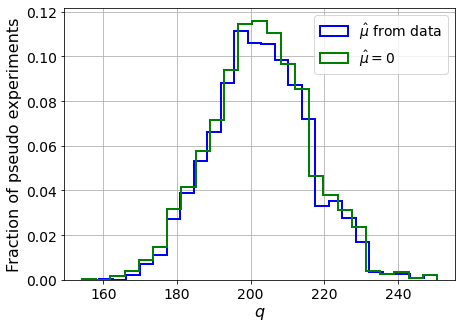

muhat mean:  2.8548032877083253e-05
Z_bins:  14.231329352943229
std Z_bins:  0.4659945988343727
Z_bins mu=0:  14.230580541401338
std Z_bins mu=0:  0.4778403379969656

--------

B_expected:  643
S_expected:  366

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0145


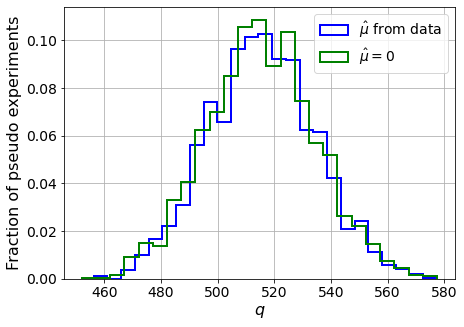

muhat mean:  7.211062666602425e-05
Z_bins:  22.701698498078336
std Z_bins:  0.41480216703675504
Z_bins mu=0:  22.701546132134656
std Z_bins mu=0:  0.4224096312891309

--------

B_expected:  643
S_expected:  788

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0125


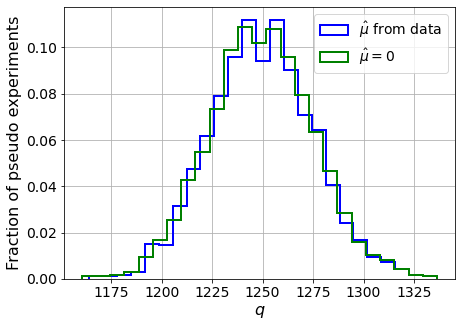

muhat mean:  -0.0001087629922273547
Z_bins:  35.34364713848047
std Z_bins:  0.35878126813971517
Z_bins mu=0:  35.343083038046984
std Z_bins mu=0:  0.36276440564342727

--------


 FINAL RESULT:

[[0.1641852891365623, 0.5028662727247774, 0.12156945645029843, 0.16169936838668822, 0.8208219504019094], [0.3776157999868996, 0.4809050324534335, -0.001491893622928382, 0.37757678972324066, 0.7182217113066395], [0.7175255545620502, 0.5280174106371981, 0.003860816173263895, 0.7172162367208067, 0.708029761769309], [1.412608476577468, 0.5699302533720432, -0.01722542303629941, 1.4125974655337066, 0.6851257907161459], [2.693523913835861, 0.5967007930073426, 0.005767584614959874, 2.693523913835861, 0.6707237292443077], [4.962733069105687, 0.566266279860311, 0.000523582699229756, 4.962260920633332, 0.5979480984110136], [8.640105900858106, 0.5261162716369518, -0.0009741767167892082, 8.63979123701819, 0.5471232498091655], [14.231329352943229, 0.4659945988343727, 2.8548032877083253e-05, 14.23058054140133

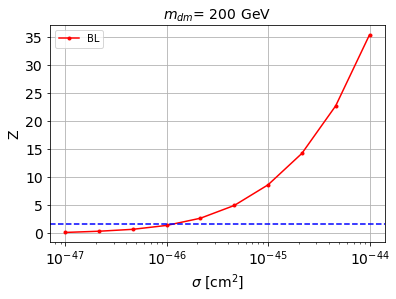


cross_BL_164:  1.1883677461025573e-46
cross_BL_164_up:  7.416192530845425e-47
cross_BL_164_down:  1.7229777794101476e-46

#########################


#########################

mDM =  500 GeV


max_pS1_both lenght:  178

X_mon1_train :  (6375, 178)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 178)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 178)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)

B_pbot.shape:  (5000,

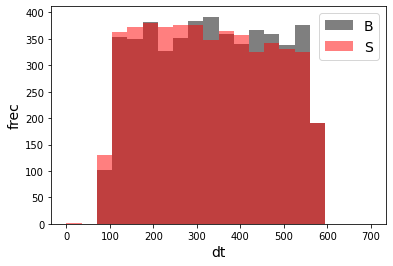

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35261)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35261)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35261)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68632	validation_1-logloss:0.68700
[1]	validation_0-logloss:0.67963	validation_1-logloss:0.68098
[2]	validation_0-logloss:0.67308	validation_1-logloss:0.67503
[3]	validation_0-logloss:0.66661	validation_1-logloss:0.66922
[4]	validation_0-logloss:0.66032	validation_1-logloss:0.66347
[5]	validation_0-logloss:0.65410	validation_1-logloss:0.65788
[6]	validation_0-logloss:0.64799	validation_1-logloss:0.65250
[7]	validation_0-logloss:0.64203	validation_1-logloss:0.64703
[8]	validation_0-logloss:0.63613	validation_1-logloss:0.64177
[9]	validation_0-logloss:0.63043	validation_1-logloss:0.63667
[10]	validation_0-logloss:0.62481	validation_1-logloss:0.63145
[11]	validation_0-logloss:0.61924	validation_1-logloss:0.62645
[12]	validation_0-logloss:0.61391	validation_1-logloss:0.62177
[13]	validation_0-logloss:0.60853	validation_1-logloss:0.61692
[14]	validation_0-logloss:0.60333	validation_1-logloss:0.61239
[15]	validation_0-logloss:0.59819	validation_1-logloss:0.60769
[1

[130]	validation_0-logloss:0.29105	validation_1-logloss:0.34861
[131]	validation_0-logloss:0.28969	validation_1-logloss:0.34754
[132]	validation_0-logloss:0.28820	validation_1-logloss:0.34640
[133]	validation_0-logloss:0.28690	validation_1-logloss:0.34538
[134]	validation_0-logloss:0.28549	validation_1-logloss:0.34430
[135]	validation_0-logloss:0.28404	validation_1-logloss:0.34322
[136]	validation_0-logloss:0.28280	validation_1-logloss:0.34230
[137]	validation_0-logloss:0.28160	validation_1-logloss:0.34145
[138]	validation_0-logloss:0.28025	validation_1-logloss:0.34031
[139]	validation_0-logloss:0.27886	validation_1-logloss:0.33926
[140]	validation_0-logloss:0.27763	validation_1-logloss:0.33841
[141]	validation_0-logloss:0.27642	validation_1-logloss:0.33744
[142]	validation_0-logloss:0.27504	validation_1-logloss:0.33642
[143]	validation_0-logloss:0.27382	validation_1-logloss:0.33548
[144]	validation_0-logloss:0.27253	validation_1-logloss:0.33452
[145]	validation_0-logloss:0.27142	valid

[259]	validation_0-logloss:0.18172	validation_1-logloss:0.27250
[260]	validation_0-logloss:0.18124	validation_1-logloss:0.27235
[261]	validation_0-logloss:0.18068	validation_1-logloss:0.27196
[262]	validation_0-logloss:0.18012	validation_1-logloss:0.27161
[263]	validation_0-logloss:0.17954	validation_1-logloss:0.27124
[264]	validation_0-logloss:0.17908	validation_1-logloss:0.27102
[265]	validation_0-logloss:0.17868	validation_1-logloss:0.27075
[266]	validation_0-logloss:0.17811	validation_1-logloss:0.27039
[267]	validation_0-logloss:0.17766	validation_1-logloss:0.27012
[268]	validation_0-logloss:0.17715	validation_1-logloss:0.26986
[269]	validation_0-logloss:0.17670	validation_1-logloss:0.26962
[270]	validation_0-logloss:0.17630	validation_1-logloss:0.26938
[271]	validation_0-logloss:0.17574	validation_1-logloss:0.26915
[272]	validation_0-logloss:0.17534	validation_1-logloss:0.26883
[273]	validation_0-logloss:0.17481	validation_1-logloss:0.26858
[274]	validation_0-logloss:0.17439	valid

[388]	validation_0-logloss:0.13457	validation_1-logloss:0.25164
[389]	validation_0-logloss:0.13432	validation_1-logloss:0.25161
[390]	validation_0-logloss:0.13398	validation_1-logloss:0.25156
[391]	validation_0-logloss:0.13370	validation_1-logloss:0.25152
[392]	validation_0-logloss:0.13344	validation_1-logloss:0.25138
[393]	validation_0-logloss:0.13313	validation_1-logloss:0.25130
[394]	validation_0-logloss:0.13289	validation_1-logloss:0.25117
[395]	validation_0-logloss:0.13259	validation_1-logloss:0.25111
[396]	validation_0-logloss:0.13235	validation_1-logloss:0.25105
[397]	validation_0-logloss:0.13211	validation_1-logloss:0.25101
[398]	validation_0-logloss:0.13190	validation_1-logloss:0.25088
[399]	validation_0-logloss:0.13169	validation_1-logloss:0.25085
[400]	validation_0-logloss:0.13145	validation_1-logloss:0.25077
[401]	validation_0-logloss:0.13114	validation_1-logloss:0.25067
[402]	validation_0-logloss:0.13091	validation_1-logloss:0.25062
[403]	validation_0-logloss:0.13062	valid

[517]	validation_0-logloss:0.10731	validation_1-logloss:0.24714
[518]	validation_0-logloss:0.10719	validation_1-logloss:0.24710
[519]	validation_0-logloss:0.10700	validation_1-logloss:0.24708
[520]	validation_0-logloss:0.10677	validation_1-logloss:0.24708
[521]	validation_0-logloss:0.10661	validation_1-logloss:0.24698
[522]	validation_0-logloss:0.10644	validation_1-logloss:0.24702
[523]	validation_0-logloss:0.10629	validation_1-logloss:0.24703
[524]	validation_0-logloss:0.10613	validation_1-logloss:0.24694
[525]	validation_0-logloss:0.10598	validation_1-logloss:0.24696
[526]	validation_0-logloss:0.10584	validation_1-logloss:0.24687
[527]	validation_0-logloss:0.10562	validation_1-logloss:0.24689
[528]	validation_0-logloss:0.10547	validation_1-logloss:0.24681
[529]	validation_0-logloss:0.10530	validation_1-logloss:0.24669
[530]	validation_0-logloss:0.10516	validation_1-logloss:0.24670
[531]	validation_0-logloss:0.10494	validation_1-logloss:0.24660
[532]	validation_0-logloss:0.10482	valid

[646]	validation_0-logloss:0.08812	validation_1-logloss:0.24385
[647]	validation_0-logloss:0.08792	validation_1-logloss:0.24386
[648]	validation_0-logloss:0.08781	validation_1-logloss:0.24383
[649]	validation_0-logloss:0.08770	validation_1-logloss:0.24374
[650]	validation_0-logloss:0.08761	validation_1-logloss:0.24368
[651]	validation_0-logloss:0.08743	validation_1-logloss:0.24362
[652]	validation_0-logloss:0.08728	validation_1-logloss:0.24354
[653]	validation_0-logloss:0.08713	validation_1-logloss:0.24350
[654]	validation_0-logloss:0.08701	validation_1-logloss:0.24344
[655]	validation_0-logloss:0.08690	validation_1-logloss:0.24343
[656]	validation_0-logloss:0.08672	validation_1-logloss:0.24336
[657]	validation_0-logloss:0.08662	validation_1-logloss:0.24338
[658]	validation_0-logloss:0.08645	validation_1-logloss:0.24338
[659]	validation_0-logloss:0.08631	validation_1-logloss:0.24337
[660]	validation_0-logloss:0.08620	validation_1-logloss:0.24330
[661]	validation_0-logloss:0.08601	valid

[775]	validation_0-logloss:0.07462	validation_1-logloss:0.24028
[776]	validation_0-logloss:0.07453	validation_1-logloss:0.24031
[777]	validation_0-logloss:0.07447	validation_1-logloss:0.24031
[778]	validation_0-logloss:0.07439	validation_1-logloss:0.24031
[779]	validation_0-logloss:0.07426	validation_1-logloss:0.24034
[780]	validation_0-logloss:0.07415	validation_1-logloss:0.24036
[781]	validation_0-logloss:0.07407	validation_1-logloss:0.24037
[782]	validation_0-logloss:0.07395	validation_1-logloss:0.24034
[783]	validation_0-logloss:0.07385	validation_1-logloss:0.24033
[784]	validation_0-logloss:0.07379	validation_1-logloss:0.24030
[785]	validation_0-logloss:0.07368	validation_1-logloss:0.24028
[786]	validation_0-logloss:0.07361	validation_1-logloss:0.24024
[787]	validation_0-logloss:0.07352	validation_1-logloss:0.24025
[788]	validation_0-logloss:0.07345	validation_1-logloss:0.24022
[789]	validation_0-logloss:0.07337	validation_1-logloss:0.24024
[790]	validation_0-logloss:0.07326	valid

[904]	validation_0-logloss:0.06381	validation_1-logloss:0.23924
[905]	validation_0-logloss:0.06371	validation_1-logloss:0.23923
[906]	validation_0-logloss:0.06364	validation_1-logloss:0.23917
[907]	validation_0-logloss:0.06356	validation_1-logloss:0.23923
[908]	validation_0-logloss:0.06350	validation_1-logloss:0.23923
[909]	validation_0-logloss:0.06342	validation_1-logloss:0.23925
[910]	validation_0-logloss:0.06336	validation_1-logloss:0.23923
[911]	validation_0-logloss:0.06329	validation_1-logloss:0.23923
[912]	validation_0-logloss:0.06315	validation_1-logloss:0.23925
[913]	validation_0-logloss:0.06308	validation_1-logloss:0.23928
[914]	validation_0-logloss:0.06301	validation_1-logloss:0.23925
[915]	validation_0-logloss:0.06290	validation_1-logloss:0.23924
[916]	validation_0-logloss:0.06282	validation_1-logloss:0.23921
[917]	validation_0-logloss:0.06275	validation_1-logloss:0.23916
[918]	validation_0-logloss:0.06268	validation_1-logloss:0.23914
[919]	validation_0-logloss:0.06259	valid

[1032]	validation_0-logloss:0.05446	validation_1-logloss:0.23905
[1033]	validation_0-logloss:0.05440	validation_1-logloss:0.23907
[1034]	validation_0-logloss:0.05435	validation_1-logloss:0.23905
[1035]	validation_0-logloss:0.05427	validation_1-logloss:0.23906
[1036]	validation_0-logloss:0.05420	validation_1-logloss:0.23908
[1037]	validation_0-logloss:0.05413	validation_1-logloss:0.23905
[1038]	validation_0-logloss:0.05401	validation_1-logloss:0.23898
[1039]	validation_0-logloss:0.05395	validation_1-logloss:0.23899
[1040]	validation_0-logloss:0.05386	validation_1-logloss:0.23902
[1041]	validation_0-logloss:0.05380	validation_1-logloss:0.23901
[1042]	validation_0-logloss:0.05376	validation_1-logloss:0.23901
[1043]	validation_0-logloss:0.05370	validation_1-logloss:0.23904
[1044]	validation_0-logloss:0.05362	validation_1-logloss:0.23906
[1045]	validation_0-logloss:0.05352	validation_1-logloss:0.23911
[1046]	validation_0-logloss:0.05343	validation_1-logloss:0.23912
[1047]	validation_0-loglo

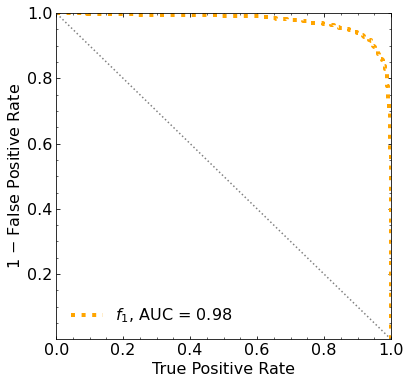

Classification score:


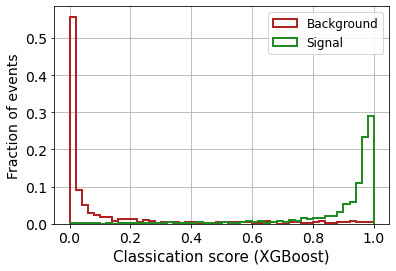


 ROC-AUC =  0.9761430100587958
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0245


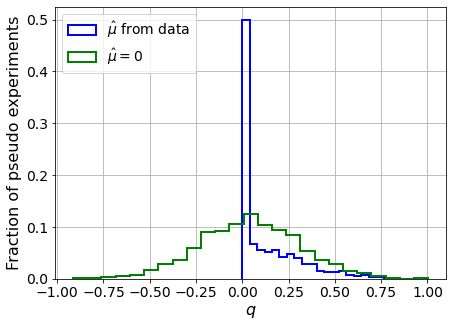

muhat mean:  -0.06013916171401552
Z_bins:  0.20465386554356432
std Z_bins:  0.42418963092315565
Z_bins mu=0:  0.20465386554356432
std Z_bins mu=0:  0.6660655658700719

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0195


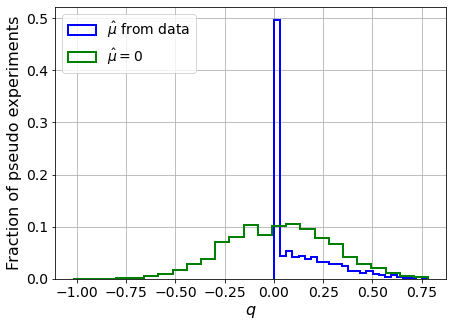

muhat mean:  0.08934316290738743
Z_bins:  0.1843001744406002
std Z_bins:  0.44442637195053697
Z_bins mu=0:  0.184210916413959
std Z_bins mu=0:  0.7208403179334305

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.024


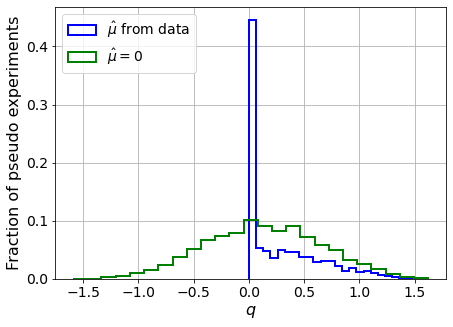

muhat mean:  0.02167142240221267
Z_bins:  0.36421189274399485
std Z_bins:  0.4759768293668547
Z_bins mu=0:  0.3640630633079864
std Z_bins mu=0:  0.7200225149409896

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0225


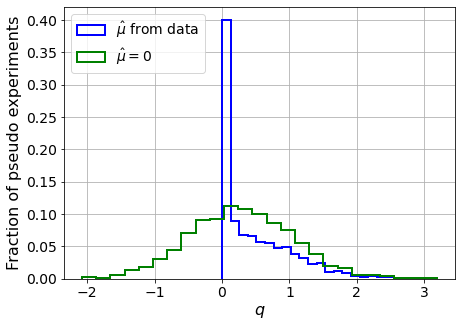

muhat mean:  0.029908381545239976
Z_bins:  0.5209996980506031
std Z_bins:  0.5193464369644419
Z_bins mu=0:  0.5190015223258173
std Z_bins mu=0:  0.7342318629707791

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0175


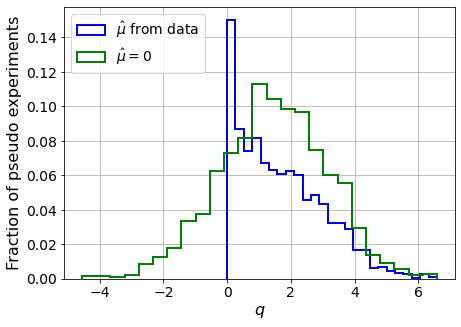

muhat mean:  0.009986891229287956
Z_bins:  1.207943030633957
std Z_bins:  0.5507004442388604
Z_bins mu=0:  1.207943030633957
std Z_bins mu=0:  0.696429513424803

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.021


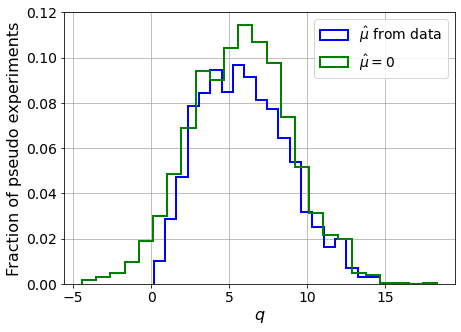

muhat mean:  -0.0010062187785815318
Z_bins:  2.4087055754316595
std Z_bins:  0.5890441613536755
Z_bins mu=0:  2.4087055754316595
std Z_bins mu=0:  0.6622188697550266

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0175


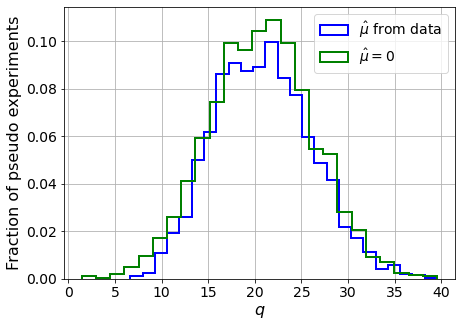

muhat mean:  0.0019707137847517642
Z_bins:  4.560455678428323
std Z_bins:  0.5729116645715349
Z_bins mu=0:  4.560379839551576
std Z_bins mu=0:  0.6126291176217429

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.025


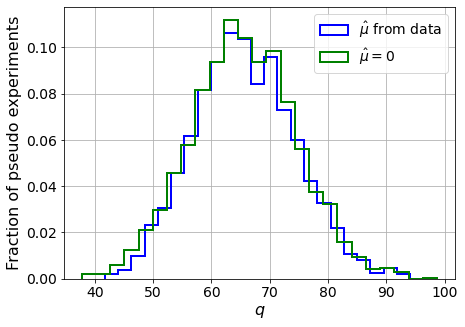

muhat mean:  -7.040234049412387e-05
Z_bins:  8.083474622057492
std Z_bins:  0.5386135346999581
Z_bins mu=0:  8.083348923907284
std Z_bins mu=0:  0.5604134550796728

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0235


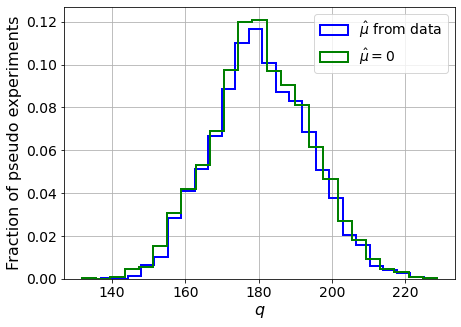

muhat mean:  0.0006965202122268566
Z_bins:  13.427812579042117
std Z_bins:  0.49539876073697486
Z_bins mu=0:  13.425417435621172
std Z_bins mu=0:  0.5094019306189431

--------

B_expected:  643
S_expected:  333

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.018


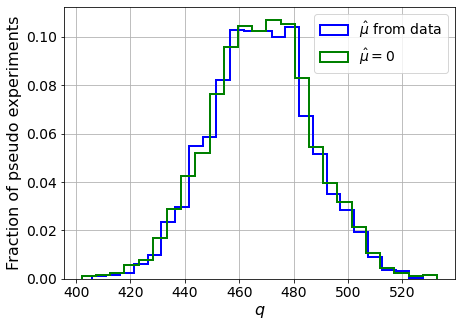

muhat mean:  4.8462782781575946e-05
Z_bins:  21.63309153313965
std Z_bins:  0.4325472659852917
Z_bins mu=0:  21.633000899203083
std Z_bins mu=0:  0.4411213069777747

--------


 FINAL RESULT:

[[0.20465386554356432, 0.42418963092315565, -0.06013916171401552, 0.20465386554356432, 0.6660655658700719], [0.1843001744406002, 0.44442637195053697, 0.08934316290738743, 0.184210916413959, 0.7208403179334305], [0.36421189274399485, 0.4759768293668547, 0.02167142240221267, 0.3640630633079864, 0.7200225149409896], [0.5209996980506031, 0.5193464369644419, 0.029908381545239976, 0.5190015223258173, 0.7342318629707791], [1.207943030633957, 0.5507004442388604, 0.009986891229287956, 1.207943030633957, 0.696429513424803], [2.4087055754316595, 0.5890441613536755, -0.0010062187785815318, 2.4087055754316595, 0.6622188697550266], [4.560455678428323, 0.5729116645715349, 0.0019707137847517642, 4.560379839551576, 0.6126291176217429], [8.083474622057492, 0.5386135346999581, -7.040234049412387e-05, 8.083348923907

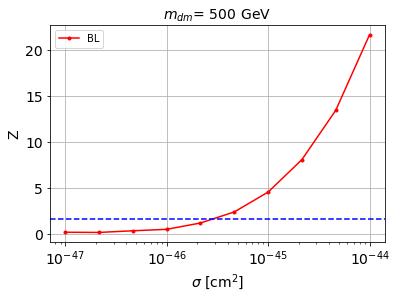


cross_BL_164:  2.988823772589126e-46
cross_BL_164_up:  1.954594857141242e-46
cross_BL_164_down:  4.244347306394236e-46

#########################



In [36]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = 'mDM' + str(mDM) + 'GeV/WP_mDM' + str(mDM) + 'GeV_sig1045.hdf5'
    
    f_S = h5py.File(filefolder+filename_S,'r')
    
    
    
    
    print('')
    
    ###################
    # peakS1_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS1_B = 0
    max_pS1_B1 = 0
    max_pS1_B2 = 0
    max_pS1_B3 = 0
    max_pS1_B4 = 0

    max_pS1_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS1_B = max(max_pS1_B, len( f_B['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS1_B1 = max(max_pS1_B1, len( f_B1['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS1_B2 = max(max_pS1_B2, len( f_B2['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS1_B3 = max(max_pS1_B3, len( f_B3['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS1_B4 = max(max_pS1_B4, len( f_B4['peakS1_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS1_S = max(max_pS1_S, len( f_S['peakS1_onlyhits/ev_'+str(i)] ))


    max_pS1_both = max(max_pS1_B,max_pS1_B1,max_pS1_B2,max_pS1_B3,max_pS1_B4,max_pS1_S)

    print('max_pS1_both lenght: ', max_pS1_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
    diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS1_onlyhits_B = np.pad(f_B['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B), 'constant')
    peakS1_onlyhits_B1 = np.pad(f_B1['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B1), 'constant')
    peakS1_onlyhits_B2 = np.pad(f_B2['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B2), 'constant')
    peakS1_onlyhits_B3 = np.pad(f_B3['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B3), 'constant')
    peakS1_onlyhits_B4 = np.pad(f_B4['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B4), 'constant')
    peakS1_onlyhits_S = np.pad(f_S['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
        diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S1_B = np.pad(f_B['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B), 'constant')
        # add new event to the matrix as a row
        peakS1_onlyhits_B = np.row_stack([peakS1_onlyhits_B,aux_S1_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B1 = np.pad(f_B1['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B1), 'constant')
        peakS1_onlyhits_B1 = np.row_stack([peakS1_onlyhits_B1,aux_S1_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B2 = np.pad(f_B2['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B2), 'constant')
        peakS1_onlyhits_B2 = np.row_stack([peakS1_onlyhits_B2,aux_S1_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B3 = np.pad(f_B3['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B3), 'constant')
        peakS1_onlyhits_B3 = np.row_stack([peakS1_onlyhits_B3,aux_S1_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B4 = np.pad(f_B4['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B4), 'constant')
        peakS1_onlyhits_B4 = np.row_stack([peakS1_onlyhits_B4,aux_S1_B4])

    for i in range(2, num_data+1):
        diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_S = np.pad(f_S['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_S), 'constant')
        peakS1_onlyhits_S = np.row_stack([peakS1_onlyhits_S,aux_S1_S])




    # X and Y for the classifier
    X_peakS1 = np.row_stack([peakS1_onlyhits_B[:NUM_DAT_ER],peakS1_onlyhits_B1[:NUM_DAT_AC],peakS1_onlyhits_B2[:NUM_DAT_CNNS],peakS1_onlyhits_B3[:NUM_DAT_RN],peakS1_onlyhits_B4[:NUM_DAT_WALL],peakS1_onlyhits_S])
    # normalize
    X_peakS1 = scaler.fit_transform(X_peakS1)

    del peakS1_onlyhits_B
    del peakS1_onlyhits_B1
    del peakS1_onlyhits_B2
    del peakS1_onlyhits_B3
    del peakS1_onlyhits_B4
    del peakS1_onlyhits_S






    ###################
    # CONCATENATE ALL #
    ###################

    X_mon1 = np.concatenate([X_peakS1],axis=1)

    del X_peakS1

    # labels
    y_mon1 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon1_aux, X_mon1_test, y_mon1_aux, y_mon1_test = train_test_split(X_mon1,
                                                                    y_mon1,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon1,
                                                                    shuffle=True)

    del X_mon1
    del y_mon1

    X_mon1_train, X_mon1_val, y_mon1_train, y_mon1_val = train_test_split(X_mon1_aux,
                                                                      y_mon1_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon1_aux,
                                                                      shuffle=True)

    del X_mon1_aux
    del y_mon1_aux

    print('')
    print('X_mon1_train : ', X_mon1_train.shape)
    print('y_mon1_train : ', y_mon1_train.shape)
    print('X_mon1_val : ', X_mon1_val.shape)
    print('y_mon1_val : ', y_mon1_val.shape)
    print('X_mon1_test : ', X_mon1_test.shape)
    print('y_mon1_test : ', y_mon1_test.shape)
    print('')
    
    
    
    
    
    ###################
    # peakS2_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS2_B = 0
    max_pS2_B1 = 0
    max_pS2_B2 = 0
    max_pS2_B3 = 0
    max_pS2_B4 = 0

    max_pS2_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS2_B = max(max_pS2_B, len( f_B['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS2_B1 = max(max_pS2_B1, len( f_B1['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS2_B2 = max(max_pS2_B2, len( f_B2['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS2_B3 = max(max_pS2_B3, len( f_B3['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS2_B4 = max(max_pS2_B4, len( f_B4['peakS2_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS2_S = max(max_pS2_S, len( f_S['peakS2_onlyhits/ev_'+str(i)] ))


    max_pS2_both = max(max_pS2_B,max_pS2_B1,max_pS2_B2,max_pS2_B3,max_pS2_B4,max_pS2_S)

    print('max_pS2_both lenght: ', max_pS2_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
    diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS2_onlyhits_B = np.pad(f_B['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B), 'constant')
    peakS2_onlyhits_B1 = np.pad(f_B1['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B1), 'constant')
    peakS2_onlyhits_B2 = np.pad(f_B2['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B2), 'constant')
    peakS2_onlyhits_B3 = np.pad(f_B3['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B3), 'constant')
    peakS2_onlyhits_B4 = np.pad(f_B4['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B4), 'constant')
    peakS2_onlyhits_S = np.pad(f_S['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
        diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S2_B = np.pad(f_B['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B), 'constant')
        # add new event to the matrix as a row
        peakS2_onlyhits_B = np.row_stack([peakS2_onlyhits_B,aux_S2_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B1 = np.pad(f_B1['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B1), 'constant')
        peakS2_onlyhits_B1 = np.row_stack([peakS2_onlyhits_B1,aux_S2_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B2 = np.pad(f_B2['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B2), 'constant')
        peakS2_onlyhits_B2 = np.row_stack([peakS2_onlyhits_B2,aux_S2_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B3 = np.pad(f_B3['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B3), 'constant')
        peakS2_onlyhits_B3 = np.row_stack([peakS2_onlyhits_B3,aux_S2_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B4 = np.pad(f_B4['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B4), 'constant')
        peakS2_onlyhits_B4 = np.row_stack([peakS2_onlyhits_B4,aux_S2_B4])
    for i in range(2, num_data+1):
        diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_S = np.pad(f_S['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_S), 'constant')
        peakS2_onlyhits_S = np.row_stack([peakS2_onlyhits_S,aux_S2_S])




    # X and Y for the classifier
    X_peakS2 = np.row_stack([peakS2_onlyhits_B[:NUM_DAT_ER],peakS2_onlyhits_B1[:NUM_DAT_AC],peakS2_onlyhits_B2[:NUM_DAT_CNNS],peakS2_onlyhits_B3[:NUM_DAT_RN],peakS2_onlyhits_B4[:NUM_DAT_WALL],peakS2_onlyhits_S])
    # normalize
    X_peakS2 = scaler.fit_transform(X_peakS2)

    del peakS2_onlyhits_B
    del peakS2_onlyhits_B1
    del peakS2_onlyhits_B2
    del peakS2_onlyhits_B3
    del peakS2_onlyhits_B4
    del peakS2_onlyhits_S









    ###################
    # CONCATENATE ALL #
    ###################

    X_mon2 = np.concatenate([X_peakS2],axis=1)

    del X_peakS2

    # labels
    y_mon2 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon2_aux, X_mon2_test, y_mon2_aux, y_mon2_test = train_test_split(X_mon2,
                                                                    y_mon2,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon2,
                                                                    shuffle=True)

    del X_mon2
    del y_mon2

    X_mon2_train, X_mon2_val, y_mon2_train, y_mon2_val = train_test_split(X_mon2_aux,
                                                                      y_mon2_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon2_aux,
                                                                      shuffle=True)

    del X_mon2_aux
    del y_mon2_aux

    print('')
    print('X_mon2_train : ', X_mon2_train.shape)
    print('y_mon2_train : ', y_mon2_train.shape)
    print('X_mon2_val : ', X_mon2_val.shape)
    print('y_mon2_val : ', y_mon2_val.shape)
    print('X_mon2_test : ', X_mon2_test.shape)
    print('y_mon2_test : ', y_mon2_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_bot_img DATA #
    ######################


    HITS_bot_img_S = np.array( f_S['HITS_bot_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_bot_img_S = np.row_stack([HITS_bot_img_S,np.array( f_S['HITS_bot_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon3 = np.row_stack([HITS_bot_img_B[:NUM_DAT_ER],HITS_bot_img_B1[:NUM_DAT_AC],HITS_bot_img_B2[:NUM_DAT_CNNS],HITS_bot_img_B3[:NUM_DAT_RN],HITS_bot_img_B4[:NUM_DAT_WALL],HITS_bot_img_S])
    # normalize
    X_mon3 = scaler.fit_transform(X_mon3)
    #X_mon3 = np.reshape(X_mon3, (2*num_data,128,128,1))

#     del HITS_bot_img_B
#     del HITS_bot_img_B1
#     del HITS_bot_img_B2
#     del HITS_bot_img_B3
#     del HITS_bot_img_B4
    del HITS_bot_img_S

    # labels
    y_mon3 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon3_aux, X_mon3_test, y_mon3_aux, y_mon3_test = train_test_split(X_mon3,
                                                                    y_mon3,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon3,
                                                                    shuffle=True)

    del X_mon3
    del y_mon3

    X_mon3_train, X_mon3_val, y_mon3_train, y_mon3_val = train_test_split(X_mon3_aux,
                                                                      y_mon3_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon3_aux,
                                                                      shuffle=True)

    del X_mon3_aux
    del y_mon3_aux

    print('')
    print('X_mon3_train : ', X_mon3_train.shape)
    print('y_mon3_train : ', y_mon3_train.shape)
    print('X_mon3_val : ', X_mon3_val.shape)
    print('y_mon3_val : ', y_mon3_val.shape)
    print('X_mon3_test : ', X_mon3_test.shape)
    print('y_mon3_test : ', y_mon3_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_top_img DATA #
    ######################
    
    HITS_top_img_S = np.array( f_S['HITS_top_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_top_img_S = np.row_stack([HITS_top_img_S,np.array( f_S['HITS_top_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon4 = np.row_stack([HITS_top_img_B[:NUM_DAT_ER],HITS_top_img_B1[:NUM_DAT_AC],HITS_top_img_B2[:NUM_DAT_CNNS],HITS_top_img_B3[:NUM_DAT_RN],HITS_top_img_B4[:NUM_DAT_WALL],HITS_top_img_S])
    # normalize
    X_mon4 = scaler.fit_transform(X_mon4)
    #X_mon4 = np.reshape(X_mon4, (2*num_data,128,128,1))

#     del HITS_top_img_B
#     del HITS_top_img_B1
#     del HITS_top_img_B2
#     del HITS_top_img_B3
#     del HITS_top_img_B4
    del HITS_top_img_S

    # labels
    y_mon4 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon4_aux, X_mon4_test, y_mon4_aux, y_mon4_test = train_test_split(X_mon4,
                                                                    y_mon4,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon4,
                                                                    shuffle=True)

    del X_mon4
    del y_mon4

    X_mon4_train, X_mon4_val, y_mon4_train, y_mon4_val = train_test_split(X_mon4_aux,
                                                                      y_mon4_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon4_aux,
                                                                      shuffle=True)

    del X_mon4_aux
    del y_mon4_aux

    print('')
    print('X_mon4_train : ', X_mon4_train.shape)
    print('y_mon4_train : ', y_mon4_train.shape)
    print('X_mon4_val : ', X_mon4_val.shape)
    print('y_mon4_val : ', y_mon4_val.shape)
    print('X_mon4_test : ', X_mon4_test.shape)
    print('y_mon4_test : ', y_mon4_test.shape)
    print('')
    
    
    
    
    
    
    # close the h5 files
#     f_B.close()
#     f_B1.close()
#     f_B2.close()
#     f_B3.close()
#     f_B4.close()
    f_S.close()
    
    
    
    
    
    #################
    # LOAD FEATURES #
    #################
    
    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    
    # concatenate the data

    # all the background features
    X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)), np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)

    # all the signal features
    X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)), np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)
    print('')

#     del B_ppeakS1
#     del B_ppeakS2
#     del B_pbot
#     del B_ptop

    del S_ppeakS1
    del S_ppeakS2
    del S_pbot
    del S_ptop


    X_mon5 = np.concatenate([X_mon_B, X_mon_S])

    print('X_mon5.shape: ', X_mon5.shape)
    del X_mon_B
    del X_mon_S


    # labels
    y_mon5 = np.concatenate([np.zeros(num_data),np.ones(num_data)])




    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon5_aux, X_mon5_test, y_mon5_aux, y_mon5_test = train_test_split(X_mon5,
                                                                    y_mon5,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon5,
                                                                    shuffle=True)

    del X_mon5
    del y_mon5

    X_mon5_train, X_mon5_val, y_mon5_train, y_mon5_val = train_test_split(X_mon5_aux,
                                                                      y_mon5_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon5_aux,
                                                                      shuffle=True)
    
    del X_mon5_aux
    del y_mon5_aux

    
    print('')
    print('X_mon5_train : ', X_mon5_train.shape)
    print('y_mon5_train : ', y_mon5_train.shape)
    print('X_mon5_val : ', X_mon5_val.shape)
    print('y_mon5_val : ', y_mon5_val.shape)
    print('X_mon5_test : ', X_mon5_test.shape)
    print('y_mon5_test : ', y_mon5_test.shape)
    print('')
    
    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon_train = np.concatenate([X_mon1_train,X_mon2_train,X_mon3_train,X_mon4_train,X_mon5_train],axis=1)
    X_mon_test = np.concatenate([X_mon1_test,X_mon2_test,X_mon3_test,X_mon4_test,X_mon5_test],axis=1)
    X_mon_val = np.concatenate([X_mon1_val,X_mon2_val,X_mon3_val,X_mon4_val,X_mon5_val],axis=1)



    y_mon_train = y_mon1_train
    y_mon_test = y_mon1_test
    y_mon_val = y_mon1_val



    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
#     #######
#     # MLL #
#     #######
    
#     # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

#     # outputs:
#     # 1st -> background PDF
#     # 2nd -> signal PDF
#     # 3rd -> (normalization factor of the background PDF)**-1
#     # 4th -> (normalization factor of the signal PDF)**-1
#     # 5th -> background bandwidth
#     # 6th -> signal bandwidth
#     kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
#                                                                                             1000, 
#                                                                                             np.logspace(-4.0, 0.05, 20), 
#                                                                                             set_kernel='epanechnikov')




#     # FOR EXCLUSION:
#     # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

#     print('This may take a while...')

#     pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
#     print('1 done')
#     pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
#     print('2 done')

#     # Normalize
#     pB_B_data = pB_B_data / norm_factor_SM
#     pS_B_data = pS_B_data / norm_factor_NP


#     if D_or_E == "discovery":

#         # FOR DISCOVERY:
#         # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

#         pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
#         print('3 done')
#         pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
#         print('4 done')

#         # Normalize
#         pB_S_data = pB_S_data / norm_factor_SM
#         pS_S_data = pS_S_data / norm_factor_NP

#     else:
#         # dummies
#         pB_S_data = 1
#         pS_S_data = 1





#    # OPTION 2 (mu_hat with more precision) (slower,
#     store_Z_MLL = []


#     for s_it in range(len(S_expected)):

#         print('B_expected: ', B_expected)
#         print('S_expected: ', S_expected[s_it])
#         print('')

#         Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

#         store_Z_MLL.append( list(Z_MLL) )

#         print('muhat mean: ', Z_MLL[2])
#         print('Z_bins: ', Z_MLL[0])
#         print('std Z_bins: ', Z_MLL[1])
#         print('Z_bins mu=0: ', Z_MLL[3])
#         print('std Z_bins mu=0: ', Z_MLL[4])
#         print('')
#         print('--------\n')


#     print('\n FINAL RESULT:\n')
#     print(store_Z_MLL)


#     store_Z_MLL = np.array(store_Z_MLL)

#     for hd in range(len(store_Z_MLL[:,0])):
#         if store_Z_MLL[:,0][hd] == 0:
#             store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
#             store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]



    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
#     plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
#     # interpolate
#     f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
#     f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
#     f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

#     # compute the cross section with Z=1.64
#     cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
#     cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
#     cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
#     store_cross_MLL_164.append(cross_MLL_164)
#     store_cross_MLL_164_up.append(cross_MLL_164_up)
#     store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
#     print('\ncross_MLL_164: ', cross_MLL_164)
#     print('cross_MLL_164_up: ', cross_MLL_164_up)
#     print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [37]:
cross_arrays17feats = store_cross_BL_164
cross_arrays17feats_up = store_cross_BL_164_up
cross_arrays17feats_down = store_cross_BL_164_down

print(cross_arrays17feats)
print(cross_arrays17feats_up)
print(cross_arrays17feats_down)

[1.1582262510912942e-45, 8.8551795411822e-47, 5.179752957115014e-47, 4.804769839820462e-47, 7.406450732790156e-47, 1.1883677461025573e-46, 2.988823772589126e-46]
[8.268036792797728e-46, 5.86608372701532e-47, 3.2885862829018165e-47, 3.1335089054421644e-47, 5.023885058131011e-47, 7.416192530845425e-47, 1.954594857141242e-46]
[1.599515115354566e-45, 1.2937725703834367e-46, 7.105677646218303e-47, 6.867837847814192e-47, 1.0178251070693537e-46, 1.7229777794101476e-46, 4.244347306394236e-46]


In [38]:
np.savetxt('results/arrays17feats.txt', [cross_arrays17feats, cross_arrays17feats_up, cross_arrays17feats_down])

In [39]:
cross_arrays17feats = np.loadtxt('results/arrays17feats.txt')[0]
cross_arrays17feats_up = np.loadtxt('results/arrays17feats.txt')[1]
cross_arrays17feats_down =np.loadtxt('results/arrays17feats.txt')[2]


#########################

mDM =  10 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 8)
B_ppeakS2.shape:  (5000, 8)

S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000

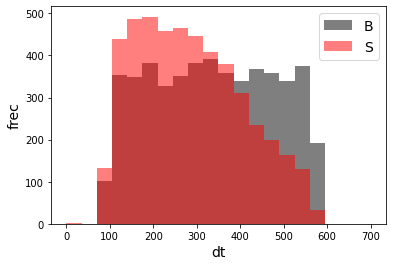

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35235)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35235)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35235)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68346	validation_1-logloss:0.68366
[1]	validation_0-logloss:0.67398	validation_1-logloss:0.67435
[2]	validation_0-logloss:0.66468	validation_1-logloss:0.66525
[3]	validation_0-logloss:0.65556	validation_1-logloss:0.65630
[4]	validation_0-logloss:0.64662	validation_1-logloss:0.64755
[5]	validation_0-logloss:0.63785	validation_1-logloss:0.63897
[6]	validation_0-logloss:0.62924	validation_1-logloss:0.63053
[7]	validation_0-logloss:0.62080	validation_1-logloss:0.62226
[8]	validation_0-logloss:0.61251	validation_1-logloss:0.61416
[9]	validation_0-logloss:0.60437	validation_1-logloss:0.60619
[10]	validation_0-logloss:0.59638	validation_1-logloss:0.59838
[11]	validation_0-logloss:0.58854	validation_1-logloss:0.59068
[12]	validation_0-logloss:0.58084	validation_1-logloss:0.58316
[13]	validation_0-logloss:0.57327	validation_1-logloss:0.57576
[14]	validation_0-logloss:0.56583	validation_1-logloss:0.56850
[15]	validation_0-logloss:0.55853	validation_1-logloss:0.56137
[1

[130]	validation_0-logloss:0.15653	validation_1-logloss:0.17449
[131]	validation_0-logloss:0.15502	validation_1-logloss:0.17304
[132]	validation_0-logloss:0.15347	validation_1-logloss:0.17156
[133]	validation_0-logloss:0.15196	validation_1-logloss:0.17017
[134]	validation_0-logloss:0.15050	validation_1-logloss:0.16876
[135]	validation_0-logloss:0.14899	validation_1-logloss:0.16729
[136]	validation_0-logloss:0.14752	validation_1-logloss:0.16596
[137]	validation_0-logloss:0.14609	validation_1-logloss:0.16458
[138]	validation_0-logloss:0.14467	validation_1-logloss:0.16328
[139]	validation_0-logloss:0.14329	validation_1-logloss:0.16196
[140]	validation_0-logloss:0.14187	validation_1-logloss:0.16061
[141]	validation_0-logloss:0.14049	validation_1-logloss:0.15936
[142]	validation_0-logloss:0.13916	validation_1-logloss:0.15810
[143]	validation_0-logloss:0.13784	validation_1-logloss:0.15692
[144]	validation_0-logloss:0.13647	validation_1-logloss:0.15559
[145]	validation_0-logloss:0.13514	valid

[259]	validation_0-logloss:0.04661	validation_1-logloss:0.07383
[260]	validation_0-logloss:0.04619	validation_1-logloss:0.07342
[261]	validation_0-logloss:0.04578	validation_1-logloss:0.07306
[262]	validation_0-logloss:0.04537	validation_1-logloss:0.07266
[263]	validation_0-logloss:0.04496	validation_1-logloss:0.07234
[264]	validation_0-logloss:0.04456	validation_1-logloss:0.07196
[265]	validation_0-logloss:0.04415	validation_1-logloss:0.07157
[266]	validation_0-logloss:0.04377	validation_1-logloss:0.07124
[267]	validation_0-logloss:0.04337	validation_1-logloss:0.07087
[268]	validation_0-logloss:0.04298	validation_1-logloss:0.07059
[269]	validation_0-logloss:0.04259	validation_1-logloss:0.07023
[270]	validation_0-logloss:0.04222	validation_1-logloss:0.06993
[271]	validation_0-logloss:0.04184	validation_1-logloss:0.06960
[272]	validation_0-logloss:0.04146	validation_1-logloss:0.06933
[273]	validation_0-logloss:0.04109	validation_1-logloss:0.06899
[274]	validation_0-logloss:0.04072	valid

[388]	validation_0-logloss:0.01548	validation_1-logloss:0.04840
[389]	validation_0-logloss:0.01536	validation_1-logloss:0.04837
[390]	validation_0-logloss:0.01523	validation_1-logloss:0.04827
[391]	validation_0-logloss:0.01512	validation_1-logloss:0.04820
[392]	validation_0-logloss:0.01500	validation_1-logloss:0.04817
[393]	validation_0-logloss:0.01488	validation_1-logloss:0.04809
[394]	validation_0-logloss:0.01477	validation_1-logloss:0.04800
[395]	validation_0-logloss:0.01465	validation_1-logloss:0.04789
[396]	validation_0-logloss:0.01454	validation_1-logloss:0.04788
[397]	validation_0-logloss:0.01443	validation_1-logloss:0.04779
[398]	validation_0-logloss:0.01432	validation_1-logloss:0.04773
[399]	validation_0-logloss:0.01421	validation_1-logloss:0.04766
[400]	validation_0-logloss:0.01410	validation_1-logloss:0.04761
[401]	validation_0-logloss:0.01399	validation_1-logloss:0.04753
[402]	validation_0-logloss:0.01389	validation_1-logloss:0.04747
[403]	validation_0-logloss:0.01378	valid

[517]	validation_0-logloss:0.00616	validation_1-logloss:0.04364
[518]	validation_0-logloss:0.00611	validation_1-logloss:0.04367
[519]	validation_0-logloss:0.00608	validation_1-logloss:0.04365
[520]	validation_0-logloss:0.00604	validation_1-logloss:0.04365
[521]	validation_0-logloss:0.00600	validation_1-logloss:0.04364
[522]	validation_0-logloss:0.00596	validation_1-logloss:0.04368
[523]	validation_0-logloss:0.00592	validation_1-logloss:0.04368
[524]	validation_0-logloss:0.00589	validation_1-logloss:0.04368
[525]	validation_0-logloss:0.00585	validation_1-logloss:0.04363
[526]	validation_0-logloss:0.00581	validation_1-logloss:0.04368
[527]	validation_0-logloss:0.00577	validation_1-logloss:0.04371
[528]	validation_0-logloss:0.00573	validation_1-logloss:0.04374
[529]	validation_0-logloss:0.00570	validation_1-logloss:0.04373
[530]	validation_0-logloss:0.00566	validation_1-logloss:0.04374
[531]	validation_0-logloss:0.00562	validation_1-logloss:0.04374
[532]	validation_0-logloss:0.00559	valid

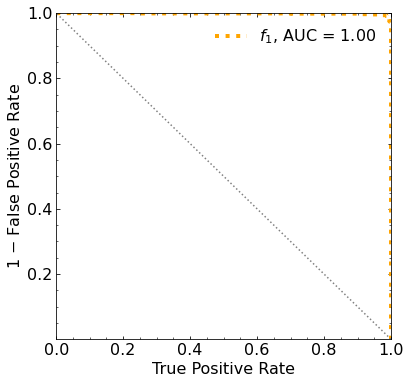

Classification score:


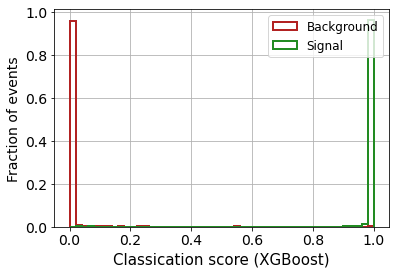


 ROC-AUC =  0.9987737001413557


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 283.73920112 193.27127824  99.8579592    6.1080588  -84.53533741]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 290

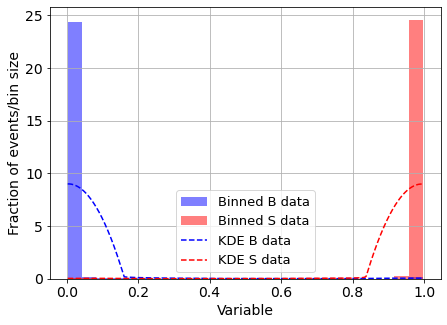

KDE Kernel:  epanechnikov
Background bandwidth:  0.15753186734235153
Signal bandwidth:  0.15753186734235153
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


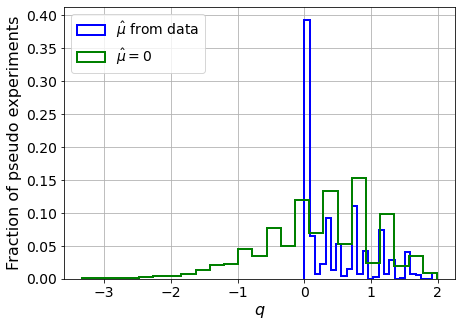

muhat mean:  -342.93998770359434
Z_bins:  0.5746044098796784
std Z_bins:  0.4468546787085527
Z_bins mu=0:  0.5746044098796784
std Z_bins mu=0:  0.7274300176776879

--------

B_expected:  643
S_expected:  1



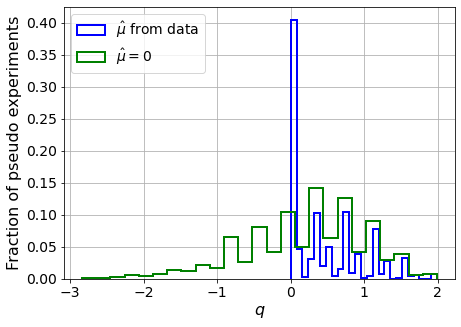

muhat mean:  -229.31452397188852
Z_bins:  0.5754475441626279
std Z_bins:  0.43367951969635865
Z_bins mu=0:  0.5754475441626279
std Z_bins mu=0:  0.7165418246126639

--------

B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


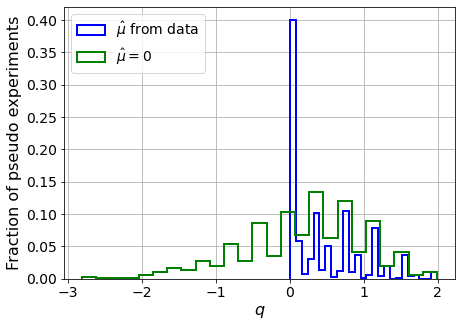

muhat mean:  -220.48469958102245
Z_bins:  0.5645674638115885
std Z_bins:  0.446759082121263
Z_bins mu=0:  0.5645674638115885
std Z_bins mu=0:  0.7352355873085795

--------

B_expected:  643
S_expected:  1



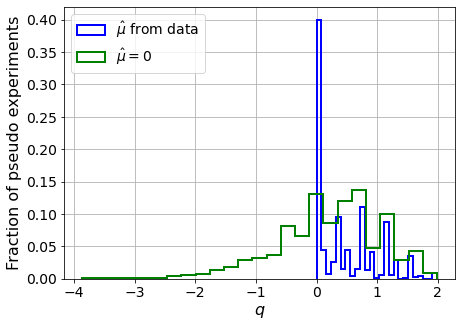

muhat mean:  -273.8205225118789
Z_bins:  0.5828785953468011
std Z_bins:  0.43329761676116424
Z_bins mu=0:  0.5828785953468011
std Z_bins mu=0:  0.7313137230971817

--------

B_expected:  643
S_expected:  1



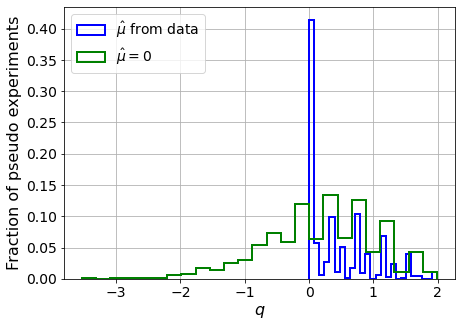

muhat mean:  -663.4287547772103
Z_bins:  0.558985205468105
std Z_bins:  0.4549707925597671
Z_bins mu=0:  0.558985205468105
std Z_bins mu=0:  0.749858875041366

--------

B_expected:  643
S_expected:  2



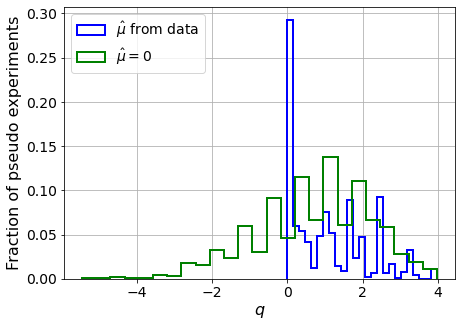

muhat mean:  -261.57118284683713
Z_bins:  0.974529338619355
std Z_bins:  0.5280792318006685
Z_bins mu=0:  0.974529338619355
std Z_bins mu=0:  0.7915693207644019

--------

B_expected:  643
S_expected:  5



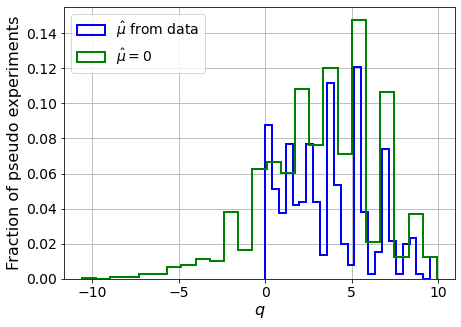

muhat mean:  -68.35681536959315
Z_bins:  1.937849064463126
std Z_bins:  0.6292570931869166
Z_bins mu=0:  1.937849064463126
std Z_bins mu=0:  0.815190440698996

--------

B_expected:  643
S_expected:  10



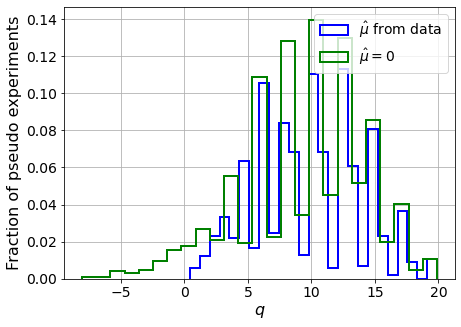

muhat mean:  -52.652973015909225
Z_bins:  3.195322092852741
std Z_bins:  0.6510577636814692
Z_bins mu=0:  3.195322092852741
std Z_bins mu=0:  0.7623382359165127

--------

B_expected:  643
S_expected:  22



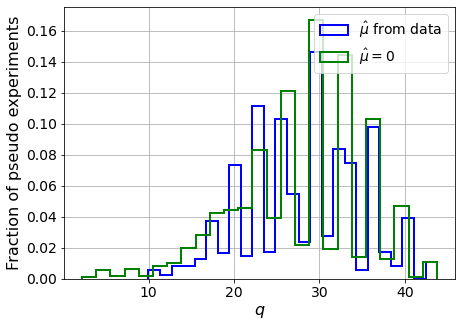

muhat mean:  -24.307971158575935
Z_bins:  5.385429255668896
std Z_bins:  0.6180697645210719
Z_bins mu=0:  5.385429255668896
std Z_bins mu=0:  0.6819109248375077

--------

B_expected:  643
S_expected:  47



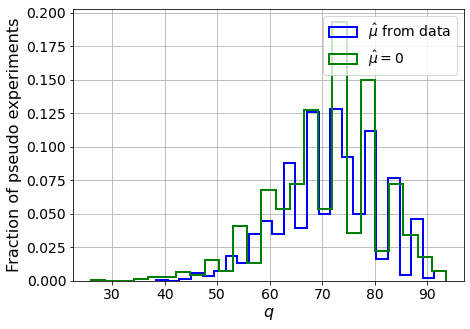

muhat mean:  -6.362150347838246
Z_bins:  8.53829696598729
std Z_bins:  0.5363461308279667
Z_bins mu=0:  8.53829696598729
std Z_bins mu=0:  0.5791402964012956

--------


 FINAL RESULT:

[[0.5746044098796784, 0.4468546787085527, -342.93998770359434, 0.5746044098796784, 0.7274300176776879], [0.5754475441626279, 0.43367951969635865, -229.31452397188852, 0.5754475441626279, 0.7165418246126639], [0.5645674638115885, 0.446759082121263, -220.48469958102245, 0.5645674638115885, 0.7352355873085795], [0.5828785953468011, 0.43329761676116424, -273.8205225118789, 0.5828785953468011, 0.7313137230971817], [0.558985205468105, 0.4549707925597671, -663.4287547772103, 0.558985205468105, 0.749858875041366], [0.974529338619355, 0.5280792318006685, -261.57118284683713, 0.974529338619355, 0.7915693207644019], [1.937849064463126, 0.6292570931869166, -68.35681536959315, 1.937849064463126, 0.815190440698996], [3.195322092852741, 0.6510577636814692, -52.652973015909225, 3.195322092852741, 0.7623382359165127], [

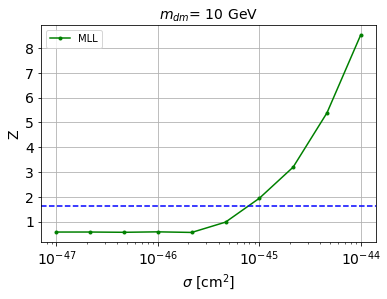


cross_MLL_164:  8.072449240563326e-46
cross_MLL_164_up:  5.243506124334293e-46
cross_MLL_164_down:  1.2742357550042879e-45

#########################


#########################

mDM =  20 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)

B_pbot.shape:  (5000

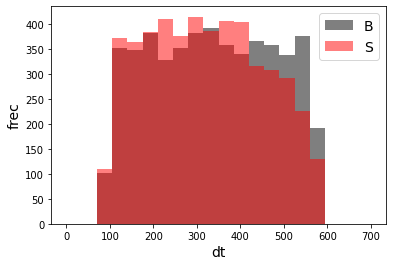

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35235)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35235)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35235)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68426	validation_1-logloss:0.68459
[1]	validation_0-logloss:0.67555	validation_1-logloss:0.67620
[2]	validation_0-logloss:0.66701	validation_1-logloss:0.66801
[3]	validation_0-logloss:0.65864	validation_1-logloss:0.65992
[4]	validation_0-logloss:0.65042	validation_1-logloss:0.65208
[5]	validation_0-logloss:0.64236	validation_1-logloss:0.64433
[6]	validation_0-logloss:0.63445	validation_1-logloss:0.63672
[7]	validation_0-logloss:0.62667	validation_1-logloss:0.62926
[8]	validation_0-logloss:0.61904	validation_1-logloss:0.62190
[9]	validation_0-logloss:0.61154	validation_1-logloss:0.61471
[10]	validation_0-logloss:0.60413	validation_1-logloss:0.60754
[11]	validation_0-logloss:0.59690	validation_1-logloss:0.60057
[12]	validation_0-logloss:0.58973	validation_1-logloss:0.59365
[13]	validation_0-logloss:0.58276	validation_1-logloss:0.58698
[14]	validation_0-logloss:0.57584	validation_1-logloss:0.58027
[15]	validation_0-logloss:0.56905	validation_1-logloss:0.57374
[1

[130]	validation_0-logloss:0.19053	validation_1-logloss:0.21603
[131]	validation_0-logloss:0.18903	validation_1-logloss:0.21459
[132]	validation_0-logloss:0.18755	validation_1-logloss:0.21333
[133]	validation_0-logloss:0.18608	validation_1-logloss:0.21191
[134]	validation_0-logloss:0.18456	validation_1-logloss:0.21053
[135]	validation_0-logloss:0.18314	validation_1-logloss:0.20919
[136]	validation_0-logloss:0.18174	validation_1-logloss:0.20786
[137]	validation_0-logloss:0.18029	validation_1-logloss:0.20650
[138]	validation_0-logloss:0.17892	validation_1-logloss:0.20522
[139]	validation_0-logloss:0.17747	validation_1-logloss:0.20395
[140]	validation_0-logloss:0.17610	validation_1-logloss:0.20264
[141]	validation_0-logloss:0.17468	validation_1-logloss:0.20140
[142]	validation_0-logloss:0.17333	validation_1-logloss:0.20009
[143]	validation_0-logloss:0.17195	validation_1-logloss:0.19891
[144]	validation_0-logloss:0.17064	validation_1-logloss:0.19766
[145]	validation_0-logloss:0.16929	valid

[259]	validation_0-logloss:0.07893	validation_1-logloss:0.11811
[260]	validation_0-logloss:0.07850	validation_1-logloss:0.11773
[261]	validation_0-logloss:0.07805	validation_1-logloss:0.11740
[262]	validation_0-logloss:0.07761	validation_1-logloss:0.11707
[263]	validation_0-logloss:0.07717	validation_1-logloss:0.11677
[264]	validation_0-logloss:0.07674	validation_1-logloss:0.11642
[265]	validation_0-logloss:0.07631	validation_1-logloss:0.11613
[266]	validation_0-logloss:0.07589	validation_1-logloss:0.11584
[267]	validation_0-logloss:0.07548	validation_1-logloss:0.11550
[268]	validation_0-logloss:0.07509	validation_1-logloss:0.11521
[269]	validation_0-logloss:0.07470	validation_1-logloss:0.11491
[270]	validation_0-logloss:0.07428	validation_1-logloss:0.11457
[271]	validation_0-logloss:0.07388	validation_1-logloss:0.11428
[272]	validation_0-logloss:0.07348	validation_1-logloss:0.11400
[273]	validation_0-logloss:0.07309	validation_1-logloss:0.11370
[274]	validation_0-logloss:0.07271	valid

[388]	validation_0-logloss:0.04355	validation_1-logloss:0.09515
[389]	validation_0-logloss:0.04338	validation_1-logloss:0.09506
[390]	validation_0-logloss:0.04320	validation_1-logloss:0.09491
[391]	validation_0-logloss:0.04303	validation_1-logloss:0.09486
[392]	validation_0-logloss:0.04286	validation_1-logloss:0.09477
[393]	validation_0-logloss:0.04269	validation_1-logloss:0.09469
[394]	validation_0-logloss:0.04252	validation_1-logloss:0.09462
[395]	validation_0-logloss:0.04236	validation_1-logloss:0.09457
[396]	validation_0-logloss:0.04223	validation_1-logloss:0.09453
[397]	validation_0-logloss:0.04207	validation_1-logloss:0.09446
[398]	validation_0-logloss:0.04190	validation_1-logloss:0.09441
[399]	validation_0-logloss:0.04173	validation_1-logloss:0.09432
[400]	validation_0-logloss:0.04158	validation_1-logloss:0.09424
[401]	validation_0-logloss:0.04142	validation_1-logloss:0.09421
[402]	validation_0-logloss:0.04126	validation_1-logloss:0.09416
[403]	validation_0-logloss:0.04110	valid

[517]	validation_0-logloss:0.02775	validation_1-logloss:0.08885
[518]	validation_0-logloss:0.02766	validation_1-logloss:0.08881
[519]	validation_0-logloss:0.02757	validation_1-logloss:0.08878
[520]	validation_0-logloss:0.02748	validation_1-logloss:0.08872
[521]	validation_0-logloss:0.02739	validation_1-logloss:0.08866
[522]	validation_0-logloss:0.02731	validation_1-logloss:0.08861
[523]	validation_0-logloss:0.02722	validation_1-logloss:0.08863
[524]	validation_0-logloss:0.02713	validation_1-logloss:0.08861
[525]	validation_0-logloss:0.02703	validation_1-logloss:0.08857
[526]	validation_0-logloss:0.02693	validation_1-logloss:0.08849
[527]	validation_0-logloss:0.02683	validation_1-logloss:0.08843
[528]	validation_0-logloss:0.02676	validation_1-logloss:0.08838
[529]	validation_0-logloss:0.02668	validation_1-logloss:0.08835
[530]	validation_0-logloss:0.02658	validation_1-logloss:0.08832
[531]	validation_0-logloss:0.02649	validation_1-logloss:0.08827
[532]	validation_0-logloss:0.02638	valid

[646]	validation_0-logloss:0.01868	validation_1-logloss:0.08719
[647]	validation_0-logloss:0.01864	validation_1-logloss:0.08720
[648]	validation_0-logloss:0.01857	validation_1-logloss:0.08719
[649]	validation_0-logloss:0.01852	validation_1-logloss:0.08721
[650]	validation_0-logloss:0.01846	validation_1-logloss:0.08721
[651]	validation_0-logloss:0.01839	validation_1-logloss:0.08725
[652]	validation_0-logloss:0.01834	validation_1-logloss:0.08720
[653]	validation_0-logloss:0.01827	validation_1-logloss:0.08723
[654]	validation_0-logloss:0.01821	validation_1-logloss:0.08719
[655]	validation_0-logloss:0.01817	validation_1-logloss:0.08716
[656]	validation_0-logloss:0.01810	validation_1-logloss:0.08717
[657]	validation_0-logloss:0.01803	validation_1-logloss:0.08721
[658]	validation_0-logloss:0.01799	validation_1-logloss:0.08718
[659]	validation_0-logloss:0.01792	validation_1-logloss:0.08724
[660]	validation_0-logloss:0.01788	validation_1-logloss:0.08722
[661]	validation_0-logloss:0.01784	valid

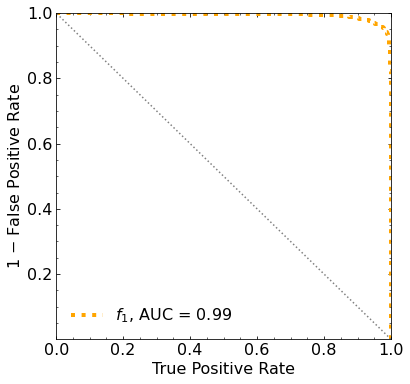

Classification score:


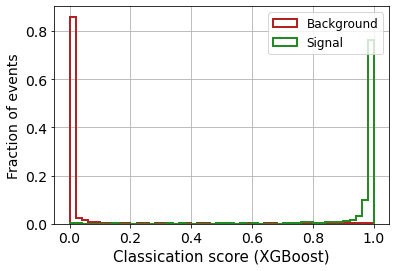


 ROC-AUC =  0.9937151732120542


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 459.51245448 386.40767471 309.80183563
 228.75927966 146.90989729  64.15009849 -18.88041103 -94.1605757 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 389.23598681 320.19319628
 245

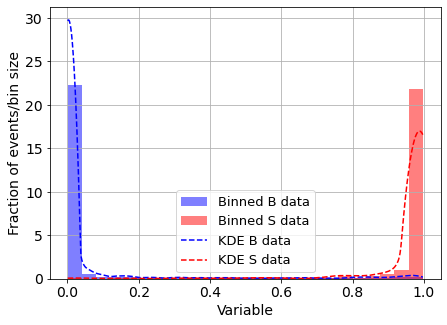

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



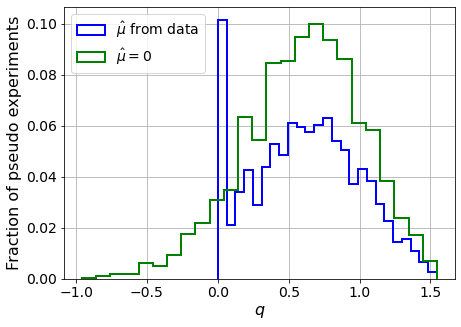

muhat mean:  -4.678970054386301
Z_bins:  0.7900695619745425
std Z_bins:  0.23623445193154133
Z_bins mu=0:  0.7900695619745425
std Z_bins mu=0:  0.25976308729909725

--------

B_expected:  643
S_expected:  2



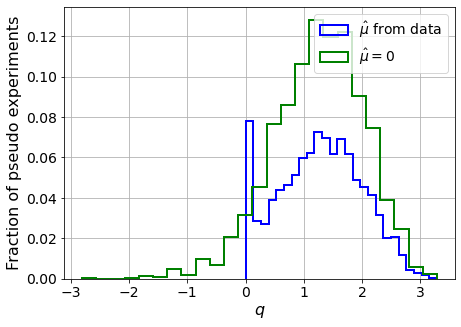

muhat mean:  -2.2089732632574344
Z_bins:  1.139956966057837
std Z_bins:  0.31308007107220365
Z_bins mu=0:  1.139956966057837
std Z_bins mu=0:  0.34623857326387064

--------

B_expected:  643
S_expected:  4



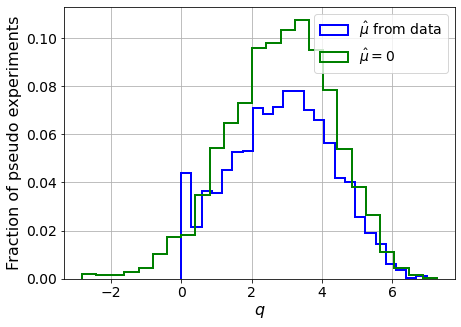

muhat mean:  -1.191137523804218
Z_bins:  1.705589384673049
std Z_bins:  0.417810539150344
Z_bins mu=0:  1.705589384673049
std Z_bins mu=0:  0.441860270448996

--------

B_expected:  643
S_expected:  9



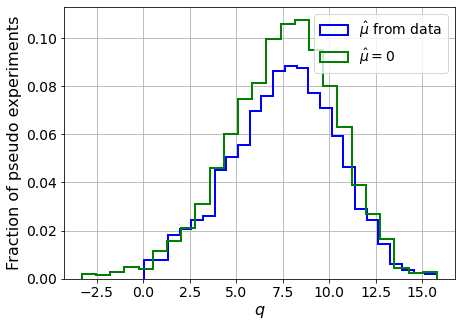

muhat mean:  -0.5481157996807005
Z_bins:  2.778697060023753
std Z_bins:  0.5115932329692092
Z_bins mu=0:  2.778697060023753
std Z_bins mu=0:  0.5304948480001582

--------

B_expected:  643
S_expected:  18



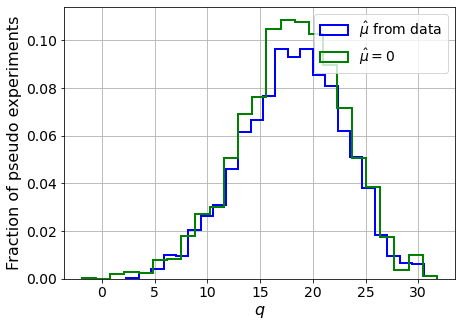

muhat mean:  -0.26055743170576756
Z_bins:  4.264880950984971
std Z_bins:  0.5704332082093927
Z_bins mu=0:  4.264880950984971
std Z_bins mu=0:  0.5827373753607862

--------

B_expected:  643
S_expected:  40



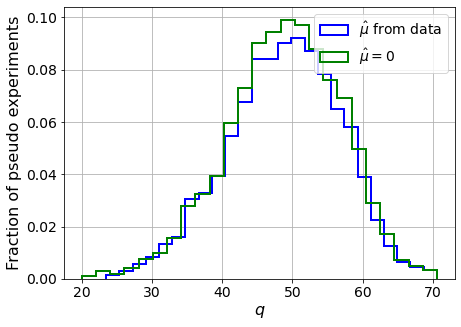

muhat mean:  -0.11851196131488405
Z_bins:  7.011058558685866
std Z_bins:  0.572145781702898
Z_bins mu=0:  7.011058558685866
std Z_bins mu=0:  0.5793188514558829

--------

B_expected:  643
S_expected:  85



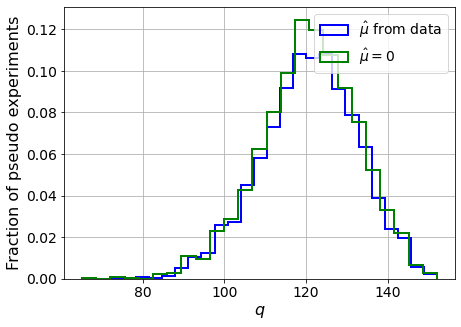

muhat mean:  -0.056224573080720534
Z_bins:  11.0109931567844
std Z_bins:  0.5366136096839479
Z_bins mu=0:  11.0109931567844
std Z_bins mu=0:  0.5415138818357276

--------

B_expected:  643
S_expected:  184



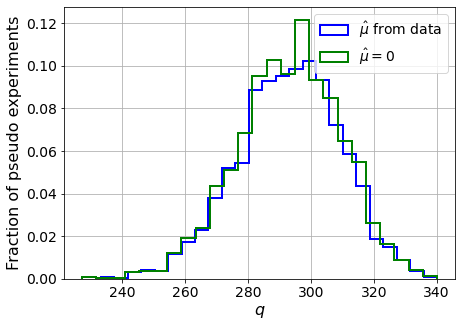

muhat mean:  -0.025015968309232965
Z_bins:  17.137451127791888
std Z_bins:  0.4783791710043543
Z_bins mu=0:  17.137451127791888
std Z_bins mu=0:  0.48126325242174794

--------

B_expected:  643
S_expected:  396



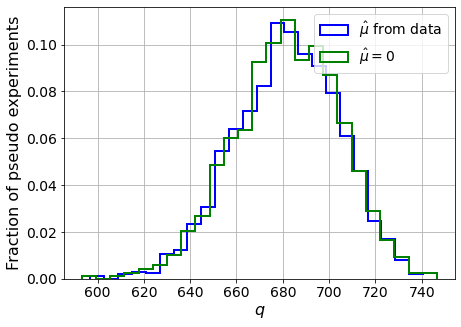

muhat mean:  -0.011720769668858802
Z_bins:  26.12555632455804
std Z_bins:  0.4315682297634278
Z_bins mu=0:  26.12555632455804
std Z_bins mu=0:  0.43364992358833016

--------

B_expected:  643
S_expected:  854



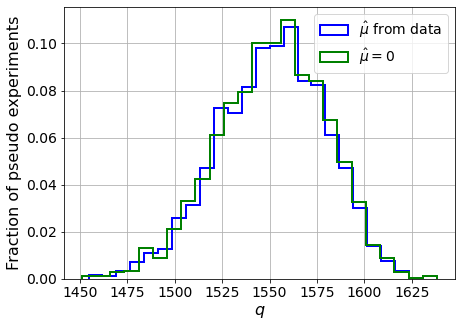

muhat mean:  -0.005354329878629579
Z_bins:  39.40795450379451
std Z_bins:  0.35881733907293195
Z_bins mu=0:  39.40795450379451
std Z_bins mu=0:  0.3599482401963806

--------


 FINAL RESULT:

[[0.7900695619745425, 0.23623445193154133, -4.678970054386301, 0.7900695619745425, 0.25976308729909725], [1.139956966057837, 0.31308007107220365, -2.2089732632574344, 1.139956966057837, 0.34623857326387064], [1.705589384673049, 0.417810539150344, -1.191137523804218, 1.705589384673049, 0.441860270448996], [2.778697060023753, 0.5115932329692092, -0.5481157996807005, 2.778697060023753, 0.5304948480001582], [4.264880950984971, 0.5704332082093927, -0.26055743170576756, 4.264880950984971, 0.5827373753607862], [7.011058558685866, 0.572145781702898, -0.11851196131488405, 7.011058558685866, 0.5793188514558829], [11.0109931567844, 0.5366136096839479, -0.056224573080720534, 11.0109931567844, 0.5415138818357276], [17.137451127791888, 0.4783791710043543, -0.025015968309232965, 17.137451127791888, 0.48126325242

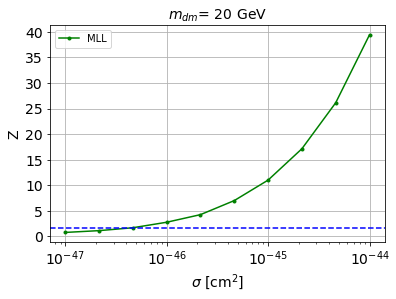


cross_MLL_164:  4.355398538802451e-47
cross_MLL_164_up:  2.7896387486549887e-47
cross_MLL_164_down:  6.392349407679256e-47

#########################


#########################

mDM =  35 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)

B_pbot.shape:  (5000

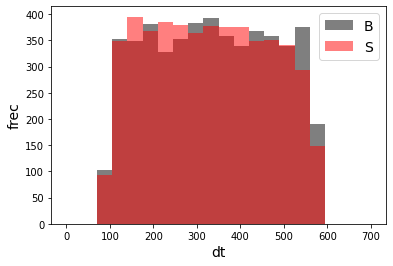

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35235)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35235)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35235)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68519	validation_1-logloss:0.68557
[1]	validation_0-logloss:0.67739	validation_1-logloss:0.67816
[2]	validation_0-logloss:0.66976	validation_1-logloss:0.67087
[3]	validation_0-logloss:0.66226	validation_1-logloss:0.66373
[4]	validation_0-logloss:0.65490	validation_1-logloss:0.65672
[5]	validation_0-logloss:0.64771	validation_1-logloss:0.64973
[6]	validation_0-logloss:0.64066	validation_1-logloss:0.64287
[7]	validation_0-logloss:0.63372	validation_1-logloss:0.63627
[8]	validation_0-logloss:0.62691	validation_1-logloss:0.62972
[9]	validation_0-logloss:0.62024	validation_1-logloss:0.62328
[10]	validation_0-logloss:0.61364	validation_1-logloss:0.61704
[11]	validation_0-logloss:0.60718	validation_1-logloss:0.61074
[12]	validation_0-logloss:0.60084	validation_1-logloss:0.60467
[13]	validation_0-logloss:0.59455	validation_1-logloss:0.59871
[14]	validation_0-logloss:0.58843	validation_1-logloss:0.59284
[15]	validation_0-logloss:0.58243	validation_1-logloss:0.58700
[1

[130]	validation_0-logloss:0.23754	validation_1-logloss:0.26962
[131]	validation_0-logloss:0.23619	validation_1-logloss:0.26849
[132]	validation_0-logloss:0.23475	validation_1-logloss:0.26725
[133]	validation_0-logloss:0.23341	validation_1-logloss:0.26605
[134]	validation_0-logloss:0.23207	validation_1-logloss:0.26491
[135]	validation_0-logloss:0.23075	validation_1-logloss:0.26387
[136]	validation_0-logloss:0.22938	validation_1-logloss:0.26270
[137]	validation_0-logloss:0.22809	validation_1-logloss:0.26153
[138]	validation_0-logloss:0.22681	validation_1-logloss:0.26047
[139]	validation_0-logloss:0.22548	validation_1-logloss:0.25939
[140]	validation_0-logloss:0.22424	validation_1-logloss:0.25840
[141]	validation_0-logloss:0.22295	validation_1-logloss:0.25733
[142]	validation_0-logloss:0.22162	validation_1-logloss:0.25617
[143]	validation_0-logloss:0.22031	validation_1-logloss:0.25503
[144]	validation_0-logloss:0.21901	validation_1-logloss:0.25401
[145]	validation_0-logloss:0.21782	valid

[259]	validation_0-logloss:0.12910	validation_1-logloss:0.18430
[260]	validation_0-logloss:0.12865	validation_1-logloss:0.18398
[261]	validation_0-logloss:0.12813	validation_1-logloss:0.18365
[262]	validation_0-logloss:0.12771	validation_1-logloss:0.18334
[263]	validation_0-logloss:0.12724	validation_1-logloss:0.18310
[264]	validation_0-logloss:0.12670	validation_1-logloss:0.18274
[265]	validation_0-logloss:0.12627	validation_1-logloss:0.18245
[266]	validation_0-logloss:0.12584	validation_1-logloss:0.18222
[267]	validation_0-logloss:0.12540	validation_1-logloss:0.18189
[268]	validation_0-logloss:0.12491	validation_1-logloss:0.18160
[269]	validation_0-logloss:0.12447	validation_1-logloss:0.18128
[270]	validation_0-logloss:0.12406	validation_1-logloss:0.18099
[271]	validation_0-logloss:0.12362	validation_1-logloss:0.18068
[272]	validation_0-logloss:0.12321	validation_1-logloss:0.18044
[273]	validation_0-logloss:0.12283	validation_1-logloss:0.18012
[274]	validation_0-logloss:0.12246	valid

[388]	validation_0-logloss:0.08952	validation_1-logloss:0.16326
[389]	validation_0-logloss:0.08933	validation_1-logloss:0.16320
[390]	validation_0-logloss:0.08914	validation_1-logloss:0.16308
[391]	validation_0-logloss:0.08898	validation_1-logloss:0.16300
[392]	validation_0-logloss:0.08874	validation_1-logloss:0.16299
[393]	validation_0-logloss:0.08857	validation_1-logloss:0.16296
[394]	validation_0-logloss:0.08835	validation_1-logloss:0.16293
[395]	validation_0-logloss:0.08818	validation_1-logloss:0.16288
[396]	validation_0-logloss:0.08796	validation_1-logloss:0.16291
[397]	validation_0-logloss:0.08776	validation_1-logloss:0.16288
[398]	validation_0-logloss:0.08753	validation_1-logloss:0.16286
[399]	validation_0-logloss:0.08736	validation_1-logloss:0.16284
[400]	validation_0-logloss:0.08717	validation_1-logloss:0.16275
[401]	validation_0-logloss:0.08701	validation_1-logloss:0.16269
[402]	validation_0-logloss:0.08684	validation_1-logloss:0.16267
[403]	validation_0-logloss:0.08663	valid

[517]	validation_0-logloss:0.06711	validation_1-logloss:0.15793
[518]	validation_0-logloss:0.06691	validation_1-logloss:0.15795
[519]	validation_0-logloss:0.06678	validation_1-logloss:0.15795
[520]	validation_0-logloss:0.06665	validation_1-logloss:0.15789
[521]	validation_0-logloss:0.06652	validation_1-logloss:0.15790
[522]	validation_0-logloss:0.06638	validation_1-logloss:0.15788
[523]	validation_0-logloss:0.06620	validation_1-logloss:0.15782
[524]	validation_0-logloss:0.06608	validation_1-logloss:0.15775
[525]	validation_0-logloss:0.06593	validation_1-logloss:0.15768
[526]	validation_0-logloss:0.06581	validation_1-logloss:0.15765
[527]	validation_0-logloss:0.06567	validation_1-logloss:0.15755
[528]	validation_0-logloss:0.06552	validation_1-logloss:0.15757
[529]	validation_0-logloss:0.06541	validation_1-logloss:0.15761
[530]	validation_0-logloss:0.06526	validation_1-logloss:0.15756
[531]	validation_0-logloss:0.06513	validation_1-logloss:0.15752
[532]	validation_0-logloss:0.06500	valid

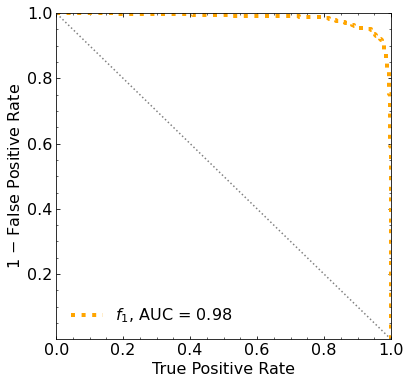

Classification score:


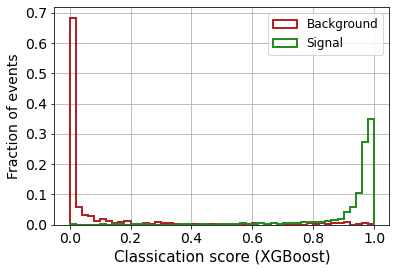


 ROC-AUC =  0.9846806946919878


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 346.08387094 293.34633348 238.4789495
 178.59529476 112.54002367  43.45276774 -31.56125294 -98.47375629]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 330.87106251 295.98947374 252.40448628
 197.

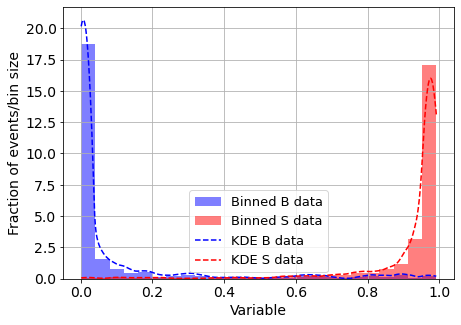

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



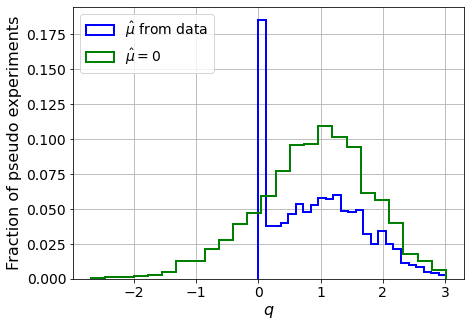

muhat mean:  -1.4646788475429495
Z_bins:  0.9800667174844242
std Z_bins:  0.3736329883404744
Z_bins mu=0:  0.9800667174844242
std Z_bins mu=0:  0.4592289137409456

--------

B_expected:  643
S_expected:  4



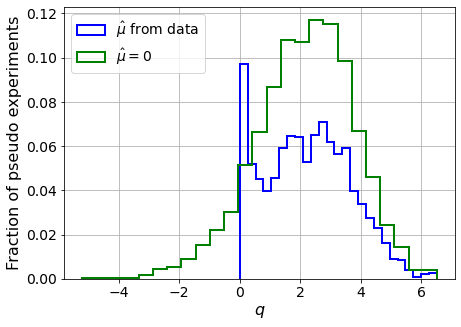

muhat mean:  -0.7585030350376032
Z_bins:  1.5012303948831505
std Z_bins:  0.4691755746362479
Z_bins mu=0:  1.5012303948831505
std Z_bins mu=0:  0.5391306773101567

--------

B_expected:  643
S_expected:  8



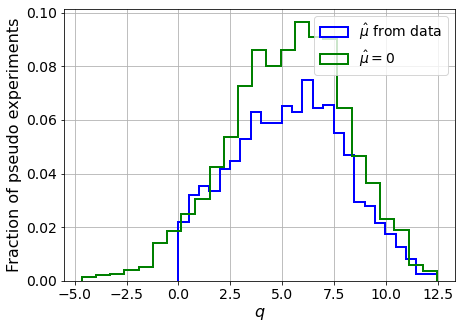

muhat mean:  -0.36240411125610245
Z_bins:  2.3267259262878377
std Z_bins:  0.5698469835365497
Z_bins mu=0:  2.3267259262878377
std Z_bins mu=0:  0.6159455890498097

--------

B_expected:  643
S_expected:  18



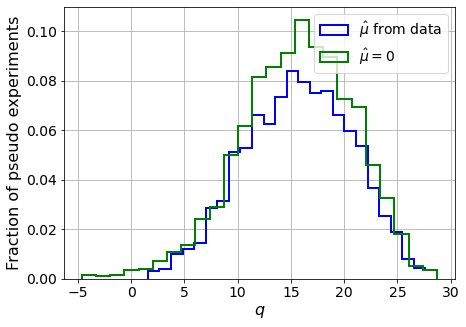

muhat mean:  -0.15932675146100228
Z_bins:  3.9730908690176636
std Z_bins:  0.631763180687426
Z_bins mu=0:  3.9730908690176636
std Z_bins mu=0:  0.6654289464525307

--------

B_expected:  643
S_expected:  39



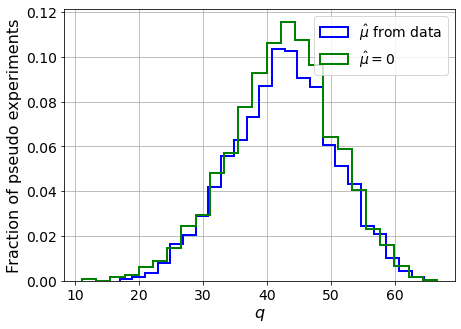

muhat mean:  -0.08029302046683691
Z_bins:  6.538675546606747
std Z_bins:  0.6093722721662103
Z_bins mu=0:  6.538675546606747
std Z_bins mu=0:  0.6264878750263899

--------

B_expected:  643
S_expected:  83



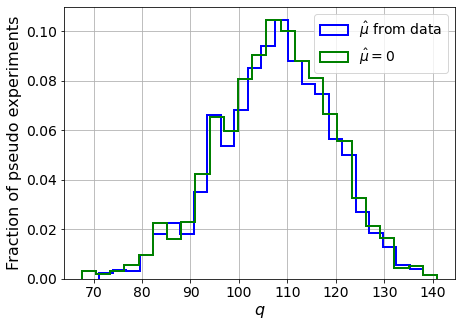

muhat mean:  -0.03148412871252054
Z_bins:  10.385864323700561
std Z_bins:  0.5617817106761733
Z_bins mu=0:  10.385864323700561
std Z_bins mu=0:  0.5733123437544428

--------

B_expected:  643
S_expected:  179



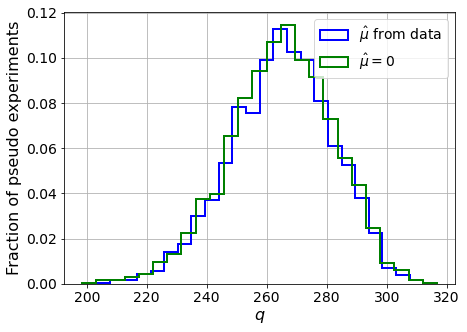

muhat mean:  -0.014545347832077225
Z_bins:  16.296552846410343
std Z_bins:  0.5220538083405434
Z_bins mu=0:  16.296552846410343
std Z_bins mu=0:  0.5298977220908501

--------

B_expected:  643
S_expected:  385



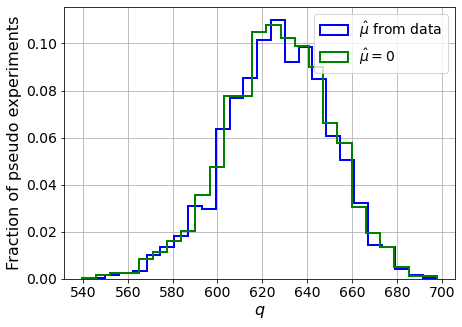

muhat mean:  -0.0073428141322300355
Z_bins:  25.051591739936008
std Z_bins:  0.4641029162113279
Z_bins mu=0:  25.051591739936008
std Z_bins mu=0:  0.46933509864820083

--------

B_expected:  643
S_expected:  830



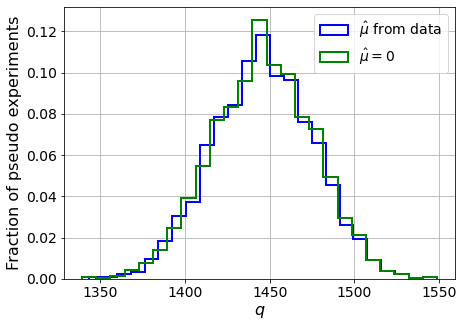

muhat mean:  -0.004026686258628343
Z_bins:  38.031496568948015
std Z_bins:  0.38986948748613454
Z_bins mu=0:  38.031496568948015
std Z_bins mu=0:  0.3925082546829253

--------

B_expected:  643
S_expected:  1787



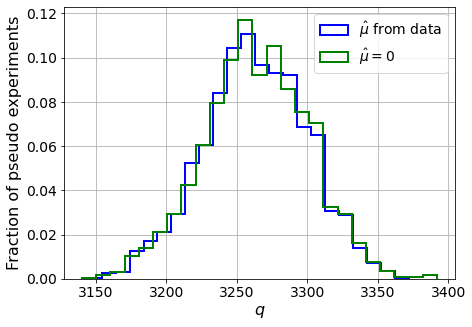

muhat mean:  -0.0017590203984623172
Z_bins:  57.12706260332446
std Z_bins:  0.3245382226227693
Z_bins mu=0:  57.12706260332446
std Z_bins mu=0:  0.3259697907727051

--------


 FINAL RESULT:

[[0.9800667174844242, 0.3736329883404744, -1.4646788475429495, 0.9800667174844242, 0.4592289137409456], [1.5012303948831505, 0.4691755746362479, -0.7585030350376032, 1.5012303948831505, 0.5391306773101567], [2.3267259262878377, 0.5698469835365497, -0.36240411125610245, 2.3267259262878377, 0.6159455890498097], [3.9730908690176636, 0.631763180687426, -0.15932675146100228, 3.9730908690176636, 0.6654289464525307], [6.538675546606747, 0.6093722721662103, -0.08029302046683691, 6.538675546606747, 0.6264878750263899], [10.385864323700561, 0.5617817106761733, -0.03148412871252054, 10.385864323700561, 0.5733123437544428], [16.296552846410343, 0.5220538083405434, -0.014545347832077225, 16.296552846410343, 0.5298977220908501], [25.051591739936008, 0.4641029162113279, -0.0073428141322300355, 25.051591739936008

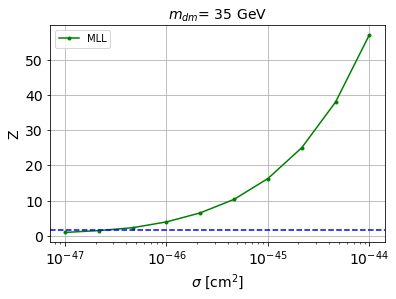


cross_MLL_164:  2.53615996013505e-47
cross_MLL_164_up:  1.479696250436344e-47
cross_MLL_164_down:  4.2628851456812856e-47

#########################


#########################

mDM =  50 GeV


max_pS1_both lenght:  152

X_mon1_train :  (6375, 152)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 152)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 152)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)

B_pbot.shape:  (5000,

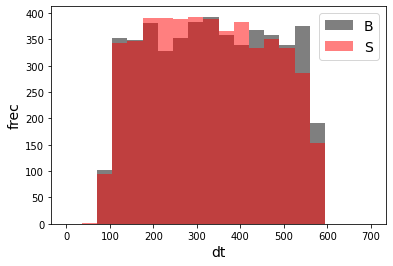

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35235)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35235)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35235)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68559	validation_1-logloss:0.68593
[1]	validation_0-logloss:0.67820	validation_1-logloss:0.67885
[2]	validation_0-logloss:0.67093	validation_1-logloss:0.67192
[3]	validation_0-logloss:0.66382	validation_1-logloss:0.66512
[4]	validation_0-logloss:0.65685	validation_1-logloss:0.65857
[5]	validation_0-logloss:0.65000	validation_1-logloss:0.65208
[6]	validation_0-logloss:0.64326	validation_1-logloss:0.64558
[7]	validation_0-logloss:0.63667	validation_1-logloss:0.63934
[8]	validation_0-logloss:0.63020	validation_1-logloss:0.63322
[9]	validation_0-logloss:0.62384	validation_1-logloss:0.62725
[10]	validation_0-logloss:0.61758	validation_1-logloss:0.62131
[11]	validation_0-logloss:0.61141	validation_1-logloss:0.61535
[12]	validation_0-logloss:0.60534	validation_1-logloss:0.60967
[13]	validation_0-logloss:0.59937	validation_1-logloss:0.60405
[14]	validation_0-logloss:0.59354	validation_1-logloss:0.59856
[15]	validation_0-logloss:0.58779	validation_1-logloss:0.59314
[1

[130]	validation_0-logloss:0.25753	validation_1-logloss:0.29801
[131]	validation_0-logloss:0.25617	validation_1-logloss:0.29690
[132]	validation_0-logloss:0.25484	validation_1-logloss:0.29580
[133]	validation_0-logloss:0.25351	validation_1-logloss:0.29474
[134]	validation_0-logloss:0.25222	validation_1-logloss:0.29380
[135]	validation_0-logloss:0.25077	validation_1-logloss:0.29260
[136]	validation_0-logloss:0.24950	validation_1-logloss:0.29163
[137]	validation_0-logloss:0.24824	validation_1-logloss:0.29063
[138]	validation_0-logloss:0.24698	validation_1-logloss:0.28971
[139]	validation_0-logloss:0.24573	validation_1-logloss:0.28881
[140]	validation_0-logloss:0.24438	validation_1-logloss:0.28765
[141]	validation_0-logloss:0.24304	validation_1-logloss:0.28656
[142]	validation_0-logloss:0.24184	validation_1-logloss:0.28562
[143]	validation_0-logloss:0.24053	validation_1-logloss:0.28457
[144]	validation_0-logloss:0.23926	validation_1-logloss:0.28357
[145]	validation_0-logloss:0.23810	valid

[259]	validation_0-logloss:0.14945	validation_1-logloss:0.22055
[260]	validation_0-logloss:0.14899	validation_1-logloss:0.22021
[261]	validation_0-logloss:0.14850	validation_1-logloss:0.21998
[262]	validation_0-logloss:0.14803	validation_1-logloss:0.21966
[263]	validation_0-logloss:0.14756	validation_1-logloss:0.21933
[264]	validation_0-logloss:0.14712	validation_1-logloss:0.21913
[265]	validation_0-logloss:0.14667	validation_1-logloss:0.21891
[266]	validation_0-logloss:0.14618	validation_1-logloss:0.21865
[267]	validation_0-logloss:0.14575	validation_1-logloss:0.21839
[268]	validation_0-logloss:0.14526	validation_1-logloss:0.21804
[269]	validation_0-logloss:0.14484	validation_1-logloss:0.21778
[270]	validation_0-logloss:0.14441	validation_1-logloss:0.21748
[271]	validation_0-logloss:0.14396	validation_1-logloss:0.21724
[272]	validation_0-logloss:0.14353	validation_1-logloss:0.21708
[273]	validation_0-logloss:0.14311	validation_1-logloss:0.21682
[274]	validation_0-logloss:0.14270	valid

[388]	validation_0-logloss:0.10534	validation_1-logloss:0.20056
[389]	validation_0-logloss:0.10515	validation_1-logloss:0.20050
[390]	validation_0-logloss:0.10496	validation_1-logloss:0.20037
[391]	validation_0-logloss:0.10469	validation_1-logloss:0.20033
[392]	validation_0-logloss:0.10440	validation_1-logloss:0.20014
[393]	validation_0-logloss:0.10417	validation_1-logloss:0.20007
[394]	validation_0-logloss:0.10391	validation_1-logloss:0.19997
[395]	validation_0-logloss:0.10373	validation_1-logloss:0.19997
[396]	validation_0-logloss:0.10343	validation_1-logloss:0.19989
[397]	validation_0-logloss:0.10320	validation_1-logloss:0.19986
[398]	validation_0-logloss:0.10301	validation_1-logloss:0.19981
[399]	validation_0-logloss:0.10275	validation_1-logloss:0.19978
[400]	validation_0-logloss:0.10245	validation_1-logloss:0.19968
[401]	validation_0-logloss:0.10227	validation_1-logloss:0.19957
[402]	validation_0-logloss:0.10203	validation_1-logloss:0.19953
[403]	validation_0-logloss:0.10185	valid

[517]	validation_0-logloss:0.07900	validation_1-logloss:0.19295
[518]	validation_0-logloss:0.07888	validation_1-logloss:0.19293
[519]	validation_0-logloss:0.07868	validation_1-logloss:0.19285
[520]	validation_0-logloss:0.07851	validation_1-logloss:0.19285
[521]	validation_0-logloss:0.07835	validation_1-logloss:0.19282
[522]	validation_0-logloss:0.07820	validation_1-logloss:0.19275
[523]	validation_0-logloss:0.07806	validation_1-logloss:0.19271
[524]	validation_0-logloss:0.07789	validation_1-logloss:0.19268
[525]	validation_0-logloss:0.07774	validation_1-logloss:0.19262
[526]	validation_0-logloss:0.07755	validation_1-logloss:0.19257
[527]	validation_0-logloss:0.07739	validation_1-logloss:0.19256
[528]	validation_0-logloss:0.07726	validation_1-logloss:0.19251
[529]	validation_0-logloss:0.07710	validation_1-logloss:0.19246
[530]	validation_0-logloss:0.07695	validation_1-logloss:0.19247
[531]	validation_0-logloss:0.07673	validation_1-logloss:0.19250
[532]	validation_0-logloss:0.07658	valid

[646]	validation_0-logloss:0.06181	validation_1-logloss:0.18981
[647]	validation_0-logloss:0.06174	validation_1-logloss:0.18980
[648]	validation_0-logloss:0.06159	validation_1-logloss:0.18985
[649]	validation_0-logloss:0.06151	validation_1-logloss:0.18988
[650]	validation_0-logloss:0.06143	validation_1-logloss:0.18988
[651]	validation_0-logloss:0.06133	validation_1-logloss:0.18990
[652]	validation_0-logloss:0.06123	validation_1-logloss:0.18984
[653]	validation_0-logloss:0.06111	validation_1-logloss:0.18980
[654]	validation_0-logloss:0.06101	validation_1-logloss:0.18984
[655]	validation_0-logloss:0.06089	validation_1-logloss:0.18980
[656]	validation_0-logloss:0.06074	validation_1-logloss:0.18975
[657]	validation_0-logloss:0.06061	validation_1-logloss:0.18977
[658]	validation_0-logloss:0.06051	validation_1-logloss:0.18975
[659]	validation_0-logloss:0.06039	validation_1-logloss:0.18974
[660]	validation_0-logloss:0.06031	validation_1-logloss:0.18972
[661]	validation_0-logloss:0.06021	valid

[775]	validation_0-logloss:0.04934	validation_1-logloss:0.18757
[776]	validation_0-logloss:0.04926	validation_1-logloss:0.18757
[777]	validation_0-logloss:0.04915	validation_1-logloss:0.18756
[778]	validation_0-logloss:0.04909	validation_1-logloss:0.18751
[779]	validation_0-logloss:0.04901	validation_1-logloss:0.18749
[780]	validation_0-logloss:0.04895	validation_1-logloss:0.18748
[781]	validation_0-logloss:0.04885	validation_1-logloss:0.18746
[782]	validation_0-logloss:0.04882	validation_1-logloss:0.18743
[783]	validation_0-logloss:0.04874	validation_1-logloss:0.18748
[784]	validation_0-logloss:0.04862	validation_1-logloss:0.18751
[785]	validation_0-logloss:0.04856	validation_1-logloss:0.18747
[786]	validation_0-logloss:0.04848	validation_1-logloss:0.18749
[787]	validation_0-logloss:0.04840	validation_1-logloss:0.18748
[788]	validation_0-logloss:0.04829	validation_1-logloss:0.18753
[789]	validation_0-logloss:0.04817	validation_1-logloss:0.18754
[790]	validation_0-logloss:0.04810	valid

[904]	validation_0-logloss:0.04042	validation_1-logloss:0.18667
[905]	validation_0-logloss:0.04037	validation_1-logloss:0.18667
[906]	validation_0-logloss:0.04034	validation_1-logloss:0.18667
[907]	validation_0-logloss:0.04027	validation_1-logloss:0.18667
[908]	validation_0-logloss:0.04021	validation_1-logloss:0.18671
[909]	validation_0-logloss:0.04017	validation_1-logloss:0.18668
[910]	validation_0-logloss:0.04010	validation_1-logloss:0.18668
[911]	validation_0-logloss:0.04007	validation_1-logloss:0.18666
[912]	validation_0-logloss:0.03997	validation_1-logloss:0.18666
[913]	validation_0-logloss:0.03991	validation_1-logloss:0.18664
[914]	validation_0-logloss:0.03984	validation_1-logloss:0.18666
[915]	validation_0-logloss:0.03979	validation_1-logloss:0.18666
[916]	validation_0-logloss:0.03975	validation_1-logloss:0.18669
[917]	validation_0-logloss:0.03970	validation_1-logloss:0.18669
[918]	validation_0-logloss:0.03963	validation_1-logloss:0.18670
[919]	validation_0-logloss:0.03954	valid

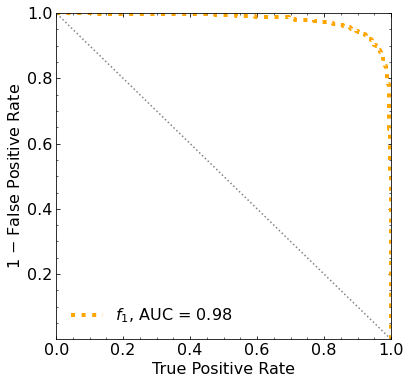

Classification score:


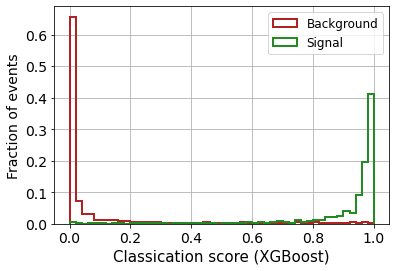


 ROC-AUC =  0.9789336344826173


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 326.37268575 277.54111683 223.53589431
 165.13079265 103.15576264  36.26316123 -33.81457939 -99.86141981]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 286.90545849 256.69641631 217.88940156
 170

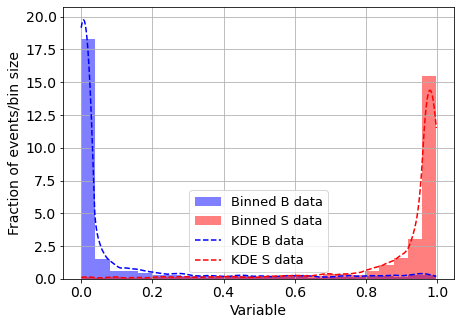

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


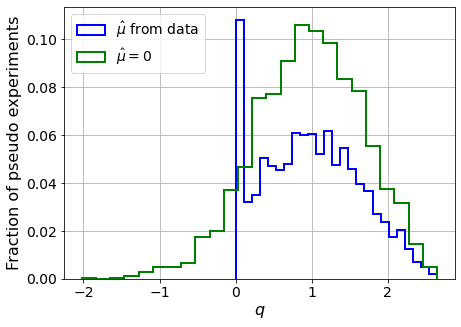

muhat mean:  -2.6320731626167246
Z_bins:  0.9903804194275138
std Z_bins:  0.31970184308668725
Z_bins mu=0:  0.9903804194275138
std Z_bins mu=0:  0.3552001018045686

--------

B_expected:  643
S_expected:  4



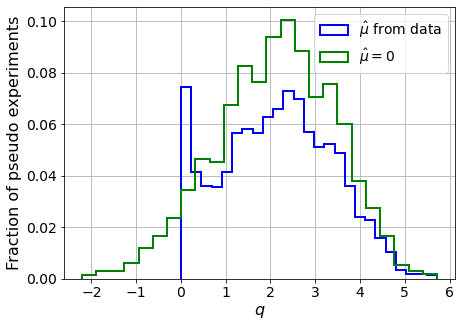

muhat mean:  -1.3669210519220876
Z_bins:  1.479368025509221
std Z_bins:  0.416873833310604
Z_bins mu=0:  1.479368025509221
std Z_bins mu=0:  0.4478198878867703

--------

B_expected:  643
S_expected:  9



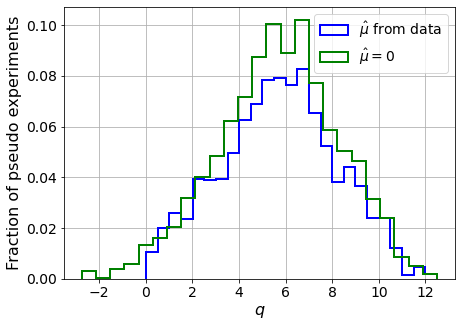

muhat mean:  -0.5612916672381315
Z_bins:  2.3930170804441078
std Z_bins:  0.5195848458016487
Z_bins mu=0:  2.3930170804441078
std Z_bins mu=0:  0.5411826145172284

--------

B_expected:  643
S_expected:  19



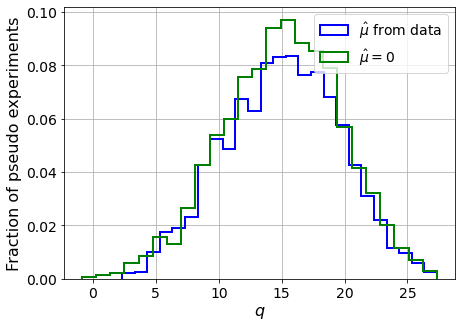

muhat mean:  -0.26465090782550693
Z_bins:  3.897877956267111
std Z_bins:  0.586067804607515
Z_bins mu=0:  3.897877956267111
std Z_bins mu=0:  0.5998464446273915

--------

B_expected:  643
S_expected:  41



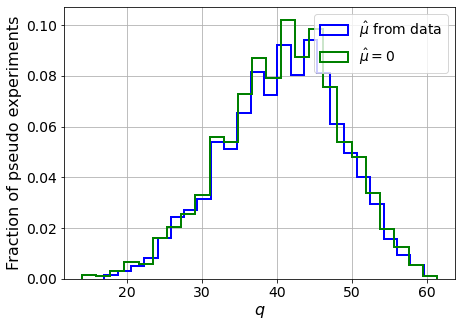

muhat mean:  -0.13459489294879748
Z_bins:  6.4143297796246115
std Z_bins:  0.604399330436514
Z_bins mu=0:  6.4143297796246115
std Z_bins mu=0:  0.6135118104841356

--------

B_expected:  643
S_expected:  89



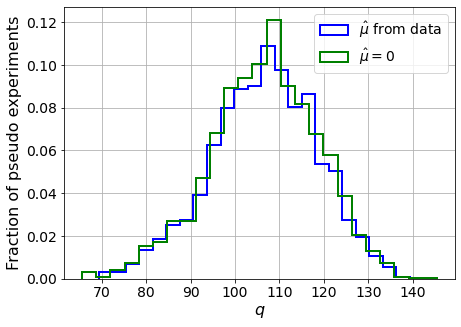

muhat mean:  -0.059998559863588104
Z_bins:  10.348341123215736
std Z_bins:  0.5821430520571627
Z_bins mu=0:  10.348341123215736
std Z_bins mu=0:  0.5890119728090573

--------

B_expected:  643
S_expected:  192



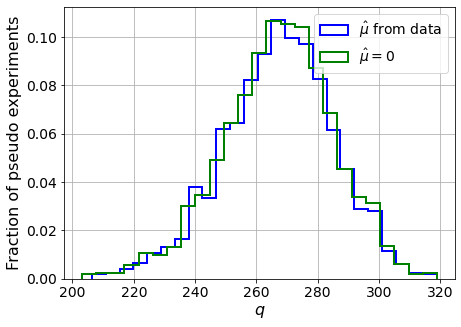

muhat mean:  -0.02608433717773276
Z_bins:  16.368753105724036
std Z_bins:  0.5502276376034367
Z_bins mu=0:  16.368753105724036
std Z_bins mu=0:  0.5551501686782441

--------

B_expected:  643
S_expected:  413



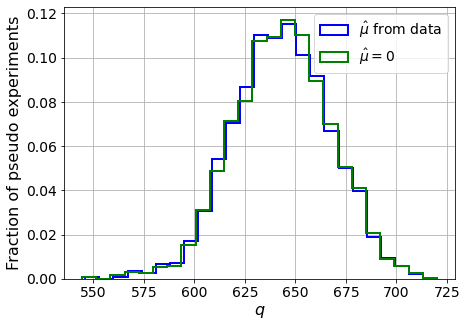

muhat mean:  -0.012145516024734855
Z_bins:  25.36794242366817
std Z_bins:  0.4749495323269975
Z_bins mu=0:  25.36794242366817
std Z_bins mu=0:  0.4775130569566771

--------

B_expected:  643
S_expected:  889



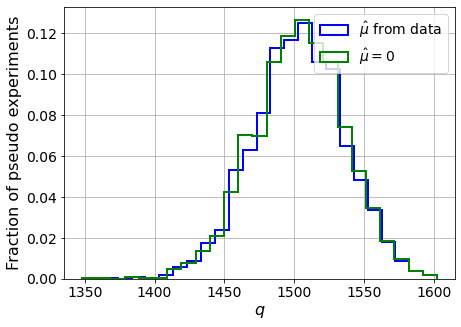

muhat mean:  -0.005691981160384355
Z_bins:  38.78144344615675
std Z_bins:  0.42280450282824567
Z_bins mu=0:  38.78144344615675
std Z_bins mu=0:  0.4245018675675286

--------

B_expected:  643
S_expected:  1915



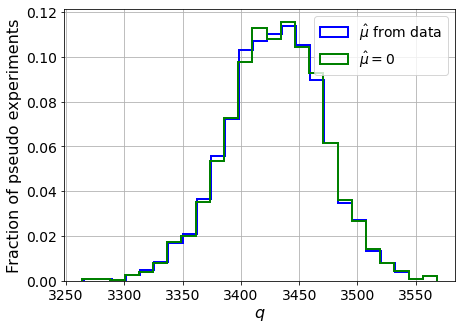

muhat mean:  -0.0028514448553898933
Z_bins:  58.56963377208897
std Z_bins:  0.3596677313037863
Z_bins mu=0:  58.56963377208897
std Z_bins mu=0:  0.36028660001797136

--------


 FINAL RESULT:

[[0.9903804194275138, 0.31970184308668725, -2.6320731626167246, 0.9903804194275138, 0.3552001018045686], [1.479368025509221, 0.416873833310604, -1.3669210519220876, 1.479368025509221, 0.4478198878867703], [2.3930170804441078, 0.5195848458016487, -0.5612916672381315, 2.3930170804441078, 0.5411826145172284], [3.897877956267111, 0.586067804607515, -0.26465090782550693, 3.897877956267111, 0.5998464446273915], [6.4143297796246115, 0.604399330436514, -0.13459489294879748, 6.4143297796246115, 0.6135118104841356], [10.348341123215736, 0.5821430520571627, -0.059998559863588104, 10.348341123215736, 0.5890119728090573], [16.368753105724036, 0.5502276376034367, -0.02608433717773276, 16.368753105724036, 0.5551501686782441], [25.36794242366817, 0.4749495323269975, -0.012145516024734855, 25.36794242366817, 0.47

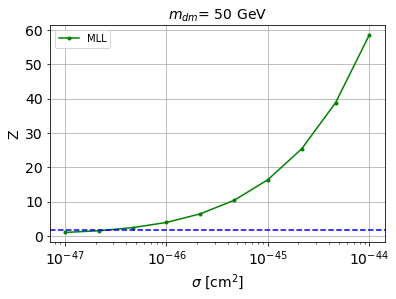


cross_MLL_164:  2.5468648774880433e-47
cross_MLL_164_up:  1.6402834640105864e-47
cross_MLL_164_down:  3.8897631056353416e-47

#########################


#########################

mDM =  100 GeV


max_pS1_both lenght:  153

X_mon1_train :  (6375, 153)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 153)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 153)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)

B_pbot.shape:  (5

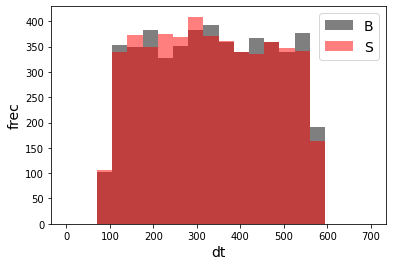

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35236)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35236)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35236)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68607	validation_1-logloss:0.68664
[1]	validation_0-logloss:0.67913	validation_1-logloss:0.68018
[2]	validation_0-logloss:0.67235	validation_1-logloss:0.67398
[3]	validation_0-logloss:0.66568	validation_1-logloss:0.66780
[4]	validation_0-logloss:0.65914	validation_1-logloss:0.66180
[5]	validation_0-logloss:0.65272	validation_1-logloss:0.65580
[6]	validation_0-logloss:0.64639	validation_1-logloss:0.64998
[7]	validation_0-logloss:0.64022	validation_1-logloss:0.64414
[8]	validation_0-logloss:0.63411	validation_1-logloss:0.63853
[9]	validation_0-logloss:0.62813	validation_1-logloss:0.63306
[10]	validation_0-logloss:0.62227	validation_1-logloss:0.62757
[11]	validation_0-logloss:0.61645	validation_1-logloss:0.62222
[12]	validation_0-logloss:0.61076	validation_1-logloss:0.61699
[13]	validation_0-logloss:0.60513	validation_1-logloss:0.61176
[14]	validation_0-logloss:0.59961	validation_1-logloss:0.60667
[15]	validation_0-logloss:0.59429	validation_1-logloss:0.60169
[1

[130]	validation_0-logloss:0.28111	validation_1-logloss:0.32648
[131]	validation_0-logloss:0.27982	validation_1-logloss:0.32550
[132]	validation_0-logloss:0.27855	validation_1-logloss:0.32444
[133]	validation_0-logloss:0.27729	validation_1-logloss:0.32342
[134]	validation_0-logloss:0.27600	validation_1-logloss:0.32240
[135]	validation_0-logloss:0.27480	validation_1-logloss:0.32138
[136]	validation_0-logloss:0.27342	validation_1-logloss:0.32022
[137]	validation_0-logloss:0.27211	validation_1-logloss:0.31918
[138]	validation_0-logloss:0.27083	validation_1-logloss:0.31810
[139]	validation_0-logloss:0.26949	validation_1-logloss:0.31697
[140]	validation_0-logloss:0.26824	validation_1-logloss:0.31588
[141]	validation_0-logloss:0.26692	validation_1-logloss:0.31480
[142]	validation_0-logloss:0.26573	validation_1-logloss:0.31387
[143]	validation_0-logloss:0.26454	validation_1-logloss:0.31280
[144]	validation_0-logloss:0.26329	validation_1-logloss:0.31181
[145]	validation_0-logloss:0.26207	valid

[259]	validation_0-logloss:0.17368	validation_1-logloss:0.24640
[260]	validation_0-logloss:0.17321	validation_1-logloss:0.24605
[261]	validation_0-logloss:0.17274	validation_1-logloss:0.24586
[262]	validation_0-logloss:0.17223	validation_1-logloss:0.24549
[263]	validation_0-logloss:0.17165	validation_1-logloss:0.24512
[264]	validation_0-logloss:0.17119	validation_1-logloss:0.24487
[265]	validation_0-logloss:0.17066	validation_1-logloss:0.24457
[266]	validation_0-logloss:0.17013	validation_1-logloss:0.24421
[267]	validation_0-logloss:0.16970	validation_1-logloss:0.24396
[268]	validation_0-logloss:0.16921	validation_1-logloss:0.24381
[269]	validation_0-logloss:0.16874	validation_1-logloss:0.24358
[270]	validation_0-logloss:0.16821	validation_1-logloss:0.24331
[271]	validation_0-logloss:0.16772	validation_1-logloss:0.24310
[272]	validation_0-logloss:0.16727	validation_1-logloss:0.24282
[273]	validation_0-logloss:0.16679	validation_1-logloss:0.24248
[274]	validation_0-logloss:0.16633	valid

[388]	validation_0-logloss:0.12545	validation_1-logloss:0.22411
[389]	validation_0-logloss:0.12514	validation_1-logloss:0.22406
[390]	validation_0-logloss:0.12488	validation_1-logloss:0.22398
[391]	validation_0-logloss:0.12463	validation_1-logloss:0.22391
[392]	validation_0-logloss:0.12427	validation_1-logloss:0.22375
[393]	validation_0-logloss:0.12401	validation_1-logloss:0.22375
[394]	validation_0-logloss:0.12371	validation_1-logloss:0.22361
[395]	validation_0-logloss:0.12342	validation_1-logloss:0.22353
[396]	validation_0-logloss:0.12317	validation_1-logloss:0.22344
[397]	validation_0-logloss:0.12283	validation_1-logloss:0.22331
[398]	validation_0-logloss:0.12259	validation_1-logloss:0.22323
[399]	validation_0-logloss:0.12238	validation_1-logloss:0.22311
[400]	validation_0-logloss:0.12208	validation_1-logloss:0.22300
[401]	validation_0-logloss:0.12178	validation_1-logloss:0.22295
[402]	validation_0-logloss:0.12154	validation_1-logloss:0.22294
[403]	validation_0-logloss:0.12124	valid

[517]	validation_0-logloss:0.09648	validation_1-logloss:0.21524
[518]	validation_0-logloss:0.09633	validation_1-logloss:0.21510
[519]	validation_0-logloss:0.09620	validation_1-logloss:0.21497
[520]	validation_0-logloss:0.09604	validation_1-logloss:0.21493
[521]	validation_0-logloss:0.09582	validation_1-logloss:0.21493
[522]	validation_0-logloss:0.09561	validation_1-logloss:0.21482
[523]	validation_0-logloss:0.09545	validation_1-logloss:0.21476
[524]	validation_0-logloss:0.09524	validation_1-logloss:0.21463
[525]	validation_0-logloss:0.09500	validation_1-logloss:0.21459
[526]	validation_0-logloss:0.09487	validation_1-logloss:0.21459
[527]	validation_0-logloss:0.09467	validation_1-logloss:0.21452
[528]	validation_0-logloss:0.09444	validation_1-logloss:0.21449
[529]	validation_0-logloss:0.09431	validation_1-logloss:0.21438
[530]	validation_0-logloss:0.09410	validation_1-logloss:0.21435
[531]	validation_0-logloss:0.09394	validation_1-logloss:0.21441
[532]	validation_0-logloss:0.09379	valid

[646]	validation_0-logloss:0.07716	validation_1-logloss:0.21071
[647]	validation_0-logloss:0.07705	validation_1-logloss:0.21068
[648]	validation_0-logloss:0.07697	validation_1-logloss:0.21071
[649]	validation_0-logloss:0.07687	validation_1-logloss:0.21068
[650]	validation_0-logloss:0.07668	validation_1-logloss:0.21066
[651]	validation_0-logloss:0.07654	validation_1-logloss:0.21065
[652]	validation_0-logloss:0.07640	validation_1-logloss:0.21063
[653]	validation_0-logloss:0.07629	validation_1-logloss:0.21064
[654]	validation_0-logloss:0.07620	validation_1-logloss:0.21070
[655]	validation_0-logloss:0.07611	validation_1-logloss:0.21071
[656]	validation_0-logloss:0.07601	validation_1-logloss:0.21064
[657]	validation_0-logloss:0.07592	validation_1-logloss:0.21060
[658]	validation_0-logloss:0.07578	validation_1-logloss:0.21051
[659]	validation_0-logloss:0.07570	validation_1-logloss:0.21054
[660]	validation_0-logloss:0.07553	validation_1-logloss:0.21051
[661]	validation_0-logloss:0.07542	valid

[775]	validation_0-logloss:0.06293	validation_1-logloss:0.20851
[776]	validation_0-logloss:0.06279	validation_1-logloss:0.20851
[777]	validation_0-logloss:0.06272	validation_1-logloss:0.20853
[778]	validation_0-logloss:0.06264	validation_1-logloss:0.20852
[779]	validation_0-logloss:0.06257	validation_1-logloss:0.20850
[780]	validation_0-logloss:0.06245	validation_1-logloss:0.20842
[781]	validation_0-logloss:0.06237	validation_1-logloss:0.20841
[782]	validation_0-logloss:0.06226	validation_1-logloss:0.20839
[783]	validation_0-logloss:0.06213	validation_1-logloss:0.20830
[784]	validation_0-logloss:0.06205	validation_1-logloss:0.20832
[785]	validation_0-logloss:0.06195	validation_1-logloss:0.20826
[786]	validation_0-logloss:0.06184	validation_1-logloss:0.20830
[787]	validation_0-logloss:0.06174	validation_1-logloss:0.20831
[788]	validation_0-logloss:0.06167	validation_1-logloss:0.20829
[789]	validation_0-logloss:0.06161	validation_1-logloss:0.20827
[790]	validation_0-logloss:0.06152	valid

[904]	validation_0-logloss:0.05178	validation_1-logloss:0.20712
[905]	validation_0-logloss:0.05171	validation_1-logloss:0.20713
[906]	validation_0-logloss:0.05168	validation_1-logloss:0.20713
[907]	validation_0-logloss:0.05159	validation_1-logloss:0.20718
[908]	validation_0-logloss:0.05154	validation_1-logloss:0.20717
[909]	validation_0-logloss:0.05146	validation_1-logloss:0.20716
[910]	validation_0-logloss:0.05142	validation_1-logloss:0.20717
[911]	validation_0-logloss:0.05136	validation_1-logloss:0.20723
[912]	validation_0-logloss:0.05128	validation_1-logloss:0.20731
[913]	validation_0-logloss:0.05119	validation_1-logloss:0.20726
[914]	validation_0-logloss:0.05115	validation_1-logloss:0.20724
[915]	validation_0-logloss:0.05103	validation_1-logloss:0.20726
[916]	validation_0-logloss:0.05095	validation_1-logloss:0.20722
[917]	validation_0-logloss:0.05088	validation_1-logloss:0.20719
[918]	validation_0-logloss:0.05079	validation_1-logloss:0.20722
[919]	validation_0-logloss:0.05075	valid

[1032]	validation_0-logloss:0.04322	validation_1-logloss:0.20721
[1033]	validation_0-logloss:0.04316	validation_1-logloss:0.20713
[1034]	validation_0-logloss:0.04306	validation_1-logloss:0.20714
[1035]	validation_0-logloss:0.04301	validation_1-logloss:0.20719
[1036]	validation_0-logloss:0.04292	validation_1-logloss:0.20722
[1037]	validation_0-logloss:0.04283	validation_1-logloss:0.20721
[1038]	validation_0-logloss:0.04277	validation_1-logloss:0.20718
[1039]	validation_0-logloss:0.04271	validation_1-logloss:0.20718
[1040]	validation_0-logloss:0.04266	validation_1-logloss:0.20721
[1041]	validation_0-logloss:0.04260	validation_1-logloss:0.20720
[1042]	validation_0-logloss:0.04254	validation_1-logloss:0.20714
[1043]	validation_0-logloss:0.04248	validation_1-logloss:0.20711
[1044]	validation_0-logloss:0.04244	validation_1-logloss:0.20712
[1045]	validation_0-logloss:0.04238	validation_1-logloss:0.20709
[1046]	validation_0-logloss:0.04233	validation_1-logloss:0.20708
[1047]	validation_0-loglo

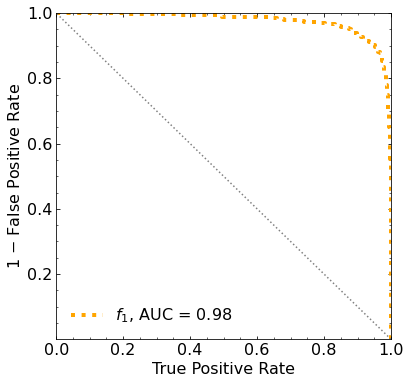

Classification score:


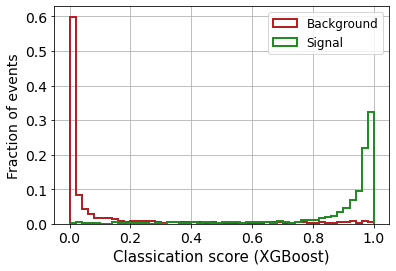


 ROC-AUC =  0.9757620920656382


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  328.05940188  293.23276116  253.90915389  205.85218606
  151.46482979   92.9941449    30.48861455  -37.95246581 -101.08993384]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 284.34863244 269.98115664 245.317260

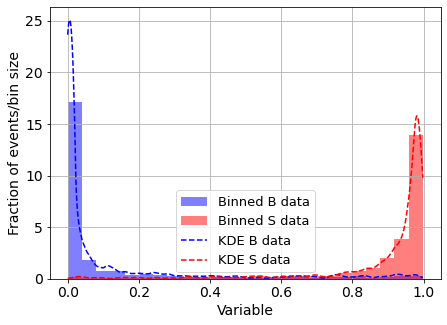

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



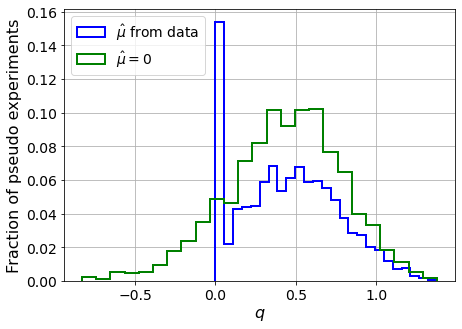

muhat mean:  -5.224880800428036
Z_bins:  0.6708517023377977
std Z_bins:  0.23043512015568668
Z_bins mu=0:  0.6708517023377977
std Z_bins mu=0:  0.2660840661967852

--------

B_expected:  643
S_expected:  3



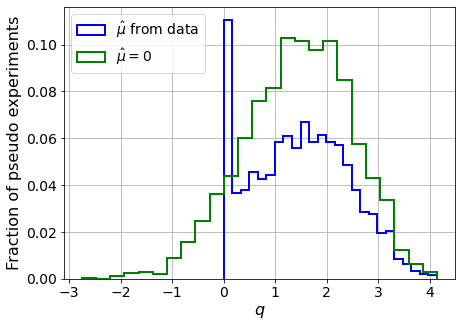

muhat mean:  -1.7503590347441378
Z_bins:  1.2251307759852879
std Z_bins:  0.38238340699381657
Z_bins mu=0:  1.2251307759852879
std Z_bins mu=0:  0.42361623151167993

--------

B_expected:  643
S_expected:  6



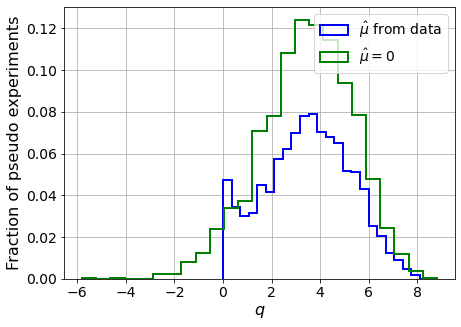

muhat mean:  -0.8729758628697227
Z_bins:  1.8815886548561682
std Z_bins:  0.4709372636991823
Z_bins mu=0:  1.8815886548561682
std Z_bins mu=0:  0.5057199756651892

--------

B_expected:  643
S_expected:  14



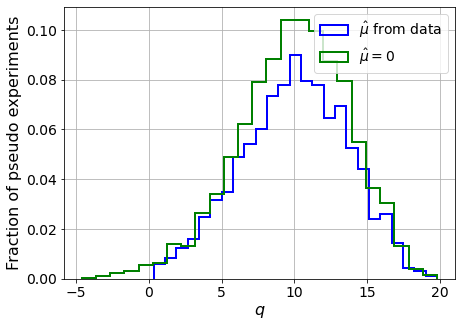

muhat mean:  -0.3811934716276602
Z_bins:  3.181609599714613
std Z_bins:  0.5691562893706044
Z_bins mu=0:  3.181609599714613
std Z_bins mu=0:  0.5939674748783488

--------

B_expected:  643
S_expected:  30



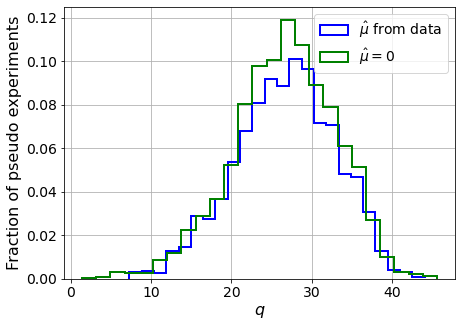

muhat mean:  -0.17439695469919525
Z_bins:  5.19539018479181
std Z_bins:  0.6002948926243536
Z_bins mu=0:  5.19539018479181
std Z_bins mu=0:  0.6150872550508216

--------

B_expected:  643
S_expected:  65



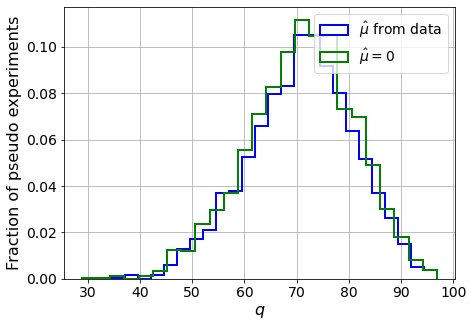

muhat mean:  -0.08047016804165037
Z_bins:  8.450777534174927
std Z_bins:  0.5937014408302457
Z_bins mu=0:  8.450777534174927
std Z_bins mu=0:  0.601674545802481

--------

B_expected:  643
S_expected:  139



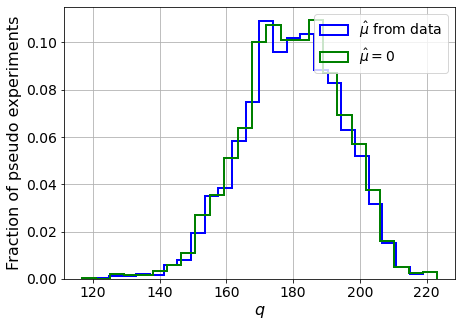

muhat mean:  -0.03699805477580625
Z_bins:  13.417287777930532
std Z_bins:  0.5532685414166669
Z_bins mu=0:  13.417287777930532
std Z_bins mu=0:  0.5577188747204219

--------

B_expected:  643
S_expected:  300



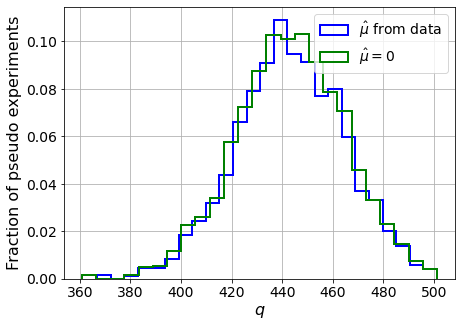

muhat mean:  -0.01825499349741535
Z_bins:  21.044894404571934
std Z_bins:  0.5076624620101784
Z_bins mu=0:  21.044894404571934
std Z_bins mu=0:  0.5107212840158531

--------

B_expected:  643
S_expected:  645



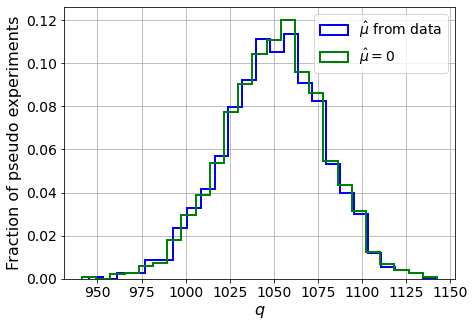

muhat mean:  -0.00812298107870172
Z_bins:  32.416559245656366
std Z_bins:  0.43878669502063705
Z_bins mu=0:  32.416559245656366
std Z_bins mu=0:  0.44044773374739626

--------

B_expected:  643
S_expected:  1390



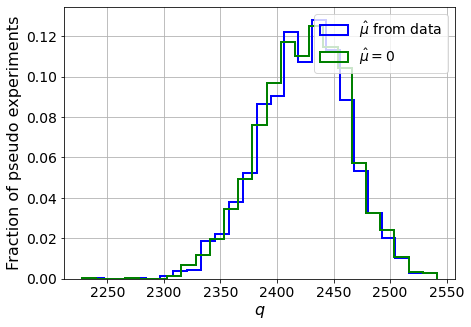

muhat mean:  -0.0039012369481147297
Z_bins:  49.253409613279466
std Z_bins:  0.40052978499240693
Z_bins mu=0:  49.253409613279466
std Z_bins mu=0:  0.4017452877594215

--------


 FINAL RESULT:

[[0.6708517023377977, 0.23043512015568668, -5.224880800428036, 0.6708517023377977, 0.2660840661967852], [1.2251307759852879, 0.38238340699381657, -1.7503590347441378, 1.2251307759852879, 0.42361623151167993], [1.8815886548561682, 0.4709372636991823, -0.8729758628697227, 1.8815886548561682, 0.5057199756651892], [3.181609599714613, 0.5691562893706044, -0.3811934716276602, 3.181609599714613, 0.5939674748783488], [5.19539018479181, 0.6002948926243536, -0.17439695469919525, 5.19539018479181, 0.6150872550508216], [8.450777534174927, 0.5937014408302457, -0.08047016804165037, 8.450777534174927, 0.601674545802481], [13.417287777930532, 0.5532685414166669, -0.03699805477580625, 13.417287777930532, 0.5577188747204219], [21.044894404571934, 0.5076624620101784, -0.01825499349741535, 21.044894404571934, 0.51

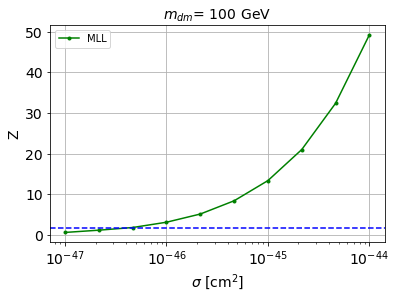


cross_MLL_164:  3.7131418777551754e-47
cross_MLL_164_up:  2.2361383810391115e-47
cross_MLL_164_down:  5.604347175535297e-47

#########################


#########################

mDM =  200 GeV


max_pS1_both lenght:  157

X_mon1_train :  (6375, 157)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 157)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 157)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)

B_pbot.shape:  (50

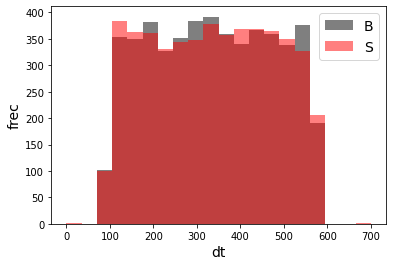

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35240)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35240)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35240)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68632	validation_1-logloss:0.68709
[1]	validation_0-logloss:0.67964	validation_1-logloss:0.68114
[2]	validation_0-logloss:0.67307	validation_1-logloss:0.67523
[3]	validation_0-logloss:0.66661	validation_1-logloss:0.66929
[4]	validation_0-logloss:0.66030	validation_1-logloss:0.66367
[5]	validation_0-logloss:0.65411	validation_1-logloss:0.65789
[6]	validation_0-logloss:0.64797	validation_1-logloss:0.65236
[7]	validation_0-logloss:0.64192	validation_1-logloss:0.64681
[8]	validation_0-logloss:0.63603	validation_1-logloss:0.64147
[9]	validation_0-logloss:0.63020	validation_1-logloss:0.63623
[10]	validation_0-logloss:0.62449	validation_1-logloss:0.63109
[11]	validation_0-logloss:0.61881	validation_1-logloss:0.62596
[12]	validation_0-logloss:0.61333	validation_1-logloss:0.62105
[13]	validation_0-logloss:0.60784	validation_1-logloss:0.61600
[14]	validation_0-logloss:0.60255	validation_1-logloss:0.61126
[15]	validation_0-logloss:0.59727	validation_1-logloss:0.60651
[1

[130]	validation_0-logloss:0.28841	validation_1-logloss:0.34446
[131]	validation_0-logloss:0.28708	validation_1-logloss:0.34342
[132]	validation_0-logloss:0.28580	validation_1-logloss:0.34250
[133]	validation_0-logloss:0.28455	validation_1-logloss:0.34164
[134]	validation_0-logloss:0.28325	validation_1-logloss:0.34060
[135]	validation_0-logloss:0.28203	validation_1-logloss:0.33974
[136]	validation_0-logloss:0.28081	validation_1-logloss:0.33884
[137]	validation_0-logloss:0.27951	validation_1-logloss:0.33777
[138]	validation_0-logloss:0.27832	validation_1-logloss:0.33693
[139]	validation_0-logloss:0.27713	validation_1-logloss:0.33603
[140]	validation_0-logloss:0.27582	validation_1-logloss:0.33502
[141]	validation_0-logloss:0.27465	validation_1-logloss:0.33416
[142]	validation_0-logloss:0.27339	validation_1-logloss:0.33323
[143]	validation_0-logloss:0.27226	validation_1-logloss:0.33245
[144]	validation_0-logloss:0.27103	validation_1-logloss:0.33163
[145]	validation_0-logloss:0.26979	valid

[259]	validation_0-logloss:0.18072	validation_1-logloss:0.26855
[260]	validation_0-logloss:0.18025	validation_1-logloss:0.26827
[261]	validation_0-logloss:0.17976	validation_1-logloss:0.26797
[262]	validation_0-logloss:0.17931	validation_1-logloss:0.26774
[263]	validation_0-logloss:0.17882	validation_1-logloss:0.26749
[264]	validation_0-logloss:0.17835	validation_1-logloss:0.26724
[265]	validation_0-logloss:0.17786	validation_1-logloss:0.26701
[266]	validation_0-logloss:0.17739	validation_1-logloss:0.26674
[267]	validation_0-logloss:0.17691	validation_1-logloss:0.26653
[268]	validation_0-logloss:0.17642	validation_1-logloss:0.26620
[269]	validation_0-logloss:0.17590	validation_1-logloss:0.26591
[270]	validation_0-logloss:0.17544	validation_1-logloss:0.26575
[271]	validation_0-logloss:0.17492	validation_1-logloss:0.26545
[272]	validation_0-logloss:0.17444	validation_1-logloss:0.26521
[273]	validation_0-logloss:0.17399	validation_1-logloss:0.26498
[274]	validation_0-logloss:0.17353	valid

[388]	validation_0-logloss:0.13143	validation_1-logloss:0.24606
[389]	validation_0-logloss:0.13112	validation_1-logloss:0.24589
[390]	validation_0-logloss:0.13084	validation_1-logloss:0.24567
[391]	validation_0-logloss:0.13054	validation_1-logloss:0.24565
[392]	validation_0-logloss:0.13027	validation_1-logloss:0.24548
[393]	validation_0-logloss:0.12994	validation_1-logloss:0.24542
[394]	validation_0-logloss:0.12967	validation_1-logloss:0.24529
[395]	validation_0-logloss:0.12937	validation_1-logloss:0.24514
[396]	validation_0-logloss:0.12911	validation_1-logloss:0.24495
[397]	validation_0-logloss:0.12890	validation_1-logloss:0.24489
[398]	validation_0-logloss:0.12862	validation_1-logloss:0.24488
[399]	validation_0-logloss:0.12841	validation_1-logloss:0.24485
[400]	validation_0-logloss:0.12812	validation_1-logloss:0.24485
[401]	validation_0-logloss:0.12791	validation_1-logloss:0.24480
[402]	validation_0-logloss:0.12771	validation_1-logloss:0.24477
[403]	validation_0-logloss:0.12742	valid

[517]	validation_0-logloss:0.10146	validation_1-logloss:0.23705
[518]	validation_0-logloss:0.10129	validation_1-logloss:0.23703
[519]	validation_0-logloss:0.10109	validation_1-logloss:0.23692
[520]	validation_0-logloss:0.10085	validation_1-logloss:0.23691
[521]	validation_0-logloss:0.10072	validation_1-logloss:0.23683
[522]	validation_0-logloss:0.10055	validation_1-logloss:0.23685
[523]	validation_0-logloss:0.10040	validation_1-logloss:0.23678
[524]	validation_0-logloss:0.10025	validation_1-logloss:0.23676
[525]	validation_0-logloss:0.10000	validation_1-logloss:0.23675
[526]	validation_0-logloss:0.09986	validation_1-logloss:0.23671
[527]	validation_0-logloss:0.09962	validation_1-logloss:0.23672
[528]	validation_0-logloss:0.09938	validation_1-logloss:0.23663
[529]	validation_0-logloss:0.09924	validation_1-logloss:0.23654
[530]	validation_0-logloss:0.09912	validation_1-logloss:0.23652
[531]	validation_0-logloss:0.09897	validation_1-logloss:0.23644
[532]	validation_0-logloss:0.09883	valid

[646]	validation_0-logloss:0.08113	validation_1-logloss:0.23207
[647]	validation_0-logloss:0.08104	validation_1-logloss:0.23204
[648]	validation_0-logloss:0.08089	validation_1-logloss:0.23193
[649]	validation_0-logloss:0.08077	validation_1-logloss:0.23185
[650]	validation_0-logloss:0.08062	validation_1-logloss:0.23183
[651]	validation_0-logloss:0.08053	validation_1-logloss:0.23183
[652]	validation_0-logloss:0.08044	validation_1-logloss:0.23182
[653]	validation_0-logloss:0.08028	validation_1-logloss:0.23185
[654]	validation_0-logloss:0.08020	validation_1-logloss:0.23181
[655]	validation_0-logloss:0.08010	validation_1-logloss:0.23178
[656]	validation_0-logloss:0.07995	validation_1-logloss:0.23172
[657]	validation_0-logloss:0.07979	validation_1-logloss:0.23167
[658]	validation_0-logloss:0.07970	validation_1-logloss:0.23159
[659]	validation_0-logloss:0.07953	validation_1-logloss:0.23156
[660]	validation_0-logloss:0.07938	validation_1-logloss:0.23153
[661]	validation_0-logloss:0.07923	valid

[775]	validation_0-logloss:0.06674	validation_1-logloss:0.22973
[776]	validation_0-logloss:0.06660	validation_1-logloss:0.22974
[777]	validation_0-logloss:0.06655	validation_1-logloss:0.22970
[778]	validation_0-logloss:0.06647	validation_1-logloss:0.22972
[779]	validation_0-logloss:0.06638	validation_1-logloss:0.22971
[780]	validation_0-logloss:0.06626	validation_1-logloss:0.22973
[781]	validation_0-logloss:0.06615	validation_1-logloss:0.22972
[782]	validation_0-logloss:0.06606	validation_1-logloss:0.22968
[783]	validation_0-logloss:0.06597	validation_1-logloss:0.22964
[784]	validation_0-logloss:0.06591	validation_1-logloss:0.22962
[785]	validation_0-logloss:0.06582	validation_1-logloss:0.22962
[786]	validation_0-logloss:0.06570	validation_1-logloss:0.22958
[787]	validation_0-logloss:0.06562	validation_1-logloss:0.22962
[788]	validation_0-logloss:0.06556	validation_1-logloss:0.22959
[789]	validation_0-logloss:0.06545	validation_1-logloss:0.22953
[790]	validation_0-logloss:0.06540	valid

[904]	validation_0-logloss:0.05672	validation_1-logloss:0.22788
[905]	validation_0-logloss:0.05668	validation_1-logloss:0.22787
[906]	validation_0-logloss:0.05665	validation_1-logloss:0.22783
[907]	validation_0-logloss:0.05659	validation_1-logloss:0.22778
[908]	validation_0-logloss:0.05654	validation_1-logloss:0.22775
[909]	validation_0-logloss:0.05645	validation_1-logloss:0.22774
[910]	validation_0-logloss:0.05638	validation_1-logloss:0.22773
[911]	validation_0-logloss:0.05634	validation_1-logloss:0.22773
[912]	validation_0-logloss:0.05627	validation_1-logloss:0.22771
[913]	validation_0-logloss:0.05618	validation_1-logloss:0.22773
[914]	validation_0-logloss:0.05610	validation_1-logloss:0.22775
[915]	validation_0-logloss:0.05603	validation_1-logloss:0.22773
[916]	validation_0-logloss:0.05595	validation_1-logloss:0.22777
[917]	validation_0-logloss:0.05587	validation_1-logloss:0.22772
[918]	validation_0-logloss:0.05584	validation_1-logloss:0.22770
[919]	validation_0-logloss:0.05577	valid

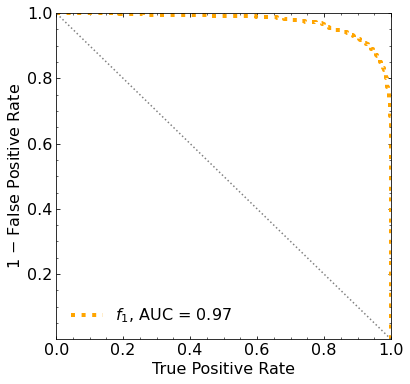

Classification score:


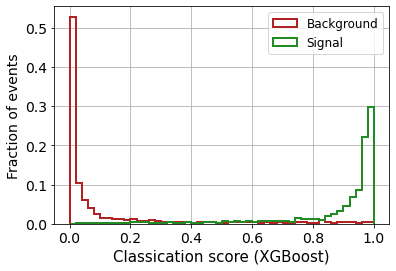


 ROC-AUC =  0.9740021869174195


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  324.13275856  299.23741203  270.00430424  234.87840752  192.99887957
  142.50561551   88.02299296   26.94998365  -37.98618161 -100.8142063 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 266.12663777 250.81447119 227.238063

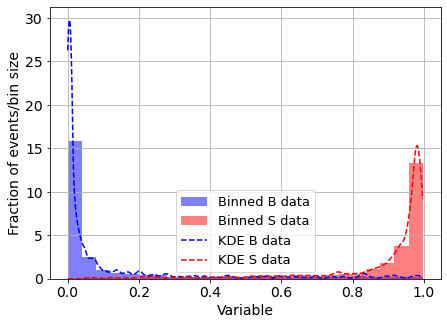

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



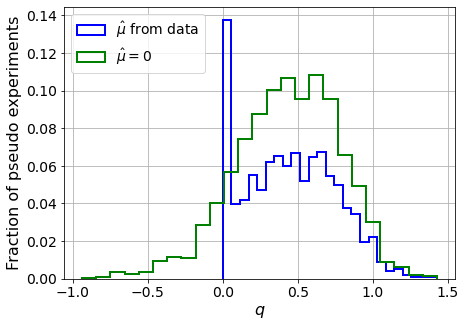

muhat mean:  -5.2331780087731365
Z_bins:  0.6701850343146316
std Z_bins:  0.22546003254960426
Z_bins mu=0:  0.6701850343146316
std Z_bins mu=0:  0.25858318618934945

--------

B_expected:  643
S_expected:  2



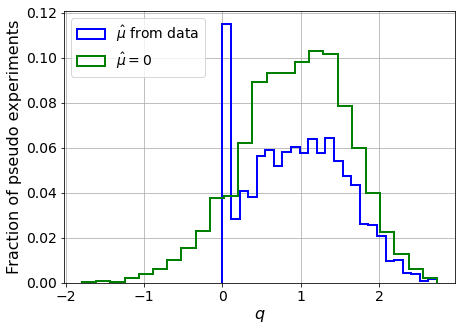

muhat mean:  -2.637745167845414
Z_bins:  0.9836302255364067
std Z_bins:  0.3097039615646382
Z_bins mu=0:  0.9836302255364067
std Z_bins mu=0:  0.34486060236189603

--------

B_expected:  643
S_expected:  4



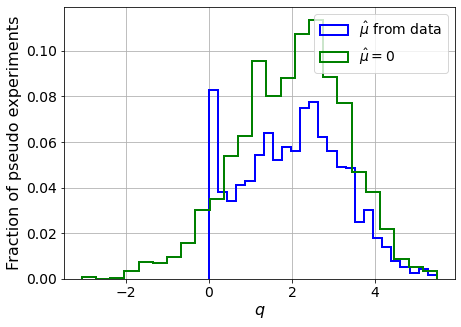

muhat mean:  -1.2647317564675704
Z_bins:  1.4565344786589645
std Z_bins:  0.4092305643527645
Z_bins mu=0:  1.4565344786589645
std Z_bins mu=0:  0.44853116794001596

--------

B_expected:  643
S_expected:  8



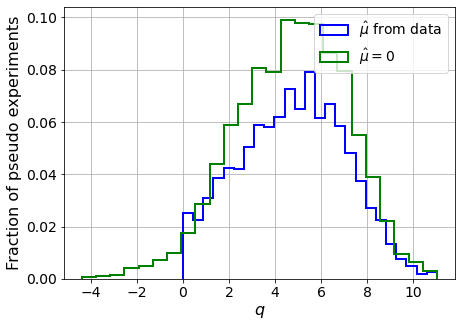

muhat mean:  -0.6162561594555024
Z_bins:  2.197475465270742
std Z_bins:  0.5192123844426632
Z_bins mu=0:  2.197475465270742
std Z_bins mu=0:  0.5483847025096457

--------

B_expected:  643
S_expected:  17



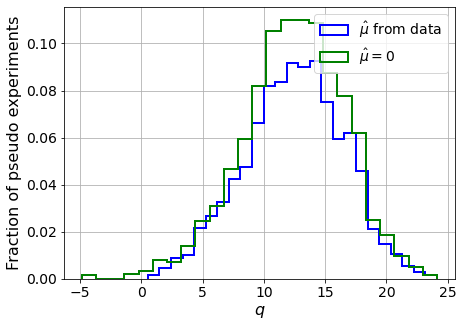

muhat mean:  -0.2862577121275192
Z_bins:  3.5460994028441655
std Z_bins:  0.5691003274367249
Z_bins mu=0:  3.5460994028441655
std Z_bins mu=0:  0.5884872740220829

--------

B_expected:  643
S_expected:  37



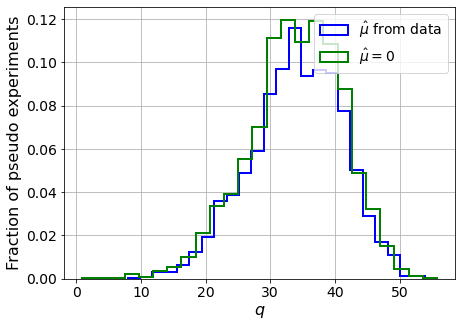

muhat mean:  -0.13383715589815057
Z_bins:  5.854817985070025
std Z_bins:  0.6074824500720466
Z_bins mu=0:  5.854817985070025
std Z_bins mu=0:  0.6216713299802229

--------

B_expected:  643
S_expected:  79



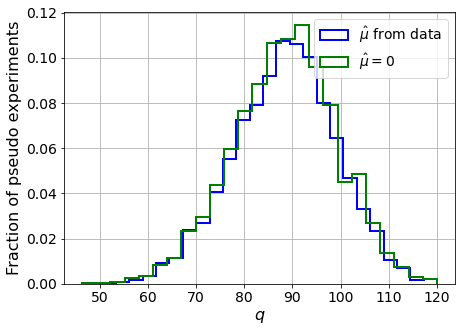

muhat mean:  -0.06362397013640507
Z_bins:  9.426597167637443
std Z_bins:  0.5648063256059562
Z_bins mu=0:  9.426597167637443
std Z_bins mu=0:  0.5703998788176955

--------

B_expected:  643
S_expected:  170



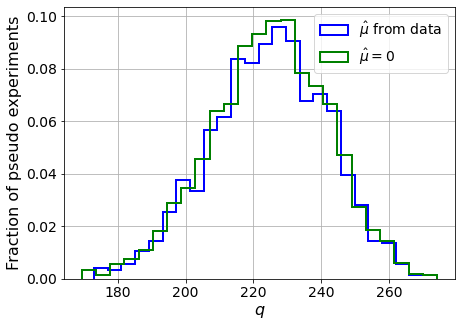

muhat mean:  -0.03154524315956012
Z_bins:  15.005246467659195
std Z_bins:  0.5718626516919781
Z_bins mu=0:  15.005246467659195
std Z_bins mu=0:  0.5761981551721792

--------

B_expected:  643
S_expected:  366



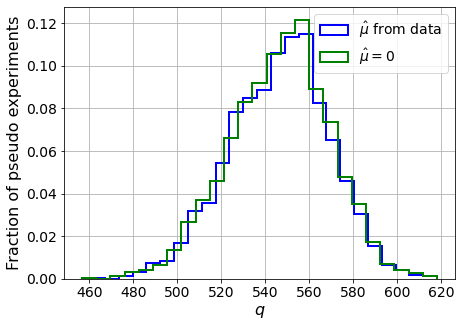

muhat mean:  -0.014634024147619367
Z_bins:  23.40962662724905
std Z_bins:  0.4847081749591137
Z_bins mu=0:  23.40962662724905
std Z_bins mu=0:  0.4869950731927143

--------

B_expected:  643
S_expected:  788



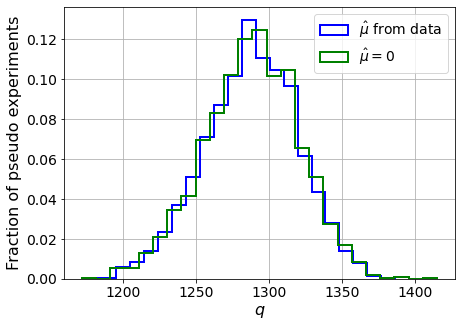

muhat mean:  -0.00644665203310856
Z_bins:  35.89764131790747
std Z_bins:  0.45138697893309104
Z_bins mu=0:  35.89764131790747
std Z_bins mu=0:  0.4532166987046336

--------


 FINAL RESULT:

[[0.6701850343146316, 0.22546003254960426, -5.2331780087731365, 0.6701850343146316, 0.25858318618934945], [0.9836302255364067, 0.3097039615646382, -2.637745167845414, 0.9836302255364067, 0.34486060236189603], [1.4565344786589645, 0.4092305643527645, -1.2647317564675704, 1.4565344786589645, 0.44853116794001596], [2.197475465270742, 0.5192123844426632, -0.6162561594555024, 2.197475465270742, 0.5483847025096457], [3.5460994028441655, 0.5691003274367249, -0.2862577121275192, 3.5460994028441655, 0.5884872740220829], [5.854817985070025, 0.6074824500720466, -0.13383715589815057, 5.854817985070025, 0.6216713299802229], [9.426597167637443, 0.5648063256059562, -0.06362397013640507, 9.426597167637443, 0.5703998788176955], [15.005246467659195, 0.5718626516919781, -0.03154524315956012, 15.005246467659195, 0.576

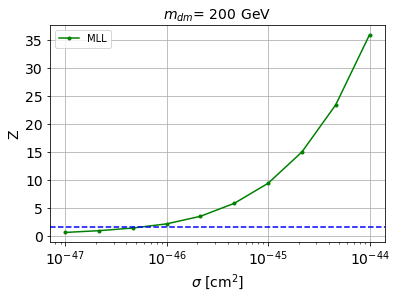


cross_MLL_164:  5.840613539214815e-47
cross_MLL_164_up:  3.546942372172145e-47
cross_MLL_164_down:  9.679975149038825e-47

#########################


#########################

mDM =  500 GeV


max_pS1_both lenght:  178

X_mon1_train :  (6375, 178)
y_mon1_train :  (6375,)
X_mon1_val :  (1125, 178)
y_mon1_val :  (1125,)
X_mon1_test :  (2500, 178)
y_mon1_test :  (2500,)

max_pS2_both lenght:  2298

X_mon2_train :  (6375, 2298)
y_mon2_train :  (6375,)
X_mon2_val :  (1125, 2298)
y_mon2_val :  (1125,)
X_mon2_test :  (2500, 2298)
y_mon2_test :  (2500,)


X_mon3_train :  (6375, 16384)
y_mon3_train :  (6375,)
X_mon3_val :  (1125, 16384)
y_mon3_val :  (1125,)
X_mon3_test :  (2500, 16384)
y_mon3_test :  (2500,)


X_mon4_train :  (6375, 16384)
y_mon4_train :  (6375,)
X_mon4_val :  (1125, 16384)
y_mon4_val :  (1125,)
X_mon4_test :  (2500, 16384)
y_mon4_test :  (2500,)


S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)

B_pbot.shape:  (5000

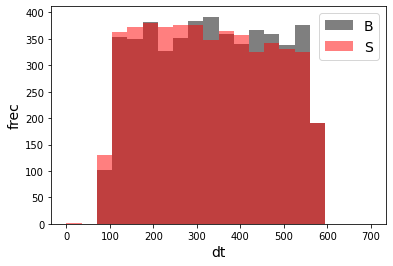

B_pbot.shape:  (5000,)
B_ptop.shape:  (5000,)
B_ppeakS1.shape : (5000, 7)
B_ppeakS2.shape:  (5000, 7)
S_pbot.shape:  (5000,)
S_ptop.shape:  (5000,)
S_ppeakS1.shape : (5000, 7)
S_ppeakS2.shape:  (5000, 7)
X_mon_B.shape:  (5000, 17)
X_mon_S.shape:  (5000, 17)

X_mon5.shape:  (10000, 17)

X_mon5_train :  (6375, 17)
y_mon5_train :  (6375,)
X_mon5_val :  (1125, 17)
y_mon5_val :  (1125,)
X_mon5_test :  (2500, 17)
y_mon5_test :  (2500,)


X_mon_train :  (6375, 35261)
y_mon_train :  (6375,)
X_mon_val :  (1125, 35261)
y_mon_val :  (1125,)
X_mon_test :  (2500, 35261)
y_mon_test :  (2500,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68632	validation_1-logloss:0.68700
[1]	validation_0-logloss:0.67963	validation_1-logloss:0.68098
[2]	validation_0-logloss:0.67308	validation_1-logloss:0.67503
[3]	validation_0-logloss:0.66661	validation_1-logloss:0.66922
[4]	validation_0-logloss:0.66032	validation_1-logloss:0.66347
[5]	validation_0-logloss:0.65410	validation_1-logloss:0.65788
[6]	validation_0-logloss:0.64799	validation_1-logloss:0.65250
[7]	validation_0-logloss:0.64203	validation_1-logloss:0.64703
[8]	validation_0-logloss:0.63613	validation_1-logloss:0.64177
[9]	validation_0-logloss:0.63043	validation_1-logloss:0.63667
[10]	validation_0-logloss:0.62481	validation_1-logloss:0.63145
[11]	validation_0-logloss:0.61924	validation_1-logloss:0.62645
[12]	validation_0-logloss:0.61391	validation_1-logloss:0.62177
[13]	validation_0-logloss:0.60853	validation_1-logloss:0.61692
[14]	validation_0-logloss:0.60333	validation_1-logloss:0.61239
[15]	validation_0-logloss:0.59819	validation_1-logloss:0.60769
[1

[130]	validation_0-logloss:0.29105	validation_1-logloss:0.34861
[131]	validation_0-logloss:0.28969	validation_1-logloss:0.34754
[132]	validation_0-logloss:0.28820	validation_1-logloss:0.34640
[133]	validation_0-logloss:0.28690	validation_1-logloss:0.34538
[134]	validation_0-logloss:0.28549	validation_1-logloss:0.34430
[135]	validation_0-logloss:0.28404	validation_1-logloss:0.34322
[136]	validation_0-logloss:0.28280	validation_1-logloss:0.34230
[137]	validation_0-logloss:0.28160	validation_1-logloss:0.34145
[138]	validation_0-logloss:0.28025	validation_1-logloss:0.34031
[139]	validation_0-logloss:0.27886	validation_1-logloss:0.33926
[140]	validation_0-logloss:0.27763	validation_1-logloss:0.33841
[141]	validation_0-logloss:0.27642	validation_1-logloss:0.33744
[142]	validation_0-logloss:0.27504	validation_1-logloss:0.33642
[143]	validation_0-logloss:0.27382	validation_1-logloss:0.33548
[144]	validation_0-logloss:0.27253	validation_1-logloss:0.33452
[145]	validation_0-logloss:0.27142	valid

[259]	validation_0-logloss:0.18172	validation_1-logloss:0.27250
[260]	validation_0-logloss:0.18124	validation_1-logloss:0.27235
[261]	validation_0-logloss:0.18068	validation_1-logloss:0.27196
[262]	validation_0-logloss:0.18012	validation_1-logloss:0.27161
[263]	validation_0-logloss:0.17954	validation_1-logloss:0.27124
[264]	validation_0-logloss:0.17908	validation_1-logloss:0.27102
[265]	validation_0-logloss:0.17868	validation_1-logloss:0.27075
[266]	validation_0-logloss:0.17811	validation_1-logloss:0.27039
[267]	validation_0-logloss:0.17766	validation_1-logloss:0.27012
[268]	validation_0-logloss:0.17715	validation_1-logloss:0.26986
[269]	validation_0-logloss:0.17670	validation_1-logloss:0.26962
[270]	validation_0-logloss:0.17630	validation_1-logloss:0.26938
[271]	validation_0-logloss:0.17574	validation_1-logloss:0.26915
[272]	validation_0-logloss:0.17534	validation_1-logloss:0.26883
[273]	validation_0-logloss:0.17481	validation_1-logloss:0.26858
[274]	validation_0-logloss:0.17439	valid

[388]	validation_0-logloss:0.13457	validation_1-logloss:0.25164
[389]	validation_0-logloss:0.13432	validation_1-logloss:0.25161
[390]	validation_0-logloss:0.13398	validation_1-logloss:0.25156
[391]	validation_0-logloss:0.13370	validation_1-logloss:0.25152
[392]	validation_0-logloss:0.13344	validation_1-logloss:0.25138
[393]	validation_0-logloss:0.13313	validation_1-logloss:0.25130
[394]	validation_0-logloss:0.13289	validation_1-logloss:0.25117
[395]	validation_0-logloss:0.13259	validation_1-logloss:0.25111
[396]	validation_0-logloss:0.13235	validation_1-logloss:0.25105
[397]	validation_0-logloss:0.13211	validation_1-logloss:0.25101
[398]	validation_0-logloss:0.13190	validation_1-logloss:0.25088
[399]	validation_0-logloss:0.13169	validation_1-logloss:0.25085
[400]	validation_0-logloss:0.13145	validation_1-logloss:0.25077
[401]	validation_0-logloss:0.13114	validation_1-logloss:0.25067
[402]	validation_0-logloss:0.13091	validation_1-logloss:0.25062
[403]	validation_0-logloss:0.13062	valid

[517]	validation_0-logloss:0.10731	validation_1-logloss:0.24714
[518]	validation_0-logloss:0.10719	validation_1-logloss:0.24710
[519]	validation_0-logloss:0.10700	validation_1-logloss:0.24708
[520]	validation_0-logloss:0.10677	validation_1-logloss:0.24708
[521]	validation_0-logloss:0.10661	validation_1-logloss:0.24698
[522]	validation_0-logloss:0.10644	validation_1-logloss:0.24702
[523]	validation_0-logloss:0.10629	validation_1-logloss:0.24703
[524]	validation_0-logloss:0.10613	validation_1-logloss:0.24694
[525]	validation_0-logloss:0.10598	validation_1-logloss:0.24696
[526]	validation_0-logloss:0.10584	validation_1-logloss:0.24687
[527]	validation_0-logloss:0.10562	validation_1-logloss:0.24689
[528]	validation_0-logloss:0.10547	validation_1-logloss:0.24681
[529]	validation_0-logloss:0.10530	validation_1-logloss:0.24669
[530]	validation_0-logloss:0.10516	validation_1-logloss:0.24670
[531]	validation_0-logloss:0.10494	validation_1-logloss:0.24660
[532]	validation_0-logloss:0.10482	valid

[646]	validation_0-logloss:0.08812	validation_1-logloss:0.24385
[647]	validation_0-logloss:0.08792	validation_1-logloss:0.24386
[648]	validation_0-logloss:0.08781	validation_1-logloss:0.24383
[649]	validation_0-logloss:0.08770	validation_1-logloss:0.24374
[650]	validation_0-logloss:0.08761	validation_1-logloss:0.24368
[651]	validation_0-logloss:0.08743	validation_1-logloss:0.24362
[652]	validation_0-logloss:0.08728	validation_1-logloss:0.24354
[653]	validation_0-logloss:0.08713	validation_1-logloss:0.24350
[654]	validation_0-logloss:0.08701	validation_1-logloss:0.24344
[655]	validation_0-logloss:0.08690	validation_1-logloss:0.24343
[656]	validation_0-logloss:0.08672	validation_1-logloss:0.24336
[657]	validation_0-logloss:0.08662	validation_1-logloss:0.24338
[658]	validation_0-logloss:0.08645	validation_1-logloss:0.24338
[659]	validation_0-logloss:0.08631	validation_1-logloss:0.24337
[660]	validation_0-logloss:0.08620	validation_1-logloss:0.24330
[661]	validation_0-logloss:0.08601	valid

[775]	validation_0-logloss:0.07462	validation_1-logloss:0.24028
[776]	validation_0-logloss:0.07453	validation_1-logloss:0.24031
[777]	validation_0-logloss:0.07447	validation_1-logloss:0.24031
[778]	validation_0-logloss:0.07439	validation_1-logloss:0.24031
[779]	validation_0-logloss:0.07426	validation_1-logloss:0.24034
[780]	validation_0-logloss:0.07415	validation_1-logloss:0.24036
[781]	validation_0-logloss:0.07407	validation_1-logloss:0.24037
[782]	validation_0-logloss:0.07395	validation_1-logloss:0.24034
[783]	validation_0-logloss:0.07385	validation_1-logloss:0.24033
[784]	validation_0-logloss:0.07379	validation_1-logloss:0.24030
[785]	validation_0-logloss:0.07368	validation_1-logloss:0.24028
[786]	validation_0-logloss:0.07361	validation_1-logloss:0.24024
[787]	validation_0-logloss:0.07352	validation_1-logloss:0.24025
[788]	validation_0-logloss:0.07345	validation_1-logloss:0.24022
[789]	validation_0-logloss:0.07337	validation_1-logloss:0.24024
[790]	validation_0-logloss:0.07326	valid

[904]	validation_0-logloss:0.06381	validation_1-logloss:0.23924
[905]	validation_0-logloss:0.06371	validation_1-logloss:0.23923
[906]	validation_0-logloss:0.06364	validation_1-logloss:0.23917
[907]	validation_0-logloss:0.06356	validation_1-logloss:0.23923
[908]	validation_0-logloss:0.06350	validation_1-logloss:0.23923
[909]	validation_0-logloss:0.06342	validation_1-logloss:0.23925
[910]	validation_0-logloss:0.06336	validation_1-logloss:0.23923
[911]	validation_0-logloss:0.06329	validation_1-logloss:0.23923
[912]	validation_0-logloss:0.06315	validation_1-logloss:0.23925
[913]	validation_0-logloss:0.06308	validation_1-logloss:0.23928
[914]	validation_0-logloss:0.06301	validation_1-logloss:0.23925
[915]	validation_0-logloss:0.06290	validation_1-logloss:0.23924
[916]	validation_0-logloss:0.06282	validation_1-logloss:0.23921
[917]	validation_0-logloss:0.06275	validation_1-logloss:0.23916
[918]	validation_0-logloss:0.06268	validation_1-logloss:0.23914
[919]	validation_0-logloss:0.06259	valid

[1032]	validation_0-logloss:0.05446	validation_1-logloss:0.23905
[1033]	validation_0-logloss:0.05440	validation_1-logloss:0.23907
[1034]	validation_0-logloss:0.05435	validation_1-logloss:0.23905
[1035]	validation_0-logloss:0.05427	validation_1-logloss:0.23906
[1036]	validation_0-logloss:0.05420	validation_1-logloss:0.23908
[1037]	validation_0-logloss:0.05413	validation_1-logloss:0.23905
[1038]	validation_0-logloss:0.05401	validation_1-logloss:0.23898
[1039]	validation_0-logloss:0.05395	validation_1-logloss:0.23899
[1040]	validation_0-logloss:0.05386	validation_1-logloss:0.23902
[1041]	validation_0-logloss:0.05380	validation_1-logloss:0.23901
[1042]	validation_0-logloss:0.05376	validation_1-logloss:0.23901
[1043]	validation_0-logloss:0.05370	validation_1-logloss:0.23904
[1044]	validation_0-logloss:0.05362	validation_1-logloss:0.23906
[1045]	validation_0-logloss:0.05352	validation_1-logloss:0.23911
[1046]	validation_0-logloss:0.05343	validation_1-logloss:0.23912
[1047]	validation_0-loglo

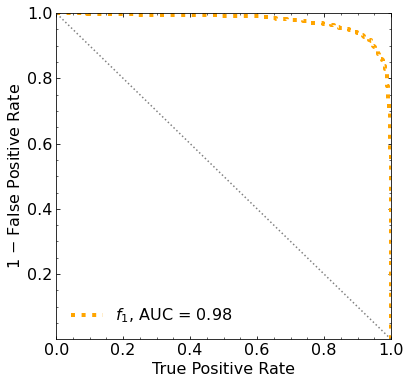

Classification score:


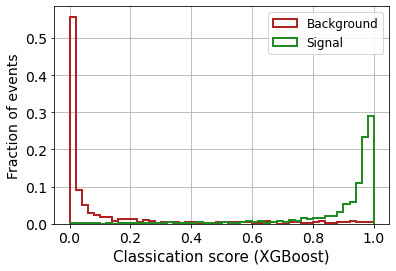


 ROC-AUC =  0.9761430100587958


/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  308.55700395  276.66402692  239.44741087  193.99704513
  141.93906135   86.99202162   24.54451822  -38.4307525  -101.32727869]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 285.45445865 271.16323217 246.457115

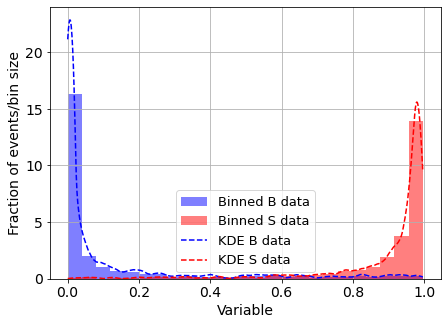

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



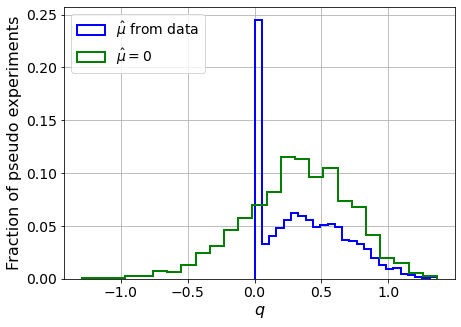

muhat mean:  -3.3158317129839276
Z_bins:  0.5904183521444708
std Z_bins:  0.2617532140988837
Z_bins mu=0:  0.5904183521444708
std Z_bins mu=0:  0.33460115777427385

--------

B_expected:  643
S_expected:  1



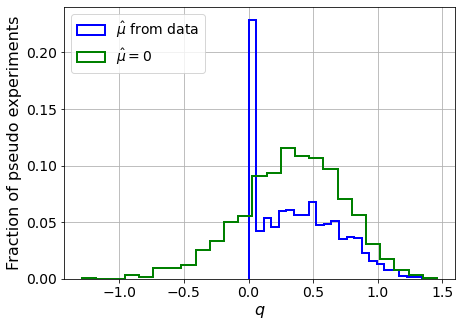

muhat mean:  -3.5280813550538497
Z_bins:  0.59983961090081
std Z_bins:  0.26159745276739427
Z_bins mu=0:  0.59983961090081
std Z_bins mu=0:  0.3270628718176167

--------

B_expected:  643
S_expected:  2



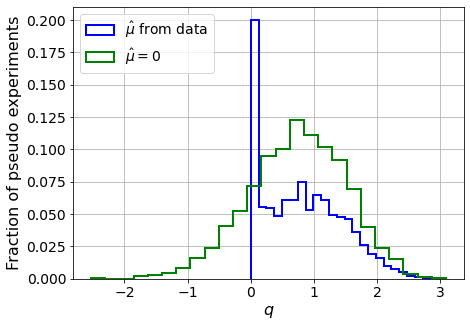

muhat mean:  -1.7479842065103544
Z_bins:  0.8844314552026256
std Z_bins:  0.35832654895532007
Z_bins mu=0:  0.8844314552026256
std Z_bins mu=0:  0.4343024847175672

--------

B_expected:  643
S_expected:  3



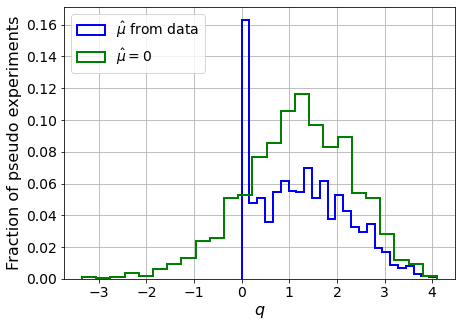

muhat mean:  -1.1436723290288424
Z_bins:  1.11970842507829
std Z_bins:  0.41936663041321287
Z_bins mu=0:  1.11970842507829
std Z_bins mu=0:  0.5020368200016238

--------

B_expected:  643
S_expected:  7



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


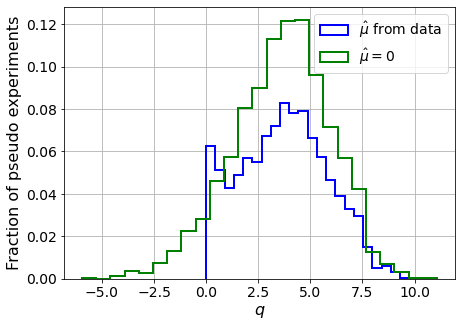

muhat mean:  -0.5048531316270782
Z_bins:  1.9328763043052843
std Z_bins:  0.5409157244104102
Z_bins mu=0:  1.9328763043052843
std Z_bins mu=0:  0.6031137982691918

--------

B_expected:  643
S_expected:  15



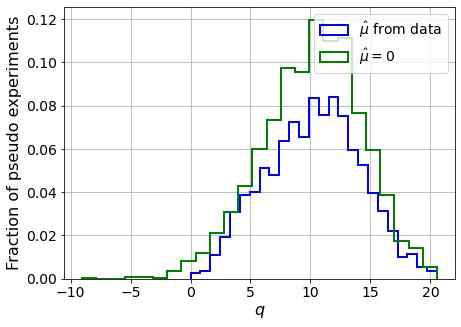

muhat mean:  -0.21905618861240855
Z_bins:  3.2207838974443646
std Z_bins:  0.6057551158128247
Z_bins mu=0:  3.2207838974443646
std Z_bins mu=0:  0.6425915510620027

--------

B_expected:  643
S_expected:  33



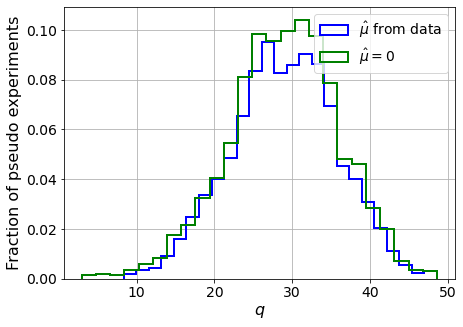

muhat mean:  -0.10607811821299812
Z_bins:  5.397730619590764
std Z_bins:  0.6314692942172243
Z_bins mu=0:  5.397730619590764
std Z_bins mu=0:  0.6547812609616165

--------

B_expected:  643
S_expected:  72



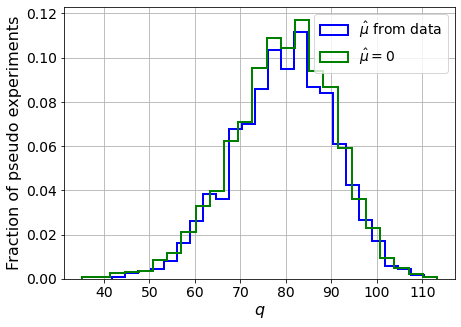

muhat mean:  -0.046227952952648026
Z_bins:  8.940895265985352
std Z_bins:  0.6143336842994863
Z_bins mu=0:  8.940895265985352
std Z_bins mu=0:  0.6299441699755834

--------

B_expected:  643
S_expected:  154



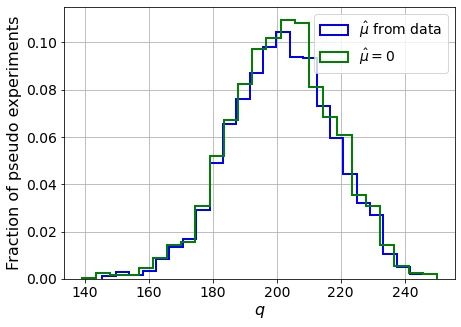

muhat mean:  -0.02211609392050301
Z_bins:  14.21421786256757
std Z_bins:  0.5706201351579456
Z_bins mu=0:  14.21421786256757
std Z_bins mu=0:  0.5798176943969948

--------

B_expected:  643
S_expected:  333



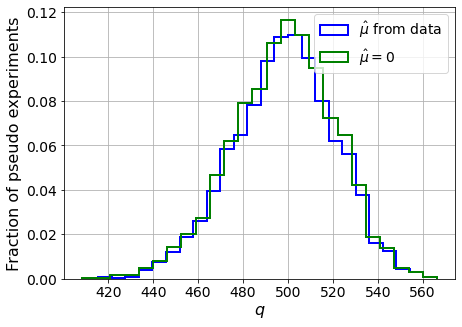

muhat mean:  -0.011638208692753225
Z_bins:  22.33376609957555
std Z_bins:  0.5068869100543018
Z_bins mu=0:  22.333465882018192
std Z_bins mu=0:  0.5118083168673516

--------


 FINAL RESULT:

[[0.5904183521444708, 0.2617532140988837, -3.3158317129839276, 0.5904183521444708, 0.33460115777427385], [0.59983961090081, 0.26159745276739427, -3.5280813550538497, 0.59983961090081, 0.3270628718176167], [0.8844314552026256, 0.35832654895532007, -1.7479842065103544, 0.8844314552026256, 0.4343024847175672], [1.11970842507829, 0.41936663041321287, -1.1436723290288424, 1.11970842507829, 0.5020368200016238], [1.9328763043052843, 0.5409157244104102, -0.5048531316270782, 1.9328763043052843, 0.6031137982691918], [3.2207838974443646, 0.6057551158128247, -0.21905618861240855, 3.2207838974443646, 0.6425915510620027], [5.397730619590764, 0.6314692942172243, -0.10607811821299812, 5.397730619590764, 0.6547812609616165], [8.940895265985352, 0.6143336842994863, -0.046227952952648026, 8.940895265985352, 0.629944

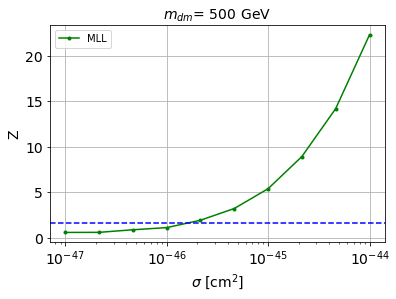


cross_MLL_164:  1.716311892537778e-46
cross_MLL_164_up:  1.1275904977448268e-46
cross_MLL_164_down:  2.608306031941805e-46

#########################



In [40]:
store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    filename_S = 'mDM' + str(mDM) + 'GeV/WP_mDM' + str(mDM) + 'GeV_sig1045.hdf5'
    
    f_S = h5py.File(filefolder+filename_S,'r')
    
    
    
    
    print('')
    
    ###################
    # peakS1_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS1_B = 0
    max_pS1_B1 = 0
    max_pS1_B2 = 0
    max_pS1_B3 = 0
    max_pS1_B4 = 0

    max_pS1_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS1_B = max(max_pS1_B, len( f_B['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS1_B1 = max(max_pS1_B1, len( f_B1['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS1_B2 = max(max_pS1_B2, len( f_B2['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS1_B3 = max(max_pS1_B3, len( f_B3['peakS1_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS1_B4 = max(max_pS1_B4, len( f_B4['peakS1_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS1_S = max(max_pS1_S, len( f_S['peakS1_onlyhits/ev_'+str(i)] ))


    max_pS1_both = max(max_pS1_B,max_pS1_B1,max_pS1_B2,max_pS1_B3,max_pS1_B4,max_pS1_S)

    print('max_pS1_both lenght: ', max_pS1_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
    diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_1'][()] )
    diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS1_onlyhits_B = np.pad(f_B['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B), 'constant')
    peakS1_onlyhits_B1 = np.pad(f_B1['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B1), 'constant')
    peakS1_onlyhits_B2 = np.pad(f_B2['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B2), 'constant')
    peakS1_onlyhits_B3 = np.pad(f_B3['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B3), 'constant')
    peakS1_onlyhits_B4 = np.pad(f_B4['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_B4), 'constant')
    peakS1_onlyhits_S = np.pad(f_S['peakS1_onlyhits/ev_1'][()], (0, diff_elem_S1_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S1 or S2) arrays with the same length
        diff_elem_S1_B = max_pS1_both - len( f_B['peakS1_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S1_B = np.pad(f_B['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B), 'constant')
        # add new event to the matrix as a row
        peakS1_onlyhits_B = np.row_stack([peakS1_onlyhits_B,aux_S1_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S1_B1 = max_pS1_both - len( f_B1['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B1 = np.pad(f_B1['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B1), 'constant')
        peakS1_onlyhits_B1 = np.row_stack([peakS1_onlyhits_B1,aux_S1_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S1_B2 = max_pS1_both - len( f_B2['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B2 = np.pad(f_B2['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B2), 'constant')
        peakS1_onlyhits_B2 = np.row_stack([peakS1_onlyhits_B2,aux_S1_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S1_B3 = max_pS1_both - len( f_B3['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B3 = np.pad(f_B3['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B3), 'constant')
        peakS1_onlyhits_B3 = np.row_stack([peakS1_onlyhits_B3,aux_S1_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S1_B4 = max_pS1_both - len( f_B4['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_B4 = np.pad(f_B4['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_B4), 'constant')
        peakS1_onlyhits_B4 = np.row_stack([peakS1_onlyhits_B4,aux_S1_B4])

    for i in range(2, num_data+1):
        diff_elem_S1_S = max_pS1_both - len( f_S['peakS1_onlyhits/ev_'+str(i)][()] )
        aux_S1_S = np.pad(f_S['peakS1_onlyhits/ev_'+str(i)][()], (0, diff_elem_S1_S), 'constant')
        peakS1_onlyhits_S = np.row_stack([peakS1_onlyhits_S,aux_S1_S])




    # X and Y for the classifier
    X_peakS1 = np.row_stack([peakS1_onlyhits_B[:NUM_DAT_ER],peakS1_onlyhits_B1[:NUM_DAT_AC],peakS1_onlyhits_B2[:NUM_DAT_CNNS],peakS1_onlyhits_B3[:NUM_DAT_RN],peakS1_onlyhits_B4[:NUM_DAT_WALL],peakS1_onlyhits_S])
    # normalize
    X_peakS1 = scaler.fit_transform(X_peakS1)

    del peakS1_onlyhits_B
    del peakS1_onlyhits_B1
    del peakS1_onlyhits_B2
    del peakS1_onlyhits_B3
    del peakS1_onlyhits_B4
    del peakS1_onlyhits_S






    ###################
    # CONCATENATE ALL #
    ###################

    X_mon1 = np.concatenate([X_peakS1],axis=1)

    del X_peakS1

    # labels
    y_mon1 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon1_aux, X_mon1_test, y_mon1_aux, y_mon1_test = train_test_split(X_mon1,
                                                                    y_mon1,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon1,
                                                                    shuffle=True)

    del X_mon1
    del y_mon1

    X_mon1_train, X_mon1_val, y_mon1_train, y_mon1_val = train_test_split(X_mon1_aux,
                                                                      y_mon1_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon1_aux,
                                                                      shuffle=True)

    del X_mon1_aux
    del y_mon1_aux

    print('')
    print('X_mon1_train : ', X_mon1_train.shape)
    print('y_mon1_train : ', y_mon1_train.shape)
    print('X_mon1_val : ', X_mon1_val.shape)
    print('y_mon1_val : ', y_mon1_val.shape)
    print('X_mon1_test : ', X_mon1_test.shape)
    print('y_mon1_test : ', y_mon1_test.shape)
    print('')
    
    
    
    
    
    ###################
    # peakS2_onlyhits #
    ###################

    # First:
    # The max len for the time series

    max_pS2_B = 0
    max_pS2_B1 = 0
    max_pS2_B2 = 0
    max_pS2_B3 = 0
    max_pS2_B4 = 0

    max_pS2_S = 0

    for i in range(1, NUM_DAT_ER+1):
        max_pS2_B = max(max_pS2_B, len( f_B['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_AC+1):
        max_pS2_B1 = max(max_pS2_B1, len( f_B1['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_CNNS+1):
        max_pS2_B2 = max(max_pS2_B2, len( f_B2['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_RN+1):
        max_pS2_B3 = max(max_pS2_B3, len( f_B3['peakS2_onlyhits/ev_'+str(i)] ))
    for i in range(1, NUM_DAT_WALL+1):
        max_pS2_B4 = max(max_pS2_B4, len( f_B4['peakS2_onlyhits/ev_'+str(i)] ))

    for i in range(1, num_data+1):
        max_pS2_S = max(max_pS2_S, len( f_S['peakS2_onlyhits/ev_'+str(i)] ))


    max_pS2_both = max(max_pS2_B,max_pS2_B1,max_pS2_B2,max_pS2_B3,max_pS2_B4,max_pS2_S)

    print('max_pS2_both lenght: ', max_pS2_both)



    # Second:
    # add the events in a matrix, but all with the same length -> fill with zeros

    # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
    diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_1'][()] )
    diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_1'][()] )

    # add zeros at the end
    peakS2_onlyhits_B = np.pad(f_B['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B), 'constant')
    peakS2_onlyhits_B1 = np.pad(f_B1['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B1), 'constant')
    peakS2_onlyhits_B2 = np.pad(f_B2['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B2), 'constant')
    peakS2_onlyhits_B3 = np.pad(f_B3['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B3), 'constant')
    peakS2_onlyhits_B4 = np.pad(f_B4['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_B4), 'constant')
    peakS2_onlyhits_S = np.pad(f_S['peakS2_onlyhits/ev_1'][()], (0, diff_elem_S2_S), 'constant')

    for i in range(2, NUM_DAT_ER+1):
        # how many elements do we need to make all the peak (S2 or S2) arrays with the same length
        diff_elem_S2_B = max_pS2_both - len( f_B['peakS2_onlyhits/ev_'+str(i)][()] )
        # add zeros at the end
        aux_S2_B = np.pad(f_B['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B), 'constant')
        # add new event to the matrix as a row
        peakS2_onlyhits_B = np.row_stack([peakS2_onlyhits_B,aux_S2_B])
    for i in range(2, NUM_DAT_AC+1):
        diff_elem_S2_B1 = max_pS2_both - len( f_B1['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B1 = np.pad(f_B1['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B1), 'constant')
        peakS2_onlyhits_B1 = np.row_stack([peakS2_onlyhits_B1,aux_S2_B1])
    for i in range(2, NUM_DAT_CNNS+1):
        diff_elem_S2_B2 = max_pS2_both - len( f_B2['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B2 = np.pad(f_B2['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B2), 'constant')
        peakS2_onlyhits_B2 = np.row_stack([peakS2_onlyhits_B2,aux_S2_B2])
    for i in range(2, NUM_DAT_RN+1):
        diff_elem_S2_B3 = max_pS2_both - len( f_B3['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B3 = np.pad(f_B3['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B3), 'constant')
        peakS2_onlyhits_B3 = np.row_stack([peakS2_onlyhits_B3,aux_S2_B3])
    for i in range(2, NUM_DAT_WALL+1):
        diff_elem_S2_B4 = max_pS2_both - len( f_B4['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_B4 = np.pad(f_B4['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_B4), 'constant')
        peakS2_onlyhits_B4 = np.row_stack([peakS2_onlyhits_B4,aux_S2_B4])
    for i in range(2, num_data+1):
        diff_elem_S2_S = max_pS2_both - len( f_S['peakS2_onlyhits/ev_'+str(i)][()] )
        aux_S2_S = np.pad(f_S['peakS2_onlyhits/ev_'+str(i)][()], (0, diff_elem_S2_S), 'constant')
        peakS2_onlyhits_S = np.row_stack([peakS2_onlyhits_S,aux_S2_S])




    # X and Y for the classifier
    X_peakS2 = np.row_stack([peakS2_onlyhits_B[:NUM_DAT_ER],peakS2_onlyhits_B1[:NUM_DAT_AC],peakS2_onlyhits_B2[:NUM_DAT_CNNS],peakS2_onlyhits_B3[:NUM_DAT_RN],peakS2_onlyhits_B4[:NUM_DAT_WALL],peakS2_onlyhits_S])
    # normalize
    X_peakS2 = scaler.fit_transform(X_peakS2)

    del peakS2_onlyhits_B
    del peakS2_onlyhits_B1
    del peakS2_onlyhits_B2
    del peakS2_onlyhits_B3
    del peakS2_onlyhits_B4
    del peakS2_onlyhits_S









    ###################
    # CONCATENATE ALL #
    ###################

    X_mon2 = np.concatenate([X_peakS2],axis=1)

    del X_peakS2

    # labels
    y_mon2 = np.concatenate([np.zeros(num_data),np.ones(num_data)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon2_aux, X_mon2_test, y_mon2_aux, y_mon2_test = train_test_split(X_mon2,
                                                                    y_mon2,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon2,
                                                                    shuffle=True)

    del X_mon2
    del y_mon2

    X_mon2_train, X_mon2_val, y_mon2_train, y_mon2_val = train_test_split(X_mon2_aux,
                                                                      y_mon2_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon2_aux,
                                                                      shuffle=True)

    del X_mon2_aux
    del y_mon2_aux

    print('')
    print('X_mon2_train : ', X_mon2_train.shape)
    print('y_mon2_train : ', y_mon2_train.shape)
    print('X_mon2_val : ', X_mon2_val.shape)
    print('y_mon2_val : ', y_mon2_val.shape)
    print('X_mon2_test : ', X_mon2_test.shape)
    print('y_mon2_test : ', y_mon2_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_bot_img DATA #
    ######################


    HITS_bot_img_S = np.array( f_S['HITS_bot_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_bot_img_S = np.row_stack([HITS_bot_img_S,np.array( f_S['HITS_bot_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon3 = np.row_stack([HITS_bot_img_B[:NUM_DAT_ER],HITS_bot_img_B1[:NUM_DAT_AC],HITS_bot_img_B2[:NUM_DAT_CNNS],HITS_bot_img_B3[:NUM_DAT_RN],HITS_bot_img_B4[:NUM_DAT_WALL],HITS_bot_img_S])
    # normalize
    X_mon3 = scaler.fit_transform(X_mon3)
    #X_mon3 = np.reshape(X_mon3, (2*num_data,128,128,1))

#     del HITS_bot_img_B
#     del HITS_bot_img_B1
#     del HITS_bot_img_B2
#     del HITS_bot_img_B3
#     del HITS_bot_img_B4
    del HITS_bot_img_S

    # labels
    y_mon3 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon3_aux, X_mon3_test, y_mon3_aux, y_mon3_test = train_test_split(X_mon3,
                                                                    y_mon3,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon3,
                                                                    shuffle=True)

    del X_mon3
    del y_mon3

    X_mon3_train, X_mon3_val, y_mon3_train, y_mon3_val = train_test_split(X_mon3_aux,
                                                                      y_mon3_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon3_aux,
                                                                      shuffle=True)

    del X_mon3_aux
    del y_mon3_aux

    print('')
    print('X_mon3_train : ', X_mon3_train.shape)
    print('y_mon3_train : ', y_mon3_train.shape)
    print('X_mon3_val : ', X_mon3_val.shape)
    print('y_mon3_val : ', y_mon3_val.shape)
    print('X_mon3_test : ', X_mon3_test.shape)
    print('y_mon3_test : ', y_mon3_test.shape)
    print('')
    
    
    
    
    ######################
    # ONLY HITS_top_img DATA #
    ######################
    
    HITS_top_img_S = np.array( f_S['HITS_top_img/ev_1'] )


    for i in range(2,num_data+1):
        HITS_top_img_S = np.row_stack([HITS_top_img_S,np.array( f_S['HITS_top_img/ev_'+str(i)] )])





    # X and Y for the classifier
    X_mon4 = np.row_stack([HITS_top_img_B[:NUM_DAT_ER],HITS_top_img_B1[:NUM_DAT_AC],HITS_top_img_B2[:NUM_DAT_CNNS],HITS_top_img_B3[:NUM_DAT_RN],HITS_top_img_B4[:NUM_DAT_WALL],HITS_top_img_S])
    # normalize
    X_mon4 = scaler.fit_transform(X_mon4)
    #X_mon4 = np.reshape(X_mon4, (2*num_data,128,128,1))

#     del HITS_top_img_B
#     del HITS_top_img_B1
#     del HITS_top_img_B2
#     del HITS_top_img_B3
#     del HITS_top_img_B4
    del HITS_top_img_S

    # labels
    y_mon4 = np.concatenate([np.zeros(num_data),np.ones(num_data)])



    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon4_aux, X_mon4_test, y_mon4_aux, y_mon4_test = train_test_split(X_mon4,
                                                                    y_mon4,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon4,
                                                                    shuffle=True)

    del X_mon4
    del y_mon4

    X_mon4_train, X_mon4_val, y_mon4_train, y_mon4_val = train_test_split(X_mon4_aux,
                                                                      y_mon4_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon4_aux,
                                                                      shuffle=True)

    del X_mon4_aux
    del y_mon4_aux

    print('')
    print('X_mon4_train : ', X_mon4_train.shape)
    print('y_mon4_train : ', y_mon4_train.shape)
    print('X_mon4_val : ', X_mon4_val.shape)
    print('y_mon4_val : ', y_mon4_val.shape)
    print('X_mon4_test : ', X_mon4_test.shape)
    print('y_mon4_test : ', y_mon4_test.shape)
    print('')
    
    
    
    
    
    
    # close the h5 files
#     f_B.close()
#     f_B1.close()
#     f_B2.close()
#     f_B3.close()
#     f_B4.close()
    f_S.close()
    
    
    
    
    
    #################
    # LOAD FEATURES #
    #################
    
    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    
    
    # concatenate the data

    # all the background features
    X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)), np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)

    # all the signal features
    X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)), np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)
    print('')

#     del B_ppeakS1
#     del B_ppeakS2
#     del B_pbot
#     del B_ptop

    del S_ppeakS1
    del S_ppeakS2
    del S_pbot
    del S_ptop


    X_mon5 = np.concatenate([X_mon_B, X_mon_S])

    print('X_mon5.shape: ', X_mon5.shape)
    del X_mon_B
    del X_mon_S


    # labels
    y_mon5 = np.concatenate([np.zeros(num_data),np.ones(num_data)])




    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon5_aux, X_mon5_test, y_mon5_aux, y_mon5_test = train_test_split(X_mon5,
                                                                    y_mon5,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon5,
                                                                    shuffle=True)

    del X_mon5
    del y_mon5

    X_mon5_train, X_mon5_val, y_mon5_train, y_mon5_val = train_test_split(X_mon5_aux,
                                                                      y_mon5_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon5_aux,
                                                                      shuffle=True)
    
    del X_mon5_aux
    del y_mon5_aux

    
    print('')
    print('X_mon5_train : ', X_mon5_train.shape)
    print('y_mon5_train : ', y_mon5_train.shape)
    print('X_mon5_val : ', X_mon5_val.shape)
    print('y_mon5_val : ', y_mon5_val.shape)
    print('X_mon5_test : ', X_mon5_test.shape)
    print('y_mon5_test : ', y_mon5_test.shape)
    print('')
    
    
    
    
    
    ############
    # DATASETS #
    ############
    
    X_mon_train = np.concatenate([X_mon1_train,X_mon2_train,X_mon3_train,X_mon4_train,X_mon5_train],axis=1)
    X_mon_test = np.concatenate([X_mon1_test,X_mon2_test,X_mon3_test,X_mon4_test,X_mon5_test],axis=1)
    X_mon_val = np.concatenate([X_mon1_val,X_mon2_val,X_mon3_val,X_mon4_val,X_mon5_val],axis=1)



    y_mon_train = y_mon1_train
    y_mon_test = y_mon1_test
    y_mon_val = y_mon1_val



    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





   # OPTION 2 (mu_hat with more precision) (slower,
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)


    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]



    # plot
#     plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [41]:
cross_arrays17feats_MLL = store_cross_MLL_164
cross_arrays17feats_MLL_up = store_cross_MLL_164_up
cross_arrays17feats_MLL_down = store_cross_MLL_164_down

print(cross_arrays17feats_MLL)
print(cross_arrays17feats_MLL_up)
print(cross_arrays17feats_MLL_down)

[8.072449240563326e-46, 4.355398538802451e-47, 2.53615996013505e-47, 2.5468648774880433e-47, 3.7131418777551754e-47, 5.840613539214815e-47, 1.716311892537778e-46]
[5.243506124334293e-46, 2.7896387486549887e-47, 1.479696250436344e-47, 1.6402834640105864e-47, 2.2361383810391115e-47, 3.546942372172145e-47, 1.1275904977448268e-46]
[1.2742357550042879e-45, 6.392349407679256e-47, 4.2628851456812856e-47, 3.8897631056353416e-47, 5.604347175535297e-47, 9.679975149038825e-47, 2.608306031941805e-46]


In [42]:
np.savetxt('results/arrays17feats_MLL.txt', [cross_arrays17feats_MLL, cross_arrays17feats_MLL_up, cross_arrays17feats_MLL_down])

In [43]:
cross_arrays17feats_MLL = np.loadtxt('results/arrays17feats_MLL.txt')[0]
cross_arrays17feats_MLL_up = np.loadtxt('results/arrays17feats_MLL.txt')[1]
cross_arrays17feats_MLL_down =np.loadtxt('results/arrays17feats_MLL.txt')[2]

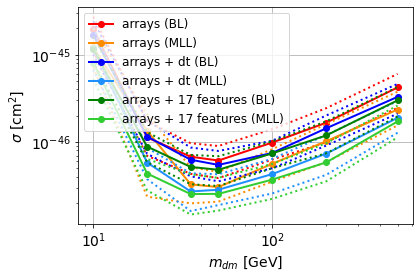

In [44]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_arrays, '-o', color='red', lw=lw, label=r'arrays (BL)')
plt.plot(mDM_mDM, cross_arrays_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_arrays_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_arrays_MLL, '-o', color='darkorange', lw=lw, label=r'arrays (MLL)')
plt.plot(mDM_mDM, cross_arrays_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_arrays_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_arraysdt, '-o', color='blue', lw=lw, label=r'arrays + dt (BL)')
plt.plot(mDM_mDM, cross_arraysdt_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_arraysdt_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_arraysdt_MLL, '-o', color='dodgerblue', lw=lw, label=r'arrays + dt (MLL)')
plt.plot(mDM_mDM, cross_arraysdt_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_arraysdt_MLL_down, ':', color='dodgerblue', lw=lw)
plt.plot(mDM_mDM, cross_arrays17feats, '-o', color='green', lw=lw, label=r'arrays + 17 features (BL)')
plt.plot(mDM_mDM, cross_arrays17feats_up, ':', color='green', lw=lw) 
plt.plot(mDM_mDM, cross_arrays17feats_down, ':', color='green', lw=lw)
plt.plot(mDM_mDM, cross_arrays17feats_MLL, '-o', color='limegreen', lw=lw, label=r'arrays + 17 features (MLL)')
plt.plot(mDM_mDM, cross_arrays17feats_MLL_up, ':', color='limegreen', lw=lw) 
plt.plot(mDM_mDM, cross_arrays17feats_MLL_down, ':', color='limegreen', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

In [45]:
x_XENON1T_1tonyr_down = [6.055606916561549, 6.823778108538652, 7.726215280067716, 8.582423845905856, 9.904912022713336, 11.596190805697788, 14.105146244789573, 17.91067828986308, 22.419318490487267, 28.741287837312296, 37.55681861498598, 46.12118051468561, 57.18227249733948, 70.55823652254493, 95.79168238706818, 141.05146244789574, 199.9078624971397, 281.97296360054435, 435.5160347143599, 663.0965425825532, 1004.7885762566482]
y_XENON1T_1tonyr_down = [2.122997019253291e-44, 6.830827595149092e-45, 2.5565879564232304e-45, 1.0450855592138182e-45, 3.814128748283239e-46, 1.6397373222443297e-46, 7.13879927716957e-47, 3.4375712618817914e-47, 2.296937143881235e-47, 1.807931378879487e-47, 1.5939048066202329e-47, 1.57394815950498e-47, 1.6141144911444228e-47, 1.7629420229546865e-47, 2.1840435093891482e-47, 2.99267938153686e-47, 4.3126768942716094e-47, 5.984360998261109e-47, 9.301141506038491e-47, 1.4275218465524083e-46, 2.218713527075558e-46]

x_XENON1T_1tonyr_up = [5.998025375267653, 6.694623244123534, 7.837740338641554, 9.176046414544945, 10.340054351159923, 12.047941859795849, 14.240556819126223, 17.57167968977445, 22.419318490487267, 28.604313898938127, 36.495613101538225, 45.03259469748133, 54.77586085235927, 70.22197324875098, 93.0849924905222, 139.0444078719906, 196.1241707554598, 274.00553519070826, 411.25186818001043, 650.5459961419798, 995.2342449249492]
y_XENON1T_1tonyr_up = [8.70579590515474e-44, 3.137473218474891e-44, 8.046532229280133e-45, 2.7573536821266015e-45, 1.2156689420722025e-45, 5.6367138959821105e-46, 2.7486819276573736e-46, 1.4639514554724662e-46, 8.956129880675696e-47, 6.702940894624926e-47, 5.909433198208975e-47, 5.909433198208975e-47, 6.293693784124586e-47, 6.873996431179536e-47, 8.409314634569101e-47, 1.1236099983376527e-46, 1.5013107289081836e-46, 2.057166738834862e-46, 3.0401858742608336e-46, 4.785094961345878e-46, 7.252122247218222e-46]

x_XENON1T_1tonyr_dat = [5.940991365202825, 6.5679129168455805, 7.616277137894846, 8.874272903135752, 10.340054351159923, 11.990524319733609, 14.308748811391741, 17.156940060795215, 20.76956429087212, 25.142875087521656, 30.147625520495286, 36.14858369857204, 45.901378264580416, 60.267473771664314, 83.39918867052648, 123.98267316495033, 183.43638249062232, 276.63601106438455, 407.34135734995056, 638.2329961306843, 990.4912022713337]
y_XENON1T_1tonyr_dat = [2.4080691095438086e-44, 9.84373819664703e-45, 2.936650461687786e-45, 1.0320004592606233e-45, 4.492941663683521e-46, 2.362985258610077e-46, 1.2744862586397517e-46, 7.699400454191772e-47, 5.479161357412966e-47, 4.422734147010833e-47, 4.1007103760403667e-47, 4.2586795849318555e-47, 4.830527157087775e-47, 5.984360998261109e-47, 7.797023884122048e-47, 1.1095417251641934e-46, 1.5989333808583735e-46, 2.3333992615362496e-46, 3.448416377736618e-46, 5.427628610945291e-46, 8.542806062673913e-46]

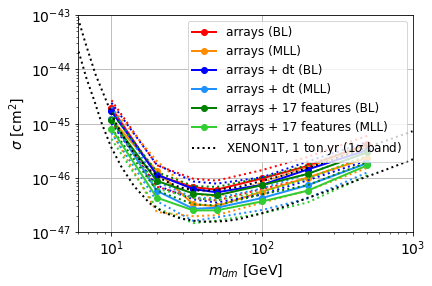

In [46]:

# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_arrays, '-o', color='red', lw=lw, label=r'arrays (BL)')
plt.plot(mDM_mDM, cross_arrays_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_arrays_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_arrays_MLL, '-o', color='darkorange', lw=lw, label=r'arrays (MLL)')
plt.plot(mDM_mDM, cross_arrays_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_arrays_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_arraysdt, '-o', color='blue', lw=lw, label=r'arrays + dt (BL)')
plt.plot(mDM_mDM, cross_arraysdt_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_arraysdt_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_arraysdt_MLL, '-o', color='dodgerblue', lw=lw, label=r'arrays + dt (MLL)')
plt.plot(mDM_mDM, cross_arraysdt_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_arraysdt_MLL_down, ':', color='dodgerblue', lw=lw)
plt.plot(mDM_mDM, cross_arrays17feats, '-o', color='green', lw=lw, label=r'arrays + 17 features (BL)')
plt.plot(mDM_mDM, cross_arrays17feats_up, ':', color='green', lw=lw) 
plt.plot(mDM_mDM, cross_arrays17feats_down, ':', color='green', lw=lw)
plt.plot(mDM_mDM, cross_arrays17feats_MLL, '-o', color='limegreen', lw=lw, label=r'arrays + 17 features (MLL)')
plt.plot(mDM_mDM, cross_arrays17feats_MLL_up, ':', color='limegreen', lw=lw) 
plt.plot(mDM_mDM, cross_arrays17feats_MLL_down, ':', color='limegreen', lw=lw)

#plt.plot(x_XENON1T_1tonyr_dat, y_XENON1T_1tonyr_dat, '--', color='green', lw=lw, label='XENON1T')
plt.plot(x_XENON1T_1tonyr_up, y_XENON1T_1tonyr_up, ':', color='black', lw=lw, label='XENON1T, 1 ton.yr (1$\sigma$ band)')
plt.plot(x_XENON1T_1tonyr_down, y_XENON1T_1tonyr_down, ':', color='black', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlim(6,1000)
plt.ylim(1e-47, 1e-43)
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper right", fontsize=12)
plt.show()